# Twitter Sentiment Analysis

### About Data

## Collecting/Getting Data

#### Dependencies

In [1]:
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk import ngrams
from bs4 import BeautifulSoup
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords 
import string
from collections import Counter
from sklearn.model_selection import train_test_split
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix

plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Read Data from csv file
tweets_data = pd.read_csv("train.csv",encoding='ISO-8859-1')

## Explore and Clean Data

### 1 Explore and understand data 

In [3]:
tweets_data

,ItemID,sentiment,text
0,1,0,is so sad for my APL friend.............
1,2,0,I missed the New Moon trailer...
2,3,1,omg its already 7:30 :O
3,4,0,Omgaga. Im sooo im gunna CRy. I've been at th...
4,5,0,i think mi bf is cheating on me!!! T_T
...,...,...,...
99983,99996,0,@Cupcake seems like a repeating problem hop...
99984,99997,1,@cupcake__ arrrr we both replied to each other...
99985,99998,0,@CuPcAkE_2120 ya i thought so
99986,99999,1,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...


In [4]:
tweets_data.columns

Index(['ItemID', 'sentiment', 'text'], dtype='object')

We don't need 'ItemID' column

In [5]:
tweets_data =tweets_data.drop(['ItemID'], axis=1)
tweets_data

,sentiment,text
0,0,is so sad for my APL friend.............
1,0,I missed the New Moon trailer...
2,1,omg its already 7:30 :O
3,0,Omgaga. Im sooo im gunna CRy. I've been at th...
4,0,i think mi bf is cheating on me!!! T_T
...,...,...
99983,0,@Cupcake seems like a repeating problem hop...
99984,1,@cupcake__ arrrr we both replied to each other...
99985,0,@CuPcAkE_2120 ya i thought so
99986,1,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...


In [6]:
tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99988 entries, 0 to 99987
Data columns (total 2 columns):
sentiment    99988 non-null int64
text         99988 non-null object
dtypes: int64(1), object(1)
memory usage: 1.5+ MB


In [7]:
#for counting ham and spam

tweets_data.sentiment.value_counts()

1    56456
0    43532
Name: sentiment, dtype: int64

In [8]:
tweets_data.groupby('sentiment').describe()

text                                                            
           count unique                                             top freq
sentiment                                                                   
0          43532  43532  - out for a late night cigarette. Can't sleep.    1
1          56456  56456                    @bbarsha ; bow chica wow wow    1

### 2 Clean Data

In [9]:
tok = WordPunctTokenizer()

pat1 = r'@[A-Za-z0-9_]+'
pat2 = r'https?://[^ ]+'
combined_pat = r'|'.join((pat1, pat2))
www_pat = r'www.[^ ]+'
negations_dic = {"isn't":"is not", "aren't":"are not", "wasn't":"was not", "weren't":"were not",
                "haven't":"have not","hasn't":"has not","hadn't":"had not","won't":"will not",
                "wouldn't":"would not", "don't":"do not", "doesn't":"does not","didn't":"did not",
                "can't":"can not","couldn't":"could not","shouldn't":"should not","mightn't":"might not",
                "mustn't":"must not"}
neg_pattern = re.compile(r'\b(' + '|'.join(negations_dic.keys()) + r')\b')

def tweet_cleaner_updated(text):
    soup = BeautifulSoup(text, 'lxml')
    souped = soup.get_text()
    try:
        bom_removed = souped.decode("utf-8-sig").replace(u"\ufffd", "?")
    except:
        bom_removed = souped
    stripped = re.sub(combined_pat, '', bom_removed)
    stripped = re.sub(www_pat, '', stripped)
    lower_case = stripped.lower()
    neg_handled = neg_pattern.sub(lambda x: negations_dic[x.group()], lower_case)
    letters_only = re.sub("[^a-zA-Z]", " ", neg_handled)
    # During the letters_only process two lines above, it has created unnecessay white spaces,
    # I will tokenize and join together to remove unneccessary white spaces
    words = [x for x  in tok.tokenize(letters_only) if len(x) > 1]
    return (" ".join(words)).strip()

In [10]:
lenn = len(tweets_data)
lenn
tweets_data.text

0                 is so sad for my APL friend.............
1                         I missed the New Moon trailer...
2                                  omg its already 7:30 :O
3        Omgaga. Im sooo  im gunna CRy. I've been at th...
4             i think mi bf is cheating on me!!!       T_T
                               ...                        
99983    @Cupcake  seems like a repeating problem   hop...
99984    @cupcake__ arrrr we both replied to each other...
99985                        @CuPcAkE_2120 ya i thought so
99986    @Cupcake_Dollie Yes. Yes. I'm glad you had mor...
99987                       @cupcake_kayla haha yes you do
Name: text, Length: 99988, dtype: object

In [12]:
tweets_data[tweets_data.isnull().any(axis=1)].head()

,sentiment,text


We don't have NaN data for now

In [13]:
%%time
print ("Cleaning the tweets...\n")
clean_tweet_texts = []
for row in tweets_data.text:
    clean_tweet_texts.append(tweet_cleaner_updated(row))

Cleaning the tweets...

CPU times: user 31.8 s, sys: 2.01 s, total: 33.8 s
Wall time: 35.1 s


In [14]:
clean_tweet_texts

['is so sad for my apl friend',
 'missed the new moon trailer',
 'omg its already',
 'omgaga im sooo im gunna cry ve been at this dentist since was suposed just get crown put on mins',
 'think mi bf is cheating on me',
 'or just worry too much',
 'sunny again work tomorrow tv tonight',
 'handed in my uniform today miss you already',
 'hmmmm wonder how she my number',
 'must think about positive',
 'thanks to all the haters up in my face all day',
 'this weekend has sucked so far',
 'jb isnt showing in australia any more',
 'ok thats it you win',
 'this is the way feel right now',
 'awhhe man completely useless rt now funny all can do is twitter',
 'feeling strangely fine now gonna go listen to some semisonic to celebrate',
 'huge roll of thunder just now so scary',
 'just cut my beard off it only been growing for well over year gonna start it over is happy in the meantime',
 'very sad about iran',
 'wompppp wompp',
 'you re the only one who can see this cause no one else is following m

In [15]:
clean_df = pd.DataFrame(clean_tweet_texts,columns=['text'])
clean_df['sentiment'] = tweets_data.sentiment
clean_df.to_csv('clean_tweets.csv',encoding='utf-8')

In [16]:
csv = 'clean_tweets.csv'
clean_tweets_data = pd.read_csv(csv,index_col=0)
clean_tweets_data

,text,sentiment
0,is so sad for my apl friend,0
1,missed the new moon trailer,0
2,omg its already,1
3,omgaga im sooo im gunna cry ve been at this de...,0
4,think mi bf is cheating on me,0
...,...,...
99983,seems like repeating problem hope you re able ...,0
99984,arrrr we both replied to each other over diffe...,1
99985,ya thought so,0
99986,yes yes glad you had more fun with me,1


In [17]:
clean_tweets_data[clean_tweets_data.isnull().any(axis=1)]

,text,sentiment
225,NaN,1
228,NaN,1
233,NaN,0
252,NaN,0
694,NaN,1
...,...,...
99361,NaN,0
99441,NaN,1
99583,NaN,0
99651,NaN,1


We have NaN data, we have to clean our data

In [18]:
np.sum(clean_tweets_data.isnull().any(axis=1))

465

In [19]:
clean_tweets_data.isnull().any(axis=0)

text          True
sentiment    False
dtype: bool

In [20]:
clean_tweets_data.dropna(inplace=True)
clean_tweets_data.reset_index(drop=True,inplace=True)
clean_tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99523 entries, 0 to 99522
Data columns (total 2 columns):
text         99523 non-null object
sentiment    99523 non-null int64
dtypes: int64(1), object(1)
memory usage: 1.5+ MB


## Data Visualition

Text(0.5,1,'Distribution of Positive and Negative')

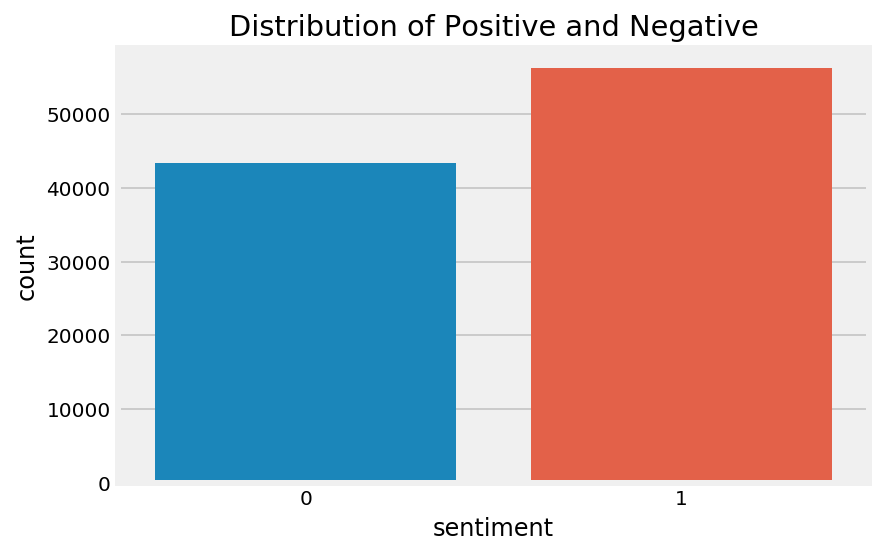

In [21]:
#plotting graph for distribution

sns.countplot(x = "sentiment", data = clean_tweets_data)
clean_tweets_data.loc[:,'sentiment'].value_counts()
plt.title('Distribution of Positive and Negative')

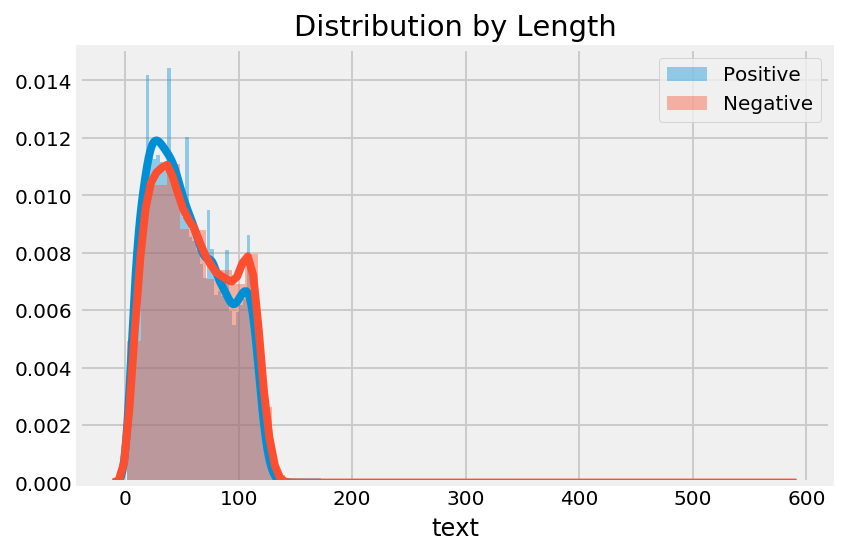

In [22]:
# plotting graph by length.

pos =clean_tweets_data[clean_tweets_data['sentiment'] == 1]['text'].str.len()
sns.distplot(pos, label='Positive')
neg = clean_tweets_data[clean_tweets_data['sentiment'] == 0]['text'].str.len()
sns.distplot(neg, label='Negative')
plt.title('Distribution by Length')
plt.legend()

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


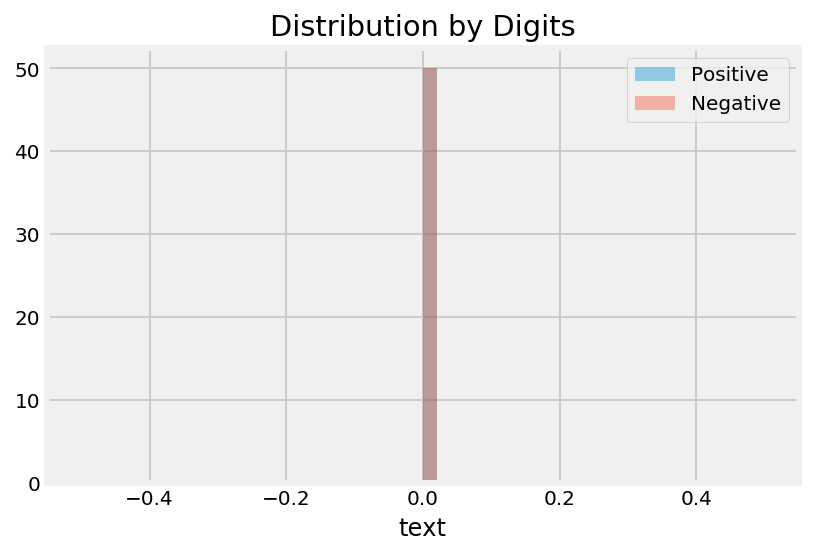

In [23]:
#plotting graph by digits.

pos1 = clean_tweets_data[clean_tweets_data['sentiment'] == 1 ]['text'].str.replace(r'\D+', '').str.len()
sns.distplot(pos1, label='Positive')
neg1 = clean_tweets_data[clean_tweets_data['sentiment'] == 0 ]['text'].str.replace(r'\D+', '').str.len()
sns.distplot(neg1, label='Negative')
plt.title('Distribution by Digits')
plt.legend()

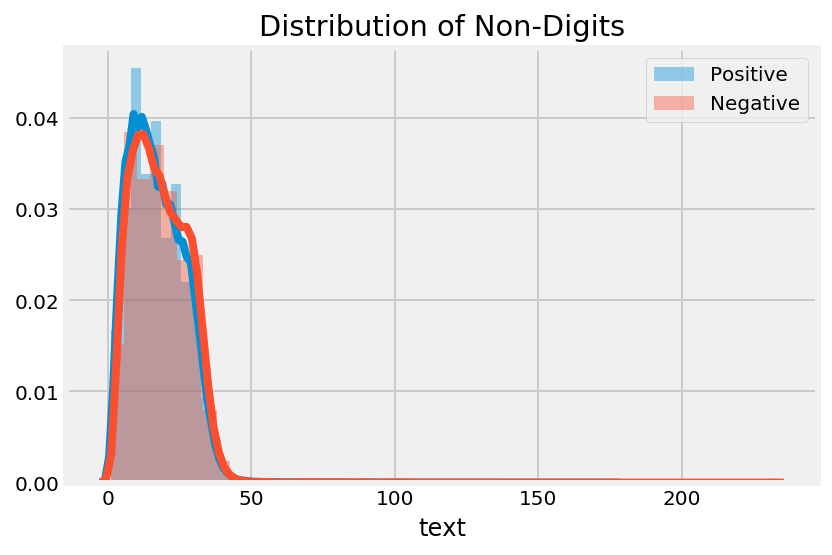

In [24]:
#plotting graph for non-digits.

pos2 = tweets_data[tweets_data['sentiment'] == 1]['text'].str.replace(r'\w+', '').str.len()
sns.distplot(pos2, label='Positive')
neg2 = tweets_data[tweets_data['sentiment'] == 0]['text'].str.replace(r'\w+', '').str.len()
sns.distplot(neg2, label='Negative')
plt.title('Distribution of Non-Digits')
plt.legend()

In [25]:
from collections import Counter
#for counting frequently occurence of pos and neg.

count1 = Counter(" ".join(clean_tweets_data[clean_tweets_data['sentiment']== 1]["text"]).split()).most_common(30)
data1 = pd.DataFrame.from_dict(count1)
data1 = data1.rename(columns={0: "words of pos", 1 : "count"})
count2 = Counter(" ".join(clean_tweets_data[clean_tweets_data['sentiment']== 0]["text"]).split()).most_common(30)
data2 = pd.DataFrame.from_dict(count2)
data2 = data2.rename(columns={0: "words of neg", 1 : "count_"})

#### Graph for top 30 words of positive

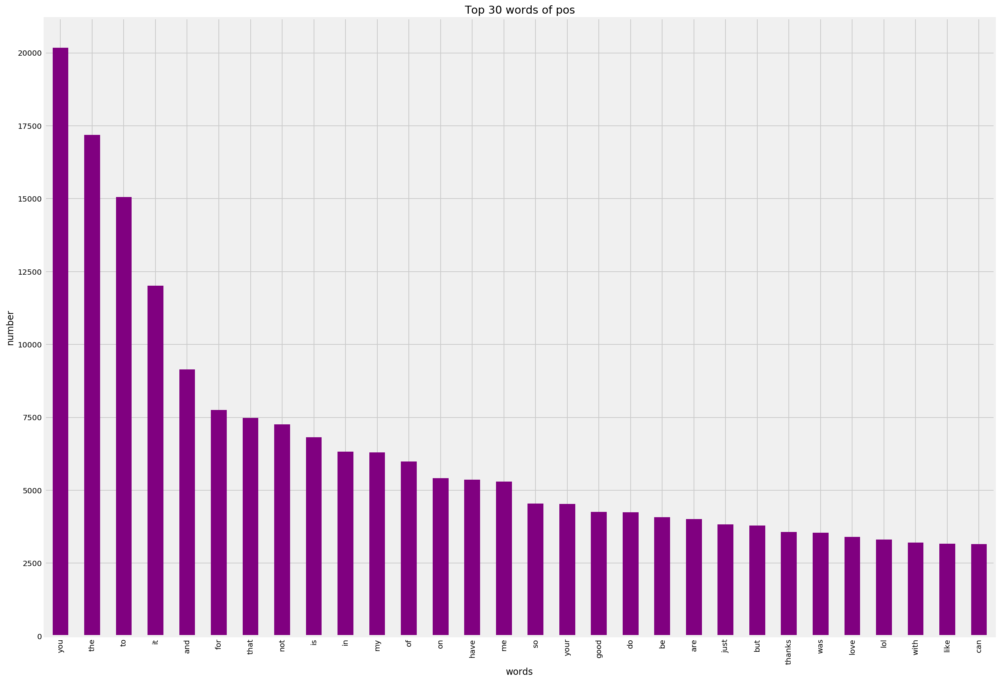

In [26]:
data1.plot.bar(legend = False, color = 'purple',figsize = (20,15))
y_pos = np.arange(len(data1["words of pos"]))
plt.xticks(y_pos, data1["words of pos"])
plt.title('Top 30 words of pos')
plt.xlabel('words')
plt.ylabel('number')
plt.show()

#### Graph for top 30 words of negative

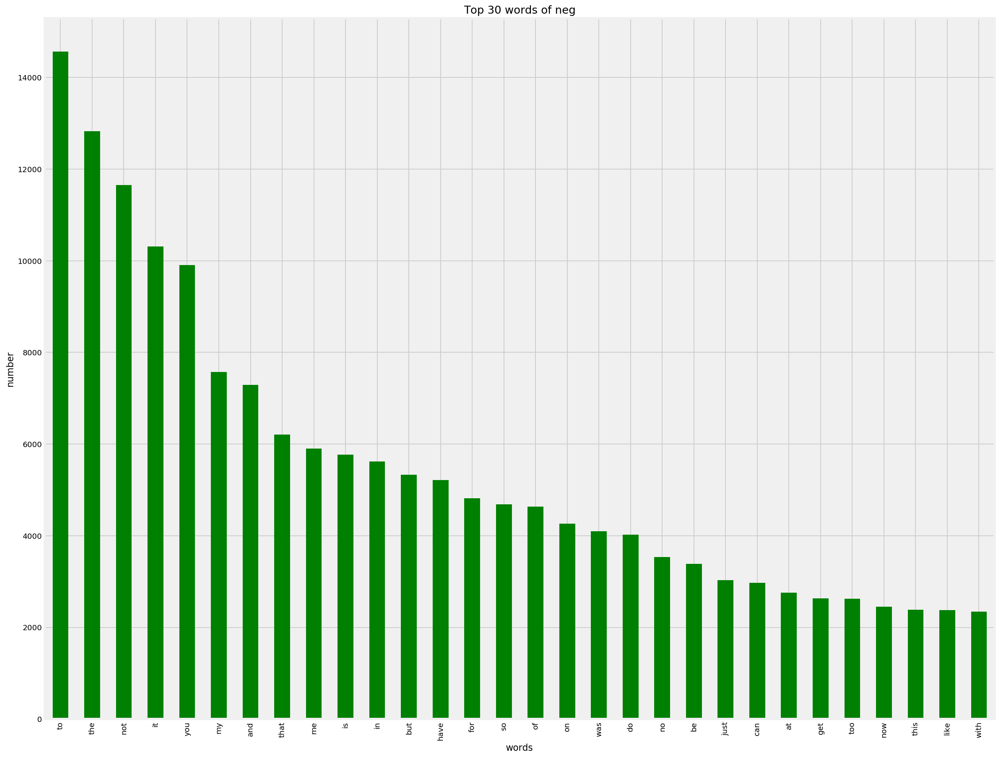

In [27]:
data2.plot.bar(legend = False, color = 'green', figsize = (20,17))
y_pos = np.arange(len(data2["words of neg"]))
plt.xticks(y_pos, data2["words of neg"])
plt.title('Top 30 words of neg')
plt.xlabel('words')
plt.ylabel('number')
plt.show()

### Word Cloud
#### 1 word Cloud for negative strings

In [28]:
neg_tweets = clean_tweets_data[clean_tweets_data.sentiment == 0]
# neg_tweets

neg_string = []
for t in neg_tweets.text:
    neg_string.append(t)
# neg_string
neg_string = pd.Series(neg_string).str.cat(sep=' ')
# neg_string

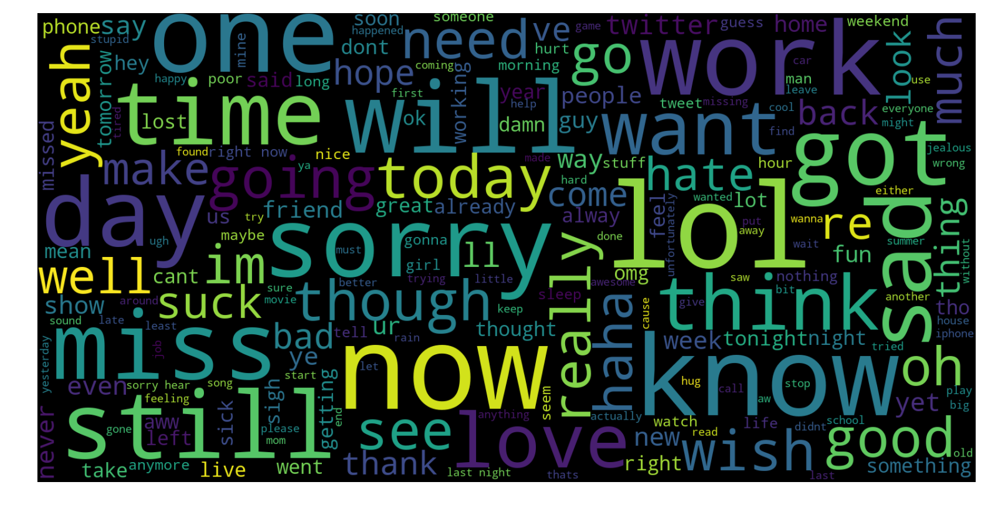

In [29]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(neg_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [30]:
for t in neg_tweets.text[:200]:
    if 'love' in t:
        print (t)

friends are leaving me cause of this stupid love
love you guys so much that it hurts
jus got hom fr tda funeral so sad cried so much times much love grandpa never got to say my last goodbye to him
miss my love jamie


OK, even though the tweets contain the word "love", in these cases it is negative sentiment because the tweet has mixed emotions like "love" but "miss". Or sometimes used in a sarcastic way.

#### 2 word Cloud for positive strings

In [31]:
pos_tweets = clean_tweets_data[clean_tweets_data.sentiment == 1]
pos_string = []
for t in pos_tweets.text:
    pos_string.append(t)
pos_string = pd.Series(pos_string).str.cat(sep=' ')

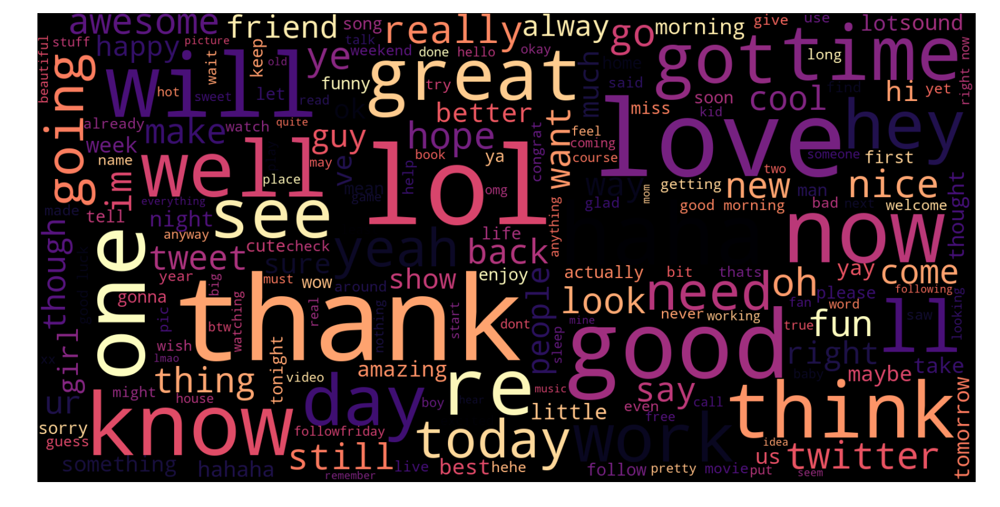

In [32]:
wordcloud = WordCloud(width=1600, height=800,max_font_size=200,colormap='magma').generate(pos_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

#### 3 word Cloud for all strings

In [33]:
all_string = []
for t in clean_tweets_data.text:
    all_string.append(t)
all_string = pd.Series(all_string).str.cat(sep=' ')

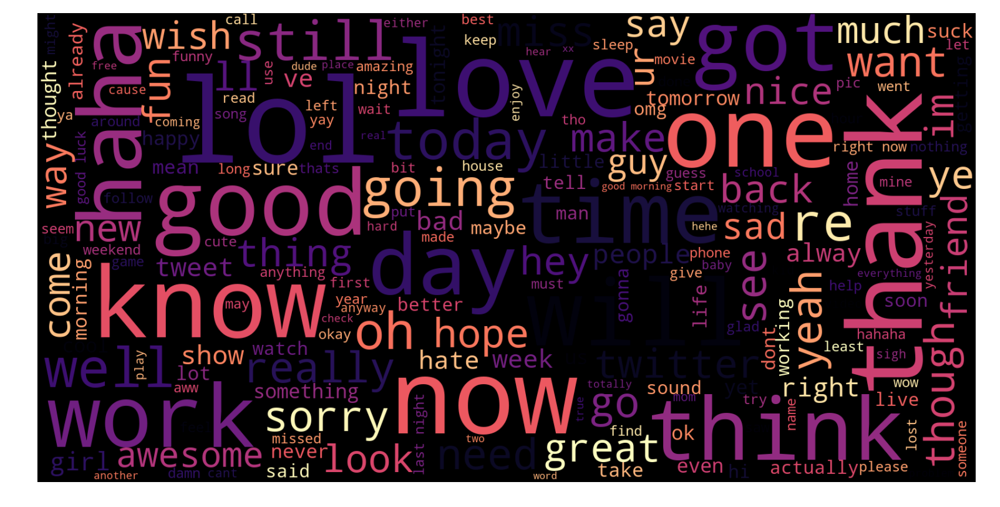

In [34]:
wordcloud = WordCloud(width=1600, height=800,max_font_size=200,colormap='magma').generate(all_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [35]:
del pos_tweets, pos_string, neg_tweets, neg_string, wordcloud, all_string #, df

# Models

## NaiveBayesClassifier with multiple Ngram (unigram and bigram)

In [36]:
stopwords_english = stopwords.words('english')

In [37]:
# clean words, i.e. remove stopwords and punctuation
def clean_words(words, stopwords_english):
    words_clean = []
#     print(type(words))
    for word in words:
        word = word.lower()
        if word not in stopwords_english and word not in string.punctuation:
            words_clean.append(word)    
    return words_clean 

In [38]:
# feature extractor function for unigram
def bag_of_words(words):    
    words_dictionary = dict([word, True] for word in words)    
    return words_dictionary

In [39]:
# feature extractor function for ngrams (bigram)
def bag_of_ngrams(words, n=2):
    words_ng = []
    for item in iter(ngrams(words, n)):
        words_ng.append(item)
    words_dictionary = dict([word, True] for word in words_ng)    
    return words_dictionary

In [40]:
from nltk.tokenize import word_tokenize
text = "It was a very good movie."
words = word_tokenize(text.lower())
words

['it', 'was', 'a', 'very', 'good', 'movie', '.']

In [41]:
bag_of_ngrams(words)

{('it', 'was'): True,
 ('was', 'a'): True,
 ('a', 'very'): True,
 ('very', 'good'): True,
 ('good', 'movie'): True,
 ('movie', '.'): True}

In [42]:
words_clean = clean_words(words, stopwords_english)
words_clean

['good', 'movie']

In [43]:
important_words = ['above', 'below', 'off', 'over', 'under', 'more', 'most', 'such', 'no', 'nor', 'not', 'only', 'so', 'than', 'too', 'very', 'just', 'but']

In [44]:
stopwords_english_for_bigrams = set(stopwords_english) - set(important_words)

In [45]:
words_clean_for_bigrams = clean_words(words, stopwords_english_for_bigrams)
words_clean_for_bigrams

['very', 'good', 'movie']

In [46]:
unigram_features = bag_of_words(words_clean)
unigram_features

{'good': True, 'movie': True}

In [47]:
bigram_features = bag_of_ngrams(words_clean_for_bigrams)
bigram_features

{('very', 'good'): True, ('good', 'movie'): True}

In [48]:
# combine both unigram and bigram features
all_features = unigram_features.copy()
all_features.update(bigram_features)
all_features

{'good': True, 'movie': True, ('very', 'good'): True, ('good', 'movie'): True}

In [49]:
# let's define a new function that extracts all features
# i.e. that extracts both unigram and bigrams features
def bag_of_all_words(words, n=2):
    words_clean = clean_words(words, stopwords_english)
    words_clean_for_bigrams = clean_words(words, stopwords_english_for_bigrams)
 
    unigram_features = bag_of_words(words_clean)
    bigram_features = bag_of_ngrams(words_clean_for_bigrams)
 
    all_features = unigram_features.copy()
    all_features.update(bigram_features)
 
    return all_features

In [50]:
bag_of_all_words(words)

{'good': True, 'movie': True, ('very', 'good'): True, ('good', 'movie'): True}

In [51]:
# import numpy as np
# pos_reviews = np.array([row for row in tweet_data[tweet_data.sentiment == 1].text.str.split()])
pos_reviews = [row for row in clean_tweets_data[clean_tweets_data.sentiment == 1].text.str.split()]
# [value for (index, value) in pos_reviews.items()]
pos_reviews

[['omg', 'its', 'already'],
 ['handed', 'in', 'my', 'uniform', 'today', 'miss', 'you', 'already'],
 ['hmmmm', 'wonder', 'how', 'she', 'my', 'number'],
 ['thanks',
  'to',
  'all',
  'the',
  'haters',
  'up',
  'in',
  'my',
  'face',
  'all',
  'day'],
 ['feeling',
  'strangely',
  'fine',
  'now',
  'gonna',
  'go',
  'listen',
  'to',
  'some',
  'semisonic',
  'to',
  'celebrate'],
 ['you',
  're',
  'the',
  'only',
  'one',
  'who',
  'can',
  'see',
  'this',
  'cause',
  'no',
  'one',
  'else',
  'is',
  'following',
  'me',
  'this',
  'is',
  'for',
  'you',
  'because',
  'you',
  're',
  'pretty',
  'awesome'],
 ['goodbye', 'exams', 'hello', 'alcohol', 'tonight'],
 ['uploading', 'pictures', 'on', 'friendster'],
 ['so',
  'wrote',
  'something',
  'last',
  'week',
  'and',
  'got',
  'call',
  'from',
  'someone',
  'in',
  'the',
  'new',
  'york',
  'office'],
 ['do',
  'need',
  'to',
  'even',
  'say',
  'it',
  'do',
  'well',
  'here',
  'go',
  'anyways',
  'chris',

In [52]:
neg_reviews = [row for row in clean_tweets_data[clean_tweets_data.sentiment == 0].text.str.split()]
neg_reviews

[['is', 'so', 'sad', 'for', 'my', 'apl', 'friend'],
 ['missed', 'the', 'new', 'moon', 'trailer'],
 ['omgaga',
  'im',
  'sooo',
  'im',
  'gunna',
  'cry',
  've',
  'been',
  'at',
  'this',
  'dentist',
  'since',
  'was',
  'suposed',
  'just',
  'get',
  'crown',
  'put',
  'on',
  'mins'],
 ['think', 'mi', 'bf', 'is', 'cheating', 'on', 'me'],
 ['or', 'just', 'worry', 'too', 'much'],
 ['sunny', 'again', 'work', 'tomorrow', 'tv', 'tonight'],
 ['must', 'think', 'about', 'positive'],
 ['this', 'weekend', 'has', 'sucked', 'so', 'far'],
 ['jb', 'isnt', 'showing', 'in', 'australia', 'any', 'more'],
 ['ok', 'thats', 'it', 'you', 'win'],
 ['this', 'is', 'the', 'way', 'feel', 'right', 'now'],
 ['awhhe',
  'man',
  'completely',
  'useless',
  'rt',
  'now',
  'funny',
  'all',
  'can',
  'do',
  'is',
  'twitter'],
 ['huge', 'roll', 'of', 'thunder', 'just', 'now', 'so', 'scary'],
 ['just',
  'cut',
  'my',
  'beard',
  'off',
  'it',
  'only',
  'been',
  'growing',
  'for',
  'well',
  'ov

In [53]:
pos_reviews_set = []
for words in pos_reviews:
#     print(words)
    pos_reviews_set.append((bag_of_all_words(words), 'pos'))
pos_reviews_set

[({'omg': True, 'already': True, ('omg', 'already'): True}, 'pos'),
 ({'handed': True,
   'uniform': True,
   'today': True,
   'miss': True,
   'already': True,
   ('handed', 'uniform'): True,
   ('uniform', 'today'): True,
   ('today', 'miss'): True,
   ('miss', 'already'): True},
  'pos'),
 ({'hmmmm': True,
   'wonder': True,
   'number': True,
   ('hmmmm', 'wonder'): True,
   ('wonder', 'number'): True},
  'pos'),
 ({'thanks': True,
   'haters': True,
   'face': True,
   'day': True,
   ('thanks', 'haters'): True,
   ('haters', 'face'): True,
   ('face', 'day'): True},
  'pos'),
 ({'feeling': True,
   'strangely': True,
   'fine': True,
   'gonna': True,
   'go': True,
   'listen': True,
   'semisonic': True,
   'celebrate': True,
   ('feeling', 'strangely'): True,
   ('strangely', 'fine'): True,
   ('fine', 'gonna'): True,
   ('gonna', 'go'): True,
   ('go', 'listen'): True,
   ('listen', 'semisonic'): True,
   ('semisonic', 'celebrate'): True},
  'pos'),
 ({'one': True,
   'see':

In [54]:
neg_reviews_set = []
for words in neg_reviews:
#     print(words)
    neg_reviews_set.append((bag_of_all_words(words), 'neg'))
neg_reviews_set

[({'sad': True,
   'apl': True,
   'friend': True,
   ('so', 'sad'): True,
   ('sad', 'apl'): True,
   ('apl', 'friend'): True},
  'neg'),
 ({'missed': True,
   'new': True,
   'moon': True,
   'trailer': True,
   ('missed', 'new'): True,
   ('new', 'moon'): True,
   ('moon', 'trailer'): True},
  'neg'),
 ({'omgaga': True,
   'im': True,
   'sooo': True,
   'gunna': True,
   'cry': True,
   'dentist': True,
   'since': True,
   'suposed': True,
   'get': True,
   'crown': True,
   'put': True,
   'mins': True,
   ('omgaga', 'im'): True,
   ('im', 'sooo'): True,
   ('sooo', 'im'): True,
   ('im', 'gunna'): True,
   ('gunna', 'cry'): True,
   ('cry', 'dentist'): True,
   ('dentist', 'since'): True,
   ('since', 'suposed'): True,
   ('suposed', 'just'): True,
   ('just', 'get'): True,
   ('get', 'crown'): True,
   ('crown', 'put'): True,
   ('put', 'mins'): True},
  'neg'),
 ({'think': True,
   'mi': True,
   'bf': True,
   'cheating': True,
   ('think', 'mi'): True,
   ('mi', 'bf'): True

In [128]:
print (len(pos_reviews_set), len(neg_reviews_set)) # Output: (1000, 1000)
 
# radomize pos_reviews_set and neg_reviews_set
# doing so will output different accuracy result everytime we run the program
from random import shuffle 
shuffle(pos_reviews_set)
shuffle(neg_reviews_set)

test_set = pos_reviews_set[:int((0.2*len(pos_reviews_set)))] + neg_reviews_set[:int((0.2*len(neg_reviews_set)))]
train_set = pos_reviews_set[int((0.2*len(pos_reviews_set))):] + neg_reviews_set[int((0.2*len(neg_reviews_set))):]
 
print(len(test_set),  len(train_set))

56204 43319
19903 79620


In [129]:
%%time
from nltk import classify
from nltk import NaiveBayesClassifier
 
classifier = NaiveBayesClassifier.train(train_set)
 
accuracy = classify.accuracy(classifier, test_set)
print(accuracy)
 
print (classifier.show_most_informative_features(10)) 

0.7405918705722755
Most Informative Features
    ('followers', 'day') = True              pos : neg    =     76.8 : 1.0
           ('so', 'sad') = True              neg : pos    =     63.8 : 1.0
         ('very', 'sad') = True              neg : pos    =     60.1 : 1.0
    ('get', 'followers') = True              pos : neg    =     48.2 : 1.0
       ('hope', 'great') = True              pos : neg    =     33.7 : 1.0
                   cries = True              neg : pos    =     31.6 : 1.0
        ('makes', 'sad') = True              neg : pos    =     29.3 : 1.0
                  gutted = True              neg : pos    =     29.3 : 1.0
         ('need', 'hug') = True              neg : pos    =     29.0 : 1.0
                    booo = True              neg : pos    =     29.0 : 1.0
None
CPU times: user 31.9 s, sys: 26.1 s, total: 58 s
Wall time: 1min 19s


In [130]:
from nltk.tokenize import word_tokenize

def test(text):
    custom_review_tokens = word_tokenize(text)
    custom_review_set = bag_of_all_words(custom_review_tokens)
    print (classifier.classify(custom_review_set)) # Output: neg
    # Negative review correctly classified as negative

    # probability result
    prob_result = classifier.prob_classify(custom_review_set)
    print (prob_result) # Output: <ProbDist with 2 samples>
    print (prob_result.max()) # Output: neg
    print (prob_result.prob("neg")) # Output: 0.770612685688
    print (prob_result.prob("pos")) # Output: 0.229387314312

In [131]:
custom_review = "I hated the film. It was a disaster. Poor direction, bad acting."
test(custom_review)

neg
<ProbDist with 2 samples>
neg
0.991879726887316
0.008120273112681582


In [132]:
custom_review = "It was a wonderful and amazing movie. I loved it. Best direction, good acting."
test(custom_review)

pos
<ProbDist with 2 samples>
pos
0.006164923625085275
0.9938350763749173


In [133]:
custom_review = 'handed in my uniform today miss you already'
test(custom_review)

neg
<ProbDist with 2 samples>
neg
0.9997684602007888
0.0002315397992105431


In [135]:
custom_review = input('please enter a sentence :')
test(custom_review)

please enter a sentence :bad things
neg
<ProbDist with 2 samples>
neg
0.940494597909923
0.059505402090076605


## splitting the tweets data into train and test sets

In [136]:
X_train, X_test, y_train, y_test = train_test_split(clean_tweets_data['text'], clean_tweets_data['sentiment'], test_size = 0.3, random_state = 37)
print ("X_train: ", len(X_train))
print("X_test: ", len(X_test))
print("y_train: ", len(y_train))
print("y_test: ", len(y_test))

X_train:  69666
X_test:  29857
y_train:  69666
y_test:  29857


In [137]:
corpus = []
for i in range(0,(len(clean_tweets_data))):
    review = re.sub('[^a-zA-Z]', ' ', clean_tweets_data['text'][i])
    review = review.lower()
    review = review.split()
    print(review)
    ps = PorterStemmer()
    review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
    review = ' '.join(review)
    corpus.append(review)

['is', 'so', 'sad', 'for', 'my', 'apl', 'friend']
['missed', 'the', 'new', 'moon', 'trailer']
['omg', 'its', 'already']
['omgaga', 'im', 'sooo', 'im', 'gunna', 'cry', 've', 'been', 'at', 'this', 'dentist', 'since', 'was', 'suposed', 'just', 'get', 'crown', 'put', 'on', 'mins']
['think', 'mi', 'bf', 'is', 'cheating', 'on', 'me']
['or', 'just', 'worry', 'too', 'much']
['sunny', 'again', 'work', 'tomorrow', 'tv', 'tonight']
['handed', 'in', 'my', 'uniform', 'today', 'miss', 'you', 'already']
['hmmmm', 'wonder', 'how', 'she', 'my', 'number']
['must', 'think', 'about', 'positive']
['thanks', 'to', 'all', 'the', 'haters', 'up', 'in', 'my', 'face', 'all', 'day']
['this', 'weekend', 'has', 'sucked', 'so', 'far']
['jb', 'isnt', 'showing', 'in', 'australia', 'any', 'more']
['ok', 'thats', 'it', 'you', 'win']
['this', 'is', 'the', 'way', 'feel', 'right', 'now']
['awhhe', 'man', 'completely', 'useless', 'rt', 'now', 'funny', 'all', 'can', 'do', 'is', 'twitter']
['feeling', 'strangely', 'fine', 'no

['squarespace', 'brighten', 'my', 'bad', 'day', 'never', 'win', 'anything']
['susan', 'boyle', 'didnt', 'win', 'mh', 'well', 'diversity', 'was', 'very', 'good', 'though', 'congratz']
['twenty']
['that', 'is', 'all', 'and', 'believe', 'me', 'it', 'enough']
['goooood', 'timessss']
['graduate']
['vandals', 'paint', 'swastikas', 'on', 'home', 'of', 'author', 'of', 'gay', 'lesbian', 'church', 'story', 'naples', 'daily', 'news']
['an', 'unknown', 'error', 'occured', 'uh', 'oh', 'iphone', 'os', 'fail', 'so', 'far']
['experts', 'homers', 'predict', 'eagles', 'to', 'go', 'and', 'giants', 'to', 'go', 'bs']
['know', 'you', 'hungry', 'so', 'lets', 'go', 'outside', 'on', 'the', 'balcony', 'so', 'you', 'can', 'eat']
['want', 'you', 'so', 'bad', 'it', 'driving', 'me', 'mad']
['the', 'men', 'uk', 'female', 'internet', 'entrepreneur', 'should', 'know', 'when', 'starting', 'and', 'growing', 'business', 'the', 'next', 'women']
['the', 'truth', 'is', 'hiding', 'in', 'your', 'eyes', 'paramore', 'decode']
[

['rain', 'rain', 'go', 'away']
['storms', 'are', 'scary']
['such', 'beautiful', 'satisfying', 'day', 'of', 'bargain', 'shopping', 'loves', 'it']
['tell', 'those', 'girls', 'your', 'clocking', 'out', 'lol']
['thank', 'god', 'today', 'is', 'friday', 'love', 'ti', 'ti']
['the', 'batt', 'to', 'my', 'internet', 'connection', 'died', 'guess', 'its', 'back', 'to', 'the', 'mobile']
['thrilled', 'about', 'being', 'at', 'work', 'this', 'morning']
['we', 'break', 'dance', 'not', 'hearts', 'by', 'short', 'stack', 'is', 'my', 'ringtone', 'love', 'that', 'song']
['now', 'has', 'it', 'for', 'the', 'th']
['squarespace', 'trackle', 'no', 'apple', 'iphone', 'card', 'for', 'us', 'maybe', 'tomorrow', 'guess', 'it', 'helps', 'if', 'you', 'tweet', 'it', 'huh', 'we', 'forgot']
['unsure', 'hassle', 'music']
['exhausted']
['want', 'some', 'ben', 'jerrys', 'cake', 'batter', 'please', 'ugh']
['my', 'life', 'is', 'very', 'lazzzzyyyy']
['wish', 'ella', 'was', 'on', 'or', 'somebody']
['ish', 'in', 'good', 'mood', '

['is', 'listenin', 'to', 'my', 'new', 'fav', 'band', 'more', 'amor']
['it', 'is', 'on', 'environmental', 'studies', 'and', 'driving', 'me', 'mental']
['ve', 'always', 'seen', 'bits', 'pieces', 'of', 'shottas', 'now', 've', 'seen', 'the', 'whole', 'movie', 'it', 'ends', 'sooooo', 'sad', 'gonna', 'cry']
['just', 'another', 'day', 'in', 'paradise']
['just', 'found', 'bone', 'in', 'my', 'chicken', 'nugget', 'not', 'cool']
['like', 'said', 'my', 'back', 'still', 'fucking', 'hurts', 'and', 'going', 'to', 'complain', 'about', 'it', 'like', 'no', 'one', 'business']
['love', 'you']
['my', 'aunties', 'dog', 'is', 'getting', 'put', 'down', 'hes', 'my', 'dogs', 'brother', 'aswell']
['my', 'head', 'feels', 'like', 'its', 'going', 'to', 'explode', 'mmm', 'what', 'horrendous', 'image', 'the', 'mess']
['my', 'head', 'is', 'killing', 'meee']
['my', 'name', 'is', 'amy', 'only', 'three', 'my', 'eyes', 'are', 'swollen', 'cannot', 'see', 'must', 'be', 'stupid', 'must', 'be', 'bad', 'what']
['my', 'picture'

['are', 'you', 'ok']
['argh', 'the', 'speakers', 'on', 'my', 'macbook', 'are', 'screwing', 'up', 'and', 'slowly', 'dying']
['as', 'simple', 'as', 'it', 'gets']
['at', 'chris', 'brown', 'honestly', 'dont', 'feel', 'bad', 'for', 'rihanna', 'anyways', 'out', 'nd', 'such']
['at', 'last', 'night']
['at', 'my', 'tweets', 'lady', 'saying', 'goodnite', 'tweets', 'later', 'lady', 'is', 'saying', 'good', 'morning', 'that', 'crazy', 'would', 'never', 'imagined', 'this', 'yrs', 'ago']
['at', 'the', 'nursery', 'the', 'wailing', 'have', 'just', 'ended', 'all', 'sleeping', 'soundly', 'working', 'morning', 'shift', 'tmrw', 'grr']
['at', 'the', 'random', 'mention', 'about', 'core', 'deals', 'that', 'are', 'almost', 'twice', 'as', 'much', 'sense', 'as', 'it', 'not', 'tied', 'to', 'himself', 'about', 'tv', 'every', 'night']
['at', 'work', 'fuck']
['at', 'work', 'and', 'got', 'loads', 'to', 'do', 'leave', 'today', 'toodles', 'lufflies', 'xxx']
['attempting', 'to', 'get', 'other', 'people', 'on', 'twitter'

['noooo', 'why', 'things', 'are', 'so', 'complicated', 'if', 'spelt', 'thy', 'wrong', 'idc']
['butterfly', 'day', 'jun', 'holiday']
['what', 'does', 'it', 'means']
['jfk', 'international', 'airport']
['jonas', 'brothers', 'youtube', 'bein', 'suspended']
['moval', 'court', 'traffic', 'ticket', 'should', 'sleeping', 'aahh']
['work', 'only', 'hours', 'of', 'it', 'today', 'and', 'then', 'weeeekend', 'can', 'not', 'wait', 'for', 'the', 'long', 'weekend', 'to', 'begin', 'gonna', 'get', 'some', 'things', 'done', 'for', 'sure']
['praying', 'for', 'my', 'cold', 'to', 'go', 'to', 'my', 'head', 'because', 'skunk', 'just', 'sprayed', 'my', 'yard', 'this', 'is', 'the']
['created', 'from', 'the', 'realms', 'of', 'light', 'pure', 'love', 'commands', 'the', 'fold', 'when', 'you', 'think', 'and', 'speak', 'with', 'love', 'new', 'world', 'you', 'll', 'behold']
['the', 'music', 'was', 'so', 'quiet', 'that', 'he', 'was', 'sure', 'there', 'was', 'massive', 'hoax', 'being', 'played', 'on', 'him', 'alone']
[

['do', 'not', 'like', 'ending', 'the', 'night', 'arguing', 'with', 'the', 'huz', 'in', 'smf', 'over', 'stupid', 'home', 'improvement', 'crap']
['do', 'not', 'wanna', 'go', 'to', 'work']
['tweetwrath', 'think', 'just', 'coined', 'new', 'word', 'where', 'is', 'that', 'twitter', 'dictionary']
['you', 'guys', 'have', 'fun', 'last', 'night', 'hope', 'you', 'got', 'my', 'text', 'pub', 'quizzage', 'tomorrow']
['know', 'but', 'll', 'miss', 'having', 'someone', 'to', 'bitch', 'about', 'brussels', 'trams', 'metro', 'bad', 'customer', 'service', 'lack', 'of', 'quorn', 'etc']
['class', 'no', 'answer', 'work', 'on', 'the', 'road', 'nola', 'im', 'hungry', 'with', 'no', 'eat', 'with']
['funny', 'fact', 'has', 'about', 'his', 'town', 'population', 'following', 'him', 'on', 'tumblr', 'how', 'does']
['am', 'gonna', 'miss', 'you', 'too', 'if', 'it', 'really', 'gonna', 'be', 'years', 'might', 'end', 'up', 'visiting', 'you', 'in', 'aussie', 'land', 'wish']
['guess', 'that', 'the', 'end', 'of', 'my', 'love'

['gcse', 'clearly', 'suck']
['geez', 'chelsea', 'already', 'scored', 'against', 'everton']
['gerald', 'lost', 'friend', 'idk', 'what', 'to', 'say', 'this', 'is', 'like', 'day', 'of', 'crazy', 'events']
['getting', 'goodbye', 'mails', 'from', 'iran', 'iranelection']
['getting', 'mani', 'pedi', 'with', 'the', 'husband']
['getting', 'webcam', 'today']
['getting', 'ready', 'to', 'leave', 'for', 'spring', 'city', 'tn', 'going', 'to', 'miss', 'your', 'show', 'tonight']
['getting', 'ready', 'to', 'watch', 'the', 'sprint', 'cup', 'boys', 'try', 'to', 'tame', 'the', 'concrete', 'monster', 'mile', 'hopefully', 'tires', 'will', 'not', 'be', 'too', 'much', 'of', 'an', 'issue']
['girls', 'girls', 'do', 'not', 'fight', 'you', 'both', 'can', 'have', 'me', 'there', 'enough', 'to', 'go', 'around']
['gnight', 'my', 'phone', 'sucks', 'bleh']
['night', 'tweeties', 'talk', 'to', 'you', 'all', 'in', 'the', 'am', 'haha', 'you', 'have', 'work', 'in', 'the', 'am']
['go', 'away', 'migraine', 'you', 'are', 'not'

['all', 'that', 'carpet', 'cleaning', 'for', 'nothing', 'the', 'carpets', 'smell', 'bad', 'now', 'at', 'the', 'old', 'house', 'we', 'have', 'to', 'call', 'carpet', 'cleaner']
['all', 'the', 'firends', 'make', 'in', 'the', 'airport', 'has', 'to', 'leave', 'before', 'do']
['all', 'the', 'messages', 'saved', 'in', 'my', 'voicemail', 'box', 'are', 'gone', 'now', 'have', 'nothing', 'to', 'listen', 'to']
['alllways', 'raining', 'in', 'aberdeen', 'here', 'come', 'sunnnnshine']
['alright', 'back', 'onto', 'being', 'bored', 'going', 'to', 'bed', 'any', 'time', 'soon', 'have', 'to', 'get', 'up', 'early']
['am', 'loner']
['am', 'racit']
['am', 'wondering', 'why', 'friends', 'are', 'telling', 'me', 'me', 'to', 'shut', 'it', 'when', 'actually', 'have', 'barely', 'said', 'anything']
['amy', 'hit', 'me', 'cos', 'call', 'her', 'drink', 'lady']
['and', 'shocker', 'for', 'those', 'who', 'left', 'sytycd', 'tonight', 'one', 'run', 'cut', 'too', 'short']
['and', 'hug', 'is', 'there', 'waiting', 'line', 'to

['bah', 'getting', 'bit', 'sick', 'of', 'people', 'whining', 'on', 'the', 'internet']
['bandom', 'has', 'spoiled', 'me', 'rotten', 'and', 'now', 'feeling', 'very', 'emo', 'why', 'so', 'few', 'good', 'fruits', 'basket', 'fics', 'why']
['battery', 'is', 'low', 'boooooooo', 'in', 'palm', 'springs', 'ca']
['hope', 'you', 'all', 'are', 'having', 'good', 'day', 'night']
['hoping', 'that', 'the', 'rd', 'time', 'is', 'lucky', 'and', 'my', 'formal', 'photos', 'can', 'up', 'load', 'on', 'facebook', 'without', 'crash']
['how', 'get', 'ocder', 'eat', 'more', 'than', 'meals', 'day', 'we', 'could', 'take', 'him', 'off', 'meds', 'watch', 'him', 'slowly', 'fall', 'apart', 'again', 'but', 'he', 'eat', 'like', 'horse']
['how', 'can', 'someone', 'hurt', 'someone', 'soo', 'much', 'aspecially', 'to', 'family']
['how', 'horrible', 'georgia', 'theater']
['how', 'is', 'this', 'possible', 'demand', 'justification', 'no', 'way', 'can', 'stand', 'day', 'of', 'this', 'at', 'work', 'tomorrow']
['how', 'much', 'lon

['do', 'not', 'know', 'why', 'but', 'really', 'sad', 'and', 'worried', 'at', 'the', 'moment']
['do', 'not', 'know', 'why', 'can', 'not', 'dm', 'from', 'my', 'phone', 'this', 'suck']
['do', 'not', 'know', 'why', 'sad', 'and', 'worried', 'at', 'the', 'moment', 'really', 'do', 'not', 'know']
['do', 'not', 'like', 'crying']
['do', 'not', 'think', 'my', 'dog', 'is', 'gonna', 'make', 'it', 'past', 'the', 'night']
['dont', 'think', 'yoru', 'there', 'bummma']
['do', 'not', 'wanna', 'be', 'at', 'work', 'right', 'now', 'sooo', 'tired', 'and', 'smidge', 'hungover']
['do', 'not', 'wanna', 'be', 'sick']
['dont', 'wanna', 'do', 'this', 'im', 'gunna', 'cry']
['do', 'not', 'wanna', 'go', 'to', 'work', 'tired', 'and', 'miss', 'my', 'papi']
['do', 'not', 'want', 'school', 'anymoreee']
['dunno', 'what', 'to', 'do', 'now']
['failed', 'my', 'math', 'final', 'part', 'hate', 'calculus', 'now']
['feel', 'bad', 'mewithoutyou']
['feel', 'just', 'like', 'my', 'car', 'inside', 'banged', 'up', 'and', 'sad', 'maybe

['hope', 'everyone', 'has', 'great', 'day']
['hope', 'dont', 'have', 'any', 'weird', 'brain', 'problem', 'or', 'disease', 'think', 'ill', 'be', 'fine', 'though', 'the', 'nurse', 'doesnt', 'sound', 'too', 'worried']
['hope', 'justice', 'isnt', 'mad', 'at', 'me']
['hope', 'the', 'rape', 'ghost', 'does', 'not', 'get', 'me']
['hope', 'you', 'find', 'great', 'trousers']
['is', 'to', 'drunk', 'to', 'know', 'if', 'in', 'partht', 'or', 'what', 'nor']
['just', 'ate', 'some', 'bad', 'fruit', 'think']
['just', 'busted', 'my', 'ass', 'in', 'the', 'kitchen', 'and', 'wearin', 'flats', 'grr', 'stupid', 'floor']
['just', 'got', 'dumped', 'by', 'my', 'boyfrnd', 'love', 'makayla']
['just', 'got', 'to', 'my', 'tweet', 'do', 'get', 'prize', 'sidebar', 'cassidy', 'your', 'nasty', 'why', 'gots', 'to', 'hear', 'about', 'your', 'wide', 'peen', 'for', 'smh']
['just', 'had', 'bug', 'crawling', 'on', 'my', 'leg', 'it', 'scared', 'me', 'but', 'now', 'its', 'in', 'water', 'bottle', 'found', 'on', 'my', 'floor', 'h

['miss', 'bby', 'want', 'to', 'see', 'her', 'now']
['miss', 'direct', 'tv', 'could', 'be', 'watching', 'the', 'cake', 'boss', 'now', 'or', 'already', 'watched', 'it']
['miss', 'guild', 'wars', 'still', 'have', 'not', 'touched', 'the', 'most', 'recent', 'one', 'it', 'just', 'sitting', 'on', 'my', 'desk', 'skylar', 'alanine', 'will', 'get', 'some', 'action', 'soon']
['miss', 'kelli', 'but', 'glad', 'she', 'having', 'fun', 'fun', 'saturday', 'night', 'goodnight', 'miss', 'jeffy']
['miss', 'my', 'boys']
['miss', 'my', 'brycey', 'alreadt', 'oside', 'bound']
['miss', 'my', 'cell', 'phone']
['miss', 'my', 'friends']
['miss', 'my', 'leddy', 'boo']
['miss', 'the', 'days', 'when', 'was', 'the', 'starfish', 'to', 'his', 'sponge']
['miss', 'us', 'miss', 'the', 'old', 'times', 'with', 'the', 'guyz']
['miss', 'you', 'where', 'are', 'you']
['need', 'hug']
['need', 'money']
['need', 'new', 'ipod', 'this', 'freaking', 'thing', 'will', 'not', 'sync', 'anymore', 'anywho', 'hoping', 'the', 'magics', 'make

['wanna', 'watch', 'the', 'new', 'ep', 'but', 'of', 'course', 'it', 'ppv', 'put', 'it', 'on', 'the', 'pay', 'members', 'page', 'too', 'please', 'matt']
['want', 'all', 'my', 'friends', 'back', 'via', 'as', 'do', 'happy', 'for', 'you', 'mike']
['want', 'an', 'unltimate', 'maing', 'room', 'free', 'astros', 'xd']
['want', 'baja', 'california', 'starbursts', 'for', 'some', 'odd', 'reason']
['want', 'iphone', 'os', 'how', 'much', 'longer', 'must', 'wait', 'me', 'eating', 'french', 'toast', 'yum', 'yum', 'yum']
['want', 'my', 'casanova', 'clopin']
['want', 'summer', 'love', 'please', 'lorddd', 'lol', 'im', 'so', 'patheticcc']
['want', 'the', 'ham', 'sandwich', 'now', 'but', 'diannaaaa', 'is', 'making', 'me', 'play', 'pokemon']
['want', 'to', 'happy', 'content', 'tell', 'me', 'hw']
['want', 'to', 'but', 'can', 'not']
['want', 'to', 'enter', 'in', 'my', 'old', 'my', 'space', 'but', 'forget', 'the', 'password']
['want', 'to', 'get', 'away']
['want', 'to', 'get', 'out', 'of', 'sm', 'riiight', 'n

['exactly', 'where', 'want', 'to', 'be']
['exhausted', 'having', 'pasta', 'soon', 'thank', 'god']
['im', 'followin', 'demi', 'she', 'rocks']
['freaking', 'out', 'got', 'something', 'to', 'admit']
['im', 'fukin', 'bored', 'im', 'goin', 'on', 'gs', 'bit']
['finally', 'awake']
['finally', 'catching', 'the', 'new', 'episode', 'of', 'college', 'hill']
['finally', 'finished', 'now', 'can', 'sleep', 'peacefully']
['finally', 'friday']
['finally', 'got', 'twitter', 'trynna', 'see', 'what', 'the', 'hype', 'is', 'about']
['fine', 'just', 'wanted', 'to', 'share', 'with', 'the', 'greatness', 'of', 'baby', 'soup', 'and', 'how', 'it', 'contributes', 'to', 'cannibal', 'society']
['fine', 'll', 'watch', 'it', 'am', 'so', 'king', 'rad']
['finished', 'watching', 'friends', 'so', 'sad', 'why', 'whyyyyyy', 'did', 'it', 'had', 'to', 'ennndddd']
['finishing', 'up', 'this', 'stupid', 'project', 'then', 'off', 'for', 'fun', 'sundress', 'booze', 'and', 'sunshine', 'love', 'this', 'country']
['firefox', 'will',

['good', 'morning', 'peeps', 'ahhh', 'it', 'gonna', 'be', 'wonderful', 'saturday']
['good', 'morning', 'twitterers', 'ily']
['good', 'night', 'twittaz']
['good', 'weekend', 'now', 'isu', 'woooo']
['goodbyeeee', 'arizona', 'see', 'you', 'in', 'weeks']
['goodmorning', 'tweeties']
['goodnight', 'everbody', 'hope', 'can', 'fall', 'asleep', 'fml']
['goodnight']
['got', 'headache']
['got', 'earache', 'and', 'wants', 'to', 'go', 'home']
['got', 'first', 'period', 'for', 'summer', 'school']
['got', 'my', 'college', 'interview', 'in', 'an', 'hour']
['got', 'the', 'best', 'addon', 'for', 'twitter', 'if', 'you', 'use', 'firefox', 'get', 'twitterfox']
['gotta', 'love', 'those', 'shoes', 'dora', 'manny', 'can', 'keep', 'you', 'on', 'your', 'toes', 'with', 'spanish', 'yo', 'se', 'que', 'tienes', 'un', 'nuevo', 'amor', 'thats', 'selena']
['grace', 'suck', 'know', 'know', 'we', 'know']
['grandfather', 'sick', 'going', 'to', 'town', 'to', 'see', 'him', 'on', 'thursday']
['grandma', 'wont', 'cut', 'my',

['have', 'to', 'take', 'my', 'mom', 'to', 'the', 'hospital', 'hopefully', 'she', 'll', 'be', 'alright']
['have', 'not', 'been', 'able', 'to', 'get', 'thru', 'to', 'ticketmaster', 'to', 'get', 'ac', 'dc', 'tickets', 'wtf']
['havent', 'twittered', 'in', 'so', 'long', 'ive', 'been', 'busy', 'doing', 'much', 'of', 'everything', 'am', 'sleep', 'time', 'note', 'to', 'self', 'twitter', 'moree']
['having', 'day', 'in', 'bed', 'not', 'feeling', 'myself', 'at', 'all', 'today']
['having', 'down', 'moment', 'think', 'need', 'sleep', 'totally', 'want', 'to', 'work', 'my', 'but', 'off', 'at', 'something', 'believe', 'in', 'but', 'do', 'not', 'think', 'ever', 'will']
['having', 'good', 'night', 'hehe', 'almost', 'time', 'to', 'get', 'homegirl', 'and', 'come', 'home', 'and', 'sleep', 'im', 'so', 'damn', 'sleepy']
['having', 'very', 'nice', 'day']
['hay', 'fever', 'has', 'finally', 'got', 'me', 'ick']
['he', 'makes', 'me', 'so', 'happy']
['he', 'makes', 'my', 'little', 'heart', 'smile']
['he', 'never',

['hit', 'by', 'someone', 'running', 'red', 'light', 'my', 'cars', 'totalled', 'but', 'thank', 'god', 'just', 'have', 'headache', 'nothing', 'more']
['hmm', 'really', 'like', 'the', 'songs', 'on', 'the', 'summer', 'ep', 'nsn']
['holy', 'shit']
['home', 'and', 'away', 've', 'been', 'home', 'to', 'watch', 'this', 'every', 'day', 'this', 'week']
['home', 'from', 'friends', 'aha', 'great', 'party']
['home', 'from', 'ninja', 'weekend', 'will', 'miss', 'you', 'dearly', 'best', 'spent', 'on', 'tickets']
['homework']
['homework', 'uggh']
['honorary', 'hollywood', 'mom', 'mafia', 'followfriday']
['hope', 'it', 'gets', 'better', 'soon']
['hopefully', 'make', 'it', 'to', 'next', 'years', 'parade', 'yes', 'there', 'will', 'be', 'one']
['how', 'beautiful', 'is', 'prince', 'oh', 'my', 'goodness']
['how', 'do', 'make', 'my', 'headache', 'go', 'away']
['how', 'do', 'you', 'just', 'ignore', 'them', 'when', 'theyre', 'online', 'too', 'god', 'want', 'my', 'friend', 'back']
['how', 'love', 'the', 'sun', 'a

['do', 'not', 'like', 'your', 'livejournal', 'because', 'you', 'do', 'not', 'use', 'fancy', 'words', 'like', 'that', 'in', 'real', 'life']
['do', 'not', 'really', 'wanna', 'do', 'this', 'love', 'stinks', 'sometimes']
['dont', 'wanna', 'wait', 'more', 'dayss']
['dont', 'want', 'her', 'to', 'be', 'mad', 'at', 'me', 'she', 'is', 'sooo', 'sweet']
['dont', 'want', 'to', 'go', 'to', 'bed', 'but', 'im', 'so', 'tired']
['dont', 'wanta', 'go', 'to', 'school', 'today']
['dontcthink', 'slept', 'enough']
['dontttttttttttt', 'feeeeeeeeel', 'goooood']
['feel', 'bad', 'now']
['feel', 'like', 'idiot', 'yet', 'again']
['feel', 'like', 'freakin', 'crying']
['feel', 'like', 'there', 'school', 'tomorrow', 'most', 'likely', 'there', 'will', 'be', 'noooooooo']
['feel', 'sad', 'discouraged', 'lonely', 'unlucky']
['feel', 'so', 'shitty', 'fml']
['find', 'no', 'reason', 'to', 'keep', 'on', 'going', 'anymore']
['finished', 'the', 'cookies', 'too', 'fast', 'now', 'do', 'not', 'have', 'cookies', 'for', 'tomorrow'

['lolz', 'it', 'sr', 'tce', 'tbe']
['lonely', 'lol', 'so', 'boredddddd']
['long', 'ride', 'home', 'and', 'am', 'bored']
['long', 'week', 'ahead', 'another', 'weekend', 'off']
['long', 'week', 'ahead', 'but', 'the', 'good', 'thing', 'is', 'we', 'have', 'the', 'weekend', 'to', 'look', 'forward', 'to']
['lookin', 'up', 'strippin', 'classes']
['looks', 'like', 'have', 'to', 'take', 'the', 'bus', 'home', 'tonight', 'really', 'need', 'new', 'car', 'badly']
['looks', 'like', 'villarreal', 'might', 'not', 'be', 'making', 'it', 'to', 'the', 'champions', 'league', 'next', 'season']
['losee', 'magic']
['lost', 'follower']
['lost', 'follower', 'lol']
['lost', 'my', 'spot', 'in', 'front', 'of', 'the', 'heater']
['lots', 'of', 'pics', 'of', 'clebs', 'in', 'teeny', 'bikinis', 'at', 'the', 'mo', 'well', 'feel', 'like', 'shamu', 'today', 'salad', 'for', 'lunch', 'and', 'fruit', 'at', 'least', 'my', 'baps', 'are', 'my', 'own', 'lol']
['love', 'it']
['lunch', 'break', 'wasted', 'mins', 'left', 'to', 'kee

['my', 'arm', 'burns']
['my', 'back', 'is', 'killing', 'me', 'my', 'damn', 'chest', 'needs', 'to', 'be', 'reduced', 'asap', 'ugh']
['my', 'back', 'really', 'hurts']
['my', 'boyfriend', 'is', 'gay']
['my', 'boys', 'are', 'rowdy', 'now', 'that', 'dad', 'is', 'home', 'we', 've', 'been', 'having', 'lots', 'of', 'fun', 'making', 'lots', 'of', 'noise', 'but', 'now', 'jammie', 'time', 'is', 'upon', 'us']
['my', 'bro', 'isnt', 'here', 'yet', 'what', 'to', 'do']
['my', 'brother', 'left', 'me', 'for', 'the', 'day', 'now', 'am', 'here', 'by', 'myself']
['my', 'coffee', 'went', 'cold']
['just', 'realized', 'that', 'wordcamp', 'dallas', 'is', 'happening', 'the', 'exact', 'same', 'weekend', 'that', 'apollocon', 'org', 'is', 'drat']
['just', 'received', 'my', 'viola', 'exam', 'and', 'its', 'well', 'disappointing']
['just', 'recieved', 'text', 'from', 'the', 'bf', 'saying', 'whats', 'ups', 'babys', 'haha', 'jerk', 'quit', 'making', 'fun', 'of', 'me']
['just', 'saw', 'bunny', 'outside', 'and', 'thought

['need', 'to', 'stop', 'settling', 'for', 'less', 'as', 'of', 'right', 'now', 'seriously', 'stay', 'the', 'fuck', 'away', 'from', 'them', 'spend', 'all', 'your', 'money', 'on', 'shit', 'that', 'you', 'want']
['need', 'waffles']
['never', 'thought', 'the', 'word', 'randomly', 'could', 'be', 'so', 'funny', 'until', 'my', 'husband', 'just', 'said', 'it', 'cracking', 'up', 'haha', 'goodnight', 'all', 'be', 'blessed']
['miss', 'my', 'laptop']
['miss', 'my', 'phone']
['miss', 'my', 'sisters', 'alot', 'and', 'want', 'them', 'to', 'come', 'home', 'soon', 'do', 'not', 'like', 'being', 'alone']
['miss', 'the', 'seniors', 'already', 'last', 'day', 'of', 'school', 'graduation', 'and', 'grizzly', 'bear', 'tomorrow', 'it', 'was', 'the', 'best', 'of', 'times', 'it', 'was', 'the', 'worst', 'of', 'times']
['miss', 'the', 'suspense', 'of', 'waiting', 'for', 'the', 'harry', 'potter', 'books', 'to', 'come', 'out', 'best', 'books', 'ever', 'too', 'bad', 'the', 'movies', 'suck', 'll', 'still', 'see', 'thoug

['sad', 'right', 'now']
['said', 'get', 'summer', 'flu', 'not', 'the', 'swine', 'flu', 'but', 'now', 'bilions', 'of', 'swineflu', 'tweeters', 'are', 'following', 'me']
['sang', 'early', 'tonight', 'one', 'song', 'twas', 'fun']
['see', 'you', 'babes', 'follow', 'my', 'boy']
['seem', 'to', 'have', 'lost', 'followers', 'today', 'should', 'take', 'that', 'personally', 'am', 'really', 'that', 'boring']
['seriously', 'hate', 'this', 'assignment', 'sigh', 'and', 'got', 'no', 'mood', 'to', 'do', 'other', 'assignments', 'also', 'coz', 'worrying', 'too', 'much', 'abt', 'this', 'one', 'grrr']
['shine', 'through', 'my', 'smile', 'someone', 'said', 'just', 'jamba', 'ing']
['should', 'not', 'even', 'bother', 'watching', 'the', 'mmva', 'it', 'only', 'gonna', 'piss', 'me', 'off']
['so', 'wish', 'my', 'head', 'would', 'sort', 'itself', 'out', 'god', 'hate', 'being', 'sometimes']
['spoke', 'too', 'soon']
['still', 'can', 'not', 'make', 'videos']
['think', 'did', 'good', 'in', 'the', 'math', 'test', 'nee

['want', 'van', 'basten', 'to', 'the', 'milan', 'manager']
['wanted', 'go', 'the', 'beach', 'but', 'no', 'one', 'else', 'wants', 'go', 'again']
['wanted', 'to', 'continue', 'that', 'convo', 'oh', 'well']
['wanted', 'to', 'sleep', 'in']
['wants', 'to', 'plaayyyy']
['was', 'go', 'the', 'middle', 'of', 'watching', 'strong', 'baby', 'by', 'seungri', 'and', 'the', 'stupid', 'power', 'went', 'out']
['was', 'helping', 'mommy', 'clean', 'and', 'we', 'found', 'clothes', 'we', 'bought', 'for', 'daddy', 'that', 'he', 'never', 'got', 'to', 'wear']
['was', 'not', 'able', 'to', 'pay', 'for', 'my', 'new', 'domain', 'and', 'hosting', 'because', 'the', 'bank', 'closes', 'at', 'pm', 'ouch']
['was', 'vometing', 'all', 'ova', 'the', 'place', 'and', 'at', 'the', 'end', 'mrs', 'vall', 'was', 'like', 'to', 'my', 'mum', 'is', 'ur', 'daughter', 'bullminic', 'like', 'wtff']
['was', 'watching', 'how', 'met', 'your', 'mother', 'when', 'suddenly', 'all', 'the', 'screen', 'went', 'black', 'its', 'off', 'shitass', '

['repetition', 'of', 'word', 'two', 'times', 'in', 'tweet', 'fail']
['reruns', 'of', 'house', 'that', 'have', 'kal', 'penn', 'in', 'them', 'make', 'me', 'sad']
['revised', 'biochemistry', 'bit', 'now', 'taking', 'break', 've', 'deserved', 'it', 'letting', 'go', 'bit', 'xd']
['right', 'now', 'so', 'hate', 'life']
['rip', 'brieana', 'paige', 'hopstaken', 'march', 'st', 'april', 'th', 'love', 'you', 'and', 'miss', 'you']
['roommate', 'reunion', 'and', 'im', 'is', 'stupid', 'new', 'mexico']
['roselyn', 'sanchez', 'is', 'so', 'beautifulll']
['ts', 'studio', 'jess', 'killah', 'is', 'back', 'where', 'the', 'fuck', 'is', 'you']
['sad', 'sad', 'mgonewild']
['sad', 'awkwardness']
['sad', 'cuz', 'can', 'not', 'put', 'twitter', 'on', 'my', 'aim', 'info']
['sad', 'day', 'lakers', 'please', 'make', 'me', 'happy', 'with']
['sad', 'face', 'twitter', 'messed', 'up', 'my', 'page']
['sad', 'face']
['sad', 'now']
['sad', 'she', 'will', 'not', 'be', 'able', 'to', 'see', 'little', 'brother', 'at', 'jazz', '

['im', 'gonna', 'miss', 'those', 'kiddy', 'winks', 'sigh']
['gonna', 'smile', 'like', 'nothing', 'wrong', 'talk', 'like', 'everything', 'perfect', 'act', 'like', 'its', 'just', 'dream', 'and', 'pretend', 'its', 'not', 'hurting', 'me']
['im', 'hungry', 'xd', 'what', 'to', 'have', 'to', 'eat']
['hungry', 'but', 'do', 'not', 'want', 'to', 'over', 'draw', 'arby', 'sounds', 'sooo', 'good', 'though']
['ill', 'finding', 'it', 'hard', 'to', 'revise', 'properly']
['im', 'in', 'such', 'good', 'mood', 'right', 'now', 'guys']
['im', 'jealousssssss', 'lol', 'layed', 'up', 'in', 'bed', 'doing']
['just', 'lost']
['like', 'so', 'on', 'the', 'radio', 'right', 'now', 'or', 'fm', 'if', 'you', 'are', 'in', 'canterbury', 'and', 'wanna', 'hear', 'some', 'music', 'and', 'me']
['locked', 'outta', 'my', 'house', 'and', 'my', 'dad', 'is', 'not', 'picking', 'up', 'his', 'freaking', 'phone', 'aish']
['im', 'lonly', 'my', 'friend', 'emily', 'just', 'went', 'home', 'lol', 'miss', 'already', 'lol']
['mad', 'at', 'my

['jimmy', 'carey']
['jon', 'kate', 'dont', 'let', 'the', 'stupid', 'tabloids', 'ruin', 'something', 'thats', 'lasted', 'years']
['super', 'tired', 'photo', 'shoot', 'day', 'tommorow', 'so', 'exhausted', 'ahhh']
['sweet', 'yeah', 'at', 'work']
['talking', 'while', 'breathing', 'in', 'sounds', 'really', 'weird']
['taylor', 'alike', 'has', 'gone']
['ted', 'is', 'gone', 'for', 'three', 'whole', 'weeks', 'on', 'drill', 'miss', 'him', 'already', 'back', 'to', 'studying', 'for', 'my', 'midterm']
['telly', 'has', 'stopped', 'working', 'again', 'dammm', 'thats', 'sucky', 'fb']
['text', 'call', 'me', 'you', 'idiot']
['thank', 'you']
['thanks', 'for', 'all', 'the', 'birthday', 'wishes']
['thanks', 'for', 'caring']
['thanks', 'for', 'the', 'birthday', 'dms']
['thanks', 'for', 'wishes', 'guys']
['thanks', 'love', 'did', 'you', 'ever', 'notice', 'the', 'alarm', 'does', 'not', 'know', 'want', 'it', 'to', 'snooze']
['that', 'ball', 'coveres', 'in', 'oil', 'or', 'something', 'stadium', 'looks', 'cold']

['jo', 'bros', 'on', 'sportscenter', 'my', 'show', 'is', 'ruined', 'wah']
['joins', 'leaving', 'do', 'not', 'want', 'him', 'to', 'leave']
['jonas', 'brothers', 'are', 'gonna', 'be', 'on', 'tomorrow', 'jonas', 'episode', 'marathon', 'fly', 'with', 'me', 'video']
['jonathon', 'ross', 'show', 'isnt', 'working', 'on', 'the', 'iplayer', 'hate', 'this', 'missed', 'my', 'first', 'show', 'in', 'months', 'cries']
['jus', 'came', 'back', 'from', 'lavish', 'lounge', 'best', 'tyme']
['just', 'bathed', 'spud', 'he', 'all', 'nice', 'and', 'pretty']
['just', 'hours', 'left', 'of', 'my', 'day', 'weekend', 'hours', 'goes', 'by', 'fast']
['just', 'broke', 'the', 'slide', 'to', 'the', 'bong', 'wow', 'what', 'fucking', 'dumbass']
['just', 'comfort']
['just', 'did', 'the', 'gg', 'quiz', 'got', 'serenaa', 'rawr', 'haha']
['just', 'finished', 'run', 'and', 'already', 'booking', 'in', 'for', 'more', 'in', 'the', 'coming', 'months', 'such', 'fun']
['just', 'finished', 'the', 'last', 'of', 'my', 'rations', 'fro

['totally', 'left', 'it', 'too', 'late', 'to', 'book', 'holiday', 'without', 'being', 'ripped', 'off', 'any', 'tip', 'offs', 'anyone', 'something', 'cheap', 'and', 'warm', 'from', 'the', 'th', 'july']
['touchin', 'the', 'starss']
['towed', 'my', 'fxcking', 'shit']
['tried', 'to', 'make', 'soup', 'but', 'my', 'mommas', 'tastes', 'so', 'much', 'better', 'at', 'least', 'all', 'the', 'ingredients', 'are', 'cook', 'properly', 'this', 'time']
['tummy', 'ache']
['turns', 'out', 'he', 'is', 'not', 'hilarious', 'though']
['twitter', 'for', 'google', 'desktop', 'so', 'do', 'not', 'have', 'to', 'tweet', 'in', 'window']
['twitter', 'is', 'not', 'sending', 'tweets', 'to', 'my', 'phone', 'ahhhhh']
['twitter', 'is', 'working', 'on', 'my', 'iphone', 'again']
['twitter', 'iz', 'gay', 'confusing']
['twitter', 'made', 'peter', 'lose', 'oh', 'well', 'he', 'still', 'rocks']
['twitter', 'stop', 'being', 'dick', 'and', 'let', 'me', 'change', 'my', 'background', 'image', 'imagine', 'shiny', 'nhl', 'ring', 'in

['my', 'dog', 'wanted', 'got', 'adopted', 'today']
['my', 'dog', 'might', 'have', 'cancer', 'cheering', 'myself', 'up', 'with', 'night', 'at', 'the', 'museum', 'green', 'tea', 'and', 'love']
['my', 'dumb', 'asthma', 'will', 'not', 'go', 'away']
['my', 'ears', 'hurt']
['my', 'eva', 'got', 'hit', 'by', 'drunk', 'driver']
['my', 'eyes', 'are', 'going', 'to', 'be', 'all', 'puffy', 'later', 'argh', 'funerals', 'so', 'sad']
['my', 'fav', 'shoes', 'blew', 'seam', 'geez', 'and', 'they', 'are', 'not', 'that', 'old', 'work']
['my', 'feet', 'are', 'times', 'their', 'normal', 'size', 'and', 'puffing', 'out', 'of', 'my', 'sandals']
['my', 'feet', 'hurt', 'so', 'bad', 'and', 'my', 'legs', 'and', 'ankles', 'fuck']
['my', 'fish', 'got', 'sick', 'today', 'tomorrow', 'will', 'know', 'how', 'many', 'survived']
['my', 'followers', 'change', 'my', 'mind', 'about', 'movie', 'star', 'think', 'will', 'playin', 'guitar']
['my', 'friends', 'are', 'so', 'mean', 'lmao']
['my', 'girl', 'makes', 'me', 'cry', 'ugly'

['need', 'new', 'group']
['need', 'to', 'be', 'next', 'to', 'you', 'tucking', 'in', 'and', 'saying', 'goodnight', 'smiles', 'xxooxox']
['need', 'to', 'steal', 'macbook', 'to', 'play', 'this', 'sims']
['never', 'drinking', 'again', 'famous', 'last', 'words', 'it', 'says', 'with', 'it', 'headache', 'hangover']
['never', 'thought', 'it', 'be', 'like', 'this']
['new', 'follower', 'thx', 'ye', 'day', 'weekend', 'started', 'friday', 'last', 'day', 'mozz', 'nothing', 'day', 'computer']
['new', 'paramore', 'now']
['night', 'all', 'feel', 'funny']
['nightmare', 'dreamt', 'had', 'moved', 'back', 'into', 'the', 'house', 'of', 'doom', 'with', 'evil', 'landlord', 'eeeek']
['niice', 'day']
['nip', 'tuck', 'has', 'been', 'cancelled']
['no', 'boby', 'will', 'not', 'talk', 'me']
['no', 'diving', 'for', 'me', 'today', 'we', 'll', 'try', 'again', 'next', 'week', 'bsb']
['no', 'drama', 'today', 'but', 'thats', 'ok', 'coz', 'super', 'happy']
['no', 'eagles', 'tickets', 'for']
['no', 'encontre', 'pololo', '

['ok', 'great']
['ok', 'hate', 'the', 'postman']
['ok', 'twitter', 'world', 'we', 'back', 'online']
['ok', 'done', 'wiff', 'school', 'work', 'off', 'school', 'tomorrow', 'im', 'already', 'in', 'our', 'room', 'hahahaha']
['okay', 'twitter', 'friends', 'guess', 'it', 'was', 'just', 'my', 'tv', 'last', 'night', 'per']
['omg', 'hear', 'everyone', 'snoring', 'but', 'cant', 'sleep']
['omg', 'greatest', 'feeling', 'ever', 'this', 'is', 'better', 'than', 'drugs']
['omggggg', 'later', 'practice', 'tiring']
['omgoodness', 'happy', 'again', 'thanks', 'baby']
['on', 'duty']
['on', 'going', 'home', 'early', 'and', 'missing', 'taylor', 'swift', 'stupid', 'stomach', 'flu']
['on', 'my', 'way', 'to', 'get', 'then', 'to', 'glasgow', 'for', 'florence', 'the', 'machine']
['on', 'my', 'way', 'to', 'the', 'airport']
['on', 'my', 'way', 'to', 'work', 'sucks', 'being', 'dependent', 'on', 'the', 'man']
['one', 'day', 'left', 'not', 'fair']
['one', 'hour', 'and', 'fifteen', 'minutes', 'til', 'im', 'free', 'and'

['bb', 'wanna', 'learn', 'ole', 'bamboo']
['bb', 'kitchen', 'is', 'awful']
['bb', 'sophie', 'on', 'all', 'fours', 'was', 'worth', 'watching']
['bcleeds', 'was', 'brill', 'yesterday', 'however', 'drank', 'too', 'much', 'have', 'just', 'woken', 'up', 'feel', 'stiff', 'have', 'so', 'many', 'things', 'to', 'do', 'so', 'wont', 'go', 'today']
['beijing', 'good', 'massage', 'for', 'you', 'sexy', 'girl', 'real', 'photo', 'beijing', 'hi']
['bettas', 'think', 'swallow', 'has', 'dropsy', 'do', 'not', 'want', 'to', 'subject', 'any', 'other', 'fish', 'to', 'what', 'she', 'has', 'and', 'yet', 'love', 'to', 'preserve', 'her', 'genes']
['bfd', 'yesterday', 'was', 'epic', 'shouts', 'this', 'link', 'proves', 'are', 'the', 'tits']
['bgt', 'aww', 'like', 'susan', 'boyles', 'cat']
['bgt', 'another', 'act', 'with', 'same', 'dupe', 'song', 'do', 'not', 'these', 'acts', 'have', 'more', 'than', 'one', 'song']
['bgt', 'def', 'will', 'not', 'vote', 'this', 'year', 'gutted', 'nite', 'ain', 'the', 'family', 'event

['cullencoven', 'janine', 'charmaine', 'martel', 'commented', 'on', 'the', 'photo', 'renesmee', 'this', 'is']
['cws', 'damn', 'texas', 'won', 'good', 'game', 'though', 'now', 'we', 'have', 'to', 'wait', 'forever', 'for', 'another', 'game']
['darkheresy', 'classic', 'alien', 'style', 'genestealer', 'hijinx', 'and', 'they', 'have', 'not', 'got', 'as', 'far', 'as', 'the', 'hulk', 'yet']
['dating', 'gay', 'year', 'old', 'lad', 'looking', 'for', 'men', 'in', 'london', 'london', 'age', 'looking', 'for', 'gay', 'guys', 'fo']
['dating', 'lesbian', 'sexy', 'female', 'wants', 'to', 'know', 'what', 'it', 'feels', 'like', 'to', 'be', 'with', 'woman', 'central']
['dc', 'rides', 'desperatly', 'need', 'to', 'get', 'to', 'somerset', 'pa', 'for', 'sisters', 'wedding', 'today', 'germantown', 'md', 'somerset', 'pa']
['ddll', 'was', 'awesome', 'but', 'felt', 'really', 'out', 'of', 'my', 'league', 'so', 'got', 'terribly', 'self', 'concious', 'and', 'didnt', 'talk', 'to', 'many', 'people']
['ddth', 'cntt', 

['dontyouhate', 'when', 'there', 'is', 'no', 'food', 'in', 'the', 'house']
['dontyouhate', 'when', 'listening', 'to', 'on', 'the', 'radio', 'and', 'the', 'station', 'goes', 'out', 'of', 'range']
['dontyouhate', 'when', 'ur', 'sleeping', 'sooo', 'good', 'and', 'then', 'ur', 'phone', 'rings', 'and', 'it', 'someone', 'woulda', 'never', 'picked', 'up', 'anyways']
['terrible', 'morning']
['thank', 'you', 'stewart', 'lisa', 'for', 'wonderful', 'evening', 'about', 'the', 'nd', 'cut', 'we', 'love', 'you']
['thank', 'yu']
['that', 'hurts']
['that', 'made', 'microchips', 'to', 'amd', 'but', 'suspect', 'you', 'deserve', 'it']
['that', 'man', 'will', 'be', 'good', 'father', 'to', 'and']
['that', 'my', 'head', 'does', 'not', 'think', 'so', 'chuckle', 'night', 'waves', 'to', 'no', 'one', 'at', 'all', 'huh', 'sad', 'just', 'sad', 'chuckle']
['that', 'was', 'mean']
['that', 'bitch']
['thats', 'depressing']
['thats', 'my', 'hair', 'guys', 'oh', 'dip', 'gotta', 'go', 'on', 'ee', 'two', 'minits', 'leff']

['think', 'gota', 'll', 'contents', 'interviews', 'ready', 'now', 'for', 'june', 'issue']
['thinking', 'about', 'haveing', 'to', 'go', 'back', 'to', 'college', 'tomorrow']
['thinking', 'about', 'how', 'school', 'is', 'almost', 'over', 'and', 'going', 'to', 'miss', 'my', 'friends', 'so', 'much', 'this', 'year', 'went', 'way', 'to', 'quickly']
['this', 'ain', 'cool', 'maybe', 'can', 'get', 'on', 'the', 'computer', 'before', 'go', 'to', 'sleep', 'hopefully']
['this', 'day', 'is', 'not', 'shaping', 'up', 'nicely', 'my', 'dad', 'wants', 'me', 'to', 'take', 'pics', 'of', 'family', 'looking', 'admiringly', 'at', 'him', 'in', 'his', 'cap', 'and', 'gown', 'grr']
['this', 'guy', 'thru', 'at', 'least', 'worth', 'of', 'change', 'at', 'this', 'poor', 'girl', 'on', 'stage', 'gues', 'she', 'pisd', 'him', 'off', 'but', 'that', 'so', 'screwd', 'up']
['this', 'hurts', 'jess', 'so', 'bad']
['this', 'is', 'horrible', 'day']
['this', 'is', 'gonna', 'be', 'long', 'and', 'hard', 'day', 'know', 'it']
['this',

['why', 'did', 'not', 'she', 'pick', 'me', 'up', 'now', 'have', 'to', 'take', 'the', 'bus', 'home', 'what', 'if', 'get', 'kidnapped', 'and', 'sold', 'on', 'ebay']
['why', 'do', 'feel', 'sudden', 'surge', 'of', 'happiness']
['why', 'do', 'you', 'always', 'have', 'to', 'act', 'like', 'this']
['why', 'do', 'you', 'have', 'to', 'treat', 'me', 'this', 'way', 'mom', 'we', 're', 'both', 'adults', 'so', 'let', 'act', 'like', 'we', 'are']
['why', 'do', 'not', 'you', 'careeeeeee']
['why', 'he', 'gotta', 'look', 'like', 'that']
['why', 'already', 'contemplating', 'skipping', 'church', 'heathen', 'status']
['why', 'me']
['why', 'meeee']
['why', 'must', 'miss', 'everything', 'apparently', 'lvatt', 'or', 'linesvinesandtryingtimes', 'was', 'trending', 'where', 'was', 'sleeping']
['why', 'oh', 'why', 'did', 'my', 'parents', 'have', 'to', 'get', 'rid', 'of', 'disney', 'channel', 'no', 'ppp', 'for', 'me', 'tonight']
['why', 'oh', 'why', 'spot', 'days', 'before', 'have', 'date', 'cries']
['why', 'so', 'c

['secondstomars', 'marsiscoming', 'secondstomars', 'marsiscoming', 'secondstomars', 'marsiscoming', 'secondstomars', 'marsiscoming']
['most', 'viewed', 'today', 'reporters', 'most', 'viewed', 'this', 'week', 'reporters', 'on', 'youtube', 'yay']
['aaah', 'git', 'is', 'driving', 'me', 'crazy']
['breakupwords', 'size', 'does', 'matter']
['breakupwords', 'beats', 'me']
['breakupwords', 'out', 'of', 'cash']
['breakupwords', 'you', 'have', 'changed']
['hotwords', 'do', 'swallow', 'via', 'oh', 'please', 'swallow', 'via', 'hotwords', 'always', 'swallow']
['hotwords', 'all', 'right', 'here', 'nsfw']
['hotwords', 'dj', 'sam', 'house']
['hotwords', 'double', 'double', 'animal', 'style']
['hotwords', 'hi', 'to']
['hotwords', 'kim', 'jong', 'il']
['hotwords', 'pull', 'my', 'hair']
['stalkerwords', 'you', 're', 'not', 'home']
['stalkerwords', 'll', 'be', 'waiting']
['turnoffwords', 'are', 'you', 'in']
['turnoffwords', 'it', 'is', 'in', 'muwhahaha']
['turnoffwords', 'get', 'off', 'me', 'isnt', 'that'

['followfriday', 'is', 'gorgeous', 'actress', 'whose', 'tweets', 'are', 'full', 'of', 'humour', 'and', 'wit', 'and', 'intelligence', 'you', 'll', 'love', 'her']
['followfriday', 'most', 'generous', 'in', 'giving', 'friday', 'love']
['followfriday', 'beautiful', 'enhanced', 'pictures', 'completely', 'unique', 'think', 'might', 'get', 'myself', 'one', 'of', 'the', 'kiddies']
['followfriday', 'because', 'she', 'is', 'one', 'of', 'my', 'homies', 'and', 'diva', 'of', 'photography', 'throw', 'some', 'gigs', 'her', 'way', 'you', 'will', 'not', 'regret']
['followfriday', 'because', 'she', 'is', 'so', 'awesome', 'and', 'authentic', 'cause', 'he', 'is', 'funny', 'and', 'friendly', 'and', 'in', 'tv']
['followfriday', 'other', 'tweeters', 'blog', 'sites']
['followfriday', 'sendin', 'the', 'love', 'ran', 'out', 'of', 'the', 'room', 'follow', 'the', 'michi']
['followfriday', 'she', 'had', 'skips', 'on', 'her', 'face', 'earlier', 'this', 'week', 'name', 'checks', 'me', 'on', 'the', 'telly', 'in', 'gr

['lost', 'little', 'one', 'today']
['lost', 'an', 'entire', 'page', 'of', 'work', 'one', 'and', 'half', 'hours', 'gone']
['lost', 'my', 'bid', 'on', 'ebay', 'oh', 'well', 'there', 'always', 'next', 'time']
['love', 'lilly', 'she', 'amazing', 'was', 'that', 'about', 'the', 'face', 'transplant', 'or', 'peru', 'hehe', 'hannah', 'montana']
['love', 'you', 'guys', 'going', 'to', 'work', 'in', 'few', 'know', 'why', 'so', 'happy', 'cause', 'get', 'to', 'sleep', 'tonight']
['lovely', 'day']
['loving', 'the', 'fact', 'that', 'my', 'new', 'roommate', 'wants', 'to', 'make', 'dinner', 'for', 'me', 'every', 'night', 'lol']
['luck', 'is', 'not', 'on', 'my', 'side', 'today', 'in', 'serious', 'trouble', 'hope', 'can', 'solve', 'it', 'tomorrow']
['lunch', 'wid', 'family', 'thirsty', 'now', 'watching', 'an', 'old', 'movie', 'which', 'sis', 'loan', 'wild', 'child']
['luv', 'you', 'sissy']
['luving', 'the', 'free', 'advice', 'on', 'twitter', 'from', 'revrun', 'very', 'inspirational', 'wrds']
['ma', 'plans

['my', 'necklace', 'just', 'broke', 'again', 'last', 'thing', 'still', 'attatchd', 'to', 'wit', 'the', 'ex', 'miss', 'him', 'soo', 'much']
['my', 'only', 'source', 'of', 'income', 'is', 'chinese', 'new', 'year', 'and', 'birthday', 'money']
['my', 'parents', 'want', 'us', 'to', 'declaw', 'spencer', 'trying', 'to', 'figure', 'out', 'what', 'softpaws', 'can', 'do', 'for', 'us', 'thank', 'god', 'for', 'fluther']
['my', 'phone', 'is', 'going', 'dead']
['my', 'poor', 'bibbik', 'dear', 'chesney', 'heeeeelllpppp']
['my', 'proxy', 'will', 'not', 'let', 'me', 'on', 'youtube']
['my', 'puppy', 'found', 'rat', 'and', 'she', 'dragged', 'it', 'to', 'the', 'back', 'door']
['my', 'sis', 'just', 'left', 'for', 'home', 'wishing', 'her', 'safe', 'trip', 'home']
['my', 'sisters', 'are', 'heart', 'broken', 'and', 'can', 'not', 'even', 'help', 'cause', 'am', 'too', 'my', 'unfollow', 'button', 'is', 'just', 'asking', 'to', 'be', 'hit']
['my', 'speed', 'was', 'not', 'up', 'to', 'par', 'today', 'seconds', 'slow

['nice', 'day', 'outside', 'laying', 'down', 'sleepin']
['nice', 'day', 'with', 'my', 'friend', 'loove', 'you', 'tata', 'whatch', 'am', 'travis', 'barker', 'remix']
['night', 'going', 'to', 'bed', 'early', 'cuz', 'sick']
['night', 'my', 'loves', 'hope', 'everyone', 'effected', 'by', 'the', 'earthquake', 'is', 'safe', 'my', 'prayers', 'with']
['nightmares', 'about', 'blowing', 'up', 'in', 'van', 'with', 'my', 'family', 'hate', 'dreams']
['nighty']
['no', 'air', 'and', 'its', 'likke', 'outside', 'and', 'im', 'sooooo', 'hot']
['no', 'cosmic', 'bowling', 'nearly', 'begins', 'to', 'cry']
['no', 'farmer', 'mks', 'rt', 'it', 'official', 'the', 'city', 'says', 'all', 'city', 'operated', 'markets', 'are', 'closed', 'for', 'the', 'duration', 'of', 'the', 'strike']
['no', 'fireworks', 'and', 'no', 'electrical', 'parade', 'this', 'sucks', 'now', 'going', 'to', 'dca']
['no', 'followers', 'for', 'me', 'still', 'posted', 'updates']
['no', 'really', 'need', 'job', 'im', 'so', 'pissed', 'right', 'now']

['boredom', 'there', 'is', 'nothing', 'quite', 'like', 'boredom', 'it', 'sinks', 'in', 'and', 'mocks', 'you', 'with', 'every', 'second', 'that', 'ticks', 'on', 'the', 'clock']
['boston', 'going', 'to', 'check', 'out', 'sowa', 'sundays', 'now', 'let', 'see', 'if', 'can', 'find', 'some', 'cool', 'gifts', 'there']
['bozeman', 'if', 'anybody', 'comes', 'across', 'diamond', 'tennis', 'bracelet', 'ruby', 'tennis', 'bracelet', 'emerald', 'ring', 'or', 'ct', 'tanz', 'ring', 'dm', 'me', 'miss', 'my', 'gems']
['bradiewebb', 'shaundiviney', 'andyclemmensen', 'bradiewebb', 'shaundiviney', 'andyclemmensen']
['brandchat', 'we', 'll', 'missing', 'day', 'so', 'we', 'll', 'miss', 'his', 'input', 'but', 'look', 'ward', 'all', 'branditos', 'thoughts', 'and', 'insights']
['brazilwillmissmcfly', 'brazilwillmissmcfly', 'brazilwillmissmcfly', 'brazilwillmissmcfly', 'brazilwillmissmcfly', 'brazilwillmissmcfly']
['breakingbad', 'season', 'finale', 'was', 'epically', 'intense', 'wish', 'knew', 'someone', 'who',

['comicon', 'to', 'show', 'dollhouse', 'epitaph', 'one', 'the', 'unaired', 'cable', 'quota', 'dvd', 'extra', 'episode', 'with']
['comm', 'am', 'working', 'on', 'the', 'design', 'of', 'my', 'website', 'doing', 'lot', 'of', 'design', 'in', 'photoshop', 'kind', 'of', 'slow']
['confession', 'have', 'crush', 'on', 'supposed', 'friend', 'eek']
['continuitysummit', 'was', 'blast', 'is', 'such', 'good', 'guy', 'met', 'with', 'some', 'great', 'minds', 'getting', 'in', 'car', 'to', 'jfk', 'now', 'no', 'sleep', 'till', 'brooklyn']
['cost', 'aroldi', 'is', 'answering', 'some', 'questions', 'now', 'maz', 'is', 'on', 'stage']
['csi', 'just', 'is', 'not', 'the', 'same', 'without', 'william', 'petersen']
['csi', 'miami', 'walking', 'on', 'footpath']
['css', 'is', 'wonderful', 'said']
['cycling', 'miles', 'out', 'had', 'to', 'get', 'to', 'bike', 'shop', 'now', 'gotta', 'make', 'it', 'home', 'backontrack']
['damnimiss', 'the', 'groups', 'total', 'swv']
['ddth', 'host', 'us', 'gi', 'si', 'host', 'ch', 'q

['say', 'it', 'ain', 'so', 'trackle', 'say', 'it', 'ain', 'so']
['say', 'some', 'tehilim']
['school', 'those', 'ants', 'are', 'still', 'by', 'the', 'window', 'wtf']
['schoooool', 'this', 'sucks', 'miss', 'him']
['scrubs', 'made', 'me', 'start', 'to', 'cry']
['see', 'yas', 'later', 'mommy']
['seeing', 'all', 'the', 'happy', 'drunk', 'girls', 'on', 'penn', 'being', 'ridiculous', 'not', 'us', 'sober']
['seems', 'few', 'ppl', 'down', 'today', 'including', 'myself', 'should', 'try', 'get', 'happier']
['seller', 'flaked', 'on', 'camera', 'have', 'to', 'wait', 'until', 'next', 'week']
['seriously', 'why', 'isnt', 'kevinjonas', 'in', 'the', 'trending', 'topics', 'yet', 'it', 'really', 'should', 'be', 'kevinjonas', 'kevinjonas', 'kevinjonas', 'kevinjonas', 'kj', 'kj']
['she', 'gone', 'for', 'months']
['she', 'gone']
['she', 'leaving', 'me', 'know', 'it']
['she', 'leaving', 'on', 'jetplane', 'do', 'not', 'know', 'whe', 'she', 'll', 'be', 'back', 'again']
['she', 'offline', 'on', 'the', 'forum']


['some', 'how', 'just', 'cant', 'stop']
['some', 'of', 'my', 'are', 'not', 'getting', 'to', 'my', 'phone', 'so', 'end', 'up', 'missing', 'the', 'important', 'things', 'bumblebee', 'whereabouts']
['some', 'of', 'the', 'tweets', 'are', 'not', 'coming', 'through', 'did', 'not', 'receive', 'half', 'of', 'what', 'was', 'tweeted', 'today']
['some', 'people', 'forgot', 'there', 'were', 'no', 'gifts', 'went', 'bed', 'early', 'and', 'sober', 'it', 'rained', 'cats', 'dogs', 'and', 'everything', 'between', 'except', 'day', 'cake']
['some', 'things', 'just', 'never', 'get', 'easier']
['somebody', 'already', 'invented', 'the', 'isock']
['someone', 'find', 'us', 'tbs', 'tix', 'must', 'go']
['something', 'wrong', 'with', 'my', 'computer', 'drives', 'and', 'cant', 'access', 'my', 'memory', 'cards', 'so', 'cant', 'process', 'any', 'photos', 'that', 'sucks']
['something', 'someone', 'should', 'cheer', 'me', 'up']
['sooo', 'hungry', 'must', 'go', 'to', 'sleep', 'only', 'gonna', 'have', 'like', 'hours', '

['ff', 'would', 'prefer', 'we', 'follow', 'our', 'constitution']
['ff', 'because', 'have', 'feeling', 'you', 'may', 'not', 'have', 'seen', 'the', 'last', 'of', 'this', 'amazing', 'black', 'show', 'just', 'hunch']
['ff', 'still', 'sick', 'ugggg', 'but']
['ff', 'need', 'new', 'followers', 'it', 'only', 'want', 'for', 'now']
['ff', 'love', 'her', 'make', 'up']
['ff', 'good', 'morning', 'to', 'you', 'as', 'well']
['ff', 'good', 'tweeps', 'positive', 'inspirational']
['ff', 'right', 'back', 'at', 'cha']
['ff', 'atguably', 'my', 'favorite', 'citizen', 'of', 'the', 'united', 'kingdom', 'bones', 'by', 'radiohead', 'on', 'grooveshark']
['ff', 'he', 'supplied', 'me', 'alot', 'of', 'information', 'and', 'digs', 'my', 'tweets']
['ff', 'becuz', 'she', 'puts', 'on', 'the', 'best', 'celebrity', 'events']
['ff', 'hilarious', 'pretty', 'twit', 'ta', 'ra', 'right', 'there', 'lol', 'even', 'though', 'she', 'not', 'followin', 'the', 'dread', 'its', 'ok', 'lol']
['ff', 'they', 'are', 'funny', 'in', 'funny'

['lkld', 'glad', 'to', 'see', 'the', 'protector', 'of', 'kittens', 'matt', 'joyce', 'back', 'in', 'tampa']
['loa', 'law', 'of', 'attraction', 'creations', 'law', 'of', 'attraction', 'creations', 'for', 'today']
['london', 'be', 'warned', 'the', 'is', 'no', 'longer', 'night', 'bus', 'waited', 'nearly', 'an', 'hour', 'at', 'fins', 'park', 'last', 'night', 'before', 'realised']
['love', 'it', 'hurts']
['lr', 'fish', 'tanks', 'why', 'are', 'they', 'soo', 'exspensive', 'why', 'why', 'why', 'they', 'just', 'like', 'sheet', 'glass', 'stuck', 'with', 'silicone']
['lr', 'well', 'have', 'gone', 'and', 'purchased', 'it', 'hi', 'all', 'done', 'it', 'at', 'last', 'bought', 'myself', 'refurbished', 'rovacom']
['lrnchat', 'tonight', 'wish', 'could', 'stay', 'for', 'the', 'entire', 'chat', 'may', 'leave', 'early', 'for', 'community', 'meeting']
['lugos', 'picnic', 'went', 'great', 'we', 'actually', 'had', 'constructive', 'debates', 'and', 'good', 'ideas', 'how', 'to', 'grow', 'community', 'in', 'upcom

['musicmonday', 'support', 'her', 'follow', 'her', 'go', 'to', 'warped', 'to', 'see', 'her', 'you', 'know', 'the', 'drill', 'click', 'it']
['musicmonday', 'and', 'are', 'the', 'best', 'dolls', 'ever', 'love', 'you', 'girls']
['musicmonday', 'new', 'uk', 'number', 'with', 'mama', 'do', 'shes', 'amazing']
['musicmonday', 'rescue', 'you', 'loves', 'this', 'song', 'such', 'awesome', 'artist', 'very', 'inspiring', 'person']
['musicmonday', 'mellow', 'melody', 'for', 'your', 'morning', 'freemp']
['musicmonday', 'could', 'not', 'help', 'myself', 'it', 'raining', 'like', 'crazy', 'outside', 'and', 'wanna', 'dance', 'in', 'it']
['musicmonday', 'crowded', 'house', 'something', 'so', 'strong', 'miss', 'paul']
['musicmonday', 'daniel', 'merriweathers', 'live', 'lounge', 'performance', 'was', 'great']
['musicmonday', 'elevate', 'new', 'single', 'time', 'will', 'fly', 'or']
['musicmonday', 'epic', 'song', 'lights', 'and', 'sounds', 'by', 'yellowcard']
['musicmonday', 'farin', 'urlaub', 'sonne']
['mu

['followfriday', 'just', 'short', 'one', 'do', 'not', 'hurt', 'me']
['followfriday', 'master', 'spy', 'extraordinaire', 'follow', 'at', 'your', 'own', 'risk']
['followfriday', 'more', 'grt', 'ppl', 'follow']
['followfriday', 'more', 'ladies']
['followfriday', 'my', 'beautiful', 'funny', 'smart', 'talented', 'amazing', 'gf', 'muah']
['followfriday', 'my', 'fave', 'bros', 'they', 'keep', 'it', 'real']
['followfriday', 'my', 'secret', 'twittermancrush', 'sshh', 'the', 'bringer', 'of', 'interesting', 'info', 'with', 'demented', 'flair']
['followfriday', 'people', 'did', 'not', 'meet', 'at', 'conf']
['followfriday', 'pt', 'they', 're', 'great', 'so', 'follow', 'them', 'all']
['followfriday', 'pt', 'theyre', 'lovely']
['followfriday', 'than', 'there', 'is', 'professional', 'complainer', 'translator', 'she', 'canadian', 'but', 'she', 'really', 'loves', 'italian', 'habits']
['followfriday', 'thanks', 'for', 'the', 'ff', 'recommendations', 'you', 'guys', 'are', 'awesome']
['followfriday', 'than

['goodsex', 'would', 'be', 'really', 'good', 'if', 'she', 'surprised', 'me', 'in', 'the', 'morning', 'with', 'some', 'fallatio', 'while', 'got', 'the', 'morning', 'wood']
['goodsex', 'is', 'always', 'preceding', 'followed', 'by', 'good', 'head']
['goodsex', 'is', 'wen', 'yo', 'phone', 'ring', 'but', 'you', 'dont', 'answer', 'it', 'and', 'you', 'start', 'fuckin', 'to', 'the', 'beat', 'lol']
['goodsex', 'is', 'wen', 'you', 'can', 'feel', 'the', 'shit', 'in', 'yo', 'st', 'mach', 'it', 'hurts', 'od']
['goodsex', 'has', 'been', 'gone', 'longlelong', 'time', 'ago']
['gratitude', 'thankful', 'for', 'love', 'color', 'sunshine', 'and', 'unique', 'characters', 'who', 'enrich', 'my', 'life']
['greentactics', 'iranelection', 'problem', 'dont', 'see', 'peaceful', 'way', 'for', 'the', 'revolution']
['gtretweet', 'funny', 'still', 'do', 'not', 'envy', 'you', 'that', 'whale', 'watch']
['guidestones', 'the', 'conspiracy', 'theorists', 'who', 'hate', 'them', 'simply', 'do', 'not', 'understand', 'them', 

['hayfever', 've', 'tried', 'everything', 'from', 'tablets', 'to', 'ones', 'nothing', 'really', 'works', 'anyone', 'heard', 'of', 'the', 'laser', 'light', 'treatment']
['height', 'of', 'cost', 'cutting', 'they', 'swtichoff', 'ac', 'fr', 'half', 'an', 'hr', 'everyday', 'in', 'my', 'office']
['hello', 'shaq']
['heroclix', 'team', 'for', 'sat', 'batman', 'batman', 'robin', 'batman', 'robin', 'nightwing', 'question', 'batgirl', 'lian', 'harper', 'pts', 'will', 'tweet', 'results', 'as', 'go']
['hin', 'sanluis', 'streets', 'empty', 'so', 'when', 'this', 'nightmr', 'is', 'over', 'visit', 'san', 'luis', 'potosi']
['holidays', 'are', 'over', 'aww', 'gonna', 'have', 'to', 'go', 'to', 'school', 'tomorrow']
['hoppus', 'day', 'is', 'so', 'amazing']
['hoppusday', 'no', 'longer', 'more', 'important', 'than', 'swine', 'flu']
['hoppusday', 'has', 'already', 'gave', 'me', 'new', 'followers', 'awesome']
['hoppusday', 'is', 'the', 'best', 'day', 'ever']
['hoppusday', 'so', 'amazing', 'brilliant']
['hoppus

['squarespace', 'welcome', 'to', 'tuesday']
['squarespace', 'when', 'will', 'get', 'an', 'iphone']
['squarespace', 'it', 'would', 'be', 'rather', 'nice']
['squarespaceneed', 'the', 'new', 'iphone', 'bc', 'll', 'have', 'to', 'use', 'my', 'money', 'that', 'was', 'for', 'the', 'new', 'one', 'towards', 'getn', 'repairs', 'on', 'my', 'car', 'from', 'hit', 'and', 'run']
['st', 'petersburgfl', 'gibbs', 'high', 'where', 'the', 'pinellas', 'cty', 'center', 'for', 'arts', 'is', 'received', 'grade', 'from', 'dept', 'of', 'fl', 'edu', 'school', 'yr', 'pcca']
['imiss', 'wen', 'justyn', 'used', 'to', 'ride', 'his', 'huffy', 'to', 'th', 'sayres', 'to', 'get', 'me', 'bacon', 'egg', 'cheese', 'pink', 'lemonade', 'pack', 'of', 'blue', 'skittles']
['inaperfectworld', 'looks', 'like', 'thing', 'will', 'get', 'bloody', 'in', 'iran', 'check', 'out', 'tweet', 'at', 'persiankiwi']
['inaperfectworld', 'my', 'kitty', 'cats', 'would', 'live', 'as', 'long', 'as', 'do']
['inaperfectworld', 'would', 'be', 'wearing'

['tirebiter', 'it', 'my', 'boyfriend', 'project', 'and', 'it', 'pretty', 'sweet', 'so', 'cliche']
['tonys', 'and', 'evidently', 'they', 'canceled', 'each', 'other', 'out', 'but', 'congrats', 'to', 'the', 'authors', 'of', 'my', 'life', 'story', 'next', 'to', 'normal']
['tonys', 'dammit', 'will', 'you', 'smile', 'loosen', 'up', 'now', 'elton', 'yes']
['totd', 'faves', 'time', 'for', 'bed', 'have', 'good', 'night', 'day', 'see', 'you', 'in', 'the', 'am', 'if', 'you', 'faves', 'time', 'for', 'bed']
['trackle', 'never', 'win', 'these', 'giveaways', 'sad', 'about', 'to', 'cry']
['trackle', 'is', 'later', 'than', 'normal']
['trackle', 'me', 'please', 'and', 'let', 'me', 'win']
['trail', 'running', 'can', 'be', 'tricky', 'sometimes', 'summer', 'time', 'have', 'got', 'worry', 'about', 'poison', 'ivy', 'oaks', 'gonna', 'keep', 'technu', 'handy', 'with', 'me']
['travsummit', 'is', 'in', 'trending', 'topics', 'on', 'twitter']
['trendio', 'shit', 'did', 'not', 'buy', 'mark', 'webber', 'cos', 'thoug

['iremember', 'when', 'thought', 'could', 'talk', 'to', 'birds', 'looks', 'like', 'still', 'tweeting', 'though']
['iremember', 'when', 'used', 'to', 'like', 'my', 'job', 'damn', 'recession', 'hate', 'working', 'for', 'bank', 'now']
['iremember', 'when', 'used', 'to', 'steal', 'lego', 'from', 'the', 'library']
['iremember', 'when', 'was', 'good', 'girl', 'and', 'did', 'not', 'do', 'anything', 'wrong']
['iremember', 'when', 'was', 'gay', 'kkk']
['iremember', 'when', 'was', 'young', 'and', 'it', 'was', 'so', 'uncomplicated', 'no', 'bills', 'no', 'boyfriends', 'it', 'was', 'all', 'lego', 'and', 'grilled', 'cheese']
['iremember', 'when', 'if', 'you', 'had', 'shotgun', 'dial', 'up', 'you', 'were', 'god', 'among', 'men']
['iremember', 'when', 'kobe', 'won', 'his', 'first', 'ring', 'shaq', 'lol']
['iremember', 'when', 'my', 'old', 'laptop', 'used', 'to', 'work', 'well', 'so', 'could', 'talk', 'til', 'the', 'early', 'weekend', 'mornings', 'on', 'msn', 'with']
['iremember', 'when', 'penny', 'swe

['crude', 'oil', 'up', 'again']
['taken', 'out', 'of', 'my', 'paycheck', 'that', 'what', 'get', 'for', 'being', 'tax', 'and', 'spend', 'liberal', 'lol']
['for', 'rent', 'minus', 'for', 'my', 'car', 'minus', 'whatever', 'spend', 'in', 'san', 'francisco', 'this', 'weekend', 'broke']
['lakers', 'magic', 'in', 'ot', 'watching', 'the', 'game', 'with', 'my', 'favorite', 'guy', 'my', 'yr', 'old', 'brother']
['lastfm', 'neighbors', 'recommendation', 'is', 'crappier', 'than', 'ever', 'it', 'is', 'adding', 'anyone', 'who', 'ever', 'listened', 'to', 'spanish', 'song']
['lax', 'the', 'los', 'angeles', 'international', 'airport', 'luggage', 'ray', 'check', 'in', 'line', 'longer', 'than', 'the', 'entire', 'airport', 'sad', 'face']
['lazyweb', 'anyone', 'know', 'where', 'can', 'download', 'saturday', 'tt', 'from', 'the', 'giro', 'italia', 'forgot', 'to', 'sky', 'it']
['lazyweb', 'is', 'there', 'park', 'at', 'alvechurch', 'hopwood']
['lazyweb', 'video', 'with', 'mono', 'sound', 'left', 'only', 'how', 

['musicmonday', 'decode', 'paramore']
['musicmonday', 'donny', 'hathaway', 'song', 'for', 'you', 'all', 'we', 'know', 'giving', 'up', 'yeah', 'it', 'that', 'type', 'of', 'day']
['musicmonday', 'eminem', 'beautiful']
['musicmonday', 'give', 'it', 'away']
['musicmonday', 'hit', 'the', 'lights', 'speakers', 'blown']
['musicmonday', 'sierra', 'nobel', 'possibilities']
['musicmonday', 'got', 'the', 'blues', 'today', 'sad']
['musicmonday', 'see', 'like', 'no', 'recommendations', 'for', 'christian', 'music', 'so', 'recommend', 'an', 'christian', 'song']
['musicmonday', 'if', 'did', 'not', 'have', 'you', 'emily', 'osment']
['musicmonday', 'gonna', 'go', 'metal', 'listen', 'to', 'korn']
['musicmonday', 'in', 'new', 'york', 'state', 'of', 'mind', 'and', 'really', 'am', 'stuck', 'in', 'chicago', 'missing', 'ny']
['musicmonday', 'im', 'lisetning', 'to', 'build', 'god', 'then', 'we', 'll', 'talk', 'dunno', 'why', 'but', 'you', 'mqay', 'be', 'interested']
['musicmonday', 'im', 'on', 'boat', 'the', '

['myweakness', 'muscles', 'and', 'tats']
['myweakness', 'my', 'dog', 'puppy', 'face', 'lol', 'lil', 'beezy', 'runs', 'amok', 'in', 'my', 'house']
['myweakness', 'my', 'ex', 'sigh', 'miss', 'him']
['myweakness', 'my', 'family', 'and', 'friends']
['myweakness', 'my', 'kids', 'begging', 'me', 'for', 'snuggles', 'oh', 'and', 'running', 'chix', 'with', 'bouncy', 'pony', 'tails', 'oh', 'and', 'my', 'wife', 'of', 'course', 'and', 'her', 'bouncy', 'tail']
['myweakness', 'my', 'kindness']
['myweakness', 'my', 'own', 'strengths']
['myweakness', 'myweakness', 'is', 'to', 'sit', 'somewhere', 'with', 'lots', 'of', 'girls', 'got', 'no', 'self', 'confidence', 'because', 'of', 'my', 'body', 'shape']
['myweakness', 'new', 'technology', 've', 'copped', 'new', 'phones', 'within', 'the', 'year', 'so', 'sad']
['myweakness', 'old', 'magazines', 'full', 'of', 'really', 'cheesy', 'retro', 'ads', 'and', 'chocolate', 'mints', 'not', 'necessarily', 'in', 'that', 'order']
['myweakness', 'praline', 'pecan', 'ice',

['siriusxm', 'still', 'does', 'not', 'work', 'on', 'iphone', 'told', 'me', 'to', 'give', 'it', 'another', 'hour', 'they', 're', 'having', 'tech', 'issues', 'that', 'was', 'hours', 'ago']
['sla', 'sabrina', 'created', 'the', 'first', 'law', 'library', 'intranet', 'in', 'told', 'her', 'created', 'the', 'most', 'famous', 'law', 'library', 'intranet']
['sla', 'we', 'are', 'the', 'future', 'we', 'are', 'the', 'information', 'professionals', 'librarians', 'etc', 'sing', 'it', 'to', 'melody', 'of', 'we', 'are', 'the', 'future', 'by', 'mjackson']
['smbmsp', 'reminder', 'to', 'not', 'head', 'into', 'the', 'library', 'but', 'head', 'up', 'the', 'stairs', 'to', 'the', 'nd', 'floor', 'listen', 'for', 'loud', 'voice']
['smc', 'mcr', 'we', 'getting', 'started']
['smcsyd', 'st', 'social', 'event', 've', 'been', 'to', 'that', 'plays', 'live', 'twitterfeed', 'feel', 'for', 'guys', 'up', 'there', 'scary', 'doing', 'gr', 'job', 'tho', 'go']
['smile', 'not', 'too', 'terribly', 'much', 'more', 'than', 'usu

['tonys', 'orlando', 'la', 'knotted', 'at', 'for', 'those', 'of', 'you', 'who', 'love', 'it', 'all']
['topbios', 'has', 'bio', 'worth', 'checking', 'out']
['torchsong', 'seriously', 'cursed', 'getwellsoonjb', 'et', 'al']
['trackle', 'and', 'squarespace', 'you', 'make', 'me', 'such', 'spammer']
['traffic', 'anticlockwise', 'jct', 'stationary', 'reports', 'are', 'jct', 'only', 'got', 'to', 'avoid', 'like', 'the', 'plague']
['trainfail', 'left', 'min', 'early', 'cancelled', 'next', 'train']
['traveltuesday', 'because', 'their', 'tweets', 'are', 'hilarious', 'lol', 'and', 'they', 're', 'great', 'travelers']
['travsummit', 'still', 'losing', 'from', 'susan', 'boyle']
['treysongzmusicmonday', 'if', 'you', 'dont', 'know', 'bout', 'trey', 'songz', 'he', 'the', 'mike', 'tyson', 'of', 'he', 'sings', 'raps', 'get', 'familiar']
['trvsdjam', 'morning', 'twitter', 'broadband', 'has', 'run', 'out']
['trvsdjam', 'woo', 'the', 'mixtape', 'is', 'awesome']
['ttl', 'while', 'this', 'cabernet', 'may', 'see

['the', 'future', 'just', 'scares', 'me', 'need', 'hug']
['the', 'joys', 'of', 'sky', 'plus']
['the', 'last', 'or', 'so', 'pilot', 'whales', 'that', 'beached', 'themselves', 'this', 'morning', 'are', 'being', 'shot', 'tide', 'has', 'retreated', 'and', 'they', 'will', 'not', 'last', 'out', 'there']
['the', 'last', 'full', 'day', 'in', 'ukraine', 'is', 'here', 'off', 'to', 'lviv']
['the', 'last', 'of', 'the', 'long', 'weekends']
['the', 'more', 'you', 'affirm', 'it', 'the', 'more', 'it', 'will', 'become', 'true']
['the', 'mtv', 'music', 'awards', 'are', 'live', 'now', 'in', 'the', 'and', 'wanna', 'watch', 'it', 'cant', 'wait', 'till', 'tomorow', 'as', 'its', 'taped', 'live', 'cus', 'it', 'will', 'be', 'edited']
['the', 'news', 'become', 'more', 'nauseating', 'every', 'morning', 'neda']
['the', 'oc']
['the', 'rain', 'is', 'dampening', 'my', 'happiness']
['the', 'uk', 'is', 'awesome']
['the', 'weather', 'is', 'totally', 'gloomsday', 'here', 'in', 'good', 'ol', 'dmi']
['the', 'weekend', 'is

['time', 'to', 'get', 'dressed', 'lol', 'and', 'go', 'outside', 'and', 'scare', 'people', 'in', 'the', 'real', 'world']
['tired', 've', 'been', 'really', 'busy']
['tired', 'it', 'monday', 'school', 'smelyalata']
['mobile', 'coming', 'up', 'with', 'new', 'phones', 'to', 'outdate', 'my', 'current', 'phone', 'right', 'after', 'get', 'it']
['to', 'much', 'drinking', 'lead', 'to', 'trowing', 'up', 'feel', 'like', 'shit']
['today', 'completed', 'year', 'in', 'my', 'current', 'organization', 'and', 'today', 'only', 'can', 'not', 'go', 'office', 'bad']
['today', 'made', 'my', 'own', 'coffee', 'now', 'am', 'going', 'to', 'starbucks']
['today', 'meet', 'guy', 'that', 'also', 'went', 'to', 'australia', 'as', 'an', 'exchange', 'student', 'haha', 'it', 'was', 'funny', 'because', 'we', 'miss', 'almost', 'the', 'same', 'things', 'haha']
['today', 'woke', 'up', 'sad']
['today', 'is', 'going', 'to', 'be', 'loooong', 'day', 'want', 'the', 'weekend', 'back']
['today', 'is', 'one', 'of', 'my', 'good', 'fr

['for', 'two', 'more', 'summer', 'classes', 'damn']
['tax', 'credit', 'until', 'nov', 'mmm', 'mmm', 'good']
['seems', 'like', 'the', 'most', 'expensive', 'shipping', 'ever', 'whats', 'up', 'with', 'that', 'anyway', 'ordered', 'another', 'bag']
['amne', 'quietly', 'gaining', 'today']
['enmd', 'sold', 'no', 'running', 'cant', 'win', 'them', 'all', 'suppose']
['es', 'squeeze', 'as', 'expected']
['stopped', 'out', 'for', 'cent', 'loss', 'hmmm', 'both', 'my', 'long', 'and', 'my', 'short', 'stopped', 'out', 'today']
['rz', 'hope', 'so', 'time', 'will', 'tell', 'good', 'luck']
['sqnm', 'closed', 'up', 'today', 'volume', 'almost', 'million', 'let', 'keep', 'it', 'going']
['tsys', 'nice', 'shakeout', 'and', 'support', 'at', 'the', 'dma', 'although', 'most', 'recent', 'quarter', 'eps', 'disappoints']
['actually', 'did', 'my', 'makeup', 'today', 'whoo', 'went', 'shopping', 'for', 'gifts', 'pretty', 'productive', 'day', 'considering', 'have', 'long', 'night']
['thank', 'you', 'for', 'the', 'ff', '

['clearly', 'your', 'life', 'is', 'cavalcade', 'of', 'misfortune', 'he', 'says', 're', 'my', 'whine', 'not', 'nerdprom', 'can', 'not', 'evn', 'stream', 'it', 'on', 'my', 'obsolete', 'iphone']
['come', 'on', 'get', 'higher', 'loosen', 'my', 'lips', 'faith', 'and', 'desire', 'the', 'swing', 'of', 'your', 'hips', 'just', 'pull', 'me', 'down', 'hard', 'and', 'drown', 'me', 'in', 'love', 'nice', 'song']
['come', 'to', 'the', 'backdoor', 'and', 'll', 'give', 'it', 'to', 'you', 'for', 'free', 'whore']
['comedy', 'central', 'has', 'reverter', 'back', 'to', 'nickelodeon', 'on', 'ntl', 'digital', 'my', 'new', 'indication', 'that', 've', 'stayed', 'up', 'late', 'enough', 'working']
['connecting', 'to', 'region', 'problem', 'is', 'back', 'no', 'matter', 'which', 'sim', 'connect', 'to', 'in', 'osgrid', 'how', 'come', 'others', 'are', 'listed', 'as', 'online', 'do', 'not', 'get', 'it']
['cosatu', 'and', 'icasa', 'have', 'been', 'ordered', 'to', 'cover', 'the', 'legal', 'costs', 'haha', 'beautiful']


['why', 'ever', 'let', 'him', 'go']
['will', 'be', 'online', 'in', 'lil', 'bit']
['will', 'be', 'working', 'all', 'the', 'way', 'to', 'pm', 'dis', 'week']
['wiltssy', 'cheer', 'up', 'guys', 'guys', 'it', 'all', 'gonna', 'get', 'better']
['wish', 'could', 'go', 'out', 'buh', 'gota', 'stay', 'in', 'to', 'do', 'revision', 'its', 'well', 'hott', 'ere', 'omg', 'were', 'finally', 'aving', 'our', 'british', 'summer', 'we', 'was', 'promised', 'haha']
['wish', 'could', 'update', 'twitter', 'with', 'mobile', 'phone']
['wish', 'was', 'going', 'to', 'arizona']
['wish', 'there', 'had', 'been', 'more', 'mass', 'effect', 'in', 'ea', 'press', 'conference', 'ea', 'masseffect']
['wish', 'this', 'post', 'dengue', 'crap', 'was', 'over', 'but', 'according', 'to', 'the', 'doc', 'it', 'may', 'last', 'few', 'more', 'months', 'pain', 'pain', 'pain']
['wishes', 'more', 'of', 'my', 'friends', 'were', 'on', 'twitter', 'gosh']
['wishing', 'could', 'hibernate', 'for', 'the', 'winter']
['with', 'side', 'of', 'uh', '

['on', 'everyone', 'most', 'wanted', 'list', 'say', 'these', 'outlandish', 'things', 'because', 'they', 'happen', 'to', 'be', 'true']
['over', 'here', 'in', 'tears']
['still', 'hungry', 'still', 'have', 'not', 'eatin']
['thinks', 'that', 'needs', 'to', 'give', 'me', 'tour', 'of', 'brooklyn', 'im', 'dyin', 'to', 'come', 'up', 'there']
['winchesterlambourne', 'etsy', 'com', 'but', 'the', 'name', 'was', 'too', 'long', 'to', 'tweet']
['had', 'an', 'amazing', 'day', 'today', 'thanks', 'nin']
['course', 'left', 'the', 'camera', 'behind', 'plus', 'it', 'was', 'not', 'raining', 'buckets', 'on', 'our', 'heads', 'that', 'saved', 'at', 'least', 'minutes']
['wishes', 'she', 'had', 'shower', 'in', 'the', 'flat']
['keep', 'me', 'in', 'your', 'prayers', 'while', 'look', 'for', 'new', 'apartment', 'thanks', 'in', 'advance', 'folks']
['will', 'keep', 'on', 'trying', 'you', 'do', 'not', 'show', 'up', 'in', 'the', 'list', 'of', 'ppl', 'following', 'so', 'can', 'only', 'read', 'you', 'when', 'you', 'to', 

['ha', 'ha', 'to', 'the', 'premature', 'psp', 'go', 'reveal', 'sony', 'must', 'be', 'up', 'in', 'arms', 'also', 'it', 'looks', 'ugly', 'as', 'hell']
['hahah', 'your', 'just', 'jealous', 'your', 'not', 'as', 'thin', 'as', 'me', 'you', 'fat', 'bitch', 'my', 'legs', 'are', 'half', 'your', 'size', 'gutted', 'on', 'you', 'it', 'nice', 'to', 'know', 'the', 'truth']
['lesbian', 'gay', 'and', 'bisexual', 'students', 'are', 'times', 'more', 'likely', 'to', 'skip', 'school', 'and', 'that', 'per', 'cent', 'drop', 'out']
['mileycyrus', 'wanna', 'perform', 'with', 'lady', 'gaga', 'one', 'day', 'my', 'world', 'would', 'def', 'be', 'rocked']
['thinking', 'about', 'school']
['yer', 'as', 'beautiful', 'as', 'the', 'joshua', 'trees', 'in', 'palmdale', 'as', 'innocent', 'as', 'the', 'babys', 'getting', 'kidnapped', 'from', 'their', 'homes', 'out', 'there']
['wikileaks', 'is', 'overloaded', 'by', 'global', 'interest', 'argh', 'it', 'been', 'overloaded', 'for', 'over', 'an', 'hour', 'now']
['monica', 'tenk

['airfrace', 'people', 'over', 'the', 'atlantic', 'missing']
['air', 'france', 'nothing', 'yet', 'when', 'fly', 'the', 'same', 'route', 'always', 'afraid', 'think', 'the', 'most', 'fear', 'is', 'see', 'happening', 'hope', 'that', 'they', 'did', 'not']
['ajax', 'php', 'just', 'thinking', 'about', 'concept', 'of', 'autorefresh', 'made', 'mistake', 'here']
['ally', 'ally', 'haha']
['amaaquentcr', 'is', 'making', 'me', 'feel', 'old', 'but', 'lots', 'of', 'good', 'insight']
['ampache', 'amdroid', 'android', 'musical', 'bliss', 'soon', 'iron', 'out', 'the', 'bugs', 'and', 'it', 'will', 'be', 'amazing']
['andyclemmensen', 'bradiewebb', 'shaundiviney', 'andyclemmensen', 'bradiewebb', 'shaundiviney', 'andyclemmensen']
['andyclemmensen', 'bradiewebb', 'shaundiviney', 'shortstack']
['andyclemmensen', 'damn', 'it', 'only', 'works', 'of', 'it', 'says', 'somthing', 'else']
['andyclemmensen', 'is', 'my', 'number', 'one']
['andyclemmensen', 'is', 'trendy', 'get', 'it', 'it', 'trending', 'and', 'he', '

['beijing', 'good', 'massage', 'for', 'you', 'sexy', 'girl', 'real', 'photo', 'beijing', 'hi']
['beijing', 'good', 'massage', 'for', 'you', 'sexy', 'girl', 'real', 'photo', 'beijing', 'hi']
['bfd', 'fail', 'with', 'lots', 'of', 'seats', 'unsold', 'day', 'of', 'show', 'buyers', 'charged']
['bgt', 'stavros', 'wins', 'finishing', 'this', 'bottle', 'off', 'although', 'it', 'may', 'finish', 'me', 'first']
['bgt', 'grand', 'rofl', 'can', 'not', 'help', 'it', 'bit', 'grandad', 'out', 'of', 'time', 'is', 'hilarious', 'lol', 'good', 'singing', 'from', 'the', 'girl', 'tho', 'good', 'performance']
['bgt', 'nites', 'been', 'pretty', 'good', 'so', 'far', 'most', 'have', 'been', 'bit', 'dissapointing', 'susan', 'up', 'next', 'ready', 'for', 'full', 'standing', 'ovation', 'peeps', 'lol']
['bgt', 'come', 'on', 'susan', 'boyle', 'you', 'hot', 'mess']
['bgt', 'dcd', 'seniors', 'were', 'good', 'but', 'not', 'good', 'enough']
['bgt', 'flawless', 'were', 'good', 'want', 'to', 'see', 'what', 'diversity', 'c

['cluetrain', 'audio', 'has', 'been', 'so', 'up', 'down', 'that', 'gave', 'up', 'second', 'time', 'today', 've', 'closed', 'down', 'webcast']
['coffee']
['commtell', 'patty', 'perkins', 'vp', 'desktop', 'video', 'manager', 'of', 'wachovia', 'is', 'up', 'next', 'understand', 'many', 'sharepoint', 'opps', 'are', 'happening', 'there']
['communityone', 'opensolaris', 'in', 'midst', 'of', 'my', 'own', 'update', 'to', 'been', 'running', 'recent', 'build', 'but', 'now', 'letting', 'update', 'mgr', 'do', 'its', 'thing']
['conan', 'hey', 'tiger', 'follow', 'me']
['conan', 'is', 'lookin', 'good', 'and', 'his', 'musical', 'entrance', 'was', 'ridiculously', 'long', 'like', 'legit', 'min', 'of', 'applause']
['confession', 'like', 'someone', 'not', 'suppose', 'to']
['confessions', 'actually', 'have', 'dexy', 'midnight', 'runner', 'come', 'on', 'eileen', 'as', 'of', 'my', 'ring', 'tone']
['confessions', 'follow', 'some', 'of', 'my', 'followers', 'followers', 'im', 'guilty']
['creating', 'fame', 'clas

['dontyouhate', 'when', 'goolish', 'lookin', 'females', 'double', 'take', 'you', 'that', 'shit', 'is', 'madd', 'scary', 'son', 'like', 'they', 'wanna', 'kidnap', 'or', 'somethin']
['dontyouhate', 'when', 'there', 'never', 'fresh', 'fruit', 'in', 'the', 'house']
['dontyouhate', 'when', 'have', 'really', 'great', 'thought', 'and', 'then', 'it', 'leaves', 'ur', 'mind', 'sorry', 'guys', 'lol']
['dontyouhate', 'when', 'have', 'an', 'outfit', 'in', 'mind', 'tht', 'wanna', 'wear', 'but', 'the', 'last', 'min', 'realize', 'its', 'either', 'dirty', 'or', 'can', 'not', 'fit', 'it', 'anymore']
['dontyouhate', 'when', 'hella', 'juices', 'to', 'sex', 'ur', 'broad', 'and', 'she', 'say', 'nigga', 'just', 'got', 'done', 'shittin', 'might', 'not', 'wanna', 'do', 'that']
['dontyouhate', 'when', 'you', 'get', 'hair', 'do', 'and', 'min', 'later', 'the', 'rain', 'starts', 'that', 'just', 'happened', 'to', 'me']
['dontyouhate', 'when', 'you', 'gotta', 'shit', 'real', 'bad', 'but', 'you', 're', 'far', 'from',

['favmoviequote', 'it', 'go', 'go', 'not', 'cry', 'cry', 'planet', 'terror']
['fb', 'this', 'uber', 'upgrade', 'or', 'fb', 'app', 'have', 'been', 'crashing', 'my', 'phone', 'think', 'll', 'have', 'to', 'go', 'through', 'and', 'clean', 'up', 'my', 'phone', 'again', 'now', 'grr']
['fce', 'rhubarb', 'maybe', 'raspberries', 'edmonton', 'free', 'am', 'looking', 'for', 'rhubarb', 'plant', 'and', 'maybe', 'few', 'raspb']
['feliciadayrumors', 'stole', 'my', 'rosetta', 'stone', 'dvd', 'to', 'keep', 'me', 'from', 'learning', 'another', 'language']
['ferber', 'rohan', 'slept', 'easily', 'but', 'woke', 'at', 'am', 'again', 'we', 'gave', 'him', 'milk', 'right', 'away', 'so', 'he', 'went', 'quickly', 'back', 'to', 'sleep', 'works', 'but', 'bad', 'trend']
['ff', 'you', 'will', 'not', 'be', 'sorry']
['ff', 'followfriday', 'this', 'woman', 'has', 'all', 'the', 'facts', 'chk', 'back', 'on', 'her', 'to', 'make', 'sure', 'have', 'it', 'right', 'follow', 'her', 'evr']
['ff', 'because', 'we', 're', 'awesome

['flylady', 'dusting', 'done', 'sending', 'roomba', 'thru', 'for', 'nd', 'time', 'oldest', 'ds', 'cleaning', 'bathrooms']
['flylady', 'last', 'week', 'of', 'school', 'for', 'my', 'dc', 'for', 'those', 'of', 'you', 'who', 'will', 'be', 'off', 'for', 'summer', 'what', 'are', 'you', 'doing', 'for', 'camp', 'gonnawannafly', 'http']
['flylady', 'time', 'to', 'start', 'the', 'last', 'week', 'of', 'school', 'have', 'magnificent', 'monday', 'everyone']
['flylady', 'yay', 'computer', 'internet', 'working', 'again', 'missed', 'my', 'flygals', 'mr', 'laundry', 'ironing', 'and', 'food', 'for', 'school', 'party', 'tonight', 'all', 'done']
['follow', 'because', 'we', 'all', 'love', 'um', 'motorcycle', 'riders', 'seriously', 'safety', 'matters', 'when', 'there', 'only', 'air', 'you', 'hard', 'places']
['follow', 'because', 'like', 'myself', 'he', 'believes', 'they', 'do', 'exist']
['follow', 'friday', 'tweeps']
['jumping', 'to', 'conclusions', 'made', 'me', 'fall', 'away', 'from', 'you', 'so', 'glad'

['goodmorning', 'darling', 'awh', 'happy', 'momm', 'ys', 'home', 'last', 'monday', 'at', 'ccs', 'and', 'more', 'days', 'of', 'school', 'yes', 'love', 'life']
['grandpas', 'funeral', 'is', 'on', 'friday', 'not', 'thursday', 'sad']
['gregory', 'emmett', 'paloian', 'has', 'been', 'known', 'to', 'eat', 'paper', 'in', 'public', 'ha', 'ha', 'hilarious']
['guys', 'so', 'drunk', 'lemme', 'tweet', 'about', 'this', 'is', 'that', 'what', 'runs', 'through', 'peoples', 'minds', 'lol', 'wow', 'goodnight', 'good', 'clean', 'fun', 'day', 'today']
['hags', 'oh', 'sisters', 'did', 'you', 'hear', 'what', 'he', 'called', 'you', 'haha', 'could', 'watch', 'hocus', 'pocus', 'all', 'day']
['happiness', 'is', 'choice', 'that', 'requires', 'effort', 'at', 'times', 'anon', 'sent', 'this', 'out', 'few', 'days', 'ago', 'but', 'some', 'needed', 'to', 'hear', 'this', 'again']
['happy', 'birthday', 'my', 'baby', 'girl', 'asia', 'growing', 'so', 'fast', 'makes', 'me', 'feel', 'so', 'old']
['happy', 'mother', 'day', 't

['hmm', 'nope', 'we', 'do', 'not', 'sell', 'your', 'mom', 'here', 'but', 'if', 'we', 'did', 'she', 'be', 'in', 'used', 'hardware']
['hmmm', 'our', 'name', 'search', 'server', 'seems', 'to', 'have', 'wandered', 'off', 'for', 'while', 'the', 'name', 'search', 'server', 'of', 'twitter', 'was', 'down']
['homie', 'this', 'shit', 'is', 'basic', 'welcome', 'to', 'graduation', 'listening', 'to', 'kanye', 'graduation', 'cd']
['how', 'can', 'move', 'on', 'when', 'still', 'in', 'love', 'with', 'you', 'sry', 'for', 'all', 'the', 'romance', 'stuff', 'am', 'thinking', 'about', 'special', 'someone', 'right', 'now']
['how', 'could', 'you', 'be', 'so', 'heartless', 'kris', 'allen']
['how', 'gay', 'am', 'gonna', 'get', 'so', 'gay']
['how', 'to', 'act', 'like', 'rapper', 'wake', 'up', 'to', 'pounds', 'of', 'choke', 'and', 'guns', 'like', 'got', 'mad', 'water', 'guns', 'does', 'that', 'count', 'failed', 'damn']
['am', 'still', 'waiting', 'for', 'explosion', 'said', 'margaret', 'in', 'apprentice']
['am', '

['eat', 'therefore', 'am', 're', 'tweet', 'and', 'fill', 'in', 'the', 'gaps', 'folks']
['feel', 'better', 'now', 'better', 'than', 'james', 'brown', 'feel', 'better', 'now', 'how', 'do', 'you', 'feel', 'for', 'now', 'mr', 'sunshine', 'is', 'true', 'hero', 'xx']
['feel', 'like', 'playing', 'scrabble', 'of', 'royalty', 'on', 'my', 'bitchin', 'board']
['feel', 'no', 'shame', 'proud', 'of', 'came', 'from', 'was', 'born', 'and', 'raised', 'in', 'the', 'boondocks']
['got', 'feeling', 'that', 'tonight', 'gonna', 'be', 'good', 'night']
['grew', 'up', 'on', 'the', 'street', 'not', 'the', 'hood', 'the', 'sesame', 'this', 'is', 'why', 'love', 'scrubs', 'season', 'is', 'going', 'to', 'be', 'fail', 'though']
['had', 'good', 'day', 'cause', 'did', 'not', 'die', 'or', 'have', 'to', 'wait', 'in', 'any', 'really', 'long', 'lines', 'alas', 'if', 'only', 'had', 'that', 'same', 'optimism']
['had', 'that', 'dream', 'about', 'you', 'again', 'where', 'wait', 'outside', 'until', 'you', 'let', 'me', 'in', 'and

['over', 'her', 'over', 'her', 'that', 'what', 'keep', 'telling', 'everyone', 'but', 'am', 'really', 'over', 'her', 'not', 'too', 'sure', 'myself', 'now', 'sigh']
['pretty', 'fly', 'for', 'jedi', 'lol', 'every', 'time']
['im', 'so', 'you', 'so', 'lattttttttttte']
['im', 'sorry', 'can', 'turn', 'around', 'plz', 'checks', 'his', 'jeans', 'thatll', 'be', 'all', 'dismissed', 'im', 'not', 'associatin', 'or', 'ur', 'knockoff', 'true', 'religions', 'srry']
['ur', 'biggest', 'fan', 'll', 'follow', 'until', 'love', 'me', 'papa', 'paparazzi', 'love', 'this', 'song']
['watching', 'tv', 'except', 'not']
['wore', 'out', 'like', 'the', 'waist', 'band', 'on', 'some', 'old', 'underwear', 'lil', 'jon']
['your', 'biggest', 'fan', 'll', 'follow', 'you', 'until', 'you', 'love', 'me', 'paparazzi', 'lady', 'gaga']
['ma', 'furious', 'souljah', 'not', 'boy', 'but', 'love', 'dance', 'hall', 'reggaeton', 'is', 'not', 'american', 'club', 'music', 'different', 'styles', 'flavor', 'folks', 'save', 'music']
['in', 

['stop', 'following', 'me', 'hates', 'twitter', 'sorry']
['stop', 'your', 'twittering', 'maryland', 'cookies', 'bgt']
['stronger', 'than', 'yesterday']
['stuck', 'at', 'crackle', 'barrel', 'in', 'horrid', 'rain', 'storm', 'at', 'supper', 'time', 'darn', 'the', 'bad', 'luck']
['stuff', 'what', 'would', 'we', 'do', 'without', 'stuff']
['sun', 'is', 'shining', 'the', 'weather', 'is', 'sweet', 'good', 'morning']
['suse', 'me', 'can', 'by', 'fishi', 'haha', 'you', 'have', 'to', 'be', 'to', 'by', 'friggin', 'cent', 'fishies', 'someone', 'go', 'buy', 'me', 'fishie']
['tainted', 'love', 'soft', 'cell']
['take', 'back', 'everything', 'you', 'ever', 'said', 'girl', 'you', 'never', 'meant', 'word', 'of', 'it', 'you', 'never', 'did', 'goodnight', 'twitterererers']
['take', 'your', 'shirt', 'off', 'it', 'helps', 'with', 'the', 'aero', 'dynamics', 'so', 'you', 'can', 'dunk', 'better', 'haha', 'hollsiter', 'guy']
['taken', 'made', 'me', 'seriously', 'thankful', 'now', 'if', 'only', 'my', 'dad', 'coul

['there', 'is', 'love', 'after', 'love', 'this', 'quote', 'got', 'my', 'attention']
['nutella', 'on', 'banana', 'bread', 'well', 'that', 'just', 'out', 'right', 'blasphemy', 'omg', 'emily', 'love']
['land', 'land', 'land', 'hear', 'the', 'word', 'of', 'the', 'lord', 'california', 'am', 'praying', 'for', 'you', 'brother', 'sisters', 'am', 'praying', 'for', 'you']
['off', 'the', 'hizzle', 'fo', 'shizzle', 'phrase', 'of', 'the', 'day', 'xx']
['oh', 'god', 'hope', 'they', 're', 'not', 'freak', 'dancing', 'lollll', 'loveee', 'what', 'like', 'about', 'you', 'wish', 'they', 'never', 'cancelled', 'it']
['oh', 'grow', 'up', 'brandon', 'little', 'kid', 'talking', 'to', 'and', 'elephant', 'named', 'brandon', 'when', 'they', 'were', 'drinking', 'from', 'oreo', 'sticks']
['oh', 'no', 'like', 'join', 'the', 'marines', 'already', 'got', 'my', 'future', 'set', 'not', 'going', 'to', 'give', 'up', 'do', 'not', 'need', 'to', 'join', 'to', 'realize', 'how', 'strong', 'am']
['oh', 'man', 'this', 'must', 'b

['some', 'rise', 'by', 'sin', 'and', 'some', 'by', 'virtue', 'fall', 'an', 'irony', 'of', 'life', 'good', 'morning', 'again']
['something', 'is', 'never', 'nothing', 'miss', 'tessie']
['sometimes', 'you', 'wanna', 'go', 'where', 'everybody', 'knows', 'your', 'name', 'and', 'they', 're', 'always', 'glad', 'you', 'came', 'my', 'soundtrack', 'for', 'this', 'lovely', 'twitter', 'place']
['sooner', 'or', 'later', 'it', 'all', 'comes', 'crashin', 'down', 'ill', 'see', 'you', 'soon', 'nerd']
['sophia', 'do', 'not', 'cry', 'you', 're', 'beautiful']
['sorry', 'but', 'it', 'appears', 'you', 'have', 'already', 'voted', 'for', 'this', 'user', 'on', 'this', 'wall', 'how', 'would', 'you', 'know', 'that', 'stalker']
['soulove', 'deep', 'episode', 'is', 'comin', 'full', 'of', 'jackin', 'house', 'tunes']
['soz', 'heardz', 'yuo', 'lykez', 'teh', 'naps', 'sure', 'do', 'and', 'now', 'have', 'to', 'study', 'tomorrow', 'is', 'the', 'last', 'day', 'of', 'exams']
['staycation', 'starts', 'after', 'work', 'tod

['inaperfectworld', 'would', 'be', 'with', 'my', 'boyfriend', 'right', 'now']
['inaperfectworld', 'would', 'have', 'had', 'of', 'my', 'masters', 'by', 'now', 'fml', 'got', 'that', 'procrastinators', 'disease', 'insert', 'pout', 'here']
['inaperfectworld', 'would', 'have', 'just', 'at', 'least', 'little', 'butt', 'lol']
['inaperfectworld', 'would', 'have', 'my', 'white', 'acura', 'tl', 'that', 'have', 'been', 'waiting', 'months', 'for', 'and', 'still', 'do', 'not', 'have']
['inaperfectworld', 'would', 'not', 'be', 'feelin', 'self', 'disappointment', 'doubt', 'and', 'chastisement', 'right', 'now', 'wanna', 'do', 'something', 'to', 'make', 'me', 'fam', 'proud']
['inaperfectworld', 'would', 'not', 'be', 'fussing', 'over', 'files', 'and', 'have', 'higher', 'gpa']
['inaperfectworld', 'would', 'not', 'be', 'so', 'hairy']
['inaperfectworld', 'would', 'not', 'be', 'twittering', 'right', 'now', 'because', 'was', 'too', 'busy', 'getting', 'laid']
['inaperfectworld', 'would', 'not', 'feel', 'so', 

['thanks', 'for', 'having', 'me', 'mom', 'no', 'problem', 'lol']
['thanks', 'for', 'the', 'adventure', 'now', 'go', 'have', 'new', 'one', 'gets', 'me', 'every', 'time']
['that', 'is', 'just', 'crap', 'saying', 'that', 'is', 'what', 'cost', 'brandi', 'yellow', 'for', 'dissent', 'today', 'well', 'that', 'crap']
['that', 'service', 'is', 'only', 'available', 'in', 'the', 'black', 'market', 'sir', 'bueno', 'ya', 'me', 'dijeron', 'que', 'me', 'van', 'rolar', 'un', 'nokia', 'por', 'ah']
['that', 'the', 'way', 'it', 'has', 'to', 'be']
['that', 'when', 'you', 'know', 'you', 'have', 'good', 'guy', 'when', 'he', 'is', 'an', 'ass', 'to', 'your', 'best', 'girl', 'friend']
['the', 'st', 'ppl', 'whisper', 'love', 'sprinkles', 'at', 'each', 'sprinkles', 'store', 'day', 'receive', 'free', 'red', 'velvet', 'wish', 'was', 'near', 'sprinkles']
['the', 'air', 'so', 'much', 'easier', 'when', 'sea', 'foam', 'green', 'is', 'in', 'fashion', 'hate', 'brandon', 'boyd', 'he', 'forgot', 'to', 'put', 'me', 'on', '

['iremember', 'when', 'mankind', 'died', 'during', 'the', 'buried', 'alive', 'match', 'the', 'undertaker', 'but', 'came', 'back', 'the', 'next', 'wk', 'as', 'dude', 'love', 'beat', 'him']
['iremember', 'when', 'my', 'grandma', 'used', 'to', 'still', 'be', 'all', 'full', 'of', 'spunk', 'and', 'energy']
['iremember', 'when', 'people', 'were', 'not', 'so', 'ignorant', 'as', 'to', 'think', 'that', 'they', 'are', 'always', 'right', 'and', 'then', 'tell', 'story', 'that', 'never', 'happened']
['iremember', 'when', 'rugrats', 'used', 'to', 'go', 'on', 'tv', 'miss', 'that', 'show']
['iremember', 'when', 'smoking', 'was', 'lesser', 'crime', 'than', 'say', 'graffiti']
['iremember', 'when', 'the', 'dvd', 'fucked', 'up', 'and', 'did', 'voiceover', 'and', 'the', 'black', 'guy', 'really', 'wanted', 'eggs']
['iremember', 'when', 'the', 'parkers', 'used', 'to', 'always', 'air', 'good', 'ol', 'days']
['iremember', 'when', 'we', 'used', 'to', 'be', 'together', 'thinking', 'that', 'you', 'were', 'amazing

['yesterday', 'hurricane', 'blew', 'away', 'my', 'long', 'red', 'cape', 'priscilla', 'ahn', 'she', 'freaking', 'amazing']
['yesterday', 'already', 'happened', 'tomorrow', 'is', 'yet', 'to', 'come', 'right', 'now', 'is', 'gift', 'that', 'why', 'it', 'is', 'called', 'the', 'present']
['you', 'are', 'beautiful', 'no', 'matter', 'what', 'they', 'say']
['you', 'are', 'not', 'beautiful', 'and', 'unique', 'snowflake', 'hehe']
['you', 'are', 'so', 'special', 'and', 'just', 'hope', 'tht', 'we', 'can', 'be', 'frnds', 'always', 'forever', 'but', 'guess', 'tht', 'alld', 'epends', 'on', 'you', 'hellogoodbye']
['you', 'are', 'unfaithful', 'children', 'but', 'you', 'belong', 'to', 'me', 'come', 'home', 'jer']
['you', 'broke', 'it', 'again', 'no', 'hope', 'not', 'sonyericsson', 'javaone']
['liveatleeds', 'today', 'well', 'excited']
['locify', 'is', 'location', 'app', 'for', 'mobiles', 'it', 'just', 'got', 'whole', 'lot', 'better', 'with', 'the', 'new', 'version', 'last', 'weekend']
['lofnotc', 'saturd

['musicmonday', 'know', 'it', 'tuesday', 'in', 'nz', 'hehe', 'but', 'just', 'had', 'to', 'share', 'that', 'the', 'new', 'album', 'from', 'comes', 'out', 'today']
['musicmonday', 'request', 'girl', 'who', 'understands', 'me', 'by', 'joey', 'page', 'on', 'radio', 'disney']
['musicmonday', 'truly', 'amazing', 'people', 'love', 'them', 'all', 'love', 'england']
['musicmonday', 'his', 'cd', 'out', 'tomorrow', 'oh', 'yeah', 'pre', 'ordered']
['musicmonday', 'lot', 'of', 'songs', 'for', 'today']
['musicmonday', 'all', 'of', 'songs', 'spesh', 'oohh', 'in', 'love', 'and', 'underneath', 'the', 'sky', 'he', 'amazing']
['musicmonday', 'anberlin', 'time', 'and', 'confusion']
['musicmonday', 'anything', 'by', 'katy', 'perry', 'know', 'it', 'might', 'sounds', 'weird', 'but', 'just', 'love', 'her', 'voice']
['musicmonday', 'artist', 'of', 'the', 'month', 'may', 'boniver']
['musicmonday', 'brittany', 'nicole', 'she', 'does', 'amazing', 'covers']
['musicmonday', 'daniel', 'merriweather', 'new', 'album',

['we', 're', 'misting', 'each', 'other', 'bored', 'already', 'but', 'jose', 'looks', 'good', 'in', 'that', 'pic']
['we', 're', 'not', 'swingers', 'got', 'any', 'condoms']
['what', 'are', 'you', 'doing', 'for', 'th', 'of', 'july', 'nothing']
['what', 'did', 'do', 'to', 'your', 'heart', 'is', 'like', 'stuck', 'in', 'my', 'hear']
['what', 'if', 'loved', 'you', 'you', 'know', 'love', 'you', 'my', 'everblue', 'most', 'depressing', 'song', 'ever', 'love', 'mandy', 'moore']
['what', 'is', 'south', 'hampshire', 'ha']
['what', 'kind', 'of', 'photo', 'shoot', 'hmm', 'haha', 'just', 'thought', 'of', 'that', 'and', 'now', 'can', 'not', 'stop', 'smiling']
['mw', 'heres', 'small', 'video', 'clip', 'found', 'showing', 'more', 'realz', 'thumbs', 'up']
['mw', 'id', 'like', 'to', 'see', 'more', 'camoflauges', 'thumbs', 'up', 'there', 'needs', 'to', 'be', 'more', 'weapons', 'and', 'wish', 'we', 'cud', 'play', 'more', 'like', 'the', 'marines', 'not', 'russians']
['mw', 'mfg', 'when', 'will', 'the', 'maps'

['os', 'first', 'impressions', 'rather', 'slow', 'bit', 'buggy']
['otalia', 'paley', 'center', 'tribute', 'to', 'guidinglight', 'wish', 'could', 'go']
['outpostgallifrey', 'closing', 'noooooo', 'internet', 'just', 'died']
['time', 'week', 'day', 'am', 'really', 'looking', 'forward', 'to', 'ab', 'ripper', 'did', 'not', 'think', 'that', 'was', 'possible', 'weeks', 'ago', 'xreport']
['pacman', 'congrats', 'is', 'there', 'movie', 'of', 'the', 'life', 'of', 'pacman', 'am', 'interested', 'to', 'create', 'and', 'fund', 'it']
['pakcricket', 'no', 'loadshedding', 'during', 'final', 'same', 'promise', 'was', 'not', 'fulfilled', 'in', 'semi']
['pakcricket', 'doing', 'much', 'better', 'than', 'us', 'in', 'the', 'opening', 'overs', 'not', 'good']
['pakcricket', 'is', 'now']
['pakcricket', 'come', 'on', 'stop', 'the', 'runs', 'from', 'running']
['pb', 'if', 'had', 'list', 'of', 'people', 'who', 'might', 'come', 'to', 'visit', 'me', 'your', 'name', 'will', 'be', 'at', 'the', 'bottom', 'somewhere', 'b

['sierracharts', 'works', 'on', 'typical', 'netbook', 'but', 'the', 'program', 'itself', 'lacks', 'polish', 'amazingly', 'overrated', 'heads', 'up', 'juggernaut', 'on', 'horizon']
['signofthetimes', 'buffalo', 'banks', 'are', 'actually', 'checking', 'coin', 'rolls', 'to', 'see', 'if', 'there', 'were', 'any', 'canadian', 'coins', 'included']
['silkroad', 'all', 'server', 'has', 'full', 'when', 'can', 'play']
['sla', 'am', 'definitely', 'bit', 'squiffy', 'now', 'good', 'ol', 'conference', 'not', 'looking', 'ward', 'to', 'the', 'morrow']
['sla', 'just', 'won', 'bag', 'of', 'books', 'in', 'free', 'raffle', 'woo', 'still', 'feeling', 'crap', 'sadly']
['slush', 'down', 'no', 'keepers', 'though', 'one', 'scifi', 'was', 'intriguingly', 'original', 'but', 'rushed']
['smallwins', 'mousetrap', 'car', 'traveled', 'bigloss', 'showing', 'off', 'caused', 'mousetrap', 'to', 'break', 'now', 'starting', 'again']
['what', 'we', 'think', 'or', 'what', 'we', 'know', 'or', 'what', 'we', 'believe', 'is', 'in

['one', 'last', 'tweet', 'night', 'shut', 'up', 'you', 'discovagina', 'xd', 'peace', 'outskies']
['why', 'are', 'people', 'so', 'icky', 'and', 'why', 'do', 'they', 'have', 'to', 'lie', 'about', 'stuff', 'need', 'hug']
['forget', 'the', 'shower', 'because', 'of', 'the', 'rain', 'onto', 'playing', 'nhl', 'shut', 'up', 'do', 'have', 'life']
['shut', 'up', 'and', 'put', 'your', 'money', 'were', 'you', 'mouth', 'is']
['no', 'work', 'today', 'still', 'feel', 'like', 'crap', 'off', 'to', 'bed', 'to', 'sleep', 'it', 'off', 'if', 'only', 'the', 'bloody', 'birds', 'outside', 'would', 'shut', 'up']
['and', 'twitter', 'fox', 'tooooo', 'oh', 'snap', 'such', 'twitter', 'noob']
['just', 'cryed', 'for', 'no', 'aparant', 'reason', 'need', 'hug']
['morning', 'everybody', 'still', 'in', 'bed', 'high', 'five', 'sooo', 'glad', 'we', 'do', 'not', 'open', 'till', 'noon', 'today', 'refuse', 'to', 'get', 'up', 'until']
['pei', 'wanted', 'to', 'give', 'me', 'high', 'five', 'but', 'he', 'hit', 'me', 'in', 'the',

['todaysoutfit', 'true', 'reliqion', 'jeans', 'purple', 'brown', 'white', 'coach', 'sneakers', 'brown', 'coach', 'purse', 'brown', 'blazer', 'jacket', 'lookin', 'type', 'noicee']
['tokiohotel', 'wow', 'the', 'background', 'is', 'interesting', 'reminds', 'me', 'of', 'harry', 'potter', 'hogwarts', 'our', 'tokio', 'hotel', 'wizards', 'they', 're', 'magic']
['tokiohotel', 'how', 'lame', 'tokiohotel', 'looks', 'much', 'sillier', 'than', 'anything', 'other', 'than', 'tokiohotel']
['tony', 'night', 'yay', 'am', 'so', 'excited', 'even', 'if', 'never', 'saw', 'them', 'before', 'lauren', 'really', 'broadens', 'my', 'horizon']
['tonys', 'still', 'teary', 'eyed', 'about', 'the', 'performance', 'this', 'show', 'means', 'so', 'much', 'to', 'me', 'always', 'has', 'always', 'will', 'happy', 'sigh']
['topify', 'uuupps', 'here', 'are', 'my', 'dm', 'comes', 'back', 'back', 'so', 'its', 'working']
['tpb', 'found', 'guilty', 'booerns', 'to', 'that', 'hate', 'to', 'thing', 'about', 'the', 'consequences', 'o

['oh', 'snap', 'the', 'sleeping', 'pills', 'are', 'kicking', 'in', 'goodnight']
['shut', 'up', 'and', 'put', 'your', 'money', 'where', 'your', 'mouth', 'is', 'thats', 'what', 'you', 'get', 'for', 'waking', 'up', 'in', 'vegas']
['tired', 'note', 'to', 'self', 'next', 'time', 'at', 'pm', 'when', 'am', 'on', 'my', 'way', 'to', 'bed', 'after', 'fun', 'night', 'asks', 'me', 'to', 'go', 'clubbing', 'say', 'no']
['again', 'about', 'to', 'pee', 'in', 'my', 'pants']
['wondering', 'how', 'octopus', 'copilate', 'what', 'does', 'an', 'octopus', 'vagina', 'and', 'penis', 'looks', 'like', 'curious', 'hahahahaha']
['back', 'exhausted', 'note', 'to', 'self', 'dont', 'drink', 'on', 'an', 'empty', 'stomach']
['note', 'to', 'self', 'stay', 'away', 'from', 'benihana', 'very', 'bad', 'stomach', 'ache', 'think', 'they', 'make', 'their', 'food', 'with', 'poison', 'but', 'yet', 'its']
['undisclosed', 'jobsite', 'name', 'where', 'happiness', 'goes', 'to', 'die']
['via', 'sound', 'cross', 'between', 'an', 'year

['sigh', 'well', 'officially', 'out', 'of', 'job', 'now', 'bleeding', 'recession', 'still', 'more', 'time', 'to', 'work', 'on', 'my', 'script', 'suppose', 'bah', 'to', 'lack', 'of', 'cash']
['stuffed', 'ate', 'sushi', 'rolls', 'too', 'many', 'for', 'lunch']
['though', 'haha', 'opps']
['wavin', 'to', 'rasheezy', 'good', 'murnin']
['miss', 'the', 'old', 'you', 'really', 'but', 'can', 'not', 'seem', 'to', 'get', 'the', 'words', 'out', 'when', 'with', 'you', 'do', 'not', 'know', 'how', 'to', 'tell', 'you', 'how', 'you', 'll', 'react']
['freaky', 'yet', 'sad']
['th', 'twitter', 'update', 'hungry', 'but', 'bet', 'can', 'not', 'eat']
['my', 'bad']
['addition', 'to', 'my', 'last', 'tweet', 'listning', 'to', 'the', 'jona', 'bothers', 'actually', 'blasting', 'them', 'with', 'the', 'windows', 'down']
['alert', 'one', 'of', 'my', 'fave', 'movies', 'is', 'on', 'the', 'five', 'heartbeats', 'yay', 'and', 'thought', 'today', 'could', 'not', 'get', 'any', 'better']
['almost', 'breathing', 'well', 'enou

['made', 'that', 'mistake', 'once', 'named', 'all', 'of', 'our', 'internet', 'servers', 'after', 'tmnt', 'who', 'the', 'hell', 'is', 'donatello', 'my', 'users', 'asked']
['super', 'saver', 'saturday', 'is', 'back', 'plus', 'several', 'nsd', 'sales', 'at', 'inspiration', 'lane']
['ticket', 'for', 'parking', 'on', 'the', 'street', 'with', 'expired', 'registration']
['lex', 'repair', 'perhaps', 'should', 'not', 'be', 'giving', 'away', 'so', 'many', 'shifts', 'eeee']
['mai', 'tai', 'inbound', 'suddenly', 'having', 'trouble', 'relaxing', 'again']
['on', 'pump', 'please']
['dollars', 'for', 'root', 'canal', 'geez', 'wished', 'they', 'just', 'yank', 'the', 'thing', 'omw', 'to', 'the', 'workness']
['for', 'days', 'in', 'japan', 'including', 'hotel', 'and', 'round', 'trip', 'can', 'dream']
['for', 'full', 'head', 'of', 'bleached', 'foils', 'and', 'cut', 'that', 'suprisingly', 'cheap', 'will', 'have', 'lighter', 'hair', 'on', 'friday', 'yoshhhh']
['miller', 'lite', 'pints', 'while', 'the', 'nugg

['yes', 'dont', 'have', 'home', 'computer', 'but', 'it', 'not', 'nice', 'to', 'laugh', 'at', 'the', 'deprived']
['hate', 'this', 'conversation', 'having', 'and', 'it', 'to', 'in', 'depth', 'usually', 'like', 'deep', 'convos', 'but', 'this', 'is', 'bad', 'one']
['say', 'say', 'goodbye', 'to', 'you', 'said', 'hi', 'to', 'you', 'with', 'no', 'clue', 'smile']
['ll', 'confess', 'that', 'can', 'be', 'lil', 'selfish', 'smile']
['having', 'really', 'bad', 'cough', 'cough', 'until', 'feel', 'like', 'puking', 'and', 'tummy', 'alil', 'weird', 'urgh', 'sucks', 'missing', 'you']
['im', 'qettinq', 'ready', 'for', 'nite', 'out', 'in', 'new', 'haven', 'with', 'my', 'better', 'half', 'happy', 'day', 'lynnette', 'we', 'deff', 'is', 'qettinq', 'it', 'in', 'nite', 'luv']
['still', 'waiting']
['tellin', 'he', 'picked', 'winner', 'bitches', 'like', 'nelly', 'and', 'kelly', 'got', 'dilemma']
['my', 'throat', 'hurts', 'ehh', 'dnt', 'want', 'to', 'be', 'sick', 'excited', 'about', 'tonite', 'much', 'needed']
['

['cough', 'cough', 'splutter', 'sneeze', 'uuuurrgggh', 'morning']
['cough', 'cough', 'dying', 'nah', 'not', 'really', 'just', 'got', 'sore', 'throat', 'gotta', 'go', 'either', 'into', 'town', 'or', 'up', 'to', 'the', 'fort', 'cannot', 'decide', 'tbh']
['cough', 'lol', 'okay']
['cough', 'people', 'go', 'to', 'bed', 'to', 'early', 'rocking', 'it', 'at', 'am', 'is', 'fun']
['cough', 'cough', 'cough', 'that', 'all', 'seem', 'to', 'do', 'right', 'now']
['coughing', 'out', 'my', 'lungs']
['cries', 'am', 'beyond', 'fucking', 'nervous', 'for', 'my', 'speech']
['cries', 'can', 'not', 'stream', 'it']
['cries', 'scuffed', 'up', 'my', 'blackberry']
['cries', 'so', 'it', 'official', 'al', 'will', 'not', 'be', 'at', 'alfest']
['cry', 'has', 'the', 'flu']
['crying', 'just', 'burned', 'my', 'haaaand', 'how', 'am', 'supposed', 'to', 'know', 'the', 'glass', 'container', 'next', 'to', 'the', 'stove', 'was', 'hot']
['dead', 'formally', 'known', 'as', 'for', 'the', 'name', 'change', 'some', 'of', 'yall', '

['is', 'missing', 'carpools', 'with']
['is', 'missing', 'someone']
['is', 'not', 'digging', 'these', 'lonely', 'nights', 'booo', 'hooo']
['is', 'tryna', 'do', 'the', 'thing', 'and', 'make', 'ya', 'proud']
['misses', 'and', 'and', 'there', 'no', 'place', 'like', 'home', 'click', 'click', 'ugh', 'it', 'ain', 'wrkn']
['no', 'mayercraft', 'next', 'year', 'makes', 'my', 'exoticbeachfeet', 'sad']
['not', 'network', 'guy', 'but', 'should', 'at', 'least', 'be', 'able', 'to', 'get', 'this', 'wireless', 'to', 'work']
['should', 'be', 'in', 'philly']
['twitter', 'noob', 'btw', 'please', 'correct', 'when', 'necessary']
['wants', 'to', 'be', 'drunk', 'making', 'music']
['will', 'neva', 'show', 'off', 'her', 'belly', 'again']
['lmfao', 'just', 'called', 'my', 'cat', 'queef', 'and', 'he', 'gave', 'me', 'the', 'weirdest', 'look']
['offering', 'private', 'up', 'close', 'and', 'personal', 'massages', 'in', 'the', 'orlando', 'area', 'for', 'locals', 'and', 'travelers', 'to', 'the', 'area', 'contact', 'me

['you', 'are', 'the', 'best', 'love', 'you', 'can', 'you', 'give', 'me', 'your', 'mail', 'want', 'to', 'write', 'with', 'you', 'but', 'cant']
['lady', 'just', 'left', 'to', 'go', 'back', 'to', 'israel', 'for', 'months', 'your', 'loss', 'is', 'our', 'gain', 'wishing', 'her', 'safe', 'travels']
['good', 'afternooon', 'blipstars']
['timothy']
['am', 'riding', 'in', 'your', 'truck', 'and', 'all', 'need', 'is', 'you', 'next', 'to', 'me']
['trinns', 'avslutning', 'today', 'it', 'going', 'to', 'be', 'funny', 'hope']
['ive', 'day', 'we', 'follow', 'members', 'of', 'boyband', 'ive', 'as', 'they', 'struggle', 'to', 'eat', 'their', 'daily', 'recommended', 'intake', 'of', 'fruit', 'and', 'vegetables']
['this', 'is', 'not', 'candy', 'no', 'this', 'is', 'personal', 'number', 'we', 'give', 'candy', 'to', 'everyone', 'but', 'the', 'number', 'to', 'select', 'few', 'yay', 'ahaa']
['baby', 'smiles', 'four', 'hundred', 'times', 'day', 'adults', 'only', 'seventeen', 'times', 'geography', 'of', 'bliss', 'al

['sigh', 'watching', 'united', 'season', 'review', 'thing', 'it', 'makes', 'me', 'sad', 'also', 'am', 'worried', 'about', 'roo', 'without', 'cris', 'and', 'not', 'in', 'the', 'slashy', 'way']
['sigh', 'what', 'day', 'so', 'not', 'good']
['sigh', 'while', 'sit', 'installing', 'servers', 'is', 'kicked', 'back', 'on', 'mutakka', 'eating', 'lula', 'kabab', 'with', 'walnuts', 'really', 'need', 'to', 'get', 'back', 'on', 'planes']
['sigh', 'who', 'am', 'kidding']
['sigh', 'why', 'do', 'all', 'the', 'hot', 'girls', 'always', 'get', 'more', 'and', 'they', 're', 'half', 'the', 'time', 'selfish', 'bitches', 'who', 'dont', 'deserve', 'it']
['sigh', 'why', 'do', 'we', 'continuously', 'let', 'them', 'walk', 'out', 'all', 'can', 'do', 'is', 'just', 'be', 'good', 'friend']
['sigh', 'will', 'grace', 'miss', 'my', 'bookie']
['sigh', 'work', 'to', 'have', 'to', 'miss', 'outbreak']
['sigh', 'work', 'time', 'be', 'home', 'at']
['sigh', 'working', 'but', 'wishing', 'could', 'be', 'on', 'two', 'wheels', 'in

['can', 'you', 'see', 'that', 'is', 'just', 'raining', 'theres', 'no', 'need', 'to', 'go', 'outside', 'crap', 'its', 'only', 'was', 'at', 'home']
['can', 'youu', 'tell', 'me', 'how', 'perfect', 'love', 'goes', 'wrong']
['change', 'it', 'to', 'amy', 'my', 'mom', 'she', 'did', 'not', 'like', 'krazy']
['china', 'blocks', 'twitter', 'looks', 'like', 'they', 'are', 'going', 'to', 'block', 'everything']
['circo', 'obama', 'ugh', 'is', 'it', 'safe', 'to', 'say', 'that', 'fck', 'up', 'day', 'song', 'willie', 'que', 'can', 'sooooo', 'get', 'it']
['cleanliness', 'is', 'next', 'to', 'manliness', 'spongebob']
['clubbing', 'in', 'toronto', 'sat', 'night', 'hotel', 'manhunt', 'on', 'all', 'floors', 'till', 'am', 'yessssss', 'sunday', 'lunch', 'with', 'cousins', 'gonna', 'be', 'sweet', 'weekend']
['coffee', 'is', 'crutch', 'and', 'would', 'say', 'have', 'permanent', 'gimp', 'leg', 'wells']
['come', 'back', 'to', 'me', 'just', 'came', 'on', 'radio', 'this', 'is', 'the', 'first', 'time', 've', 'heard',

['sigh', 'want', 'to', 'hug', 'her', 'so', 'bad']
['sigh', 'wish', 'could', 'listen', 'to', 'the', 'bobby', 'bones', 'show', 'right', 'now', 'but', 'll', 'settle', 'for', 'the', 'podcast', 'later']
['sigh', 'having', 'to', 'future', 'endeavor', 'my', 'favorite', 'pair', 'of', 'lashes', 'today', 'you', 'were', 'good', 'to', 'me', 'but', 'must', 'bid', 'you', 'farewell']
['sigh', 'im', 'so', 'cranky', 'make', 'me', 'stop', 'being', 'cranky']
['sigh', 'so', 'fucking', 'worried', 'about', 'my', 'bby']
['sigh', 'its', 'never', 'going', 'to', 'happen']
['sigh', 'its', 'over', 'suppose', 'if', 'it', 'takes', 'more', 'then', 'min', 'it', 'loses', 'its', 'appeal', 'but', 'really', 'sen', 'ryuu', 'haha', 'make', 'you', 'feel', 'good']
['sigh', 've', 'just', 'been', 'called', 'celebully', 'now', 'feel', 'bad']
['sigh', 'looking', 'at', 'all', 'these', 'great', 'recording', 'artists', 'but', 'not', 'one', 'seems', 'to', 'care', 'for', 'my', 'backwoods', 'state', 'of', 'mississippi', 'come', 'perfo

['suck', 'suck', 'so', 'what', 'do', 'do', 'for', 'fun', 'suck', 'suck', 'stroke', 'stroke', 'oh', 'that', 'cool', 'suck', 'how', 'get', 'into', 'that', 'suck', 'stroke', 'ha', 'ha', 'ha', 'ha']
['sun', 'is', 'shining', 'no', 'more']
['the', 'kindergarden', 'ceremony', 'was', 'disappointing', 'all', 'they', 'did', 'was', 'sing', 'songs', 'no', 'diplomas', 'or', 'anything', 'wtf']
['they', 'said', 'im', 'abusing', 'twitter', 'talk', 'to', 'ya', 'laterz']
['thinks', 'she', 'll', 'change', 'her', 'avitar', 'funny', 'guy']
['thunder', 'boom', 'me', 'need', 'more', 'followers', 'hehehehe', 'me', 'jump']
['ticks', 'try', 'weed', 'box']
['tink', 'ing', 'is', 'no', 'fun']
['tired', 'researching', 'publishers', 'and', 'proof', 'reading', 'for', 'the', 'time', 'is', 'really', 'boring', 'eager', 'to', 'start', 'on', 'my', 'new', 'idea']
['totally', 'behind', 'on', 'everything', 'oh', 'snap', 'want', 'to', 'go', 'to', 'comic', 'con']
['train', 'lol', 'oops', 'this', 'nigga', 'annoying', 'me']
['tw

['am', 'beautifully', 'made', 'demi', 'lovato', 'woah', 'check', 'it', 'out', 'your', 'trending', 'topic']
['am', 'certain', 'the', 'people', 'see', 'with', 'palin', 'bumper', 'stickers', 'do', 'not', 'buy', 'books', 'hehehe', 'could', 'not', 'have', 'put', 'it', 'better', 'myself']
['better', 'go', 'looks', 'like', 'just', 'guy', 'who', 'annoys', 'you', 'know', 'should', 'not', 'have', 'talked', 'to', 'someone', 'when', 'this', 'sleepy', 'feel', 'bad']
['can', 'almost', 'see', 'it', 'that', 'dream', 'dreaming', 'but', 'there', 'voice', 'insinde', 'my', 'head', 'saying', 'you', 'll', 'never', 'reach', 'it', 'love', 'this', 'song']
['can', 'hear', 'you', 'smile', 'and', 'it', 'sounds', 'wonderful']
['can', 'not', 'cook', 'but', 'can', 'clean', 'up', 'the', 'mess', 'she', 'left']
['cant', 'do', 'clay', 'man', 'the', 'feeling', 'of', 'clay', 'makes', 'me', 'gag', 'dont', 'like', 'to', 'touch', 'it', 'bahahaha', 'love', 'brooooke']
['do', 'regret', 'more', 'than', 'admit', 'oh', 'my', 'god

['and', 'washed', 'cars', 'today', 'and', 'we', 'won', 'real', 'awesome']
['im', 'going', 'to', 'miss', 'you', 'milo']
['forgot', 'the', 'password', 'for', 'twitter', 'spent', 'last', 'two', 'days', 'trying', 'to', 'remember', 'it', 'at', 'last', 'gave', 'up', 'reset']
['and', 'down', 'goes', 'nambu', 'application', 'crashed', 'for', 'the', 'second', 'time']
['and', 'now', 'buggered']
['will', 'be', 'as', 'sen', 'as', 'the', 'kids', 'teach', 'oops', 'that', 'was', 'bit', 'mean']
['still', 'no', 'luck', 'with', 'someone', 'renting', 'us', 'car']
['yawns', 'im', 'tired', 'but', 'im', 'not', 'school', 'just', 'ended', 'yesterday', 'and', 'now', 'get', 'to', 'record', 'my', 'song', 'that', 'im', 'writing', 'right', 'now', 'on', 'my', 'computer']
['yawns', 'it', 'so', 'miserable', 'outside', 'making', 'me', 'wish', 'was', 'still', 'fast', 'asleep']
['yawns', 'so', 'tired']
['ya', 'finally', 'decent', 'sleep', 'late', 'start', 'though']
['ya', 'needs', 'to', 'start', 'reading']
['ya', 'why',

['thought', 'rose', 'promised', 'to', 'never', 'let', 'go', 'but', 'she', 'did', 'she', 'let', 'go', 'of', 'jack', 'omg', 'love', 'my', 'cousin', 'tonight', 'great']
['thought', 'this', 'was', 'conan', 'haha', 'joe']
['wake', 'up', 'it', 'bad', 'dream', 'no', 'one', 'on', 'my', 'side', 'morning', 'this', 'one', 'pretty', 'hard']
['want', 'nasi', 'goreng', 'yaudah', 'friday', 'aja', 'makannya', 'but', 'its', 'already', 'friday']
['want', 'revenge', 'will', 'not', 'run', 'in', 'the', 'kentucky', 'derby', 'due', 'to', 'wrenched', 'ankle', 'fb']
['want', 'to', 'be', 'part', 'of', 'it']
['was', 'under', 'your', 'porch', 'because', 'love', 'you']
['rather', 'fight', 'with', 'you', 'than', 'sleep', 'with', 'anyone', 'else', 'awwhhh', 'really', 'good', 'movie', 'off', 'to', 'take', 'short', 'power', 'nap']
['if', 'had', 'to', 'choose', 'between', 'loaf', 'of', 'bread', 'and', 'flower', 'choose', 'the', 'flower', 'in', 'heartbeat', 'love', 'my', 'nano']
['if', 'have', 'to', 'crawl', 'upon', 'th

['im', 'lucky', 'im', 'in', 'love', 'with', 'my', 'best', 'friend']
['never', 'going', 'to', 'know', 'you', 'now', 'but', 'going', 'to', 'love', 'you', 'anyhow', 'gahh', 'miss', 'music', 'with', 'my', 'best', 'friend']
['not', 'here', 'for', 'your', 'entertainment', 'nk', 'damn', 'did', 'not', 'get', 'ticket', 'for', 'her', 'concert', 'it', 'completely', 'sold', 'out']
['not', 'that', 'girl', 'from', 'wicked', 'just', 'got', 'to', 'me']
['question', 'mark', 'and', 'wondering', 'watching', 'radio', 'free', 'roscoe']
['so', 'confused', 'yet', 'know', 'exactly', 'what', 'want']
['im', 'so', 'sick', 'infected', 'with', 'all', 'this', 'food', 'ate', 'my', 'fatty', 'stomach', 'is', 'about', 'to', 'burst']
['sorry', 'dave', 'afraid', 'can', 'not', 'do', 'that', 'wolframalpha', 'needs', 'help']
['sorry', 'kevin', 'woke', 'up', 'on', 'your', 'bed', 'because', 'karinne', 'will', 'not', 'let', 'me', 'sleep', 'at', 'all']
['standing', 'here', 'but', 'you', 'do', 'not', 'see', 'me', 'give', 'it', '

['and', 'its', 'back', 'to', 'work']
['and', 'this', 'is', 'not', 'have', 'to', 'clean', 'the', 'gutters']
['but', 'definitely', 'not', 'this', 'time', 'at', 'least', 'she', 'smiling', 'now']
['but', 'fuck', 'you', 'for', 'leaving', 'me', 'to', 'go', 'to', 'dallas', 'all', 'alone']
['getting', 'into', 'coding', 'the', 'rc', 'db']
['heading', 'back', 'to', 'the', 'ole', 'life', 'today', 'yay', 'for', 'me']
['always', 'have', 'to', 'take', 'second', 'and', 'feel', 'bad', 'whenever', 'see', 'an', 'ad', 'for', 'missing', 'child']
['have', 'to', 'admit', 'little', 'bit', 'jealous', 'and', 'do', 'not', 'wanna', 'feel', 'it', 'dissapoined', 'by', 'myself']
['ii', 'wake', 'up', 'every', 'morning', 'wishing', 'one', 'more', 'time', 'to', 'face', 'her']
['almost', 'certain', 'that', 'going', 'to', 'die', 'soon', 'so', 'hungry']
['im', 'at', 'liftime', 'fitness', 'just', 'laying', 'here', 'enjoying', 'the', 'sun']
['lockin', 'out', 'for', 'real', 'this', 'time', 'tweople', 'dn', 'wanna', 'leave',

['open', 'just', 'to', 'feel']
['saterday', 'at', 'work', 'missing', 'having', 'weekends']
['then', 'again', 'my', 'gums', 'are', 'bleeding', 'and', 'feel', 'like', 've', 'been', 'chewing', 'logs', 'so', 'it', 'could', 'be', 'that', 'impacted', 'wisdom', 'tooth', 'playing', 'up']
['then', 'forgot', 'about', 'it', 'burnt', 'went', 'to', 'get', 'it', 'out', 'the', 'oven', 'burnt', 'fingers', 'doing', 'so', 'tonight', 'sucks', 'so', 'far']
['ugh', 'im', 'sleepy', 'and', 'and', 'and', 'miss', 'my', 'girl']
['very', 'disappointed', 'in', 'the', 'cavs', 'playing', 'terribly', 'either', 'the', 'team', 'wakes', 'up', 'quickly', 'or', 'its', 'over']
['watch', 'out', 'for', 'follow', 'friday', 'coming', 'to', 'twitter', 'clients', 'near', 'you']
['watching', 'the', 'girlfriend', 'experience', 'movie', 'in', 'the', 'background', 'featuring', 'guess', 'girl', 'has', 'potential', 'besides', 'porn', 'business']
['we', 'were', 'all', 'sardines', 'wen', 'chipmunk', 'and', 'ironik', 'came', 'in', 'oh',

['well', 'goodnight', 'twitterworld']
['why', 'does', 'he', 'have', 'to', 'go', 'wish', 'he', 'could', 'stay', 'with', 'me']
['won', 'ewu', 'softball', 'championship', 'woo', 'hoo', 'me', 'and', 'charlie', 'mvp', 'finally', 'got', 'that', 'shirt']
['wondering', 'where', 'to', 'get', 'those', 'shirts', 'from', 'the', 'ellen', 'show', 'live', 'laugh', 'tweet']
['wondering', 'why', 'is', 'sad', 'now', 'im', 'sad', 'ilove', 'demi']
['worked', 'out', 'for', 'the', 'first', 'time', 'in', 'over', 'year', 'and', 'then', 'ate', 'healthy', 'breakfast', 'now', 'craving', 'bacon', 'cheeseburger', 'fries', 'and', 'nap']
['years', 'in', 'maths', 've', 'got', 'jamie', 'which', 'is', 'not', 'too', 'bad']
['you', 'down', 'or', 'move', 'on', 'chose', 'the', 'latter', 'and', 'have', 'been', 'happy', 'ever', 'since', 'lesson', 'learned', 'this', 'weekend']
['in', 'pain', 'in', 'the', 'membrane']
['cont', 'if', 'pass', 'test', 'just', 'boderline', 'if', 'fail', 'test', 'diabetic', 'sighs']
['whispers', 'at

['trying', 'to', 'figure', 'out', 'what', 'phone', 'want', 'its', 'really', 'confusing', 'so', 'sleepyyy']
['trying', 'to', 'understand', 'why', 'adult', 'relationships', 'have', 'to', 'be', 'so', 'complicated']
['want', 'breakfast', 'forgot', 'to', 'charge', 'my', 'phone', 'fml']
['wanting', 'to', 'watch', 'twilight', 'again', 'but', 'going', 'to', 'the', 'hairdressers', 'soon', 'sigh', 'when', 'get', 'back', 'animal', 'attack', 'swoon']
['was', 'supposed', 'to', 'be', 'good', 'day', 'but', 'now', 'can', 'not', 'see', 'peter', 'how', 'upsetting']
['we', 'tried', 'chopping', 'some', 'nearby', 'vegetation', 'down', 'but', 'it', 'has', 'not', 'helped', 'loss', 'of', 'ch', 'means', 'll', 'hav', 'to', 'do', 'without', 'csi', 'for', 'while']
['went', 'out', 'to', 'buy', 'some', 'stuff']
['which', 'leads', 'to', 'the', 'question', 'why', 'speakers', 'room', 'is', 'it', 'to', 'shield', 'conference', 'participants', 'from', 'interesting', 'discussions']
['will', 'have', 'to', 'move', 'to', 'ne

['someday', 'when', 'awfully', 'low', 'and', 'the', 'world', 'is', 'cold', 'will', 'feel', 'the', 'glow', 'just', 'thinking', 'of', 'you', 'and', 'the', 'way', 'you', 'look', 'tonight']
['something', 'always', 'ending', 'when', 'something', 'beginning', 'but', 'it', 'always', 'sad', 'to', 'say', 'goodbye']
['sometime', 'around', 'midnight', 'by', 'the', 'airborne', 'toxic', 'event', 'literally', 'cannot', 'escape', 'it', 'fml']
['sometime', 'too', 'hot', 'the', 'eye', 'of', 'heaven', 'shines', 'in', 'the', 'seattle', 'area', 'this', 'may', 'be', 'true', 'for', 'some', 'today', 'but', 'love', 'it']
['sometimes', 'feel', 'like', 'just', 'one', 'mistake', 'away', 'from', 'you', 'leaving', 'me', 'this', 'way', 'heading', 'to', 'church']
['sometimes', 'love', 'comes', 'around', 'and', 'it', 'knocks', 'you', 'down', 'wanna', 'watch', 'across', 'the', 'universe']
['son', 'in', 'law', 'on', 'cmt', 'never', 'thought', 'watch', 'this', 'channel', 'but', 'gah', 'damn', 'used', 'to', 'watch', 'thi

['there', 'is', 'only', 'one', 'sin', 'only', 'one', 'and', 'that', 'is', 'theft', 'every', 'other', 'sin', 'is', 'variation', 'of', 'theft', 'passage', 'from', 'kite', 'runner']
['there', 'is', 'not', 'even', 'enough', 'time', 'for', 'love', 'so', 'what', 'does', 'that', 'leave', 'for', 'hate', 'happeee', 'friday', 'it', 'gonna', 'be', 'long', 'buzzed', 'weekend']
['there', 'was', 'darkness', 'in', 'jacob', 'now', 'like', 'my', 'sun', 'had', 'imploded']
['there', 'boat', 'that', 'leaving', 'soon', 'for', 'new', 'york', 'or', 'bus', 'whatevs']
['theres', 'light', 'on', 'in', 'chicago', 'and', 'know', 'should', 'be', 'home', 'miss', 'you', 'mommy', 'happy', 'mothers', 'day', 'please', 'stop', 'calling', 'me', 'crissy', 'thanks']
['there', 'always', 'gonna', 'be', 'another', 'mountain', 'always', 'gonna', 'wanna', 'make', 'it', 'move', 'll', 'fight']
['there', 'always', 'next', 'year', 'kid', 'thats', 'what', 'they', 'all', 'say']
['theres', 'gotta', 'be', 'someone', 'out', 'there', 'for

['be', 'well', 'rested', 'for', 'disneyland']
['been', 'dealing', 'horrible', 'pains', 'all', 'morning', 'hoping', 'they', 'will', 'ease', 'up', 'very', 'very', 'soon']
['been', 'speeding', 'up', 'the', 'clock']
['belly', 'is', 'full', 'from', 'carnitas', 'torta', 'drinking', 'negra', 'modelo', 'playing', 'catch', 'up', 'have', 'not', 'forgotten', 'anyone', 'promise']
['up', 'is', 'fucking', 'cutest', 'movie', 've', 'seen', 'in', 'awhile', 'philly', 'in', 'the', 'morning', 'to', 'see', 'hubbard']
['up', 'sad', 'movie', 'but', 'still', 'good']
['up', 'was', 'cute', 'the', 'beginning', 'was', 'sooo', 'sad', 'though']
['up', 'was', 'quite', 'possibly', 'thee', 'most', 'random', 'movie', 'ever', 'but', 'still', 'made', 'me', 'happy', 'girl']
['up', 'was', 'such', 'an', 'awesome', 'cute', 'movie']
['updates', 'mentioning']
['updating', 'itunes', 'library', 'man', 'it', 'taking', 'so', 'long']
['username', 'too', 'short', 'must', 'be', 'at', 'least', 'characters']
['really', 'dunno', 'how', 

['first', 'time', 'away', 'from', 'my', 'gorgeous', 'girl', 'hating', 'it']
['flags', 'at', 'half', 'staff', 'in', 'memory', 'of', 'big', 'pines', 'lodge', 'caddo', 'lake', 'fried', 'catfish', 'shrine', 'that', 'burned', 'sat']
['flop', 'turn', 'river', 'for', 'so', 'brutal', 'th', 'or', 'so', 'paying']
['for', 'this', 'shit', 'my', 'stomach', 'hurts', 'now']
['funds', 'ugh']
['gaaaah', 'change', 'is', 'good', 'guess']
['gave', 'us', 'permission', 'to', 'stay', 'up', 'late', 'he', 'said', 'we', 'can', 'play', 'indiana', 'jones', 'lego', 'play', 'station', 'game', 'as', 'long', 'as', 'we', 'want', 'it', 'gonna', 'be']
['getting', 'out', 'of', 'hamburg', 'just', 'leaving', 'hotel', 'for', 'airport', 'back', 'to', 'uk', 'home', 'this', 'afternoon']
['getting', 'ready', 'to', 'go', 'to', 'elletsville', 'with', 'yena', 'to', 'see', 'shanerz']
['given', 'back', 'two', 'days', 'later']
['global', 'warming', 'awareness', 'for', 'our', 'kids']
['god', 'this', 'feels', 'so', 'unreal', 'even', 'i

['and', 'now', 'craving', 'mojito']
['and', 'now', 'it', 'gone', 'can', 'not', 'find', 'it', 'it', 'probably', 'preparing', 'to', 'attack', 'when', 'least', 'expect', 'it']
['and', 'of', 'course', 'she', 'threw', 'hissy', 'fit', 'like', 'always', 'so', 'no', 'more', 'olive', 'garden', 'but', 'this', 'other', 'restaurant', 'seems', 'good']
['and', 'off', 'he', 'goes', 'in', 'an', 'angry', 'haste']
['and', 'relax', 'on', 'the', 'train', 'you', 'do', 'not', 'get', 'drama', 'like', 'that', 'on', 'the', 'bbc']
['and', 'she', 'has', 'just', 'gone', 'officially', 'hate', 'the', 'end', 'of', 'the', 'university', 'year', 'it', 'taking', 'all', 'of', 'my', 'friends', 'away', 'from', 'me']
['and', 'she', 'in', 'ny', 'doing', 'book', 'signings', 'and', 'can', 'not', 'get', 'there']
['and', 'somewhere', 'in', 'there', 'getting', 'lvatt', 'lines', 'vines', 'and', 'trying', 'times', 'jonas', 'brothers', 'you', 'should', 'too']
['and', 'the', 'dancefloor', 'is', 'too', 'small', 'and', 'the', 'chicks',

['nevermind', 'line', 'is', 'too', 'long']
['no', 'tonite']
['no', 'full', 'moon', 'crazy', 'tour', 'for', 'me']
['no', 'headbands', 'or', 'anything', 'for', 'the', 'athletic', 'outfit', 'odd', 'decided', 'to', 'start', 'again', 'and', 'make', 'tobias', 'and', 'lindsay']
['no', 'laptop', 'means', 'no', 'web', 'coding', 'in', 'bed', 'fml', 'in', 'san', 'francisco', 'ca']
['no', 'more', 'adventure', 'time']
['no', 'sign', 'of', 'samantha', 'though']
['not', 'as', 'many', 'gay', 'stoners', 'as', 'expected', 'need', 'someone', 'to', 'smoke', 'this', 'dank', 'with']
['not', 'feeling', 'well', 'today']
['not', 'like', 'wasnt', 'crazy', 'earlier', 'homework', 'tuition', 'sobs', 'dont', 'feel', 'like', 'going', 'back', 'to', 'school', 'want', 'another', 'rag', 'day']
['not', 'looking', 'forward', 'to', 'hours', 'of', 'sleep', 'tonight']
['not', 'whn', 'it', 'raining', 'for', 'days', 'straight']
['not', 'miss', 'her', 'went', 'to', 'her', 'house', 'this', 'week', 'and', 'we', 'went', 'to', 'the

['spent', 'most', 'of', 'my', 'day', 'at', 'the', 'horse', 'therapy', 'place', 'luv', 'it', 'colin', 'was', 'extremely', 'well', 'behaved', 'all', 'in', 'all', 'good', 'monday']
['star', 'trek', 'boba', 'mochi', 'first', 'bar', 'in', 'boston', 'up', 'late', 'wandering', 'having', 'great', 'conversations', 'good', 'night', 'good', 'morning']
['still', 'disappointed', 'that', 'adam', 'did', 'not', 'win', 'his', 'rendition', 'of', 'mad', 'world', 'is', 'so', 'haunting', 'just', 'listened', 'on', 'utube', 'love', 'it']
['still', 'hungry', 'think', 'off', 'for', 'lunch', 'now']
['still', 'pouring', 'outside']
['still', 'trying', 'to', 'write', 'hit', 'road', 'block']
['you', 're', 'poison', 'running', 'through', 'my', 'veins', 'dance', 'party', 'in', 'the', 'car', 'wut', 'wut']
['you', 're', 'smooth', 'as', 'exlax', 'daniel', 'this', 'is', 'like', 'him', 'so', 'much', 'lol', 'he', 'gives', 'me', 'futterblies']
['you', 're', 'worth', 'losing', 'self', 'esteem', 'your', 'clever', 'words', 'me

['so', 'tired']
['in', 'europe', 'we', 're', 'having', 'elections', 'not', 'so', 'many', 'care', 'that', 'much', 'but', 'must']
['insomnia', 'sucks', 'seriously']
['is', 'afraid', 'of', 'storms']
['is', 'asking', 'the', 'question', 'is', 'twitter', 'the', 'cult', 'of', 'the', 'twit']
['is', 'doing', 'good', 'job', 'of', 'procrastinating', 'this', 'morning', 'should', 'be', 'out', 'delivering', 'neighborhood', 'newsletters', 'but', 'really', 'do', 'not', 'want', 'to']
['is', 'not', 'having', 'good', 'time', 'painting', 'so', 'tired', 'so', 'sore']
['is', 'over', 'it', 'focusing', 'on', 'the', 'one', 'who', 'gives', 'me', 'better', 'perspective', 'on', 'the', 'trivial', 'things', 'in', 'life']
['is', 'still', 'in', 'the', 'office', 'babysitting', 'the', 'stupid', 'printer', 'why', 'juz', 'hafta', 'adjust', 'your', 'damn', 'gradation', 'at', 'this', 'time']
['is', 'wishing', 'was', 'independently', 'wealthy', 'instead', 'of', 'sitting', 'here', 'at', 'work']
['its', 'these', 'little', 'ch

['oh', 'and', 'ok', 'going', 'too', 'baltimore', 'tmrw', 'so', 'umma', 'immaa', 'gunnah', 'watch', 'pearl', 'harbor']
['oh', 'yeah', 'and', 've', 'got', 'spare', 'ticket', 'as', 'usual']
['oh', 'yes', 'and', 'the', 'city', 'of', 'riverside', 'snapped', 'my', 'picture', 'at', 'the', 'intersection', 'of', 'van', 'buren', 'and', 'trautwein', 'got', 'the', 'pix', 'today', 'in', 'the', 'mail']
['ok', 'up', 'ugh', 'hate', 'turn', 'around', 'shifts']
['omg', 'aint', 'pasted', 'for', 'while', 'well', 'basically', 'runnin', 'late', 'to', 'leave', 'lol', 'wot', 'do', 'religously']
['on', 'date', 'boy', 'doesn', 'want', 'gf', 'girl', 'wonders', 'if', 'she', 'should', 'say', 'anythin', 'or', 'admire', 'from', 'afar', 'my', 'love', 'life', 'is', 'like', 'crappy', 'teen', 'movie']
['on', 'his', 'car', 'system', 'crazy', 'love', 'random', 'moments']
['on', 'my', 'twitter', 'account', 'so', 'im', 'gonna', 'cancle', 'my', 'account', 'today', 'later', 'everyone']
['on', 'the', 'corner', 'of', 'first', '

['was', 'away', 'from', 'here', 'for', 'hrs', 'and', 'it', 'took', 'me', 'hrs', 'to', 'quickly', 'read', 'all', 'updates', 'still', 'have', 'some', 'mails', 'to', 'check', 'sunday', 'night']
['if', 'they', 'try', 'and', 'bribe', 'me', 'with', 'strawberry', 'cornettos', 'tho', 'they', 'might', 'win', 'damn', 'my', 'sweet', 'tooth']
['if', 'you', 'were', 'beautiful', 'sound', 'in', 'the', 'echoes', 'all', 'around', 'then', 'be', 'your', 'harmony']
['actually', 'filming', 'this', 'tweet', 'right', 'now']
['ink', 'up', 'ink', 'ink', 'ink', 'ink', 'ink', 'up', 'my', 'remix', 'geek', 'up', 'hahaha', 'ink', 'up', 'ink', 'ink', 'ink', 'ink', 'up', 'love', 'it']
['in', 'awe', 'over', 'him', 'even', 'though', 'he', 'not', 'pirate']
['it', 'was', 'specially', 'made', 'designed', 'for', 'me', 'in', 'love']
['it', 'another', 'friday', 'so', 'you', 'll', 'hear', 'me', 'say', 'it', 'again', 'hate', 'that', 'big', 'hawaiian', 'get', 'up', 'john']
['jst', 'got', 'back', 'from', 'my', 'run', 'easy', 'ru

['irl', 'have', 'to', 'go']
['just', 'got', 'back', 'from', 'school', 'so', 'excited', 'we', 'have', 'tweeto', 'twibe', 'group', 'page', 'ahhh']
['music', 'stay', 'in', 'love']
['music', 'rain', 'rain', 'go', 'away', 'come', 'again', 'another', 'day']
['my', 'spaz', 'deck', 'is', 'not', 'working', 'have', 'to', 'get', 'on', 'my', 'other', 'account', 'somehow']
['horrible', 'british', 'weather', 'todayy', 'going', 'in', 'town', 'later', 'shopping', 'forr', 'shoes', 'stuff', 'for', 'prom']
['not', 'goodmorning', 'hope', 'everyone', 'slept', 'well', 'sure', 'as', 'hell', 'did', 'but', 'now', 'can', 'not', 'sleep', 'until', 'jess', 'wakes', 'up', 'ugh', 'that', 'could', 'be', 'hours']
['on', 'deepak', 'chopra', 'why', 'is', 'god', 'laughing', 'not', 'laughing', 'not', 'even', 'impressed', 'wasted']
['ooc', 'moment', 'for', 'my', 'first', 'post', 'thought', 'tell', 'ya', 'that', 'it', 'rowan', 'hola', 'aka', 'heidi', 'in', 'the', 'oc', 'attempting', 'non', 'canon', 'character', 'thx']
['hey

['did', 'you', 'hear', 'how', 'was', 'stabbed', 'today', 'she', 'ok', 'but', 'in', 'hospital', 'right', 'now']
['oooh', 'that', 'one', 'looks', 'like', 'portal']
['or', 'you', 'are', 'just', 'sheeple']
['but', 'you', 'had', 'the', 'good', 'agent', 'the', 'good', 'luck', 'or', 'just', 'the', 'good', 'sense', 'to', 'avoid', 'that', 'decent', 'into', 'hell']
['are', 'you', 'sure', 'blur', 'is', 'in', 'days', 'the', 'date', 'might', 'be', 'hard', 'to', 'read', 'haw', 'haw', 'haw']
['think', 'fancy', 'friday', 'sounds', 'reasonable']
['oh', 'that', 'even', 'better', 'yo']
['oh', 'the', 'shame', 'killing', 'myself', 'now', 'gin', 'fingers', 'it', 'my', 'only', 'excuse']
['oh', 'sorry', 'was', 'not', 'saying', 'that', 'just', 'that', 'american', 'society', 'is', 'violent']
['sheila', 'heart', 'you', 'that', 'hollyrock', 'scene', 'in', 'krush', 'groove', 'used', 'to', 'be', 'the', 'highlight', 'of', 'my', 'life', 'when', 'was', 'kid']
['watching', 'baby', 'getting', 'part', 'of', 'his', 'genit

['its', 'ya', 'boy', 'boy', 'dice', 'hola', 'world']
['just', 'wants', 'to', 'give', 'hugs', 'to', 'all', 'the', 'amazing', 'rwoc', 'who', 'are', 'hurting', 'tonight']
['kicks', 'her', 'twhirl', 'it', 'stuck']
['laughs', 'well', 'it', 'was', 'ok', 'this', 'old', 'red', 'wine', 'has', 'very', 'strong', 'sour', 'taste', 'and', 'did', 'not', 'have', 'cheese', 'to', 'go', 'with', 'it']
['le', 'sigh', 'am', 'in', 'love', 'with', 'adamlambert', 'everything', 'about', 'that', 'man', 'is', 'phenomenal', 'why', 'can', 'not', 'he', 'be', 'bisexual']
['le', 'sigh', 'horrible', 'party', 'planner', 'no', 'one', 'showed', 'up', 'but', 'my', 'bro', 'in', 'law', 'and', 'his', 'friend', 'and', 'left', 'minutes', 'later']
['listening', 'to', 'less', 'than', 'jake']
['looking', 'at', 'ryan', 'new', 'lobster', 'toy', 'me', 'wow', 'it', 'nice', 'can', 'eat', 'it', 'ryan', 'no', 'it', 'toy', 'they', 'grow', 'up', 'too', 'fast']
['looks', 'around', 'yep', 'still', 'coughing', 'feeling', 'bad', 'curls', 'up',

['that', 'is', 'heck', 'of', 'lot', 'of', 'new', 'follows', 'kudos', 'my', 'friend']
['just', 'told', 'us', 'some', 'awesome', 'news']
['and', 'are', 'not', 'in', 'the', 'best', 'of', 'moods', 'this', 'morning', 'we', 'can', 'not', 'be', 'bc', 'we', 're', 'too', 'tired', 'hours', 'sleep']
['lol', 'had', 'my', 'winter', 'coat', 'on', 'yesterday', 'we', 'had', 'rain', 'hail', 'snow', 'sun', 'too', 'tho']
['haha', 'yeah', 'cheap', 'and', 'dirty', 'right']
['another', 'reason', 'this', 'weekend', 'gonna', 'blow', 'ican', 'blog']
['sigh', 'had', 'fun', 'time', 'talking', 'to', 'kyra']
['sigh', 'always', 'disappoint', 'people', 'who', 'get', 'in', 'my', 'way', 'everyone', 'out', 'might', 'disappoint', 'everyone', 'else', 'here']
['sigh', 'could', 'sit', 'around', 'at', 'home']
['sigh', 'hate', 'not', 'living', 'near', 'comic', 'shops', 'the', 'lovely', 'folks', 'on', 'my', 'twitter', 'feed', 'keep', 'reminding', 'me', 'that', 'missing', 'free', 'comic', 'day']
['sigh', 'hope', 'did', 'not', 

['sigh', 'when', 'ae', 'crashes', 'every', 'time', 'you', 'try', 'and', 'alter', 'filter', 'you', 'know', 'the', 'world', 'is', 'elbowing', 'you', 'to', 'buy', 'an', 'uptodate', 'machine']
['sigh', 'settled', 'for', 'shrimp', 'tempura', 'wanted', 'grilled', 'dogs', 'with', 'extra', 'ketchup', 'and', 'little', 'stewed', 'cabbage', 'oh', 'well', 'memorial', 'day', 'is', 'coming']
['sigh', 'want', 'to', 'go', 'to', 'new', 'york']
['sighs', 'can', 'barely', 'move', 'but', 'gotta', 'push', 'to', 'get', 'smthng', 'to', 'eat', 'for', 'the', 'kids', 'myself', 'blah', 'this', 'is', 'gonna', 'take', 'ever']
['sighs', 'would', 'like', 'to', 'do', 'some', 'website', 'customization', 'on', 'my', 'site', 'with', 'current', 'theme', 'but', 'everything', 'do', 'looks', 'like', 'crap']
['sighs', 'back', 'to', 'using', 'my', 'original', 'picture', 'not', 'that', 'do', 'not', 'like', 'it', 'maybe', 'hopefully', 'the', 'problem', 'would', 'be', 'fixed', 'maybe']
['sighs', 'not', 'having', 'very', 'good', 

['stares', 'at', 'her', 'regular', 'phone', 'feel', 'left', 'out']
['stepping', 'on', 'an', 'oreo', 'on', 'the', 'ground', 'me', 'oops', 'all', 'the', 'white', 'stuff', 'came', 'out', 'naomi', 'that', 'what', 'she', 'said', 'haha']
['still', 'nothing', 'from', 'citi', 'made', 'formal', 'complaint', 'fully', 'expect', 'to', 'have', 'to', 'take', 'it', 'to', 'financial', 'ombudsman']
['suddenly', 'very', 'sleepy', 'is', 'right', 'we', 'all', 'need', 'more', 'naps', 'in', 'our', 'lives']
['sygh', 'once', 'again', 'with', 'the', 'dying', 'of', 'sarmy']
['tear', 'five', 'chapters', 'in', 'and', 'already', 'crying', 'poor', 'hedwig', 'dumbledore', 'moody', 'george', 'ear']
['tear', 'watching', 'betty', 'white', 'on', 'chelsea', 'lately', 'and', 'she', 'so', 'cute', 'she', 'reminds', 'me', 'of', 'my', 'grandma']
['tear', 'it', 'time', 'for', 'science']
['tears', 'up', 'aww', 'man', 'love', 'that', 'little', 'milk', 'carton']
['texts', 'okay', 'guess']
['tha', 'blame', 'it', 'on', 'ciroc']
['t

['yawn', 'suddenly', 'very', 'sleepy', 'think', 'll', 'watch', 'bit', 'of', 'tv', 'in', 'bed', 'til', 'my', 'eyes', 'close', 'thanks', 'for', 'the', 'music', 'mj']
['yawn', 'im', 'tired', 'ice', 'cream', 'sounds', 'gud', 'rite', 'now', 'we', 'dont', 'hav', 'none']
['yawn', 'just', 'woke', 'up', 'for', 'the', 'day', 'already', 'can', 'not', 'wait', 'until', 'naptime']
['yawn', 'some', 'days', 'wish', 'am', 'far', 'away', 'from', 'school', 'mostly', 'on', 'pe', 'days', 'but', 'cant', 'tell', 'off', 'the', 'pe', 'teacher', 'that', 'sucks']
['yawn', 'still', 'need', 'mours', 'of', 'sleep']
['yawn', 'time', 'for', 'streeeaachh', 'school']
['yawn', 'tired', 'getting', 'ready', 'for', 'school', 'afterwards', 'have', 'to', 'work', 'from', 'pm', 'till', 'pm', 'but', 'the', 'weather', 'is', 'soooo', 'nice']
['yawn', 'ughhhhhhh', 'rise', 'and', 'shine', 'story', 'of', 'my', 'life']
['yawn', 'well', 'im', 'off', 'to', 'bed', 'night', 'twitter']
['yawn', 'when', 'will', 'ppl', 'learn', 'not', 'ring

['cool', 'see', 'you', 'tomorrow', 'then', 'hope', 'can', 'sleep', 'all', 'jittery', 'now']
['jeez', 'what', 'going', 'on', 'over', 'there', 'just', 'reading', 'wsb', 'now', 'you', 're', 'confirming', 'the', 'crazies', 'are', 'taking', 'over', 'our', 'town']
['discovered', 'new', 'love', 'to', 'feed', 'my', 'banana', 'craze', 'banana', 'lassi', 'first', 'time', 'taken', 'in', 'penang', 'pls', 'tell', 'me', 'if', 'they', 'serve', 'it', 'elsewhere']
['enjoying', 'yummy', 'little', 'goody', 'from', 'sparrow', 'bakery', 'alongside', 'my', 'coffee', 'the', 'morning', 'can', 'not', 'get', 'much', 'better']
['finally', 'day', 'without', 'forcasted', 'rain', 'but', 'too', 'exhausted', 'to', 'enjoy', 'it', 'because', 'abbey', 'did', 'not', 'sleep']
['going', 'to', 'burn', 'extra', 'damn', 'calories', 'tomorrow', 'after', 'eating', 'junk', 'food', 'all', 'the', 'work', 'out', 'this', 'week', 'was', 'gone', 'by', 'minutes', 'junk', 'pleasure']
['home', 'sweet', 'home', 'yes', 'goodnight']
['reall

['blehh', 'sorry', 'about', 'earlier', 'my', 'msn', 'and', 'computer', 'both', 'crashed', 'talk', 'soon', 'xx']
['got', 'pins', 'and', 'needles']
['do', 'not', 'understand', 'this']
['just', 'do', 'not', 'understand', 'the', 'irresponsibility', 'of', 'some', 'people', 'but', 'in', 'this', 'country', 'is', 'just', 'how', 'they', 'work', 'missing', 'chile', 'soooooo', 'bad']
['ya', 'hear', 'bout', 'that', 'plane', 'that', 'went', 'missing', 'strange', 'yet', 'sad', 'eh']
['but', 'said', 'loved', 'me', 'how', 'dare', 'slander', 'my', 'name']
['sigh', 'you', 'really', 'let', 'me', 'down', 'today', 'oh', 'well', 'gonna', 'try', 'and', 'sleep', 'it', 'off']
['blah', 'have', 'to', 'go', 'clean', 'my', 'room', 'top', 'to', 'bottom']
['maybe', 'this', 'wont', 'be', 'such', 'great', 'day', 'after', 'all']
['tracking', 'did', 'not', 'go', 'yet', 'my', 'room', 'smells', 'gross', 'how', 'does', 'one', 'clean', 'mouse', 'pad']
['argh', 'wish', 'this', 'pain', 'in', 'my', 'eye', 'would', 'go', 'away'

['and', 'hence', 'why', 'was', 'using', 'twhirl']
['and', 'woke', 'up', 'my', 'right', 'eye', 'swollen', 'shut', 'from', 'that', 'bee', 'sting', 'last', 'weekend', 'ahhhhhh', 'anyone', 'have', 'any', 'big', 'sunglasses', 'can', 'borrow']
['and', 'clearly', 'menace', 'to', 'spell', 'check']
['and', 'it', 'ffa', 'evil', 'grin', 'but', 'so', 'busy', 'at', 'work', 'today', 'won', 'get', 'anything', 'done']
['and', 'last', 'note', 'we', 'got', 'the', 'place', 'we', 'wanted', 'wierd', 'last', 'time', 'we', 'did', 'the', 'real', 'estate', 'dance', 'jack', 'got', 'sick', 'too', 'makes', 'me', 'wonder']
['and', 'lastly', 'vlogging', 'in', 'response', 'to', 'responses']
['and', 'most', 'probably', 'end', 'with', 'the', 'broadcite', 'crew', 'and', 'at', 'bedroom', 'bar', 'this', 'sunday', 'check', 'it']
['and', 'now', 'feel', 'dizzy', 'too', 'do', 'not', 'like', 'it', 'not', 'one', 'bit']
['and', 'ran', 'back', 'on', 'the', 'court', 'trailing', 'toilet', 'paper', 'stuck', 'in', 'my', 'shorts', 'a

['happy', 'now', 'cause', 'have', 'updates', 'and', 'is', 'my', 'fav', 'number']
['hoping', 'for', 'more', 'responsible', 'people', 'to', 'manage', 'us']
['pic', 'up', 'today']
['am', 'so', 'sleepy']
['cooked']
['did', 'not', 'want', 'to', 'get', 'off', 'the', 'bed', 'my', 'mind', 'is', 'busy', 'so', 'did', 'not', 'get', 'enough', 'power', 'nap']
['feeel', 'for', 'sushi']
['going', 'off', 'in', 'mins']
['had', 'the', 'best', 'night', 'ever', 'all', 'we', 'did', 'was', 'talk']
['like', 'how', 'sherrieshepherd', 'present', 'herself', 'from', 'the', 'view', 'elizabeth', 'is', 'another', 'story']
['like', 'the', 'bendy', 'straw', 'the', 'server', 'gave', 'me', 'for', 'my', 'simple', 'glass', 'of', 'water', 'ahhh', 'the', 'little', 'things']
['love', 'the', 'smells', 'of', 'summer']
['think', 'need', 'to', 'meditate', 'so', 'know', 'what', 'to', 'do', 'first', 'swamped']
['confused']
['going', 'to', 'be', 'twittering', 'until', 'off', 'to', 'the', 'little', 'cease', 'at']
['sooo', 'stoked',

['chelseataan', 'im', 'scared', 'to', 'walk', 'wanna', 'cry']
['chuckreally', 'want', 'an', 'inflatable', 'dog', 'bern', 'will', 'not', 'let', 'me', 'have', 'real', 'one']
['church', 'leaving', 'my', 'phone', 'the', 'car']
['coldflame', 'well', 'think', 'you', 'are', 'nice', 'im', 'straightening', 'my', 'hair', 'xd', 'what', 'kind', 'of', 'video']
['conservateacher', 'just', 'keep', 'ignoring', 'blocking', 'we', 're', 'setting', 'the', 'example', 'here', 'just', 'hope', 'it', 'drives', 'em', 'nuts', 'enough', 'to', 'go', 'away']
['gym', 'woot', 'woot', 'wishn', 'was', 'laurens', 'burger', 'joint', 'tho']
['da', 'fox', 'tryna', 'find', 'something', 'wear', 'not', 'its', 'not', 'working', 'feel', 'fat', 'rite', 'now']
['dad', 'weather', 'sucks', 'watching', 'some', 'tv', 'and', 'just', 'chilling', 'how', 'paris']
['dad', 'is', 'youu', 'rollin', 'bitchh', 'might', 'be']
['daliladramatic', 'me', 'too', 'can', 'not', 'bear', 'to', 'hear', 'it', 'yucks', 'grossss']
['dannygokey', 'think', 'i

['liesssss', 'if', 'you', 'had', 'hours', 'to', 'live', 'what', 'would', 'you', 'do', 'something', 'good', 'to', 'think', 'about']
['ur', 'so', 'cute', 'when', 'sit', 'there', 'and', 'do', 'what', 'do', 'when', 'you', 'do', 'what', 'you', 'do']
['sigh', 'come', 'on', 'rod', 'grrr', 'pop', 'up', 'no', 'good']
['sigh', 'you', 'know', 'you', 'are', 'in', 'trouble', 'when', 'vendors', 'from', 'the', 'jewelry', 'show', 'know', 'you', 'by', 'name', 'got', 'some', 'amazing', 'goodies', 'today']
['cant', 'pay', 'my', 'loans', 'cant', 'pay', 'my', 'governent', 'loans', 'cant', 'pay', 'my', 'sallie', 'mae', 'loans', 'dont', 'wanna', 'be', 'grown', 'bills', 'bills', 'bills']
['chuckles', 'and', 'kisses', 'you', 'back', 'love', 'you', 'too']
['fangirl', 'moment', 'the', 'new', 'chapter', 'of', 'ouran', 'high', 'school', 'host', 'club', 'is', 'up', 'on', 'wait', 'months', 'for', 'these']
['its', 'like', 'one', 'step', 'forward', 'and', 'two', 'steps', 'back', 'and', 'baby', 'im', 'startin', 'to', '

['lincoln', 'will', 'not', 'buy', 'an', 'original', 'xbox', 'so', 'can', 'play', 'oogie', 'boogies', 'revenge', 'someone', 'find', 'it', 'for', 'me', 'on', 'ps']
['look', 'at', 'that', 'rain']
['my', 'interent', 'on', 'my', 'mobile', 'is', 'not', 'working', 'so', 'damn', 'tired']
['perez', 'hilton', 'met', 'taylor', 'lautner', 'muahaha', 'love', 'taylor', 'sigh', 'wish', 'was', 'there', 'meeting', 'him', 'too', 'girl', 'can', 'dream', 'right']
['so', 'what', 'on', 'guitar', 'hero', 'is', 'soooo', 'gd']
['the', 'bbq', 'is', 'built', 'and', 'lit', 'and', 'all', 'the', 'meats', 'are', 'ready', 'to', 'be', 'cooked', 'mums', 'even', 'got', 'the', 'taters', 'on']
['the', 'sims', 'release', 'is', 'for', 'morrow', 'but', 'could', 'not', 'buy', 'the', 'game', 'before', 'while']
['there', 'are', 'computer', 'people', 'at', 'my', 'door', 'selling', 'laptops', 'and', 'my', 'dad', 'has', 'not', 'yelled', 'at', 'them', 'yet', 'this', 'could', 'be', 'good', 'thing']
['just', 'saw', 'rainbows', 'that'

['school', 'weather', 'is', 'the', 'not', 'as', 'good', 'as', 'it', 'was', 'yesterday', 'have', 'to', 'watch', 'the', 'mtv', 'awards', 'on', 'the', 'web', 'think', 'xoxo']
['shanajaca', 'for', 'sending', 'the', 'link', 'for', 'me', 'lol', 'think', 'sent', 'it', 'too', 'xxx']
['sharonveazey', 'yes', 'it', 'was', 'to', 'you', 'lol', 'and', 'cuz', 'need', 'ride']
['shergillonnet', 'santya', 'mainu', 'day', 'wish', 'ni', 'kita']
['sheribaby', 'sph', 'thanks', 'just', 'know', 'it', 'here']
['shirley', 'slept', 'over', 'because', 'her', 'father', 'wanted', 'us', 'to', 'go', 'eat', 'brunch', 'with', 'him', 'for', 'his', 'birthday']
['shondarhimes', 'from', 'the', 'merder', 'fans', 'over', 'at', 'fanforum', 'com', 'please', 'give', 'us', 'merder', 'baby']
['should', 'be', 'in', 'bed', 'going', 'to', 'the', 'flea', 'market', 'in', 'the', 'morning']
['siglo', 'having', 'beverage', 'with', 'gengiz']
['sleepyqueen', 'my', 'dinner', 'ikea', 'meatball', 'chicken', 'wings', 'my', 'ang', 'mo', 'cafe',

['followfriday']
['vegas', 'new', 'york', 'hawaii', 'niagra', 'falls', 'boston', 'carribean', 'italy', 'where', 'to', 'on', 'my', 'next', 'trip', 'that', 'can', 'afford', 'lol']
['pronounced', 'chu', 'means', 'smooch', 'or', 'muah', 'in', 'japanese']
['comment', 'reply']
['snow', 'patrol', 'so', 'happy']
['followfriday']
['mint', 'windows', 'sucks']
['freeware', 'opensource', 'freeware', 'in', 'th']
['office']
['in', 'love', 'with', 'my', 'wife', 'judith']
['the', 'magic', 'of', 'rafi', 'singing', 'for', 'shammi', 'kapoor']
['add', 'scanner', 'lol', 'lol', 'lol']
['rss']
['the', 'lonely', 'island']
['message', 'rfc', 'text', 'plain', 'text', 'html']
['connecting', 'people']
['youtube']
['oauth']
['before', 'the', 'dawn']
['with', 'out', 'greatest', 'pleasure', 'we', 'are', 'announcing', 'that', 'you', 'have', 'been', 'accepted']
['justin', 'tv']
['to', 'sit']
['just', 'made', 'sushi', 'and', 'it', 'is', 'delicious']
['it', 'definitely', 'not', 'my', 'day']
['firefox']
['whw']
['smokin'

['vipforlife', 'yeah', 'but', 'am', 'neo', 'you', 'are', 'agent', 'elrond', 'lol']
['mile', 'backup', 'great', 'maybe', 'these', 'morons', 'should', 'learn', 'how', 'to', 'drive', 'in', 'the', 'rain']
['great', 'evening', 'with', 'our', 'friends']
['aaaand', 'there', 'goes', 'that', 'great', 'day', 'rip', 'mrs', 'wever']
['abd', 'super', 'super', 'cute']
['across', 'the', 'street', 'waving', 'his', 'arms', 'more', 'like', 'dancing', 'than', 'walking', 'love', 'ann', 'arbor']
['after', 'doing', 'an', 'approximately', 'kilometer', 'jog']
['already', 'ily', 'xoxo', 'plz', 'hope', 'kangaroo', 'doesnt', 'eat', 'me', 'lol']
['also', 'sorry', 'on', 'ultra', 'sensitive', 'boundary', 'issues', 'should', 'not', 'have', 'mentioned', 'names']
['and', 'life', 'goes', 'on', 'listened', 'to', 'that', 'on', 'repeat', 'when', 'my', 'best', 'friend', 'sean', 'died', 'to', 'you', 'both']
['and', 'by', 'us', 'mean', 'if', 'she', 'would', 'call', 'abroad']
['and', 'frankly', 'do', 'not']
['and', 'here', 'i

['do', 'not', 'you', 'hate', 'getting', 'woken', 'up', 'happy', 'mothers', 'day', 'everyone', 'am', 'sooooo', 'tired']
['downloading', 'music', 'texting', 'the', 'boyfriend']
['drag', 'me', 'to', 'hell', 'was', 'the', 'best', 'thing', 'ever', 'omg', 'so', 'scary']
['enough', 'to', 'be', 'doing', 'it']
['ephesians']
['espesh', 'whence', 'slightly', 'hungover']
['even', 'facebook', 'says', 'have', 'no', 'friends', 'hahaha']
['everything', 'fucked', 'up', 'and', 'messed', 'up', 'quiet', 'confusing']
['everytime', 'you', 'walk', 'away', 'you', 'run', 'away', 'you', 'take', 'piece', 'of', 'me', 'with', 'you', 'there']
['exam', 'is', 'next', 'and', 'bit', 'excited', 'love', 'astronomy', 'going', 'to', 'start', 'studying', 'immediately']
['fly', 'away', 'new', 'song', 'working', 'on', 'about', 'feeling', 'hopeless', 'in', 'relationship', 'you', 'just', 'want', 'it', 'to', 'end', 'because', 'you', 'do', 'not', 'know', 'what', 'to', 'do']
['forgot', 'to', 'mention', 'also', 'have', 'cold', 'sni

['wanna', 'hang', 'out', 'tuesday', 'friday', 'oh', 'wait', 'you', 'have', 'work', 'haha', 'love', 'you', 'need', 'to', 'see', 'you', 'asap']
['totally', 'care', 'about', 'you', 'so', 'much', 'caro']
['awww', 'hopefully', 'will', 'not', 'unfollow', 'hocus', 'pocus', 'dunno', 'bout', 'that', 'but', 'hopefully', 'we', 'can', 'interact', 'and', 'entertain', 'each', 'other', 'lol']
['know', 'miss', 'him']
['outlook', 'not', 'so', 'good']
['he', 'not']
['said', 'that', 'because', 'wanted', 'you', 'to', 'be', 'jealous', 'did', 'miss', 'you', 'kaye', 'lol']
['maybe', 'he', 'wants', 'to', 'keep', 'an', 'eye', 'on', 'us', 'all']
['not', 'bad', 'tried', 'to', 'comment', 'you', 'on', 'utube', 'and', 'realized', 'do', 'not', 'have', 'one', 'anymore', 'so', 'whatcha', 'been', 'up', 'to']
['yes', 'he', 'does', 'too', 'bad', 'wasnt', 'at', 'that', 'show']
['really', 'dont', 'want', 'miley', 'to', 'be', 'on', 'it', 'though', 'xxxx']
['good', 'god', 'woman', 'get', 'some', 'sleep', 'll', 'call', 'text'

['know', 'right', 'school', 'is', 'blahh', 'but', 'atleast', 'we', 'both', 'have', 'about', 'months', 'off']
['barbara', 'hendricks', 'concert', 'at', 'chateauvallon', 'near', 'toulon', 'she', 'is', 'singing', 'billie', 'holliday', 'songs', 'can', 'not', 'wait', 'cultural', 'quota', 'full', 'for', 'week']
['barbiedoll', 'stop', 'making', 'fun', 'its', 'not', 'nice']
['bc', 'its', 'not', 'even', 'funny']
['beach', 'boat']
['beach', 'with', 'the', 'fam', 'at', 'least', 'there', 'will', 'be', 'lots', 'of', 'alcohol']
['beauty', 'shop', 'my', 'mom', 'finally']
['ber', 'celona', 'my', 'brother']
['billie', 'black', 'in', 'harlem', 'catfish', 'and', 'baked', 'sweet', 'potato', 'yum']
['bk', 'with', 'fir', 'zurah', 'waiting', 'for', 'hilmi', 'to', 'marchhhhhh', 'out']
['blizzfm', 'thanks', 'uda', 'follow', 'yaa']
['bpp', 'now', 'using', 'lappy', 'with', 'xiaohong']
['brawijaya', 'hospital', 'my', 'yeyey', 'is', 'sick']
['buffalo', 'exchange', 'with', 'and']
['butterbeanbee', 'whyy']
['butterc

['of', 'familiarity', 'from', 'the', 'world', 'and', 'lays', 'bare', 'the', 'naked', 'and', 'sleeping', 'beauty', 'which', 'is', 'the', 'spirit', 'of', 'its', 'forms', 'booyaaaaaa']
['of', 'the', 'class', 'oops', 'at', 'least', 'in', 'the', 'real', 'world', 'this', 'could', 'be', 'good', 'thing']
['off', 'to', 'watch', 'what', 'everyone', 'made', 'in', 'hours']
['oh', 'and', 'so', 'would', 'and', 'straight', 'heh']
['oh', 'yeah', 'back', 'in', 'canada', 'now']
['oh', 'to', 'bad', 'dont', 'have', 'it']
['ok', 'so', 'apparently', 'have', 'followers', 'but', 'only', 'two', 'are', 'showing', 'up', 'on', 'my', 'list', 'like', 'to', 'know', 'who', 'my', 'third', 'is']
['ok', 'so', 'they', 'accepted', 'our', 'offer', 'arrrrgggghhhhhh', 'the', 'fun', 'begins', 'not', 'looking', 'forward', 'to', 'telling', 'my', 'lovely', 'neighbour']
['okay', 'done', 'now', 'laughs', 'sorry', 'twitter', 'just', 'love', 'that', 'song']
['okay', 'back', 'online']
['on', 'my', 'st', 'cup', 'of', 'coffee', 'good',

['garyjrboston', 'aww', 'want', 'fajitas', 'ritas', 'sad']
['gb', 'last', 'thurs', 'with', 'mi', 'amigas', 'definitely', 'missin', 'three', 'more']
['ge', 'love', 'ur', 'bio', 'professional', 'powwow', 'spectator', 'that', 'me', 'too', 'lol', 'thanks', 'its', 'what', 'do', 'aye']
['geno', 'workin', 'on', 'the', 'egg']
['georgiagroome', 'hey', 'your', 'picture', 'is', 'so', 'amazing', 'you', 're', 'so', 'beautiful']
['ginadoles', 'my', 'dad', 'effed', 'it', 'up']
['gracielam', 'guys', 'always', 'forget', 'bout', 'me', 'thats', 'not', 'nice']
['graciemccarvill', 'what', 'so', 'sad']
['graduation', 'already', 'bored']
['greenbriar', 'mall', 'lookin', 'sappy', 'all', 'by', 'my', 'lonesome']
['hanabana', 'and', 'as', 'like', 'as', 'soon', 'as', 'get', 'home', 'from', 'here', 'ur', 'leavin', 'on', 'that', 'cruise']
['hannah', 'its', 'little', 'too', 'late', 'now', 'my', 'weekend', 'afternoons', 'and', 'evenings', 'are', 'too', 'busy']
['have', 'you', 'every', 'like', 'someone', 'but', 'they'

['home', 'with', 'my', 'busted', 'arm']
['home', 'showered', 'and', 'now', 'with', 'lappie', 'in', 'bed', 'and', 'eating', 'anti', 'flu', 'drops', 'my', 'lungs', 'are', 'doing', 'auw']
['home', 'just', 'took', 'long', 'shower', 'shit', 'it', 'laundry', 'day']
['home', 'ready', 'fo', 'camping', 'next', 'weekend', 'and', 'six', 'flags', 'may']
['home', 'ready', 'fo', 'campping', 'next', 'weekend', 'and', 'six', 'flags', 'may']
['home', 'going', 'to', 'bed', 'miss', 'nana', 'good', 'night']
['home', 'gym', 'with', 'kelsey', 'later', 'mom', 'sister', 'on', 'their', 'way', 'to', 'ga', 'miss', 'them']
['home', 'bored', 'nobody', 'to', 'talk', 'too', 'sitting', 'on', 'my', 'porch', 'waiting', 'for', 'the', 'ice', 'cream', 'truck', 'postman', 'my', 'life', 'has', 'come', 'to', 'this']
['home', 'on', 'the', 'phone', 'with', 'follow', 'her', 'on', 'twitter', 'she', 'does', 'not', 'have', 'many', 'followers', 'lol', 'gosh', 'the', 'weekend', 'is', 'over']
['hooigee', 'hahahaha', 'yeah', 'love', '

['coz', 'have', 'to', 'cook', 'and', 'eat', 'alone']
['dang', 'boston', 'scored', 'now', 'let', 'go', 'skyblue']
['day', 'my', 'dad', 'was', 'involved', 'with', 'that', 'he', 'was', 'in', 'the', 'air', 'force', 'and', 'yrs', 'old', 'passed', 'in', 'when', 'he', 'was']
['deffo', 'holding', 'him', 'to', 'that', 'prommiss']
['done', 'playing', 'brain', 'age', 'feelin', 'kinda', 'icky', 'now']
['feeling', 'refreshed', 'another', 'day', 'work', 'week', 'any', 'suggestions', 'for', 'this', 'weekend']
['getting', 'bored', 'of', 'twitter', 'because', 'nobody', 'famous', 'talks', 'to', 'me', 'lol']
['going', 'home', 'without', 'maizie']
['ha', 'ha', 'thanks', 'very', 'cool', 'love', 'you']
['had', 'qood', 'weekend', 'with', 'my', 'top', 'lol', 'back', 'home', 'laundry', 'and', 'ish', 'studyin', 'ina', 'bit', 'moving', 'back', 'to', 'new', 'york', 'in', 'days']
['hahaha', 'little', 'surprises', 'can', 'do', 'thnk']
['help', 'eachother', 'out', 'since', 'we', 'are', 'both', 'in', 'aus', 'hit', 'm

['we', 'need', 'cocacola', 'sponsorship', 'that', 'why', 'we', 're', 'using', 'the', 'hashtag']
['yeah', 'll', 'have', 'to', 'reinstall', 'it', 'and', 'find', 'my', 'login', 'will', 'let', 'you', 'know', 'when', 'do', 'mate']
['hellz', 'yeah', 'get', 'on', 'skype', 'and', 'talk', 'to', 'me']
['sorry', 'that', 'retarded', 'sometimes', 'princess', 'very', 'drunk', 'noundiessunday']
['trying', 'are', 'you', 'coming', 'to', 'la', 'this', 'summer']
['we', 'have', 'ubuntu', 'on', 'one', 'computer', 'and', 'it', 'practically', 'useless', 'for', 'us', 'now']
['love', 'the', 'political', 'daughters', 'list', 'just', 'correction', 'robin', 'carnahan', 'brother', 'is', 'rep', 'russ', 'not', 'ross', 'carnahan']
['voicing', 'my', 'agreement', 'on', 'that', 'particular', 'master', 'minion', 'relationship']
['got', 'ur', 'back', 'song', 'cake', 'dw', 'will', 'provide', 'fs', 'for']
['hope', 'you', 'have', 'great', 'day', 'eat', 'lots', 'of', 'cake', 'and', 'do', 'whatever', 'you', 'want', 'its', 'you

['sounds', 'like', 'you', 're', 'having', 'harsh', 'day', 'job', 'photo', 'and', 'kids', 'superwoman', 'is', 'allowed', 'to', 'cry', 'too']
['will', 'look', 'forward', 'to', 'reading', 'that', 'then']
['like', 'tes', 'please', 'thank', 'yous']
['haha', 'couldnt', 'fit', 'it', 'all', 'in', 'one', 'comment', 'but', 'summer', 'pops', 'will', 'be', 'amazing', 'not', 'long', 'to', 'wait', 'now', 'either']
['having', 'so', 'much', 'shit', 'with', 'the', 'people', 'going', 'with', 'and', 'can', 'not', 'be', 'bothered', 'with', 'it']
['do', 'not', 'get', 'how', 'to', 'get', 'picture', 'it', 'dosen', 'save', 'anything', 'add', 've', 'just', 'figured', 'out', 'how', 'to', 'reply', 'to', 'you', 'though']
['that', 'would', 'make', 'two', 'of', 'us']
['oh', 'no', 'hope', 'everything', 'is', 'alright', 'with', 'my', 'biggest', 'fan']
['check', 'your', 'dm']
['yep', 'but', 'did', 'not', 'understand', 'the', 'icons', 'need', 'unity']
['oooo', 'thanks', 'll', 'go', 'get', 'some', 'today']
['ah', 'only'

['no', 'it', 'pretty', 'much', 'sucks']
['what', 'if', 'all', 'those', 'answers', 'apply', 'to', 'me']
['haha', 'that', 'kinda', 'thing', 'have', 'to', 'put', 'it', 'to', 'linux', 'though', 'as', 'well', 'very', 'good', 'os']
['yeah', 'blame', 'them', 'flame', 'them', 'what', 'else', 'can', 'we', 'do', 'dude', 'microsoft', 'is', 'microsoft', 'and', 'am', 'all', 'for', 'it', 'it', 'pro']
['yeah', 'know', 'its', 'like', 'have', 'to', 'see', 'on', 'twitter', 'can', 'imagine', 'how', 'it', 'clogs', 'up', 'your', 'phone', 'blahh', 'ive', 'tried', 'unfollowing', 'peeps']
['thats', 'not', 'good', 'remember', 'you', 'have', 'to', 'be', 'at', 'my', 'house', 'at', 'today']
['what', 'did', 'you', 'want', 'to', 'tell', 'me', 'call', 'me', 'no', 'later', 'than', 'pm', 'your', 'time', 'preferably', 'cus', 'll', 'be', 'at', 'lunch', 'then', 'or', 'text', 'me']
['what', 'happened', 'to', 'your', 'ships', 'missed', 'the', 'ships']
['cool', 'like', 'hot', 'pockets', 'and', 'smoothies']
['agree']
['know'

['work', 'early', 'as', 'hell', 'so', 'tired', 'of', 'bein', 'here', 'dis', 'early']
['work', 'eatin', 'marie']
['work', 'for', 'the', 'whole', 'day', 'can', 'not', 'wait', 'till', 'friday', 'though']
['work', 'getting', 'big', 'bait', 'im', 'too', 'cute']
['work', 'itz', 'to', 'earlie', 'for', 'this', 'shit', 'wonder', 'work', 'nights']
['work', 'my', 'back', 'hurting', 'my', 'neck', 'hurting', 'need', 'massage', 'something', 'fierce', 'and', 'hungry', 'need', 'shrimp', 'tomatoes']
['work', 'not', 'feeling', 'too', 'well']
['work', 'now', 'seems', 'to', 'be', 'as', 'excditing', 'as', 'everyday', 'cheer']
['work', 'on', 'nice', 'then', 'to', 'top', 'it', 'off', 'my', 'family', 'havin', 'block', 'party']
['work', 'taking', 'hour', 'lunch']
['work', 'til', 'then', 'picking', 'up', 'mason']
['work', 'til']
['work', 'til', 'come', 'visit']
['work', 'till', 'ish', 'mommy', 'comes', 'in', 'today']
['work', 'till']
['work', 'training', 'new', 'guy', 'tired', 'as', 'fucked', 'should', 'of', 'w

['at', 'the', 'hospital', 'with', 'aidan', 'let', 'the', 'testing', 'begin']
['miss', 'aaliyah', 'so', 'much']
['begging', 'to', 'have', 'you']
['budding', 'fibromyalgia', 'flare', 'barn', 'cleaning', 'stomach', 'issues', 'alpaca', 'shearing', 'full', 'blown', 'fibro', 'event', 'apparently', 'can', 'barely', 'move']
['cant', 'wait', 'for', 'church', 'today']
['celebrated', 'my', 'parents', 'th', 'anniversary']
['chillin', 'at', 'home', 'watching', 'movie', 'on', 'tv', 'making', 'some', 'healthified', 'streusel', 'coffee', 'cake']
['coaching', 'college', 'coaching']
['completely', 'crushed', 'my', 'tb', 'storage', 'drive', 'has', 'gone', 'missing']
['doc', 'said', 'my', 'bones', 'look', 'fine', 'enough', 'also', 'should', 'see', 'rhumatologist', 'such', 'am', 'old', 'lady', 'now']
['dude', 'dudette', 'or', 'whatever', 'you', 'are', 'finally', 'have', 'jordin', 'sparks', 'number']
['great', 'time', 'to', 'be', 'gamer', 'bad', 'time', 'to', 'be', 'pennyless', 'gamer']
['eheheehe', 'who', 

['hahaha', 'yerp', 'never', 'fails', 'to', 'crack', 'me', 'up', 'and', 'the', 'commentary', 'is', 'the', 'funniest', 'thing', 'evar']
['im', 'so', 'jealous', 'wont', 'be', 'home', 'allll', 'summer', 'have', 'fun', 'for', 'both', 'of', 'us']
['sounds', 'like', 'hoot', 'hahaha', 'no', 'just', 'kidding']
['you', 'know', 'its', 'shame', 'that', 'the', 'one', 'famous', 'person', 'that', 'agrees', 'with', 'me', 'on', 'portia', 'ellen', 'is', 'eminem', 'but', 'at', 'least', 'he', 'said', 'it']
['rude']
['felspoon', 'has', 'mountains', 'that', 'sway', 'in', 'the', 'breeze', 'apparently']
['got', 'the', 'impression', 'they', 'were', 'more', 'interested', 'in', 'susan', 'boyle', 'priorities', 'guess']
['haha', 'yeah', 'nicole', 'and', 'chan', 'told', 'me', 'it', 'was', 'weird', 'man', 'cge', 'na', 'daaasshhh', 'tell', 'me', 'chismosa', 'sorry', 'haha']
['oops', 'sorry', 'did', 'not', 'reply', 'to', 'you', 'hahaha', 'and', 'yeah', 'bought', 'black', 'shoes', 'na', 'they', 're', 'kinda', 'loose', 

['yea', 'knw']
['not', 'anymore', 'plans', 'fell', 'throughh']
['lol', 'that', 'not', 'that', 'surprising', 'the', 'well', 'is', 'really', 'creepy', 'man']
['have', 'tumblr', 'just', 'made', 'it', 'like', 'week', 'ago', 'haha']
['hahaha', 'know', 'always', 'thought', 'he', 'do', 'that']
['thanks', 'haha', 'yeah', 'know', 'what', 'happens', 'but', 'll', 'still', 'be', 'prepared']
['we', 're', 'all', 'going', 'early', 'for', 'dinner', 'then', 'all', 'under', 'agers', 'leave', 'by', 'pm', 'then', 'yall', 'can', 'go', 'to', 'the', 'fair', 'to', 'see', 'quest', 'crew']
['what', 'pity', 'jo']
['mate', 'there', 'are', 'only', 'so', 'many', 'routes', 'through', 'or', 'around', 'london', 'all', 'involve', 'major', 'traffic', 'and', 'pain']
['are', 'you', 'coming', 'to', 'sydney', 'cool', 'where', 'can', 'meet', 'you', 'id', 'love', 'to', 'meet', 'you', 'you', 're', 'my', 'favourite', 'comedian']
['you', 'are', 'looking', 'very', 'lovely', 'tonight', 'am', 'looking', 'out', 'for', 'you', 'on', '

['oh', 'kawawaface', 'boo', 'yess', 'super', 'early', 'work', 'tomorrow', 'or', 'what', 'haha', 'anywho', 'shall', 'eat', 'plenty', 'for', 'you', 'my', 'love']
['half', 'mate', 'that', 'early', 'insanely', 'early', 'glad', 'had', 'gd', 'nite', 'tho', 'lets', 'hope', 'tonight', 'will', 'be', 'just', 'as', 'gd', 'gatecrashin', 'all']
['dear', 'god', 'are', 'you', 'ok', 'she', 'knows', 'you', 'should', 'be', 'studying']
['you', 'are', 'not', 'texting', 'me', 'back', 'are', 'you', 'going', 'to', 'the', 'mall']
['not', 'here', 'its', 'not', 'they', 'must', 'be', 'still', 'fixing', 'it', 'can', 'only', 'reply', 'by', 'typing', 'then', 'the', 'username']
['hahaha', 'keeping', 'it', 'asian', 'friendly', 'had', 'chinese', 'for', 'lunch', 'earlier', 'today']
['bollocks', 'sorry', 'to', 'hear', 'that', 'and', 'their', 'timing', 'as', 'well', 'hope', 'you', 'have', 'good', 'day', 'anyway']
['loool', 'he', 'does', 'fine', 've', 'got', 'to', 'work', 'lot', 'theese', 'days', 'so', 'cannot', 'tweet', 

['awww', 'man', 'havnt', 'seen', 'it', 'sence', 'was', 'kid', 'gota', 'go', 'buy', 'me']
['oh', 'crap', 'that', 'not', 'what', 'wanted', 'to', 'hear']
['curb', 'love', 'it', 'can', 'watch', 'it', 'over', 'and', 'over', 'and', 'find', 'different', 'parts', 'of', 'it', 'funny', 'when', 'is', 'it', 'back']
['why', 'must', 'you', 'never', 'post', 'status', 'changes', 'on', 'here', 'suppose', 'to', 'stalk', 'your', 'life', 'lol']
['freaking', 'happy', 'that', 'get', 'to', 'online', 'studying', 'sejarah', 'awesome', 'imissyouuu', 'ohh', 'bladdy', 'need', 'to', 'watch', 'movie']
['happy', 'mothers', 'day', 'mom', 'mom', 'nan', 'and', 'gramma', 'we', 'miss', 'you', 'also', 'jo', 'anne', 'bestie', 'momsy']
['hating', 'sunburns', 'and', 'hating', 'that', 'woke', 'up', 'on', 'school', 'time', 'tomorrow', 'celllllll']
['eat', 'unhealthy', 'when', 'stressed']
['injoing', 'the', 'sunny', 'wether', 'from', 'distance']
['just', 'gotta', 'get', 'through', 'tomrw', 'goota', 'just', 'get', 'by', 'tomrw']

['ha', 'ha', 'yes', 'unfortunetly', 'it', 'nae', 'new', 'sunglasses', 'weather', 'here', 'in', 'rainy', 'aberdeen', 'good', 'point', 'well', 'made']
['yes', 'it', 'was', 'indeed', 'going', 'to', 'eat', 'dinner', 'now', 'only', 'pm', 'here', 'then', 'off', 'to', 'target', 'and', 'then', 'll', 'be', 'back']
['well', 'am', 'cold']
['that', 'not', 'nice']
['yeah', 'he', 'does', 'go', 'after', 'school', 'help', 'him', 'with', 'it']
['yeah', 'im', 'following', 'her', 'but', 'she', 'never', 'replies']
['twitpic', 'twitter', 'promete', 'opiniones', 'sinceras']
['yes', 'it', 'on', 'youtube', 'its', 'from', 'may', 'th', 'and', 'it', 'made', 'me', 'feel', 'better', 'it', 'halarious']
['wonder', 'if', 'can', 'see', 'before', 'leave']
['they', 'are', 'reunited']
['nice', 'getn', 'miami', 'vice', 'too', 'then', 'huh', 'had', 'cajun', 'fried', 'rice', 'bourbon', 'chicken', 'mac', 'cheese']
['dont', 'quit', 'would', 'miss', 'you', 'love', 'the', 'new', 'profile', 'bg', 'too']
['feel', 'for', 'ya', 'ou

['cimaja', 'sleepy', 'bored', 'missing', 'my', 'hubby']
['cindalalala', 'thx', 'for', 'the', 'cotton', 'candy', 'and', 'winning', 'me', 'dog', 'hahah', 'need', 'boyfriend']
['claire', 'oh', 'yes', 'indeedy', 'got', 'great', 'pic', 'of', 'him', 'and', 'my', 'daughter', 'but', 'its', 'on', 'external', 'drive', 'that', 'died']
['claphamph', 'can', 'not', 'see', 'coraline', 'on', 'this', 'weeks', 'listings', 'are', 'you', 'planning', 'to', 'show', 'it', 'do', 'make', 'me', 'go', 'to', 'the', 'streatham', 'odeon']
['class', 'doing', 'school', 'work', 'lol']
['cluj', 'pe', 'baza', 'de', 'examene']
['cntrymomma', 'couldnt', 'figure', 'out', 'why', 'they', 'didnt', 'get', 'that', 'dog', 'cage', 'sorry', 'ur', 'traumatized']
['congo', 'sm', 'sayangkuuuu']
['copenhagen', 'going', 'to', 'the', 'zoo']
['customer', 'claims']
['daphy', 'house', 'ima', 'make', 'her', 'get', 'twitter', 'account']
['ddsutte', 'yay', 'uuuuuuuuuuuuuu', 'graduated', 'now', 'be', 'leavin', 'me', 'though', 'tunak', 'tunak',

['know', 'he', 'left', 'me', 'voicemail', 'the', 'other', 'day', 'sissy', 'its', 'jacob', 'luhh', 'you', 'call', 'me', 'back']
['do', 'not', 'never', 'invite', 'mr', 'over']
['eloquinze', 'll', 'order', 'you', 'new', 'door', 'what', 'the', 'nsn']
['eunice', 'house', 'celebrating', 'jay', 'bday']
['everyone', 'muahahah', 'alright', 'sleep', 'now', 'but', 'everyone', 'better', 'go', 'to', 'pop', 'for', 'my', 'birthday', 'yep', 'that', 'it']
['everyone', 'my', 'phone', 'going', 'to', 'die', 'ill', 'tweet', 'tomorrow', 'goodnight', 'nadroj']
['everyone', 'can', 'not', 'send', 'you', 'dm', 'if', 'you', 'are', 'not', 'following', 'me', 'that', 'hurts', 'sadfaced', 'me']
['ex', 'my', 'fam', 'im', 'so', 'happy']
['firecracker', 'yous', 'the', 'bestest']
['free', 'love', 'well', 'think', 'it', 'looks', 'adorable']
['freedadreamer', 'good', 'give', 'me', 'ride', 'to', 'broadway']
['getlessonsnow', 'and', 'thanks', 'for', 'the', 'ff']
['gilbirmingham', 'hi', 'am', 'such', 'huge', 'fan', 'you', 'a

['should', 'start', 'calling', 'you', 'braceface']
['you', 're', 'welcome', 'you', 're', 'welcome', 'let', 'me', 'know', 'how', 'it', 'is', 'if', 'you', 'ever', 'make', 'it']
['reckonn', 'jess', 'is', 'pretty', 'freakin', 'awesome', 'but', 'like', 'lisa', 'more', 'always', 'have']
['believe', 'it', 'still', 'running', 'the', 'old', 'exchange', 'server', 'version', 'not', 'surprising', 'it', 'does', 'not', 'work']
['hi', 'amethyst', 'is', 'now', 'at', 'he', 'been', 'posting', 'there', 'since', 'having', 'probs', 'with', 'his', 'account']
['cool', 'found', 'bunch', 'of', 'great', 'art', 'from', 'the', 'games', 'but', 'they', 'will', 'not', 'fit', 'nicely', 'into', 'iphone', 'walls', 'without', 'cutting', 'out', 'some']
['french', 'english', 'and', 'art', 'tomorrow', 'omg', 'forgot', 'we', 'are', 'getting', 'mrs', 'farrell', 'auch', 'she', 'hates', 'our', 'entire', 'class', 'lol']
['really', 'that', 'bad']
['season', 'episode', 'as', 'far', 'as', 'remember', 'he', 'has', 'about', 'two', '

['mileycyrus', 'love', 'you', 'miley', 'have', 'now', 'posters', 'of', 'in', 'my', 'room']
['mileycyrus', 'man', 'it', 'sounds', 'like', 'you', 'had', 'rough', 'night', 'sorry', 'hope', 'ya', 'get', 'some', 'sleep', 'soon']
['millionaire', 'auditions', 'lots', 'of', 'people', 'will', 'feel', 'like', 'chump', 'if', 'dont', 'pass', 'the', 'test', 'forgot', 'mechanical', 'pencil', 'no', 'xwords']
['missbianca', 'thx', 'for', 'tweeting', 'on']
['missninab', 'night', 'call', 'me', 'later']
['missy', 'good', 'for', 'you', 'cant', 'drink', 'just', 'water']
['mistylameface', 'fine', 'if', 'it', 'takes', 'pizza', 'to', 'get', 'you', 'to', 'come', 'visit', 'me', 'hahah', 'jppppp']
['mistyxlameface', 'aww', 'whats', 'wrong', 'misty']
['mobile', 'marketing', 'forum', 'afraid', 'lunch', 'box', 'will', 'be', 'gross', 'so', 'tried', 'to', 'go', 'to', 'oyster', 'bar', 'but', 'they', 'were', 'not', 'open', 'and', 'only', 'had', 'min']
['yay', 'only', 'days', 'left', 'until', 'the', 'finished', 'article

['my', 'dad', 'got', 'bunch', 'of', 'stuff', 'for', 'my', 'birthday']
['my', 'friend', 'end', 'of', 'the', 'year', 'swim', 'party', 'and', 'pushed', 'so', 'manyh', 'ppl', 'in', 'its', 'not', 'even', 'funny']
['my', 'grandma']
['my', 'grandma', 'house']
['my', 'mom', 'job', 'service', 'sucks', 'want', 'some', 'hot', 'coco']
['my', 'parents', 'for', 'the', 'weekend', 'little', 'sis', 'just', 'celebrated', 'her', 'fifteenth', 'birtday']
['my', 'sister']
['my', 'twitter', 'is', 'not', 'working', 'right']
['nan', 'fun', 'time', 'at', 'alysha', 'belleville', 'to', 'apple', 'bee', 'shopping']
['natalielane', 'well', 'you', 'wanted', 'real', 'shower', 'so', 'you', 'left', 'us', 'big', 'meanie']
['neamicaela', 'cleaning']
['nesbu', 'miss', 'you', 'all', 'sana', 'nasa', 'isang', 'school', 'lang', 'tayo', 'lahat']
['nickerrs', 'latest', 'blog', 'post', 'are', 'you', 'shooting', 'tilt', 'shift', 'lens', 'baby', 'or', 'simulating', 'it', 'in', 'ps', 'like', 'it', 'nice', 'work', 'want', 'tilt', 'sh

['miam']
['ive', 'been', 'doing', 'french', 'all', 'weekend', 'havent', 'done', 'any', 'listening', 'ones', 'cause', 'ive', 'lost', 'my', 'cd', 'haha', 'im', 'hopeless']
['nope', 'but', 'yooo', 'every', 'thursday', 'promenade', 'ladies', 'free', 'rsvp', 'honeycombthursdays', 'com', 'better', 'see', 'boo']
['the', 'wee', 'girl', 'started', 'crying', 'and', 'her', 'mum', 'came', 'on', 'was', 'such', 'shame']
['will', 'you', 'hold', 'my', 'hand']
['to', 'make', 'long', 'story', 'short', 'the', 'difference', 'is', 'like', 'between', 'icq', 'and', 'jabber']
['as', 'said', 'attention', 'is', 'attention', 'all', 'good', 'bitch']
['copy', 'paste', 'has', 'been', 'available', 'for', 'jailbroken', 'iphones', 'for', 'ages', 'looking', 'forward', 'to', 'turn', 'by', 'turn', 'gps']
['enjoy', 'giving', 'compliments', 'you', 'make', 'it', 'easy', 'to', 'do']
['yeeeeeeeeeeeah', 'contdown', 'soo', 'happy', 'today', 'nd', 'schoolconcert', 'hope', 'it', 'will', 'be', 'as', 'great', 'as', 'tomorrow', 'cia

['know', 'how', 'you', 'feel']
['oh', 'thank', 'you', 'jaime', 'how', 'are', 'you', 'jaime', 'im', 'very', 'genuinely', 'interested', 'jaime', 'you', 're', 'speech', 'will', 'be', 'awesome', 'jaime']
['wanted', 'to', 'say', 'hello', 'used', 'work', 'an', 'old', 'friend', 'of', 'your', 'dad', 'here', 'in', 'florida', 'named', 'murray', 'black', 'yrs', 'ago']
['my', 'sunday', 'is', 'nearly', 'over', 'monday', 'soon', 'booooooooo']
['aah', 'totally', 'forgot', 'ok', 'wanna', 'watch', 'it', 'him', 'how', 'was', 'his', 'name', 'again', 'carter', 'or', 'cater']
['it', 'cuuuuute']
['still', 'have', 'not', 'decided', 'thanks', 'for', 'the', 'suggestions']
['we', 'do', 'not', 'have', 'to', 'won', 'in', 'the', 'end', 'lol', 'we', 're', 'watching', 'out', 'of', 'cats', 'though', 'wanted', 'to', 'watch', 'film', 'but', 'can', 'not', 'see', 'any', 'fancy']
['yeah', 'am', 'good', 'thanks', 'just', 'been', 'horrendously', 'busy', 'hopefully', 'things', 'will', 'settle', 'down', 'in', 'days', 'time']


['secondstomars', 'is', 'coming', 'secondstomars', 'is', 'coming', 'secondstomars', 'is', 'coming', 'secondstomars', 'is', 'coming']
['happy', 'echelon', 'day', 'gnight', 'sleep', 'well']
['please', 'tell', 'your', 'mommys', 'happy', 'mothers', 'day', 'from', 'me']
['hiii', 'kahli', 'waves', 'then', 'transforms', 'into', 'shitbox', 'car']
['luv', 'ya', 'back', 'thanks', 'working', 'on', 'it']
['miss', 'its', 'your', 'off', 'day', 'we', 'did', 'not', 'have', 'lunch', 'atl', 'is', 'ok', 'good', 'so', 'far', 'lot', 'of', 'blacks', 've', 'experienced', 'culture', 'shock', 'lol']
['akomi', 'na', 'pareis', 'mac', 'ki', 'esi', 'come', 'join', 'the', 'dark', 'side', 'we', 'have', 'cookies']
['do', 'not', 'forget', 'that', 'you', 'promised', 'to', 'teach', 'me', 'how', 'to', 'play', 'chess', 'expecting', 'lesson', 'on', 'the', 'weekend']
['that', 'sucks', 'my', 'back', 'is', 'sew', 'burnt']
['feeling', 'so', 'bad', 'right', 'now', 'wish', 'were', 'beside', 'hugging', 'me', 'insted', 'of', 'bein

['do', 'not', 'think', 'it', 'was', 'tooo', 'bad', 'but', 'dont', 'wanna', 'jynx', 'it', 'lol', 'ik', 'right', 'we', 'need', 'to', 'go', 'both', 'days']
['just', 'drown', 'him', 'out', 'with', 'psychosocial']
['lol', 'do', 'not', 'feel', 'too', 'guilty']
['text', 'focus', 'on', 'staying', 'friends', 'is', 'my', 'advice', 'from', 'what', 'gather', 'theres', 'stuff', 'going', 'on', 'he', 'feels', 'bad', 'about', 'yesterday']
['potion', 'hear', 'ya', 'with', 'the', 'no', 'good', 'food', 'ever', 'again', 'thing', 'but', 'it', 'will', 'be', 'worth', 'it', 'promise']
['work', 'again', 'no', 'sun', 'today', 'its', 'bit', 'miserable']
['work', 'again', 'it', 'great', 'weather', 'and', 'am', 'working', 'so', 'sad', 'listening', 'day']
['work', 'and', 'hoping', 'that', 'time', 'will', 'run', 'faster', 'it', 'so', 'boring', 'here', 'today']
['work', 'being', 'very', 'productive', 'be', 'happy', 'for', 'me', 'tweople']
['work', 'cnt', 'wait', 'till', 'friday', 'going', 'to', 'ga', 'suprising', 'th

['iphone', 'like', 'so', 'many', 'others', 'update', 'ok', 'but', 'timeouts', 'accessing', 'istore', 'and', 'phone', 'useless', 'now']
['happy', 'mother', 'day']
['it', 'monkey', 'retarded', 'monkey', 'but', 'still', 'it', 'looks', 'like', 'me', 'apparently']
['my', 'frustration', 'at', 'this', 'work', 'pc', 'the', 'little', 'reply', 'arrows', 'are', 'missing', 'no', 'me', 'gusta', 'stupido', 'pcs']
['ayku', 'pas', 'longtemps', 'tu', 'as', 'post', 'un', 'twit', 'waiting', 'for', 'return', 'in', 'order', 'to', 'translate', 'elive', 'show', 'why']
['ioken', 'hope', 'your', 'day', 'gets', 'better']
['in', 'natomas', 'with', 'adrian', 'gus', 'gus', 'jade']
['carpooltunnel', 'think', 'how', 'lame', 'embrassing']
['that', 'is', 'the', 'coolest', 'picture', 'have', 'seen', 'today', 'am', 'now', 'imagining', 'mondrian', 'cats']
['ryan', 'and', 'just', 'had', 'noooo', 'moment', 'but', 'then', 'realized', 'if', 'you', 'go', 'll', 'just', 'have', 'an', 'excuse', 'to', 'visit', 'you', 'vets', 'yay

['is', 'this', 'the', 'real', 'jo', 'bros', 'hehe']
['maybe', 'we', 'could', 'do', 'something', 'if', 'you', 'want']
['see', 'told', 'you', 'gonna', 'print', 'map', 'and', 'look', 'which', 'tram', 'we', 'have', 'to', 'use']
['being', 'mom', 'apparently', 'hah', 'imissyouuuu']
['conan', 'came', 'back', 'damn', 'hope', 'he', 'did', 'well', 'with', 'ratings', 'missed', 'it']
['oh', 'well', 'guess', 'ya', 'gotta', 'keep', 're', 'uploading', 'or', 'save', 'anotha', 'one']
['hopefully', 'it', 'will', 'be', 'then', 'it', 'actually', 'like', 'living', 'hell', 'right', 'now', 'my', 'head', 'like', 'pulsating', 'hope', 'you', 're', 'okay', 'lovelyyy', 'xx']
['my', 'head', 'feels', 'like', 'it', 'about', 'to', 'explode', 'and', 'my', 'eyes', 'ache', 'if', 'that', 'makes', 'sense', 'and', 'really', 'warm', 'still', 'now']
['seriously', 'the', 'only', 'time', 'its', 'ever', 'sunny', 'anymore', 'is', 'when', 'working']
['wish', 'either', 'was', 'there', 'or', 'you', 'were', 'here', 'miss', 'you', 'h

['idk', 'if', 'shes', 'coming', 'to', 'the', 'uk', 'and', 'the', 'tickets', 'go', 'on', 'sale', 'on', 'the', 'th', 'think']
['monday', 'night', 'at', 'pm', 'on', 'mtv', 'one']
['lol', 'glad', 'you', 'added', 'that', 'jk']
['do', 'look', 'like', 'laughin', 'can', 'not', 'keep', 'yo', 'hand', 'out', 'the', 'cookie', 'jar', 'done', 'you', 'breakin', 'my', 'heart']
['wish', 'paula', 'wasnt', 'mad', 'at', 'me']
['missed', 'everyone', 'tonight']
['did', 'not', 'know', 'that', 'was', 'the', 'thinking', 'behind', 'your', 'bike', 'shop', 'name', 'by', 'the', 'way', 'sweet', 'story']
['being', 'type', 'have', 'to', 'keep', 'up', 'with', 'my', 'insulin', 'and', 'eat', 'healthy', 'also', 'work', 'out', 'which', 'has', 'allowed', 'me', 'to', 'lower', 'insulin']
['do', 'this', 'for', 'living']
['is', 'the', 'hat', 'fits']
['security', 'issues', 'are', 'easy', 'to', 'solve', 'believe', 'me', 'open', 'source', 'sha', 'hashing', 'crypto', 'etc', 'easy', 'as', 'pie', 'and', 'secure']
['thanks', 'for', '

['think', 'in', 'way', 'we', 're', 'all', 'journalists', 'nowadays', 'looking', 'forward', 'to', 'chatting', 'away', 'with', 'you']
['thanks', 'yeah', 'found', 'coin', 'of', 'legio', 'iiii', 'macdeonia', 'with', 'iv', 'and', 'iiii', 'so', 'both', 'am', 'happy', 'with', 'that']
['haha', 'she', 'is', 'we', 'pretty', 'much', 'scared', 'eachother', 'with', 'all', 'the', 'alien', 'stuff', 'haha', 'oo', 'rome', 'looks', 'nice', 'too', 'tehe', 'have', 'you', 'been', 'there']
['hahah', 'well', 'grazie', 'so', 'how', 'is', 'your', 'day']
['you', 'should', 'come', 'over', 'on', 'tuesday', 'to', 'see', 'your', 'boys', 'get', 'wooped', 'in', 'game']
['saw', 'that', 'on', 'your', 'flickr', 'site', 'sad', 'pic', 'beautifully', 'captured', 'though', 'im', 'amazed', 'at', 'the', 'cameras', 'hav', 'used']
['lol', 'so', 'guess', 'ur', 'back', 'home', 'from', 'la', 'how', 'was', 'it', 'did', 'have', 'good', 'time', 'do', 'like', 'the', 'food', 'there', 'hated', 'it']
['thats', 'shaun', 'micallef', 'and',

['ok', 'fun', 'haha', 'have', 'been', 'on', 'long', 'hunt', 'so', 'do', 'not', 'want', 'to', 'come', 'to', 'school']
['dammmm', 'need', 'to', 'move', 'in', 'with', 'me', 'lol', 'ill', 'take', 'custody', 'ahhaha', 'dammm', 'he', 'strict', 'like', 'that', 'smhhhhh', 'no', 'bueno', 'missy']
['know', 'laughed', 'my', 'head', 'off']
['they', 'mus', 'it', 'has', 'not', 'stopped', 'in', 'ages', 'bad', 'that', 'we', 'hate', 'them']
['have', 'one', 'for', 'the', 'quantity', 'times', 'sometimes', 'you', 'just', 'want', 'quality', 'hand', 'craftsmanship']
['ve', 'read', 'it', 'and', 'thought', 'it', 'was', 'useful', 'but', 'then', 'promptly', 'got', 'everything', 'read', 'guess', 'have', 'no', 'commen', 'sense']
['what', 'going', 'on', 'can', 'not', 'watch', 'it']
['hmm', 'maybe', 'll', 'put', 'it', 'on', 'in', 'the', 'background']
['is', 'quite', 'better']
['nemri', 'com', 'eles', 'no', 'morumbi']
['hapy', 'this', 'makes', 'you', 'happy']
['im', 'jealous', 'but', 'happy', 'at', 'the', 'same', 't

['lol', 'thanks', 'for', 'the', 'compliment', 'although', 'that', 'one', 'drunk', 'pic', 'is', 'kinda', 'questionable', 'lol', 'just', 'you', 'wait']
['so', 'want', 'that', 'bb', 'stuck', 'with', 'the', 'is', 'it', 'awesome']
['so', 'want', 'the', 'bold', 'but', 'its', 'just', 'way', 'dang', 'much']
['great', 'waiting', 'for', 'this', 'week', 'to', 'end', 'so', 'exhausted']
['ja', 'hooked', 'ya', 'your', 'highness']
['degrees', 'intense', 'sun', 'no', 'wind', 'here', 'in', 'texas']
['haha', 'trust', 'me', 'when', 'say', 'that', 'not', 'much', 'better', 'just', 'go', 'to', 'experience', 'new', 'things', 'some', 'like', 'some', 'do', 'not']
['morning', 'about', 'to', 'tackle', 'armhole', 'prob', 'may', 'have', 'solution', 'not', 'involving', 'tape', 'will', 'update', 'you']
['heated']
['hey', 'dont', 'get', 'my', 'charger', 'put', 'in', 'the', 'mailbox', 'thanks', 'luv']
['no', 'es', 'bueno', 'glad', 'they', 'are', 'ok', 'updates', 'stat', 'no', 'failed', 'finding', 'new', 'slashing', 'a

['guys', 'are', 'making', 'me', 'hungry']
['blockheads', 'are', 'creative']
['ll', 'be', 'there', 'guess', 'it', 'time', 'to', 'get', 'out', 'of', 'bed', 'and', 'start', 'getting', 'ready', 'see', 'you', 'soon']
['just', 'got', 'another', 'random', 'follower', 'lol', 'why', 'do', 'keep', 'thinking', 'its', 'you', 'hahahaha']
['will', 'see', 'ya', 'at', 'the', 'last', 'dates', 'will', 'be', 'rockin', 'new', 'blue', 'blk', 'cut']
['yep', 'we', 're', 'bunch', 'of', 'something', 'yr', 'old', 'teenagers', 'well', 'most', 'of', 'us', 'but', 'there', 'different', 'ages', 'too', 'lol']
['you', 'know', 'you', 'gotta', 'wear', 'you', 'birthday', 'suit', 'on', 'your', 'birthday', 'right']
['aww', 'chris', 'you', 're', 'making', 'us', 'in', 'the', 'uk', 'feel', 'amazing', 'thank', 'you', 'love', 'you', 'come', 'over', 'here', 'and', 'see', 'us', 'soon', 'xx']
['bad', 'day', 'me', 'chris', 'my', 'calendar', 'aug', 'was', 'emptied', 'day', 'know', 'what', 'lm', 'talking', 'about', 'not', 'gonna', 'b

['soy', 'that', 'does', 'not', 'sound', 'very', 'tasty']
['that', 'sucks']
['judging', 'from', 'what', 'was', 'shown', 'it', 'looked', 'like', 'there', 'was', 'more', 'to', 'than', 'what', 'was', 'shown', 'btw', 'look', 'for', 'bale', 'loosing', 'it', 'at', 'the', 'set']
['me', 'too']
['kate', 'is', 'worth', 'it']
['not', 'good', 'time', 'to', 'leave', 'oc', 'but', 'you', 'probably', 'have', 'figured', 'that', 'out', 'already']
['am', 'invited']
['no', 'happy', 'ending']
['it', 'will', 'on', 'ma', 'shoulder', 'blade', 'and', 'my', 'dc', 'tattoo', 'too', 'will', 'its', 'gone', 'painful', 'tho', 'but', 'want', 'this', 'for', 'sooo', 'long', 'so']
['hahahaha', 'they', 'will', 'come', 'true', 'she', 'will', 'come', 'we', 'just', 'gotta', 'keep', 'the', 'faith', 'and', 'keep', 'hope', 'alive']
['hey', 'nothin', 'much', 'just', 'woke', 'up', 'now', 'bout', 'to', 'get', 'ready', 'work', 'hru']
['thats', 'gone', 'be', 'my', 'tattoo']
['heey', 'mind', 'if', 'we', 'be', 'buddies']
['good', 'read

['cramps', 'but', 'im', 'good']
['lost', 'like', 'hell', 'that', 'was', 'sad']
['maher', 'on', 'the', 'other', 'hand', 'is', 'kinda', 'doushe', 'good', 'points', 'but', 'quite', 'the', 'doushe', 'he', 'was', 'mean', 'to', 'that', 'hot', 'muslim', 'guy']
['miss', 'my', 'employer', 'he', 'has', 'not', 'been', 'on', 'for', 'while']
['couldnt', 'be', 'better', 'are', 'you', 'having', 'great', 'day']
['did', 'you', 'even', 'listen', 'to', 'the', 'blip', 'sent', 'you']
['hello', 'how', 'are', 'you']
['told', 'ya', 'about', 'him', 'the', 'other', 'day', 'he', 'sucks', 'makes', 'good', 'sushi', 'tho']
['while', 'do', 'not', 'know', 'you', 'very', 'well', 'one', 'can', 'usually', 'tell', 'when', 'there', 'is', 'an', 'intent', 'you', 'are', 'very', 'fascinating', 'though']
['that', 'awesome']
['awww', 'do', 'too']
['just', 'realised', 'it', 'may', 'not', 'have', 'registered', 'that', 'put', 'australia', 'haha', 'hope', 'its', 'just', 'do', 'not', 'have', 'too', 'much', 'anymore', 'yay']
['my', '

['sure', 'stm', 'does', 'it', 'much', 'better', 'love', 'jared', 'voice', 'gives', 'me', 'goosebumps', 'so', 'must', 'go', 'give', 'my', 'vote', 'again', 'hehe', 'xxx']
['sweet', 'dreams']
['that', 'the', 'general', 'public', 'wants', 'to', 'kill', 'me', 'with', 'their', 'stupidity', 'customer', 'service', 'is', 'going', 'to', 'be', 'the', 'death', 'of', 'me']
['will', 'do', 'hun', 'even', 'though', 'will', 'still', 'be', 'finishing', 'off', 'uni', 'work', 'lol', 'nighty', 'night']
['yay', 'how', 'funny', 'wud', 'that', 'lol', 'thats', 'ok', 'have', 'thurs', 'fri', 'off', 'so', 'mega', 'votin', 'xxx']
['yer', 'we', 'do', 'there', 'were', 'only', 'copies', 'of', 'tht', 'book', 'instore', 'and', 'got', 'the', 'second', 'last', 'copy', 'hehehe', 'yay']
['yup', 'sure', 'did', 'wish', 'sumone', 'would', 'buy', 'it', 'for', 'me', 'lol']
['nice', 'tip', 'about', 'the', 'technet', 'sub', 'will', 'not', 'work', 'properly', 'in', 'firefox', 'on', 'ubuntu', 'tho', 'it', 'does', 'not', 'even', 'li

['every', 'little', 'thing', 'just', 'trynna', 'keep', 'these', 'niggas', 'and', 'my', 'business', 'line']
['lol', 'know', 'been', 'busy', 'im', 'back', 'though']
['well', 'am', 'glad', 'doing', 'good']
['working', 'on', 'my', 'blog', 'willing', 'to', 'launch', 'it', 'soon']
['and', 'within', 'short', 'time', 'of', 'the', 'last', 'clue', 'all', 'of', 'them']
['yeah', 'know', 'of', 'the', 'indiagames', 'thing', 'he', 'has', 'also', 'started', 'investing', 'so', 'wanted', 'to', 'meet', 'him', 'but', 'guess', 'next', 'time']
['dont', 'need', 'congrats', 'need', 'halps', 'different', 'client', 'work', 'due', 'today']
['blackberry', 'storm', 'sicuro']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['up', 'until', 'recently', 'just', 'been', 'hobby', 'love', 'landscape', 'wildlife', 'but', 'learning', 'portraits', 'thx', 'for', 'following', 'also']
['haha', 'it', 'okay', 'everyone', 'probs', 'thinks', 'it', 'was'

['hope', 'you', 'understand', 'too']
['why']
['looool', 'what', 'is', 'lenchen', 'how', 'cute']
['oh', 'no', 'hope', 'he', 'ok']
['im', 'so', 'itchy']
['all', 'american', 'rejects']
['hope', 'your', 'back', 'feels', 'better', 'today']
['at', 'least', 'that', 'somewhat', 'of', 'an', 'excuse', 'it', 'would', 'be', 'very', 'hard', 'to', 'read', 'no', 'books', 'for', 'me', 'anyways']
['raining', 'in', 'the', 'midlands', 'too']
['the', 'whole', 'country', 'is', 'getting', 'pissed', 'on', 'this', 'morning', 'tomorrows', 'forcast', 'ain', 'much', 'better', 'least', 'ain', 'gotta', 'do', 'the', 'garden']
['awake', 'no', 'party', 'tho']
['germany', 'is', 'sunny', 'you', 'here', 'if', 'so', 'enjoy', 'the', 'sun']
['you', 'will', 'love', 'love', 'love', 'hamburg', 'go', 'and', 'take', 'walk', 'around', 'the', 'alster', 'weather', 'is', 'beautiful']
['lol', 'the', 'snakes', 'were', 'nothing', 'but', 'did', 'you', 'see', 'how', 'the', 'cooger', 'was', 'trying', 'to', 'get', 'piece', 'of', 'my', 'le

['envy', 'you', 'but', 'have', 'only', 'more', 'days', 'and', 'then', 'not', 'really', 'going', 'to', 'high', 'school', 'so', 'its', 'all', 'good']
['aww', 'cutie', 'from', 'way', 'back']
['fine', 'just', 'bored', 'need', 'playmate']
['but', 'seriously', 'can', 'understand', 'if', 'it', 'based', 'on', 'your', 'why', 'you', 'have', 'him', 'try', 'to', 'ask', 'what', 'wrong', 'and', 'speak', 'bit', 'more', 'in', 'tube']
['meh', 'meh', 'also', 'apparently', 'too', 'old', 'to', 'get', 'money', 'or', 'presents', 'from', 'my', 'uncle', 'now', 'sucky']
['stop', 'getting', 'angry', 'at', 'me', 'was', 'only', 'trying', 'to', 'spread', 'little', 'love', 'and', 'joy', 'love', 'and', 'joy']
['would', 'say', 'so']
['me', 'toooooo']
['ahem', 'twinkle', 'tiwnkle', 'little', 'star', 'it', 'works', 'my', 'lil', 'guy']
['gasping', 'for', 'air', 'that', 'was', 'perfect']
['dm', 'back', 'ps', 'still', 'ignoring', 'you']
['sounds', 'like', 'fun', 'watch', 'out', 'for', 'bears', 'and', 'other', 'wild', 'lif

['suck', 'fine']
['am', 'soooo', 'lazy', 'wish', 'had', 'your', 'walk', 'in', 'robe']
['just', 'reminded', 'me', 'forgot', 'to', 'remove', 'my', 'lm', 'air', 'freshener', 'taxdisc', 'holder', 'when', 'sold', 'my', 'passat', 'argh']
['ve', 'failed', 'at', 'budgeting', 'thing', 'this', 'month', 'too', 'had', 'to', 'raid', 'savings', 'to', 'pay', 'for', 'train', 'ticket', 'for', 'work', 'need', 'to', 'pay', 'tv', 'licence']
['yeah', 'thats', 'pretty', 'and', 'have', 'headband', 'like', 'that']
['girl', 'put', 'me', 'on', 'last', 'nite', 'so', 'clearly', 'she', 'rocks', 'was', 'in', 'here', 'having', 'church', 'okayyy', 'lol']
['none', 'of', 'them', 'seem', 'to', 'you', 'can', 'look', 'here', 'for', 'japan', 'holidays']
['why', 'are', 'you', 'mad', 'btw', 'no', 'phone', 'today', 'for', 'me']
['can', 'not', 'believe', 'you', 'have', 'team', 'jacob', 'shirt', 'he', 'so', 'annoying']
['hope', 'the', 'tests', 'for', 'your', 'dad', 'go', 'well']
['fighting', 'cold', 'that', 'got', 'some', 'how'

['it', 'was', 'so', 'nice', 'to', 'see', 'yesterday', 'wish', 'coulda', 'seen', 'the', 'lil', 'one']
['hope', 'spelling', 'did', 'not', 'count']
['yeah', 'it', 'is', 'good', 'movie']
['aww', 'no', 'guess', 'grad', 'school', 'is', 'good', 'jump', 'thought']
['thx', 'follow', 'me']
['hello', 'long', 'and', 'healthy', 'life']
['where', 'my', 'twinny']
['yes', 'but', 'ugly']
['yay', 'had', 'so', 'much', 'fun', 'today', 'we', 'need', 'to', 'do', 'this', 'again']
['seriously', 'need', 'to', 'be', 'riding', 'with', 'you', 'one', 'of', 'those', 'chicks', 'who', 'loves', 'houston', 'artists', 'to', 'death', 'come', 'pick', 'me', 'up']
['helllooo', 'ur', 'over', 'me', 'indiaaaa', 'sorry', 'if', 'did', 'sumthn']
['please', 'dont', 'ask', 'tripz', 'how', 'long', 'he', 'stayin', 'cuz', 'hate', 'it', 'when', 'he', 'not', 'new', 'york']
['about', 'time', 'never', 'got', 'to', 'see', 'the', 'snake']
['still', 'here']
['have', 'had', 'bad', 'luck', 'for', 'weeks', 'now', 'oh', 'how', 'the', 'bankroll',

['why', 'hello', 'there']
['has', 'anybody', 'lately', 'experienced', 'drastic', 'reduction', 'in', 'the', 'number', 'of', 'his', 'updates', 'have']
['aww', 'thanks', 'oboy', 'you', 'are', 'the', 'first', 'one', 'that', 'actually', 're', 'tweeted', 'besides', 'my', 'gf', 'have', 'great', 'nite', 'with', 'your', 'wife']
['aww', 'thats', 'crap', 'my', 'th', 'in', 'october', 'but', 'cba', 'doing', 'anything', 'for', 'it', 'lol']
['good', 'luck', 'sleeping', 'glad', 'you', 'had', 'good', 'time']
['thanks']
['when', 'you', 'leave', 'this', 'house', 'you', 'can', 'do', 'whatever', 'you', 'want', 'but', 'not', 'under', 'my', 'roof', 'and', 'my', 'mum', 'got', 'angry', 'at', 'him', 'but', 'err']
['oh', 'hell', 'when', 'you', 'do', 'get', 'out', 'of', 'that', 'house', 'please', 'call', 'me', 'lol']
['bring', 'me', 'somethin', 'all', 'got', 'is', 'oodles', 'noodles']
['ve', 'been', 'so', 'busy', 'the', 'last', 'week', 'have', 'not', 'been', 'keeping', 'up', 'properly', 'gonna', 'try', 'to', 'cat

['it', 'has', 'been', 'raining', 'in', 'chicago', 'forever', 'needed', 'sunshine', 'but', 'it', 'is', 'supposed', 'to', 'rain', 'here', 'again', 'tomorrow']
['play', 'song', 'from', 'mandy', 'moore', 'new', 'album', 'thankss']
['well', 'it', 'good', 'thing', 'aand', 'in', 'ontario', 'ps', 'you', 've', 'played', 'jesse', 'mcartney', 'times', 'am', 'but', 'noo', 'jonas', 'brothers']
['we', 'love', 'our', 'traffic', 'princess']
['probably', 'the', 'only', 'person', 'that', 'thinks', 'that', 'really', 'cool']
['million', 'dollars', 'so', 'when', 'true', 'love', 'comes', 'can', 'spoil', 'her']
['definitely', 'drake', 'drake', 'is', 'the', 'best', 'of', 'and', 'hes', 'sexy']
['emailed', 'you', 'guys', 'for', 'tickets', 'weeks', 'ago', 'and', 'no', 'replyyy']
['would', 'say', 'kelly', 'the', 'one', 'and', 'only', 'king', 'of']
['mc', 'hammer', 'and', 'micheal', 'jackson']
['not', 'that', 'why', 'sulking', 'not', 'free', 'all', 'day']
['raining', 'in', 'wallingford']
['end', 'my', 'last', 'nig

['ur', 'not', 'lame', 'like', 'you']
['very', 'true', 'just', 'bug', 'him', 'all', 'day', 'tomorrow', 'lol']
['are', 'wmt', 'kidding', 'like', 'squirming', 'in', 'my', 'seat', 'right', 'now', 'cause', 'he', 'so', 'cute', 'but', 'rob', 'lowe', 'is', 'what', 'think', 'zac', 'will', 'look', 'like', 'later']
['its', 'better', 'than', 'your', 'miley', 'cyrus', 'gay', 'one']
['omg', 'am', 'tooooo', 'lost', 'lol', 'idk', 'wut', 'talkn', 'bout']
['we', 'do', 'not', 'have', 'bk', 'here', 'in', 'algonac', 'we', 'have', 'mcdonald', 'kfc', 'and', 'taco', 'bell', 'had', 'wendy', 'but', 'they', 'shut', 'down', 'sad']
['terry', 'pratchett', 'is', 'always', 'great', 'summer', 'read', 'really', 'brittish', 'really', 'quirky', 'humour', 'he', 'writes', 'the', 'discworld', 'series']
['we', 'can', 'not', 'help', 'ourselves']
['what']
['oh', 'that', 'sucks']
['miss', 'you', 'too', 'wife', 'fridaaaaaay', 'though']
['yes', 'he', 'fascinating', 'love', 'his', 'bedroom', 'oh', 'my', 'god', 'the', 'books']
['he

['want', 'them', 'for', 'lunch']
['that', 'totally', 'sucks']
['because', 'they', 'need', 'to', 'do', 'home', 'show', 'every', 'week', 'and', 'ill', 'be', 'good']
['grrrr', 'now', 'jealous', 'of', 'midgets', 'cute', 'girls']
['yea', 'meant', 'to', 'be', 'in', 'at', 'am', 'again', 'really', 'do', 'not', 'know', 'what', 'going', 'on', 'like']
['here', 'too']
['off', 'shes', 'ace', 'shes', 'one', 'of', 'my', 'fav', 'actresses']
['yes', 'im', 'in', 'agony']
['where', 'you', 'at', 'what', 'you', 'doing', 'know', 'thing', 'you', 'ain', 'been', 'tweeting']
['me', 'and', 'crystal', 'do', 'not', 'have', 'the', 'money', 'for', 'an', 'extra', 'night', 'there', 'is', 'an', 'extra', 'person', 'going', 'now', 'that', 'is', 'fucking', 'it', 'all', 'up']
['okay', 'haha', 'saw', 'it']
['ha', 'ha', 'yeh', 'byron', 'is', 'big', 'bully']
['you', 'know', 'you', 're', 'right', 'thanks', 'for', 'the', 'tweet']
['whew', 'for', 'minute', 'thought', 'was', 'out', 'glad', 'it', 'is', 'gm']
['haha', 'kindof', 'go

['do', 'not', 'be', 'nervous', 'live', 'in', 'the', 'moment', 'laugh', 'at', 'any', 'fears', 'have', 'for', 'fear', 'keeps', 'us', 'from', 'doing', 'amazing', 'things', 'safe', 'journey']
['have', 'fun']
['do', 'you', 'need', 'anything', 'hands', 'cherry', 'well', 'that', 'will', 'not', 'help', 'obviously', 'but', 'still', 'you', 'can', 'have', 'it']
['you', 'did', 'not', 'get', 'ticket', 'or', 'just', 'can', 'not', 'go']
['love', 'it']
['it', 'feels', 'like', 'the', 'hottest', 'day', 'of', 'the', 'year', 'already', 'so', 'think', 'water', 'fights', 'are', 'on', 'cards', 'lol']
['and', 'rainy', 'here', 'wish', 'we', 'were', 'there']
['shit', 'piss', 'fuck', 'cunt', 'cocksucker', 'motherfucker', 'and', 'tits', 'he', 'revised', 'the', 'list', 'later', 'on', 'in', 'life', 'though']
['no', 'tags', 'but', 'will', 'never', 'again', 'be', 'big', 'enough', 'to', 'wear', 'them']
['haha', 'thanks', 'to', 'you', 'that', 'my', 'new', 'word', 'for', 'the', 'week', 'mofo']
['oh', 'man', 'am', 'sooo'

['do', 'play', 'what', 'football', 'no', 'love', 'watching', 'it', 'used', 'to', 'play', 'basketball', 'was', 'not', 'very', 'good', 'ha']
['youre', 'making', 'me', 'hungry']
['fine', 'thanks', 'and', 'you']
['know', 'any', 'good', 'locksmith']
['telling', 'in', 'good', 'way', 'usually']
['looks', 'beautiful']
['local', 'apartment', 'hotel', 'concierge', 'sure', 'would', 'pick', 'it', 'up', 'and', 'ship', 'it', 'to', 'the', 'us', 'for', 'fee', 'of', 'course', 'cheaper', 'than', 'new']
['ah', 'italy', 'where', 'places', 'are', 'open', 'and', 'except', 'when', 'they', 're', 'not']
['aw', 'that', 'crap', 'so', 'like', 'are', 'they', 'gonna', 'ship', 'your', 'stuff', 'to', 'you']
['is', 'sad', 'sorry', 'sam', 'who', 'was', 'one', 'of', 'my', 'fav', 'shows', 'perfect', 'for', 'you']
['boo', 'know', 'you', 'are', 'upset', 'but', 'never', 'compare', 'italy', 'to', 'france', 'it', 'kinda', 'offensive', 'we', 'hate', 'france']
['can', 'not', 'believe', 'it', 'will', 'not', 'be', 'coming', 'back

['know', 'wanna', 'cry', 'but', 'do', 'want', 'one', 'of', 'those', 'crooked', 'houses', 'haha']
['too', 'bad', 'it', 'only', 'went', 'on', 'for', 'one', 'season']
['thanks', 'll', 'bitch', 'at', 'him', 'later', 'glad', 'you', 'got', 'there', 'safe', 'sorry', 'missed', 'you', 'yesterday', 'have', 'good', 'summer', 'big', 'bro']
['hugs', 'feeling', 'your', 'pain', 'have', 'to', 'work', 'overtime', 'all', 'this', 'week']
['my', 'name', 'is', 'an', 'fml', 'post', 'in', 'general', 'xd', 'gina', 'just', 'is', 'bad', 'name', 've', 'been', 'called', 'vagina', 'more', 'times', 'than', 'can', 'remember', 'assholes']
['hey', 'rocsi', 'hey', 'terrence', 'love', 'the', 'show', 'its', 'where', 'get', 'all', 'my', 'music', 'from', 'thnks', 'for', 'being', 'awesome']
['wanna', 'see', 'eminem', 'and', 'brittany', 'spears', 'good', 'fan', 'of', 'both', 'and', 'think', 'it', 'would', 'be', 'crazy', 'hot']
['would', 'have', 'to', 'say', 'the', 'boys', 'that', 'sing', 'that', 'stanky', 'leg', 'song', 'bec

['yea', 'kno']
['see', 'email', 'still', 'love', 'to', 'get', 'in', 'touch', 'with', 'wonderblogger', 'julie']
['nothin']
['still', 'sick', 'cuz', 'wanna', 'watch', 'mtv', 'awards', 'with', 'tonight', 'plz', 'it', 'dosent', 'air', 'on', 'mah', 'tv']
['saw', 'looking', 'good']
['at', 'this', 'time', 'besides', 'am', 'working', 'on', 'something', 'very', 'interesting', 'that', 'can', 'not', 'talk', 'about']
['moore', 'law', 'is', 'nowdays', 'skewed', 'and', 'unsuitable', 'to', 'calculate', 'spec', 'of', 'end', 'user', 'product']
['my', 'bullshit', 'tolerance', 'is', 'clearly', 'lower', 'than', 'yours']
['thanks', 'for', 'looking', 'out', 'for', 'me', 'dm', 'you', 'on', 'that']
['um', 'you', 're', 'nice', 'hahah', 'xoxo', 'lori']
['you', 'know', 'the', 'more', 'think', 'about', 'it', 'the', 'more', 'think', 'yours', 'is', 'the', 'best', 'response']
['ahh', 'you', 'are', 'now', 'officially', 'entrenched', 'in', 'her', 'inner', 'circle', 'congratulations']
['the', 'just', 'screwed', 'up', '

['yeah', 'its', 'not', 'good', 'the', 'sky', 'is', 'all', 'grey', 'and', 'its', 'gone', 'dark', 'outside', 'not', 'good']
['oh', 've', 'got', 'that', 'book', 'will', 'brother', 'gave', 'it', 'to', 'me', 'think', 'but', 'no', 'have', 'not', 'gotten', 'around', 'to', 'reading', 'yet']
['thank', 'you']
['maybe', 'they', 're', 'trying', 'to', 'remind', 'us', 'what', 'it', 'was', 'like', 'oh', 'no', 'can', 'not', 'go', 'there', 'where', 'are', 'you']
['lol', 'no', 'worries', 'sorry', 'for', 'randomly', 'replying', 'haha', 'take', 'care']
['ohh', 'wont', 'halff', 'mis', 'it', 'yano', 'not', 'tht', 'we', 'should', 'cos', 'we', 'will', 'see', 'each', 'other', 'everyday', 'practically']
['at', 'least', 'you', 'have', 'an', 'ipod']
['cudnt', 'find', 'em']
['is', 'it', 'rainin']
['franky', 'thank', 'you', 'madame', 'good', 'luck', 'with', 'your', 'french', 'miss', 'you', 'too']
['im', 'so', 'jealous', 'really', 'wanna', 'see', 'them']
['exactly', 'abbie', 'but', 'those', 'who', 'know', 'love']
['

['thank', 'you']
['typo', 'of', 'the', 'century']
['girl', 'do', 'not', 'nobody', 'need', 'to', 'be', 'hearing', 'all', 'that', 'lol', 'jk', 'show', 'them', 'haterrrrs', 'whoever', 'they', 'are', 'that', 'you', 'are', 'happy', 'lol']
['congratulations', 'to', 'both', 'of', 'you', 'it', 'came', 'as', 'pleasant', 'surprise', 'best', 'wishes', 'for', 'your', 'future', 'together']
['just', 'buy', 'another', 'pair']
['so', 'happy', 'to', 'hear', 'that']
['thank', 'for', 'the', 'score', 'update', 'pls', 'keep', 'updating']
['can', 'not', 'remember', 'freakin', 'algeb', 'have', 'to', 'take', 'it', 'or', 'else', 'no', 'stat', 'for', 'me', 'anyhoo', 'want', 'to', 'go', 'to', 'the', 'cd', 'sale']
['wish', 'could']
['yea', 'im', 'pissing', 'every', 'friend', 'on', 'my', 'facebook', 'with', 'status', 'so', 'come', 'here', 'where', 'changing', 'status', 'is', 'all', 'about', 'asot']
['know', 'only', 'thing', 'fed', 'has', 'not', 'tried', 'yet']
['yay', 'for', 'ur', 'new', 'shopping', 'know', 'goin'

['why', 'dont', 'mesg', 'back', 'so', 'upsetting']
['you', 'heard', 'the', 'single', 'bro']
['ve', 'been', 'good', 'how', 'bout', 'urself', 'see', 'was', 'not', 'invited', 'ur', 'bday', 'party']
['and', 'no', 'tweeting', 'or', 'bliping', 'there', 'either']
['still', 'up', 'trying', 'to', 'enjoy', 'the', 'rest', 'of', 'my', 'vacation', 'back', 'in', 'the', 'office', 'monday']
['ll', 'be', 'in', 'berner', 'street', 'for', 'lunch', 'today', 'not', 'too', 'far', 'from', 'soho', 'll', 'give', 'you', 'your', 'pound', 'if', 'you', 'like']
['hey', 'its', 'working', 'awesome', 'nice', 'do', 'too']
['yay', 'im', 'hype', 'we', 'celebrating', 'when', 'come', 'up', 'here', 'saucey', 'saucey', 'lol', 'miss', 'to', 'no', 'one', 'as', 'bad', 'as', 'me', 'to', 'turn', 'to', 'but', 'hehe']
['ate', 'mcdonald', 'today', 'thought', 'of', 'you']
['just', 'looked', 'behind', 'me', 'apparently', 'need', 'more', 'stress']
['it', 'is', 'where', 'live']
['do', 'like', 'mexican', 'food', 'then', 'come', 'to', 'me

['ready', 'for', 'athens', 'yet']
['yaaaay']
['gl', 'tomasi', 'article', 'talks', 'about', 'black', 'lantern', 'it', 'was', 'given', 'away', 'in', 'solits', 'but', 'stay', 'away', 'from', 'them', 'because', 'of', 'spoilers']
['he', 'he', 'yes', 'have', 'am', 'really', 'nervous', 'tonight', 'so', 'silly', 'but', 'love', 'her', 'sooo', 'much', 'and', 'feel', 'bad', 'for', 'her', 'tut', 'lol']
['sometimes', 'you', 'just', 'are', 'not', 'expecting', 'certain', 'things', 'can', 'not', 'really', 'say', 'more', 'than', 'that', 'll', 'be', 'fine']
['turbo', 'jam', 'is', 'great', 'workout', 'if', 'you', 'need', 'help', 'with', 'support', 'motivation', 'for', 'free', 'let', 'me', 'know', 'beachbody', 'coach']
['will', 'beat', 'eventually', 'jearous', 'of', 'your', 'breffast', 'and', 'aw', 'bailey']
['lol', 'totally', 'feel', 'you', 'on', 'that', 'my', 'last', 'domain', 'name', 'count', 'was', 'over']
['sware', 'my', 'eyes', 'were', 'getting', 'all', 'watery']
['yep', 'twitterrific', 'premium', '

['would', 'love', 'to', 'hear', 'all', 'of', 'this', 'from', 'nokia', 'perspective']
['awesome', 'thankyouu']
['amen', 'to', 'that', 'keep', 'it', 'up', 'fellas', 'and', 'me', 'too']
['did', 'my', 'minmeditation', 'the', 'house', 'was', 'loud', 'though', 'but', 'slowly', 'get', 'back', 'into', 'it', 'easy', 'meditation', 'too', 'needs', 'training']
['dig', 'that', 'too', 'long', 'to', 'retweet', 'though']
['ohhh', 'we', 'sooooo', 'goin', 'to', 'make', 'it', 'happen', 'haha', 'twifans', 'dont', 'mess', 'around', 'haha']
['thanks', 'nick', 'we', 'should', 'go', 'there', 'one', 'day']
['oh', 'thank']
['lots', 'of', 'people', 'said', 'that', 'found', 'it', 'really', 'hard']
['need', 'music', 'time', 'going', 'thru', 'drama']
['anything', 'to', 'get', 'you', 'through', 'the', 'week', 'we', 'did', 'not', 'mean', 'drink', 'now', 'although', 'could', 'use', 'bellini', 'at', 'my', 'desk']
['happy', 'birthday']
['arghh', 'that', 'does', 'not', 'sound', 'fun', 'having', 'lazy', 'day', 'today', 'g

['my', 'pink', 'gloss', 'is', 'not', 'shiny', 'it', 'mad', 'the', 'stuff', 'ran', 'out', 'and', 'seperated', 'completely']
['shaka', 'vs', 'wallace', 'who', 'cares', 'spear', 'vs', 'chainmail', 'very', 'interesting']
['yes', 'it', 'has', 'been', 'while', 'sighs', 'and', 'hands', 'her', 'the', 'gift', 'got', 'you', 'something', 'you', 'll', 'love', 'smiles', 'new', 'camera', 'that', 'works']
['jeeze', 'hogwarts', 'sounds', 'like', 'good', 'dream', 'wannt', 'happyyyyy', 'dreams']
['really', 'lol', 'made', 'some', 'for', 'fobr', 'with', 'their', 'names', 'but', 'never', 'ended', 'up', 'mailing', 'them', 'out']
['blaaaarhg', 'theres', 'nothing', 'else']
['sounds', 'good', 'im', 'still', 'trying', 'to', 'get', 'that', 'day', 'off', 'work', 'though']
['then', 'she', 'left']
['oh', 'yeah', 'it', 'was', 'directed', 'toward', 'someone']
['it', 'your', 'birthday', 'well', 'happy', 'bday', 'lady']
['are', 'you', 'going', 'to', 'live', 'tweet', 'the', 'wedding', 'too']
['missed', 'ya', 'on', 'freh

['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['missing', 'ur', 'ass', 'babe', 'that', 'wat', 'doin', 'wat', 'doin', 'stop', 'hating', 'haha']
['that', 'stinks', 'about', 'your', 'acct', 'being', 'compromised']
['another', 'big', 'day', 'night', 'for', 'you', 'have', 'fun']
['hugs', 'lots', 'of', 'love']
['spanked', 'me', 'spanking', 'you', 'pass', 'it', 'on']
['hello', 'how', 'are', 'you', 'doing', 'today', 'hope', 'you', 'are', 'having', 'great', 'day']
['hey', 'tweetie', 'via', 'hey', 'sweetheart', 'babydoll', 'how']
['hi', 'gorgeous', 'hope', 'alright']
['will', 'for', 'sure', 'thanks', 'and', 'boy', 'do', 'need', 'abs', 'always', 'say', 'don', 'believe', 'in', 'doing', 'abs', 'it', 'hurts', 'my', 'stomach']
['just', 'sittng', 'here', 'being', 'good', 'boy', 'behaving', 'myself', 'staying', 'out', 'of', 'trouble']
['sounds', 'like', 'you', 'had', 'good', 'one', 'mine', 'was', 'little', 'crappy', 'bette

['hahaha', 'cool', 'lang', 'kasi', 'you', 'get', 'updates', 'from', 'the', 'stars', 'wa', 'nga', 'ako', 'kasi', 'mutya', 'buena', 'replied', 'sa', 'tweet', 'ko']
['same', 'here', 'we', 'had', 'themes', 'this', 'past', 'week', 'and', 'visited', 'different', 'countires', 'it', 'was', 'blast', 'desserts', 'were', 'killer', 'xtra', 'situps']
['yum', 'yum', 'have', 'great', 'day', 'bonnie', 'just', 'tweeting', 'off', 'hope', 'to', 'tweet', 'with', 'you', 'tomorrow']
['and', 'if', 'you', 're', 'broke', 'you', 've', 'nowt', 'to', 'lose', 'so', 'go', 'full', 'throtlte', 'money', 'breeds', 'caution', 'in', 'ventures']
['sold', 'my', 'guitar', 'hero', 'on', 'ebay', 'this', 'week']
['by', 'opening', 'the', 'cover', 'and', 'peering', 'at', 'the', 'cartridge']
['sure', 'prefers', 'people', 'of', 'similar', 'stature', 'with', 'heavyweights', 'all', 'around', 'where', 'll', 'qualify']
['is', 'that', 'really', 'gonna', 'help', 'the', 'it', 'sector', 'here', 'doubt', 'not']
['yeah', 'am', 'infact', 'th

['stop', 'looking', 'at', 'girls', 'in', 'the', 'industry']
['know', 'sorry', 'got', 'caught', 'up', 'at', 'this', 'stupid', 'club', 'last', 'minute', 'and', 'my', 'girls', 'did', 'not', 'wanna', 'go', 'anywhere']
['yesssss', 'can', 'it', 'be', 'paula', 'dean', 'love', 'her', 'but', 'my', 'food', 'never', 'ends', 'up', 'like', 'hers', 'lls']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['you', 'are', 'laughing', 'at', 'me', 'that', 'mean', 'lol']
['you', 're', 'absolutely', 'right', 'need', 'new', 'life']
['you', 'obviously', 'have', 'not', 'the', 'wind', 'you', 'thought', 'tonight', 'hope', 'your', 'eurotwitter', 'party', 'went', 'well']
['you', 'need', 'to', 'change', 'the', 'junxion', 'web', 'address', 'at', 'your', 'settings', 'into']
['wanted', 'burritos', 'for', 'tea', 'but', 'my', 'mum', 'said', 'no', 'like', 'always', 'so', 'had', 'to', 'have', 'salad', 'instead']
['my', 'only', 'advice', 'is', 't

['slept', 'excellent', 'akshually', 'you', 'even', 'me', 'want', 'to', 'read', 'really', 'very', 'silly', 'poems', 'like', 'may']
['yaey', 'you', 're', 'back', 'hey']
['the', 'list', 'of', 'speakers', 'of', 'course', 'must', 'pop', 'up', 'blog', 'post', 'about', 'the', 'ones', 'of', 'most', 'interest', 'to', 'me']
['it', 'just', 'them', 'listening', 'their', 'new', 'music', 'but', 'they', 'are', 'wearing', 'head', 'phones', 'so', 'you', 'can', 'not', 'hear', 'it']
['please', 'do', 'not', 'tease', 'the', 'people', 'like', 'that', 'know', 'they', 'were', 'probably', 'drooling', 'all', 'over', 'ur', 'videos']
['only', 'beer']
['usually', 'yes', 'you', 'blog', 'more', 'and', 'tweet', 'more', 'but', 'when', 'it', 'eye', 'ulcers', 'you', 'can', 'not', 'do', 'too', 'much', 'of', 'either']
['last', 'week', 'of', 'july', 'will', 'you', 'be', 'up', 'and', 'at', 'em', 'by', 'then']
['love', 'you', 'but', 'itunes', 'version', 'not', 'available', 'in', 'nz', 'store', 'crying', 'in', 'heap', 'in', '

['so', 'wish', 'it', 'were', 'warm', 'enough', 'for', 'swimming', 'wanted', 'to', 'go', 'to', 'the', 'beach', 'but', 'it', 'is', 'too', 'cold']
['she', 'can', 'not', 'respond', 'to', 'tweets', 'from', 'her', 'phone']
['so', 'the', 'rules', 'were', 'they', 'had', 'to', 'have', 'on', 'white', 'shirt', 'and', 'diaper', 'how', 'did', 'he', 'get', 'disqualified']
['yeah', 'do', 'all', 'my', 'own', 'stuff', 'so', 'that', 'helps', 'quite', 'bit']
['bet', 'you', 're', 'write']
['welcome', 'back', 'christina', 'glad', 'to', 'hear', 'you', 'had', 'so', 'much', 'fun', 'sure', 'there', 'll', 'be', 'another', 'day', 'at', 'the', 'beach', 'for', 'you', 'soon']
['hehe', 'cud', 'that', 'app', 'be', 'me', 'perhaps', 'll', 'reply', 'email', 'this', 'wkend', 'but', 'for', 'now', 'the', 'informal', 'me', 'just', 'wanted', 'to', 'say', 'hi', 'and', 'thanks']
['thanks', 'have', 'iphones', 'loaded', 'with', 'apps', 'gen', 'and', 'gen', 'can', 'not', 'wait', 'for', 'next']
['that', 'is', 'so', 'not', 'begging

['bless', 'your', 'heart', 'brocka', 'because', 'you', 'just', 'blessed', 'mine', 'thank', 'you', 'love', 'you']
['brandy', 'never', 'say', 'hey', 'to', 'me', 'love', 'alex', 'lol']
['can', 'get', 'follow', 'or', 'phone', 'call', 'also', 'adore', 'so', 'much', 'bran', 'plzzzzzz']
['guess', 'made', 'it', 'to', 'sleep', 'well', 'sleep', 'well', 'and', 'rise', 'rested', 'may', 'have', 'dreams', 'full', 'of', 'new', 'music', 'new', 'sound', 'all', 'ur', 'own']
['gut', 'is', 'german', 'for', 'good']
['if', 'did', 'not', 'say', 'it', 'earlier', 'thank', 'you', 'have', 'fun', 'at', 'the', 'game']
['lol', 'you', 'look', 'more', 'asian', 'than', 'they', 'do']
['no', 'lil', 'brocka']
['ok', 'and', 'maybe', 'to', 'for', 'the', 'fullmoon', 'album']
['ooh', 'that', 'is', 'sooo', 'cute']
['re', 'hrs', 'ago', 'confused', 'who', 'would', 'have', 'anything', 'bad', 'say', 'abt', 'you', 'maybe', 'uv', 'got', 'the', 'wrong', 'idea', 'its', 'luv', 'inspire', 'me']
['sittin', 'on', 'top', 'of', 'the', 'wor

['oh', 'wish', 'entered', 'my', 'colouring', 'in', 'is', 'second', 'to', 'none']
['yeah', 'for', 'the', 'ep', 'can', 'not', 'wait', 'to', 'hear', 'had', 'great', 'days', 'adam']
['wanna', 'see']
['agree']
['and', 'thank', 'you', 'so', 'much', 'always', 'pleasure']
['lol', 'adam', 'they', 'found', 'me', 'too']
['that', 'controller', 'is', 'epic']
['rosarias', 'its', 'an', 'italian', 'restaurant', 'im', 'hostess', 'and', 'might', 'work', 'at', 'best', 'buy', 'too']
['know', 'the', 'ratio', 'of', 'hot', 'to', 'cold', 'is', 'literally']
['aaaaaa', 'artifact', 'is', 'one', 'great', 'tittle', 'can', 'not', 'wait', 'to', 'see', 'how', 'does', 'it', 'sounds', 'also', 'tnks', 'jamiereed', 'for', 'helping', 'haha']
['and', 'santiago', 'chile', 'when']
['and', 'spain']
['at', 'home', 'watching', 'james', 'bond', 'movie', 'marathon', 'because', 'he', 'is', 'the', 'man', 'enjoying', 'your', 'sunday']
['black', 'sabbath', 'damn', 'too', 'far', 'from', 'the', 'valley']
['can', 'we', 'listen', 'too']


['the', 'time', 'or', 'am', 'being', 'culturally', 'unawares', 'and', 'dumb', 'god', 'so', 'late', 'and', 'still', 'asleep']
['it', 'is', 'amazing', 'its', 'gonna', 'get', 'scratched', 'sooo', 'much', 'though', 'lol', 'have', 'movies', 'and', 'tv', 'shows', 'on', 'it', 'already']
['had', 'gigs', 'filled', 'with', 'tunes', 'before', 'my', 'hard', 'drive', 'crashed', 'saved', 'about', 'about', 'money', 'down', 'the', 'drain']
['really', 'cant', 'believe', 'how', 'you', 'can', 'stand', 'cds', 'they', 'old', 'schooool', 'like', 'tape', 'heard', 'of', 'it', 'looool']
['gdmorng', 'hw', 'guys', 'doin']
['lol', 'weeks', 'hehe', 'do', 'not', 'know', 'writing', 'by', 'hand', 'but', 'on', 'keyboard', 'it', 'easy', 'the', 'secret', 'is', 'practice']
['pls', 'introduce', 'yourself', 'you', 'are', 'queen', 'of', 'you', 'tooooo']
['my', 'dogs', 'get', 'me', 'up', 'at', 'am']
['congrats', 'wish', 'they', 'except', 'you']
['morrow', 'is', 'tha', 'first', 'day', 'of', 'the', 'last', 'full', 'week', 'of'

['hey', 'crystal', 'za', 'bongo']
['missed', 'you', 'too', 'crystal', 'balls']
['that', 'right', 'job', 'inaninyonga', 'na', 'sijazoea', 'tai']
['we', 'might', 'start', 'as', 'boss', 'bercue', 'then', 'the', 'cow', 'refuses', 'with', 'you', 'getting', 'stuck', 'at', 'im', 'left', 'kwa', 'mataa', 'facing', 'angry', 'bosses']
['well', 'go', 'show', 'em', 'just', 'dont', 'forget', 'that', 'all', 'work', 'and', 'no', 'play', 'is', 'bad', 'combination', 'for', 'crystal', 'balls', 'among', 'other', 'things', 'lol']
['when', 'woke', 'up', 'honestly', 'thought', 'it', 'was', 'saturday', 'how', 'weird', 'and', 'disappointing', 'when', 'found', 'out', 'it', 'is', 'not']
['you', 'never', 'told', 'me', 'your', 'mbti', 'letters', 'code', 'whatever', 'it', 'called']
['me', 'too']
['nothing', 'sour', 'about', 'me', 'honey']
['had', 'dog', 'who', 'thought', 'the', 'only', 'way', 'to', 'escape', 'tstorm', 'at', 'night', 'was', 'to', 'dig', 'hole', 'to', 'china', 'through', 'my', 'pillow', 'my', 'head',

['good', 'morning', 'or', 'afternoon', 'how', 'are', 'you', 'adrian']
['ve', 'enjoyed', 'your', 'music', 'tonight']
['so', 'darling', 'what', 'going', 'on', 'with', 'you', 'have', 'not', 'chatted', 'with', 'you', 'at', 'all', 'lately']
['craziness', 'going', 'down', 'will', 'give', 'you', 'the', 'down', 'lo', 'later', 'spent', 'the', 'weekend', 'in', 'taiwan', 'family', 'ben', 'loved', 'shilin', 'night', 'market']
['its', 'great', 'work', 'for', 'raley', 'and', 'we', 've', 'got', 'twitter', 'and', 'facebook', 'accts', 'now', 'fun']
['just', 'looked', 'we', 'have', 'no', 'cucumbers']
['thanks', 'will', 'aim', 'at', 'being', 'healthy']
['worth', 'it', 'to', 'resist', 'high', 'in', 'saturated', 'fat', 'and', 'they', 'are', 'often', 'pumped', 'full', 'of', 'hormones', 'that', 'can', 'affect', 'your', 'own', 'body', 'chemistry']
['off', 'for', 'while', 'see', 'you', 'later']
['good', 'song']
['thats', 'good', 'too']
['you', 'have', 'some', 'amazing', 'photos', 'love', 'taking', 'pictures', 

['that', 'why', 'you', 'kept', 'the', 'red', 'nose', 'then']
['hahaha', 'do', 'not', 'work', 'in', 'strip', 'club', 'you', 'know', 'alrighty', 'mister', 'have', 'you', 'done', 'any', 'public', 'may', 'dancing', 'today']
['was', 'tax', 'lady', 'turnoffwords']
['funny', 'but', 'fugly']
['yes', 'will', 'be', 'very', 'happy', 'thanks', 'kidd']
['oops', 'sorry', 'need', 'to', 'do', 'homework']
['because', 'really', 'like', 'em', 'more', 'coming', 'my', 'way', 'at', 'any', 'point', 'today']
['you', 'are', 'implying', 'she', 'went', 'to', 'bed']
['love', 'you', 'for', 'using', 'this', 'hashtag', 'success', 'no', 'such', 'thing', 'as', 'to', 'much', 'positivity', 'agree', 'with', 'more', 'stuff']
['had', 'dream', 'at', 'about', 'spiders', 'lots', 'and', 'lots', 'of', 'spiders', 'and', 'could', 'not', 'go', 'back', 'to', 'sleep']
['hope', 'you', 'get', 'better', 'soon', 'missed', 'the', 'after', 'party', 'but', 'also', 'the', 'ph', 'phunk', 'too']
['yay']
['dude', 'that', 'ton', 'of', 'rage', '

['lol', 'no', 'need', 'for', 'apologies', 'we', 'all', 'have', 'alter', 'egos']
['looks', 'like', 'your', 'having', 'fun']
['mayb', 'get', 'some', 'lessons', 'summer', 'make', 'her', 'smile']
['so', 'nice', 'and', 'light', 'spirited', 'blessing']
['lol', 'did', 'not', 'catch', 'it', 'live', 'but', 'it', 'still', 'fun', 'to', 'watch']
['exactly', 'the', 'horses', 'love', 'it', 'though', 'how', 'is', 'strauss', 'eye', 'doing', 'all', 'better']
['ummmmm', 'ok', 'win', 'again']
['would', 'not', 'know', 'apparently', 'is', 'not', 'good', 'age', 'for', 'first', 'love', 'maybe', 'hm']
['yeah', 'that', 'occurred', 'to', 'me', 'after', 'tweeted', 'but', 'its', 'the', 'one', 'that', 'was', 'broken', 'has', 'metal', 'plates', 'holding', 'it', 'together', 'it', 'hurts']
['it', 'tough', 'especially', 'if', 'you', 've', 'spent', 'any', 'time', 'at', 'all', 'with', 'actual', 'international', 'news', 'happy', 'father', 'day', 'btw']
['cool', 'what', 'story', 'are', 'you', 'working', 'on']
['sounds', '

['like', 'her', 'already', 'never', 'did', 'call', 'you', 'that', 'did', 'see', 'that', 'link', 'sent', 'ya', 'use', 'it', 'pretty', 'please']
['thanks', 'for', 'the', 'travel', 'recommendations', 'added', 'the', 'list']
['oh', 'no', 'id', 'hate', 'it', 'if', 'my', 'phone', 'was', 'broke']
['better', 'than', 'no', 'high', 'school', 'degree']
['yeah', 'noticed', 'open', 'window', 'and', 'roof']
['what', 'great', 'monday', 'attitude', 'on', 'the', 'other', 'hand', 'am', 'singing', 'the', 'bangles']
['yeah', 'it', 'was', 'hard', 'and', 'although', 'it', 'worked', 'for', 'me', 'and', 'now', 'doing', 'very', 'well', 'do', 'not', 'recommend', 'doing', 'it', 'this', 'way']
['what', 'up', 'sir', 'just', 'saw', 'your', 'ps', 'video', 'streaming', 'thing', 'but', 'can', 'up', 'with', 'some', 'problems', 'so', 'need', 'some', 'help']
['so', 'if', 'had', 'troubles', 'know', 'who', 'might', 'be', 'the', 'right', 'man', 'to', 'ask', 'for', 'advice']
['only', 'if', 'can', 'move', 'there', 'with', 'yo

['helios', 'sorry', 'for', 'bothering', 'you', 'again', 'can', 'log', 'in', 'but', 'not', 'edit', 'any', 'of', 'my', 'pers', 'inf', 'resending', 'the', 'validation', 'does', 'not', 'work', 'either']
['what', 'yummy', 'day', 'but', 'sadly', 'not', 'for', 'me', 'since', 'it', 'almost', 'am', 'of', 'the', 'next', 'day']
['nice', 'fictional', 'woman', 'after', 'my', 'own', 'heart']
['know', 'it', 'saying', 'the', 'same', 'thing', 'with', 'me', 'plus', 'threadedtweets', 'is', 'not', 'too', 'fast', 'right', 'now', 'either']
['love', 'gummy', 'bears', 'but', 'only', 'if', 'they', 'are', 'really', 'fresh', 'not', 'fan', 'of', 'the', 'green', 'ones', 'ewww', 'thought', 'you', 'looked', 'bit', 'cherokee']
['im', 'going', 'away', 'for', 'the', 'next', 'to', 'weeks', 'dont', 'know', 'yet', 'im', 'not', 'sure', 'll', 'have', 'the', 'internet', 'when', 'get', 'back', 'though', 'll', 'see', 'them']
['running', 'out', 'of', 'questions', 'over', 'here', 'he', 'will', 'not', 'answer', 'one', 'of', 'the'

['lol', 'do', 'not', 'know', 'if', 'lived', 'did', 'not', 'get', 'to', 'see', 'the', 'end', 'of', 'the', 'dream', 'but', 'it', 'was', 'not', 'looking', 'good', 'and', 'lmao', 'that', 'would', 'be']
['noo', 'got', 'my', 'mexican', 'food', 'so', 'cooled', 'off', 'on', 'that', 'for', 'now', 'lol', 'but', 'no', 'velvet']
['wow', 'the', 'problem', 'has', 'been', 'ongoing', 'since', 'tweetdeck', 'launch']
['who', 'can', 'say', 'but', 'it', 'is', 'sure', 'to', 'be', 'an', 'adventure', 'have', 'fun']
['lmao', 'the', 'cheek', 'of', 'it', 'have', 'just', 'scored', 'monitor', 'for', 'the', 'living', 'room', 'so', 'my', 'can', 'go', 'on', 'that']
['adriana', 'is', 'the', 'best']
['next', 'time', 'you', 'go', 'to', 'the', 'store', 'buy', 'bottles', 'one', 'for', 'your', 'purse', 'one', 'for', 'your', 'medicine', 'cabinet', 'trust', 'me']
['have', 'great', 'day', 'as', 'well']
['lol', 'yup', 'need', 'to', 'go', 'to', 'perfumania', 'promise', 'will', 'love', 'it', 'my', 'favs', 'are', 'that', 'ed', '

['me', 'too', 'gonna', 'miss', 'you', 'man']
['night', 'manda']
['wanna', 'be', 'there', 'boo']
['at', 'least', 'there', 'rugby', 'on', 'the', 'tv', 'right', 'brisbaneairportissoboring']
['then', 'people', 'will', 'laugh', 'at', 'us', 'ready', 'to', 'rap', 'today']
['cool', 'cant', 'wait', 'to', 'see', 'it']
['are', 'you', 'kidding', 'me', 'it', 'feels', 'like', 'this', 'day', 'is', 'never', 'going', 'to', 'end']
['well', 'done', 'girl', 'proud', 'of', 'you', 'too', 'lets', 'run', 'together', 'soon']
['rise', 'nd', 'shine']
['yea', 'is', 'adorable']
['thanks', 'angela', 'it', 'turned', 'out', 'great', 'hours', 'of', 'calculations', 'and', 'all', 'had', 'to', 'do', 'was', 'ask', 'for', 'your', 'help']
['just', 'overworked', 'but', 'thanks', 'and', 'love', 'when', 'episodes', 'repeat', 'overseas', 'bring', 'on', 'the', 'royalties']
['your', 'so', 'sick', 'you', 'are', 'getting', 'confused', 'lol']
['hey', 'you', 'need', 'to', 'tweet', 'friend']
['really', 'really', 'really', 'want', 'to'

['awake', 'lol', 'cos', 'in', 'indonesia', 'and', 'it', 'still', 'pm', 'rite', 'now']
['im', 'working', 'wot', 'up', 'to']
['lol', 'just', 'saw', 'it', 'its', 'over', 'now', 'lol']
['looks', 'like', 'missed', 'it', 'well', 'hope', 'had', 'fun']
['no', 'shoutout', 'to', 'the', 'first']
['of', 'course']
['send', 'me', 'some', 'and', 'll', 'be', 'eternally', 'grateful', 'lol']
['talk', 'with', 'your', 'hips']
['yea', 'heard', 'that', 'feel', 'like', 'im', 'the', 'only', 'person', 'who', 'doesnt', 'get', 'it', 'airhead', 'im', 'sure']
['still', 'have', 'not', 'heard', 'it', 've', 'been', 'looking', 'everywhere']
['was', 'up']
['really', 'but', 'they', 'll', 'destroy', 'the', 'house', 'and', 'the', 'wiring', 'oh', 'wish', 'couldve', 'thought', 'of', 'another', 'way']
['that', 'so', 'awesome', 'can', 'not', 'wait', 'to', 'see', 'the', 'pic', 'hope', 'ur', 'sleeping', 'pattern', 'gets', 'better']
['was', 'bit', 'delayed', 'on', 'that', 'link', 'request', 'thanks', 'again']
['lmao', 'it', 'jus

['yup', 'muffin', 'man']
['maybe', 'lost', 'them', 'for', 'today', 'yes', 'but', 'today', 'is', 'only', 'today', 'and', 'who', 'knows', 'that', 'by', 'tomorrow', 'they', 'will', 'again', 'come', 'your', 'way']
['esmosiii', 'vaaaan', 'abis', 'ngenyek', 'capres', 'yang', 'lain']
['wise', 'man']
['nice', 'want', 'to', 'rewatch', 'the', 'whole', 'series', 'some', 'time', 'to', 'see', 'how', 'it', 'feels', 'knowing', 'what', 'we', 'know', 'now']
['awesome', 'congrats', 'on', 'completing', 'it', 'can', 'not', 'believe', 'you', 'cycled', 'the', 'distance', 'to', 'my', 'cottage', 'though', 'in', 'day']
['hope', 'you', 'are', 'doing', 'well', 'stef', 'come', 'out', 'to', 'cincy']
['tip', 'is', 'sweden', 'if', 'would', 'like', 'suggestion', 'on', 'travel', 'place', 'it', 'so', 'beautyful', 'here']
['and', 'in', 'lausanne', 'today', 'only', 'short', 'trip', 'from', 'bern', 'so', 'close']
['really', 'like', 'travel', 'and', 'your', 'blog', 'is', 'helpful', 'for', 'me', 'following', 'you']
['thanks

['toothache', 'sucks', 'had', 'it', 'the', 'other', 'week']
['know', 'they', 'shall', 'go', 'die', 'in', 'hole', 'together']
['roasted', 'garlic', 'hummus', 'and', 'less', 'fat', 'wheat', 'thins', 'it', 'was', 'good']
['slow', 'is', 'an', 'understatement', 'life', 'crawls', 'on', 'by', 'nobody', 'seems', 'to', 'want', 'to', 'work']
['welcome', 'to', 'twitter']
['yeah', 'we', 'can', 'totally', 'brainstorm', 'tomorrow', 'night', 'love', 'doing', 'that']
['well', 'still', 'like', 'the', 'idea']
['twitter', 'is', 'the', 'only', 'place', 'reporting', 'awards', 'collated', 'congrats', 'skimlinks', 'from', 'coull']
['registration', 'all', 'fixed', 'an', 'now', 'catching', 'train', 'to', 'london', 'for', 'the', 'wow', 'busy', 'day', 'passes', 'left']
['no', 'pics', 'they', 'were', 'sold', 'out', 'no', 'luau', 'my', 'sis', 'is', 'having', 'grad', 'party', 'no', 'themes', 'so', 'just', 'island', 'inspired']
['you', 'know', 'do', 'not', 'like', 'that', 'one', 'let', 'go', 'to', 'any', 'other', 'o

['our', 'chickens', 'have', 'completely', 'obliterated', 'the', 'grass', 'in', 'their', 'enclosure', 'not', 'sure', 'what', 'to', 'do', 'feel', 'rather', 'sorry', 'for', 'them']
['lololol', 'and', 'was', 'just', 'telling', 'eisu', 'how', 'chul', 'the', 'chuck', 'norris', 'in', 'oots', 'verse', 'but', 'clearly', 'like', 'your', 'explanation', 'better']
['it', 'only', 'in', 'the', 'gs']
['likewise', 'we', 'need', 'more', 'collaboration', 'in', 'the', 'nyc', 'scene', 'and', 'git', 'is', 'key', 'component']
['ohh', 'ok', 'no', 'fun', 'to', 'feel', 'you', 'have', 'flu', 'but', 'you', 'are', 'alive', 'and', 'more', 'healthy', 'than', 'many', 'right', 'that', 'is', 'the', 'great', 'part']
['me', 'too', 'they', 're', 'like', 'minutes', 'away', 'from', 'me', 'wish', 'could', 'have', 'gone', 'to', 'see', 'them']
['no', 'have', 'not', 'was', 'hoping', 'we', 'could', 'take', 'quick', 'trip', 'to', 'wolly', 'world', 'but', 'guess', 'gonna', 'have', 'to', 'go', 'by', 'myself']
['if', 'end', 'up', 'w

['do', 'not', 'mean', 'to', 'sound', 'rude', 'or', 'owt', 'aaron', 'but', 'do', 'not', 'see', 'why', 'it', 'such', 'big', 'deal', 'now', 'that', 'britney', 'says', 'the', 'wrong', 'venue']
['still', 'as', 'in', 'love', 'with', 'it', 'as', 'was', 'at', 'pm', 'yesterday', 'on', 'the', 'first', 'listen', 'and', 'it', 'will', 'not', 'let', 'me', 'go']
['not', 'too', 'great', 'need', 'to', 'crunch', 'in', 'more', 'numbers', 'to', 'my', 'bank', 'account', 'to', 'enjoy', 'it', 'more']
['am', 'determined', 'to', 'meet', 'you', 'at', 'warped', 'in', 'chicago', 'it', 'will', 'happen']
['lol', 'will', 'just', 'have', 'to', 'read', 'on', 'wednesday', 'look', 'forward', 'to', 'it']
['oh', 'yeah', 'win', 'tab', 'dude', 'awesome', 'thanks', 'for', 'all', 'of', 'the', 'good', 'shortcuts']
['interesting', 'no', 'did', 'not', 'know', 'it', 'all', 'coming', 'together', 'well', 'not', 'really', 'but', 'have', 'to', 'pretend', 'know', 'something', 'until']
['wish', 'that', 'our', 'actual', 'freetime', 'sti

['let', 'us', 'know', 'how', 'it', 'goes', 'like', 'to', 'see', 'it']
['just', 'found', 'out', 'ur', 'not', 'following', 'me', 'would', 'love', 'it']
['we', 'need', 'sequel', 'to', 'loving', 'annabelle']
['haha', 'no', 'chance', 'chuck', 'well', 'maybe', 'if', 'you', 'just', 'blabber', 'alot', 'im', 'soo', 'exited', 'for', 'monday']
['lovely', 'photo', 'and', 'smile']
['for', 'that', 'hope', 'so', 'but', 'am', 'content', 'in', 'the', 'here', 'and', 'now', 'regardless', 'if', 'it', 'is', 'meant', 'to', 'be', 'it', 'will', 'be', 'figure']
['as', 'if', 'that', 'was', 'even', 'real', 'question']
['he', 'cant', 'go', 'anywhere', 'he', 'is', 'on', 'lockdown', 'no', 'travel', 'sux', 'better', 'be', 'there', 'have', 'make', 'up', 'yesternight']
['what', 'wrong']
['yep', 'was', 'too', 'far', 'away', 'to', 'speak']
['sorry', 'to', 'hear', 'that', 'is', 'is']
['hehehe', 'thank', 'you']
['june', 'has', 'been', 'horrible', 'everywhere', 'even', 'in', 'shade', 'it', 'not', 'cool', 'can', 'still', 'f

['but', 'your', 'so', 'beautiful', 'to', 'me', 'love', 'you', 'abbz', 'days', 'till', 'dm', 'leaves', 'blink', 'in', 'days', 'with']
['my', 'reply', 'is', 'no']
['thx', 'so', 'much']
['aigoo', 'you', 'better', 'get', 'rest', 'get', 'off', 'the', 'comp', 'now']
['are', 'you', 'leaving', 'for', 'washington', 'tomorrow', 'we', 'll', 'miss', 'you', 'in', 'indy', 'have', 'wonderful', 'time']
['only', 'few', 'hours', 'to', 'go', 'lil', 'one', 'xx']
['only', 'know', 'of', 'the', 'old', 'original', 'one', 'miss', 'kitkats']
['haha', 'it', 'was', 'worth', 'try', 'will', 'not', 'give', 'up']
['no', 'but', 'you', 'only', 'need', 'to', 'pay', 'for', 'plane', 'tickets', 'you', 'live', 'with', 'me', 'my', 'mom', 'thought', 'it', 'was', 'good', 'idea']
['cool', 'have', 'to', 'do', 'so', 'much', 'for', 'school', 'but', 'too', 'lazy', 'god', 'xx']
['indeed', 'it', 'was', 'like', 'akwtjwkl', 'whoa', 'there', 'but', 'over', 'all', 'it', 'was', 'an', 'amazing', 'read']
['lot', 'of', 'women', 'are', 'sad',

['you', 'still', 'in', 'penguin', 'diet']
['welcome']
['mine', 'begins', 'at', 'am', 'and', 'ends', 'at', 'or', 'sometimes', 'at', 'am', 'hate', 'them']
['so', 'excited', 'to', 'see', 'the', 'video', 'when', 'it', 'comes', 'out', 'the', 'song', 'is', 'amazing', 'as', 'always', 'great', 'job', 'guys']
['wish', 'could', 'see', 'you', 'in', 'berlin', 'but', 'don', 'know', 'were', 'you', 'are']
['alright', 'got', 'very', 'bad', 'back', 'hv', 'go', 'doctor', 'may', 'get', 'sent', 'hospital', 'about', 'it', 'am', 'scared']
['but', 'hate', 'meebo']
['drinking', 'water', 'trick', 'totally', 'worked', 'guys', 'did', 'not', 'cry', 'once']
['almost', 'threw', 'up', 'when', 'they', 'told', 'me', 'miss', 'you']
['hope', 'you', 'feel', 'better', 'maybe', 'some', 'ice', 'cream', 'will', 'help']
['thank', 'you', 'send', 'me', 'some', 'of', 'your', 'speed']
['yes', 'kno']
['hoh', 'interesting', 'stuffs', 'but', 'im', 'not', 'into', 'these', 'anymore', 'pooooooh']
['do', 'not', 'want', 'it', 'to', 'chan

['whats', 'wrong']
['hugs', 'hope', 'it', 'gets', 'better']
['happens', 'to', 'the', 'best', 'people', 'there', 'are', 'some', 'things', 'that', 'need', 'people', 'to', 'work', 'in', 'sundays']
['feel', 'the', 'same', 'on', 'the', 'relationship', 'front', 'feel', 'will', 'grow', 'to', 'be', 'an', 'old', 'spinster', 'woman', 'lol']
['ooooo', 'chocolate', 'yum', 'thanks']
['thanks', 'dear', 'wish']
['how', 'do', 'you', 'see', 'the', 'photos', 'were', 'do', 'go']
['aled', 'was', 'there', 'at', 'the', 'front', 'see', 'but', 'then', 'had', 'leave', 'carry', 'drunk', 'people', 'home', 'gutted', 'hope', 'it', 'was', 'good', 'nite']
['got', 'to', 'uni', 'there', 'am', 'so', 'gutted', 'am', 'not', 'going', 'tonight', 'now', 'go', 'see', 'the', 'first', 'aiders', 'they', 'will', 'love', 'you', 'for', 'it', 'seriously']
['wanna', 'come', 'so', 'bad', 'but', 'do', 'not', 'live', 'near', 'swindon']
['love', 'to', 'watch', 'but', 'can', 'only', 'ever', 'listen', 'again', 'in', 'the', 'evenings', 'to

['oh', 'dear', 'hope', 'your', 'day', 'gets', 'better']
['stretch', 'marks', 'are', 'proof', 'of', 'real', 'woman', 'you', 'want', 'clone', 'that', 'is', 'perfect', 'get', 'barbie', 'or', 'blow', 'up', 'doll', 'lol']
['poor', 'cavs', 'all', 'that', 'hard', 'work']
['ok', 'so', 'see', 'dallas', 'trip', 'your', 'future', 'mate']
['think', 'its', 'the', 'weather', 'although', 'you', 'do', 'get', 'lot', 'of', 'headaches', 'my', 'dear']
['good', 'excited', 'about', 'tomorrow', 'where', 'ya', 'off', 'tooo']
['prob', 'bad', 'combination', 'but', 'no', 'happy', 'just', 'as', 'well', 'll', 'get', 'over', 'it']
['that', 'did', 'not', 'work']
['the', 'whole', 'minutes', 'of', 'him', 'hehe']
['omg', 'love', 'ur', 'voice', 'chris', 'well', 'actually', 'all', 'of', 'you', 'why', 'havent', 'you', 'put', 'vdos', 'up', 'recently', 'we', 'miss', 'you', 'on', 'utube']
['will']
['yea', 'the', 'skirt', 'on', 'the', 'model', 'wasnt', 'even', 'the', 'one', 'she', 'was', 'selling', 'dumb', 'ass']
['thank', 'y

['dude', 'got', 'to', 'meet', 'you', 'future', 'east', 'coast', 'meetup', 'you', 'are', 'hysterical']
['hey', 'watz', 'up', 'just', 'wanted', 'remind', 'wen', 'ur', 'struggling', 'there', 'is', 'nothin', 'and', 'the', 'lord', 'cant', 'handle', 'gether']
['do', 'what', 'can']
['just', 'played', 'some', 'sims']
['congrats', 'lovely', 'hope', 'it', 'is', 'splendid', 'experience']
['hey', 'congrats', 'man', 'have', 'happy', 'married', 'startup', 'life', 'congrats', 'to', 'too']
['lol', 'isnt', 'that', 'like', 'all', 'other', 'things', 'we', 'do', 'arent', 'we', 'as', 'nation', 'best', 'only', 'in', 'doing', 'just', 'that', 'why', 'angry']
['try', 'it', 'urself', 'will', 'meet', 'some', 'interesting', 'ppl', 'out', 'there', 'happy', 'tweeting']
['simple', 'was', 'not', 'using', 'my', 'laptop']
['was', 'waiting', 'for', 'this', 'tweet']
['yes', 'and', 'love', 'it']
['so', 'much', 'effort', 'chuck', 'it', 'sana', 'is', 'too', 'tired', 'to', 'photoshop', 'she', 'll', 'whack', 'me', 'if', 'aske

['im', 'greaat', 'thanks', 'whatsup', 'andd', 'youur', 'welcomee']
['have', 'not', 'come', 'across', 'that', 'before', 'either', 'you', 'must', 'be', 'somewhere', 'nice']
['crap']
['oh', 'noes', 'do', 'not', 'hit', 'the', 'wall', 'like', 'dale']
['haha', 'but', 'really', 'still', 'like', 'the', 'little', 'babies', 'poor', 'them']
['yep', 'can', 'not', 'sleep', 'either']
['bet', 'he', 'acting', 'pretty', 'footloose', 'about', 'it', 'too', 'lol']
['omg', 'that', 'is', 'toooo', 'funny']
['yea', 'too', 'much', 'broken', 'glass', 'in', 'berlin', 'there', 'were', 'several', 'visible', 'holes', 'in', 'the', 'tire']
['not', 'too', 'bad', 'lol', 'beautiful', 'cali', 'day', 'we', 'need', 'to', 'do', 'something', 'about', 'the', 'pmgarmy', 'site', 'not', 'whole', 'lot', 'of', 'people', 'anymore']
['finished', 'my', 'manifesto', 'today', 'head', 'boyancy', 'here', 'we', 'come', 'just', 'whole', 'play', 'to', 'learn', 'congrats', 'bet', 'its', 'amazing']
['sorry', 'hope', 'you', 'get', 'better', 's

['penelope', 'cruz', 'she', 'very', 'talented', 'and', 'so', 'beautiful', 'really', 'she', 'very', 'nice', 'with', 'us', 'and', 'she', 'teachs', 'me', 'some', 'news', 'words', 'she', 'speak']
['what', 'happened', 'why', 'are', 'you', 'crying', 'you', 'okay', 'babes']
['why', 'do', 'you', 'never', 'reply', 'my', 'tweets']
['hey', 'babes', 'my', 'dad', 'leaves', 'for', 'cali', 'in', 'days', 'but', 'will', 'not', 'be', 'joining', 'him', 'some', 'stuff', 'arose', 'and', 'have', 'to', 'save', 'my']
['am', 'just', 'winding', 'down', 'my', 'lazy', 'day', 'with', 'the', 'captain']
['lol', 'bye', 'guys', 'talk', 'to', 'you', 'later']
['doh', 'sorry', 'could', 'not', 'take', 'your', 'hangover', 'dear', 'are', 'you', 'feeling', 'better']
['love', 'you', 'forever', 'and', 'always', 'and', 'your', 'bag', 'of', 'drink']
['look', 'for', 'two', 'and', 'send', 'one', 'my', 'way', 'thanks']
['the', 'girls', 'there', 'last', 'night', 'would', 'have', 'let', 'her', 'and', 'figure', 'the', 'boys', 'would',

['cause', 'twitters', 'better', 'and', 'im', 'in', 'bed', 'and', 'didnt', 'finish', 'the', 'work', 'had', 'to', 'do', 'today', 'cause', 'got', 'confussed']
['stupid', 'fucking', 'journo', 'assignment', 'that', 'dnw', 'to', 'do', 'at', 'all', 'ughhh', 'and', 'omg', 'just', 'want', 'it', 'to', 'go', 'away', 'without', 'me', 'having', 'to', 'do', 'it']
['your', 'links', 'have', 'been', 'short', 'recently', 'and', 'just', 'leading', 'to', 'error', 'pages', 'can', 'not', 'get', 'to', 'the', 'stories']
['at', 'the', 'los', 'angeles', 'chamber', 'orchestra', 'concert', 'at', 'royce', 'hall', 'little', 'delay', 'but', 'no', 'damage']
['ditto', 'fathers', 'day', 'to', 'cant', 'sleep', 'in']
['oh', 'that', 'not', 'good', 'have', 'some', 'water']
['the', 'caffe', 'late', 'ice', 'cream', 'lollies', 'they', 'sound', 'wonderful']
['it', 'something', 'money', 'can', 'not', 'buy', 'may', 'ganun', 'haha', 'do', 'want', 'it', 'badly', 'and', 'yes', 'thank', 'you', 'of', 'all', 'the', 'committees', 'prog

['but', 'think', 'mart', 'would', 'look', 'silly', 'with', 'his', 'face', 'scrunched', 'up']
['we', 'do', 'not', 'talk', 'and', 'forgot', 'the', 'at', 'first', 'rofl', 'fail']
['yeah', 'may', 'same', 'here', 'its', 'very', 'hard', 'since', 'yesterday']
['thank', 'you', 'and', 'you', 're', 'welcome', 'just', 'passing', 'on', 'what', 'inspires', 'me']
['thx', 'the', 'pep', 'tlk', 'hon', 'needed', 'it', 'to', 'handle', 'this', 'morning']
['that', 'would', 'be', 'very', 'cool']
['washing', 'off', 'comp', 'was', 'great', 'more', 'people', 'and', 'fab', 'atmosphere', 'st', 'in', 'dist', 'and', 'nd', 'in', 'exp', 'sess']
['exactly', 'sleep', 'all', 'morning', 'have', 'to', 'wake', 'up', 'at', 'for', 'work']
['thanks', 'dude', 'it', 'awesome', 'to', 'be', 'done']
['lets', 'go', 'together', 'to', 'klccc', 'tonight', 'let', 'me', 'know', 'if', 'you', 'aprove']
['if', 'like', 'to', 'contribute', 'with', 'any', 'jhand', 'stories', 'ur', 'welcome']
['at', 'sadvidya', 'cool', 'say', 'whatever', 'wan

['oh', 'no', 'man', 'sorry']
['music', 'stores', 'near', 'by', 'sell', 'it', 'until', 'june']
['it', 'still', 'happens', 'to', 'me', 'ohh', 'yeah', 'crank', 'the', 'radio', 'up', 'drumbeats', 'start', 'oh', 'crap', 'they', 'got', 'me', 'again']
['ah', 'yeah', 'love', 'ride', 'going', 'to', 'have', 'to', 'pull', 'nowhere', 'and', 'going', 'blank', 'again', 'out', 'in', 'the', 'morning']
['note', 'to', 'self', 'read', 'all', 'unread', 'tweets', 'replying', 'mac', 'vac', 'soundflower', 'now', 'installing']
['sometimes', 'play', 'guitar', 'with', 'the', 'side', 'of', 'the', 'pick', 'because', 'it', 'easier', 'to', 'get', 'ping', 'effect', 'using', 'the', 'edge', 'of', 'my', 'thumb']
['haha', 'biase', 'biase', 'je', 'years', 'of', 'singing', 'in', 'the', 'toilet']
['vampire', 'wars', 'pe', 'facebook']
['wish', 'you', 'could', 'do', 'it', 'too', 'ps', 'the', 'guy', 'sent', 'me', 'the', 'music', 'yesterday']
['hi', 'syrita', 'my', 'love']
['jimmy']
['called', 'mobile', 'and', 'they', 'said', 

['prices', 'are', 'outta', 'this', 'world', 'and', 'def', 'want', 'to', 'be', 'on', 'the', 'next', 'cruise', 'aint', 'missing', 'out', 'again', 'nooooo', 'way']
['am', 'workin', 'here', 'and', 'do', 'not', 'see', 'you', 'this', 'store', 'is', 'not', 'that', 'big']
['if', 'knew', 'what', 'asp', 'was', 'am', 'sure', 'would', 'be', 'profecient']
['ll', 'look', 'on', 'monday', 'must', 'get', 'notification', 'set', 'up', 'unless', 'happy', 'to', 'tweet', 'me', 'every', 'time', 'right', 'back', 'to', 'grass', 'mowing']
['tweet', 'that', 'shit', 'never', 'trashy', 'always', 'classy']
['obsessed', 'could', 'be', 'teaser', 'mariah', 'could', 'not', 'possibly', 'make', 'this', 'record', 'her', 'first', 'single', 'lol']
['hahaha', 'you', 're', 'so', 'weird']
['agree', 'but', 'can', 'not', 'decide', 'whether', 'to', 'dvr', 'it', 'or', 'watch', 'it', 'bc', 'it', 'conflicts', 'with', 'the', 'st']
['thanks']
['thanks', 'it', 'was', 'good', 'busy', 'one', 'tu']
['no', 'solution', 'that', 'know', 'of',

['jealous', 'sophie', 'is', 'no', 'cuddle', 'bug']
['ve', 'been', 'on', 'the', 'waiting', 'list', 'ever', 'since', 'google', 'acquired', 'grandcentral', 'wish', 'would', 've', 'signed', 'up', 'just', 'day', 'before', 'that']
['facebook', 'will', 'not', 'let', 'me', 'talk', 'to', 'you', 'keeps', 'erroring', 'sucks']
['sweet', 'and', 'get', 'to', 'sample', 'it', 'hmm', 'perhaps', 'should', 'enhance', 'the', 'flavor', 'beforehand', 'with', 'tiny', 'bit', 'of', 'fine', 'herb', 'groucho']
['encourage', 'it', 'on', 'serious', 'note', 'we', 'have', 'some', 'great', 'active', 'duty', 'soldiers', 'on', 'twitter', 'even', 'in', 'iraq', 'and', 'afghanistan']
['lol', 'niiiiiiice', 'expression', 'going', 'to', 'have', 'to', 'steal', 'that', 'just', 'so', 'you', 'know']
['hahaha', 'ohhh', 'man', 'suck', 'epic', 'fail']
['hi', 'alex', 'is', 'now', 'at', 'he', 'been', 'posting', 'there', 'since', 'having', 'probs', 'with', 'his', 'account']
['for', 'person', 'who', 'did', 'not', 'like', 'twitter', 'yo

['cya', 'next', 'week', 'krub', 'nice', 'tweeting', 'you', 'krub']
['does', 'he', 'still', 'live', 'in', 'english', 'turn', 'live', 'about', 'five', 'minutes', 'away', 'might', 'have', 'to', 'drop', 'off', 'beat', 'cd']
['they', 'are', 'starting', 'renovations', 'we', 'have', 'like', 'no', 'lobby', 'anymore', 'and', 'absolutly', 'no', 'tables', 'so', 'everything', 'is', 'to', 'go']
['thinking', 'we', 'have', 'the', 'same', 'part', 'left', 'to', 'do']
['yes', 'working', 'bit', 'now', 'myself', 'when', 'you', 'have', 'sun', 'it', 'is', 'always', 'all', 'good', 'enjoy']
['you', 'absolutely', 'deserve', 'them', 'sleep', 'well']
['you', 'are', 'welcome', 'always', 'the', 'same', 'to', 'you', 'too']
['wish', 'had', 'been', 'there', 'watching', 'serenity', 'you']
['every', 'time', 'click', 'it', 'takes', 'me', 'to']
['have', 'one', 'of', 'the', 'logitech', 'left', 'handed', 'mice', 'mouses', 'wish', 'more', 'hardware', 'was', 'available', 'for', 'lefties', 'like', 'nostromo']
['stream', 'is',

['lol', 'chuckling', 'on', 'the', 'hammock']
['well', 'enjoy', 'it', 'and', 'have', 'great', 'day', 'you', 'are', 'more', 'than', 'welcome', 'to', 'our', 'rain', 'me', 'no', 'likey', 'lol']
['it', 'not', 'about', 'having', 'money', 'it', 'about', 'giving', 'the', 'illusion', 'of', 'having', 'money', 'then', 'you', 'can', 'live', 'for', 'free']
['great', 'idea', 'contacting', 'mla', 'mp', 'never', 'came', 'to', 'my', 'mind', 'will', 'definitely', 'try']
['roflmao', 'will', 'explain', 'in', 'person']
['do', 'have', 'to', 'be', 'revered', 'to', 'the', 'little', 'red', 'car', 'rangers', 'to', 'be', 'able', 'to', 'get', 'it', 'too', 'much', 'lotro', 'its', 'mixing', 'up', 'with', 'rl', 'now']
['well', 'slipped', 'on', 'very', 'slippery', 'floor', 'was', 'like', 'the', 'rd', 'person', 'lol']
['good', 'to', 'hear', 'everything', 'okay', 'we', 'had', 'to', 'put', 'our', 'dog', 'down', 'last', 'month', 'it', 'sucks', 'but', 'happy', 'when', 'other', 'pets', 'turn', 'out', 'better']
['he', 'spon

['texted', 'him', 'about', 'how', 'know', 'he', 'busy', 'this', 'week', 'but', 'gonna', 'be', 'unavailable', 'for', 'the', 'next', 'think', 'if', 'he', 'cared', 'he', 'would', 've', 'replied']
['thanks', 'for', 'the', 'tip', 'always', 'lookin', 'for', 'good', 'book', 'deals', 'have', 'not', 'been', 'able', 'to', 'scout', 'shops', 'around', 'here', 'yet']
['they', 'are', 'little', 'sweethearts', 'so', 'cuddly']
['that', 'all', 'in', 'there', 'the', 'reply', 'comments', 'even', 'thread', 'nicely']
['love', 'to', 'go', 'to', 'rome', 'too', 'poor', 'for', 'travel', 'lol', 'never', 'read', 'the', 'book', 'though']
['thanks', 'it', 'is', 'another', 'fun', 'day', 'of', 'working']
['guess', 'you', 'had', 'that', 'uh', 'oh']
['hope', 'that', 'you', 're', 'having', 'fun', 'with', 'your', 'sister', 'that', 'she', 'feeling', 'better']
['lol', 'yeah', 'we', 'finishing', 'up', 'here', 'right', 'now', 'tomorrow', 'we', 'go', 'and', 'put', 'maggie', 'ashes', 'in', 'the', 'back', 'yard']
['yeah', 'stil

['yes', 've', 'been', 'busting', 'my', 'hump', 'to', 'finish', 'smoochfest', 'finally', 'want', 'to', 'glance', 'at', 'it', 'for', 'me', 'it', 'could', 'use', 'some', 'rae', 'magic']
['groan', 'and', 'may', 'as', 'well', 'sleep', 'at', 'work', 'tonight']
['thanks']
['hahahah', 'no', 'it', 'is', 'not', 'you', 'have', 'credibility', 'points', 'with', 'me']
['ooh', 'long', 'time', 'no', 'see']
['they', 'insist', 'on', 'finding', 'out', 'the', 'hard', 'way', 'going', 'down', 'in', 'flames', 'all', 'the', 'while', 'shouting', 'but', 'we', 'buss', 'ankles', 'point', 'loss']
['do', 'not', 'forget', 'to', 'invite', 'me', 'let', 'enjoy', 'the', 'good', 'weather']
['omg', 'can', 'please', 'come', 'fix', 'my', 'radio', 'its', 'driving', 'me', 'crazy']
['yo', 'yo', 'king', 'just', 'want', 'to', 'apologize', 'my', 'dude', 'cuz', 'everytime', 'plan', 'to', 'listen', 'in', 'to', 'the', 'show', 'always', 'on', 'the', 'move', 'my', 'bad']
['thx', 'for', 'the', 'comment', 'rt']
['oh', 'wow', 'you', 'do'

['hahaha', 'yeah', 'know', 'thanks', 'had', 'problem', 'about', 'it', 'anyways', 'and', 'it', 'confusing', 'right']
['yes', 'you', 'can', 'change', 'your', 'name', 'under', 'settings']
['ve', 'been', 'on', 'twitter', 'months', 'it', 'lot', 'for', 'me']
['sorry', 'to', 'hear', 'that']
['you', 'dont', 'like', 'folie', 'deux', 'like', 'it', 'the', 'most']
['ill', 'usually', 'be', 'posting', 'stuff', 'like', 'that', 'in', 'my', 'buzznet', 'and', 'in', 'my', 'multiply', 'posted', 'tons', 'of', 'concert', 'stuff', 'too']
['jebus', 'ur', 'gimp', 'and', 'half', 'then']
['lol', 've', 'got', 'to', 'drunk', 'this', 'week', 'already', 'need', 'to', 'chill', 'it', 'out', 'this', 'weekend', 'why', 'aint', 'you', 'out', 'dancing']
['depends', 'on', 'the', 'camera', 'body', 'which', 'camera', 'have', 'you', 'got', 'thinking', 'of', 'getting', 'on', 'some', 'brands', 'it', 'on', 'some', 'etc']
['yay', 'what', 'the', 'link']
['nuggets', 'hauhauhau', 'cause', 'it', 'friday', 'wasnt', 'supposed', 'to', 's

['you', 'adam']
['miss', 'too', 'see', 'on', 'monday']
['yes', 'we', 'will', 'girl']
['omg', 'ur', 'wack']
['guess', 'that', 'makes', 'me', 'helluva', 'somebody', 'all', 'day', 'everyday', 'yeessssss', 'lol', 'go', 'me']
['your', 'bit', 'of', 'masoquist', 'right', 'as', 'for', 'accents', 'where', 'come', 'from', 'american', 'accent', 'is', 'coolest', 'than', 'british']
['oh', 'see', 'you', 'have', 'some', 'negative', 'votes', 'as', 'well', 'so', 'it', 'not', 'just', 'the', 'but', 'also', 'the', 'that', 'gives', 'you', 'the', 'satisfaction']
['thanks']
['got', 'it', 'just', 'stickler', 'for', 'comp', 'security', 'but', 'understand', 'what', 'you', 'were', 'trying', 'to', 'achieve']
['thank', 'you', 'likewise']
['recon', 'it', 'would', 'be', 'exciting', 'did', 'it', 'give', 'tingles', 'in', 'your', 'van', 'gina']
['eeep', 'no', 'fun', 'hope', 'it', 'goes', 'away', 'soon']
['good', 'have', 'an', 'amazing', 'day', 'friend']
['agree']
['yayy', 'you', 'guys', 'are', 'up', 'for', 'sony', 'awa

['do', 'not', 'worry', 'leaving', 'it', 'straight', 'for', 'tonight', 'just', 'for', 'you']
['hey', 'thanks', 'for', 'the', 'followfriday', 'sorry', 'for', 'the', 'very', 'late', 'reply']
['iyaa', 'part', 'time', 'sambil', 'kuliah', 'hoho', 'juggling', 'coffee', 'skripsi', 'at', 'the', 'same', 'time', 'doakan', 'saya']
['thank', 'you', 'for', 'the', 'ff']
['word', 'of', 'my', 'day', 'is', 'jealous', 'jealous', 'of', 'everyone', 'attending', 'the', 'parade', 'tomorrow']
['good', 'morning', 'my', 'old', 'friend', 'are', 'you', 'all', 'set', 'to', 'work', 'through', 'this', 'era', 'of', 'your', 'life', 'your', 'grown', 'now', 'no', 'excuses']
['haha', 'am', 'not', 'on', 'intervention', 'need', 'food', 'one', 'though']
['apparently', 'people', 'only', 'do', 'about', 'hours', 'of', 'top', 'quality', 'work', 'day', 'so', 'it', 'not', 'all', 'your', 'fault']
['ooh', 'my', 'man', 'jimmy', 'bean', 'excentral', 'deli', 'band', 'currently', 'waterslides', 'said', 'to', 'say', 'hey', 'larnie', 'fr

['disappointed', 'alan', 'just', 'spent', 'ages', 'downloading', 'the', 'software', 'to', 'listen', 'to', 'your', 'show', 'and', 'you', 'great', 'me', 'with', 'abba']
['katy', 'perry', 'whoop', 'love', 'the', 'advert', 'its', 'so', 'funny', 'xx']
['lily', 'allen', 'it', 'not', 'fair', 'orrrrrr', 'the', 'noisettes', 'do', 'not', 'upset', 'the', 'rhythm']
['loved', 'the', 'show', 'you', 're', 'like', 'mini', 'brucee', 'god', 'help', 'us']
['mcfly', 'falling', 'in', 'love', 'as', 'am', 'kind', 'of', 'in', 'the', 'video']
['me', 'and', 'my', 'friend', 'emma', 'are', 'your', 'biggest', 'fans', 'ever', 'we', 'love', 'ur', 'amazing', 'as', 'soon', 'we', 'we', 'coming', 'to', 'see', 'live', 'so', 'look', 'out']
['me', 'and', 'my', 'son', 'are', 'realy', 'lookin', 'forward', 'to', 'your', 'new', 'show', 'if', 'it', 'is', 'as', 'good', 'as', 'your', 'book', 'it', 'will', 'be', 'blast', 'you', 'are', 'legend']
['she', 'called', 'you', 'prick', 'that', 'rich', 'coming', 'from', 'her']
['she', 'kno

['we', 're', 'great', 'start', 'grad', 'school', 'in', 'july', 'moving', 'the', 'beantown']
['sounds', 'wonderful']
['found', 'morethan', 'particularly', 'easy', 'to', 'work', 'with', 'on', 'insurance', 'for', 'home', 'and', 'dog']
['just', 'enjoy', 'the', 'movie', 'good', 'book', 'like', 'that', 'with', 'so', 'much', 'details', 'is', 'really', 'hard', 'to', 'capture', 'in', 'hr', 'film']
['bit', 'misleading', 'if', 'that', 'is', 'indeed', 'what', 'is', 'happening', 'did', 'google', 'around', 'before', 'installing', 'and', 'the', 'only', 'mention', 'was', 'march', 'expire']
['do', 'not', 'let', 'that', 'fool', 'you', 'she', 'can', 'be', 'little', 'bitch']
['me', 'neither', 'shit', 'that', 'sad', 'he', 'was', 'one', 'of', 'the', 'good', 'guys', 'thanks', 'for', 'posting', 'that']
['were', 'we', 'separated', 'at', 'birth', 'alan', 'first', 'george', 'michael', 'now', 'chic', 'adore', 'them', 'too', 'you', 'sir', 'have', 'good', 'taste']
['oi', 'wab', 'but', 'then', 'they', 'came', 'home'

['embarrasing', 'cheese', 'incident', 'friday', 'with', 'future', 'ppl', 'ordered', 'pasta', 'waitress', 'put', 'parmesan', 'on', 'and', 'had', 'to', 'send', 'back', 'bad', 'times']
['nooo', 'gin', 'gives', 'me', 'the', 'worst', 'hangovers', 'supposed', 'to', 'be', 'packing', 'but', 'it', 'makes', 'me', 'too', 'sad']
['oh', 'that', 'sucks', 'you', 've', 'been', 'planning', 'that', 'for', 'months', 'at', 'least', 'this', 'means', 'you', 'll', 'be', 'around', 'for', 'jorders', 'film', 'night']
['cant', 'wait', 'to', 'hear', 'about', 'how', 'everything', 'went', 'ok', 'cool', 'when', 'get', 'settled', 'tonight', 'call', 'me', 'will', 'be', 'up', 'tonight', 'lol']
['it', 'is', 'pretty', 'drank', 'his', 'non', 'kosher', 'ipa', 'cousin', 'earlier', 'this', 'evening', 'and', 'noooo', 'why', 'must', 'cleveland', 'lose', 'to', 'whore', 'lando']
['puffi', 'esagerato']
['cake', 'please']
['keeps', 'me', 'entertained']
['thank', 'you', 'kindly', 'for', 'the', 'retweet']
['is', 'it', 'me', 'my', 'm

['better', 'add', 'that', 'to', 'my', 'check', 'list', 'for', 'when', 'move', 'in', 'to', 'the', 'dorm', 'haha']
['having', 'problems', 'finding', 'iresource', 'in', 'your', 'repo']
['nice', 'chatting', 'with', 'you', 'today']
['yeah', 'we', 'good', 'thankyou', 'for', 'the', 'very', 'spiritful', 'text']
['fab', 'fairly', 'large', 'queues', 'last', 'year', 'we', 're', 'thinking', 'of', 'being', 'there', 'we', 'nikki', 'fountain', 'and', 'thus', 'far', 'sound', 'ok']
['miss', 'the', 'snow']
['shitty', 'twitter', 'er', 'trying', 'to', 'be', 'better', 'kinda', 'like', 'the', 'voyeuristic', 'aspect', 'of', 'it', 'though']
['mean', 'why', 'do', 'hollywood', 'blockbusters', 'have', 'to', 'have', 'such', 'unnatural', 'acting', 'devoid', 'of', 'human', 'emotion', 'that', 'not', 'acting', 'man']
['yes', 'ok', 'just', 'eh', 'lonely', 'miss', 'school']
['yeah', 'it', 'was', 'not', 'too', 'bad', 'windows', 'broke', 'ceiling', 'tiles', 'fell', 'only', 'those', 'nearest', 'the', 'epicenter', 'were', 

['aaaaaaaaaaaaaaaaaa', 'miss', 'someone', 'juga']
['poor', 'you']
['was', 'quasi', 'vegan', 'except', 'for', 'the', 'odd', 'tin', 'of', 'tuna', 'for', 'few', 'months', 'this', 'year', 'and', 'loved', 'it', 'then', 'suddenly', 'desired', 'steak']
['re', 'just', 'crazy', 'that', 'way', 'love', 'but', 're', 'shame', 'lol']
['would', 'like', 'to', 'keep', 'my', 'work', 'environment', 'safe']
['thankss', 'tyyy', 'sedih', 'soalnya', 'baju', 'habis', 'terbakar', 'semua']
['still', 'unpacking']
['sounds', 'like', 'plan', 'check', 'your', 'facebook', 'messages']
['congrats']
['glad', 'you', 'liked', 'it', 'hope', 'it', 'brought', 'smile', 'to', 'your', 'face']
['thanks', 'to', 'iwantahippoforchristmas']
['haha', 'amen', 'im', 'sooo', 'damn', 'hungry', 'and', 'hate', 'knowing', 'my', 'weekends', 'gonna', 'be', 'shit', 'when', 'its', 'supposed', 'to', 'be', 'great']
['six', 'flags', 'it', 'takes', 'up', 'all', 'my', 'freaking', 'time', 'freaking', 'hate', 'it', 'but', 'here', 'now']
['hi', 'meeti

['thanks']
['to', 'be', 'honest', 'this', 'is', 'just', 'one', 'of', 'the', 'things', 'they', 'havent', 'tested', 'and', 'worked', 'on', 'but', 'my', 'bet', 'is', 'they', 'll', 'get', 'it', 'working', 'anyway']
['pizza', 'sounds', 'good']
['sorry', 'about', 'kid', 'situation', 'good', 'luck', 'with', 'the', 'vid', 'sorry', 'it', 'giving', 'you', 'so', 'much', 'trouble']
['you', 're', 'really', 'idiot', 'but', 'love', 'one', 'day', 'we', 'll', 'remember', 'that', 'and', 'we', 'll', 'laugh', 'histerically']
['am', 'also', 'composer', 'and', 'you', 'can', 'listen', 'to', 'everyone', 'of', 'my', 'copyrighted', 'compositions', 'online', 'if', 'you', 'can', 'figure', 'out', 'where']
['like', 'lies', 'better', 'than', 'falling', 'slowly']
['ahah', 'what', 'animals', 'do', 'you', 'already', 'have']
['okay', 'relieved', 'now', 'haha', 'well', 'too', 'your', 'picture', 'is', 'lovely']
['omggggg', 'mr', 'griffiths', 'that', 'who', 'have', 'ditto', 'top', 'and', 'bottom']
['dudeee', 'gonna', 'miss

['make', 'one', 'of', 'world', 'war', 'please', 'and', 'll', 'get', 'it', 'from', 'you', 'before', 'nd', 'hour', 'oh', 'and', 'hey', 'baby']
['they', 'do', 'more', 'flips', 'but', 'nick', 'fell', 'trampolines']
['oh', 'actually', 'want', 'to', 'see', 'that', 'movie', 'jennifer', 'aniston']
['if', 'no', 'one', 'sponsors', 'guess', 'that', 'means', 'you', 'have', 'to', 'volunteer']
['it', 'was', 'amazing']
['yeah', 'am', 'seriously', 'thinking', 'of', 'writing', 'book', 'nobody', 'will', 'ever', 'read', 'it', 'but', 'lots', 'of', 'things', 'to', 'put', 'down', 'on', 'paper']
['oh', 'hahah', 'no', 'meant', 'the', 'sad', 'face', 'for', 'her', 'question', 'about', 'gay', 'marriage']
['fashion', 'week', 'and', 'dinnerwith', 'super', 'sonics', 'without', 'me']
['have', 'invites', 'to', 'the', 'alonzo', 'show', 'idk', 'if', 'my', 'grandma', 'plans', 'to', 'go', 'haha', 'if', 'you', 're', 'going', 'to', 'that', 'show', 'mb', 'we', 'll', 'see', 'eachother']
['ll', 'start', 'my', 'holidays', 'in'

['wish', 'knew', 'reset', 'it', 'and', 'everythingg', 'think', 'it', 'mad', 'me', 'for', 'not', 'buying', 'the', 'new', 'one']
['looking', 'now']
['nice', 'icons', 'definitely', 'suit', 'the', 'blog']
['yall', 'be', 'havn', 'way', 'much', 'fun', 'wish', 'was', 'there']
['thanks', 'for', 'your', 'atwood', 'advice', 'll', 'put', 'them', 'on', 'my', 'list']
['hooray', 'for', 'my', 'owl', 'friend', 'who', 'has', 'returned']
['hey', 'my', 'lovely', 'friend', 'wassup', 'love']
['yes', 'saw', 'him', 'omg', 'it', 'totally', 'did', 'haha', 'know', 'right', 'thought', 'it', 'was', 'funny', 'so', 'what', 'are', 'you', 'doin', 'missy']
['weak', 'is', 'the', 'jam']
['are', 'you', 'and', 'really', 'broken', 'up', 'just', 'watched', 'the', 'episodes', 'from', 'the', 'other', 'night', 'hope', 'nott']
['cheer', 'up', 'love', 'focus', 'on', 'the', 'positive', 'aspects', 'of', 'what', 'going', 'on', 'in', 'your', 'life', 'cuz', 'sure', 'the', 'good', 'out', 'weighs', 'the', 'bad']
['hahahahahahahha', 'wa

['my', 'pleasure', 'hope', 'it', 'does', 'some', 'good', 'charitytuesday']
['breaking', 'news', 'indeed', 'and', 'coming', 'this', 'summer']
['nice', 'job', 'up', 'there', 'with', 'at', 'twtcrcon', 'btw', 'the', 'dog', 'cat', 'rat', 'is', 'global', 'franchise']
['ya', 'the', 'flash', 'on', 'mine', 'quit', 'working', 'after', 'night', 'at', 'the', 'bar', 'and', 'havent', 'had', 'the', 'money', 'to', 'get', 'new', 'one']
['nightmare', 'hope', 'it', 'shifts', 'soon', 'btw', 'do', 'you', 'think', 'your', 'mate', 'cross', 'with', 'the', 'storage', 'thing', 'earlier', 'didnt', 'mean', 'to', 'be', 'rude']
['lol', 'lucky', 'you', 'have', 'not', 'gained', 'any', 'weight', 'but', 'not', 'losing', 'either', 'well']
['ah', 'that', 'makes', 'sence', 'need', 'some', 'tweet', 'advice', 'from', 'you', 'btw', 'xd']
['omg', 'article', 'makes', 'me', 'wish', 'was', 'funemployed', 'too', 'wah', 'wah', 'wah']
['still', 'hoping', 'to', 'get', 'santigold', 'tickets', 'apparently', 'they', 'are', 'sold', 'out

['can', 'not', 'seem', 'to', 'quit', 'looking', 'at', 'being', 'enema', 'of', 'the', 'state', 'cover', 'genius']
['can', 'not', 'wait', 'for', 'nothing', 'personal', 'definitely', 'preordering', 'it', 'even', 'though', 'shipping', 'costs', 'million', 'dollars', 'tis', 'worth', 'it']
['come', 'to', 'aus', 'we', 'll', 'make', 'it', 'better']
['come', 'to', 'new', 'zealand', 'your', 'like', 'or', 'hours', 'away', 'from', 'us', 'it', 'great', 'little', 'country', 'promise', 'you', 'that']
['cries', 'wont', 'get', 'there', 'in', 'time', 'after', 'school']
['dammit', 'missed', 'it']
['do', 'not', 'forget']
['do', 'not', 'have', 'another', 'anxiety', 'attack', 'alex']
['do', 'not', 'worry', 'alex', 'they', 're', 'amazing']
['dude', 'it', 'was', 'when', 'you', 'were', 'getting', 'picture', 'with', 'me', 'you', 'did', 'not', 'get', 'to', 'sign', 'my', 'gk', 'shirt', 'either', 'see', 'you', 'tomorrow', 'though']
['goodnight']
['haha', 'yes', 'the', 'aquariam', 'is', 'dope']
['hahah', 'thats', 'm

['you', 'should', 'play', 'oxegen', 'you', 'should', 'play', 'oxegen', 'you', 'should', 'play', 'oxegen']
['you', 'totally', 'ignored', 'my', 'suggestion']
['you', 'totally', 'wouldnt', 'need', 'to', 'pay']
['you', 'll', 'love', 'brisbane', 'more']
['your', 'amazing', 'have', 'fun', 'tonight']
['your', 'not', 'live', 'anymore']
['you', 're', 'so', 'good', 'to', 'your', 'fans', 'can', 'not', 'wait', 'til', 'you', 'come', 'back', 'on', 'up', 'to', 'washingtonnn']
['pre', 'ordered', 'the', 'atl', 'album', 'yay']
['he', 'already', 'and', 'still', 'really', 'active', 'was', 'trying', 'to', 'take', 'good', 'picture', 'of', 'him', 'so', 'distracted', 'him', 'with', 'ball', 'lol']
['wish', 'you', 'did', 'not', 'have', 'to', 'go']
['oooh', 'interesting', 'little', 'indie', 'for', 'me', 'perhaps', 'but', 'the', 'concept', 'indeed', 'looks', 'awesome']
['ah', 'girl', 'from', 'my', 'work', 'is', 'going', 'on', 'monday', 'working', 'unfortunately']
['your', 'so', 'lucky', 'going', 'home', 'next', '

['in', 'other', 'words', 'may', 'just', 'want', 'one', 'for', 'myself', 'when', 'finish', 'them']
['great', 'to', 'see', 'you', 'pop', 'up', 'on', 'my', 'tweetdeck', 'nancy', 'have', 'wonderful', 'rest', 'of', 'the', 'weekend']
['many', 'thanks', 'nancy']
['my', 'hubby', 'is', 'waiting', 'on', 'news', 'about', 'his', 'job', 'but', 'meanwhile', 'possible', 'new', 'opportunities', 'are', 'arising', 'just', 'as', 'you', 'said', 'nice']
['no', 'worries', 've', 'been', 'in', 'grad', 'school', 'understand', 'completely', 'thanks', 'for', 'putting', 'us', 'in', 'contact']
['how', 'your', 'date', 'young', 'man']
['um', 'have', 'gummieeeess', 'saave', 'me', 'pasta', 'pleaseee']
['tour']
['ali', 'just', 'like', 'you', 'do', 'have', 'such', 'wonderful', 'sunday']
['enjoy', 'that', 'you', 'talk', 'to', 'your', 'electronics']
['needa', 'come', 'out', 'to', 'cali', 'or', 'somethin', 'come', 'tat', 'me', 'up', 'could', 'finish', 'my', 'sleeve', 'heheh']
['yeah', 've', 'been', 'sitting', 'around', 'tr

['very', 'true', 'was', 'just', 'thinking', 'they', 'may', 'be', 'stained', 'and', 'ruined', 'if', 'you', 'can', 'slavage', 'them', 'more', 'power', 'to', 'you']
['yes', 'you', 'definitely', 'are']
['you', 'crack', 'me', 'up', 'girl', 'so', 'glad', 'can', 'follow', 'your', 'tweets', 'and', 'so', 'sorry', 'to', 'hear', 'about', 'your', 'families', 'cancer', 'fight', 'gl']
['you', 'have', 'the', 'best', 'daddy']
['thank', 'for', 'follow', 'me', 'like', 'know', 'much', 'of', 'kisses']
['mine', 'is', 'worst', 'jaja']
['definitely', 'amen', 'to', 'that']
['are', 'you', 'sure', 'about', 'this', 'dont', 'have', 'orange']
['hey', 'thank', 'you', 'for', 'following', 'me']
['you', 're', 'lucky', 'you', 'had', 'few', 'out', 'as', 'kid', 'mine', 'all', 'fight', 'for', 'attention', 'still', 'dentist', 'called', 'em', 'great', 'set', 'of', 'choppers']
['glad', 'you', 'had', 'the', 'opportunity', 'to', 'experience', 'that', 'this', 'morning', 'there', 'nothing', 'like', 'it', 'here', 'to', 'more', 's

['they', 've', 'been', 'airing', 'the', 'final', 'episodes', 'the', 'last', 'week', 'or', 'so', 'great', 'tv', 'cancelled', 'before', 'it', 'time']
['too', 'much', 'to', 'try', 'to', 'get', 'done', 'today', 'to', 'go', 'back', 'to', 'bed']
['yea', 'yea', 'yea']
['ll', 'give', 'it', 'try']
['you', 'are', 'sweet', 'flb', 'agrees']
['good', 'night', 'thanks', 'for', 'the', 'update']
['im', 'sorry', 'adri', 'mean', 'noe', 'hes', 'makin', 'mistake', 'but', 'we', 'arent', 'celebritys', 'hes', 'not', 'guna', 'noe', 'us', 'unless', 'we', 'become', 'an', 'undisco']
['yeah', 'didnt', 'think', 'you', 'were', 'fan', 'he', 'follows', 'me', 'what', 'an', 'accomplishment', 'rite', 'hahaha']
['now', 'bought', 'the', 'nd', 'gen', 'iphone', 'in', 'april', 'and', 'the', 'rd', 'gen', 'is', 'coming', 'out', 'in', 'june', 'again', 'when', 'will', 'ever', 'learn']
['reckon', 'kylie', 'liked', 'you', 'haha', 'lawlllllle', 'ok', 'stop', 'now', 'with', 'my', 'constant', 'twittering']
['yea', 'remember', 'wicked

['aw', 'well', 'atleast', 'you', 'go', 'home', 'today']
['lol', 'hahah', 'but', 'is', 'catching', 'up', 'to', 'me', 'because', 'her', 'and', 'her', 'fans', 'are', 'tweeting', 'about', 'it', 'lol']
['made', 'the', 'switch', 'as', 'soon', 'as', 'tried', 'chrome', 'its', 'blisteringly', 'fast']
['alex', 'please', 'tweet', 'back']
['looks', 'like', 'my', 'little', 'brother', 'but', 'my', 'bro', 'has', 'more', 'hairs']
['whoot', 'good', 'luck']
['showin', 'you', 'my', 'love', 'baby']
['time', 'will', 'only', 'tell', 'literally', 'in', 'sense', 'lol', 'gl', 'browsed', 'thru', 'ur', 'stuff']
['ll', 'bring', 'it', 'mo', 'so', 'you', 'can', 'take', 'look']
['maybe', 'do', 'not', 'need', 'it', 'too']
['men', 'get', 'better', 'looking', 'with', 'age', 'so', 'you', 're', 'good']
['are', 'you', 'comfortable', 'passing', 'it', 'to', 'me', 'and', 'then', 'will', 'forward', 'to', 'him', 'or', 'should', 'just', 'tell', 'him', 'to', 'follow', 'you']
['thanks', 'for', 'checking', 'back', 'with', 'us', 'a

['know', 'all', 'my', 'tweets', 'talkin', 'bout', 'roots', 'this', 'and', 'roots', 'that', 'lol', 'jk', 'but', 'yeah', 'wish', 'were', 'there', 'too']
['it', 'will', 'get', 'worse', 'wait', 'until', 'the', 'taste', 'next', 'week']
['nice', 'work', 'love', 'it', 'when', 'folks', 'get', 'creative']
['ok', 'really', 'want', 'that', 'story', 'to', 'be', 'false', 'love', 'morgan', 'freeman', 'please', 'say', 'it', 'is', 'not', 'so']
['yes']
['your', 'struggle', 'my', 'struggle', 'thinking', 'abt', 'yoga', 'for', 'more', 'patience', 'lol', 'it', 'very', 'difficult', 'for', 'passionate', 'ppl', 'just', 'be', 'calm']
['it', 'means', 'can', 'not', 'have', 'too', 'much', 'dairy', 'in', 'my', 'diet']
['kinda', 'love', 'that', 'you', 'used', 'mum', 'and', 'not', 'mom', 'to', 'say', 'that']
['who', 'ur', 'date', 'and', 'no', 'our', 'school', 'doesnt', 'have', 'prom']
['like', 'most', 'pop', 'yeah', 'like', 'the', 'safety', 'dance', 'lol', 'and', 'duran', 'duran', 'and', 'aha', 'know', 'pretty', 'ba

['this', 'is', 'one', 'perhaps', 'best', 'told', 'through', 'email', 'facebook', 'message', 'or', 'simply', 'while', 'am', 'not', 'still', 'delirious', 'aka', 'in', 'the', 'morning']
['thank', 'you', 'for', 'endless', 'have', 'sarto', 'comedy', 'and', 'lauren', 'cecilia', 'both', 'on', 'my', 'shortlist', 'in', 'size', 'color', 'need', 'and', 'under', 'my', 'max']
['very', 'much', 'so', 'living', 'in', 'idaho', 'doubt', 'they', 'll', 'ever', 'be', 'in', 'the', 'vicinity', 'so', 'can', 'see', 'them', 'live']
['to', 'na', 'facul', 'num']
['hey', 'my', 'bad', 'just', 'saw', 'your', 'message', 'trying', 'to', 'get', 'to', 'london', 'but', 'grounded', 'due', 'to', 'weather', 'ugh']
['oh', 'no', 'that', 'what', 'get', 'for', 'arguing', 'with', 'someone', 'born', 'before']
['know']
['wow', 'thot', 'we', 'lost', 'ya', 'lol', 'lol']
['know', 'know', 'buttttt', 'we', 'cant', 'do', 'anything', 'about', 'it', 'now']
['no', 'messin', 'around', 'once', 'that', 'starts', 'lol']
['nice', 'and', 'pithy'

['lolz', 'it', 'could', 'be', 'while', 'damn', 'post']
['slaps', 'self', 'on', 'forehead', 'pardon', 'me']
['love', 'those', 'popsicles', 'they', 'were', 'an', 'important', 'part', 'of', 'my', 'childhood']
['that', 'happened', 'to', 'josh', 'he', 'had', 'to', 'retake', 'it']
['progress']
['good', 'morning', 'good', 'wakeup', 'music']
['really', 'think', 'you', 'should', 'you', 're', 'very', 'articulate', 'it', 'seems', 'mine', 'is', 'definitely', 'on', 'hold', 'now', 'that', 'finals', 'are', 'starting']
['ohh', 'myyy', 'came', 'in', 'late', 'on', 'conversation', 'who', 'is', 'it', 'that', 'just', 'terrible']
['uuu', 'and', 'here', 'am', 'great', 'weather', 'wonderful', 'day']
['hi', 'nice', 'to', 'meet', 'you']
['will', 'call', 'later', 'this', 'morning', 'thank', 'you']
['me', 'too', 'grrrrrrreat', 'album']
['are', 'sweet', 'but', 'the', 'only', 'lucky', 'guy', 'in', 'my', 'life', 'is', 'my', 'baby', 'boy', 'dexy']
['glad', 'you', 'liked', 'the', 'card', 'we', 'sure', 'are', 'followin

['ll', 'do', 'it', 'lol', 'where', 'is', 'it']
['inexpensive', 'is', 'close', 'to', 'free', 'for', 'now', 'have', 'site', 'but', 'its', 'premade', 'layout']
['interesting', 'business', 'model', 'you', 've', 'got', 'there', 'also', 'great', 'way', 'to', 'get', 'some', 'nice', 'pr', 'for', 'yourselves']
['ugh', 'perfect', 'weather', 'for', 'it']
['hopefully', 'can', 'make', 'it', 'out', 'to', 'study', 'this', 'week', 'am', 'going', 'to', 'try']
['omg', 'cm', 'square', 'hole', 'that', 'as', 'big', 'as', 'my', 'index', 'finger', 'thumbnail', 'hope', 'your', 'stitches', 'heal', 'well', 'good', 'luck', 'keep', 'us', 'posted']
['did', 'not', 'seem', 'care', 'about', 'college', 'etc', 'then', 'he', 'and', 'mom', 'said', 'never', 'grew', 'up']
['scary']
['ok', 'so', 'having', 'complete', 'insomniac', 'moment', 'it', 'am', 'almost', 'and', 'still', 'awake', 'hate', 'when', 'can', 'not', 'stop', 'thinking', 'mornin']
['you', 'should', 'be', 'it', 'was', 'great', 'reflections', 'show', 'plus', 'it

['only', 'too', 'happy', 'to', 'be', 'of', 'assistance']
['would', 'never', 'dream', 'of', 'making', 'fun', 'of', 'you', 'sweets']
['your', 'clues', 'suck']
['know', 'getridofwes']
['you', 'too', 'girl', 'so', 'glad', 'have', 'date', 'with', 'you', 'on', 'friday']
['rocked', 'them', 'and', 'socked', 'them']
['tumblr', 'twitter', 'tweetie', 'sync', 'impossible']
['link', 'not', 'working']
['topical', 'follow', 'up', 'to', 'our', 'discussion', 'today', 'you', 'should', 'email', 'them', 'to', 'add', 'the', 'bird', 'that', 'attacked', 'you']
['haha', 'know', 'it', 'so', 'fun', 'leave', 'me', 'alone', 'fell', 'like', 'actually', 'talking', 'to', 'the', 'stars', 'following', 'lol', 'jk']
['see', 'that', 'headed', 'my', 'way', 'arrrrgh']
['you', 'lucky', 'have', 'love', 'for', 'you']
['good', 'they', 'have', 'the', 'money']
['glad', 'to', 'hear', 'you', 'enjoyed', 'it', 'now', 'read', 'my', 'article', 'on', 'emergent', 'village']
['there', 'really', 'nothing', 'wrong', 'with', 'you', 'dating'

['jared', 'you', 'are', 'not', 'following', 'me', 'consider', 'this', 'problem', 'what', 'the', 'heck', 'hope', 'you', 're', 'well', 'drop', 'me', 'line']
['wanna', 'go', 'to', 'the', 'beach']
['good', 'morning', 'to', 'you']
['that', 'you', 'in', 'nutshell', 'sister', 'you', 'in', 'nutshell', 'is', 'funny']
['dude', 'love', 'you', 'forever', 'if', 'you', 'texted', 'me', 'cause', 'no', 'contacts', 'haz', 'yo', 'numba', 'that', 'goes', 'for', 'too']
['thanks', 'really', 'appreciate', 'that', 'well', 'look', 'at', 'that', 'feel', 'better', 'now']
['know', 'very', 'coincidental', 'or', 'what', 'the', 'word', 'oh', 'know', 'synchronicity']
['love', 'it', 'but', 'love', 'lot', 'of', 'that', 'silly', 'comedy', 'eg', 'simpsons', 'naked', 'gun', 'mel', 'brooks', 'etc', 'how', 'are', 'you', 'darl']
['thank', 'you']
['heyy', 'loserrr', 'thanks', 'for', 'hitting', 'me', 'back', 'have', 'fun', 'with', 'your', 'wonderful', 'mix', 'thoughhh']
['xong', 'th', 'th', 'ng', 'ph', 'ng', 'cao', 'tui', 'wen

['lady', 'at', 'my', 'work', 'died', 'suddenly', 'and', 'you', 'know', 'big', 'baby']
['hanh', 'is', 'your', 'account', 'being', 'hacked', 'it', 'posting', 'random', 'coupon', 'spam', 'videos', 'right', 'now']
['just', 'had', 'coffee', 'and', 'millies', 'apple', 'and', 'cinnamon']
['dropping', 'the', 'exhaust', 'was', 'my', 'concern', 'about', 'doing', 'it', 'myself', 'would', 'rather', 'have', 'my', 'mechanic', 'break', 'it']
['would', 'probably', 'make', 'me', 'feel', 'bad', 'if', 'didnt', 'disclose', 'it', 'though', 'am', 'too', 'damn', 'nice']
['francis', 'and', 'just', 'spoke', 'to', 'him', 'the', 'other', 'day', 'still', 'in', 'shocks']
['do', 'not', 'worry', 'the', 'teams', 'are', 'self', 'organized', 'just', 'help', 'on', 'the', 'sessions', 'day', 'that', 'it']
['are', 'you', 'in', 'need', 'of', 'another', 'kiss', 'attack']
['oooh', 'free', 'food', 'hows', 'today', 'got', 'head', 'like', 'ten', 'bob', 'cabbage', 'for', 'some', 'reason', 'nope', 'no', 'drink', 'at', 'all', 'stra

['so', 'awesome', 'make', 'sure', 'to', 'tell', 'them', 'that', 'send', 'my', 'love']
['thank', 'you', 'texted', 'brigette', 'about', 'tomorrow', 'she', 'did', 'not', 'answer', 'want', 'to', 'go', 'people', 'are', 'joining', 'twitter', 'noooo']
['very', 'colorful', 'and', 'absolutely', 'beautiful']
['its', 'ok', 'im', 'juz', 'curious']
['glad', 'you', 'liked', 'the', 'sfu', 'video', 'you', 're', 'right', 'it', 'was', 'very', 'simple', 'but', 'it', 'matches', 'almost', 'every', 'beat', 'and', 'was', 'so', 'long']
['thought', 'was', 'already', 'subbed', 'to', 'you', 'honestly', 'lol', 'watch', 'every', 'single', 'new', 'video', 'you', 'make', 'pretty', 'much', 'lol']
['you', 'are', 'so', 'so', 'naughty', 'must', 'be', 'all', 'the', 'extra', 'dresses', 'you', 'need', 'to', 'get', 'hubby', 'to', 'do', 'the', 'washing', 'like', 'do']
['did', 'not', 'even', 'know']
['yup', 'just', 'gave', 'her', 'call', 'really', 'misses', 'home', 'especially', 'seeing', 'every', 'family', 'celebrating', 'wi

['ma', 'leesh', 'rabena', 'haykrdmak', 'be', 'ataba', 'gdeda', 'at', 'least', 'still', 'have', 'with']
['ok', 'then', 'in', 'with']
['thanks', 'ahmed', 'you', 're', 'always', 'so', 'helpful']
['this', 'always', 'happens', 'just', 'when', 'say', 'wanna', 'go', 'to', 'bed', 'so', 'many', 'ppl', 'suddenly', 'come', 'out', 'of', 'nowhere', 'lol']
['what', 'has', 'happened', 'to', 'nana', 'do', 'you', 'know', 'her', 'account', 'has', 'vanished', 'and', 'can', 'not', 'find', 'another', 'that', 'seems', 'to', 'be', 'hers', 'this', 'time']
['that', 'good', 'idea', 'thanks', 'for', 'the', 'tip']
['oh', 'not', 'again']
['thanks', 'ahmed', 'you', 'do', 'never', 'the', 'less']
['am', 'at', 'work', 'working']
['hate', 'life', 'hate', 'everyone', 'around', 'and', 'hate', 'my', 'self']
['thank', 'lol']
['hmmm', 'could', 'be']
['yeeeeep', 'about', 'to', 'get', 'slushie', 'from', 'quicktrip', 'and', 'head', 'home', 'to', 'play']
['what', 'it', 'about']
['think', 'should', 'have', 'used', 'calculator']


['having', 'no', 'luck', 'finding', 'her', 'there', 'lot', 'of', 'rachel', 'nelsons', 'in', 'this', 'world']
['our', 'comp', 'dept', 'have', 'restricted', 'access', 'to', 'the', 'drive', 'means', 'that', 'all', 'my', 'updates', 'fail', 'because', 'they', 'can', 'not', 'write', 'to', 'disk']
['yep', 'have', 'full', 'local', 'admin', 'rights', 'as', 'well', 'the', 'restrictions', 'are', 'domain', 'based', 'and', 'as', 'such', 'take', 'precedent', 'over', 'local', 'rights']
['ah', 'need', 'to', 'plug', 'some', 'of', 'the', 'gaps', 'in', 'my', 'knowledge', 'but', 'not', 'sure', 'if', 'can', 'afford', 'to', 'study']
['ah', 'ye', 'olde', 'comped', 'trips', 'debate', 'so', 'titillating', 'seemingly', 'scandalous']
['sings', 'lullaby', 'have', 'no', 'concept', 'of', 'flight', 'sims', 'so', 'here', 'random', 'reply', 'love', 'you']
['oops', 'yeah', 'the', 'phone', 'was', 'engaged', 'because', 'my', 'sister', 'was', 'talking', 'but', 'its', 'free', 'now', 'haha', 'redial', 'aliballoony']
['looki

['rather', 'not', 'disclose', 'that', 'here', 'but', 'you', 'owe', 'me', 'and', 'booo', 'home', 'is', 'where', 'it', 'at']
['so', 'upset', 'we', 'did', 'not', 'get', 'twin', 'time', 'yest']
['sure', 'will', 'really', 'not', 'fussy', 'when', 'it', 'comes', 'to', 'presents', 'lol', 'how', 'are', 'you', 'even', 'awake', 'now', 'btw']
['no', 'meant', 'after', 'got', 'back', 'gave', 'you', 'flying', 'leap', 'hug', 'and', 'you', 'did', 'not', 'give', 'me', 'one', 'back', 'know', 'about', 'the', 'transfer', 'stuff']
['that', 'start']
['what', 'whaaaat', 'panics', 'do', 'not', 'have', 'enough', 'stuff', 'to', 'do', 'to', 'fill', 'hours', 'hate', 'this', 'booo', 'to', 'being', 'busy', 'want', 'twin', 'time']
['yaaay', 'for', 'the', 'nap', 'want', 'one', 'stupid', 'hot', 'weather']
['ako', 'din', 'yun', 'din', 'takot', 'ko', 'pero', 'hihingi', 'siguro', 'ako', 'ng', 'pause', 'muna', 'sa', 'relasyon', 'namin', 'just', 'to', 'sort', 'myself', 'cos', 'can', 'not', 'take', 'it']
['you', 're', 'not',

['how', 'can', 'you', 'not', 'theyre', 'soooo', 'ubgfveiknrifhnidputa']
['me', 'too', 'today', 'was', 'awesome']
['lol', 'she', 'is', 'fine', 'the', 'way', 'she', 'is', 'how', 'has', 'your', 'weekend', 'been']
['nope', 'no', 'school', 'for', 'me', 'everyone', 'but', 'wa', 'has', 'tomorrow', 'off', 'so', 'can', 'sleep', 'in', 'yayyyy']
['you', 'll', 'be', 'addicted', 'in', 'no', 'time', 'll', 'race', 'ya', 'to', 'followers']
['admire', 'you', 'two', 'yes', 'jealous', 'because', 'of', 'bb', 'but', 'you', 'have', 'skills', 'deserve', 'to', 'work', 'with', 'them', 'fighting']
['the', 'meeting', 'was', 'good', 'he', 'wants', 'me', 'to', 'focus', 'on', 'the', 'hook', 'breakdown', 'more', 'of', 'party', 'anthem', 'he', 'asked', 'bout', 'miss', 'you']
['you', 'are', 'right', 'haha', 'shes', 'not', 'that', 'bad']
['ahhh', 'love', 'no', 'ka', 'oi', 'enjoy', 'girly']
['no', 'way', 'thought', 'that', 'dog', 'would', 'live', 'forever', 'how', 'did', 'he', 'die', 'xo']
['actually', 'referencing', 'o

['thank', 'you', 'for', 'the', 'rt']
['doing', 'my', 'best', 'to', 'keep', 'an', 'eye', 'on', 'boats', 'but', 'll', 'check', 'out', 'harmonisation', 'as', 'well']
['no', 'prob', 'it', 'was', 'really', 'interesting', 'post', 'discusses', 'lot', 'of', 'dichotomies', 'see', 'every', 'day', 'here', 'enjoyed', 'the', 'comments', 'too']
['oooo', 'score', 'wish', 'could', 'get', 'on', 'soon', 'though']
['not', 'long', 'to', 'go', 'now', 'before', 'we', 'can', 'get', 'outta', 'here']
['podcast', 'have', 'listen', 'its', 'cool']
['bet', 'they', 'dried', 'up', 'quick', 'westons', 'next', 'all', 'in', 'the', 'meaning', 'of', 'practice']
['he', 'off', 'from', 'thurs', 'all', 'next', 'week', 'bonkers', 'greek', 'woman', 'is', 'hilarious']
['yes', 'indeed', 'and', 'hate', 'feeling', 'like', 'this', 've', 'tried', 'everything', 'to', 'distract', 'myself', 'but', 'nothing', 'really', 'worked']
['aww', 'hope', 'it', 'does', 'fly', 'by', 'because', 'jt', 'episodes', 'are', 'usually', 'really', 'good', '

['always', 'love', 'ur', 'cool', 'designs']
['ask', 'him', 'for', 'it', 'next', 'time', 'you', 'see', 'him']
['now', 'feel', 'bad']
['drive', 'was', 'long', 'very', 'very', 'long', 'getting', 'speeding', 'ticket', 'sure', 'did', 'not', 'help']
['after', 'the', 'debate', 'was', 'complimenting', 'on', 'his', 'ability', 'to', 'battle', 'rhetoric', 'with', 'reason', 'as', 'coren', 'walked', 'between', 'us']
['want', 'drawing', 'of', 'me']
['did', 'hear', 'someone', 'say', 'irish', 'pipes']
['been', 'trying', 'to', 'figure', 'this', 'out', 'all', 'day']
['quy', 'ng', 'ngh', 'trong', 'th', 'ng', 'nh', 'gi']
['im', 'flippin', 'thru', 'channels', 'too', 'was', 'tryin', 'to', 'watch', 'spike', 'but', 'we', 'only', 'got', 'like', 'channels', 'in', 'our', 'room', 'ok']
['ugh', 'poor', 'you']
['would', 'not', 'if', 'were', 'you', 'maybe', 'treat', 'it', 'more', 'as', 'nice', 'surprise', 'if', 'do', 'make', 'it', 'the', 'in', 'my', 'account', 'not', 'going', 'to', 'cut', 'it']
['because', 'the', 'h

['hey', 'want', 'some', 'chai']
['how', 'bout', 'suits', 'my', 'nose', 'type']
['nope']
['wait', 'and', 'watch', 'will', 'disclose', 'after', 'days']
['too', 'many', 'times']
['sounds', 'like', 'as', 'much', 'fun', 'as', 'me', 'slicing', 'my', 'thumb', 'on', 'the', 'formula', 'can']
['me', 'too', 'it', 'am']
['yeah', 'figured', 'lack', 'of', 'hasnt', 'help', 'but', 'they', 'had', 'him', 'on', 'an', 'antishychotic', 'med', 'as', 'he', 'hears', 'voices', 'and', 'sees', 'things']
['wah', 'sayang', 'tidak', 'ada', 'carefur', 'disini']
['whilst', 'the', 'event', 'sounds', 'great', 'us', 'poor', 'english', 'peeps', 'are', 'left', 'out', 'in', 'the', 'rain', 'again']
['but', 'you', 'can', 'send', 'something', 'in']
['you', 'never', 'will']
['what']
['and', 'good', 'morning', 'to', 'you']
['sounds', 'like', 'fun', 'day']
['ewww', 'that', 'one', 'expensive', 'net', 'bill']
['terrible', 'we', 'had', 'the', 'windows', 'open', 'but', 'there', 'was', 'no', 'breeze', 'just', 'my', 'luck', 'to', 'hav

['was', 'thinking', 'were', 'still', 'under', 'the', 'weather']
['did', 'you', 'think', 'it', 'was', 'super', 'dumb', 'commercial', 'until', 'now', 'too', 'hahaha']
['good', 'good', 'watchin', 'softball', 'how', 'you']
['in', 'my', 'world', 'when', 'buy', 'jeans', 'labeled', 'short', 'they', 're', 'still', 'bit', 'too', 'long']
['ve', 'got', 'exactly', 'the', 'same', 'problem', 'could', 'not', 'stop', 'sneezing', 'all', 'day', 'yesterday', 'with', 'the', 'windows', 'open']
['yeeees', 'knoooow', 'ahhhhhhhhh', 'jealous', 'think', 'im', 'just', 'going', 'to', 'go', 'cry', 'now']
['haha', 'know', 'but', 'have', 'no', 'fear', 've', 'stopped', 'again']
['blurt', 'am', 'too', 'slow', 'plaaaaah']
['know', 'may', 'even', 'be', 'following', 'him', 'but', 'can', 'not', 'remember', 'tell', 'because', 'yeah', 'as', 'you', 'said', 'no', 'updates']
['obviously', 'just', 'have', 'dirty', 'warped', 'mind', 'when', 'it', 'comes', 'to', 'knee', 'bruising', 'should', 'possibly', 'stop', 'doing', 'that', '

['yah', 'the', 'mag', 'is', 'new', 'it', 'will', 'be', 'out', 'this', 'summer']
['unfortunately', 'smalin', 'caant', 'make', 'it']
['am', 'but', 'then', 'not', 'everyone', 'keeps', 'telling', 'me', 'it', 'fun', 'you', 'better', 'be', 'in', 'my', 'class', 'though', 'ha', 'loner', 'fo', 'reaaals']
['is', 'not', 'that', 'the', 'intention']
['im', 'ok', 'im', 'just', 'sometimes', 'have', 'to', 'cut', 'or', 'hit', 'bit', 'to', 'let', 'off', 'pressure', 'its', 'hard', 'when', 'so', 'many', 'hate', 'me', 'esp', 'him', 'who', 'loved']
['ahh', 'that', 'so', 'cool']
['lol', 'know', 'inc']
['just', 'noticed', 'it', 'is', 'an', 'afternoon', 'game', 'will', 'not', 'be', 'able', 'to', 'make', 'that', 'game', 'sorry', 'thanks', 'for', 'the', 'offer', 'but', 'will', 'have', 'to', 'decline']
['not', 'yet', 'his', 'loss']
['my', 'texts', 'can', 'not', 'hear', 'hahaha', 'do', 'not', 'be', 'mad']
['oh', 'its', 'cool', 'not', 'going', 'or', 'anything']
['some', 'very', 'lucky', 'person']
['ta', 'chris', 'h

['im', 'great', 'and', 'proud', 'to', 'be', 'bsb', 'fan', 'bsb']
['omg', 'people', 'is', 'really', 'fast', 'ha', 'ha']
['garden', 'is', 'now', 'hops', 'bushes', 'fairy', 'dusters', 'baby', 'zinnias', 'and', 'growing', 'sunflowers', 'it', 'will', 'full', 'bloom', 'while', 'at', 'haystack']
['that', 'what', 'need', 'blinn', 'been', 'really', 'frustrated', 'aggressive', 'the', 'last', 'week', 'or', 'so', 'had', 'to', 'put', 'her', 'to', 'bed', 'cuz', 'of', 'it', 'today']
['does', 'your', 'followers', 'list', 'show', 'following', 'you', 'ur', 'not', 'showing', 'up', 'in', 'my', 'list']
['wish', 'could']
['you', 'could', 'call', 'that', 'drink', 'king', 'of', 'the', 'nerds', 'or', 'mitch']
['hey', 'there', 'remember', 'us', 'hope', 'all', 'is', 'well', 'and', 'that', 'you', 'can', 'make', 'it', 'to', 'our', 'show', 'may', 'june', 'keep', 'in', 'touch']
['wtf', 'did', 'you', 'do', 'it', 'was', 'popular', 'til', 'you', 'joined', 'haaaa']
['good', 'action', 'seq', 'esp', 'bet', 'deadpool', 'wo

['sadly', 'have', 'to', 'work', 'tomorrow', 'ok', 'pops', 'arm', 'back', 'into', 'socket', 'all', 'it', 'is']
['hey', 'ali']
['lovely', 'to', 'see', 'the', 'bees', 'have', 'not', 'seen', 'any', 'really', 'yet', 'this', 'year']
['aw', 'thanks', 'follow', 'your', 'blog', 'as', 'well', 'very', 'nice']
['that', 'sounds', 'lovely']
['oh', 'well', 'dont', 'worry', 'then']
['do', 'not', 'believe', 'word', 'of', 'it', 'hoping', 'he', 'forgiven', 'me', 'by', 'now', 'for', 'telling', 'him', 'was', 'not', 'going', 'to', 'play', 'his', 'little', 'games', 'lol']
['ll', 'be', 'there']
['my', 'voice', 'does', 'that', 'to', 'people', 'is', 'that', 'your', 'favorite', 'song']
['and', 'live', 'updated', 'twitter', 'underneath', 'the', 'video', 'as', 'well']
['that', 'sucks']
['why', 'does', 'not', 'our', 'bookstore', 'do', 'that']
['we', 'did', 'not', 'set', 'up', 'an', 'irc', 'we', 'have', 'not', 'used', 'one', 'for', 'few', 'shows', 'sorry']
['never', 'did', 'sport']
['well', 'done', 'you', 'guess', '

['old', 'habits', 'die', 'hard', 'even', 'as', 'an', 'ex', 'employee', 'would', 'not', 'get', 'wireless', 'service', 'in', 'ak', 'anywhere', 'else', 'akd', 'over', 'gci']
['woop', 'woop', 'kno', 'im', 'kinda', 'one', 'man', 'show', 'tonight', 'dre', 'is', 'up', 'in', 'dc']
['good', 'boy']
['akela', 'has', 'the', 'same', 'sound', 'as', 'aquela', 'which', 'means', 'feminine', 'that', 'so', 'your', 'name', 'would', 'be', 'that', 'talamasca']
['hehe', 'knew', 'it']
['hi', 'sweet', 'heart', 'science', 'cookies', 'go', 'hand', 'in', 'hand', 'what', 'tweetup', 'hon']
['oh', 'my', 'he', 'been', 'naughty']
['so', 'far', 'and', 'dr', 'mccoy', 'have', 'been', 'the', 'most', 'vocal', 'disgusting', 'and', 'gross', 'were', 'the', 'terms', 'they', 'used']
['yeah', 'the', 'game', 'was', 'great', 'those', 'his', 'mets', 'lost', 'we', 'had', 'foul', 'ball', 'come', 'our', 'way', 'but', 'fell', 'about', 'rows', 'in', 'front', 'of', 'us', 'had', 'fun']
['and', 'thank', 'you', 'and', 'double', 'thank', 'yo

['got', 'no', 'more', 'cases', 'not', 'sure', 'about', 'your', 'geography', 'problem', 'though', 'the', 'best', 'idea', 'would', 'be', 'to', 'send', 'it', 'to', 'your', 'home']
['you', 'should', 'send', 'these', 'to', 'toi']
['that', 'why', 'ordered', 'from', 'them']
['demand', 'that', 'we', 'go', 'to', 'oasis', 'soon']
['whoops', 'seriously', 'thought', 'it', 'was', 'mine', 'my', 'will', 'buy', 'you', 'slice', 'sometime']
['to', 'end', 'the', 'evening']
['should', 'have', 'known', 'you', 'would', 'tweet', 'about', 'it']
['oh', 'my', 'lord', 'vote', 'we', 'have', 'baking', 'party', 'and', 'make', 'one', 'of', 'those', 'suckers', 'and', 'watch', 'the', 'office']
['hey', 'you', 'yeah', 'you', 'get', 'on', 'msn', 'please']
['ah', 'got', 'my', 'dramas', 'in', 'twist', 'hang', 'on', 'blushes']
['cool', 'thanks', 'so', 'much']
['can', 'understand', 'that', 'am', 'normally', 'relaxed', 'but', 'when', 'drive', 'car', 'easily', 'lose', 'my', 'temper', 'anyway', 'lol', 'it', 'bit', 'embarrassing

['getting', 'one', 'sooon', 'be', 'jealous']
['your', 'tweets', 'are', 'such', 'rarity', 'that', 'they', 'are', 'always', 'pleasure']
['extremely', 'frustrated', 'keep', 'sleeping', 'really', 'retarded', 'lol']
['yay', 'for', 'insomnia']
['wear', 'something', 'plaid', 'tonight', 'it', 'always', 'works']
['haha', 'ohhh', 'okay', 'my', 'friend', 'and', 'met', 'her', 'on', 'the', 'first', 'day', 'of', 'uni', 'lol']
['sounds', 'fun', 've', 'been', 'working', 'all', 'day', 'it', 'sux', 'ass']
['good', 'thing', 'you', 'have', 'friend', 'who', 'is', 'far', 'far', 'away', 'you', 're', 'always', 'welcome', 'in', 'the', 'tundra', 'the', 'snow', 'is', 'allll', 'gone', 'now']
['good', 'morning', 'hope', 'you', 'had', 'good', 'weekend']
['heehee', 'my', 'spawn', 'are', 'quite', 'lovely', 'only', 'semi', 'satan']
['dude', 'seriously', 'heeeeeeeee']
['outright', 'suck', 'for', 'missing', 'it']
['you', 'are', 'crazy']
['it', 'was', 'hours', 'ago', 'came', 'in', 'and', 'it', 'only', 'now', 'realised', 

['ahhhh', 'wanted', 'to', 'put', 'chopped', 'up', 'peanuts', 'in', 'our', 'pancakes', 'with', 'the', 'apples', 'marc', 'vetoed', 'that', 'idea', 'yours', 'sounded', 'yummy']
['knowww', 'gonna', 'watch', 'it', 'online', 'miss', 'ben', 'mac']
['would', 'looove', 'to', 'save', 'you', 'but', 've', 'offically', 'stiffened', 'up', 'to', 'the', 'point', 'where', 'can', 'not', 'move', 'owwie']
['am', 'unable', 'to', 'download', 'the', 'song']
['love', 'your', 'work', 'very', 'inspiring']
['and', 'will', 'pay', 'you', 'back', 'next', 'time', 'see', 'you', 'just', 'get', 'the', 'smallest', 'cheapest', 'developer']
['have', 'nap', 'hard', 'to', 'work', 'when', 'that', 'tired', 'good', 'about', 'vitamins', 'that', 'is', 'the', 'mothering', 'nurse', 'coming', 'out', 'in', 'me']
['hugs', 'right', 'back', 'atcha', 'hun', 'sleep', 'well', 'we', 'will', 'talk', 'more', 'tomorrow']
['checked', 'and', 'it', 'says', 'days', 'did', 'buy', 'it']
['ok', 'thanks', 'never', 'go', 'out', 'with', 'out', 'at', 'l

['yea']
['roast', 'beef', 'and', 'wasabi', 'yummmmmmmmmmmmmmm']
['good', 'luck', 'with', 'the', 'run', 'hamad', 'have', 'fun', 'horh']
['hide', 'and', 'seek']
['and', 'to', 'you']
['win', 'anything', 'last', 'night', 'bout', 'to', 'head', 'to', 'work', 'on', 'friday']
['aww', 'not', 'this', 'time', 'for', 'me']
['aaahhhh', 'awesome', 'thanks', 'im', 'so', 'sad', 'didnt', 'get', 'to', 'see', 'saul', 'williams']
['adjust', 'your', 'diet', 'reduce', 'calories', 'drop', 'sugar', 'white', 'carbs', 'increase', 'the', 'activity', 'level', 'situps', 'will', 'not', 'reduce', 'belly', 'fat']
['it', 'on', 'my', 'speed', 'dial', 'google']
['what', 'wrong']
['had', 'them', 'dvr', 'but', 'then', 'dvr', 'fail', 'getting', 'caught', 'up', 'slowly']
['diamond', 'bar', 'high', 'school', 'is', 'not', 'on', 'there']
['yea', 'it', 'does', 'they', 'do', 'not', 'let', 'you', 'bring', 'your', 'comp', 'for', 'presentations']
['other', 'nickname', 'for', 'them', 'is', 'taftas', 'damn', 'wish', 'could', 'be', 't

['heh', 'that', 'how', 'started', 'actually']
['love', 'that', 'book', 'game', 'would', 'be', 'fun']
['north', 'where', 'north', 'north', 'of', 'scotland', 'is', 'beautiful', 'sometimes', 'the', 'weather', 'is', 'nasty', 'thooo', 'need', 'waterproofs']
['not', 'late', 'night', 'it', 'about', 'ish', 'here', 'just', 'doing', 'some', 'tweet', 'laxing', 'and', 'last', 'minute', 'stuff', 'before', 'bed']
['hope', 'can', 'find', 'it', 'online', 'somewhere', 'where', 'did', 'you', 'watch', 'it', 'could', 'not', 'find', 'it', 'on', 'espn', 'or', 'anything', 'earlier']
['yay', 'thanks', 'dmwakeupcall']
['yes', 'damn', 'you', 'twitter', 'and', 'your', 'ridiculous', 'limits', 'on', 'the', 'night', 'of', 'the', 'tonys']
['freedome', 'has', 'been', 'the', 'est', 'ablum', 'have', 'ought', 'in', 'yrs', 'lol', 'love', 'love', 'love', 'it', 'cant', 'wait', 'the', 'next']
['thanks', 'babe', 'hopefully', 'get', 'off', 'on', 'time']
['its', 'been', 'since', 'ive', 'been', 'waiting', 'for', 'it', 'everyday

['enjoy', 'unfortunately', 'move', 'to', 'sky', 'means', 'we', 'will', 'be', 'waiting', 'for', 'the', 'dvds']
['is', 'it', 'one', 'of', 'those', 'free', 'yelp', 'things', 'bc', 'you', 'could', 'start', 'paying', 'me', 'forward']
['yessssss', 'wats', 'up', 'im', 'stoked', 'the', 'th', 'stefani']
['indeed', 'it', 'is', 'forgot', 'they', 'changed', 'the', 'airdate', 'to', 'saturday', 'until', 'seeing', 'your', 'tweet']
['darn', 'it', 'no', 'wonder', 'have', 'corrections', 'when', 'can', 'not', 'even', 'spell']
['wait', 'what', 'oh', 'fuck', 'it', 'was', 'haha']
['thanks', 'for', 'following']
['how', 'the', 'feeling', 'at', 'mysqlcamp', 'given', 'yesterday', 'news']
['you', 're', 'not', 'the', 'only', 'several', 'more', 'of', 'my', 'friends', 'were', 'laid', 'off', 'in', 'phx', 'today']
['you', 'are', 'really', 'good', 'photographer', 'hope', 'get', 'close', 'th', 'as', 'good', 'as', 'you', 'btw', 'know', 'you', 'from', 'ocuk']
['wanna', 'go', 'to', 'aviation', 'geek', 'night', 'sounds', '

['we', 'had', 'passing', 'in', 'the', 'family', 'so', 've', 'been', 'kinda', 'mia', 'waiting', 'on', 'the', 'laker', 'game', 'this', 'week']
['well', 'in', 'miami', 'have', 'bunch', 'of', 'spots', 'but', 'gainesville', 'is', 'landlocked', 'and', 'its', 'small', 'town', 'bring', 'me', 'some', 'sushi', 'lol']
['what', 'innocent', 'face', 'was', 'going', 'to', 'say', 'skittles']
['yeah', 'jealous', 'we', 'only', 'have', 'one', 'good', 'spot', 'here', 'though', 'sigh']
['how', 'cool', 'we', 'have', 'the', 'same', 'last', 'name']
['was', 'hoping', 'to', 'see', 'you', 'there']
['good', 'luck', 'with', 'that', 'lol', 'today', 'is', 'my', 'day', 'off']
['thank', 'you']
['how', 'was', 'the', 'concert', 'going', 'to', 'the', 'atlanta', 'show', 'on', 'thursday']
['really', 'love', 'your', 'picture', 'welcome', 'to', 'the', 'world', 'of', 'stalking']
['what', 'question', 'pls', 'giveaway']
['want', 'to', 'see', 'them', 'too']
['kevin', 'mimms', 'can', 'suck', 'my', 'cock', 'it', 'not', 'my', 'faul

['haha', 'lucky', 'you', 'well', 'it', 'friday', 'morning', 'ha', 'finaly', 'at', 'work', 'atm', 'and', 'it', 'bit', 'rainy']
['compared', 'to', 'me', 'you', 'are', 'healthy', 'am', 'more', 'sick', 'then', 'sick', 'am', 'disgusting']
['where', 'do', 'we', 'find', 'your', 'blog', 'blogs', 'needs', 'followers']
['damnit', 'the', 'royal', 'garden', 'party', 'is', 'three', 'days', 'after', 'go', 'away', 'so', 'will', 'not', 'be', 'representing', 'tsa']
['oh', 'fine', 'you', 'know', 'headlines', 'is', 'great', 'really', 'rudeness']
['things', 'are', 'fine', 'thankyou', 'how', 'are', 'things', 'with', 'you', 'no', 'not', 'all', 'finished', 'yet', 'finish', 'friday', 'though', 'cant', 'wait', 'xx']
['haha', 'it', 'showed', 'your', 'message', 'with', 'all', 'the', 'other', 'twitterees', 'lol', 'it', 'did', 'not', 'show', 'mine']
['like', 'the', 'sound', 'of', 'the', 'st', 'one', 'haha']
['wanted', 'to', 'but', 'did', 'not', 'was', 'going', 'to', 'take', 'picture', 'but', 'my', 'camera', 'broke

['quaver', 'sandwiches', 'and', 'tea']
['is', 'anyone', 'from', 'charmed', 'on', 'twitter', 'love', 'charmed', 'miss', 'it', 'your', 'great', 'actress', 'loved', 'you', 'in', 'my', 'name', 'is', 'earl', 'too', 'xxxxxxx']
['its', 'good', 'afternoon', 'for', 'me', 'and', 'good', 'morning', 'day', 'afternoon', 'night', 'to', 'you', 'too']
['it', 'refreshing', 'to', 'see', 'girl', 'so', 'passionate', 'about', 'her', 'sport']
['it', 'true', 'look', 'at', 'dick', 'cheney']
['just', 'try', 'being', 'astro', 'fan', 'this', 'year']
['let', 'me', 'think', 'about', 'it']
['liquidwings', 'just', 'wrote', 'note', 'that', 'they', 'are', 'okay', 'for', 'now', 'it', 'was', 'posted', 'minutes', 'ago', 'thought', 'should', 'no']
['may', 'ask', 'you', 'for', 'favor', 'could', 'you', 'show', 'some', 'twitterluv', 'to', 'she', 'tweets', 'about', 'baseball', 'thanks']
['nice', 'to', 'see', 'you', 'up', 'so', 'early', 'nothing', 'better', 'than', 'an', 'early', 'sunday', 'tweetie', 'message', 'from', 'alyssa

['alan', 'sorry', 'could', 'not', 'go', 'to', 'the', 'show']
['hey', 'alan', 'cheers', 'for', 'following', 'hope', 'all', 'is', 'well', 'in', 'trocaire', 'ie']
['take', 'look', 'at', 'my', 'facebook', 'group', 'come', 'on', 'in']
['morning', 'me', 'over', 'slept', 'this', 'morning']
['was', 'looking', 'for', 'you', 'early', 'with', 'macyyy']
['ohhh', 'just', 'get', 'to', 'see', 'my', 'man', 'moved', 'from', 'the', 'state', 'he', 'used', 'to', 'live', 'in', 'and', 'im', 'goin', 'back', 'in', 'july', 'to', 'visit']
['still', 'would', 'love', 'to', 'go']
['bubble', 'tea', 'is', 'always', 'win']
['lol', 'have', 'not', 'heard', 'that', 'word', 'in', 'aaages', 'no', 'just', 'hate', 'my', 'phone']
['aww', 'thanks']
['yeah', 've', 'noticed', 'that', 'very', 'annoying']
['sunday', 'of', 'that', 'wkend', 'lawyer', 'rang', 'yesterday', 'sucks', 'sorry', 'chick']
['good', 'morning', 'sleepy', 'heads', 'wake', 'up']
['would', 'but', 'have', 'to', 'wake', 'up', 'at', 'for', 'class']
['need', 'some',

['horrible', 'images', 'of', 'the', 'bus', 'driver', 'had', 'at', 'school', 'running', 'through', 'my', 'head']
['highlight', 'of', 'my', 'mornings']
['waaaay', 'ahead', 'of', 'you']
['heh', 'come', 'on', 'up', 'jenny', 'loves', 'company', 'better', 'odds', 'on', 'treats', 'am', 'out', 'more', 'than', 'in', 'right', 'now', 'mowing', 'back', 'yard', 'and', 'more']
['hopefully', 'only', 'until', 'but', 'youre', 'right', 'israel', 'best', 'friend', 'the', 'american', 'ppl', 'is', 'no', 'longer', 'backed', 'up', 'by', 'the', 'us', 'govt']
['ll', 'take', 'venti', 'chai', 'tea', 'latte', 'with', 'few', 'sprinkles', 'of', 'cocoa', 'on', 'top']
['dm', 'me', 'if', 'you', 'want', 'to', 'chat', 'more', 'good', 'luck']
['can', 'not', 'my', 'dad', 'died', 'when', 'was', 'years', 'old', 'im', 'now']
['just', 'want', 'to', 'thank', 'you', 'your', 'ilick', 'app', 'scored', 'me', 'major', 'points', 'lol']
['worried', 'about', 'project', 'lore', 'do', 'not', 'get', 'me', 'wrong', 'dorkins', 'is', 'great

['sick', 'keep', 'me', 'company', 'tweet', 'all', 'day', 'so', 'have', 'something', 'to', 'do']
['is', 'in', 'malaysia', 'well', 'miles', 'away', 'from', 'kl', 'so', 'bummer']
['just', 'saw', 'you', 'play', 'in', 'st', 'paul', 'great', 'show', 'tonight', 'and', 'great', 'end', 'of', 'the', 'tour']
['kindy', 'read', 'tweets', 'knowing', 'that', 'she', 'was', 'little', 'wasted', 'but', 'loves', 'you', 'guys', 'all', 'the', 'same']
['lol', 'thats', 'all']
['malaysia', 'so', 'close', 'to', 'singapore', 'wish', 'you', 'could', 'just', 'swim', 'over', 'for', 'visit']
['maybe', 'it', 'could', 'be', 'worse', 'the', 'hotel', 'could', 'say', 'that', 'the', 'internet', 'is', 'free', 'and', 'you', 'end', 'up', 'paying', 'for', 'like', 'hours', 'of', 'it']
['me']
['missed', 'it', 'again', 'that', 'puts', 'me', 'in', 'large', 'depression', 'give', 'two', 'hour', 'warning', 'next', 'time']
['mmm', 'your', 'coooool']
['my', 'birthday', 'wednesday', 'so', 'is', 'my', 'earth', 'science', 'regents', 'fml

['never', 'use', 'the', 'hotmail', 'one', 'anyways', 'but', 'will', 'dm', 'you', 'my', 'yahoo', 'one']
['omg', 'chase', 'and', 'cameron', 'are', 'getting', 'married', 'awww']
['tell', 'me', 'about', 'it', 'was', 'at', 'friends', 'house', 'in', 'the', 'area', 'and', 'literally', 'ran', 'to', 'my', 'car', 'thought', 'would', 'get', 'hit', 'by', 'motorcycle']
['now', 'that', 'not', 'fair', 'the', 'only', 'chance', 'to', 'get', 'the', 'fair', 'that', 'close', 'and', 'we', 're', 'not', 'there', 'but', 'freezing', 'our', 'asses', 'off', 'in', 'sf', 'enjoy']
['oh', 'noes', 'not', 'cold', 'allergy']
['oh', 'no', 'so', 'sorry', 'to', 'hear', 'that']
['having', 'issues', 'upgrading', 'to', 'wp', 'click', 'update', 'automatically', 'and', 'it', 'errors', 'what', 'do', 'do']
['is', 'no', 'body', 'betting', 'on', 'me']
['can', 'not', 'see', 'your', 'one', 'picture', 'at', 'time', 'of', 'ny']
['just', 'got', 'the', 'hippie', 'to', 'edit', 'so', 'toss', 'me', 'yours', 'and', 'll', 'attack', 'them', '

['miss', 'you', 'get', 'out', 'of', 'summer', 'school', 'and', 'be', 'my', 'friend', 'again', 'we', 're', 'thinkin', 'about', 'road', 'trip', 'for', 'my', 'bday', 'weekend', 'in']
['porkay', 'lol', 'it', 'like', 'there', 'always', 'something', 'making', 'you', 'not', 'talk', 'to', 'me', 'rofl']
['imm', 'sorry', 'have', 'my', 'family', 'hear', 'ihave', 'to', 'be', 'with', 'them']
['yepi', 'we', 'ate', 'big', 'mac', 'wanted', 'to', 'watch', 'up']
['follow']
['in', 'the', 'mood', 'for', 'flinstones', 'vitamin']
['and', 'you', 'need', 'that', 'beast', 'for', 'exactly', 'what', 'love', 'the', 'spec', 'though']
['just', 'thought', 'would', 'let', 'you', 'know', 'that', 'when', 'its', 'two', 'ati', 'cards', 'its', 'crossfire', 'not', 'sli']
['how', 'they', 'made', 'the', 'freeze', 'frame', 'thing']
['have', 'an', 'interesting', 'internet', 'idea', 'that', 'would', 'love', 'to', 'share', 'with', 'you', 'but', 'not', 'publicly', 'can', 'dm', 'you']
['what', 'happened', 'to', 'your', 'puppy']
['

['oh', 'so', 'got', 'pair', 'of', 'those', 'jo', 'boyfriends', 'at', 'nordrack', 'bucks', 'my', 'butt', 'is', 'so', 'big', 'they', 'do', 'not', 'look', 'like', 'boyfriend', 'jeans', 'cute']
['thank', 'you', 'very', 'much', 'sweetie', 'those', 'kind', 'words', 'go', 'long', 'way', 'have', 'great', 'night', 'best', 'friend']
['remember', 'giffan', 'cisco', 'has', 'campaign', 'based', 'off', 'our', 'original', 'idea']
['idk', 'but', 'it', 'makes', 'me', 'sad', 'haha', 'jk', 'but', 'reallly', 'have', 'no', 'idea', 'tho']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['feel', 'your', 'pain']
['despite', 'previous', 'attempts', 'to', 'go', 'this', 'is', 'our', 'first', 'visit', 'very', 'excited', 'shall', 'let', 'you', 'know', 'how', 'it', 'bears']
['nice', 'so', 'is', 'the', 'wrapping', 'paper', 'now', 'framed', 'and', 'hanging', 'on', 'the', 'wall', 'at', 'reid', 'towers']
['try', 'raphael', 'js', 'amazing', '

['when', 'you', 'come', 'to', 'the', 'corner', 'hotel', 'in', 'melbourne', 'is', 'there', 'chance', 'we', 'can', 'meet', 'you', 'outside']
['where', 'did', 'you', 'go', 'come', 'back']
['would', 'it', 'be', 'stupid', 'to', 'wait', 'at', 'walmart', 'overnight', 'for', 'your', 'album', 'when', 'already', 'preordered', 'from', 'gk', 'hehe']
['yalll', 'should', 'stop', 'in', 'houston', 'really', 'quick', 'didnt', 'get', 'to', 'see', 'yall', 'last', 'fall', 'or', 'on', 'bnd', 'pretty', 'bummed']
['yayy', 'finally']
['yewww', 'can', 'not', 'wait', 'till', 'you', 're', 'in', 'sydneyyyy']
['you', 'always', 'go', 'live', 'when', 'not', 'online']
['you', 'could', 'just', 'fly', 'back', 'to', 'sydney', 'and', 'use', 'my', 'internet']
['you', 'should', 'come', 'to', 'singapore', 'it', 'is', 'so', 'near', 'come', 'play', 'show', 'here', 'and', 'malaysia', 'too']
['you', 'll', 'hang', 'out', 'before', 'the', 'show', 'on', 'friday', 'right', 'forgot', 'to', 'ask']
['your', 'songs', 'ar', 'being', 'le

['lmfao', 'ahhh', 'woo', 'for', 'inside', 'jokes', 'think', 'need', 'to', 'sort', 'that', 'film', 'out']
['sounds', 'cool', 'where', 'are', 'you']
['definitely', 'not', 'you', 'were', 'golden']
['ll', 'show', 'git', 'when', 'you', 're', 'down', 'from', 'the', 'mountains']
['alex', 'love', 'you', 'miss', 'you', 'will', 'definitely', 'be', 'there']
['nooooooooo', 'they', 'dont']
['ohhhh', 'jeez', 'maybe', 'caught', 'swine', 'flu', 'when', 'were', 'in', 'the', 'uk']
['there', 'alotta', 'talk', 'about', 'youuuu', 'pretty', 'girl', 'its', 'your', 'show', 'let', 'it', 'go', 'when', 'youre', 'alone', 'lips', 'sealed', 'tight', 'dont', 'say', 'gnight']
['awesome', 'possum', 'just', 'say', 'when', 'where']
['twitvid', 'com', 'actually', 'exists']
['yes', 'that', 'desperate', 'to', 'stay', 'in', 'sg', 'going', 'just', 'to', 'make', 'everyone', 'happy', 'and', 'avoid', 'problems', 'yknow']
['why']
['lol', 'yeah', 'no', 'prob', 'sorry']
['is', 'not', 'the', 'yugo', 'classic', 'now', 'classic', 'wh

['ill', 'get', 'you', 'another', 'bandaid']
['alexis', 'lol', 'is', 'it', 'friday', 'yet', 'thought', 'the', 'same', 'thing', 'this', 'am']
['but', 'being', 'in', 'cubicle', 'means', 'seclusion', 'to', 'me']
['do', 'not', 'really', 'know', 'about', 'that', 'haha', 'it', 'very', 'confusing']
['do', 'not', 'know', 'what', 'that', 'means', 'lol', 'do', 'not', 'see', 'her']
['have', 'seen', 'lights', 'at', 'the', 'store', 'that', 'have', 'yellow', 'tint', 'to', 'help', 'keep', 'moths', 'bugs', 'away', 'tried', 'some', 'outside', 'they', 'worked']
['up', 'early', 'too', 'it', 'crazyness', 'for', 'saturday', 'hope', 'you', 'have', 'great', 'day']
['next', 'morning', 'saw', 'it', 'was', 'the', 'cap', 'to', 'the', 'bottle', 'of', 'water', 'had', 'lying', 'there', 'believe', 'me', 'understand', 'irrational', 'fear']
['heeey', 'alexis', 'happy', 'day', 'love', 'you', 'is', 'it', 'true', 'that', 'you', 'have', 'record', 'deal']
['hope', 'not', 'at', 'one', 'point', 'society', 'must', 'have', 'cle

['he', 'is', 'snt', 'him', 'magz', 'on', 'our', 'local', 'food', 'seen', 'culturl', 'pt', 'view', 'but', 'looks', 'he', 'left', 'fanmail', 'in', 'la', 'so', 'yeah']
['ang', 'cool', 'ng', 'idea', 'mo', 'going', 'on', 'sayang', 'oh', 'di', 'ako', 'naging', 'xd']
['uy', 'thanks', 'kakapalit', 'plng', 'nian', 'knina', 'follower', 'rn', 'aq', 'david']
['group', 'mine', 'as', 'in', 'the', 'pdn', 'community', 'created']
['eeeep', 'just', 'wish', 'had', 'more', 'time', 'to', 'revise', 'especially', 'with', 'business', 'finance', 'still', 'dont', 'understand', 'it', 'at', 'all']
['that', 'awesome', 'lol', 'live', 'in', 'the', 'west', 'so', 'my', 'accent', 'is', 'boring', 'but', 'do', 'not', 'sound', 'like', 'hillbilly', 'cowboy', 'or', 'anything', 'lol']
['keep', 'it', 'going', 'alex']
['hey', 'man', 'the', 'pleasure', 'is', 'all', 'mine', 'trust', 'me', 'on', 'that', 'one', 'it', 'my', 'favorite', 'part', 'of', 'this', 'entire', 'business']
['wow', 'congratulations', 'hope', 'you', 'send', 'me

['hmmm', 'do', 'not', 'think', 'know', 'who', 'jenna', 'is', 'but', 'sure', 'thang', 'lemme', 'go', 'tell', 'the', 'child', 'to', 'grow', 'some', 'balls', 'lol']
['np', 'if', 'happen', 'to', 'find', 'anything', 'else', 'out', 'll', 'let', 'you', 'know']
['oh', 'man', 'would', 'love', 'to', 'do', 'not', 'think', 'have', 'the', 'money', 'lmao', 'come', 'to', 'pittsburgh', 'for', 'day', 'or', 'two', 'miss', 'you', 'guys', 'so', 'much']
['not', 'yet', 'sadly', 'had', 'to', 'restart', 'because', 'my', 'save', 'file', 'got', 'corrupted']
['got', 'water', 'leak']
['dont', 'know', 'any', 'coin', 'codes', 'dang']
['yeah', 'sweets', 'the', 'camcorder', 'was', 'you', 'your', 'cashier', 'number', 'was', 'all', 'over', 'it']
['maybe', 'so', 'but', 'll', 'also', 'chat', 'afterwards', 'so', 'it', 'evens', 'out']
['no', 'worries', 'got', 'you']
['hi', 'sweetie', 'cant', 'make', 'it', 'nights', 'next', 'week', 'totally', 'booked', 'are', 'you', 'free', 'at', 'all', 'during', 'the', 'day', 'or', 'we', '

['hols', 'was', 'fabby', 'but', 'great', 'to', 'be', 'back', 'shame', 'to', 'go', 'into', 'work', 'tomorrow']
['it', 'takes', 'lot', 'start', 'up', 'my', 'laptop', 'and', 'dont', 'use', 'msn', 'skype', 'from', 'my', 'bro', 'pc', 'nor', 'have', 'the', 'time', 'so', 'twitter', 'ya', 'latter']
['yep', 'thats', 'about', 'it']
['hah', 'wish', 'had', 'the', 'luxury']
['it', 'was', 'alrite', 'easier', 'to', 'understand', 'than', 'the', 'first', 'one', 'haha', 'shld', 'watch', 'it']
['bummer', 'on', 'the', 'bright', 'side', 'the', 'sermon', 'you', 'were', 'wanting', 'couple', 'days', 'ago', 'has', 'been', 'posted', 'along', 'with', 'the', 'new', 'tvc', 'site']
['hello', 'nice', 'meet', 'to', 'you', 'can', 'not', 'speek', 'english', 'but', 'learning', 'english', 'hh']
['girl', 'do', 'not', 'know', 'when', 'will', 'be', 'up', 'there', 'maybe', 'sometime', 'before', 'school', 'starts', 'darn', 'can', 'not', 'we', 'stay', 'forever', 'lol']
['yes', 'hubs', 'knows', 'he', 'has', 'hottie', 'by', 'his

['that', 'what', 'felt', 'too', 'like', 'nahulugan', 'ako', 'ng', 'something', 'hard']
['think', 'your', 'neighbor', 'needs', 'beating', 'poor', 'dog']
['took', 'the', 'girls', 'to', 'fabric', 'store', 'that', 'has', 'talking', 'parrot', 'in', 'cage', 'after', 'picked', 'them', 'up', 'from', 'school', 'they', 'liked', 'him']
['ouch', 'it', 'been', 'stormy', 'here', 'could', 'not', 'get', 'sunburned', 'if', 'try', 'poor', 'lady']
['goin', 'thru', 'justjaredjunior', 'the', 'vid', 'you', 'belong', 'with', 'me', 'had', 'internet', 'problem', 'yh', 'im', 'in', 'luv', 'with', 'that', 'vid', 'right', 'now', 'ok']
['hmm', 'have', 'to', 'see', 'first', 'have', 'some', 'math', 'thing', 'then', 'some', 'props', 'making', 'thingy', 'll', 'call', 'sms', 'to', 'let', 'know', 'if', 'can', 'soon']
['going', 'down', 'to', 'see', 'the', 'damage', 'to', 'the', 'allotment', 'later', 'going', 'to', 'cover', 'few', 'things', 'weather', 'forecast', 'is', 'more', 'of', 'same']
['well', 'not', 'alone', 'watchi

['never', 'even', 'considered', 'that', 'you', 'might', 'now', 'be', 'able', 'to', 'get', 'blue', 'bell', 'in', 'virginia', 'glad', 'you', 'all', 'were', 'able', 'to', 'be', 'here', 'for', 'her']
['technically', 'have', 'to', 'drive', 'miles', 'to', 'get', 'the', 'gyro', 'and', 'the', 'pizza', 'would', 'derail', 'my', 'weight', 'loss', 'so', 'can', 'not', 'either']
['honey', 'did', 'you', 'see', 'my', 'post', 'on', 'him', 'for', 'fashion', 'palette', 'it', 'on', 'the', 'front', 'page', 'share', 'the', 'love', 'xo']
['start', 'blog', 'hun', 'and', 'the', 'quest', 'has', 'started', 'pretend', 'to', 'be', 'excited', 'and', 'jump', 'up', 'and', 'down']
['that', 'was', 'not', 'what', 'tipped', 'me', 'off']
['less', 'than', 'forty', 'eight', 'hours', 'until', 'we', 'get', 'to', 'see', 'chiodos', 'and', 'the', 'silent', 'years']
['omg', 'jealous', 'not', 'about', 'the', 'babysitter', 'part', 'though', 'lol']
['oh', 'that', 'is', 'very', 'unfortunate', 'you', 're', 'smart', 'you', 'will', 'cat

['yup', 'all', 'of', 'your', 'shirt']
['as', 'good', 'as', 'your']
['but', 'want', 'it', 'out', 'of', 'my', 'system', 'dont', 'like', 'this', 'woozy', 'high', 'feeling', 'something', 'about', 'it', 'scares', 'me', 'for', 'some', 'reason']
['should', 'have', 'taken', 'more', 'think', 'took', 'maybe', 'and', 'that', 'includes', 'the', 'ones', 'took', 'of', 'you', 'and', 'heather']
['watching', 'it', 'right', 'now', 'and', 'then', 'll', 'take', 'off', 'thanks', 'and', 'talk', 'to', 'you', 'and', 'tomorrow']
['originally', 'yes', 'except', 'that', 'ff', 'now', 'has', 'some', 'fascinating', 'conversations', 'on', 'its', 'own', 'agree', 'with', 'you', 'on', 'fb']
['please', 'twit', 'pic', 'bunny', 'for', 'me']
['that', 'was', 'innersoul', 'pops', 'was', 'dissolved', 'and', 'do', 'not', 'know', 'why', 'that', 'what', 'stef', 'and', 'were', 'waiting', 'for', 'but', 'then', 'it', 'gone']
['yes', 'ok', 'mayb', 'not', 'so', 'brilliant', 'but', 'after', 'cell', 'and', 'banks', 'who', 'should', 'kn

['ok', 'prepares', 'to', 'resume', 'shouting', 'if', 'still', 'unchanged', 'by', 'tomorrow']
['sorry', 'must', 'sleep', 'before', 'foot', 'permanently', 'lodges', 'in', 'mouth']
['really', 'wanted', 'to', 'go', 'to', 'that', 'but', 'sadly', 'have', 'to', 'work']
['that', 'is', 'the', 'cutiest', 'little', 'kitten']
['you', 'll', 'have', 'to', 'tell', 'me', 'all', 'about', 'it', 'again', 'jeez']
['nvmd', 'can', 'not', 'do', 'lunch', 'today', 'maybe', 'tomorrow', 'or', 'thurs', 'shands', 'trip', 'wed']
['its', 'not', 'you', 'its', 'me']
['so', 'you', 're', 'telling', 'me', 'that', 'submitted', 'for', 'film', 'well', 'sheesh', 'small', 'world']
['nooo', 'not', 'snow', 'day', 'too', 'cold']
['of', 'course', 'have', 'fun', 'in', 'the', 'us']
['thanks', 'allie', 'poo', 'xoxo']
['probs', 'att', 'less', 'bars', 'in', 'more', 'places']
['do', 'not', 'be', 'so', 'hard', 'on', 'yourself', 'there', 'always', 'next', 'week']
['believe', 'you', 'already', 'know', 'the', 'aanswwe']
['still', 'cant', '

['dnt', 'have', 'anymore']
['lol', 'thnx', 'hehe', 'but', 'yup', 'thats', 'me', 'saved', 'ur', 'email', 'lol']
['server', 'move', 'is', 'finished', 'you', 'can', 'update', 'your', 'website', 'about', 'to', 'send', 'an', 'email', 'regarding', 'it']
['your', 'site', 'looks', 'gorgeous', 'but', 'the', 'resources', 'link', 'does', 'not', 'work']
['the', 'game', 'is', 'on', 'rain', 'delay', 'for', 'now']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['did', 'not', 'you', 'just', 'move']
['hmm', 'was', 'considering', 'it', 'dunno', 'what', 'her', 'prob', 'is', 'overtired', 'one', 'cheek', 'is', 'super', 'red']
['can', 'be', 'robot', 'too']
['dang', 'that', 'sucks']
['good', 'luck']
['haha', 'same', 'and', 'probably', 'never', 'will', 'is', 'it', 'even', 'on', 'tv']
['know', 'didnt', 'get', 'onto', 'bb', 'but', 'are', 'you', 'seriously', 'gonna', 'be', 'on', 'the', 'weakest', 'link']
['think', 'diversity', 'will'

['am', 'new', 'too', 'but', 'liking', 'it', 'alot', 'feels', 'like', 'am', 'twittering', 'away']
['oh', 'noes']
['the', 'irony', 'is', 'we', 'live', 'in', 'world', 'where', 'we', 'are', 'surrounded', 'by', 'lies', 'sadly', 'most', 'people', 'prefer', 'to', 'be', 'lied', 'to', 'than', 'told', 'the', 'truth']
['shut', 'up']
['thought', 'fell', 'off', 'ur', 'map']
['if', 'you', 'll', 'end', 'up', 'finalist', 'not', 'sure', 'but', 'you', 'are', 'beating', 'demi', 'moore', 'right', 'now']
['ll', 'never', 'be', 'able', 'to', 'move', 'on', 'from', 'myspace', 'its', 'my', 'first', 'lover', 'haha']
['its', 'true', 'myspace', 'has', 'lot', 'more', 'friends', 'in', 'the', 'lower', 'who', 'are', 'not', 'on', 'fb', 'yet', 'or', 'even', 'here', 'shocking', 'know']
['oh', 'good', 'then', 'have', 'more', 'of', 'those', 'nights', 'to', 'look', 'forward', 'to']
['thanks', 'sweetie']
['heyyy', 'still', 'in', 'la']
['dont', 'know', 'if', 'you', 'guys', 'called', 'the', 'house', 'phone', 'is', 'fucking', '

['call', 'him', 'havn', 'talked', 'to', 'him', 'all', 'day', 'lovey']
['ooh', 'those', 'little', 'stinkers', 'so', 'do', 'have', 'good', 'remedy', 'for', 'them']
['braces', 'hurting', 'you', 'love']
['feel', 'better', 'soon', 'and', 'get', 'some', 'thai', 'food']
['get', 'any', 'swimming', 'in', 'this', 'week', 'was', 'able', 'to', 'last', 'evening']
['haha', 'didnt', 'get', 'tix', 'to', 'take', 'shortstack']
['work', 'at', 'apple', 'therefore', 'can', 'tweetie', 'it', 'up', 'on', 'the', 'iphone']
['ruin', 'the', 'moment', 'then']
['it', 'wont', 'take', 'long', 'sweetie']
['comments', 'are', 'closed', 'on', 'your', 'most', 'recent', 'post']
['how', 'many', 'do', 'you', 'usually', 'do', 'that', 'bike', 'is', 'my', 'fave', 'thing', 'now', 'was', 'gonna', 'spend', 'more', 'time', 'on', 'it', 'but', 'gotta', 'go', 'to', 'work']
['ve', 'tried', 'that']
['going', 'to', 'do', 'that', 'real', 'soon']
['which', 'one', 'is', 'that']
['just', 'trying', 'to', 'fit', 'in']
['james', 'you', 'are', '

['hi', 'it', 'brianne', 'aka', 'eeyore', 'from', 'lj']
['you', 'were', 'anything', 'but', 'later']
['havent', 'been', 'sleeping', 'properly', 'at', 'all', 'know', 'dont', 'see', 'how', 'the', 'heck', 'anyone', 'considers', 'their', 'noise', 'music']
['yehh', 'bit', 'its', 'cosof', 'mee', 'she', 'he', 'got', 'chinned', 'arghgh', 'ima', 'hide', 'in', 'box', 'wanna', 'join', 'me', 'ly']
['for', 'real', 'one', 'of', 'my', 'favorites', 'and', 'was', 'also', 'my', 'wedding', 'song']
['your', 'hair', 'is', 'mazing']
['iyaa', 'mel', 'rabu', 'yaaa', 'hihihi', 'me', 'too', 'cant', 'wait']
['from', 'my', 'experience', 'it', 'purely', 'random']
['haha', 'see', 'you', 'tom']
['and', 'sorry', 'yaaaaa', 'job', 'calling']
['haha', 'it', 'like', 'being', 'tagged']
['do', 'not', 'know']
['you', 'need', 'to', 'get', 'used', 'to', 'it', 'once', 'you', 'start', 'wont', 'stop', 'using', 'it']
['that', 'is', 'in', 'awesome', 'plan', 'have', 'fun']
['you', 'know', 'me', 'quite', 'well']
['love', 'your', 'stuf

['you', 'can', 'find', 'more', 'info', 'on', 'getonu', 'com', 'we', 'hope', 'to', 'launch', 'the', 'project', 'this', 'week', 'then', 'we', 'll', 'really', 'need', 'some', 'help', 'to', 'release', 'it']
['nope', 'no', 'link', 'ughhh', 'was', 'out', 'with', 'umass', 'there', 'was', 'truck', 'running', 'for', 'like', 'an', 'hour', 'the', 'park', 'wtf', 'guys']
['mos', 'old', 'yes', 'definitely', 'teething', 'but', 'have', 'not', 'destroyed', 'any', 'furnitures', 'though', 'mom', 'would', 'kill', 'me']
['that', 'would', 'be', 'amazing', 'she', 'called', 'muh', 'mom', 'yesterday', 'bout', 'season', 'pass', 'tickets', 'to', 'sunsplash', 'or', 'somethin']
['grass', 'im', 'watching', 'ted', 'he', 'is', 'hot', 'im', 'following', 'you', 'now', 'too']
['good', 'luck', 'dude', 'you', 'are', 'going', 'to', 'rock']
['po', 'thing']
['great', 'photos', 'like', 'the', 'th', 'pic', 'with', 'the', 'hands']
['can', 'come', 'over', 'and', 'watch', 'tv', 'you', 'hate', 'work', 'anymore']
['missed', 'eating

['haha', 'im', 'messing', 'with', 'you']
['congrats', 'll', 'need', 'place', 'to', 'stay', 'when', 'come', 'visit']
['ll', 'take', 'the', 'kids', 'this', 'weekend', 'to', 'voodoo', 'donuts', 'in', 'honor', 'of', 'you', 'both']
['ohh', 'yay', 'for', 'vacation']
['there', 'you', 'go']
['could', 'not', 'agree', 'more']
['do', 'not', 'know', 'rang', 'my', 'mother', 'but', 'she', 'was', 'too', 'busy', 'to', 'talk', 'to', 'me', 'will', 'not', 'find', 'out', 'for', 'another', 'hour']
['it', 'about', 'hours', 'by', 'car', 'or', 'about', 'with', 'train', 'coach', 'combo', 'it', 'quite', 'nice', 'distance', 'really']
['phew', 'will', 'take', 'note', 'thanks', 'you', 'really', 'do', 'look', 'after', 'me', 'you', 'know', 'if', 'there', 'is', 'anything', 'can', 'do', 'for', 'you', 'just', 'say', 'the', 'word']
['that', 'he', 'outside', 'enjoying', 'the', 'sunshine', 'whilst', 'am', 'stuck', 'at', 'work', 'yup', 'just', 'smidge']
['watched', 'the', 'videos', 'of', 'world', 'cup', 'before', 'sleeping

['would', 'need', 'net', 'around', 'the', 'bed', 'to', 'keep', 'bugs', 'away', 'lol', 'am', 'freaked', 'out', 'by', 'some', 'flying', 'insects', 'live', 'video', 'might', 'work', 'though']
['just', 'preparing', 'for', 'trial', 'to', 'begin', 'at', 'still', 'exhausted', 'from', 'earlier', 'in', 'the', 'week', 'hope', 'we', 'do', 'not', 'go', 'late', 'tonight']
['you', 'sound', 'like', 'an', 'old', 'woman', 'falling', 'apart', 'but', 'at', 'least', 'you', 'are', 'my', 'old', 'woman', 'love', 'you', 'babe']
['you', 'talking', 'bout', 'us', 'or', 'the', 'actual', 'theory']
['how', 'are', 'you', 'friend', 'nice', 'to', 'finally', 'tweet', 'you', 'for', 'change']
['thanks']
['like', 'that', 'you', 're', 'following', 'me', 'too']
['hi', 'there', 'and', 'night']
['big', 'good', 'morning', 'from', 'england']
['feeling', 'lovely', 'day', 'is', 'sunny', 'if', 'only', 'did', 'not', 'have', 'to', 'study', 'sigh']
['good', 'morning', 'from', 'this', 'side', 'of', 'the', 'pond', 'thanks', 'for', 'fol

['jees', 'mate', 'that', 'terrible', 'hope', 'the', 'day', 'gets', 'better']
['morning', 'say', 'hi', 'to', 'all', 'from', 'me']
['shit', 'gurl', 'have', 'the', 'soundtrack', 'on', 'my', 'itunes', 'playlist']
['have', 'no', 'luck', 'with', 'the', 'forum', 'ever']
['totally', 'feel', 'your', 'loss', 'lost', 'my', 'hairless', 'dumbo', 'rattie', 'suddenly', 'few', 'months', 'ago', 'he', 'was', 'very', 'young', 'still']
['good', 'stuff']
['if', 'you', 'stay', 'in', 'insurance', 'you', 'will', 'most', 'assuredly', 'stay', 'up', 'nights', 'worrying', 'about', 'something']
['busy', 'sorry', 'ur', 'so', 'busy']
['no', 'it', 'people', 'you', 'are', 'recommending', 'that', 'others', 'follow', 'like', 'followfriday', 'only', 'with', 'pics']
['hahaha', 'god', 'certainly', 'is', 'humourous', 'praise', 'god', 'for', 'the', 'smooth', 'exit', 'out', 'of', 'msia']
['no', 'straight', 'dont', 'listen', 'to', 'that', 'terrible', 'stuff']
['ve', 'driven', 'past', 'it', 'that', 'all', 'haha']
['my', 'feet',

['should', 'have', 'known', 'it', 'would', 'go', 'tits', 'up', 'standard', 'barclays', 'bullshit', 'really']
['you', 'are', 'speaking', 'my', 'language']
['good', 'to', 'know', 'sorry', 'for', 'my', 'assumption']
['hey', 'bro', 'welcum', 'to', 'sunny', 'island', 'btw', 'ria', 'kept', 'playing', 'ur', 'song', 'mimpi', 'catchy', 'beat', 'but', 'lyrics', 'very', 'mendalam', 'thumbs', 'up']
['ya', 'my', 'brain', 'was', 'frazzled', 'you', 'are', 'gem', 'did', 'you', 'get', 'to', 'put', 'your', 'luminaria', 'out', 'could', 'not', 'find', 'mine', 'for', 'my', 'aunt']
['got', 'the', 'joke', 'was', 'not', 'great', 'one', 'expected', 'bit', 'better', 'from', 'you']
['missed', 'today', 'too', 'because', 'of', 'the', 'time', 'difference', 'imu']
['perfectly', 'timed', 'tweet', 'looking', 'for', 'newsletter', 'inspiration', 'on', 'lmt', 'half', 'term', 'so', 'will', 'include', 'you', 'in']
['feel', 'left', 'out']
['well', 'seeing', 'mark', 'hoppus', 'as', 'robert', 'smith', 'was', 'badass', 'but', 

['omfg', 'really', 'the', 'neon', 'green', 'suit', 'rofl', 'twitpic', 'please', 'sent', 'that', 'pic', 'to', 'him', 'months', 'ago', 'sayin', 'he', 'should', 'wear', 'one']
['whaaaat', 'wow', 'not', 'really', 'surprised', 'they', 'called', 'it', 'night', 'giiirl', 'donnie', 'at', 'the', 'pool', 'goooo']
['combining', 'food', 'blethering', 'sounds', 'like', 'good', 'plan']
['good', 'for', 'you', 'not', 'the', 'best', 'written', 'post', 'in', 'the', 'world', 'but', 'the', 'photo', 'is', 'great', 'as', 'always']
['am', 'fine', 'thank', 'you', 'recovering', 'from', 'some', 'cold', 'but', 'otherwise', 'pretty', 'well']
['if', 'they', 'run', 'another', 'one', 'it', 'should', 'be', 'worth', 'going']
['no', 'substitute', 'for', 'great', 'writing', 'and', 'great', 'design']
['now', 'that', 'we', 'have', 'water', 'again', 'it', 'looks', 'like', 'it', 'll', 'be', 'post', 'holiday', 'laundry', 'weekend', 'the', 'weather', 'does', 'not', 'look', 'that', 'great', 'anyway']
['the', 'build', 'your', '

['actually', 'do', 'not', 'know', 'in', 'weird', 'mood', 'haha', 'wooo']
['noone', 'next', 'to', 'me', 'it', 'll', 'have', 'to', 'wait', 'till', 'tomorrow']
['teething', 'around', 'months', 'and', 'weeeeee', 'it', 'fun', 'get', 'sleepy', 'cranky', 'fever', 'rash', 'sometimes', 'more', 'drool', 'and', 'chewing']
['clever', 'use', 'of', 'time', 'zones', 'just', 'need', 'to', 'add', 'followfriday', 'hashtag', 'to', 'your', 'tweet', 'to', 'make', 'it', 'perfect']
['gllad', 'to', 'hear', 'baby', 'was', 'not', 'scared', 'by', 'earthquake', 'hope', 'she', 'letting', 'you', 'guys', 'get', 'some', 'sleep', 'hot', 'food', 'these', 'days']
['happy', 'mother', 'day', 'alyson', 'congrats', 'again']
['believe', 'you', 'are', 'alyson', 'hannigan']
['think', 'its', 'great', 'that', 'keep', 'in', 'touch', 'the', 'btvs', 'cast', 'congrats', 'for', 'the', 'baby', 'guys', 'look', 'very', 'happy', 'best', 'wishes', 'from', 'peru']
['maybe', 'someone', 'is', 'trying', 'to', 'hack', 'you']
['teething', 'arou

['really', 'omg', 'ok', 'thanks']
['yayy', 'you', 'll', 'can', 'help', 'me', 'im', 'doing', 'my', 'english', 'homeworks', 'which', 'had', 'to', 'do', 'during', 'the', 'holidays']
['yeah']
['awwwwwww', 'ana', 'has', 'got', 'the', 'sniffles', 'sad', 'sad', 'sad', 'get', 'well', 'card']
['really', 'awww', 'so', 'excited', 'for', 'this', 'week', 'episode']
['well', 'will', 'see', 'it', 'after', 'changeling', 'and', 'the', 'last', 'king', 'of', 'scotland']
['fucking', 'love', 'all', 'time', 'low', 'thair', 'amazing', 'yes', 'it', 'is', 'way', 'better', 'than', 'expected', 'so', 'happy']
['oh', 'of', 'course', 'the', 'only', 'new', 'song', 'they', 'had', 'was', 'headlines', 'liked', 'it', 'think', 'they', 'did', 'go', 'on', 'tour']
['yes', 'and', 'the', 'worms', 'will', 'eat', 'large', 'portion', 'of', 'your', 'organic', 'garbage', 'too', 'including', 'newspaper', 'have', 'fun', 'anabella']
['nah', 'do', 'not', 'think', 'so', 'think', 'its', 'hot', 'hey', 'everyone', 'is', 'entitled', 'to', 

['on', 'their', 'twitters', 'well', 'idk', 'if', 'real', 'or', 'not', 'but', 'yea', 'know', 'and', 'the', 'webchat']
['lol', 'thank', 'stayed', 'in', 'my', 'apartment', 'all', 'weekend', 'making', 'it']
['yes', 'charismatic', 'indeed', 'he', 'puts', 'on', 'quite', 'show']
['dont', 'know', 'then', 'my', 'mum', 'would', 'have', 'said', 'go', 'for', 'walk', 'or', 'bike', 'ride', 'and', 'get', 'rid', 'of', 'the', 'cobwebs', 'life', 'was', 'simpler', 'then']
['did', 'not', 'like', 'coffee', 'until', 'my', 'mid', 'after', 'gracious', 'host', 'forced', 'it', 'on', 'me', 'she', 'eva', 'regretted', 'that', 'day']
['oh', 'yeah', 'it', 'was', 'something', 'sad', 'thing', 'is', 'it', 'happening', 'everyday', 'breakingbad']
['one', 'lick', 'wow', 'there', 'are', 'so', 'many', 'bad', 'places', 'to', 'go', 'with', 'that', 'think', 'll', 'hang', 'on', 'to', 'my', 'dignity', 'bit', 'longer', 'thanks']
['yeah', 'and', 'twitter', 'being', 'down', 'and', 'my', 'internet', 'not', 'working', 'makes', 'it', 

['program', 'that', 'did', 'it', 'for', 'me']
['im', 'not', 'fan', 'of', 'true', 'blood', 'bcuz', 've', 'never', 'watched', 'it', 'haha']
['that', 'is', 'so', 'sad', 'about', 'those', 'dogs', 'made', 'the', 'unfortunate', 'mistake', 'of', 'selling', 'of', 'my', 'schnauzers', 'to', 'puppy', 'mill', 'and', 'one', 'died']
['that', 'really', 'interesting', 'picture', 'mixture', 'of', 'sad', 'and', 'happy', 'say', 'nice']
['the', 'mariner', 'game', 'is', 'on', 'fox', 'up', 'here']
['they', 'really', 'were', 'great', 'pics', 'late', 'congratulations', 'from', 'me']
['we', 'want', 'th', 'season', 'of', 'charmed']
['well', 'll', 'start', 'by', 'responding', 'to', 'your', 'good', 'morning', 'wish', 'first']
['wow', 'great', 'to', 'meet', 'here', 'saw', 'that', 'love', 'animals', 'hv', 'lots', 'of', 'pets', 'see', 'here']
['wow', 'you', 'look', 'really', 'beautiful', 'in', 'this', 'picture', 'congrats', 'and', 'enjoy', 'your', 'party']
['wow', 'it', 'amazing', 'to', 'see', 'how', 'early', 'you',

['are', 'you', 'taking', 'summer', 'classes', 'am', 'definitely', 'enjoying', 'being', 'out', 'of', 'class', 'for', 'couple', 'months', 'but', 'working', 'too', 'much']
['not', 'really', 'it', 'the', 'back', 'of', 'my', 'aching', 'head', 'yeah', 'it', 'me']
['did', 'not', 'make', 'it', 'to', 'wooster', 'street']
['my', 'false', 'labor', 'was', 'very', 'similar', 'only', 'did', 'not', 'hav', 'ne', 'thin', 'building', 'dilated', 'to', 'cm', 'after', 'hrs', 'was', 'fine', 'this', 'was', 'wks', 'ago']
['no', 'need', 'for', 'congrats', 'or', 'consolations', 'it', 'mother', 'day', 'just', 'reminiscing', 'maybe', 'someone', 'll', 'learn', 'lesson', 'or']
['you', 'guys', 'will', 'win', 'know', 'it', 'um', 'what', 'does', 'becks', 'stand', 'for']
['had', 'work', 'and', 'work', 'again', 'tomorow', 'and', 'friday', 'then', 'next', 'week', 'have', 'to', 'work', 'mon', 'wed', 'thurs', 'fri', 'and', 'sat', 'kill', 'me', 'xx']
['sweet', 'make', 'sure', 'to', 'put', 'some', 'in', 'your', 'bag', 'for',

['always', 'the', 'same', 'who', 'as', 'all', 'the', 'thing', 'you', 'will', 'have', 'bf', 'and', 'will', 'be', 'siingle', 'not', 'fair']
['not', 'yet', 'quite', 'few', 'people', 'are', 'having', 'the', 'same', 'problem', 'its', 'likely', 'to', 'be', 'my', 'drivers', 'which', 'can', 'not', 'be', 'upgraded', 'anymore']
['miss', 'them', 'too']
['yah', 'but', 'pita', 'to', 'soft', 'unlock', 'and', 'only', 'good', 'for', 'sd', 'not', 'sure', 'it', 'worth', 'it']
['they', 'are', 'not', 'even', 'touring', 'until', 'august', 'and', 'that', 'in', 'europe']
['not', 'even', 'your', 'sister', 'will', 'see', 'you', 'walk']
['ok', 'need', 'some', 'fun', 'really']
['did', 'you', 'see', 'these', 'made', 'them', 'all']
['follow', 'gw', 'jg', 'dooong']
['not', 'this', 'trip', 'just', 'tomorrow', 'in', 'portland', 'for', 'the', 'world', 'largest', 'lobster', 'roll']
['why', 'do', 'they', 'love', 'to', 'come', 'to', 'australia', 'even', 'wayne', 'brady', 'was', 'scheduled', 'to', 'go', 'way', 'south', 'f

['lol', 'its', 'so', 'sad', 'now', 'my', 'body', 'is', 'used', 'being', 'up', 'at', 'nite', 'sleeping', 'in', 'the', 'day']
['just', 'changed', 'its', 'now', 'torries', 'ukip', 'labour', 'lib', 'dem', 'bnp', 'fucking', 'facist', 'cunts', 'got', 'seat']
['im', 'getting', 'tiredd', 'so', 'im', 'going', 'nowww', 'will', 'tweet', 'you', 'tomorow', 'darling', 'love', 'you']
['okay', 'ill', 'check', 'it', 'on', 'youtubee']
['yup', 'its', 'actually', 'quote', 'funny']
['nice', 'pic', 'very', 'nice', 'pic', 'if', 'was', 'ballin', 'would', 'buy']
['in', 'hazlet', 'with', 'my', 'parents', 'tonight', 'too', 'bad', 'your', 'ep', 'release', 'party', 'wasnt', 'tomorrow', 'lol', 'but', 'll', 'see', 'you', 'soon', 'inspired']
['its', 'catching', 'on', 'im', 'sorry', 'ur', 'starbs', 'was', 'janky']
['nice', 'article', 'andrea']
['yeah', 'is', 'always', 'good', 'haha', 'anyways', 'yeah', 'monday']
['happy', 'birthday']
['it', 'was', 'that', 'bad', 'happy', 'dont', 'remember', 'my', 'dreams', 'then']
['d

['what', 'you', 'think']
['night', 'amanda', 'we', 'keep', 'missing', 'each', 'other']
['haahaa', 'thanks', 'had', 'to', 'take', 'the', 'oportunity', 'to', 'start', 'with', 'the', 'intervention', 'on']
['lol', 'dont', 'be', 'jealous', 'amanda', 'you', 're', 'my', 'morning', 'glory']
['bob', 'is', 'haha', 'talking', 'about', 'you', 'lah']
['still', 'do', 'not', 'know', 'how', 'to', 'bid', 'amandapalmer', 'live']
['moment', 'you', 'spend', 'not', 'doing', 'something', 'better', 'in', 'my', 'case']
['oh', 'poo', 'missed', 'out', 'but', 'here', 'mine', 'anyway']
['and', 'have', 'left', 'com', 'has', 'asked', 'for', 'shoutout', 'give', 'give']
['awesome', 'show', 'last', 'night', 'really', 'like', 'the', 'new', 'song', 'you', 'played', 'at', 'the', 'end', 'just', 'went', 'through', 'something', 'similar', 'much']
['boo', 'just', 'washed', 'my', 'face', 'lofnotc']
['do', 'not', 'have', 'make', 'up', 'but', 'am', 'doing', 'absolutely', 'nothing']
['give', 'up', 'for', 'now', 'can', 'not', 'ge

['omg', 'que', 'horror', 'and', 'sunday', 'is', 'going', 'to', 'be', 'the', 'worst', 'day']
['sorry', 'ami', 'hope', 'you', 'll', 'feel', 'better', 'soon', 'dreams', 'can', 'be', 'very', 'troubling']
['goodmorning', 'that', 'is', 'good', 'to', 'hear', 'did', 'you', 'cut', 'out', 'the', 'red', 'bull', 'before', 'bed', 'lol']
['thats', 'not', 'to', 'long', 'hope', 'he', 'is', 'real', 'then', 'he', 'might', 'get', 'caught', 'spying', 'and', 'be', 'captured']
['undoubtedly', 'absolutely', 'wrong', 'anything', 'by', 'icp', 'may', 'be', 'bit', 'too', 'explicit', 'for', 'an', 'year', 'old']
['yep', 'lol', 'me', 'always', 'ready', 'to', 'see', 'what', 'new', 'day', 'holds', 'you', 'in', 'redbull', 'withdraw']
['yea', 'did']
['aww', 'was', 'at', 'brunch', 'my', 'sister', 'at', 'wish', 'couldve', 'gone', 'did', 'you', 'guys', 'win', 'if', 'didnt', 'we', 'cant', 'be', 'friends', 'anymore']
['like', 'the', 'brown', 'and', 'highlights', 'though', 'guess', 'just', 'picturing', 'like', 'carrot', 'top

['it', 'is']
['ethical', 'marketing', 'is', 'not', 'that', 'contradiction', 'in', 'terms', 'like', 'honest', 'lawyer', 'oxymorons']
['urrrghhhh', 'keep', 'the', 'presents', 'if', 'it', 'means', 'polystyrene', 'do', 'not', 'want', 'any', 'of', 'it']
['yep', 'do', 'not', 'seem', 'to', 'be', 'going', 'to', 'newcastle', 'only', 'lon', 'manc', 'liv', 'birm', 'more', 'dates', 'annouced', 'in', 'dec', 'but', 'still', 'no', 'newcastle']
['my', 'months', 'baby', 'sometimes', 'snores', 'and', 'it', 'super', 'dooper', 'cute']
['my', 'need', 'for', 'the', 'latest', 'greatest', 'gadget', 'is', 'now', 'jealous', 'of', 'you', 'your', 'gs', 'have', 'to', 'wait', 'until', 'for', 'an', 'upgrade']
['too', 'fucking', 'close']
['not', 'close', 'enough', 'to', 'know']
['we', 'saw', 'night', 'at', 'the', 'museum', 'we', 'really', 'liked', 'it', 'cant', 'wait', 'for', 'the', 'harry', 'potter', 'movie', 'myself', 'am', 'dork']
['it', 'just', 'came', 'on', 'amber', 'about', 'mins', 'ago', 'better', 'hurry', 'th

['haha', 'have', 'no', 'idea', 'who', 'you', 're', 'talking', 'about', 'but', 'it', 'still', 'early', 'in', 'the', 'morning', 'so', 'am', 'not', 'functioning', 'fully', 'yet']
['haha', 'that', 'sounds', 'like', 'fun']
['ahh', 'cool', 'cool', 'yeah', 'it', 'was', 'pree', 'good']
['thanks', 'twin', 'it', 'actually', 'went', 'pretty', 'well', 'but', 'still', 'dont', 'like', 'the', 'highway']
['your', 'tweet', 'was', 'just', 'included', 'in', 'the', 'longest', 'poem', 'in', 'the', 'world']
['miss', 'einea', 'henderson', 'lool', 'she', 'character', 'in', 'the', 'musical', 'but', 'not', 'in', 'the', 'movie']
['nice', 'shuld', 'watchin', 'scream', 'lol']
['why', 'following', 'people', 'jst', 'playin', 'ufc']
['lewe', 'yeah', 'know', 'sadsdad', 'puppies', 'hmm', 'today', 'im', 'goin', 'shopping', 'maybe', 'we', 'can', 'do', 'sth', 'afterwards']
['aw', 'you', 're', 'gorgeous', 'it', 'will', 'be', 'really', 'good', 'to', 'see', 'you']
['because', 'guys', 'feel', 'hurt', 'too', 'they', 'just', 'h

['naaah', 'not', 'dumb', 'just', 'not', 'gadget', 'oriented', 'nothing', 'wrong', 'with', 'that']
['thanks', 'for', 'the', 'retweet']
['you', 're', 'welcome', 'why', 'not', 'submit', 'it', 'to', 'the', 'joomla', 'community', 'showcase']
['please', 'mosh', 'someone', 'face', 'in', 'my', 'absence']
['hell', 'yes', 'wk', 'aaaaahhhh', 'now', 'all', 'need', 'to', 'complete', 'this', 'feeling', 'is', 'more', 'facetime', 'and', 'another', 'joe', 'hug', 'lol', 'wish']
['no', 'doubt', 'was', 'great', 'we', 'had', 'pit', 'tickets', 'right', 'next', 'to', 'the', 'stage', 'am', 'still', 'excited', 'about', 'it']
['are', 'usually', 'quick', 'it', 'like', 'hello', 'hug', 'pic', 'bye', 'so']
['erm', 'usually', 'week', 'before', 'the', 'concert', 'so', 'probably', 'monday', 'woo', 'good', 'luck']
['wow', 'near', 'nick', 'cant', 'go', 'cos', 'their', 'sold', 'out']
['true', 'but', 'the', 'spider', 'man', 'movies', 'sucked', 'ass', 'so', 'that', 'not', 'far', 'for', 'spidey']
['msg', 'treats', 'me', 've

['use', 'tea', 'bags']
['never', 'been', 'to', 'england', 'love', 'to', 'get', 'an', 'opportunity', 'to', 'check', 'it', 'out', 'one', 'day', 'preferably', 'not', 'near', 'the', 'olympics']
['so', 'true', 'is', 'not', 'it', 'good', 'that', 'you', 're', 'feeling', 'better', 'though']
['yes', 'not', 'thanks', 'martin', 'johnson']
['or', 'the', 'brand', 'new', 'firefox']
['alas', 'booked', 'unless', 'it', 'really', 'late']
['love', 'to', 'but', 'im', 'at', 'work', 'now']
['operalink', 'was', 'actually', 'turned', 'off', 'after', 'the', 'update', 'it', 'is', 'not', 'fixing', 'the', 'wand', 'problem', 'though']
['me', 'too', 'hate', 'people', 'jackie', 'deleted', 'me']
['thanks', 'for', 'the', 'followfriday']
['all', 'good']
['no', 'we', 'do', 'not', 'but', 'just', 'succeeded', 'in', 'getting', 'weeks', 'holiday', 'very', 'happy', 'now', 'll', 'spend', 'it', 'on', 'blur', 'gigs', 'woohoooooooo']
['huggle', 'night', 'babe', 'stay', 'awesome']
['knowing', 'you', 'it', 'has', 'to', 'be', 'the'

['just', 'left', 'bus', 'ppl', 'and', 'im', 'close', 'with', 'them', 'cried', 'when', 'got', 'off', 'must', 'have', 'looke', 'like', 'right', 'loon', 'megan', 'made', 'me', 'card', 'to']
['yeah', 'lame', 'no', 'cam', 'or', 'phone', 'cam', 'its', 'shiny', 'with', 'circles', 'all', 'over', 'it', 'too', 'bad', 'at', 'work', 'and', 'not', 'an', 'actual', 'party']
['thanks', 'amy']
['hey', 'sweetie', 'thanks', 'ok', 'metro', 'accident', 'trains', 'collided', 'at', 'least', 'in', 'the', 'hospital', 'and', 'dead']
['hi', 'amy']
['lucky', 'you', 'sadly', 'grey', 'and', 'wet', 'here']
['welcome', 'back', 'good', 'luck', 'with', 'the', 'job', 'search', 'assuming', 'you', 're', 'looking']
['know', 'mee', 'this', 'site', 'is', 'growing', 'on', 'me', 'haha', 'summer', 'has', 'not', 'started', 'for', 'me', 'yet', 'have', 'finals', 'next', 'week', 'than', 'im', 'school', 'free', 'you']
['is', 'that', 'towards', 'me']
['yeah', 'should', 'read', 'the', 'book']
['ima', 'google', 'train', 'times', 'fer',

['push', 'that', 'panic', 'back', 'down', 'with', 'glass', 'of', 'red', 'my', 'friend']
['try', 'thrisday', 'friday', 'unless', 'you', 'placed', 'special', 'clearance', 'no', 'chq', 'has', 'priority', 'anymore']
['yay', 'can', 'you', 'try', 'cmd', 'shift', 'too', 'and', 'how', 'long', 'to', 'load']
['do', 'not', 'agree', 'enjoy', 'reading', 'your', 'tweets', 'or', 'maybe', 'am', 'also', 'banal']
['you', 'still', 'need', 'one', 'apparently', 'for', 'free', 'account']
['thanks']
['music', 'is', 'too', 'depressing']
['running', 'outside', 'not', 'on', 'dreadmill', 'keeps', 'me', 'happy']
['no', 'but', 'need', 'people', 'to', 'stop', 'replying', 'to', 'me', 'as', 'if', 'endorse', 'them', 'one', 'more', 'time', 'and', 'block', 'you']
['sure', 'they', 'miss', 'you', 'too']
['haha', 'ottawa', 'too', 'its', 'effing', 'april', 'there', 'should', 'not', 'be', 'any', 'snow']
['haha', 'yeah', 'overthinking', 'is', 'my', 'curse', 'too', 'so', 'annoying']
['yummmy', 'may', 'have', 'some']
['wanted',

['have', 'fun', 'wish', 'him', 'happy', 'birthday', 'for', 'me']
['hope', 'you', 'guys', 'are', 'doing', 'well']
['sending', 'love', 'and', 'hugs', 'and', 'prayers', 'your', 'way', 'sweetheart']
['thanks', 'amy', 'im', 'sad', 'tha', 'cannot', 'see', 'your', 'program', 'as', 'many', 'times', 'wanted', 'have', 'online', 'but', 'its', 'not', 'the', 'same', 'thing']
['that', 'craziness', 'especially', 'on', 'weekend', 'think']
['planning', 'nice', 'relaxing', 'day', 'off']
['great', 'looking', 'forward', 'to', 'it', 'we', 've', 'missed', 'you', 'round', 'here']
['hmmm', 'not', 'sure', 'about', 'that']
['mom', 'is', 'doing', 'good', 'but', 'the', 'baby', 'cries', 'lot', 'lot', 'and', 'we', 're', 'already', 'investigating', 'possible', 'food', 'allergies']
['not', 'yet', 'also', 'been', 'very', 'slack', 'and', 'not', 'replied', 'to', 'your', 'email', 'yet', 'either', 'will', 'def', 'have', 'look', 'as', 'it', 'sounds', 'cool', 'thx', 'for', 'link']
['have', 'the', 'music', 'pumping', 'in', '

['can', 'now', 'delete', 'the', 'friends', 'you', 'added', 'to', 'my', 'facebook', 'account', 'when', 'was', 'not', 'looking', 'or', 'shall', 'up', 'the', 'prank', 'stakes']
['it', 'still', 'warm', 'outside', 'sis']
['yea', 'they', 'fell', 'through', 'at', 'the', 'last', 'minute']
['yeah', 'remember', 'they', 'got', 'outed', 'for', 'the', 'lame', 'blue', 'ones']
['kick', 'lj', 'in', 'the', 'nads', 'for', 'me', 'it', 'hates', 'me']
['so', 'since', 'that', 'rarely', 'ever', 'happens', 'in', 'sydney', 'my', 'chances', 'of', 'experiencing', 'or', 'flying', 'first', 'class', 'are', 'rare']
['hmmmm', 'what', 'if', 'lets', 'see', 'll', 'meet', 'in', 'put', 'on', 'my', 'benefits', 'we', 'fly', 'business', 'with', 'qantas', 'to', 'nyc']
['wish', 'this', 'was', 'calculator', 'font']
['didnt', 'ask', 'so', 'that', 'you', 'would', 'post', 'it', 'just', 'that', 'you', 'were', 'quiet', 'thought', 'you', 'were', 'snoring', 'away', 'next', 'to']
['think', 'some', 'may', 'argue', 'with', 'that']
['thin

['thanks', 'for', 'the', 'follow', 'friday']
['and', 'she', 'is', 'the', 'most', 'amazing', 'girl', 'for', 'you']
['defo', 'am', 'gona', 'miss', 'mcc', 'and', 'his', 'wee', 'leather', 'jacket']
['hehe', 'hey', 'andy', 'ellie', 'that', 'was', 'an', 'amazing', 'tweet']
['ha', 'ha', 'ha', 'you', 're', 'not', 'helping']
['it', 'is', 'bloody', 'gorgeous', 'day', 'mind', 've', 'now', 'got', 'day', 'weekend', 'dreading', 'the', 'mot', 'on', 'tuesday', 'gonna', 'cost', 'bomb']
['understand', 're', 'images', 'good', 'ones', 'cost', 'is', 'that', 'why', 'you', 'were', 'asking', 'about', 'santa', 'on', 'the', 'lamp', 'btw']
['looks', 'mendocino', 'is', 'just', 'something', 'quite', 'in', 'the', 'middle', 'of', 'nowhere']
['contratulations', 'andy']
['good', 'news', 'about', 'nadal', 'eh', 'this', 'could', 'be', 'your', 'year', 'pity', 'my', 'mum', 'will', 'not', 'be', 'parted', 'from', 'her', 'ticket', 'for', 'centre', 'court']
['not', 'me', 'only', 'level', 'so', 'far']
['it', 'should', 'be', 'g

['what', 'cruel', 'joke', 'lol', 'think', 'the', 'next', 'record', 'you', 'make', 'should', 'be', 'christmas', 'album', 'that', 'would', 'be', 'super', 'sweet']
['do', 'not', 'think', 'there', 'limit', 'it', 'does', 'not', 'say', 'anywhere', 'on', 'the', 'site', 'so', 'keep', 'voting']
['no', 'your', 'right', 'not', 'bad', 'at', 'all', 'lol']
['remember', 'that', 'you', 'can', 'still', 'do', 'quite', 'number', 'of', 'work', 'without', 'bribing', 'any', 'one', 'provided', 'you', 'know', 'few', 'tricks']
['yeah', 'the', 'concert', 'ticket', 'is', 'day', 'present', 'from', 'my', 'big', 'sis', 'so', 'your', 'birthday', 'is', 'in', 'november', 'when', 'exactly']
['ahh', 'yeah', 'cold', 'is', 'thesucky', 'doing', 'fine', 'it', 'sunny', 'hot', 'out', 'but', 'stuck', 'inside', 'editing', 'video', 'all', 'weekend']
['lol', 'like', 'that', 'last', 'one', 'see', 'told', 'you', 'back', 'then', 'id', 'give', 'you', 'twitter', 'care', 'and', 'didnt', 'stop', 'prove', 'you', 'wrong', 'girl']
['thank'

['haha', 'that', 'hilarious']
['lendo', 'irm', 'de', 'becky', 'bloom', 'chick', 'lit']
['hey', 'you', 'gave', 'birthday', 'shout', 'out', 'to', 'my', 'friend', 'today', 'you', 're', 'awesome']
['thats', 'no', 'good']
['happy', 'bday']
['hope', 'you', 'enjoyed', 'your', 'holiday']
['going', 'to', 'go', 'see', 'you', 'guys', 'tomorrow', 'in', 'la', 'can', 'not', 'wait']
['fatty', 'belly', 'bugagaga']
['possible', 'to', 'cancel', 'the', 'count', 'kapow', 'it', 'died', 'count', 'twit', 'since', 'creation', 'for', 'my', 'association', 'thx', 'to', 'answer']
['who', 'knew', 'two', 'handfuls', 'of', 'popcorn', 'could', 'wreak', 'so', 'much', 'havoc']
['would', 'imagined', 'your', 'litle', 'biased', 'andraz']
['had', 'picture', 'of', 'hello', 'kitty', 'sushi', 'on', 'my', 'page', 'but', 'then', 'took', 'it', 'down', 'can', 'not', 'find', 'the', 'picture', 'anymore']
['andy', 'why', 'did', 'you', 'block', 'us', 'it', 'very', 'upsetting', 'said', 'hi', 'andy', 'pandy', 'and', 'you', 'blocked', '

['argh', 'hopefully', 'today', 'will', 'be', 'better', 'what', 'does', 'mr', 'ackroyd', 'have', 'planned', 'for', 'saturday', 'then']
['dafont', 'is', 'good']
['oooh', 'where', 'to', 'leave', 'two', 'weeks', 'today']
['that', 'my', 'friend', 'is', 'espresso', 'kickass', 'and', 'lightweight']
['have', 'friend', 'who', 'works', 'at', 'disneyland']
['my', 'thoughts', 'exacty']
['sexy', 'dont', 'cry', 'in', 'the', 'video']
['you', 're', 'pretty', 'awesome', 'yourself', 'love', 'you', 'dear', 'see', 'you', 'soon', 'sure']
['paraphrasing', 'where', 'are', 'you', 'if', 'you', 'have', 'transporter', 'beam', 'me', 'up', 'scotty']
['was', 'latch', 'key', 'kid', 'remember', 'one', 'summer', 'when', 'guns', 'roses', 'november', 'rain', 'video', 'seemed', 'like', 'all', 'they', 'played']
['not', 'to', 'rub', 'it', 'in', 'but', 'it', 'was', 'incredibly', 'awesome', 'ate', 'double', 'helping']
['thank', 'you']
['well', 'it', 'not', 'quick', 'drive', 'when', 'you', 'do', 'not', 'have', 'license']
['it

['done', 'done', 'and', 'done', 'gl', 'to', 'you', 'and', 'your', 'friend']
['yeah', 'but', 'he', 'not', 'as', 'lovable', 'as', 'you']
['actually', 'if', 'you', 'pass', 'the', 'ak', 'to', 'account', 'management', 'sure', 'they', 'will', 'put', 'it', 'to', 'good', 'use', 'against', 'the', 'client']
['have', 'not', 'been', 'gaming', 'too', 'much', 'recently', 'either', 'currently', 'have', 'games', 'own', 'that', 've', 'never', 'played', 'now', 'featuring', 'oblivion']
['see', 'you', 'love', 'talking', 'to', 'me', 'do', 'not', 'hide', 'it']
['what', 'no', 'summer', 'break', 'we', 'were', 'disappointed', 'to', 'find', 'out', 'we', 'do', 'not', 'get', 'one', 'at', 'doe', 'either', 'we', 'll', 'try', 'to', 'keep', 'you', 'busy']
['in', 'fairness', 'it', 'just', 'vanished', 'that', 'unusual', 'in', 'recent', 'times', 'and', 'lot', 'of', 'people', 'including', 'children', 'and', 'baby']
['one', 'downed', 'flight', 'is', 'very', 'rare', 'correct', 'flying', 'an', 'airbus', 'in', 'few', 'weeks'

['read', 'and', 'reviewed']
['guter', 'hinweis', 'open', 'source', 'ecology', 'liebe', 'gr', 'nach', 'mainz']
['so', 'pissed', 'of', 'with', 'this', 'know', 'lot', 'of', 'people', 'affected', 'by', 'it']
['ah', 'always', 'listened', 'to', 'it', 'from', 'the', 'hh', 'site', 'never', 'got', 'into', 'the', 'chat', 'or', 'anything', 'get', 'on', 'more', 'sites', 'that', 'cover', 'what', 'do', 'then']
['thanks', 'for', 'the', 'followfriday']
['it', 'all', 'cycle', 'give', 'it', 'enough', 'years', 'and', 'the', 'squirrelmail', 'design', 'will', 'be', 'very', 'trendy', 'again']
['tonight', 'is', 'the', 'repeat']
['whole', 'load', 'of', 'skaters', 'join', 'in', 'too', 'was', 'going', 'to', 'do', 'it', 'until', 'it', 'got', 'too', 'much', 'publicity']
['like', 'special', 'fb', 'status', 'update', 'hastag', 'still', 'think', 'you', 'should', 'adapt', 'your', 'behaviour', 'rather', 'than', 'wait', 'for', 'them']
['lol']
['will', 'do', 'if', 'you', 'visit', 'my', 'squidoo', 'page', 'and', 'do', 't

['hahha', 'lol', 'you', 'must', 'be', 'amused']
['have', 'you', 'seen', 'the', 'game', 'on', 'the', 'website', 'awesomness', 'go', 'on', 'msn']
['hell', 'devo', 'couldnt', 'get', 'onto', 'the', 'chat', 'room']
['heyyyy', 'you', 'are', 'radical', 'xd']
['hi', 'andy', 'love', 'eating', 'whole', 'pizzas', 'what', 'type', 'was', 'it']
['how', 'cool', 'is', 'the', 'song', 'guns', 'by', 'greenday', 'almost', 'as', 'good', 'as', 'ur', 'music']
['thats', 'rad', 'want', 'one', 'haha', 'xx']
['have', 'bass', 'like', 'the', 'one', 'on', 'the', 'end', 'sadly', 'it', 'doesnt', 'look', 'like', 'the', 'white', 'one', 'and', 'you', 'havn']
['that', 'is', 'one', 'damn', 'fine', 'looking', 'bass', 'but', 'reckon', 'my', 'guitar', 'is', 'just', 'much', 'sexier']
['lol', 'does', 'shaun', 'no', 'took', 'this', 'guess', 'he', 'does', 'now']
['bradie', 'looks', 'so', 'hott', 'in', 'this', 'pic']
['nawwww', 'he', 'can', 'come', 'fix', 'my', 'car', 'anyday']
['wish', 'won', 'too']
['have', 'to', 'agree', 'with

['you', 'can', 'be', 'cinderelliiee']
['think', 'you', 're', 'both', 'beautifully', 'made', 'inside', 'and', 'out']
['happy', 'year']
['why', 'with', 'question', 'mark', 'how', 'the', 'section', 'hha', 'sent', 'you', 'na', 'pa', 'nga', 'eh']
['no', 'because', 'cried', 'and', 'still', 'am', 'although', 've', 'been', 'to', 'the', 'tonight', 'show', 'my', 'dream', 'was', 'to', 'be', 'on', 'as', 'guest', 'on', 'the', 'couch']
['haha', 'exactly', 'and', 'the', 'kiss', 'was', 'just', 'awesome', 'team', 'edward', 'alllll', 'the', 'way', 'what', 'about', 'you']
['uh', 'huh', 'yeah', 'right', 'jacob', 'is', 'like', 'to', 'die', 'for', 'edward', 'still', 'doesnt', 'have', 'heart', 'ahahhaha']
['yeah', 'know', 'ugh', 'it', 'so', 'not', 'fair', 'and', 'we', 'get', 'nada', 'but', 'they', 'get', 'all', 'the', 'fun', 'and', 'get', 'to', 'see', 'our', 'guys']
['have', 'maths', 'exam', 'tomorrow', 'staying', 'inside', 'anyway', 'it', 'too', 'warm']
['indeed', 've', 'had', 'such', 'long', 'break', 'from

['no', 'has', 'she', 'got', 'them', 'now']
['happy', 'friday']
['yes', 'heard', 'mrs', 'ben', 'is', 'teaching', 'lit', 'in', 'ateneo', 'just', 'heard', 'today', 'lol']
['cant', 'get', 'the', 'chat', 'applet', 'to', 'work', 'for', 'me']
['turns', 'out', 'fail', 'at', 'life', 'and', 'now', 'dna', 'wot', 'to', 'do', 'wiv', 'all', 'da', 'cheese']
['why', 'are', 'you', 'listening', 'to', 'the', 'radio', 'you', 'naughty', 'poopie', 'instead', 'of', 'stalkin', 'the', 'kittie', 'got', 'the', 'pic', 'btw', 'its', 'so', 'fat', 'and', 'cute']
['umm', 'no', 'thanks', 'because', 'do', 'not', 'share', 'joe', 'with', 'anybody', 'else', 'hahaha']
['not', 'good']
['hahahaahhahah', 'yes', 'that', 'true', 'especially', 'stains', 'ewwww', 'but', 'that', 'was', 'guy', 'problems', 'when', 'tryna', 'date', 'multiple', 'women']
['how', 'you', 'bored', 'in', 'the', 'bahamas', 'get', 'out', 'there', 'and', 'enjoy', 'yourself']
['yeah', 'they', 'hide', 'booty', 'dew', 'juice', 'in', 'the', 'food', 'the', 'strip'

['thanks', 'for', 'letting', 'me', 'know']
['hey', 'surre', 'got', 'to', 'sleep', 'at', 'this', 'morning', 'up', 'at', 'im', 'really', 'tired']
['good', 'luck', 'and', 'good', 'look', 'they', 're', 'not', 'always', 'easy', 'to', 'see']
['exactly', 'just', 'hate', 'you', 'had', 'to', 'do', 'it', 'by', 'yourself', 'should', 'of', 'been', 'there']
['haha', 'well', 'keep', 'me', 'updated', 'with', 'all', 'that', 'good', 'stuff', 'oh', 'and', 'still', 'recommend', 'your', 'beyonce', 'rihanna', 'vid', 'to', 'my', 'friends']
['hahaha', 'no', 'you', 'are', 'that', 'why', 'tell', 'people', 'silly', 'haha', 'miss', 'you', 'by', 'the', 'way']
['ve', 'seen', 'the', 'the', 'time', 'travelers', 'wife', 'trailer', 'medyo', 'doubtful', 'pa', 'din', 'ako', 'kay', 'eric', 'bana', 'pero', 'it', 'looks', 'good', 'naman', 'yay']
['were', 'so', 'domestic', 'now', 'how', 'was', 'it', 'was', 'going', 'make', 'lasagna', 'ricotta', 'was', 'bad']
['can', 'not', 'do', 'anything', 'about', 'it', 'the', 'twitter', 

['do', 'but', 'cn', 'nevr', 'keep', 'up', 'their', 'tweets', 'it', 'just', 'easier', 'me', 'go', 'the', 'website', 'look', 'at', 'particular', 'train', 'line']
['yeah', 'lol', 'ive', 'been', 'in', 'the', 'house', 'all', 'day', 'must', 'say', 'did', 'get', 'alot', 'done', 'within', 'these', 'four', 'walls']
['goodluck', 'for', 'tomorow', 'hunny', 'im', 'sorry', 'cant', 'sponsor', 'you', 'have', 'zero', 'moneys', 'but', 'my', 'thoughts', 'are', 'with', 'you', 'xxxx']
['ill', 'put', 'you', 'on', 'the', 'list', 'unfortunately', 'you', 'would', 'be', 'number']
['that', 'sux']
['sorry', 'missed', 'the', 'partay', 'hun', 'was', 'in', 'the', 'bay', 'area']
['thank', 'youuu']
['the', 'link', 'will', 'not', 'work', 'for', 'me', 'but', 'would']
['no', 'easy', 'way', 'to', 'do', 'it', 'no']
['io', 'no', 'io', 'vuole', 'ice', 'cream', 'too']
['brazilian', 'you', 'problably', 'will', 'not', 'understand', 'what', 'write', 'sorry']
['and', 'thanks', 'for', 'eating', 'that', 'bagel', 'for', 'me', 'beca

['that', 'looks', 'gorgeous', 'hope', 'it', 'is', 'as', 'tasty', 'as', 'it', 'looks']
['very', 'very', 'cute', 'so', 'sweet', 'and', 'innocent', 'looking', 'as', 'well']
['remember', 'seeing', 'that', 'horace', 'mathmatician', 'suit', 'in', 'the', 'pile', 'of', 'dead', 'dharma', 'people']
['totally', 'made', 'me', 'crack', 'up', 'just', 'now']
['do', 'not', 'have', 'to', 'karaoke', 'is', 'all', 'abt', 'enjoying', 'yourself', 'be', 'free', 'from', 'worry', 'besides', 'it', 'min', 'till', 'end', 'of', 'alohafriday']
['my', 'pleasure', 'you', 'deserved', 'it']
['ve', 'been', 'so', 'bad', 'with', 'recycling', 'here', 'in', 'cali', 'they', 'do', 'not', 'make', 'it', 'very', 'easy', 'in', 'our', 'apartment']
['jealous', 'everybody', 'going', 'to', 'the', 'new', 'stadium', 'but', 'me']
['oh', 'no', 'is', 'puppy', 'dog', 'still', 'not', 'back', 'sorry', 'll', 'keep', 'my', 'fingers', 'crossed']
['please', 'let', 'set', 'date', 'to', 'do', 'just', 'that', 'like', 'we', 'use', 'to', 'has', 'to',

['aaww', 'but', 'really', 'want', 'it', 'to', 'be']
['squeee', 'well', 'will', 'catch', 'up', 'with', 'laters', 'take', 'care', 'love']
['haha', 'care', 'do', 'you', 'get', 'charged', 'for', 'sms', 'tweets', 'who', 'are', 'the', 'barbarians']
['no', 'more', 'tea', 'makes', 'me', 'sad', 'but', 'must', 'be', 'done']
['glad', 'you', 'enjoyed', 'buying', 'pakistani', 'made', 'goods']
['ouch', 'sorry', 'to', 'hear', 'that', 'looks', 'like', 'we', 're', 'still', 'far', 'from', 'solving', 'this', 'thanks', 'though', 'for', 'the', 'candid', 'reply', 'appreciate', 'it']
['you', 'can', 'try', 'they', 'have', 'shorter', 'contract', 'terms']
['your', 'landlord', 'is', 'meanie']
['nice', 'work', 'on', 'the', 'tee', 'sale', 'at', 'the', 'john', 'green', 'nerdfighter', 'event', 'he', 'sold', 'lots', 'of', 'tees']
['oh', 'hand', 'deliver', 'would', 'be', 'okay', 'but', 'mail', 'would', 'mean', 'could', 'do', 'an', 'unboxing', 'video', 'yeah', 'mail', 'it', 'out']
['warm', 'fuzzy', 'feelings', 'today',

['shit', 'sandwich']
['oh', 'see', 'so', 'anna', 'is', 'allowed', 'to', 'buy', 'you', 'stuffed', 'eeyore', 'but', 'not']
['dont', 'drink', 'wine', 'ur', 'gunna', 'get', 'headache']
['oh', 'cool', 'can', 'not', 'wait', 'yours', 'are', 'awesome']
['even', 'the', 'glitter', 'lost', 'its', 'sparkle', 'the', 'incense', 'lost', 'is', 'scent', 'the', 'music', 'sounds', 'drab', 'something', 'broke']
['want', 'some', 'of', 'that', 'pink', 'stuff']
['danke']
['and', 'you', 'did', 'not', 'spend', 'any', 'of', 'it', 'to', 'come', 'see', 'me']
['yea', 'really']
['grrrr', 'thanks', 'alot', 'ani']
['you', 'are', 'so', 'sweet']
['haha', 'imma', 'do', 'my', 'religon', 'assigment', 'tonight', 'so', 'only', 'have', 'ft', 'and', 'maths', 'due']
['omg', 'omg', 'watched', 'episode', 'last', 'night', 'was', 'like', 'wowwww', 'cant', 'wait', 'for', 'now']
['so', 'depressing']
['yeah', 'lmfao', 'heard', 'it', 'does', 'not', 'work', 'in', 'cold', 'weather', 'too', 'and', 'live', 'in', 'canada', 'so', 'lol', 'wa

['heya', 'you', 'havent', 'tweeted', 'me', 'in', 'while', 'lol', 'and', 'when', 'you', 'said', 'you', 'dont', 'have', 'to', 'say', 'please', 'please', 'lol']
['heyy', 'lovee', 'yaa', 'so', 'much', 'soo', 'wanna', 'see', 'ya', 'agen', 'in', 'concert', 'pleasee', 'sayy', 'hii', 'wud', 'make', 'me', 'sooooooooo', 'happy', 'im', 'ill']
['can', 'not', 'believe', 'you', 're', 'only', 'with', 'voice', 'like', 'that', 'loving', 'your', 'music', 'can', 'tell', 'you', 're', 'gonna', 'go', 'far']
['as', 'for', 'trout', 'ries', 'you', 'll', 'find', 'out', 'everything', 'you', 'need', 'to', 'know', 'about', 'them', 'and', 'branding', 'at']
['did', 'you', 'see', 'those', 'fireworks', 'we', 'should', 'use', 'them', 'to', 'blow', 'up', 'issac']
['where', 'are', 'your', 'blink', 'seats', 'kathleen', 'and', 'are', 'in', 'section', 'see', 'you', 'there']
['broke', 'com', 'dang', 'mouse', 'preview', 'theme', 'not', 'activate', 'gah', 'alex', 'is', 'gonna', 'be', 'in', 'trouble']
['health', 'by', 'how', 'm

['that', 'good', 'well', 'hope', 'everything', 'cool', 'babe']
['well', 'thtink', 'you', 'should']
['oh', 'from', 'my', 'delicious', 'bookmarks', 'via', 'facebook', 'slow', 'today']
['good', 'morning']
['got', 'second', 'interview', 'tomorrow', 'so', 'fingers', 'crossed', 'and', 'the', 'bank', 'gonna', 'lend', 'me', 'money', 'to', 'build', 'town', 'houses']
['oh', 'on', 'roll', 'now', 'with', 'these', 'oldies']
['ooooooh', 'that', 'would', 'be', 'awesome', 'just', 'found', 'out', 'will', 'be', 'going', 'to', 'ny', 'in', 'wks', 'hope', 'it', 'not', 'on', 'that', 'day']
['thanks', 'for', 'your', 'followfriday', 'shout', 'out']
['hehe', 'remember', 'that', 'anz', 'rainbow', 'eftpos']
['your', 'welcome', 'that', 'was', 'great', 'quote', 'my', 'morning', 'is', 'off', 'to', 'good', 'start', 'hope', 'yours', 'is', 'too']
['thank', 'you', 'it', 'very', 'kind', 'of', 'you', 'to', 'say', 'so']
['thx', 'the', 'stats', 'link', 'rt', 'put', 'in', 'my', 'favs', 'have', 'fantastic', 'day']
['how', 'l

['oooohhh', 'whole', 'jealous']
['it', 'was', 'quiet', 'it', 'sux', 'because', 'either', 'fri', 'or', 'sat', 'of', 'every', 'week', 'have', 'to', 'do', 'the', 'overnight']
['wuddup', 'angilicious', 'hey', 'thats', 'my', 'new', 'name', 'for', 'lol', 'glad', 'ur', 'on', 'twitter']
['that', 'sucks', 'have', 'you', 'said', 'anything', 'to', 'them']
['wish', 'were', 'closer', 'just', 'included', 'pics', 'from', 'jcp', 'im', 'not', 'totally', 'in', 'love', 'with']
['started', 'already']
['oh', 'that', 'sucks', 'think', 'ours', 'might', 'have', 'passed', 'already', 'came', 'over', 'there', 'at', 'christmas', 'last', 'year', 'have', 'been', 'england', 'before']
['ll', 'do', 'that', 'tonight', 'did', 'you', 'listen', 'to', 'the', 'bbc', 'interview', 'he', 'did', 'it', 'was', 'absolutely', 'terrifying', 'to', 'listen', 'to', 'so', 'sad']
['oh', 'my', 'life', 'miss', 'you', 'already', 'babe']
['wish', 'was', 'haha', 'it', 'the', 'heels', 'be', 'happy', 'hahah', 'thank', 'you', 'prom']
['angie', '

['you', 'poor', 'thing', 'wish', 'you', 'were', 'able', 'to', 'be', 'online', 'so', 'we', 'could', 'chat']
['attached']
['yeah', 'know', 've', 'been', 'waiting', 'to', 'get', 'to', 'this', 'sad', 'point']
['know', 'was', 'just', 'testin', 'my', 'new', 'app']
['hi', 'there', 'its', 'real', 'easy', 'start', 'by', 'filling', 'in', 'the', 'donation', 'form', 'at', 'the', 'bottom', 'of', 'the', 'page', 'it', 'll', 'take', 'from', 'steps']
['dammit', 'know', 'how', 'that', 'feels', 'like', 'it', 'just', 'sucks', 'all', 'the', 'motivation', 'right', 'outta', 'yah']
['nope', 'given', 'that', 'pigs', 'are', 'more', 'likely', 'to', 'fly', 'than', 'an', 'amazon', 'australia', 'to', 'ever', 'exist']
['your', 'tweet', 'reminded', 'me', 'that', 'game', 'was', 'the', 'shit']
['oohh', 'sorry', 'well', 'was', 'up', 'at', 'ursa', 'major', 'all', 'day', 'left', 'before', 'school', 'got', 'out']
['well', 'im', 'sticking', 'with', 'my', 'xbox']
['he', 'he', 'he', 'tempting', 'very', 'tempting']
['thanks', 

['in', 'the', 'library', 'revising', 'atmosphere', 'have', 'no', 'idea', 'about', 'global', 'surface', 'winds']
['miss', 'yoooooooooooooooooooou', 'my', 'poia']
['hi', 'see', 'you', 'like', 'tom', 'waits', 'why', 'not', 'try', 'listening', 'to', 'this', 'it', 'very', 'tom', 'waits']
['what', 'do', 'think']
['it', 'was', 'the', 'cutest', 'movie', 'ever', 'and', 'then', 'after', 'words', 'ended', 'up', 'hitting', 'up', 'bell', 'with', 'my', 'bestie', 'kat', 'yuumm']
['thats', 'so', 'funny', 'wonder', 'who', 'it', 'was', 'that', 'was', 'mentioned', 'talking', 'about', 'doncaster']
['what', 'you', 'mean', 'the', 'actual', 'band', 'dee', 'will', 'envy', 'you', 'guys', 'lucky', 'how', 'the', 'forum', 'did', 'you', 'get', 'my', 'emails']
['that', 'does', 'not', 'help', 'do', 'not', 'want', 'to', 'outstay', 'my', 'welcome', 'also', 'making', 'you', 'cakes', 'naooo']
['we', 'should', 'totally', 'text']
['you', 'aussies', 'have', 'it', 'good']
['iiiiii', 'missed', 'this', 'memo', 'why', 'are', '

['but', 'if', 'you', 'got', 'hit', 'by', 'car', 'who', 'would', 'make', 'such', 'lovely', 'music']
['genuinespamsubjectlineoftheday', 'your', 'pork', 'pistol', 'will', 'not', 'fail', 'improve', 'your', 'spire', 'and', 'punish', 'her', 'tempted']
['you', 'll', 'never', 'amount', 'to', 'anything', 'like', 'that', 'and', 'you', 'will', 'not', 'be', 'able', 'to', 'join', 'in', 'on', 'the', 'annalowmanisamassiveloser', 'hashtag']
['read', 'my', 'message', 'its', 'funny']
['yay', 'we', 're', 'awsummm']
['omg', 'im', 'laughing', 'so', 'hard', 'now', 'you', 'are', 'sooo', 'crazy', 'goshhh', 'love', 'you', 'to', 'bits', 'miss', 'you', 'dear']
['aannnna', 'miss', 'you', 'schools', 'not', 'the', 'same', 'anymore']
['considering', 'nokia', 'nokia', 'and', 'nokia', 'got', 'thing', 'for', 'nokia', 'last', 'one', 'too', 'expensive']
['que', 'os', 'pas', 'my', 'eye', 'is', 'twitching', 'today']
['sounds', 'like', 'good', 'plan']
['indeed', 'it', 'does', 'should', 'say', 'did', 'since', 'it', 'close', 

['all', 'right', 'am', 'in', 'too', 'need', 'break', 'midweekcrisis']
['oh', 'ok', 'abt', 'the', 'senidng', 'direct', 'msg', 'corrections', 'and', 'directions', 'thanks', 'got', 'it']
['sorry', 'to', 'hear', 'about', 'your', 'ipod', 'did', 'you', 'ever', 'get', 'to', 'see', 'this']
['thanks', 'for', 'playing', 'my', 'remix', 'of', 'from', 'out', 'of', 'nowhere']
['upload', 'pic', 'so', 'can', 'see']
['not', 'fool', 'but', 'more', 'like', 'someone', 'nice', 'enuf', 'that', 'realizes', 'how', 'much', 'we', 'luv', 'these', 'guys', 'do', 'hear', 'any', 'volunteers', 'pleeeez']
['oooohh', 'spooky', 'background']
['know', 'love', 'jeffster', 'and', 'desperately', 'wish', 'could', 'go', 'to', 'comic', 'con', 'chuckmemondays', 'chuck']
['wanna', 'listen', 'too']
['sorry', 'do', 'not', 'know', 'who', 'they', 'are', 'haha', 'chris', 'likes', 'them', 'think']
['what', 'for', 'we', 'll', 'sweat', 'it', 'out', 'in', 'the', 'heat', 'hehe']
['yeah', 'am', 'good', 'chick', 'and', 'your', 'lucky', 'lol

['why', 'are', 'you', 'going', 'to', 'miss', 'them', 'where', 'are', 'you', 'going']
['and', 'think', 'am', 'born', 'to', 'be', 'stupid', 'blurr', 'for', 'rest', 'of', 'my', 'life']
['heh', 'heh', 'heh', 'secret', 'anyway', 'how', 'wow', 'you']
['jealous', 'and', 'impatient']
['thanks', 'ladies', 'you', 'know', 'you', 'sweet', 'young', 'things', 'are', 'better', 'than', 'any', 'anti', 'aging', 'product']
['good', 'morning']
['are', 'you', 'ok']
['poor', 'molly', 'brown', 'tried', 'to', 'talk', 'her', 'boat', 'into', 'going', 'back', 'but', 'no', 'one', 'will', 'good', 'thing', 'you', 'and', 'are', 'not', 'there', 'right', 'now']
['you', 're', 'most', 'welcome', 'could', 'not', 'let', 'pass', 'of', 'that', 'quote', 'wa', 'is', 'green', 'as', 'always']
['thanks', 'alfida', 'just', 'bought', 'my', 'hopes', 'down']
['now', 'be', 'male', 'dog', 'and', 'get', 'on', 'with', 'it', 'that', 'stream', 'is', 'just', 'little', 'puddle', 'big', 'hug']
['hey', 'darling', 'sounds', 'like', 'you', 'had

['sanity', 'randwick', 'closed', 'about', 'months', 'ago', 'this', 'saddens', 'me', 'deeply', 'as', 'in', 'walking', 'distance', 'of', 'royal', 'randwick']
['iphone', 'ftw']
['wow', 'cool', 'pics', 'florida', 'looks', 'almost', 'as', 'beautiful', 'as', 'cali']
['harry', 'potter', 'im', 'seeing', 'it', 'in', 'america', 'without', 'you', 'guys', 'boo']
['monotonous', 'is', 'the', 'right', 'spelling']
['have', 'loverly', 'time']
['not', 'particularly', 'related', 'and', 'do', 'seem', 'to', 'be', 'continually', 'with', 'cold', 'or', 'maybe', 'just', 'moan', 'lot']
['poooping', 'it', 'out', 'right', 'now', 'ughh', 'talk', 'about', 'bellyache', 'love', 'youuuuu', 'anna', 'rullie', 'lol']
['you', 'show', 'em', 'anne', 'love', 'your', 'icon']
['feeling', 'bit', 'rough', 'murder', 'bacon', 'roll']
['super', 'thank', 'you', 'this', 'is', 'the', 'sunblock', 'over', 'my', 'airconditioning', 'unit', 'so', 'would', 'like', 'to', 'solve', 'it']
['how', 'did', 'you', 'find', 'me']
['patience', 'is', '

['you', 'played', 'sam', 'jennette', 'look', 'alike', 'on', 'icarly', 'right', 'that', 'is', 'awesome']
['okay', 'thanks', 'was', 'not', 'sure', 'if', 'that', 'was', 'the', 'site', 'that', 'caused', 'my', 'last', 'computer', 'to', 'crash', 'hm']
['you', 'are', 'very', 'welcome']
['cheetah', 'girlsss', 'hate', 'raven', 'character', 'but', 'like', 'the', 'others']
['good', 'song']
['like', 'being', 'sily', 'and', 'was', 'not', 'delirious', 'last', 'night', 'hehe']
['haha', 'yepp', 'can', 'not', 'wait', 'to', 'visit', 'miss', 'buddy']
['wanna', 'talk', 'to', 'you', 'too', 'buddy']
['good', 'morning', 'annie', 've', 'been', 'learning', 'and', 'blogging', 'bill', 'austin', 'said', 'soul', 'searching']
['thanks', 'wish', 'were', 'coming']
['feel', 'honored', 'thank', 'you']
['so', 'ragin', 'its', 'over', 'for', 'the', 'nerve', 'tonight']
['that', 'therapy', 'bit', 'in', 'the', 'liason', 'office', 'also', 'seen', 'in', 'the', 'green', 'room', 'but', 'was', 'to', 'shy', 'to', 'come', 'in', 'an

['right', 'back', 'from', 'the', 'post', 'office', 've', 'just', 'shipped', 'your', 'brooch']
['such', 'shame', 'you', 'have', 'to', 'spend', 'time', 'and', 'energy', 'chasing', 'these', 'rippers', 'and', 'copycats']
['that', 'awful', 'hope', 'you', 'get', 'them', 'to', 'remove', 'the', 'items', 'soon', 'some', 'people', 'have', 'no', 'shame']
['thanks', 'so', 'much', 'for', 'helping', 'this', 'support', 'system']
['hope', 'you', 'have', 'good', 'time', 'lady', 'im', 'so', 'jealous']
['got', 'up', 'at', 'am', 'as', 'could', 'not', 'sleep', 'now', 'want', 'to', 'go', 'back', 'to', 'bed', 'how', 'are', 'you']
['thanks', 'looking', 'forward', 'to', 'following', 'you']
['know', 'ann', 'take', 'it', 'to', 'the', 'next', 'level']
['it', 'does', 'not', 'work', 'he', 'crashed', 'completely', 'not', 'rebooting', 'anymore']
['honey', 'just', 'said', 'your', 'twitters', 'are', 'you', 'ok', 'am', 'sorry']
['love', 'it', 'it', 'would', 'not', 'work', 'for', 'me', 'mom', 'lives', 'three', 'blocks', 

['is', 'that', 'what', 'they', 'call', 'it', 'nowadays', 'hah', 'just', 'kidding', 'glad', 'to', 'know', 'had', 'an', 'awesome', 'time']
['oh', 'yes', 'finally', 'tweet', 'bout', 'football', 'but', 'wait', 're', 'an', 'american', 'so', 'mean', 'football', 'which', 'is', 'not', 'soccer']
['take', 'ur', 'time', 'take', 'care', 'anoop']
['soo', 'mean', 'replied', 'to', 'that', 'guy', 'but', 'not', 'me']
['yeah', 'glad', 'you', 'had', 'an', 'awesome', 'vaca', 'before', 'tour', 'first', 'anoop', 'album', 'ftw', 'you', 're', 'doing', 'an', 'awesome', 'job', 'can', 'not', 'wait', 'for', 'tour']
['how', 'could', 'anyone', 'have', 'fetish', 'to', 'latex', 'oh', 'get', 'it', 'now', 'latex']
['aww', 'super', 'sadness', 'never', 'get', 'to', 'go', 'to', 'japan', 'either', 'wonder', 'how', 'big', 'be', 'over', 'there']
['sounds', 'like', 'mine', 'am', 'off', 'this', 'weekend', 'so', 'it', 'is', 'cuddle', 'time', 'with', 'kids', 'bbq', 'running', 'and', 'just', 'relaxing', 'yipee']
['hope', 'you', '

['obrigada', 'andr', 'free']
['think', 'kelz', 'as', 'well', 'as', 'myself', 'were', 'doomed', 'from', 'the', 'very', 'beginning']
['haha', 'used', 'to', 'but', 'the', 'hack', 'go', 'closed', 'can', 'do', 'fb', 'though', 'ahaha']
['nothanngg', 'much', 'you']
['yea', 'its', 'my', 'second', 'interview', 'so', 'hope', 'to', 'get', 'it']
['have', 'probably', 'done', 'bit', 'of', 'both', 'idle', 'twits', 'are', 'huge', 'temptation', 'sometimes']
['okay', 'will', 'do', 'the', 'full', 'lb', 'only', 'live', 'once']
['lol', 'what', 'bothers', 'me', 'is', 'that', 'messing', 'with', 'my', 'metabolism', 'drinking', 'lots', 'of', 'water', 'pretending', 'its', 'different', 'food', 'mmmm', 'grapes']
['should', 'be', 'better', 'than', 'last', 'week', 'no', 'mph', 'winds', 'this', 'time']
['anouk', 'was', 'became', 'the', 'one', 'of', 'twitter', 'er', 'now']
['gefeliciteeeeerd', 'xx']
['fashion', 'against', 'aids']
['sad', 'annemieke', 'just', 'had', 'to', 'council', 'people', 'wherr', 'someting', 'sim

['am', 'so', 'excited', 'xd', 'even', 'though', 'this', 'book', 'is', 'on', 'my', 'ranking', 'list']
['was', 'looking', 'for', 'chicken', 'grease', 'maar', 'helaas']
['wanna', 'be', 'there', 'to', 'help', 'gabby', 'beat', 'you', 'up']
['they', 're', 'getting', 'divorce']
['dm', 'them', 'and', 'offer', 'them', 'to', 'get', 'off', 'twitter', 'so', 'you', 'can', 'use', 'the', 'name', 'do', 'not', 'even', 'know', 'if', 'that', 'works']
['lol', 'shortened', 'article', 'didnt', 'say', 'anything', 'about', 'adoption', 'just', 'knew', 'that', 'was', 'strange']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['in', 'deed', 'the', 'movie', 'won', 'best', 'overall', 'movie', 'in', 'hk']
['pinch', 'punch', 'first', 'of', 'the', 'month', 'no', 'returns', 'sorrrrrry', 'aha', 'june', 'already', 'june', 'gonna', 'be', 'good', 'though', 'me', 'thinks']
['yes', 'and', 'yes']
['why', 'do', 'we', 'have', 'to', 'work', 'today', 

['laaaaaane', 'drools', 'when', 'excited', 'hahha']
['haha', 'was', 'inside', 'all', 'day', 'just', 'have', 'one', 'more', 'th', 'june', 'wbu']
['yeah', 'if', 'can', 'get', 'some', 'under', 'might', 'go']
['yes', 'absolutely', 'there', 'like', 'no', 'one', 'can', 'lose', 'the', 'jonas', 'brothers']
['damn', 'that', 'sucks']
['cry', 'cry', 'cry', 'you', 're', 'not', 'following', 'me', 'and', 'even', 'mod', 'in', 'your', 'channel']
['morning']
['helloo']
['hey']
['sorry', 'sweetie', 'it', 'is', 'monday', 'all', 'day']
['aww', 'bby', 'has', 'double', 'bio']
['sounds', 'good', 'hope', 'you', 'can', 'make', 'gonna', 'be', 'lots', 'of', 'fun']
['playing', 'hard', 'to', 'get', 'already', 'man', 'lol', 'nah', 'alright', 'like', 'that', 'we', 'll', 'talk', 'then']
['ay', 'oo', 'nga', 'watching', 'na', 'the', 'series', 'in', 'youtube']
['fun', 'times', 'be', 'careful', 'baby']
['me', 'too', 'baby', 'im', 'starting', 'my', 'nd', 'bottled', 'frappuccino', 'at', 'least', 'its', 'friday', 'and', 'ca

['what', 'are', 'your', 'plans', 'for', 'your', 'music', 'career', 'hoping', 'to', 'be', 'able', 'to', 'buy', 'your', 'album', 'in', 'few', 'months']
['wral', 'kathy', 'said', 'you', 'll', 'be', 'singing', 'three', 'songs', 'on', 'tour', 'have', 'duets', 'been', 'scrapped', 'indiv', 'sets', 'were', 'not', 'as', 'fun', 'last', 'yr']
['you', 're', 'so', 'hot']
['sounds', 'almost', 'biblical']
['have', 'heard', 'lot', 'about', 'you', 'so', 'why', 'not', 'follow', 'you', 'in', 'her']
['that', 'nice', 'pic', 'thx', 'for', 'sharing']
['oh', 'sounds', 'good', 'haha', 'still', 'trying', 'to', 'decide', 'what', 'to', 'wear']
['sad', 'too', 'was', 'supposed', 'to', 'go', 'too']
['have', 'flash', 'generate', 'html', 'ur', 'final', 'swf', 'export', 'instant', 'flash', 'player', 'detection', 'then', 'paste', 'into', 'dw', 'cf', 'fx', 'win']
['it', 'seems', 'like', 'we', 'miss', 'all', 'the', 'action', 'night']
['omg', 'where', 'have', 'you', 'been', 'miss', 'hearing', 'about', 'chipotle', 'from', '

['since', 'was', 'three', 'months', 'old', 'went', 'to', 'college', 'now', 'back', 'for', 'year', 'now']
['yeah', 'that', 'months', 'would', 'be', 'the', 'longest', 'time', 'ever', 'yes', 'and', 'are', 'on', 'my', 'leg', 'hahaha', 'floating', 'around', 'the', 'house']
['remember', 'when', 'my', 'friend', 'forced', 'me', 'to', 'see', 'it', 'with', 'her', 'had', 'nightmares', 'for', 'weeks', 'but', 'love', 'that', 'the', 'asian', 'can', 'not', 'be', 'die']
['what', 'wp', 'plugin', 'are', 'you', 'talking', 'about']
['glad', 'to', 'hear', 'it', 'although', 'its', 'pretty', 'miserable', 'out', 'there', 'now']
['nice', 'area', 'to', 'specialise', 'in']
['it', 'was', 'right', 'twat']
['think', 'look', 'like', 'her', 'today', 'too']
['pissed', 'off', 'too', 'can', 'understand', 'ya', 'friend', 'being', 'upset']
['which', 'movie', 'were', 'you', 'referring', 'to', 'anyway', 'wonder', 'if', 've', 'seen', 'it']
['good', 'job', 'make', 'the', 'kiddos', 'lots', 'of', 'money']
['you', 'do', 'not', '

['crazy', 'world', 'says', 'hello', 'to', 'crazy', 'person']
['lolololololol', 'it', 'was', 'first', 'date', 'no', 'sparks', 'either']
['thanks', 'so', 'doesnt', 'exist', 'program', 'for', 'backup', 'all', 'our', 'downloads', 'just', 'all', 'again']
['yeah', 'that', 'what', 'thought', 'and', 'just', 'got', 'this', 'iphone', 'back', 'in', 'january', 'too', 'early', 'to', 'move', 'without', 'spending', 'thanks']
['had', 'bacon', 'in', 'my', 'salad', 'tonight', 'but', 'no', 'celery']
['hey', 'hey', 'hey', 'back']
['mark', 'and', 'tanya', 'love', 'us', 'and', 'll', 'make', 'cake', 'if', 'have', 'the', 'ingredients']
['now', 'you', 're', 'gonna', 'have', 'to', 'email', 'that', 'one', 'to', 'me']
['was', 'just', 'saying', 'haha']
['oh', 'yeah', 'that', 'right']
['got', 'so', 'much', 'random', 'spam', 'bounced', 'back', 'to', 'my', 'catch', 'all', 'account', 'which', 'apparently', 'were', 'all', 'sent', 'by', 'me']
['me', 'too', 'it', 'going', 'to', 'be', 'hard', 'staying', 'up', 'tonight', '

['haha', 'happiness', 'is', 'cheese', 'sandwich', 'in', 'the', 'right', 'circumstances']
['thanks', 'really', 'off', 'now']
['double', 'cheesy', 'beef', 'burrito', 'and', 'the', 'overstuffed', 'burrito', 'are', 'reasons', 'me', 'and', 'my', 'pack', 'aint', 'together', 'anymore', 'lol']
['anong', 'work', 'mo']
['did', 'not', 'see', 'my', 'stress', 'pimple', 'last', 'night', 'it', 'huge', 'sigh']
['found', 'your', 'phone', 'yet', 'poor', 'you']
['oh', 'well', 'our', 'admin', 'sucks', 'really', 'oh', 'yes', 'right', 'suspend', 'me', 'if', 'you', 'dare', 'dora']
['thanks', 'but', 'tomoroow', 'miss', 'my', 'dad']
['love', 'my', 'job', 'too', 'get', 'to', 'test', 'flash', 'games', 'as', 'well', 'asperger', 'autism', 'specialisterne']
['hello', 'added', 'you', 'from', 'lj']
['hehe', 'seems', 'like', 'you', 'are', 'getting', 'the', 'hang', 'of', 'it', 'now', 'll', 'leave', 'you', 'to', 'explore', 'for', 'bb', 'stuff', 'just', 'search', 'bb', 'in', 'the', 'box']
['thanks', 'much', 'buddy', 'kya

['see', 'your', 'point', 'but', 'the', 'indie', 'rock', 'seems', 'to', 'work', 'best', 'for', 'us', 'we', 'like', 'to', 'bit', 'different', 'all', 'the', 'other', 'bars', 'playing', 'lounge']
['no', 'jugs', 'of', 'beer', 'unfortunately', 'but', 'we', 'have', 'over', 'kinds', 'in', 'the', 'bottle']
['perpetuous', 'dreamer', 'combination', 'of', 'cold', 'caught', 'in', 'canberra', 'and', 'not', 'taking', 'care', 'of', 'myself']
['she', 'very', 'beautiful', 'think', 'you', 'should', 'marry', 'her', 'immediately']
['tiki', 'bar', 'hey', 'sounds', 'good', 'off', 'to', 'jen', 'otherwise', 'would', 'crash', 'it', 'in', 'my', 'red', 'fez']
['have', 'good', 'lunch']
['my', 'son', 'loves', 'avocado', 'too', 'personally', 'detest', 'it']
['too', 'good', 'one', 'of', 'the', 'few', 'pages', 'read', 'completely']
['haha', 'll', 'just', 'recommend', 'that', 'follow', 'and', 'then', 'my', 'contribution', 'to', 'her', 'loss', 'of', 'innocence', 'will', 'be', 'negligible']
['hmm', 'do', 'not', 'think', 

['he', 'always', 'been', 'my', 'fave']
['th', 'july', 'but', 'due', 'to', 'cervical', 'issues', 'should', 'be', 'prepared', 'for', 'anytime', 'from', 'now']
['think', 'it', 'reaallyy', 'pretty', 'wish', 'could', 'have', 'it', 'in', 'blue']
['just', 'finished', 'reading', 'your', 'deal', 'breaker', 'piece', 'in', 'upscale']
['no', 'just', 'said', 'was', 'special', 'cause', 'it', 'my', 'special', 'day']
['but', 'who', 'am', 'to', 'talk', 'neither', 'jewish', 'nor', 'latino']
['how', 'about', 'the', 'cash', 'chicken', 'presentation', 'affiliconil']
['oh', 'man', 'that', 'really', 'sucks', 'hope', 'you', 'can', 'find', 'them']
['yeah', 'thank', 'you', 'praying', 'to', 'our', 'loving', 'god', 'it', 'all', 'went', 'way', 'if', 'theres', 'blank', 'screens', 'in', 'supermarket', 'not', 'my', 'fault']
['chewie', 'is', 'adorable', 'thanks', 'for', 'sharing', 'photo', 'had', 'two', 'chis', 'but', 'they', 've', 'both', 'passed', 'hope', 'to', 'have', 'more', 'one', 'day']
['lol', 'your', 'fb', 'is

['ashton', 'did', 'see', 'no', 'holy', 'fu', 'shit', 'wtf', 'is', 'wrong', 'with', 'mankind', 'idiotsss', 'reg', 'power', 'to', 'the', 'people']
['ashton', 'hii', 'brazillian', 'and', 'reaaaally', 'want', 'to', 'talk', 'to', 'you', 'just', 'say', 'hi', 'to', 'me']
['at', 'what', 'age', 'would', 'you', 'tell', 'your', 'kids', 'about', 'sex', 'would', 'say', 'with', 'light', 'version', 'or', 'the', 'hard', 'detailed', 'one']
['at', 'woodruff', 'library', 'studying', 'for', 'finals']
['aww', 'that', 'would', 'be', 'so', 'cool']
['awww', 'here', 'waz', 'uuuup', 'seriously', 'glad', 'all', 'had', 'fun', 'too', 'bad', 'my', 'invite', 'got', 'lost', 'in', 'the', 'mail', 'lol', 'peace', 'xo']
['awww', 'hope', 'youre', 'better']
['babies', 'that', 'will', 'kill', 'people']
['big', 'lebowski', 'rocks', 'just', 'wanted', 'to', 'through', 'my', 'cents', 'in', 'bye', 'bye']
['but', 'anything', 'is', 'possible', 'with', 'football', 'you', 'just', 'got', 'to', 'believe']
['but', 'lost', 'lbs', 'in', 

['hey']
['saw', 'you', 'in', 'the', 'anthropologie', 'catalog', 'did', 'you', 'get', 'to', 'keep', 'the', 'clothes']
['just', 'want', 'to', 'go', 'home', 'and', 'swim', 'too', 'oh', 'wait', 'do', 'not', 'have', 'pool']
['noo', 'in', 'dlsu', 'na', 'ended', 'up', 'enrolling', 'in', 'human', 'biology']
['think', 'he', 'ever', 'cheated', 'on', 'me', 'an', 'and', 'was', 'so', 'stupid', 'believe', 'he', 'didnt', 'and', 'forgived', 'him']
['anya', 'hmm', 'think', 'that', 'hyukkie', 'is', 'the', 'most', 'kind', 'haha', 'he', 'reply', 'my', 'message', 'and', 'the', 'others', 'not']
['aw', 'that', 'stinks', 'would', 'be', 'so', 'sad', 'hugs']
['perdio', 'el', 'primer', 'set', 'wimbledon']
['really', 'do', 'not', 'know', 'have', 'not', 'been', 'there', 'in', 'ages', 'my', 'kids', 'are', 'both', 'in', 'college', 'but', 'if', 'they', 'do', 'you', 'will', 'look', 'cool', 'in', 'one']
['everyone', 'will', 'mistake', 'you', 'for', 'professor']
['lol', 'sure', 'you', 're', 'looking', 'just', 'fine']
['

['ki', 'emena', 'do', 'not', 'worry', 'einai', 'spam', 'accounts']
['need', 'to', 'witness', 'this']
['did', 'that', 'while', 'ago', 'and', 'thought', 'it', 'worked', 'but', 'the', 'internet', 'still', 'works', 'got', 'dollar', 'bill']
['yay', 'congrats']
['you', 'have', 'the', 'spirit', 'the', 'ressurection', 'power', 'you', 'go', 'girl']
['aww', 'well', 'not', 'to', 'worry', 'sure', 'you', 'both', 'will', 'work', 'out', 'just', 'fine', 'you', 'should', 'sing', 'her', 'your', 'songs', 'think', 'it', 'll', 'work']
['not', 'fan', 'of', 'the', 'texas', 'heat', 'either', 'why', 'does', 'it', 'have', 'to', 'be', 'so', 'hot']
['too', 'bad', 'can', 'not', 'go']
['hey', 'apy', 'miss', 'already']
['man', 'if', 'mike', 'did', 'not', 'get', 'sick', 'would', 'have', 'went', 'with', 'you', 'guys', 'heard', 'it', 'was', 'sweet', 'again', 'oh', 'well', 'at', 'least', 'had', 'pasta']
['arrgh', 'need', 'one', 'badly', 'too', 'but', 'can', 'not', 'jealous', 'jealous']
['highly', 'recommends', 'you', 'j

['we', 'try', 'too', 'home', 'cooked', 'food', 'is', 'def', 'better', 'thn', 'fast', 'food', 'bt', 'depends', 'on', 'schedule', 'sometimes', 'unhealthy', 'food', 'is', 'more', 'accessible']
['well', 'first', 'wouldnt', 'be', 'completely', 'obbsessing', 'with', 'it', 'coz', 'theyll', 'find', 'out', 'far', 'out', 'so', 'stop']
['wow', 'if', 'you', 'think', 'that', 'cool', 'you', 'should', 'see', 'what', 'my', 'program', 'nasa', 'works', 'on', 'amazing', 'shiz']
['would', 'think', 'more', 'ppl', 'would', 'do', 'it', 'because', 'it', 'safe', 'their', 'fans', 'would', 'hate', 'to', 'be', 'impersonated', 'being', 'in', 'the', 'public', 'eye']
['but', 'then', 'again', 'it', 'iraq', 'the', 'country', 'of', 'unlimited', 'possibilities']
['actually', 'wish', 'there', 'was', 'more', 'could', 'do']
['lot', 'like', 'love', 'is', 'one', 'of', 'my', 'fav', 'movies', 'connect', 'with', 'it', 'is', 'fun', 'acting', 'connection', 'was', 'great', 'but', 'my', 'oliver', 'just', 'left', 'again']
['after', 

['hugs', 'are', 'great', 'gift', 'they', 're', 'free', 'for', 'everyone', 'with', 'free', 'refills']
['call', 'it', 'first', 'breakfast']
['did', 'but', 'background', 'was', 'soo', 'loud', 'submitted', 'it', 'anyway', 'can', 'will', 'redo', 'apology', 'in', 'advance', 'for', 'poor', 'quality', 'fo', 'it']
['feel', 'the', 'same', 'way', 'with', 'no', 'lost', 'and', 'american', 'idol']
['have', 'gijoes', 'from', 'present', 'having', 'to', 'sell', 'some', 'of', 'they', 'valuable', 'ones', 'to', 'help', 'pay', 'some', 'bills']
['have', 'bulk', 'cherry', 'wooden', 'hangers', 'they', 'are', 'beautiful', 'can', 'get', 'you', 'boxes', 'of', 'for', 'bucks', 'each', 'tops', 'and', 'bottoms', 'and', 'kids']
['good', 'morning', 'hope', 'you', 'have', 'wonderful', 'day', 'with', 'lots', 'of', 'smiles']
['do', 'not', 'have', 'any', 'friends', 'on', 'youtube']
['why', 'not', 'tonight']
['problems', 'seem', 'to', 'be', 'fixed', 'now', 'thank', 'you']
['dont', 'think', 'mr', 'twitter', 'is', 'ever', 'g

['for', 'some', 'reason', 'do', 'not', 'get', 'them', 'either']
['looks', 'that', 'way']
['but', 'you', 'know', 'he', 'comes', 'back', 'wow', 'he', 'was', 'hawt', 'last', 'night', 'my', 'hubby', 'had', 'to', 'leave', 'the', 'room', 'che', 'thinks', 'something', 'is', 'wrong', 'me']
['ha', 'we', 'are', 'becoming', 'experts', 'at', 'getting', 'them', 'we', 'have', 'whole', 'photo', 'session', 'in', 'the', 'loo', 'every', 'time', 'we', 'go', 'to', 'dav']
['my', 'work', 'here', 'is', 'done']
['aaaaaahhhhhhhh', 'is', 'that', 'new', 'tonight', 'my', 'tv', 'guide', 'says', 'its', 'not']
['that', 'song', 'makes', 'me', 'cry']
['haha', 'that', 'sucks', 'about', 'your', 'laptop', 'being', 'broken', 'but', 'that', 'means', 'get', 'new', 'one', 'yaaay']
['dark', 'secluded', 'forest', 'with', 'little', 'birds', 'chirping', 'and', 'light', 'rain', 'falling', 'on', 'the', 'treetops']
['am']
['miss', 'art']
['have', 'some', 'somas', 'but', 'not', 'exactly', 'close', 'to', 'you']
['glad', 'your', 'frie

['ooh', 'ice', 'cream', 'distant', 'memory', 'now', 'am', 'sigh', 'getting', 'fit', 'must', 'lose', 'this', 'tyre', 'by', 'christmas']
['we', 'll', 'miss', 'you', 'ponis']
['it', 'odd', 'but', 'the', 'only', 'thing', 'that', 'survives', 'in', 'jurong', 'is', 'jurong', 'point', 'lol']
['got', 'it', 'this', 'is', 'for', 'the', 'bugis', 'village', 'outlet', 'see', 'you', 'tomorrow']
['it', 'was', 'warm', 'literally', 'cozy', 'zsofi', 'has', 'very', 'chillout', 'ambience', 'join', 'us', 'next', 'time']
['sa', 'skins', 'series', 'actually', 'inalter', 'ko', 'yun', 'boy', 'yun', 'eh', 'kailangan', 'ko', 'lang', 'irelate', 'sakin']
['dont', 'stressed', 'things', 'will', 'work', 'out', 'way', 'or', 'another', 'especially', 'the', 'power', 'of', 'prayer', 'as', 'know', 'keep', 'ur', 'head', 'up', 'allison']
['see', 'ya', 'll']
['it', 'happens', 'to', 'the', 'best', 'of', 'us', 'sorry', 'missed', 'you', 'last', 'week', 'miss', 'you', 'period', 'talk', 'soon']
['that', 'great', 'unfortunately', '

['how', 'come', 'you', 'didnt', 'get', 'to', 'enjoy', 'your', 'cute', 'girl']
['having', 'super', 'bad', 'day', 'and', 'just', 'wanted', 'to', 'hang', 'out', 'with', 'someone', 'so', 'can', 'get', 'out', 'of', 'my', 'house', 'but', 'my', 'phone', 'will', 'not', 'let', 'me']
['me', 'too', 'soooo', 'much', 'its', 'been', 'awhile', 'and', 'craving', 'one', 'right', 'now']
['sweet', 'yay', 'drinking', 'buddy']
['thank', 'goodness', 'was', 'beginning', 'to', 'worry', 'about', 'your', 'ankle']
['well', 'shwaya', 'mo', 'fahmetah', 'lol', 'abeech', 'it', 'thab', 'eny']
['nope', 'nope', 'not', 'philly', 'roll', 'philly', 'roll', 'is', 'salmon', 'cream', 'cheese', 'and', 'cucumber', 'lol', 'this', 'is', 'called', 'richmond', 'roll']
['do', 'find', 'acceptance', 'stops', 'the', 'uncomfortable', 'ones', 'or', 'does', 'it', 'just', 'makes', 'it', 'easier']
['it', 'more', 'like', 'checklist']
['glad', 'to', 'hear', 'you', 're', 'having', 'good', 'morning', 'so', 'far']
['xmas', 'tree', 'good', 'anal

['just', 'block', 'everyone', 'out', 'can', 'you', 'escape', 'somewhere', 'if', 'you', 'need', 'to']
['you', 'do', 'not', 'think', 'they', 'will', 'catch', 'them', 'god', 'yeah', 'can', 'you', 'imagine', 'how', 'they', 're', 'feeling']
['gibts', 'schildkr', 'tensuppe']
['sorry', 'about', 'your', 'loss']
['aw', 'was', 'but', 'kant', 'make', 'it', 'now', 'll', 'still', 'be', 'in', 'ny', 'glad', 'you', 're', 'doing', 'ok']
['need', 'note', 'pad', 'beside', 'the', 'bed', 'for', 'creative', 'writing', 'moments', 'in', 'the', 'middle', 'of', 'the', 'night']
['that', 'alot', 'think', 'at', 'my', 'worst', 'was', 'almost', 'packet', 'day', 'but', 'realised', 'it', 'was', 'stupid', 'habit']
['baby', 'ill', 'be', 'home', 'tonite', 'love', 'that', 'one']
['her', 'friend', 'who', 'was', 'supposed', 'to', 'drive', 'us', 'to', 'the', 'casino', 'are', 'fighting', 'soooo', 'well', 'prolly', 'end', 'up', 'going', 'to', 'the', 'mall', 'and', 'dining', 'out']
['sadly', 'nowhere', 'near', 'the', 'post']
['

['not', 'black', 'lister', 'at', 'all', 'she', 'doesnt', 'give', 'me', 'any']
['just', 'ate', 'mango', 'all', 'days', 'are', 'the', 'same', 'for', 'me', 'no', 'monday', 'blues']
['my', 'absolute', 'faith', 'rite', 'now', 'comes', 'from', 'having', 'found', 'an', 'alt', 'to', 'hacking', 'my', 'own', 'mail', 'id', 'its', 'sat', 'nearly', 'am', 'and', 'am', 'ranting']
['dork', 'can', 'not', 'wait', 'to', 'see', 'ya', 'either']
['hahahaha', 'alright', 'will', 'keep', 'assassinating', 'as', 'plan', 'till', 'figure', 'out', 'the', 'game', 'better']
['natm', 'transformers', 'eh', 'you', 'spelt', 'my', 'name', 'wrongly', 'on', 'the', 'forum', 'la', 'so', 'hurt', 'tmr', 'will', 'come', 'okay', 'it', 'has', 'to']
['the', 'usual', 'cute', 'shirt', 'heels', 'jeans', 'whatever', 'you', 'want']
['pssh', 'wish', 'll', 'be', 'at', 'the', 'gym', 'need', 'to', 'plan', 'day', 'to', 'see', 'since', 'ur', 'in', 'bfe']
['telling', 'ya', 'mary', 'my', 'stage', 'could', 'use', 'all', 'the', 'anti', 'aging', '

['motorola', 've', 'it', 'pretty', 'decent', 'do', 'not', 'like', 'the', 'colors', 'black', 'and', 'orange', 'but', 'it', 'also', 'an', 'mp', 'player', 'so', 'happy']
['aha', 'same', 'fucck', 'facebook', 'aha', 'how', 'are', 'yu']
['that', 'hurts', 'ally']
['you', 're', 'going', 'aw', 'yay', 'yea', 'see', 'the', 'message', 'def', 'gonna', 'call', 'you']
['the', 'greasy', 'man', 'is', 'jerk', 'misunderstanding', 'got', 'out', 'of', 'proportion', 'and', 'do', 'not', 'give', 'my', 'money', 'to', 'bad', 'businesses', 'sad', 'but', 'true']
['of', 'course', 'using', 'pick', 'the', 'problem', 'is', 'the', 'chord', 'playing', 'requires', 'me', 'to', 'use', 'my', 'thumb']
['bff', 'and', 'semi', 'birthday', 'buddies', 'we', 're', 'awesome', 'saw', 'on', 'your', 'page', 'that', 'in', 'feb', 'youre', 'touring', 'az', 'do', 'tucson', 'not', 'phoenix']
['wanna', 'go', 'on', 'tour']
['probably', 'in', 'touristy', 'areas', 'orlando', 'panama', 'daytona', 'etc', 've', 'only', 'ever', 'seen', 'fake', 'o

['guess', 'not', 'was', 'like', 'your', 'so', 'mean', 'he', 'ignored', 'me', 'tho']
['that', 'you', 'were', 'sick', 'and', 'that', 'you', 've', 'completed', 'the', 'assignment', 'already']
['yay', 'go', 'qld', 'suppose', 'not', 'really', 'into', 'it', 'haa']
['one', 'time']
['owl', 'city', 'the', 'shiznit']
['my', 'pup', 'is', 'so', 'so', 'sick']
['do', 'not', 'know', 'if', 'they', 'have', 'one', 'yet', 'suggest', 'following', 'in', 'the', 'meantime']
['me', 'studying', 'eating', 'pizza', 'and', 'playing', 'with', 'kittens']
['as', 'well', 'as', 'bell', 'hooks', 'teaching', 'to', 'transgress', 'sometimes', 'miss', 'teaching', 'messing', 'with', 'bad', 'system']
['june', 'th', 'goooooooooooooooooooooooo']
['wife', 'your', 'never', 'on', 'ichat']
['hey', 'do', 'you', 'by', 'any', 'chance', 'have', 'that', 'email', 'you', 'were', 'cc', 'into', 'by', 'think', 'bryan', 'vaughan', 'cause', 'it', 'just', 'disappeared', 'from', 'the', 'inbox']
['club', 'lmao', 'me', 'and', 'only', 'me', 'love'

['make', 'sure', 'the', 'mrs', 'throws', 'the', 'bouquet', 'to', 'she', 'next', 'in', 'line']
['oh', 'sorry', 'to', 'hear', 'that', 'sorry', 'for', 'being', 'rude', 'just', 'before']
['oohhh', 'yea', 'he', 'is', 'quite', 'character']
['with', 'twisty', 'straws']
['dude', 'listening', 'to', 'your', 'strangebrew', 'mix', 'while', 'bookkeeping', 'on', 'yoga', 'ball', 'get', 'me', 'beer', 'and', 'll', 'call', 'this', 'perfect']
['they', 're', 'giving', 'away', 'an', 'iphone', 'day', 'if', 'you', 'hashtag', 'them', 'in', 'tweet', 'and', 'by', 'iphone', 'mean', 'giftcard', 'for', 'apple']
['haha', 'omgsh', 'would', 'too', 'cause', 'hes', 'just', 'amazing', 'like', 'that']
['hello', 'my', 'friend', 'you', 'found', 'me', 'on', 'gbw', 'how', 'are', 'you', 'doing', 'glad', 'to', 'see', 'you', 'twitter', 'but', 'have', 'to', 'learn', 'german']
['yes', 'he', 'is', 'real', 'only']
['davidarchie', 'guested', 'on', 'eat', 'bulaga', 'earlier', 'that', 'why', 'it', 'just', 'proved', 'how', 'pinoy', 'po

['oh', 'no', 'ari', 'they', 're', 'gonna', 'take', 'you', 'away']
['aww', 'but', 'thats', 'till', 'like', 'this', 'friday']
['apparently', 'the', 'match', 'just', 'started']
['aww', 'no', 'you', 're', 'not', 'an', 'idiot', 'it', 'perfectly', 'understandable', 'want', 'to', 'cry', 'right', 'now', 'spain', 'bbs', 'are', 'losing', 'to', 'england', 'bbs']
['oh', 'boo', 'rome', 'money', 'ruins', 'everything']
['thanks']
['see', 'you', 'in', 'few', 'minutes', 'honey', 'can', 'not', 'wait', 'to', 'join', 'you']
['oh', 'my', 'ari', 'think', 'anybody', 'that', 'ain', 'lying', 'would', 'say', 'with', 'the', 'makeup', 'and', 'heels', 'yes', 'honey', 'it', 'does', 'take', 'all', 'that', 'lol']
['heck', 'no', 'ruin', 'the', 'chase', 'by', 'saying', 'love', 'st', 'no', 'way']
['hi', 'boo', 'boo', 'naw', 'atem', 'at', 'time']
['do', 'not', 'have', 'to', 'thank', 'me', 'was', 'happy', 'to', 'do', 'it']
['my', 'rating', 'list', 'to', 'aid', 'you', 'the', 'and', 'rated', 'are', 'best', 'recommendations'

['bet', 'they', 'wait', 'for', 'you']
['ok', 'then', 'do', 'not', 'want', 'to', 'hear', 'people', 'talking', 'about', 'how', 'social', 'media', 'is', 'all', 'about', 'conversation']
['they', 'can', 'not', 'close', 'figlios']
['bing', 'lolz', 'have', 'to', 'see', 'what', 'are', 'the', 'functions', 'if', 'makes', 'us', 'blink', 'with', 'amazement', 'then', 'good', 'idea']
['hope', 'we', 'get', 'to', 'the', 'time', 'really', 'short']
['cause', 'the', 'th', 'classes', 'do', 'their', 'abitur', 'so', 'all', 'the', 'teacher', 'have', 'to', 'controll', 'the', 'people']
['yes', 'that', 'it']
['miss', 'all', 'you', 'guys', 'already', 'congrats', 'to', 'all', 'if', 'you', 'its', 'gunna', 'be', 'depressin', 'without']
['ur', 'soo', 'funny', 'in', 'the', 'chat', 'ap', 'but', 'dam', 'too', 'many', 'haters', 'tho', 'we', 'gota', 'kick', 'it', 'think', 'it', 'we', 'actin', 'so', 'stupid', 'haha']
['aw', 'pass', 'some', 'sunshine', 'over', 'here', 'it', 'rainy', 'weekend']
['ah', 'pressed', 'the', 'wro

['yeah', 'they', 'look', 'pretty', 'ewwie', 'but', 'they', 'taste', 'om', 'nom', 'liciouz', 'and', 'dont', 'have', 'the', 'tools', 'to', 'make', 'my', 'own']
['oh', 'poor', 'wee', 'thing', 'nice', 'to', 'hear', 'she', 'been', 'rescued', 'though']
['you', 'are', 'too', 'clever', 'by', 'half', 'you', 'have', 'fairly', 'devious', 'mind', 'backed', 'by', 'clever', 'plans']
['aw', 'got', 'love', 'foe', 'me', 'yup', 'yup', 'got', 'love', 'for', 'mr', 'sween', 'all', 'day', 'everyday']
['seconded', 'it', 'was', 'more', 'like', 'dave', 'lister', 'space', 'adventurer', 'total', 'lost', 'the', 'idea', 'of', 'the', 'show', 'you', 'can', 'never', 'replace', 'rimmer']
['flattered', 'hope', 'you', 'find', 'me', 'follow', 'worthy', 'and', 'look', 'forward', 'to', 'your', 'tweets']
['morning', 'by', 'the', 'way']
['well', 'thank', 'you', 'big', 'compliment', 'so', 'glad', 'you', 'liked', 'it']
['wow', 'you', 'just', 'got', 'me', 'jealous', 'no', 'party', 'for', 'me', 'today', 'but', 'hope', 'sunday', 

['is', 'amazazing', 'miss', 'her']
['thats', 'great', 'bc', 'last', 'night', 'trish', 'found', 'that', 'lo', 'sasha', 'luke', 'and', 'drew', 'would', 'not', 'be', 'there']
['do', 'not', 'restate']
['what', 'thought', 'were', 'broke', 'would', 'have', 'gone', 'later', 'this', 'week', 'shit', 'head']
['there', 'better', 'be', 'good', 'co', 'stories', 'are', 'you', 'still', 'doing', 'the', 'show', 'in', 'orange', 'morro', 'call', 'so', 'can', 'tell', 'freak', 'that', 'girl', 'and', 'ems']
['think', 'happy', 'thoughts', 'it', 'makes', 'me', 'sad', 'when', 'ur', 'down', 'and', 'have', 'alot', 'of', 'people', 'who', 'do', 'have', 'fabulous', 'day', 'sweetie']
['just', 'let', 'me', 'know', 'its', 'yours', 'first', 'no', 'matter', 'what']
['beers', 'later', 'and', 'def', 'not']
['so', 'proud', 'of', 'you', 'man', 'not', 'one', 'cigarette', 'that', 'rad', 'we', 'miss', 'you', 'out', 'here']
['heyyyyyy', 'miss', 'you', 'come', 'chat']
['with', 'this', 'economy', 'imagine', 'only', 'super', 'esta

['love', 'that', 'quote']
['not', 'getting', 'into', 'that', 'one', 'at', 'this', 'time', 'of', 'night', 'fairly', 'ambivalent', 'but', 'in', 'favour', 'of', 'either', 'fully', 'in', 'or', 'fully', 'out', 'wishywashy']
['wish', 'had', 'beach', 'to', 'lay', 'out', 'on', 'maybe', 'should', 'take', 'trip', 'to', 'fla', 'so', 'can', 'do', 'so', 'humm', 'what', 'you', 'think']
['glad', 'to', 'hear', 'it']
['happy', 'mother', 'day', 'to', 'the', 'new', 'mommy']
['happy', 'mothers', 'day', 'to', 'you']
['sounds', 'like', 'someones', 'trying', 'to', 'hack', 'your', 'account', 'rudeness']
['thanks', 'for', 'reminding', 'me', 'that', 'my', 'girlfriend', 'is', 'out', 'of', 'town', 'and', 'can', 'not', 'hug', 'her']
['will', 'call', 'you', 'later', 'to', 'get', 'the', 'details', 'fatty']
['hang', 'in', 'there', 'something', 'will', 'come', 'along', 'you', 're', 'too', 'good', 'for', 'it', 'not', 'to', 'fall', 'in', 'place']
['ll', 'wear', 'it', 'see', 'll', 'support', 'them', 'but', 'not', 'the', 

['ok', 'then']
['little', 'happy', 'pillow', 'up', 'on', 'my', 'site', 'larger', 'one', 'going', 'in', 'tomorrow', 'friend', 'invasion', 'halted', 'progress']
['yep', 'lot', 'of', 'good', 'scenery', 'here', 'whereabouts', 'did', 'you', 'visit', 'when', 'you', 'were', 'here']
['sorry', 'to', 'hear', 'that', 'thanks', 'for', 'the', 'good', 'wishes', 'though', 'fingers', 'crossed']
['and', 'tennis', 'on', 'the', 'tv']
['having', 'fight', 'or', 'flight', 'response', 'to', 'sad', 'these', 'days', 'and', 'this', 'is', 'tooo', 'sad', 'sorry', 'have', 'to', 'flight', 'sniffs']
['way', 'to', 'cheer', 'gal', 'up', 'my', 'feline', 'friends']
['oh', 'my', 'dogness', 'you', 'are', 'pullin', 'my', 'leg', 'are', 'not', 'you', 'wish', 'it', 'were', 'easier', 'to', 'do', 'transplant']
['do', 'not', 'think', 'going', 'to', 'be', 'back', 'in', 'time', 'looks', 'like', 'we', 're', 'leaving', 'retford', 'around', 'ish', 'feel', 'bad', 'as', 've', 'let', 'you', 'down']
['ve', 'had', 'about', 'litres', 'of',

['aaaww', 'fall', 'for', 'you', 'of', 'courseeee']
['dekh', 'bhai', 'dekh']
['yes', 'although', 'you', 'will', 'not', 'be', 'able', 'to', 'stay', 'in', 'my', 'room', 'because', 'its', 'super', 'strict', 'and', 'we', 'can', 'not', 'have', 'any', 'overnight', 'visitors']
['you', 'are', 'absolutly', 'right', 'know', 'you', 'will', 'choose', 'the', 'right', 'decision']
['lol', 'yeah', 'but', 'airtels', 'mbps', 'connection', 'doesnt', 'have', 'an', 'unlimited', 'plan']
['not', 'seeing', 'glyphboard', 'on', 'my', 'app', 'store']
['miss', 'the', 'beach', 'dear']
['haha', 'cool', 'can', 'not', 'go', 'sorry', 've', 'got', 'midterms', 'on', 'th', 'th', 'and', 'july', 'nd', 'lol', 'now', 'seriously', 'my', 'university', 'life', 'not', 'ok']
['hahah', 'know', 'know', 'did', 'not', 'say', 'that', 'it', 'was', 'original', 'just', 'that', 'loved', 'it']
['love', 'to', 'read', 'it', 'will', 'show', 'it', 'to', 'me']
['that', 'does', 'sound', 'very', 'stupid', 'actually']
['thanks', 'will', 'look', 'in

['welcome', 'back']
['because', 've', 'done', 'bad', 'the', 'past', 'few', 'days']
['do', 'you', 'and', 'hannah', 'want', 'to', 'hang', 'out', 'tonight', 'kinda', 'bored']
['hope', 'you', 'got', 'all', 'your', 'chores', 'done', 'and', 'the', 'planning', 'too', 'had', 'decent', 'day', 'on', 'this', 'end', 'have', 'good', 'night', 'sleep', 'goodnight']
['ring', 'me', 'bish', 'longgg', 'phone', 'call', 'awaiting']
['he', 'said', 'he', 'is', 'having', 'fun']
['send', 'me', 'the', 'link', 'will', 'join', 'and', 'if', 'win', 'tickets', 'are', 'yours']
['know', 'omg', 'omg', 'omg', 'hope', 'poor', 'robin', 'will', 'feel', 'better', 'though']
['maybe', 'll', 'try', 'both', 'might', 'help', 'with', 'the', 'accent', 'too']
['we', 'cute', 'baby', 'otters', 'are', 'an', 'endangered', 'species', 'you', 'know', 'smooches']
['sorry', 'whats', 'up']
['dude', 'heard', 'that', 'she', 'let', 'you', 'guys', 'see', 'the', 'answer', 'key', 'was', 'it', 'hard']
['didnt', 'want', 'to', 'you', 'work', 'either'

['yeah', 'like', 'obsessed', 'it', 'pretty', 'good', 'ugh', 'did', 'not', 'get', 'ice', 'cream']
['well', 'thank', 'you', 'was', 'being', 'outnumbered', 'here', 'anyhow', 'but', 'still', 'man', 'zoozoos', 'are', 'everywhere']
['happy', 'mothers', 'day', 'love', 'you', 'guys']
['omggg', 'same', 'want', 'leather', 'jacket']
['same', 'here', 'miss', 'you', 'so', 'much', 'when', 'will', 'we', 'hang', 'out', 'ba']
['it', 'was', 'turning', 'point', 'was', 'not', 'it', 'sorry', 'it', 'was', 'so', 'at', 'the', 'cost', 'of', 'so', 'many', 'lives']
['just', 'saw', 'ur', 'msg', 'hope', 'are', 'able', 'to', 'get', 'the', 'pic', 'up', 'that', 'you', 'want', 'although', 'will', 'be', 'sad', 'not', 'to', 'see', 'your', 'smile']
['then', 'go', 'to', 'bed', 'sleep', 'tight']
['srsly', 'can', 'not', 'wait', 'it', 'gonna', 'be', 'soooooo', 'great']
['just', 'sleep', 'until', 'tuesday', 'unfortunately', 'it', 'll', 'still', 'be', 'end', 'of', 'quarter']
['you', 'know', 'wanna', 'see', 'up', 'also', 'dude'

['uggh', 'im', 'doing', 'it', 'now', 'but', 'im', 'just', 'gonna', 'do', 'really', 'shitty', 'job', 'on', 'it', 'cause', 'am', 'soooooooooo', 'effing', 'tired']
['omg', 'ash', 'can', 'do', 'the', 'hoedown', 'throwdown', 'watch', 'me', 'get', 'up', 'and', 'dance', 'when', 'hannah', 'montana', 'movie', 'comes', 'out', 'here', 'not', 'lol']
['we', 'go', 'through', 'the', 'same', 'thing', 'but', 'it', 'always', 'pulls', 'through', 'and', 'everything', 'will', 'be', 'fine', 'and', 'you', 'll', 'be', 'all', 'smiles', 'soon', 'enough']
['cya', 'have', 'fun', 'and', 'dont', 'work', 'too', 'hard']
['do', 'not', 'know', 'what', 'to', 'say', 'except', 'hugs']
['know', 'right', 'was', 'terrible', 'idea', 'to', 'start', 'displaying', 'them', 'on', 'the', 'front', 'page']
['know', 'appreciate', 'anything', 'you', 'can', 'do', 'but', 'fully', 'understand', 'can', 'email', 'you', 'the', 'details', 'dm', 'me', 'your', 'addy', 'please']
['if', 'someone', 'left', 'phone', 'at', 'my', 'work', 'would', 'no

['if', 'only', 'all', 'love', 'stories', 'are', 'as', 'pure', 'as', 'the', 'one', 'in', 'up']
['lol', 'pls', 'dont', 'refer', 'me', 'as', 'one', 'of', 'you', 'bitches', 'ladies', 'is', 'nice', 'thanks']
['man', 'downloaded', 'it', 'liked', 'it', 'then', 'realised', 'it', 'freaking', 'day', 'demo', 'and', 'full', 'ver', 'costs', 'like', 'or', 'something', 'poo']
['ooh', 'very', 'nice', 'any', 'hardware', 'driver', 'issues']
['hey', 'buddy', 'thought', 'you', 'might', 'find', 'this', 'interesting', 'yay', 'health', 'nuts', 'not', 'as', 'healthy', 'as', 'should', 'be']
['xd', 'was', 'going', 'to', 'put', 'that', 'quote', 'but', 'knew', 'you', 'would', 'whom', 'is', 'this', 'gaby', 'see', 'ya', 'later', 'psst', 'was', 'just', 'in', 'your', 'room', 'xd', 'ninja']
['nope', 'other', 'than', 'driving', 'and', 'basic', 'oil', 'changey', 'type', 'stuff', 'not', 'especially', 'car', 'proficient']
['ll', 'email', 'you', 'directions', 'this', 'week']
['yay', 'now', 'you', 'can', 'get', 'back', 'to'

['no', 'sadly', 'oh', 'well', 'hopefully', 'can', 'watch', 'the', 'next', 'one', 'no', 'sexy', 'teaspoon', 'or', 'iker', 'for', 'me', 'tomorrow']
['oh', 'well', 'would', 'not', 'say', 'we', 'were', 'awesome', 'but', 'thanks', 'uhm', 'not', 'quite', 'sure', 'about', 'sweden', 'just', 'now', 'that', 'the', 'danes', 'is', 'on', 'top', 'now']
['thanks', 'for', 'your', 'concern', 'greatly', 'appreciated']
['thank', 'you', 'for', 'the', 'followfriday', 'you', 're', 'welcome', 'louise']
['any', 'coming', 'up', 'vacationed', 'out', 'until', 'cruise', 'later', 'in', 'year']
['was', 'going', 'say', 'was', 'going', 'come', 'visit', 'but', 'it', 'appears', 'as', 'though', 'you', 've', 'beat', 'me', 'it', 'old', 'chap', 'back', 'to', 'work', 'go']
['ve', 'woken', 'up', 'to', 'very', 'frigid', 'morning']
['knoright', 'even', 'though', 'like', 'me', 'better', 'now', 'than', 'do', 'back', 'months', 'ago', 'its', 'sorta', 'awthe', 'days', 'when', 'you', 'think', 'abt', 'erryone']
['you', 'may', 'stop',

['didnt', 'like', 'mesa', 'it', 'was', 'not', 'as', 'good', 'as', 'hoped', 'when', 'went', 'and', 'love', 'bobby', 'flay']
['did', 'not', 'even', 'see', 'the', 'air', 'horn', 'comment', 'until', 'just', 'now', 'but', 'yes', 'dislike', 'him', 'bc', 'he', 'likes', 'to', 'blow', 'too', 'much', 'hahaha']
['lol', 'that', 'sucks', 'thanks', 'hopefully', 'you', 'will', 'not', 'get', 'any', 'rain', 'tomorrow']
['haha', 'cool', 'beans', 'wish', 'we', 'could', 'be', 'together', 'akkkkk', 'why', 'have', 'not', 'they', 'invented', 'teleporting', 'booooo']
['no', 'have', 'not', 'watched', 'the', 'old', 'tmnt', 'movies', 'yet', 'think', 'll', 'wait', 'to', 'see', 'it', 'with', 'you']
['ashley', 'ugh', 'need', 'to', 'talk', 'ou', 'if', 'you', 'do', 'not', 'say', 'anything', 'back', 'doggy', 'jonas', 'will', 'die', 'you', 'do', 'not', 'want', 'that', 'happen']
['sorry', 'again']
['wait', 'mean', 'riaa', 'lol', 'not', 'rss', 'lmao', 'wtf', 'was', 'thinking', 'they', 'can', 'sue', 'people', 'who', 'down

['love', 'you', 'too', 'baby', 'see', 'cool', 'now']
['heyy', 'ashley', 'you', 'know', 'my', 'freind', 'saw', 'you', 'in', 'germany', 'she', 'told', 'you', 'about', 'me', 'hehe', 'im', 'lara', 'dont', 'know', 'if', 'you', 'remeber', 'hehe']
['that', 'was', 'great', 'video', 'am', 'sure', 'there', 'are', 'many', 'ladies', 'out', 'there', 'that', 'can', 'relate']
['will', 'you', 'not', 'come', 'to', 'belgium']
['say', 'happy', 'mothers', 'day', 'to', 'tish', 'and', 'lisa']
['ahhh', 'am', 'sooo', 'happy', 'ashley', 'tisdale', 'is', 'in', 'germany', 'but', 'am', 'not', 'in', 'oberhausen', 'but', 'will', 'show', 'it', 'in', 'the', 'tv', 'at', 'clock']
['ashley', 'my', 'mom', 'love', 'you', 'so', 'much', 'and', 'super', 'glad', 'cause', 'you', 'won', 'on', 'mtv', 'awards', 'aww', 'have', 'wonderful', 'day', 'ash']
['aww', 'wish', 'll', 'be', 'theeere', 'but', 'not', 'from', 'america']
['bye', 'you', 're', 'allway', 'welcome', 'have', 'great', 'time', 'in', 'italy']
['congrats', 'ashley', 'yo

['hate', 'that', 'thrift', 'city', 'is', 'only', 'on', 'the', 'west', 'bank']
['care', 'about', 'you']
['it', 'can', 'be', 'it', 'good', 'area', 'to', 'be', 'familiar', 'with', 'to', 'say', 'the', 'least']
['my', 'name', 'is', 'chad', 'but', 'will', 'not', 'be', 'here', 'tomorrow']
['yes', 'definitely', 'usually', 'free', 'lol']
['waiting', 'for', 'and', 'buy', 'an', 'iphone']
['want', 'sims', 'noowww', 'this', 'is', 'where', 'pc', 'finally', 'win', 'the', 'mac', 'pc', 'war', 'you', 'win']
['well', 'have', 'fabulous', 'time']
['know']
['lol', 'cool', 'beans', 'can', 'not', 'wait', 'to', 'find', 'out', 'soaking', 'in', 'the', 'spa', 'always', 'helps', 'me', 'and', 'so', 'does', 'deep', 'breathing']
['should', 'you', 'come', 'to', 'sweden', 'sometime']
['the', 'gibson', 'amphitheater', 'or', 'the', 'staples', 'center']
['ummm', 'how', 'about', 'auckland', 'new', 'zealand', 'please', 'everyone', 'loves', 'here', 'ashley', 'awesome', 'xx', 'emma']
['welcome', 'to', 'germany', 'hope', 'you'

['hmmm', 'headache', 'how', 'you', 'feelin', 'today', 'still', 'sick']
['sorry', 'your', 'mom', 'is', 'in', 'the', 'hospital', 'keep', 'your', 'head', 'up', 'and', 'keep', 'us', 'posted']
['hahaha', 'thaaanks', 'man']
['huh', 'would', 'say', 'thing', 'like', 'that', 'where', 'can', 'hear', 'ur', 'music']
['thanks', 'just', 'did', 'songtwit']
['no', 'pics', 'used', 'pic', 'of', 'dh', 'pharmacy', 'as', 'backdrop', 'for', 'my', 'doctor', 'will', 'see', 'you', 'now', 'shirt', 'collection', 'at', 'college', 'love', 'it']
['thank', 'you', 'my', 'twitter', 'friend', 'you', 're', 'absolutely', 'right', 'people', 'follow', 'me', 'coz', 'am', 'fabulous', 'hehehe']
['now', 'that', 'relief']
['best', 'release', 'ever', 'you', 'guys', 'rock']
['that', 'is', 'awesome', 'wow', 'would', 'love', 'that']
['thanx', 'lot', 'art', 'appreciated', 'that', 'my', 'friend']
['yeah', 'that', 'fun', 'always', 'thoughtful', 'to', 'leave', 'some', 'specil', 'updat', 'on', 'every', 'th', 'always', 'forgot', 'special

['miss', 'the', 'ash', 'simp', 'show']
['this', 'confused', 'me', 'min', 'haha', 'then', 'realized', 'were', 'talking', 'about', 'bronx']
['oh', 'so', 'cute', 'thank', 'you', 'for', 'sharing', 'have', 'not', 'heard', 'much', 'from', 'you', 'lately']
['they', 'are', 'giving', 'away', 'red', 'velvet', 'again']
['where', 'were', 'did', 'not', 'know', 'was', 'gone']
['told', 'what', 'happened', 'fkn', 'wit', 'other', 'ppl', 'and', 'got', 'down', 'there', 'late', 'aww', 'sawwy']
['ahh', 'll', 'sort', 'out', 'the', 'router', 'this', 'weekend', 'if', 'you', 'like']
['just', 'be', 'your', 'usual', 'supportive', 'self', 'right', 'now', 'blasting', 'music', 'at', 'my', 'anxiety']
['online', 'now']
['ok', 'thanks', 'now', 'know', 'yes', 'know', 'seconds', 'to', 'mars', 'and', 'they', 'are', 'great', 'marsiscoming', 'secondstomars']
['getgibackinthelead', 'vote', 'for', 'gio', 'and', 'post', 'that', 'to', 'help', 'get', 'it', 'into', 'tending', 'topics']
['lol', 'xd', 'shame', 'man']
['lol', 'aww'

['aw', 'would', 'say', 'night', 'back', 'wait', 'that', 'does', 'not', 'sound', 'like', 'you', 'slaps', 'there', 'our', 'arty', 'ducks', 'down']
['checked', 'my', 'work', 'emails', 'again', 'nothing', 'arrived', 'could', 'you', 'send', 'again', 'tomorrow', 'and', 'cc', 'me', 'at', 'home']
['good', 'morning', 'did', 'have', 'good', 'weekend']
['wooo', 'soup', 'day', 'unfortunately', 'no', 'photos', 'of', 'mine']
['tell', 'me', 'about', 'it']
['do', 'not', 'think', 'll', 'be', 'able', 'to', 'get', 'it', 'off', 'on', 'the', 'bar', 'tonight']
['yes', 'this', 'nba', 'song', 'is', 'great', 'got', 'an', 'old', 'funny', 'nba', 'cheerleader', 'remix', 'song', 'ohrwurm', 'of', 'the', 'day', 'colorblind']
['man', 'one', 'more', 'painting', 'today', 'coffee', 'art']
['ok', 'coffeeclub']
['mean', 'post', 'photos', 'to', 'twitpic', 'or', 'posterous', 'bck', 'bck']
['it', 'wud', 'be', 'very', 'interesting', 'to', 'read', 'our', 'papers', 'during', 'valuation', 'lots', 'innovations', 'but', 'they', 'd

['hear', 'hv', 'delayed', 'the', 'release', 'till', 'tmrw', 'so', 'sad']
['yeah', 'think', 'it', 'sometime', 'after', 'or', 'am']
['yeah', 'but', 'thats', 'really', 'just', 'chuck', 'webmaster', 'he', 'not', 'really', 'on', 'twitter', 'hisself']
['hey', 'asa', 'siska', 'nice', 'to', 'meet', 'you', 'congrats', 'intern', 'with', 'cc', 'keep', 'in', 'touch']
['ps', 'can', 'not', 'call', 'me', 'boo', 'then', 'old', 'head', 'that', 'mix', 'do', 'not', 'match', 'an', 'younger', 'than', 'you', 'cougar', 'lmao']
['hey', 'al', 'really', 'want', 'new', 'bb', 'want', 'the', 'best', 'one', 'because', 'baby', 'any', 'chance', 'you', 'tell', 'me', 'what', 'you', 'think', 'is', 'the', 'best']
['awesome', 'happy', 'aloha', 'friday', 'to', 'you']
['morning', 'no', 'have', 'the', 'weekends', 'off', 'though', 'sleep', 'in', 'early', 'on', 'sunday', 'in', 'order', 'for', 'me', 'to', 'produce', 'monday', 'sunrise']
['sorry', 'not', 'trying', 'to', 'do', 'that']
['thanks', 'night']
['like', 'toothpaste']
['

['omg', 'njoi', 'it', 'ur', 'life', 'is', 'wasted', 'man', 'and', 'btw', 'rarely', 'poke', 'any', 'nd', 'im', 'too', 'conscientious']
['thanks', 'so', 'much', 'glad', 'you', 'liked', 'them']
['yeah', 'we', 're', 'okay', 'just', 'got', 'home', 'totally', 'lame', 'gonna', 'have', 'some', 'fun', 'pics', 'to', 'post', 'later', 'today', 'of', 'the', 'crash', 'stupid', 'cab']
['thank', 'you', 'so', 'much', 'congratulations', 'for', 'your', 'award', 'too', 'you', 'really', 'deserve', 'it', 'love', 'you']
['hey', 'you', 'are', 'awesome', 'for', 'being', 'tegan', 'and', 'sara', 'fan', 'follow', 'them', 'on', 'their', 'official', 'twitter']
['it', 'no', 'secret', 'an', 'apple', 'boy', 'have', 'considered', 'the', 'iphone', 'dark', 'side', 'many', 'times']
['maybe', 'you', 're', 'my', 'backup', 'soulmate', 'sike', 'but', 'am', 'totally', 'in', 'love', 'with', 'cherry', 'dr', 'pepper', 'gene', 'simmons', 'tells', 'me', 'to', 'be']
['my', 'creativity', 'is', 'gone', 'wit', 'so', 'whn', 'ya', 'com',

['lo', 'dudo', 'jaja', 'jess', 'esa', 'eres', 'tu', 'jum', 'we', 'need', 'more', 'proof']
['arse', 'that', 'sucks']
['that', 'what', 'asked', 'myself', 'the', 'whole', 'day', 'what', 'do', 'you', 'think', 'about', 'the', 'events', 'of', 'this', 'day', 'so', 'far']
['okay', 'sarcastic', 'was', 'sardonic', 'too', 'hard']
['word', 'word', 'indeed']
['like', 'it', 'want', 'mark', 'now', 'thats', 'beast', 'but', 'im', 'just', 'going', 'to', 'start', 'at', 'the', 'bottom', 'ahah']
['hooray', 'better', 'busy', 'than', 'bored', 'though']
['can', 'only', 'tell', 'you', 'the', 'same', 'it', 'was', 'really', 'emotional', 'goodbye', 'since', 'we', 're', 'both', 'doubtful', 'audrey', 'will', 'be', 'here', 'when', 'he', 'gets', 'home']
['congrates', 'on', 'ur', 'anniversary']
['guess', 'do', 'not', 'always', 'have', 'fun', 'at', 'home']
['excited', 'to', 'hear', 'about', 'the', 'house', 'you', 'may', 'have', 'found']
['am', 'lost', 'please', 'help', 'me', 'find', 'good', 'home']
['aww', 'what', 'wro

['ahhh', 'it', 'amazing', 'have', 'not', 'really', 'put', 'it', 'down', 'in', 'all', 'honesty', 'all', 'good', 'thanks', 'you']
['bite', 'size', 'means', 'you', 'need', 'to', 'bite', 'it', 'before', 'you', 'swallow', 'it']
['for', 'my', 'driving', 'lesson', 'lol', 'im', 'just', 'back', 'it', 'was', 'okay', 'actually', 'there', 'was', 'not', 'that', 'much', 'to', 'worry', 'about', 'it', 'was', 'rather', 'cool']
['some', 'are', 'saying', 'pm', 'now']
['ughhhh', 'hate', 'you', 'jk']
['wow', 'when', 'you', 'put', 'it', 'like', 'that', 'suppose', 'its', 'good', 'reason']
['aww', 'swear', 'those', 'ghostbusters', 'shirts', 'are', 'the', 'only', 'thing', 'like', 'from', 'bape', 'recently']
['nice', 'stealth', 'photo', 'had', 'fun', 'last', 'night']
['why']
['card', 'was', 'eaten', 'by', 'an', 'atm', 'last', 'thurs', 'cancelled', 'it', 'next', 'morn', 'but', 'today', 'noticed', 'several', 'fraudulent', 'transactions', 'on', 'my', 'account']
['lucky', 'it', 'is', 'not', 'nice', 'day', 'here', '

['oh', 'no', 'sorry', 'dollface', 'hopefully', 'it', 'will', 'get', 'better', 'as', 'your', 'day', 'goes', 'on']
['lol', 'do', 'not', 'know', 'was', 'going', 'to', 'wait', 'for', 'you', 'to', 'tell', 'me', 'looks', 'pretty', 'good', 'not', 'sure', 'if', 'it', 'will', 'replace', 'tweetie', 'though']
['haha', 'used', 'tho']
['yup', 'lititz', 'pk', 'kelly', 'wimer', 'does', 'my', 'hair', 'apparently', 'she', 'been', 'there', 'for', 'many', 'many', 'years', 'may', 'have', 'seen', 'your', 'sil', 'tonight']
['sadly', 'very', 'true', 'too']
['are', 'the', 'newest', 'members', 'of', 'watch', 'us', 'outsell', 'ciara', 'keri', 'lil', 'mama', 'by', 'ourselves']
['nice', 'twitlight', 'gonna', 'watch', 'your', 'gamer', 'hut', 'video', 'later']
['ouch', 'why', 'gotta', 'call', 'me', 'out', 'like', 'that', 'was', 'lastnight', 'not', 'good', 'for', 'too']
['oh', 'noooooooooo', 'missed', 'it', 'am', 'sad', 'bekah', 'and', 'wanted', 'to', 'bring', 'over', 'cat', 'wine', 'and', 'help', 'you', 'birth']
['

['thanks', 'too', 'hope', 'enjoy', 'ur', 'day']
['yalla', 'inshalla', 'the', 'days', 'go', 'quicker', 'for', 'so', 'that', 'can', 'get', 'your', 'fridays', 'back']
['thanks', 'love', 'you', 'can', 'support', 'nc', 'state', 'since', 'youre', 'an', 'alum', 'and', 'abbu', 'taught', 'there', 'but', 'not', 'duke', 'll', 'stop', 'cooking', 'for', 'you']
['got', 'an', 'in', 'my', 'ebonics', 'class']
['hello', 'there', 'well', 'right', 'now', 'am', 'hanging', 'after', 'night', 'in', 'gford', 'how', 'you', 'doing']
['at', 'least', 'you', 'get', 'to', 'go', 'with', 'them', 'though', 'right', 'you', 'll', 'have', 'fun', 'in', 'europe', 'll', 'miss', 'you', 'though']
['know', 'heard', 'that', 'she', 'gorgeous']
['you', 're', 'making', 'me', 'more', 'hungry', 'by', 'the', 'minute', 'yum', 'they', 'are', 'good']
['it', 'was', 'really', 'lame', 'wrote', 'please', 'do', 'dwts', 'would', 'love', 'it', 'so', 'much', 'especially', 'if', 'you', 'got', 'paired', 'with', 'maks', 'hahahaha']
['you', 're', 'e

['sure', 'it', 'awesome', 'but', 'know', 'what', 'you', 'mean', 'they', 'never', 'turn', 'out', 'exactly', 'like', 'you', 'plan', 'okay', 'bed']
['say', 'hi', 'to', 'everyone', 'ryan', 'are', 'stopping', 'by', 'stockton', 'tomorrow', 'when', 'we', 'get', 'back', 'from', 'sd', 'hope', 'auntie', 'ricky', 'is', 'doing', 'better']
['it', 'was', 'very', 'sad']
['jordsta', 'talk', 'to', 'you', 'everyday', 'anyway']
['hmm', 'just', 'caught', 'up', 'with', 'your', 'bar', 'not', 'sure', 'candle', 'in', 'middle', 'of', 'liquor', 'is', 'wise', 'decision']
['yo', 'yo', 'yo', 'need', 'printer', 'lol']
['nice', 'wedding', 'ring', 'shiny']
['did', 'not', 'make', 'it', 'to', 'the', 'leos']
['you', 'go', 'my', 'girl', 'that', 'the', 'foremost', 'reason', 'why', 'love', 'you', 're', 'me', 'being', 'me']
['not', 'silly', 'ur', 'silly', 'whwere', 'have', 'been']
['no', 'not', 'auction', 'offerings']
['will', 'do', 'lol', 'love', 'funfetti', 'too', 'the', 'sprinkles', 'are', 'my', 'favorite', 'sprinkles', 

['kno', 'all', 'freaking', 'day', 'man', 'kellys', 'done', 'her', 'stuff', 'shes', 'just', 'not', 'been', 'interviewed', 'or', 'performance', 'played', 'yet']
['lmao', 'know', 'he', 'kicked', 'gate', 'and', 'the', 'rod', 'of', 'it', 'went', 'through', 'his', 'foot', 'now', 'he', 'staying', 'the', 'night', 'here', 'and', 'all', 'day', 'tomorrow']
['but', 'wanna', 'know']
['aaww', 'did', 'not', 'know', 'your', 'fishy', 'died', 'nat', 'died', 'recently', 'too']
['night', 'night']
['me', 'too', 'gotta', 'do', 'mine', 'tomorrow']
['hi', 'when', 'is', 'your', 'flight', 'want', 'to', 'be', 'able', 'to', 'call', 'and', 'say', 'farewell', 'to', 'you', 'both', 'before', 'you', 'go', 'overseas']
['mac', 'cheese', 'now', 'im', 'in', 'tha', 'mood', 'for', 'that', 'eazy', 'noodles', 'are', 'done', 'quick', 'though']
['yeah', 'if', 'was', 'not', 'typical', 'college', 'student', 'and', 'poor', 'totally', 'would', 'miss', 'you', 'too']
['ve', 'been', 'dealing', 'with', 'that', 'for', 'about', 'week', '

['it', 'blocked', 'in', 'ksa', 'use', 'bitly', 'com', 'instead']
['how', 'do', 'you', 'make', 'jazz', 'emergency', 'call', 'dial']
['damn', 'why', 'not']
['kind', 'of', 'upset', 'you', 'have', 'never', 'worn', 'the', 'jewelry', 'got', 'you']
['kyle', 'posted', 'larry', 'mac', 'was', 'on', 'here', 'but', 'can', 'not', 'find', 'him', 'on', 'here', 'let', 'me', 'know', 'if', 'you', 'find', 'him']
['time', 'to', 'rise', 'and', 'shine', 'girl', 'raceday', 'just', 'started']
['have', 'everything', 'done', 'now', 'so', 'am', 'planted', 'in', 'my', 'chair', 'my', 'router', 'is', 'messing', 'up', 'bad', 'have', 'to', 'get', 'new', 'one', 'keeps', 'kicking', 'me', 'off']
['so', 'disappointing']
['hey', 've', 'been', 'my', 'freind', 'all', 'day', 'shes', 'going', 'home', 'to', 'sweden', 'today', 'so', 'wanted', 'to', 'spend', 'some', 'time', 'her']
['dnt', 'even', 'know', 'to', 'do', 'anything', 'saleee', 'lol', 'just', 'wanna', 'buy', 'hoodie', 'but', 'im', 'scared', 'someone', 'will', 'get', 'm

['you', 'should', 'update']
['feel', 'lost', 'without', 'my', 'german', 'lessons']
['nooooo', 'oc', 'love', 'all', 'nt']
['we', 're', 'having', 'another', 'type', 'of', 'proper', 'british', 'weather', 'today', 'dodging', 'torrential', 'showers']
['did', 'you', 'leave', 'me', 'out', 'on', 'purpose', 'cuz', 'it', 'was', 'directed', 'to', 'me', 'ahahahah', 'will', 'not', 'clicky', 'clicky', 'promise']
['so', 'that', 'means', 'your', 'going', 'to', 'the', 'chicago', 'show', 'right', 'few', 'of', 'my', 'friends', 'are', 'going', 'to', 'that', 'show']
['did', 'one', 'but', 'did', 'not', 'have', 'permission', 'to', 'release']
['uuuuuuughh', 'yeah', 'we', 'just', 'tried', 'so', 'hard', 'to', 'make', 'me', 'gluten', 'free', 'lunch', 'and', 'it', 'appears', 'to', 'have', 'backfired']
['we', 'owe', 'you', 'lot']
['mohit', 'really', 'study', 'hard', 'dont', 'think', 'so']
['she', 'obviously', 'has', 'teacher', 'alrd', 'of', 'them', 'some', 'more', 'the', 'best', 'part', 'is', 'still', 'have', 'to'

['wait', 'did', 'you', 'get', 'married', 'im', 'so', 'confused']
['welcome', 'to', 'indonesia', 'ash', 'and', 'others']
['haha', 'you', 'lucky', 'thing', 'aint', 'awesome', 'too', 'haha', 'tell', 'them', 'to', 'put', 'me', 'on', 'their', 'tops', 'hehe', 'how', 'many', 'friends', 'they', 'have']
['one', 'of', 'drew', 'songs', 'sounds', 'like', 'me', 'love', 'it', 'lmao']
['have', 'double', 'depression', 'and', 'not', 'on', 'meds', 'hate', 'the', 'idea', 'but', 'they', 're', 'last', 'resort', 'that', 'must', 'try', 'hope', 'you', 're', 'ok']
['you', 'have', 'more', 'then', 'one']
['yes', 'finally', 'take', 'lots', 'of', 'pictures', 'for', 'me']
['im', 'sorry', 'your', 'day', 'was', 'depressing']
['yes', 'the', 'napoleon', 'is', 'the', 'bomb', 'com', 'the', 'line', 'is', 'worth', 'it', 'try', 'one', 'day', 'when', 'you', 'are', 'not', 'ravenous', 'you', 'will', 'not', 'be', 'disappointed']
['not', 'cool', 'might', 'have', 'to', 'go', 'back', 'to', 'using', 'my', 'old', 'system', 'to', 'av

['am', 'good', 'how', 'are', 'you', 'sis']
['wow', 'that', 'makes', 'me', 'feel', 'super', 'old', 'give', 'her', 'congratulatory', 'hug', 'for', 'me']
['not', 'at', 'all', 'bdays', 'are', 'awesome', 'happy', 'early', 'birthday']
['what', 'an', 'awful', 'thing', 'to', 'say', 'to', 'you', 'would', 'have', 'let', 'my', 'year', 'old', 'kick', 'her', 'in', 'the', 'shin']
['impossible', 'will', 'make', 'you', 'laugh']
['what', 'no', 'did', 'not', 'notice', 'do', 'not', 'check', 'twitter', 'often', 'eh', 'why', 'did', 'he', 'delete', 'my', 'looooooe', 'hahahah']
['apparently', 'ive', 'been', 'left', 'out']
['preferably', 'nowhere', 'or', 'even', 'anywhere']
['love', 'that', 'movie']
['miss', 'your', 'voice']
['miss', 'your', 'voice', 'want', 'to', 'see', 'you', 'love', 'you', 'so', 'very', 'much', 'dd']
['samee', 'was', 'trying', 'to', 'change', 'my', 'background', 'and', 'it', 'said', 'it', 'was', 'successful', 'but', 'it', 'was', 'not']
['now', 'you', 'do', 'not', 'expect', 'me', 'to', 'giv

['it', 'is', 'horrible', 'when', 'that', 'happens', 'has', 'happened', 'to', 'me', 'to', 'grrr']
['just', 'had', 'turkey', 'burger', 'too', 'love', 'em']
['yeah', 'damn', 'stupid', 'thing']
['well', 'in', 'truth', 'there', 'are', 'many', 'great', 'bands', 'but', 'hardly', 'go', 'day', 'without', 'dmb']
['thank', 'you', 'for', 'entering', 'the', 'fancy', 'fortune', 'cookie', 'giveaway', 'tweeting']
['hi', 've', 'had', 'good', 'sales', 'on', 'etsy', 'just', 'this', 'month', 'has', 'gone', 'pearshaped', 'twitter', 'fun', 'look', 'on', 'the', 'right', 'to', 'get', 'personal', 'msgs']
['me', 'too', 'have', 'to', 'wait', 'until', 'sunday', 'though']
['miss', 'him', 'think', 'might', 'be', 'turning', 'into', 'danny', 'girl', 'he', 'so', 'sweet']
['no', 'dont', 'wanna', 'know', 'what', 'happens', 'dont', 'ruin', 'this', 'for', 'me', 'as', 'well']
['wow', 'thats', 'some', 'pretty', 'awesome', 'work', 'your', 'brother', 'has', 'done', 'there']
['yay', 'yes', 'you', 're', 'right', 'appleby', 'hor

['that', 'sucks']
['hope', 'get', 'rid', 'of', 'flu', 'too']
['no', 'deleted', 'the', 'email', 'you', 'could', 'probably', 'google', 'it', 'if', 'you', 'really', 'wanted', 'to']
['perhaps', 'geneticists', 'should', 'be', 'given', 'free', 'rein', 'then', 'll', 'order', 'gills', 'flippers', 'and', 'sonar', 'communication', 'please']
['raison', 'toast', 'haha', 've', 'been', 'feeling', 'real', 'sick', 'getting', 'better', 'youu']
['aw', 'thats', 'so', 'bad', 'im', 'sorry']
['aww', 'im', 'sure', 'he', 'does', 'but', 'just', 'doesnt', 'wanna', 'show', 'admit', 'it', 'stupid', 'boys']
['haha', 'aww', 'awesome', 'canberra', 'ive', 'been', 'there', 'twice']
['hahaha', 'you', 're', 'funny', 'one', 'rach', 'xxxxx']
['hehe', 'cool']
['join', 'the', 'club', 'my', 'friends', 'dont', 'even', 'know', 'them', 'and', 'they', 'arent', 'even', 'gonna', 'try', 'to', 'haha', 'well', 'us', 'mcfly', 'lovers', 'are', 'speacial']
['oh', 'no', 'im', 'sorry', 'for', 'you', 'and', 'your', 'sister']
['omg', 'tell'

['love', 'that', 'song', 'but', 'sick', 'of', 'this', 'chicago', 'rain']
['you', 'got', 'my', 'message', 'right']
['lol', 'but', 'determined', 'this', 'once', 'in', 'lifetime', 'we', 'have', 'to', 'get', 'there']
['did', 'not', 'think', 'of', 'that', 'like', 'it']
['you', 'have', 'good', 'friday', 'to']
['at', 'least', 'we', 'get', 'to', 'see', 'ppl', 'true', 'face']
['got', 'it', 'you', 'have', 'great', 'night', 'too']
['ll', 'keep', 'that', 'in', 'mind', 'thank', 'you']
['my', 'favorite', 'local', 'bookstore', 'was', 'vertigo', 'books', 'in', 'college', 'park', 'md', 'but', 'it', 'went', 'out', 'of', 'business', 'recently']
['very', 'cool', 'hope', 'it', 'works', 'out', 'for', 'you']
['you', 'could', 'invent', 'copy', 'with', 'kind', 'heart', 'if', 'you', 're', 'writing', 'fantasy', 'writechat']
['you', 'got', 'movie', 'interest', 'in', 'your', 'book', 'you', 'go', 'girl']
['oh', 'dear', 'do', 'they', 'really', 'think', 'it', 'could', 'be', 'swine', 'flu', 'let', 'us', 'know', 'how',

['thanks', 'for', 'letting', 'me', 'know', 'appreciate', 'it']
['was', 'having', 'really', 'bad', 'asthma', 'so', 'could', 'not', 'sleep', 'basically', 'when', 'the', 'weather', 'switches', 'up', 'my', 'body', 'reacts', 'to', 'it', 'good']
['until', 'you', 'said', 'trees', 'my', 'mind', 'went', 'somewhere', 'completely', 'different']
['sucks', 'hun']
['nice', 'pic', 'of', 'your', 'kid', 'daya', 'mo', 'hindi', 'ka', 'affected', 'ng', 'pulitika', 'what', 'your', 'racket', 'nowadays', 'teaching']
['yes', 'can', 'get', 'it', 'from', 'doing', 'anything', 'agree', 'with', 'there']
['what', 'happened', 'you', 've', 'got', 'me', 'worried', 'honey']
['my', 'pleasure']
['hopefully', 'he', 'needs', 'to', 'get', 'past', 'the', 'damned', 'kers', 'mcclaren', 'and', 'stop', 'crashing', 'into', 'things']
['was', 'great', 'havin', 'ya', 'able', 'to', 'hang', 'out', 'us', 'guys', 'more', 'than', 'welcome', 'to', 'join', 'us', 'more', 'the', 'hammies', 'too']
['sorry', 'to', 'hear', 'about', 'your', 'sis

['read', 'it', 'now', 'glad', 'that', 'it', 'worked']
['thanks', 'we', 'already', 'did', 'that', 'today', 'charity']
['well', 'you', 'should', 'have', 'come', 'to', 'dc', 'to', 'be', 'an', 'unemployed', 'law', 'librarian', 'with', 'me']
['hey', 'commenting', 'little', 'late', 'but', 'yeah', 'money', 'doesnt', 'like', 'my', 'wallet', 'too']
['dead', 'broadband', 'at', 'the', 'office', 'was', 'thinking', 'of', 'tweeting', 'bio', 'and', 'abstract', 'and', 'you', 'paste', 'and', 'stitch', 'but', 'll', 'just', 'mail', 'it', 'tonight']
['lucky', 'girl', 'to', 'have', 'thoughtful', 'papa', 'in', 'you', 'happy', 'birthday', 'to', 'the', 'daughter', 'regards']
['you', 're', 'making', 'me', 'hungry', 'and', 'have', 'none', 'of', 'those', 'components']
['just', 'peachy', 'happy', 'the', 'sun', 'has', 'made', 'return', 'and', 'that', 'its', 'hump', 'day', 'all', 'down', 'hill', 'from', 'here', 'hahaha', 'so', 'whats', 'new', 'with', 'you']
['just', 'working', 'my', 'life', 'away', 'gotta', 'get', 

['bahahaha', 'know', 'can', 'not', 'go', 'on']
['yeah', 'its', 'soo', 'sad', 'im', 'sure', 'archie', 'will', 'be', 'very', 'sad', 'too']
['thanks', 'she', 'turned', 'today', 'and', 'made', 'her', 'ridiculously', 'ugly', 'cake', 'she', 'loved', 'it']
['notice', 'esp', 'tonight', 'with', 'consumer', 'canon', 'display', 'of', 'colors', 'is', 'not', 'what', 'see', 'on', 'my', 'laptop', 'disappointing', 'you', 'have', 'spoiled', 'me']
['lol', 'not', 'quite', 'the', 'same']
['thanks', 'dad']
['thanks', 'yes', 'now', 'sun', 'is', 'shining', 'and', 'have', 'been', 'to', 'my', 'fave', 'spot', 'in', 'all', 'of', 'london', 'for', 'lunch', 'life', 'is', 'goodlier']
['do', 'not', 'know', 'myself', 'depends', 'how', 'you', 'see', 'it', 'the', 'leisurely', 'theory', 'of', 'the', 'working', 'class']
['chatran', 'is', 'alive', 'wooohooo', 'knew', 'my', 'dad', 'was', 'teasing', 'me', 'when', 'he', 'told', 'me', 'that', 'chatran', 'died']
['yay', 'you', 'had', 'cheese', 'and', 'tomato', 'baps', 'however'

['our', 'past', 'winters', 'have', 'been', 'harder', 'than', 'usual', 'had', 'beautiful', 'rosemary', 'plant', 'that', 'did', 'not', 'make', 'it']
['sent', 'it', 'last', 'night', 'so', 'll', 'send', 'again', 'now']
['about', 'weeks', 'ago', 'or', 'maybe', 'god', 'really', 'do', 'not', 'know', 'what', 'the', 'hell', 'is', 'the', 'date', 'today', 'haha', 'thank', 'god', 'for', 'twitter']
['yes', 'miss', 'you', 'and', 'amy', 'too']
['thanks', 'for', 'following', 'returned', 'the', 'gesture', 'btw', 'san', 'fran', 'from', 'just', 'use', 'my', 'real', 'name', 'here']
['big', 'ol', 'green']
['money', 'want', 'extra', 'work', 'iloveyoutoo', 'can', 'you', 'think', 'of', 'any', 'sites', 'that', 'might', 'help']
['knowwww']
['cool', 'hope', 'you', 'settle', 'in', 'ok', 'welcome', 'to', 'greenwich', 'mean', 'time']
['thanks', 'for', 'the', 'followfriday', 'chica']
['stay', 'with', 'disk', 'warrior']
['thanks', 'lot']
['welcome', 'to', 'my', 'every', 'morning']
['unfortunately', 'had', 'to', 'come

['yes', 'for', 'sure', 'was', 'so', 'upset', 'that', 'couldnt', 'think', 'of', 'anything']
['yup', 'let', 'see', 'how', 'judicial', 'the', 'judiciary', 'is']
['indeed', 'rooting', 'for', 'the', 'underdog', 'is', 'always', 'rewarding', 'so', 'so', 'bored', 'right', 'now', 'nothing', 'good', 'on', 'tv', 'either', 'sigh']
['just', 'saw', 'the', 'hookie', 'tweet']
['hey', 'are', 'you', 'for', 'real', 'thought', 'it', 'always', 'rains', 'in', 'mumbai', 'we', 'need', 'it', 'here', 'in', 'delhi', 'where', 'its', 'like', 'living', 'in', 'hot', 'furnace']
['hehe', 'thanx', 'hugs', 'howz', 'ur', 'trip']
['omg', 'remeber', 'when', 'use', 'go', 'out', 'every', 'friday', 'and', 'saturday', 'and', 'drink', 'in', 'feild', 'with', 'but', 'dont', 'no', 'more', 'missing', 'out', 'haha']
['ll', 'be', 'there', 'at', 'but', 'the', 'team', 'always', 'watch', 'plays', 'at', 'also']
['sweet', 'truth', 'indeed']
['you', 'are', 'very', 'wise', 'of', 'course', 'little', 'training', 'would', 'help', 'too', 'we', 

['where', 'have', 'beeeeeeennnn', 'have', 'fallen', 'pou', 'of', 'twitter', 'love']
['iyaa', 'lawan', 'afsel', 'tp', 'kurang', 'semangat', 'yu', 'si', 'xabi', 'gak', 'main', 'tp', 'davidnya', 'cakep', 'yuu', 'hehe']
['haha', 'im', 'so', 'bored', 'really', 'really', 'bored', 'and', 'my', 'internet', 'is', 'so', 'slow', 'today', 'ugh', 'hate', 'it']
['going', 'to', 'bed', 'take', 'care', 'talk', 'to', 'you', 'later']
['oh', 'that', 'cool', 'saw', 'it', 'and', 'liked', 'it', 'lot', 'doing', 'number', 'of', 'camps', 'and', 'then', 'going', 'to', 'disneyland']
['btw', 'bb', 'was', 'wondering', 'what', 'going', 'to', 'happen', 'to', 'the', 'family', 'song', 'now', 'it', 'was', 'created', 'not', 'long', 'ago', 'even']
['ikr', 'looking', 'forward', 'to', 'june', 'promo', 'though', 'haha', 'now', 'that', 'know', 'it', 'monthly', 'thing']
['yeah', 'hei', 'hw', 'is', 'life', 'going']
['and', 'are', 'not', 'home', 'yet']
['books', 'check', 'but', 'other', 'than', 'that', 'nope', 'my', 'mom', 'keep

['not', 'in', 'my', 'family']
['thats', 'good', 'to', 'hear', 'other', 'than', 'cranky', 'baby']
['totally', 'agree']
['was', 'at', 'work', 'and', 'there', 'were', 'sad', 'things', 'going', 'on', 'll', 'talk', 'to', 'you', 'tonight', 'though']
['that', 'sad', 'especially', 'because', 'the', 'best', 'hats', 'are', 'well', 'worn', 'loved', 'have', 'seen', 'many', 'games']
['its', 'in', 'god', 'hands', 'if', 'it', 'does', 'not', 'pan', 'out', 'there', 'reason', 'so', 'not', 'worried', 'since', 'did', 'my', 'best']
['saturday', 'was', 'pretty', 'much', 'my', 'day', 'of', 'rest', 'this', 'weekend']
['she', 'has', 'an', 'old', 'laptop', 'sufficient', 'for', 'her', 'abilities', 'and', 'needs', 'but', 'the', 'battery', 'is', 'worn', 'ouit', 'and', 'the', 'ac', 'dc', 'pwr', 'cord', 'died']
['met', 'girl', 'with', 'the', 'same', 'shoes', 'and', 'she', 'said', 'they', 'hurt', 'her', 'feet', 'and', 'should', 'be', 'careful', 'it', 'might', 'be', 'psychosomatic']
['hockey', 'fan', 'too']
['oh', 'bo

['thanks', 'for', 'the', 'update', 'we', 're', 'all', 'sitting', 'here', 'wishing', 'we', 'were', 'there', 'hope', 'is', 'having', 'fab', 'time']
['that', 'awesome', 'but', 'it', 'stinx', 'me', 'no', 'internet', 'old', 'place', 'as', 'of', 'last', 'night', 'and', 'none', 'the', 'new', 'place', 'til', 'tuesday']
['where', 'my', 'love', 'tay']
['hey', 'ya']
['guess', 'you', 'never', 'focused', 'at', 'relationship', 'because', 'you', 'sucked', 'at', 'that']
['mauhhhhhhhhhhhhhhhhhhhhh', 'xoxoxooxo', 'huggs', 'and', 'kisses']
['if', 'knew', 'how', 'to', 'find', 'it', 'not', 'blackberry', 'savvy']
['so', 'the', 'fuck', 'what', 'lol', 'im', 'goin', 'out', 'too']
['know', 'thrilled', 'oh', 'my', 'ankel', 'is', 'killing', 'me', 'can', 'not', 'believe', 'was', 'attacked', 'by', 'poison', 'ivy', 'oh', 'and', 'was', 'born', 'out', 'of', 'love', 'haha']
['will', 'but', 'apparently', 'you', 'have', 'to', 'be', 'following', 'me', 'in', 'order', 'for', 'me', 'to', 'dm', 'you']
['hey', 'bro', 'aite', '

['ill', 'be', 'there', 'after', 'get', 'home', 'tonight', 'just', 'dont', 'end', 'it', 'early']
['yeah', 'know', 'what', 'mean', 'well', 'that', 'is', 'in', 'bowling', 'green', 'if', 'we', 'lived', 'in', 'tn', 'it', 'would', 'be', 'different', 'story']
['thank', 'you', 'have', 'great', 'day', 'as', 'well']
['cant', 'wait', 'to', 'hear', 'it', 'when', 'it', 'drops', 'im', 'in', 'london', 'right', 'now', 'headed', 'to', 'israel', 'tom', 'glad', 'things', 'are', 'good', 'for', 'ya']
['lol', 'yeeeah', 'the', 'only', 'lakers', 'fan', 'here', 'where', 'at']
['its', 'been', 'min', 'since', 'watched', 'that', 'classic', 'for', 'sure']
['what', 'in', 'the', 'ordinary', 'can', 'not', 'decide', 'where', 'we', 're', 'going', 'for', 'girls', 'night', 'out']
['thanks', 'now', 'feel', 'authorized', 'to', 'proceed']
['hola', 'have', 'not', 'been', 'to', 'sleep', 'yet', 'haha']
['why', 'left', 'me', 'dry', 'yesterday']
['do', 'not', 'use', 'twitter', 'when', 'on', 'the', 'shitter']
['ouch', 'welcome', 

['already', 'did', 'but', 'ill', 'wish', 'you', 'double', 'luck', 'fingers', 'crossed']
['wish', 'was', 'there', 'but', 'kristin', 'just', 'now', 'came', 'for', 'mj', 'on', 'to', 'my', 'movie', 'wine', 'and', 'warcraft']
['look', 'at', 'that', 'love', 'this', 'picture']
['you', 'might', 'see', 'you', 're', 'in', 'the', 'picture', 'you', 'might', 'get', 'some', 'mail', 'next', 'week', 'had', 'to', 'print', 'them', 'to', 'photo', 'and', 'no', 'use', 'to', 'me']
['lol', 'yeah', 'he', 'let', 'you', 'as', 'long', 'as', 'you', 'work', 'around', 'him', 'dumpy', 'dumper', 'is', 'very', 'cute', 'he', 'll', 'be', 'ok', 'hope', 'someone', 'will', 'keep', 'him']
['cake', 'requests', 'anything', 'but', 'coffee', 'will', 'bring', 'the', 'palets', 'and', 'you', 'can', 'choose']
['can', 'wait', 'until', 'tomorrow', 'lol']
['get', 'ready', 'to', 'fall', 'in', 'love', 'with', 'amazing', 'kids']
['nice', 'nobody', 'wants', 'the', 'veinage']
['no', 'one', 'will', 'celebrate', 'my', 'day', 'so', 'just', 't

['would', 'love', 'to', 'see', 'you', 'when', 'your', 'in', 'inverness', 'but', 'not', 'over', 'lol', 'oh', 'well', 'hopefuly', 'see', 'some', 'other', 'time']
['nothing', 'wrong', 'with', 'bit', 'of', 'technophilia']
['are', 'you', 'saying', 'you', 'do', 'not', 'know', 'the', 'southern', 'word', 'for', 'an', 'evening', 'meal', 'or', 'with', 'your', 'schedule', 'you', 'only', 'dream', 'of', 'having', 'meal']
['oh', 'no', 'that', 'totally', 'sucks']
['thanks', 'll', 'check', 'it', 'out']
['thanks', 'for', 'the', 'mention', 'everybody', 'follow', 'followfriday']
['but', 'sunday', 'will', 'be', 'fun']
['jerrrrrk', 'want', 'slushie']
['well', 'said']
['ya', 'know', 'what', 'maybe', 'very', 'big', 'maybe']
['was', 'leaning', 'toward', 'that', 'but', 'need', 'twitter', 'confirmation', 'for', 'my', 'every', 'decision', 'lol']
['no', 'worries', 'it', 'will', 'be', 'fine']
['hug']
['poor', 'thing']
['will', 'be', 'there', 'tonight', 'can', 'not', 'wait', 'to', 'see', 'this', 'legend', 'in', 'my

['can', 'not', 'wait', 'for', 'russell']
['just', 'viewed', 'your', 'blog', 'looks', 'like', 'you', 'made', 'the', 'best', 'of', 'so', 'so', 'weather', 'day', 'here', 'in', 'santa', 'rosa', 'beach', 'wedding', 'well', 'done']
['thanks', 'know', 'the', 'weather', 'was', 'not', 'great', 'when', 'you', 'shot', 'wedding', 'here', 'but', 'how', 'did', 'it', 'turn', 'out', 'live', 'in', 'santa', 'rosa', 'beach']
['know', 'ha', 'ha', 'but', 'changed', 'it']
['you', 're', 'better', 'off', 'with', 'star', 'trek', 'and', 'terminator', 'noted', 'revolutionary', 'road']
['hi', 'thanks', 'for', 'the', 'link']
['want']
['may', 'not', 'be', 'able', 'to', 'hang', 'out', 'tonight', 'because', 'of', 'the', 'undeniable', 'amount', 'of', 'work', 'that', 'must', 'unfortunately', 'do']
['right', 'on', 'right', 'on', 'have', 'fun']
['sorry', 'about', 'your', 'little', 'brother', 'nd', 'your', 'laptop']
['hey', 'still', 'get', 'that', 'queasy', 'swell', 'on', 'ur', 'stomach', 'feel', 'better', 'soon', 'mamen'

['do', 'not', 'have', 'computer', 'right', 'now', 'so', 'can', 'watch', 'it']
['hang', 'in', 'there', 'glad']
['congrats', 'can', 'not', 'wait', 'to', 'see', 'his', 'beautiful', 'face']
['oh', 'dang', 'that', 'sucks', 'and', 'that', 'pretty', 'scary', 'too']
['rian', 'is', 'not', 'single', 'he', 'happily', 'in', 'love', 'with', 'swear', 'those', 'two', 'are', 'just', 'so', 'damn', 'adorable']
['july', 'jeeeze', 'night', 'rehearsals', 'just', 'sounds', 'dirty', 'to', 'me', 'so', 'going', 'to', 'call', 'it', 'band', 'camp', 'wish', 'were', 'band', 'kid']
['somebody', 'named', 'sexxxvideoclips', 'hot', 'are', 'following', 'me']
['can', 'understand', 'star', 'but', 'you', 'listened', 'to', 'wltq', 'and', 'wezw', 'as', 'teen', 'wow', 'mature', 'musical', 'tastes']
['haha', 'same', 'this', 'makes', 'me', 'really', 'happy']
['so', 'missed', 'it']
['also', 'can', 'not', 'believe', 'you', 'never', 'showed', 'me', 'that', 'sexbusters', 'print', 'before']
['was', 'up', 'at', 'today', 'wish', 'was

['heart', 'kisses', 'from', 'venezuela', 'my', 'beautiful', 'boys']
['love', 'you', 'guys', 'so', 'much', 'all', 'the', 'peruvian', 'fans', 'love', 'you', 'to', 'dead', 'going', 'to', 'travel', 'tu', 'us', 'to', 'only', 'take', 'hug', 'from']
['never', 'got', 'to', 'see', 'the', 'panic', 'dance']
['wish', 'we', 'had', 'an', 'opportunity']
['wish', 'we', 'had', 'an', 'opportunity', 'bsb']
['love', 'for', 'nicky', 'poo', 'and', 'bri', 'howie', 'aj', 'to', 'wish', 'me', 'happy', 'birthday', 'please', 'please', 'please', 'please', 'pleaseee', 'guys']
['idk', 'about', 'europe', 'but', 'minnesota', 'sure', 'does']
['im', 'so', 'sad']
['interesting', 'choice']
['it', 'has', 'been', 'too', 'long', 'since', 'last', 'see', 'you', 'guys', 'but', 'why', 'did', 'you', 'up', 'the', 'price', 'for', 'vip', 'that', 'much']
['lol', 'nick', 'an', 'amazing', 'man', 'wonderful', 'baby', 'in', 'the', 'same', 'time']
['lol', 'you', 'guys', 'are', 'funny', 'by', 'the', 'way', 'im', 'huge', 'fan']
['luv', 'you

['sort', 'of', 'its', 'called', 'work']
['falling', 'in', 'love', 'lol', 'not', 'really', 'but', 'could', 'easily', 'now', 'the', 'same', 'time']
['sorry', 'you', 'did', 'not', 'like', 'the', 'new', 'one']
['dammit', 'wish', 'could', 'make', 'it', 'to', 'pride']
['thank', 'you', 'for', 'smoking', 'viennoziimiigi']
['no', 'checked', 'the', 'news', 'headlines', 'to', 'see', 'if', 'anything', 'had', 'happened', 'in', 'the', 'area', 'but', 'no', 'news']
['lmao', 'was', 'so', 'stoked', 'when', 'got', 'muffin', 'was', 'sad', 'cupcake', 'was', 'taken', 'tho']
['tivo', 'and', 'the', 'sling', 'are', 'for', 'friend', 'so', 'he', 'can', 'watch', 'american', 'tv', 'in', 'norway', 'but', 'do', 'have', 'drvs', 'in', 'my', 'house', 'right', 'now']
['because', 'they', 'write', 'amazing', 'music', 'they', 're', 'such', 'great', 'live', 'band']
['nothing']
['enjoy']
['me', 'too', 'feel', 'very', 'sorry', 'for', 'you']
['good', 'luck', 'comrade', 'remember', 'the', 'cyanide', 'capsule', 'in', 'your', 'te

['thanks', 'for', 'the', 'ff', 'from', 'across', 'the', 'pond']
['will']
['nothing', 'just', 'missing', 'my', 'hun']
['argg', 'know', 'man', 'pretty', 'salty', 'about', 'it', 'we', 'are', 'transferring', 'the', 'site', 'over', 'from', 'windows', 'server', 'to', 'linux', 'server']
['that', 'windows', 'for', 'you', 'get', 'to', 'deal', 'with', 'about', 'windows', 'servers', 'and', 'windows', 'machines', 'misbehaving', 'every', 'day', 'shoot', 'me']
['the', 'rocky', 'kind', 'with', 'little', 'rockpools', 'octopi', 'shells', 'stuff', 'now', 'want', 'to', 'be', 'at', 'the', 'beach', 'its', 'the', 'perfect', 'overcast', 'day']
['did', 'crash', 'it']
['why', 'is', 'not', 'it', 'on', 'myspace', 'can', 'not', 'even', 'find', 'on', 'itunes', 'it', 'from', 'brazil']
['scared', 'it', 'will', 'happen', 'again']
['you', 're', 'welcome']
['thanks', 'for', 'having', 'me']
['lol', 'can', 'not', 'see', 'myself', 'writing', 'book', 'on', 'solidworks', 'anytime', 'soon', 'too', 'many', 'irons', 'in', 'the

['officially', 'made', 'by', 'atebits', 'and', 'proud', 'winner', 'of', 'an', 'apple', 'design', 'award', 'at', 'wwdc']
['do', 'not', 'rt', 'is', 'joke', 'has', 'ended', 'nw', 'let', 'jus', 'wish', 'tb', 'birthday', 'hope', 'by', 'next', 'yr', 'or', 'reaches', 'over', 'blogs']
['just', 'heard', 'abt', 'the', 'acc', 'glad', 'safe']
['lol', 'just', 'wanted', 'to', 'update', 'you', 'about', 'blaagers', 'like']
['there', 'is', 'nothing', 'like', 'copycat', 'its', 'just', 'word', 'used', 'for', 'marketing']
['get', 'there', 'you', 'have', 'one', 'cat', 'you', 'have', 'two', 'cats', 'same', 'thing', 'hehe', 'you', 'have', 'been', 'wanting', 'one', 'for', 'so', 'long', 'its', 'free', 'wanna', 'pet']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['oh', 'and', 'notice', 'you', 'do', 'not', 'have', 'your', 'link', 'in', 'your', 'bio', 'that', 'could', 'also', 'be', 'why', 'go', 'up', 'to', 'settings', 'and', 'add', 

['see', 'you', 'there', 'ill', 'still', 'let', 'you', 'get', 'top', 'bunk']
['congrats', 'on', 'your', 'new', 'babyy', 'did', 'you', 'will', 'you', 'name', 'it']
['its', 'kind', 'of', 'cloudy', 'and', 'rainy', 'but', 'it', 'should', 'stop', 'soon', 'then', 'we', 're', 'gonna', 'go', 'pairasailing', 'when', 'ur', 'in', 'the', 'air']
['gives', 'you', 'lots', 'of', 'water', 'that', 'sucks']
['am', 'lost', 'please', 'help', 'me', 'find', 'good', 'home']
['believe', 'me', 'am', 'not', 'like', 'the', 'counting', 'ppl', 'in', 'the', 'bundestag']
['hafta', 'redo', 'mine', 'as', 'you', 'might', 'have', 'read', 'in', 'my', 'lil', 'update']
['eyebrow', 'raise', 'then', 'gives', 'you', 'huuuge', 'hug', 'that', 'sucks']
['nods', 'just', 'found', 'out', 'why', 'master', 'handcuffed', 'to', 'bed', 'not', 'ad', 'gl', 'ad', 'the', 'difference', 'is', 'the', 'latter', 'makes', 'me', 'sick']
['passes', 'jellybabies', 've', 'got', 'nothing', 'sadly', 'trying', 'to', 'cut', 'back']
['thanks', 'you', 're', 

['ha', 'thanks']
['because', 'would', 'do', 'it', 'with', 'you', 'every', 'day']
['yeah', 'right', 'she', 'loved', 'me', 'so', 'much', 'ha', 'ha', 'ha']
['hehe', 'and', 'he', 'can', 'not', 'even', 'excape', 'with', 'crouches', 'and', 'everything']
['no', 'ha', 'is', 'unfortunatelly', 'from', 'norway', 'we', 'have', 'big', 'family', 'happening', 'and', 'therefore', 'we', 'need', 'some', 'old', 'hits']
['off', 'out', 'for', 'an', 'indian', 'tonight', 'too', 'and', 'the', 'bedol', 'for', 'drinks', 'after']
['sorry', 'to', 'hear', 'that', 'boss', 'guess', 'my', 'plans', 'to', 'move', 'to', 'mia', 'are', 'dashed', 'now']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['you', 'can', 'live', 'vicariously', 'through', 'my', 'twitpics']
['aw', 'jus', 'gave', 'me', 'dat', 'funny', 'feelin']
['misssss', 'youuuuu', 'sooo', 'much', 'baby', 'hey', 'baby', 'plz', 'send', 'me', 'pics', 'of']
['im', 'goin', 'sara', 'morrow'

['yeah', 'me', 'too', 'love', 'demi']
['yup', 'im', 'online', 'just', 'got', 'back', 'from', 'school']
['heyy', 'thank', 'you', 'thought', 'you', 'left']
['painted', 'scenery', 'in', 'room', 'with', 'honey', 'bear', 'for', 'art', 'class', 'wo', 'thats', 'far', 'away', 'im', 'in', 'the', 'us']
['it', 'alright', 'somewhere', 'in', 'europe', 'hehe']
['sian', 'la', 'do', 'not', 'want', 'to', 'go', 'already', 'how', 'should']
['looks', 'can', 'be', 'deceiving', 'guess']
['yeah', 'you', 'have', 'to']
['that', 'her']
['sweating', 'no', 'fun', 'you', 'do', 'not', 'have', 'fan', 'or', 'something']
['that', 'terrible', 'way', 'to', 'wake', 'up', 'hope', 'you', 'feel', 'better', 'soon', 'sorry']
['do', 'not', 'sick', 'fuck', 'lol', 'he', 'dosen', 'look', 'like', 'one', 'he', 'creepy', 'yo', 'renee', 'is', 'not', 'liking']
['thank', 'youuuuuu']
['hahaha', 'love', 'how', 'you', 'guys', 'stand', 'up', 'for', 'me', 'your', 'like', 'my', 'protectors', 'you', 'are', 'the', 'best']
['but', 'use', 'it', 

['can', 'just', 'picture', 'bunch', 'of', 'cute', 'puppies', 'slipping', 'and', 'sliding', 'around', 'freshly', 'polished', 'wood', 'floor']
['guess', 'it', 'just', 'was', 'not', 'meant', 'oh', 'wellll', 'we', 'll', 'always', 'have', 'twitter', 'babealertceo']
['not', 'sure', 'if', 'she', 'did', 'feel', 'free', 'to', 'share', 'with', 'her', 'if', 'you', 'like']
['we', 're', 'endorsing', 'ought', 'to', 'give', 'us', 'some', 'freebies']
['you', 'are', 'very', 'welcome', 'mary', 'it', 'is', 'lovely', 'quote']
['good', 'night']
['oh', 'hang', 'in', 'there']
['and', 'get', 'any', 'ideas', 'meant', 'russian', 'female', 'tennis', 'stars']
['oh', 'and', 'nice', 'to', 'see', 'you', 've', 'reverted', 'to', 'your', 'original', 'name']
['he', 'is', 'but', 'they', 'do', 'not', 'make', 'donuts', 'bread', 'cookies', 'brownies', 'etc', 'donuts', 'use', 'different', 'equipment', 'fryers', 'pizza', 'yay']
['lol', 'this', 'is', 'cab', 'driving']
['you', 'should', 'have', 'been', 'hitting', 'up', 'martini

['ok', 'but', 'how', 'about', 'us', 'definitely', 'just', 'spent', 'on', 'mine', 'today']
['but', 'bush', 'did', 'not', 'know', 'geography']
['because', 'destiny', 'cable', 'an', 'ass', 'no', 'star', 'channels', 'meeeh']
['malaki', 'shirts', 'mo', 'very', 'time', 'consuming']
['think', 'falling', 'in', 'love', 'with', 'you', 'xxx', 'iloveyou']
['is', 'the', 'hole', 'big', 'enough', 'for', 'two']
['welcome', 'to', 'asia', 'congrats', 'on', 'the', 'show']
['no', 'doubt', 'keep', 'us', 'in', 'the', 'know']
['why', 'do', 'you', 'hate', 'me']
['the', 'sun', 'is', 'out', 'but', 'it', 'is', 'windy']
['glad', 'you', 'got', 'there', 'okay', 'enjoy', 'your', 'weekend', 'hug', 'montreal', 'for', 'me', 'miss', 'it']
['you', 'will', 'get', 'the', 'hang', 'of', 'it', 'if', 'can', 'can']
['hey', 'beautiful', 'how', 'are', 'you', 'today']
['got', 'home', 'after', 'in', 'the', 'end', 'back', 'in', 'for', 'am', 'start', 'aswell']
['aww', 'ur', 'in', 'lv', 'and', 'missed', 'again', 'cuz', 'once', 'again'

['was', 'just', 'quoting', 'song', 'lyrics', 'but', 'me', 'too']
['if', 'you', 'want', 'to', 'know', 'what', 'is', 'follow', 'friday', 'read', 'this']
['and', 'gg', 'following', 'them', 'to', 'college', 'at', 'least', 'we', 'get', 'more', 'seasons']
['fail', 'pretty', 'greatly', 'at', 'this', 'twitter', 'thing']
['work', 'nights', 'in', 'private', 'apartments', 'in', 'leeds', 'yorkshire', 'in', 'uk', 'looking', 'after', 'residence', 'maintaince', 'in', 'empty', 'apts', 'etc']
['that', 'so', 'funny', 'that', 'one', 'of', 'your', 'students', 'has', 'my', 'name', 'nope', 'it', 'not', 'me', 'haha', 'there', 'are', 'quite', 'few', 'of', 'us', 'out', 'there']
['to', 'southwell', 'too', 'busy', 'can', 'you', 'comment', 'on', 'my', 'cybersafety', 'blogpost', 'tuesday', 'arvo', 'plz']
['oh', 'the', 'sony', 'ones', 'are', 'nice', 'they', 'even', 'come', 'in', 'pink', 'gf', 'will', 'be', 'chuffed', 'thanks', 'for', 'the', 'tip']
['bass', 'clef', 'tattoo', 'nose', 'would', 'be', 'right', 'hand', '

['is', 'now', 'moderator', 'on', 'our', 'bb', 'forums', 'congrats', 'dude', 'come', 'check', 'em', 'out', 'and', 'share', 'your', 'views', 'people']
['as', 'well', 'you', 'should', 'be']
['that', 'what', 'easy', 'says', 'honestly', 'because', 'it', 'easier', 'to', 'do', 'one', 'color', 'do', 'not', 'have', 'lots', 'of', 'awesome', 'punk', 'rock', 'friends', 'anymore']
['serio', 'barroca', 'parabens', 'may', 'the', 'th', 'be', 'with', 'you']
['thank', 'you', 'for', 'the', 'followfriday', 'you', 'are', 'good', 'friends', 'mom', 'did', 'not', 'let', 'me', 'on', 'the', 'computer', 'yesterday']
['ty', 'luvies']
['yes', 'it', 'is', 'good', 'still', 'have', 'to', 'write', 'something', 'may', 'get', 'time', 'on', 'the', 'weekend', 'webdu']
['think', 'so', 'platon', 'is', 'the', 'leftists']
['going', 'to', 'vegas', 'for', 'the', 'st', 'time', 'and', 'learned', 'barry', 'is', 'not', 'playing', 'june', 'awe', 'that', 'is', 'so', 'disappointing', 'awe']
['am', 'lost', 'please', 'help', 'me', 'find

['think', 'dad', 'is', 'taking', 'after', 'you', 'he', 'gets', 'all', 'congested', 'when', 'flying', 'do', 'not', 'forget', 'to', 'take', 'the', 'real', 'sudafed', 'when', 'going', 'to', 'china']
['is', 'not', 'that', 'contradiction', 'in', 'terms']
['hey', 'did', 'do', 'something', 'wrong']
['if', 'had', 'it', 'be', 'there', 'now']
['you', 'better', 'mail', 'me', 'details']
['know', 'very', 'upsetting', 'not', 'the', 'best', 'start', 'to', 'the', 'day', 'luckily', 'managed', 'to', 'recover', 'contacts', 'but', 'pics', 'of', 'my', 'cousins', 'are', 'gone']
['yeah', 'have', 'some', 'nasty', 'stomach', 'flu', 'did', 'you', 'go', 'to', 'keith', 'party']
['lol', 'but', 'there', 'so', 'good', 'wish', 'went', 'on', 'thursday', 'to', 'see', 'them', 'just', 'so', 'can', 'see', 'them', 'again']
['what', 'way', 'to', 'go', 'indeed', 'but', 'the', 'tramps', 'he', 'does', 'will', 'end', 'up', 'leaving', 'and', 'not', 'saying', 'anything', 'find', 'or', 'smell', 'the', 'body']
['westgate', 'bdgs', 

['love', 'your', 'blog', 'it', 'pretty', 'much', 'the', 'only', 'one', 'follow', 'can', 'not', 'wait', 'for', 'big', 'brother']
['yo', 'welcome', 'to', 'twitter', 'my', 'friend', 'xxx']
['and', 'meant', 'how', 'not', 'gow', 'was', 'so', 'excited', 'made', 'typo']
['run', 'virus', 'program', 'and', 'malwarebytes']
['oh', 'no', 'that', 'the', 'worsttttt', 'did', 'that', 'before']
['dc', 'one', 'went', 'over', 'the', 'other', 'one', 'so', 'far', 'two', 'ppl', 'have', 'died']
['yeah', 'they', 're', 'not', 'releasing', 'lot', 'of', 'info', 'but', 'it', 'looks', 'bad', 'the', 'train', 'that', 'went', 'on', 'top', 'was', 'hollowed', 'out', 'in', 'one', 'of', 'the', 'cars']
['hug']
['haha', 'yep', 'but', 'go', 'through', 'my', 'old', 'bookmarks', 'occasionally', 'then', 'you', 'get', 'to', 'discover', 'it', 'all', 'over', 'again']
['btw', 'was', 'dave', 'there', 'too', 'cuz', 'does', 'not', 'he', 'like', 'sports', 'lot', 'lol']
['happy', 'birthday', 'brooke', 'can', 'not', 'wait', 'for', 'your

['have', 'fun', 'miz', 'hollywood']
['me', 'toooo', 'live', 'with', 'all', 'ya', 'll', 'again', 'except', 'psycho']
['so', 'bored', 'dreading', 'tomorrow', 'because', 'the', 'first', 'wednesday', 'of', 'the', 'month', 'means', 'fire', 'alarm', 'testing']
['nooooooooooooooooooooooooooooooooooooooooooo', 'was', 'soo', 'looking', 'forward', 'to', 'that']
['lucky', 'you', 'going', 'to', 'the', 'beach', 'have', 'to', 'be', 'at', 'home', 'studying', 'for', 'exams']
['really', 'have', 'tried', 'it', 'mmm', 'green', 'tea']
['almost', 'thousand', 'dollars']
['homagawd', 'you', 'gone', 'lost', 'yo', 'mind']
['omfg', 'love', 'border', 'collies', 'so', 'jealous']
['lmao', 'he', 'in', 'whole', 'nothin', 'state', 'lmao', 'like', 'hours', 'away', 'hmm', 'beefin', 'with', 'him', 'anyways', 'smh', 'lol', 'phuck', 'him']
['always', 'such', 'poor', 'creatures']
['your', 'welcome', 'happy', 'vanilla', 'ing']
['you', 'have', 'to', 'go', 'with', 'taniaaaaaaa', 'pleeeease', 'haha']
['actually', 'listened', '

['lol']
['thank', 'you', 'love', 'same', 'to', 'you']
['anytime', 'again']
['its', 'kool', 'but', 'its', 'freakin', 'raining', 'so', 'pool', 'time']
['hello', 'no', 'it', 'just', 'hat', 'to', 'keep', 'the', 'sun', 'off', 'my', 'face', 'and', 'my', 'hair', 'out', 'of', 'my', 'lipstick']
['yea', 'that', 'movie', 'is', 'good']
['not', 'possible']
['took', 'noel', 'to', 'see', 'that', 'he', 'lasted', 'min', 'but', 'loved', 'what', 'we', 'saw', 'so', 'glad', 'you', 'guys', 'have', 'such', 'special', 'thing', 'love', 'rocks']
['but', 'saw', 'him', 'sing', 'it', 'in', 'concert', 'few', 'weeks', 'back']
['had', 'xrays', 'yesterday', 'saw', 'stone', 'nearly', 'into', 'bladder', 'but', 'it', 'just', 'of', 'case', 'of', 'pop', 'the', 'painkillers', 'wait', 'till', 'it', 'passes']
['well', 'am', 'on', 'train', 'back', 'to', 'work', 'so', 'no', 'iphone', 'update', 'for', 'me', 'till', 'sunday']
['thanks', 'for', 'following', 'me']
['really', 'that', 'wassup', 'write', 'sumthin', 'for', 'me', 'and',

['dachshund', 'luke', 'very', 'good', 'at', 'licking', 'ears', 'if', 'you', 'have', 'problem']
['yu', 'may', 'be', 'ornge', 'but', 'you', 'is', 'green', 'in', 'yor', 'photo', 'was', 'it', 'summat', 'yu', 'ate', 'eating', 'spiders', 'makes', 'me', 'sick']
['congrats', 'are', 'you', 'by', 'the', 'buses', 'could', 'not', 'stay', 'tonight']
['thank', 'was', 'crazy', 'busy']
['same', 'here', 'crashes', 'constantly']
['did', 'indeed', 'buttercup', 'just', 'got', 'home', 'couple', 'of', 'minutes', 'ago', 'had', 'little', 'snack', 'and', 'am', 'ready', 'to', 'chill']
['that', 'counter', 'is', 'gorgeous', 'want', 'it']
['yayy', 'you', 'have', 'twitter']
['fun', 'have', 'great', 'time', 'if', 'you', 'go', 'like', 'to', 'go', 'to', 'our', 'sf', 'zoo', 'sometime', 'soon', 'they', 'have', 'new', 'baby', 'gorilla']
['yeah', 'poop', 'is', 'for', 'next', 'time', 'guess', 'thanks', 'for', 'readin', 'it']
['damn', 'nolove', 'miss', 'ya', 'silly', 'azz', 'see', 'ya', 'soon']
['see', 'got', 'new', 'pics',

['do', 'not', 'know', 'woke', 'up', 'freaking', 'out', 'hahha', 'are', 'you', 'still', 'there', 'miss', 'you']
['aw', 'damn', 'loll', 'no', 'too', 'lazy', 'to', 'go', 'and', 'give', 'my', 'cv', 'xd', 'is', 'that', 'an', 'english', 'word', 'might', 'do', 'that', 'when', 'school', 'over']
['dude', 'you', 've', 'been', 'quiet', 'miss', 'you', 'can', 'we', 'hang', 'out', 'when', 'get', 'back', 'from', 'miami', 'dc']
['can', 'not', 'be', 'any', 'worse', 'than', 'those', 'humongous', 'htc', 'things', 'you', 'used', 'to', 'have', 'besides', 'no', 'one', 'ever', 'calls', 'me', 'so', 'it', 'moot', 'point']
['it', 'kewl', 'just', 'got', 'back', 'home', 'too', 'did', 'not', 'get', 'you', 'anything', 'pretty', 'either', 'couldnt', 'walk', 'too', 'much']
['my', 'boat', 'was', 'the', 'titanic', 'and', 'it', 'sunk']
['call', 'me', 'next', 'time', 'sucker', 'for', 'period', 'pieces', 'with', 'grand', 'vistas', 'had', 'so', 'so', 'expectations', 'and', 'really', 'loved', 'it']
['goodnight']
['yes']
['h

['rough', 'start', 'to', 'the', 'morning', 'here', 'but', 'shaking', 'it', 'off', 'and', 'ready', 'for', 'days', 'off']
['yeah', 'fine', 'but', 'they', 'may', 'keep', 'him', 'in', 'couple', 'of', 'days']
['could', 'be']
['mine', 'too', 'depressing']
['miss', 'you', 'too', 'brittany', 'where', 'the', 'vibe', 'located']
['is', 'it', 'too', 'late', 'to', 'say', 'sorry']
['ok', 'll', 'stop', 'retweeting', 'so', 'much', 'forgive', 'me']
['no', 'did', 'sadly', 'on', 'such', 'beautiful', 'weather', 'and', 'it', 'was', 'wasted', 'smh']
['to', 'the', 'victims', 'of', 'the', 'metro', 'train', 'crash', 'right', 'in', 'dc', 'now', 'rip']
['and', 'then', 'changed', 'her', 'mind', 'lame']
['tried', 'calling', 'you', 'during', 'his', 'set', 'but', 'signal', 'was', 'all', 'weird', 'twittered', 'instead']
['though', 'it', 'amusing', 'that', 'his', 'support', 'model', 'is', 'sorta', 'similar', 'to', 'what', 'bands', 'are', 'doing', 'and', 'it', 'does', 'not', 'rely', 'on']
['aw', 'man', 'at', 'work', 's

['miss', 'you', 'toooooooooo']
['here', 'would', 'make', 'it', 'work']
['okay', 'but', 'have', 'to', 'move', 'here']
['direct', 'message', 'sent', 'you', 'the', 'link', 'but', 'here']
['okie', 'dokiee', 'thats', 'works']
['in', 'the', 'car', 'haha']
['going', 'to', 'jordan', 'jeffs', 'wedding', 'next', 'weekend', 'in', 'atl']
['of', 'course', 'haha', 'where', 'were', 'you']
['compared', 'to', 'my', 'month', 'phone', 'bills', 'that', 'really', 'lot', 'mann', 'bucks', 'that', 'crazy']
['there', 'will', 'be', 'pilots', 'but', 'they', 'are', 'for', 'full', 'classes', 'and', 'will', 'be', 'very', 'limited', 'they', 'understandably', 'want', 'people', 'to', 'buy', 'them']
['six', 'hours', 'of', 'creative', 'foundations', 'live', 'the', 'thrill']
['hahaha', 'omg', 'the', 'crab', 'what', 'are', 'doing', 'for', 'summer', 'miss', 'too', 'bro']
['am', 'sorry', 'to', 'hear', 'that', 'too', 'hope', 'all', 'is', 'well', 'with', 'you']
['that', 'my', 'kind', 'of', 'pet']
['you', 'did', 'that', 'aweso

['love', 'you', 'guys', 'your', 'music', 'is', 'so', 'wonderfully', 'inspiring']
['damn', 'them', 'seriously', 'though', 'that', 'sucks']
['hey', 'thanks', 'ha', 'ha', 'if', 'am', 'always', 'talking', 'about', 'beachbody', 'needed', 'picture', 'that', 'will', 'help', 'me', 'to', 'represent', 'right']
['hello', 'am', 'preparing', 'video', 'too', 'stay', 'tuned']
['being', 'half', 'kraut', 'can', 'probably', 'help', 'you', 'find', 'someone', 'can', 'you', 'email', 'me', 'what', 'you', 'are', 'looking', 'for', 'will', 'track', 'someone', 'down']
['that', 'what', 'thought', 'when', 'bought', 'it']
['agree', 'with', 'you', 'it', 'sad', 'to', 'see', 'some', 'gigs', 'with', 'great', 'music', 'empty', 'hope', 'you', 'had', 'blast']
['superb', 'we', 'can', 'find', 'somewhere', 'to', 'sit', 'outside', 'or', 'my', 'balcony']
['sadly', 'myspace', 'seems', 'to', 'be', 'blocked', 'here', 'so', 'cant', 'check', 'out', 'ur', 'link']
['thanks', 'so', 'much', 'for', 'the', 'kind', 'words']
['but', 'but'

['ok', 've', 'told', 'her', 'that', 'she', 'can', 'expect', 'call', 'from']
['have', 'great', 'weekend', 'sis', 'watching', 'drew', 'play', 'baseball', 'jimbo', 'met', 'sweet', 'girl']
['giggity', 'am', 'so', 'torn', 'ive', 'gone', 'mnths', 'dying', 'my', 'hair', 'and', 'its', 'starting', 'to', 'actually', 'get', 'healthy', 'thick', 'but', 'miss', 'color']
['ew', 'start', 'finals', 'on', 'wednesday', 'all', 'the', 'way', 'through', 'next', 'friday']
['well', 'always', 'interested', 'in', 'free', 'books', 'spectra']
['actually', 'was', 'referring', 'to', 'my', 'ass', 'in', 'those', 'candies', 'pants']
['hehe', 'how', 'it', 'going']
['find', 'my', 'sunglasses']
['bao', 'wtf', 'tell', 'you', 'and', 'pat', 'and', 'vince', 'to', 'come', 'to', 'houston', 'but', 'no', 'dont', 'want', 'to', 'because', 'its', 'game', 'over', 'that', 'saddens', 'me']
['oh', 'my', 'well', 'just', 'put', 'it', 'in', 'my', 'room', 'ill', 'be', 'back', 'sometime', 'this', 'week', 'thanks']
['me', 'too', 'man']
['no'

['thanks', 'for', 'suggesting', 'metropcs', 'wish', 'they', 'had', 'better', 'coverage', 'area', 'though']
['some', 'lame', 'cardigan', 'on', 'ebay', 'for', 'dollars', 'coz', 'lost', 'mine', 'when', 'got', 'drunk', 'remember']
['lol', 'nah', 'just', 'went', 'for', 'run', 'instead', 'haha', 'and', 'yeah', 'got', 'to', 'speak', 'to', 'another', 'lady', 'im', 'seeing', 'her', 'tomnorrow']
['just', 'got', 'home', 'lng']
['nice', 'celebrity', 'now', 'that', 'in', 'the', 'photo', 'right']
['forgot', 'my', 'jacket', 'at', 'the', 'barbary', 'last', 'night', 'suck']
['like', 'this', 'page']
['follows']
['you', 're', 'welcome', 'looks', 'cool']
['aw', 'thanks', 'doc', 'hug']
['thanks', 'doc', 'danke', 'know', 'that', 'german', 'how', 'do', 'you', 'say', 'thank', 'you', 'in', 'dutch']
['we', 'are', 'moving', 'to', 'melbourne', 'not', 'as', 'far', 'as', 'you', 're', 'going', 'though', 'tomorrow', 'is', 'last', 'day', 'before', 'internet', 'is', 'switched', 'off']
['you', 'might', 'want', 'some', '

['it', 'was', 'it', 'was', 'very', 'disappointing', 'had', 'ranch', 'dressing', 'but', 'no', 'carrots']
['yay', 'love', 'anyone', 'who', 'is', 'make', 'up', 'crazy']
['lol', 'omg', 'always', 'got', 'interview', 'the', 'weather', 'gunna', 'be', 'nasty', 'today']
['sure', 'll', 'give', 'them', 'look']
['haha', 'no', 'unfortunately', 'was', 'writing', 'paper', 'are', 'you', 'working', 'on', 'tuesday', 'if', 'so', 'there', 'might', 'be', 'cookies', 'in', 'store', 'for', 'you']
['some', 'are', 'chocolate', 'chip', 'and', 'some', 'are', 'white', 'chocolate', 'chip', 'do', 'not', 'work', 'until', 'thursday', 'or', 'else', 'would', 'bring', 'you', 'some']
['like', 'to', 'send', 'the', 'addy', 'as', 'dm', 'but', 'you', 'are', 'not', 'following', 'me']
['just', 'lemme', 'know']
['thanks', 'for', 'the', 'vodou', 'music', 'just', 'what', 'need', 'to', 'send', 'me', 'to', 'sleep']
['but', 'just', 'so', 'jealous']
['look', 'below', 'jacqui', 'very', 'proud', 'of', 'him', 'he', 'used', 'to', 'duet', 

['ughhhhh', 'miss', 'my', 'sundin', 'at', 'least', 'now', 'he', 'has', 'chance', 'at', 'stanley', 'would', 'not', 'have', 'that', 'our', 'leafs']
['you', 'still', 'on', 'the', 'radio', 'did', 'community', 'radio', 'for', 'stint', 'eons', 'ago', 'was', 'fun', 'my', 'mother', 'thought', 'was', 'certifiable', 'though']
['thank', 'so', 'much', 'for', 'the', 'info', 'do', 'not', 'know', 'if', 'can', 'make', 'it', 'though', 'have', 'thing', 'have', 'to', 'go', 'to', 'but', 'll', 'def', 'try']
['have', 'you', 'taken', 'anything', 'for', 'them']
['ah', 'is', 'not', 'it', 'just', 'nightmare', 've', 'so', 'much', 'to', 'do', 'day']
['errm', 'ok', 'anything', 'you', 'can', 'play', 'in', 'and', 'record', 'at', 'mic', 'not', 'line', 'level', 'output', 'from', 'an', 'ipod', 'maybe', 'if', 'you', 'have', 'the', 'right', 'cable']
['know', 'poor', 'munster']
['yeah', 'heard', 'its', 'really', 'good', 'my', 'friend', 'did', 'the', 'music', 'course', 'there', 'would', 'def', 'practice', 'during', 'the', 

['voice', 'of', 'sinclair', 'on', 'living', 'single', 'wooo', 'wooo', 'wooo']
['lol', 'no', 'im', 'not', 'logo', 'designer', 'person', 'per', 'se', 'lol', 'but', 'happen', 'to', 'be', 'good', 'and', 'everything', 'but', 'pro', 'at', 'nothing']
['lol', 'thanks', 'be', 'on', 'my', 'garageband', 'pretending', 'in', 'studio', 'working', 'it', 'actually', 'quite', 'sad']
['sister', 'act', 'lauryn', 'would', 'play', 'you', 'minus', 'the', 'stale', 'extensions', 'plus', 'some', 'nice', 'locks', 'minus', 'the', 'marleys', 'plus', 'zion']
['how', 'it', 'going']
['having', 'wonderful', 'day', 'here', 'glad', 'you', 'both', 'are', 'too']
['excuse', 'me']
['glad', 'to', 'know', 'you', 'made', 'it', 'home', 'flying', 'always', 'makes', 'me', 'nervous']
['work', 'is', 'wonderful', 'tried', 'reiki', 'use', 'it', 'on', 'animals', 'too', 'acupunc', 'is', 'heaven', 'glad', 'you', 'have', 'felt', 'good', 'results']
['thank', 'you', 'it', 'just', 'sometimes', 'we', 'tend', 'to', 'forget', 'that', 'we', 'c

['rudeness']
['caught', 'up', 'with', 'your', 'brother', 'on', 'the', 'weekend', 'in', 'tel', 'aviv', 'we', 'are', 'bad', 'influence', 'on', 'one', 'another']
['cool', 'noe', 'our', 'homboi', 'too']
['did', 'that', 'yesterday']
['sounds', 'awesome', 'to', 'me']
['youre', 'welcome']
['did', 'not', 'even', 'get', 'this', 'tweet', 'to', 'my', 'phone', 'do', 'you', 'still', 'want', 'me', 'to', 'do', 'this']
['ya', 'megs', 'over', 'with', 'danny', 'and', 'derk', 'and', 'jake', 'lol', 'like', 'half', 'my', 'family', 'left', 'so', 'were', 'watching', 'willy', 'wonka']
['did', 'you', 'google', 'it', 'too', 'or', 'maybe', 'you', 'actually', 'knew', 'the', 'answer', 'lol', 'ps', 'put', 'uo', 'the', 'pics', 'already', 'from', 'last', 'night', 'im', 'getting', 'anxious']
['everything', 'will', 'be', 'okay']
['hope', 'its', 'not', 'too', 'expensive', 'but', 'they', 'are', 'giving', 'away', 'tickets', 'on', 'kroq']
['maybe', 'you', 'right', 'only', 'started', 'to', 'use', 'that', 'so', 'maybe', 'll'

['aww', 'im', 'sorry']
['how', 'about', 'vote', 'for', 'me', 'cuz', 'im', 'an', 'event', 'planner', 'will', 'plan', 'your', 'wedding', 'to', 'frank', 'for', 'free', 'and', 'love', 'you', 'too']
['forgot', 'it', 'was', 'tuesday', 'wanted', 'to', 'go']
['tried', 'to', 'listen', 'to', 'your', 'radio', 'show', 'but', 'you', 'are', 'cutting', 'in', 'and', 'out', 'through', 'out', 'the', 'entire', 'thing', 'luv', 'you', 'and', 'frank']
['omgggg', 'kicked', 'me', 'out', 'of', 'ur', 'live', 'cause', 'said', 'everyone', 'is', 'whore']
['that', 'is', 'my', 'favorite', 'cereal', 'ever']
['that', 'was', 'good', 'one', 'though']
['yeah', 'you', 'look', 'like', 'skank', 'who', 'would', 'toss', 'some', 'salad', 'aint', 'hatin']
['yo', 'becky', 'you', 'gotta', 'write', 'back', 'to', 'your', 'fans', 'one', 'and', 'just', 'want', 'to', 'hear', 'anything', 'you', 'rule', 'becky', 'just', 'write', 'back', 'once']
['you', 're', 'secret', 'safe', 'we', 'uplanders', 'have', 'to', 'stick', 'together']
['my', 

['cheer', 'up', 'you', 'll', 'have', 'money', 'kno', 'how', 'you', 'feel', 'tho', 'ive', 'bin', 'at', 'work', 'since']
['see', 'this', 'urgent', 'male', 'guard', 'cia', 'types', 'needed', 'pdx', 'tnt', 'leverage', 'day', 'gig', 'june']
['you', 'were', 'so', 'right', 'what', 'about', 'nights', 'games', 'jazz', 'over', 'lakers', 'nah', 'just', 'kidding']
['ll', 'be', 'pretty', 'busy', 'but', 'll', 'do', 'my', 'best', 'to', 'find', 'some', 'time', 'should', 'be', 'there', 'on', 'friday', 'evening']
['hope', 'do', 'not', 'get', 'mad', 'but', 'you', 'resemble', 'neyo', 'in', 'ur', 'profile', 'pic']
['love', 'you']
['im', 'fallin', 'hard', 'for', 'him', 'dont', 'know', 'what', 'to', 'do', 'help']
['yes', 'know', 'she', 'does', 'but', 'she', 'hates', 'that', 'pic', 'she', 'calls', 'it', 'ugly', 'so', 'she', 'said', 'its', 'not', 'compliment', 'to', 'me']
['bow', 'chica', 'wow', 'wow']
['you', 're', 'always', 'hungry', 'bought', 'clay', 'crayolaaaaaaaaaaa']
['want', 'you', 'too', 'bee', 'to']


['sorry', 'to', 'hear', 'about', 'your', 'car']
['hey', 'how', 'are', 'you', 'gotta', 'go', 'to', 'the', 'vet', 'soon', 'she', 'isnt', 'doing', 'very', 'good', 'gotta', 'get', 'my', 'dogs', 'vaccinated']
['yeah', 'that', 'kinda', 'fell', 'through', 'they', 'upped', 'the', 'price', 'by', 'before', 'we', 'actually', 'got', 'quote']
['lol', 'no', 'you', 'can', 'do', 'some', 'of', 'my', 'laundry', 'buy', 'me', 'some', 'groceries']
['ii', 'kno', 'ii', 'wonder', 'why']
['he', 'sucks', 'true', 'but', 'you', 'll', 'need', 'to', 'be', 'more', 'specific', 'on', 'why']
['good', 'morning']
['bath', 'and', 'rutherford', 'up', 'in', 'rh', 'but', 'already', 'left', 'had', 'to', 'go', 'back', 'to', 'work']
['it', 'seems', 'that', 'adobe', 'believes', 'that', 'every', 'nikon', 'body', 'is', 'actually', 'they', 'say', 'that', 'this', 'is', 'not', 'bug', 'in', 'the', 'profiles']
['have', 'lifeline', 'at', 'the', 'ready']
['ve', 'just', 'been', 'on', 'there', 'tinkering', 'with', 'settings', 'on', 'my', '

['sorry', 'hun', 'did', 'not', 'mean', 'to', 'sound', 'dick', 'babe', 'love', 'you']
['yay', 'haha', 'glad', 'you', 're', 'feeling', 'better']
['do', 'not', 'care', 'where', 'but', 'have', 'not', 'been', 'to', 'fuddruckers', 'in', 'like', 'years', 'so', 'that', 'might', 'be', 'cool', 'its', 'pouring', 'here', 'too']
['jealousy']
['will', 'call', 'you', 'later', 'get', 'her', 'number', 'also', 'have', 'an', 'idea', 'wanna', 'talk', 'to', 'you', 'about', 'pickle', 'heaven']
['ta', 'very', 'much', 'just', 'updating', 'our', 'twitter', 'background', 'now']
['check', 'out', 'for', 'your', 'explination']
['go', 'to', 'co', 'you', 'll', 'find', 'one', 'what', 'his', 'fave', 'anyway']
['its', 'okay', 'understand']
['no', 'its', 'not', 'not']
['yeahh', 'it', 'haaarrrdddd', 'gonna', 'make', 'meter', 'poster', 'of', 'chace']
['yeees', 'it', 'like', 'my', 'liquid', 'oxygen']
['bahaha', 'lol', 'wasnt', 'sure', 'at', 'first', 'but', 'have', 'not', 'lot', 'of', 'friends', 'oh', 'well', 'hehe']
['yepo

['thanks', 'very', 'much']
['lol', 'wish', 'first', 'vacation', 'in', 'years', 'and', 'paying', 'for', 'it', 'with', 'my', 'hard', 'earned', 'money', 'too', 'it', 'it', 'will', 'be', 'fabulous', 'think']
['thanks', 'praise', 'god', 'no', 'one', 'knew', 'was', 'on', 'that', 'train']
['you', 'have', 'to', 'take', 'buddy', 'what', 'would', 'you', 'do', 'without', 'him']
['kool', 'jus', 'chillin', 'thee', 'house', 'so', 'bored', 'cuz', 'it', 'iz', 'so', 'hot', 'theres', 'nuthn', 'do', 'stockton']
['thanks', 'for', 'the', 'kind', 'words', 'glad', 'it', 'had', 'at', 'least', 'some', 'positive', 'impact']
['thanks', 'and', 'gl']
['sorry']
['totally', 'underrate', 'it', 'guilty', 'of', 'skipping', 'it', 'sometimes', 'no', 'mas', 'viva', 'almuerzo']
['yeah', 'yeah', 'thanks', 'hey', 'nahohook', 'na', 'ako', 'puuuuucha', 'uy', 'magugustuhan', 'ba', 'ni', 'ju', 'pyo', 'yung', 'kamukha', 'ni', 'halili']
['yeah', 'fine', 'my', 'car', 'is', 'too', 'just', 'my', 'license', 'plate', 'is', 'tented', 'i

['ok', 'am', 'really', 'worried', 'now', 'some', 'uses', 'of', 'online', 'translation', 'services', 'should', 'be', 'banned']
['hay', 'bethan', 'you', 'okay']
['how', 'could', 'twitter', 'hate', 'you', 'look', 'at', 'that', 'cute', 'face']
['meh', 'that', 'sucks', 'soz']
['ah', 'but', 'see', 'the', 'spending', 'ban', 'is', 'so', 'can', 'go', 'on', 'lomantic', 'getaways', 'for', 'travel', 'will', 'starve', 'and', 'quite', 'happily']
['sorry', 'honey', 'thats', 'lot', 'of', 'crap', 'for', 'couple', 'days']
['yeah', 'the', 'clipse', 'ye', 'track', 'is', 'dope', 'album', 'was', 'supposed', 'to', 'be', 'out', 'summer', 'but', 'just', 'looked', 'it', 'up', 'and', 'it', 'says', 'decembr']
['yesss', 'did', 'he', 'such', 'good', 'looking', 'man', 'ugh', 'oh', 'oh', 'oh', 'and', 'do', 'you', 'mean', 'ginny', 'liked', 'the', 'last', 'one', 'just', 'not', 'the', 'end']
['its', 'not', 'on', 'the', 'websiite', 'brought', 'it', 'irl']
['so', 'was', 'thinking', 'watz', 'going', 'to', 'become', 'of', '

['where', 'ya', 'attt']
['oh', 'that', 'wsup', 'can', 'not', 'wait', 'hear', 'what', 'created']
['thanks', 'that', 'the', 'second', 'times', 'this', 'photo', 'is', 'featured', 'on', 'etsy', 'frontpage']
['ah', 'poor', 'you', 'well', 'hope', 'you', 'have', 'good', 'day', 'anyway', 'sometimes', 'it', 'makes', 'us', 'appreciate', 'our', 'time', 'for', 'ourselves', 'even', 'more']
['see', 'ya', 'later']
['too', 'late', 'already', 'got', 'blackberry', 'because', 'didnt', 'wanna', 'wait', 'but', 'congrats', 'you', 'better', 'be', 'tweetin', 'bout', 'the', 'phone']
['there', 'lot', 'of', 'kobe', 'haters', 'sorry', 'you', 'feel', 'no', 'love', 'will', 'tweet', 'picture', 'of', 'him', 'and', 'another', 'ring', 'here', 'in', 'little', 'bit']
['agree', 'and', 'then', 'cheesecake']
['got', 'tricked', 'out', 'wtf', 'my', 'week', 'is', 'already', 'screwed']
['hope', 'you', 'feel', 'better']
['disgusting', 'monkeys', 'should', 'be', 'in', 'the', 'wild', 'with', 'their', 'real', 'mummies', 'and', 'dad

['frowns', 'well', 'maybe', 'now', 'their', 'kitty', 'friendly', 'give', 'me', 'second', 'and', 'all', 'hell', 'will', 'break', 'loose']
['my', 'shoes', 'came', 'but', 'im', 'going', 'to', 'send', 'pair', 'back']
['doctor', 'told', 'me', 'that', 'need', 'to', 'be', 'cut', 'off', 'from', 'waist', 'down', 'will', 'only', 'be', 'half', 'the', 'man', 'used', 'to', 'be']
['yes', 'it', 'was', 'it', 'made', 'me', 'sad']
['yes', 'it', 'seems', 'like', 'we', 'have', 'but', 'what', 'your', 'dream']
['emailing']
['no', 'friend', 'of', 'mine', 'did', 'it', 'she', 'dope']
['your', 'site', 'is', 'great']
['do', 'any', 'of', 'you', 'girl', 'want', 'to', 'curl', 'my', 'hair', 'before', 'sofies', 'party', 'on', 'friday', 'do', 'not', 'have', 'curling', 'iron']
['what', 'good', 'where', 'been', 'missed', 'lol']
['ok', 'my', 'little', 'screen', 'it', 'is', 'but', 'on', 'the', 'computer', 'saw', 'it', 'and', 'its', 'not', 'so', 'im', 'sorry']
['it', 'chips', 'not']
['nice', 'way', 'to', 'spend', 'the', 'd

['it', 'still', 'processing', 'have', 'to', 'magnificentize', 'it', 'first']
['yay', 'they', 'will', 'look', 'super', 'cute']
['oh', 'yes', 'they', 'are', 'totally', 'right', 'on', 'that', 'one', 'they', 'are', 'not', 'all', 'that', 'good', 'are', 'veg', 'tastes', 'nothing', 'like', 'it', 'does', 'in', 'italy']
['know', 'it', 'will', 'be', 'the', 'best', 'day', 'ever', 'it', 'had', 'better', 'rain']
['wish', 'it', 'was', 'still', 'the', 'weekend']
['loved', 'the', 'addition', 'of', 'pretty', 'to', 'ur', 'statement', 'colorful', 'lol']
['about', 'to', 'find', 'out', 'on', 'my', 'way', 'to', 'healing', 'up']
['hey', 'did', 'not', 'take', 'one', 'to', 'try']
['hairdryer', 'was', 'probably', 'shocked', 'by', 'the', 'pink', 'and', 'committed', 'suicide']
['only', 'now', 'invisibility', 'is', 'speciality', 'of', 'mine', 'you', 'all', 'good', 'then']
['not', 'the', 'only', 'one', 'driving', 'now', 'there', 'lightning', 'and', 'thunder', 'too']
['well', 've', 'got', 'to', 'stop', 'it', 'and', 

['wow', 'thanks', 'for', 'thinking', 'of', 'me', 'that', 'makes', 'me', 'happy', 'to', 'know', 'that', 'am', 'becoming', 'friend']
['hehe', 'know', 'just', 'wanted', 'to', 'get', 'in', 'early']
['thanks', 'it', 'going', 'to', 'be', 'hit']
['thanks']
['smitten', 'lovely', 'but', 'by', 'what']
['thx', 'for', 'the', 'offer', 'but', 'shan', 'impose', 'upon', 'you']
['ll', 'miss', 'you']
['just', 'got', 'back', 'from', 'the', 'gym']
['lol', 'yeah', 'didnt', 'go', 'to', 'bad', 'thanks', 'know', 'someone', 'has', 'stollen', 'it', 'wanted', 'to', 'go', 'to', 'the', 'beach', 'today', 'and', 'everything']
['see', 'you', 'tonight']
['lol', 'still', 'trying', 'unsuccessfully', 'to', 'apply', 'aftersun', 've', 'just', 'did', 'myself', 'an', 'injury', 'trying', 'to', 'get', 'it', 'on']
['oh', 'that', 'quite', 'lineup', 'and', 'were', 'tempted', 'to', 'go', 'but', 'we', 're', 'doing', 'too', 'many', 'recordings', 'right', 'now', 'as', 'it', 'is']
['sweet', 'my', 'friend', 'kevin', 'is', 'joining', 'u

['hope', 'your', 'not', 'drinking', 'alcohol', 'lol']
['thanks']
['yeah', 'finally', 'uploaded', 'and', 'added', 'it', 'just', 'click', 'the', 'link', 'posted']
['weirdly', 'it', 'easier', 'to', 'be', 'upbeat', 'when', 'you', 're', 'in', 'the', 'midst', 'of', 'crisis', 'it', 'the', 'aftermath', 'that', 'gets', 'ya']
['dayummm', 'you', 'were', 'not', 'even', 'on', 'the', 'reunion', 'disappointing']
['think', 'that', 'time', 'might', 'be', 'the', 'only', 'thing', 'that', 'will', 'really', 'help', 'but', 'treating', 'urself', 'def', 'will', 'not', 'hurt']
['yes', 'in', 'bed', 'now', 'next', 'time']
['do', 'not', 'think', 've', 'seen', 'any', 'email', 'announcement', 'of', 'the', 'cfp', 'on', 'any', 'mailing', 'list', 'on']
['talk', 'to', 'trees', 'but', 'they', 'do', 'not', 'listen']
['and', 'just', 'ate', 'it', 'can', 'not', 'leave', 'them', 'alone', 'they', 're', 'callin', 'me']
['is', 'topten', 'your', 'account', 'if', 'have', 'time', 'watch', 'the', 'google', 'wave', 'presentation', '

['oh', 'no']
['congratulations', 'now', 'you', 'just', 'need', 'to', 'convince', 'chris', 'to', 'let', 'you', 'drive', 'his', 'car']
['citipointe', 'becky', 'born', 'and', 'bred']
['hope', 'you', 'have', 'fun', 'day', 'better', 'than', 'me', 'lol']
['aw', 'thats', 'so', 'sweet', 'of', 'you', 'your', 'mate', 'to', 'buy', 'laura', 'mcfly', 'ticket', 'thank', 'you']
['ha', 'lol']
['haha', 'the', 'mini', 'bus', 'is', 'all', 'taken', 'up', 'im', 'afriad', 'woulda', 'been', 'great', 'for', 'you', 'to', 'come', 'im', 'really', 'nervous', 'but', 'im', 'ok', 'hows', 'you']
['omg', 'you', 'actually', 'do', 'hahaha', 'go', 'audition', 'for', 'the', 'next', 'one']
['oooh', 'least', 'its', 'nice', 'summery', 'colour', 'woulda', 'goen', 'nice', 'with', 'your', 'dress', 'on', 'monday', 'booooo']
['what', 'were', 'the', 'dates', 'of', 'the', 'summer', 'shows', 'we', 'doin', 'soo', 'can', 'book', 'them', 'off', 'work', 'thanks', 'xxx']
['oh', 'noooo', 'sunday', 'shows', 'always', 'start', 'earlier', 't

['pelforth', 'brune', 'rocks', 'the', 'hut', 'but', 've', 'never', 'had', 'it', 'outside', 'france', 'good', 'luck', 'mate']
['how', 'are', 'anyway', 'asked', 'if', 'was', 'goin', 'on', 'msn', 'and', 'then', 'didnt', 'show', 'lol', 'xxx']
['im', 'bored', 'at', 'work', 'and', 'feel', 'like', 'tweeting', 'can', 'not', 'tweet', 'or', 'what', 'lol']
['init', 'had', 'lots', 'to', 'say', 'might', 'carry', 'on', 'now']
['yay', 'congrats', 'girly']
['and', 'ok', 'with', 'that']
['ll', 'share', 'the', 'list', 'once', 'collate', 'responses']
['hahah', 'yeah', 'emang', 'susah', 'sihh', 'gud', 'luck', 'yahh', 'hihhi', 'think', 'of', 'me', 'aja', 'wkwkw', 'kiddin']
['happy', 'birthday', 'again']
['me', 'too', 'indonesian']
['oops', 'sorry', 'what', 'should', 'call']
['shit', 'matilampu', 'pdhl', 'pgn', 'nntn', 'hatching', 'pete']
['yours', 'are', 'drop', 'dead', 'gorgeous', 'emang', 'itu', 'jelek', 'ya']
['of', 'my', 'fav', 'customers', 'just', 'bought', 'me', 'new', 'you', 'can', 'have', 'my', 'ol

['you', 'll', 'survive', 'had', 'tons', 'of', 'fun', 'this', 'weekend', 'love', 'you']
['going', 'to', 'try', 'to', 'find', 'the', 'coffee', 'table', 'copy', 'did', 'not', 'know', 'it', 'existed']
['hahahaa', 'just', 'read', 'your', 'bio', 'and', 'it', 'nearly', 'made', 'me', 'wee', 'except', 'pretty', 'retareded', 'kid', 'hahaha', 'no', 'were', 'both', 'retarded', 'love']
['yeah', 'michael', 'mcintyres', 'comedy', 'roadshow', 'on', 'bbc', 'at']
['know', 'at', 'least', 'one', 'person', 'who', 'thinks', 'they', 'are', 'hot', 'shit', 'marie', 'knows', 'her', 'too']
['aww', 'shuxx', 'you', 'sure', 'are']
['yes', 'for', 'the', 'th', 'time']
['was', 'able', 'to', 'find', 'everyone', 'thanks', 'to', 'you', 'tried', 'to', 'search', 'for', 'them', 'and', 'it', 'would', 'not', 'bring', 'their', 'names', 'up', 'for', 'me']
['have', 'an', 'internet', 'connection', 'intact', 'today', 'so', 'can', 'tweet', 'therefore', 'am', 'great', 'lol']
['lol', 'its', 'gonna', 'have', 'to', 'be', 'lil', 'warmer

['that', 'what', 'meant', 'yes']
['eh', 'my', 'knee', 'still', 'not', 'right', 'it', 'good', 'while', 'running', 'then', 'inflamed', 'after', 've', 'been', 'keeping', 'off', 'it', 'this', 'week']
['thx', 'for', 'asking', 'doing', 'fine', 'lots', 'of', 'running', 'and', 'lots', 'of', 'fishing', 'll', 'be', 'going', 'running', 'at', 'lunch', 'today', 'if', 'can', 'sneak', 'out']
['lol', 'do', 'not', 'rub', 'it', 'in']
['hope', 'the', 'lump', 'is', 'no', 'big', 'deal', 'lmk', 'when', 'you', 'get', 'it', 'checked', 'out', 'and', 'hes', 'just', 'really', 'lazy']
['aw', 'heart', 'you', 'dude']
['cried', 'but', 'think', 'that', 'was', 'because', 'was', 'sitting', 'next', 'to', 'adam']
['good', 'things', 'come', 'to', 'those', 'who', 'wait', 'readathon']
['thanks', 'kathy']
['it', 'so', 'broke', 'it', 'took', 'mins', 'for', 'those', 'posts', 'to', 'come', 'thru', 'mah', 'twitter', 'she', 'is', 'broke', 'sobs', 'fixreplies']
['awww', 'remember', 'when', 'my', 'mama', 'did', 'that', 'to', 'me', 

['still', 'have', 'lot', 'of', 'laundry', 'to', 'do', 'this', 'evening', 'but', 'be', 'sure', 'the', 'attic', 'is', 'filled', 'with', 'vivaldi', 'around', 'that', 'time']
['hey', 'there', 'so', 'cool', 'to', 'hear', 'about', 'the', 'focus', 'group', 'am', 'signed', 'up', 'for', 'wed', 'hope', 'ours', 'is', 'as', 'fun', 'as', 'your', 'was']
['cant', 'wait', 'my', 'boss', 'is', 'losing', 'it', 'at', 'me', 'cause', 'wont', 'shut', 'up', 'just', 'told', 'customer', 'about', 'it', 'haha']
['we', 'are', 'so', 'sorry', 'to', 'hear', 'that', 'beka', 'wishing', 'you', 'luck']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['thanks', 'for', 'the', 'followfriday', 'mention']
['lol', 'gladly', 'ill', 'be', 'there', 'on', 'thursday', 'ask', 'him', 'if', 'can', 'get', 'limo', 'ride', 'to', 'the', 'plane', 'want', 'to', 'jump', 'in', 'still', 'lol']
['miss', 'you', 'already', 'too', 'the', 'visit', 'was', 'way', 'too', 's

['congrats', 'on', 'the', 'success', 'of', 'your', 'book', 'liked', 'your', 'ideas', 'and', 'at', 'the', 'end', 'of', 'the', 'day', 'we', 'are', 'all', 'so', 'very', 'tired', 'of', 'dieting']
['do', 'you', 'have', 'gluten', 'free', 'recipes', 'red', 'velvet', 'gf', 'cake', 'would', 'be', 'great', 'and', 'choc', 'chip', 'cookies', 'looking', 'for', 'gf', 'toll', 'house', 'type']
['every', 'episode', 'watch', 'just', 'more', 'sorry', 'ramona', 'called', 'the', 'underdog', 'think', 'ur', 'the', 'most', 'fabulous']
['just', 'wanted', 'to', 'say', 'that', 'you', 'are', 'awesome', 'you', 'seem', 'like', 'really', 'fun', 'person', 'to', 'be', 'around', 'def', 'my', 'fav', 'of', 'all', 'the', 'housewives']
['lol', 'she', 'is', 'very', 'outgoing', 'to', 'hand', 'it', 'to', 'her']
['omg', 'you', 'are', 'always', 'on', 'the', 'go', 'wow', 'exhausted', 'just', 'from', 'following', 'on', 'twitter', 'atta', 'girl']
['omg', 'you', 'went', 'to', 'see', 'kathy', 'lucky', 'she', 'is', 'funny', 'gal', 'x

['ooo', 'whats', 'your', 'name', 'mine', 'is', 'daniwilson']
['enjoyed', 'watching', 'with', 'betsy', 'and', 'we', 'will', 'be', 'sure', 'to', 'watch', 'the', 'season', 'opener', 'together']
['ve', 'just', 'noticed', 'you', 're', 'not', 'following', 'me', 'anymore']
['totally', 'with', 'on', 'that', 'time', 'to', 'get', 'our', 'mobile', 'phone', 'calculators', 'out', 'start', 'cackling']
['arr', 'you', 'had', 'to', 'go', 'there', 'some', 'of', 'us', 'have', 'to', 'work', 'on', 'tuesday', 'as', 'well', 'as', 'monday']
['like', 'this', 'saying', 'good', 'one']
['lmfao', 'omg', 'hes', 'so', 'fucking', 'cute']
['forgot', 'to', 'wear', 'my', 'top', 'hat', 'to', 'work', 'today', 'though']
['miss', 'you', 'already', 'too', 'the', 'visit', 'was', 'way', 'too', 'short', 'we', 'need', 'to', 'plan', 'longer', 'weekend', 'next', 'time', 'hopefully', 'soon']
['ohhhhhhhh', 'cinderella', 'miss', 'you']
['honey', 'you', 'dont', 'need', 'no', 'man', 'moved', 'out', 'to', 'la', 'and', 'made', 'my', 'way

['ok', 'ok', 'now', 'you', 're', 'giving', 'me', 'skill', 'set', 'envy']
['that', 'much', 'nicer', 'way', 'of', 'expressing', 'the', 'sentiment']
['fine', 'reply', 'to', 'kelsey', 'and', 'not', 'me', 'll', 'just', 'go', 'cry', 'now']
['agreed', 'actually', 'poured', 'pancake', 'batter', 'then', 'added', 'slice', 'of', 'bacon', 'for', 'when', 'flipped', 'it']
['which', 'one', 'is', 'you']
['passed', 'cisa', 'last', 'december', 'as', 'long', 'as', 'you', 'have', 'the', 'isaca', 'study', 'materials', 'you', 're', 'golden', 'thanks', 'for', 'the', 'well', 'wishes']
['your', 'pic', 'is', 'trip', 'brings', 'back', 'painful', 'traumatic', 'memories', 'of']
['gaaaahhh', 'they', 're', 'all', 'taken', 'need', 'to', 'see', 'this', 'interview', 'although', 'the', 'niley', 'thing', 'is', 'still', 'shock']
['hmmm', 'well', 've', 'watched', 'bts', 'but', 'that', 'is', 'as', 'far', 'as', 'going', 'gah', 'll', 'prolly', 'cave', 'eventually', 'can', 'not', 'wait', 'months']
['holy', 'crap', 'need', 'to'

['me', 'too', 'but', 'miss', 'you', 'more']
['pretty', 'sure', 'agree', 'with', 'all', 'of', 'your', 'recent', 'tweets', 'the', 'gym', 'one', 'on', 'particular', 'but', 'immigration', 'too']
['did', 'not', 'know', 'you', 'were', 'going', 'to', 'il', 'cool']
['im', 'great', 'bella', 'dear', 'she', 'is', 'persuasive', 'girl', 'that', 'alice', 'sry', 'if', 'the', 'charity', 'event', 'was', 'boring', 'for', 'you', 'did', 'ness', 'make', 'friends']
['ad', 'campaign', 'won', 'gold', 'for', 'integrated', 'campaign', 'at', 'the', 'abby']
['you', 'know', 'what', 'you', 'could', 'do', 'that', 'is', 'less', 'strenuous', 'run', 'my', 'paly', 'on', 'di', 'through', 'zf']
['on', 'windows', 'jailbreak', 'has', 'only', 'been', 'released', 'for', 'mac']
['of', 'course', 'sharp', 'although', 'she', 'has', 'just', 'called', 'me', 'and', 'said', 'she', 'will', 'not', 'be', 'giving', 'me', 'hug', 'because', 'of', 'current', 'condition']
['aha', 'well', 'my', 'mum', 'and', 'dads', 'were', 'both', 'slightly'

['hey', 'we', 're', 'suppose', 'to', 'go', 'to', 'the', 'gym', 'later', 'today']
['or', 'superpoke', 'ur', 'coworkers', 'bf', 'irl']
['wow', 'you', 'all', 'look', 'stunning']
['yay', 'though', 'hi', 'has', 'been', 'raining']
['ok', 'just', 'saw', 'last', 'pic', 'she', 'is', 'cayute']
['yes', 'it', 'sure', 'looks', 'nice', 'outside', 'too', 'bad', 'the', 'office', 'windows', 'do', 'not', 'open', 'enjoy', 'your', 'time', 'here']
['feel', 'better', 'miss', 'right', 'now']
['heh', 'once', 'in', 'while', 'mr', 'years', 'old', 'gets', 'hold', 'of', 'my', 'twitter', 'account']
['on', 'at', 'work', 'all', 'day', 'usually', 'meebo']
['really', 'want', 'to', 'see', 'transformers', 'tonight', 'too', 'bad', 'have', 'class', 'early', 'tomorrow', 'boooooo']
['lol', 'nothin', 'forreal', 'guess', 'imma', 'eatin', 'pizza', 'bolis']
['also', 'please', 'note', 'that', 'as', 'you', 'had', 'guests', 'was', 'exceptionally', 'quiet', 'at', 'kicking', 'out', 'time', 'it', 'was', 'leigh', 'that', 'shouted', 'n

['sweeeeeet', 'im', 'going', 'to', 'be', 'paramedic', 'one', 'day', 'erm', 'why', 'is', 'paramedic', 'car', 'you', 'ride', 'for', 'the', 'day', 'its', 'still', 'coool']
['the', 'jr', 'stands', 'for', 'dale', 'earnhardt', 'jr']
['wish', 'was', 'at', 'glasto', 'as', 'well']
['better', 'be', 'do', 'not', 'wanna', 'have', 'to', 'come', 'find', 'and', 'save', 'the', 'dog', 'but', 'would', 'all', 'the', 'animals', 'call', 'off', 'the', 'twit', 'police']
['meant', 'to', 'say', 'best', 'wishes', 'blame', 'the', 'keyboard', 'on', 'this', 'phone']
['thanks', 'ben']
['lol', 'seen', 'dose', 'of', 'ben', 'on', 'the', 'beach', 'photos', 'on', 'face', 'book', 'but', 'could', 'not', 'comment']
['hi', 'from', 'spain', 'magnific', 'zoolander']
['may', 'is', 'already', 'in', 'my', 'diary', 'it', 'the', 'offial', 'end', 'of', 'my', 'youth', 'time', 'to', 'grow', 'up', 'no', 'longer', 'in', 'my']
['may', 'has', 'been', 'marked', 'in', 'the', 'calender', 'while', 'taking', 'me', 'and', 'the', 'boys', 'to', 

['ummm', 'figured', 'leave', 'that', 'to', 'you', 'mostly', 'and', 'then', 'if', 'have', 'any', 'ideas', 'or', 'whatever', 'just', 'give', 'em', 'to', 'you', 'to', 'use', 'or', 'not']
['yeah', 'did', 'thanks', 'you', 'had', 'good', 'weekend']
['nobody', 'is', 'tweeting', 'im', 'leaving', 'though', 'haha']
['shes', 'announcing', 'the', 'announcement', 'at', 'so', 'thats', 'for', 'us']
['that', 'sucks', 'its', 'gunna', 'be', 'good', 'for', 'me', 'xd']
['hav', 'been', 'fortunat', 'to', 'have', 'had', 'stuff', 'published', 'yeay', 'me', 'compleate', 'fluke', 'oh', 'anf', 'er', 'drink', 'much', 'wine', 'on', 'sundays']
['hello', 'nice', 'to', 'meet', 'brucetenci', 'how', 'are', 'you']
['ooh', 'like', 'spectator', 'll', 'be', 'updating', 'my', 'bio', 'shortly', 'thanks']
['doing', 'better', 'today', 'thanks', 'dr', 'gave', 'me', 'some', 'medicine']
['am', 'moved', 'home', 'for', 'the', 'summer', 'today', 'sorry', 'that', 'did', 'not', 'say', 'bye', 'thought', 'id', 'see', 'this', 'morning', 

['does', 'not', 'work']
['yay', 'for', 'welsh', 'oh', 'and', 'fletcher', 'too', 'haha', 'sean', 'rusling', 'from', 'the', 'pies', 'is', 'injured', 'again']
['wanted', 'to', 'see', 'that', 'with', 'guys', 'can', 'we', 'watch', 'love', 'man', 'on', 'dvd', 'together']
['working', 'but', 'wising', 'was', 'cycling']
['aha', 'buffy', 'but', 'my', 'buffoire', 'collection', 'is', 'still', 'in', 'london', 'boohoo']
['hahaha', 'want', 'foood', 'tooo']
['dont', 'bully', 'me', 'cause', 'im', 'small']
['what', 'funeral']
['will', 'come', 'take', 'one', 'with', 'you', 'haha', 'you', 'txt', 'twitter', 'before', 'you', 'let', 'your', 'own', 'boyfriend', 'know']
['lol', 'need', 'to', 'get', 'into', 'it', 'and', 'advertise', 'my', 'twitter', 'cant', 'get', 'the', 'hang', 'of', 'it', 'xx']
['not', 'even', 'oh']
['dude', 'do', 'not', 'do', 'this', 'to', 'me', 'if', 'you', 'do', 'this', 'be', 'prepared', 'to', 'deal', 'with', 'the', 'consequences']
['ahh', 'this', 'is', 'true', 'forgot']
['twitter', 'ftw',

['was', 'wondering', 'where', 'our', 'was', 'too']
['there', 'are', 'not', 'just', 'wheelsuckers', 'who', 'think', 'they', 'are']
['ya', 'raw', 'deal', 'was', 'thinking', 'of', 'that', 'when', 'he', 'was', 'saying', 'he', 'was', 'to', 'go', 'to', 'philly', 'he', 'needs', 'some', 'good', 'been', 'little', 'down']
['went', 'to', 'kobi', 'house', 'to', 'get', 'drunk', 'mcgurk', 'challenged', 'shelley', 'to', 'drinking', 'comp', 'and', 'got', 'hideously', 'drunk']
['do', 'not', 'even', 'have', 'time', 'at', 'lunch']
['no', 'bc', 'rather', 'wake', 'up', 'early', 'and', 'leave', 'early', 'so', 'bored', 'trying', 'to', 'keep', 'busy']
['what', 'happened', 'mbp']
['so', 'sad', 'we', 'miss', 'rex']
['both', 'they', 're', 'two', 'very', 'different', 'things', 'though', 'think']
['parents', 'and', 'send', 'love', 'to', 'hanja', 'we', 'are', 'hoping', 'for', 'the', 'best']
['ty', 'very', 'much', 'on', 'my', 'board', 'designs']
['did', 'you', 'not', 'get', 'one']
['woooooohoooooo', 'hahaha', 'so', 

['hi', 'tweeps', 'love', 'the', 'glasses', 'hun']
['hm', 'if', 'that', 'the', 'dfinition', 'of', 'the', 'smell', 'then', 'fart', 'it', 'is', 'dawsy', 'get', 'off', 'the', 'bloody', 'bed', 'get', 'some', 'sun', 'on', 'that', 'pasty', 'bum']
['luv', 'too', 'dahling', 'know', 'lurrrrve', 'me', 'btw', 'my', 'ipod', 'acting', 'up', 'need', 'cheer', 'up']
['we', 'do', 'brick', 'in', 'the', 'wall', 'with', 'the', 'band', 'was', 'in']
['who', 'said', 'it', 'was', 'for', 'me', 'it', 'just', 'for', 'the', 'world', 'to', 'see', 'and', 'kick', 'ur', 'bum', 'if', 'they', 'wish', 'to', 'happy', 'biking', 'dawsy', 'xx']
['muahaha', 'come', 'over', 'have', 'thai', 'food', 'for', 'you', 'guys']
['that', 'true', 'but', 'snow', 'is', 'cold', 'and', 'wanna', 'break', 'in', 'my', 'new', 'tsinelas']
['you', 'can', 'also', 'play', 'tongits', 'on', 'your', 'pc', 'or', 'mac', 'download', 'the', 'game', 'from', 'enjoy']
['yeah', 'thanks', 'worked', 'out', 'fine', 'the', 'association', 'will', 'repaint', 'the', 

['hi', 'don', 'you', 'have', 'some', 'great', 'photos', 'on', 'your', 'site', 'my', 'fav', 'is', 'your', 'daughter', 'crashed', 'on', 'the', 'couch', 'thanks', 'for', 'following', 'me', 'kellie']
['know', 'you', 'quit', 'but', 'makes', 'me', 'you', 'were', 'big', 'influence', 'on', 'my', 'play', 'encounter', 'is', 'impossible', 'with', 'fewer', 'buffs', 'nowadays']
['happy', 'birthday', 'from', 'onm', 'btw', 'not', 'randomer', 'xd']
['shopping']
['step', 'your', 'twitter', 'game', 'up', 'bro']
['erm', 'unfortunately', 'no', 'since', 'just', 'got', 'the', 'twitter', 'and', 'it']
['we', 'are', 'so', 'bad', 'or', 'mad', 'do', 'not', 'know', 'which', 'is', 'yours', 'for', 'yr', 'bday', 'cos', 'if', 'it', 'is', 'you', 'really', 'have', 'to', 'go']
['yeah', 'well', 'nice', 'chick']
['awww', 'do', 'not', 'have', 'ya', 'hoes', 'mad', 'at', 'you', 'cuz', 'you', 'thinkin', 'bout', 'me', 'lmao', 'what', 'doin', 'for', 'ya', 'birthday']
['oh', 'damn', 'feel', 'slow', 'as', 'hell', 'lolll', 'and', 

['missed', 'the', 'beauty', 'xx']
['that', 'doesnt', 'sound', 'fun']
['from', 'to', 'gents', 'season']
['im', 'answering', 'mine', 'but', 'alas', 'dont', 'have', 'my', 'number', 'lol']
['feel', 'you', 're', 'pain', 'girl', 'been', 'there', 'done', 'that', 'not', 'fun']
['ur', 'fired']
['when', 'you', 're', 'on', 'the', 'phone', 'and', 'you', 'talk', 'real', 'slow', 'love', 'that', 'song', 'just', 'played', 'it', 'the', 'other', 'day', 'lol']
['that', 'would', 'be', 'cool', 'want', 'one', 'on', 'my', 'foot', 'too', 'did', 'know', 'jo', 'bros', 'do', 'live', 'chats', 'on', 'facebook', 'aha']
['awww', 'sorry', 'must', 've', 'gotten', 'more', 'gray', 'hairs', 'tryin', 'to', 'get', 'those', 'tix', 'lol', 'is', 'gettin', 'my', 'bill', 'for', 'my', 'coloring', 'lol']
['using', 'the', 'stuff', 'that', 'came', 'with', 'the', 'couch', 'when', 'we', 'bought', 'it', 'but', 'kinda', 'giving', 'up', 'hope']
['oh', 'ok', 'still', 'have', 'to', 'install', 'things', 'or', 'wont', 'be', 'able', 'to', 'w

['aww', 'bev', 'hope', 'your', 'friend', 'is', 'okay', 'nasty', 'disease']
['been', 'all', 'ears', 'since', 'acs', 'ball', 'days', 'in', 'mcr', 'in', 'the', 'so', 'do', 'not', 'need', 'chaka', 'have', 'our', 'ears', 'for', 'real', 'but', 'it', 'sounds', 'hot']
['do', 'you', 'really', 'want', 'to', 'know', 'who', 'won', 'it', 'was', 'an', 'excellent', 'result']
['get', 'urself', 'nice', 'cupa', 'tea', 'get', 'james', 'round', 'to', 'give', 'you', 'hug', 'think', 'thats', 'his', 'name']
['hello', 'what', 'have', 'you', 'been', 'up', 'to', 'this', 'week']
['hi', 'bev', 'any', 'chance', 'you', 'll', 'work', 'with', 'peter', 'vitesse', 'again', 'till', 'see', 'ya', 'is', 'still', 'my', 'favourite', 'song', 'of', 'yours', 'xx']
['hi', 'emailed', 'your', 'people', 'but', 've', 'not', 'heard', 'anything', 'back', 'is', 'it', 'because', 'its', 'for', 'charity']
['soo', 'jealous', 'can', 'not', 'wait', 'to', 'see', 'it', 'seeing', 'the', 'kings', 'of', 'leon', 'tomorrow', 'night', 'tho', 'woo', 

['when', 'the', 'next', 'film', 'you', 'will', 'be', 'working', 'on', 'why', 'does', 'your', 'wife', 'have', 'twitt', 'account', 'love', 'her', 'too', 'blessings']
['how', 'about', 'the', 'entire', 'summer', 'olympics', 'if', 'that', 'recent', 'enough']
['hey', 'dude', 'all', 'of', 'as', 'laydying', 'as', 'blood', 'runs', 'black', 'and', 'parkwaydrive', 'sound', 'good', 'within', 'an', 'hour', 'love', 'me']
['ahh', 'nice', 'you', 'need', 'to', 'do', 'more', 'rumor', 'breaking', 'things']
['got', 'my', 'beta', 'key', 'thanks', 'just', 'installing', 'the', 'beta', 'right', 'now']
['its', 'shame', 'different', 'type', 'of', 'system', 'engineer']
['lol', 'and', 'alot', 'of', 'nda', 'breakers', 'hackers', 'and', 'other', 'mischief', 'as', 'well', 'good', 'thing', 'around', 'to', 'enforce', 'it']
['mine', 'shows', 'that', 'its', 'still', 'offline', 'cant', 'even', 'try', 'loging', 'in']
['not', 'yet', 'for', 'me', 'though']
['why', 'did', 'you', 'skipped', 'step', 'now', 'its', 'gonna', 'tak

['following', 'you', 'now', 'loove', 'for', 'you', 'to', 'follow', 'me', 'back']
['watch', 'al', 'of', 'it', 'and', 'you', 'will', 'see']
['you', 're', 'watching', 'tennis', 'match', 'or', 'something', 'bet', 'you', 'finished', 'studying', 'bio', 'jealousku']
['why', 'getting', 'off']
['it', 'not', 'him', 'please', 'read', 'the', 'bio']
['if', 'it', 'plays', 'guitar', 'then', 'lets', 'seal', 'the', 'deal']
['yer', 'welcome', 'dear', 'greeting', 'knows']
['alles', 'wird', 'teurer', 'this', 'is', 'sooo', 'suck']
['hugs', 'extending', 'from', 'manila', 'to', 'kl', 'haha', 'ur', 'most', 'welcome', 'but', 'nw', 'we', 'can', 'still', 'tweet', 'while', 'ur', 'around']
['haha', 'maybe', 'tom', 'saw', 'again', 'and', 'decided', 'to', 'include', 'efron', 'just', 'theory', 'oh', 'yup', 'did', 'see', 'it', 'funny', 'movie', 'enjoyed', 'it']
['hey', 'how', 'voting', 'david', 'as', 'mr', 'universe', 'voting', 'like', 'crazy', 'is', 'not', 'so', 'far', 'away', 'from', 'david']
['heyy', 'have', 'not',

['that', 'hurtful']
['actually', 'the', 'drummer', 'and', 'trace', 'are', 'sumwhat', 'equal', 'except', 'trace', 'is', 'uglier', 'by']
['cool', 'have', 'gr', 'day', 'too', 'and', 'good', 'week', 'too', 'gonna', 'go', 'to', 'school', 'now', 'beijos', 'and', 'ummarmungs', 'xxxx', 'god', 'blessu']
['message', 'me', 'ur', 'number', 'cant', 'send', 'you', 'message']
['mine', 'is', 'worse', 'on', 'one', 'side', 'too']
['dad', 'is', 'great', 'enjoying', 'being', 'semi', 'retired', 'mom', 'is', 'doing', 'well', 'and', 'yes', 'alexa', 'is', 'having', 'fun', 'as', 'always']
['sorry', 'did', 'not', 'arrive', 'early', 'enough', 'to', 'join', 'you', 'for', 'some', 'serious', 'gin', 'drinking', 'too', 'have', 'arrived', 'home', 'sober']
['guuurl', 'today', 'break', 'was', 'great', 'we', 'have', 'to', 'repeat', 'it', 'lylas']
['oh', 'dear', 'know', 'how', 'that', 'feels', 'maybe', 'you', 'can', 'unearth', 'and', 'old', 'cd', 'player', 'and', 'pop', 'in', 'cd', 'or', 'somethin']
['okay', 'text', 'me',

['haha', 'fair', 'enough', 'might', 'avoid', 'it', 'too']
['change', 'what', 'god', 'this', 'is', 'lesson', 'for', 'you', 'both', 'do', 'not', 'take', 'too', 'long', 'to', 'reply', 'my', 'tweet', 'or', 'll', 'forget', 'it']
['slater', 'haha', 'do', 'enjoy', 'could', 'and', 'have', 'done', 'watch', 'it', 'all', 'day']
['when', 'is', 'your', 'shoot', 'not', 'off', 'work', 'again', 'until', 'wed']
['yeah', 'but', 'you', 'leave', 'today', 'right', 'gots', 'no', 'reason', 'to', 'be', 'up']
['nice', 'show', 'billy', 'music', 'is', 'anice', 'play', 'wplj', 'ev', 'night', 'mid', 'nyc', 'thnx', 'putting', 'me', 'on', 'too', 'do', 'love', 'team', 'speidi', 'roker']
['sounds', 'like', 'its', 'gonna', 'happen', 'thanks', 'to', 'you', 'lookin', 'forward', 'to', 'monday']
['hello', 'billy', 'xxx']
['same', 'was', 'on', 'my', 'laptopper', 'and', 'all', 'by', 'unnaturally', 'early', 'for', 'the', 'summer']
['oh', 'how', 'miss', 'koi', 'nights', 'with', 'you', 'miss', 'our', 'slumber', 'parties', 'too'

['your', 'topless']
['nooo', 'please', 'dont', 'say', 'this', 'is', 'trace', 'horse', 'thats', 'unfair', 'you', 'guys', 'seems', 'like', 'big', 'happy']
['can', 'not', 'believe', 'that', 'he', 'would', 'talk', 'about', 'personal', 'info', 'like', 'its', 'that', 'easy', 'that', 'makes', 'me', 'really', 'mad']
['loved', 'your', 'interview', 'with', 'larry', 'king', 'liked', 'what', 'you', 'said', 'about', 'spreading', 'the', 'light', 'you', 're', 'good', 'man']
['from', 'argentina', 'you', 'should', 'come', 'with', 'miley', 'here', 'we', 'love', 'all']
['from', 'ireland', 'you', 're', 'awesome']
['going', 'there', 'for', 'college', 'next', 'year', 'but', 'going', 'for', 'orientation', 'today', 'from', 'la']
['really', 'glad', 'like', 'ireland', 'from', 'ireland', 'make', 'me', 'feel', 'special', 'thank', 'you', 'and', 'peace', 'out']
['ireland', 'loves', 'you', 'my', 'dads', 'family', 'come', 'from', 'sligo', 'on', 'the', 'coast']
['is', 'coming', 'to', 'aussie', 'doubt', 'he', 'll', 'co

['no', 'monitizing', 'hugs', 'they', 'ate', 'meant', 'to', 'be', 'free', 'if', 'charged', 'for', 'all', 'of', 'mine', 'be', 'kazillionaire']
['aww', 'that', 'sucks', 'maybe', 'you', 'should', 'take', 'nap']
['me', 'too', 'actually', 'it', 'here']
['trust', 'me', 'it', 'fluke', 'nothing', 'usual', 'do', 'happens', 'that', 'quick', 'damn', 'plusnet', 'still', 'can', 'not', 'recieve', 'mms', 'messages', 'though']
['was', 'wondering', 'about', 'the', 'greenness', 'too']
['nice', 'seeing', 'you', 'again', 'too', 'thanks', 'for', 'all', 'the', 'help']
['sleep', 'now', 'and', 'then', 'eat', 'lunch', 'at', 'your', 'desk']
['those', 'vls', 'are', 'only', 'for', 'this', 'year', 'take', 'it', 'still', 'up', 'at', 'days', 'vl']
['what', 'wrong']
['good', 'news', 'about', 'the', 'tooth']
['just', 'made', 'some', 'panda', 'we', 're', 'almost', 'out', 'well', 'pretty', 'much', 'out', 'of', 'coffee', 'now']
['haha', 'it', 'was', 'awful', 'awful', 'awful', 'but', 'determined', 'to', 'get', 'used', 'to'

['towpath', 'would', 'be', 'great', 'spot', 'but', 'have', 'to', 'cycle', 'about', 'miles', 'on', 'the', 'road', 'to', 'get', 'to', 'it']
['new', 'song', 'for', 'us', 'babe', 'amerie', 'one', 'thing']
['sorry', 'forget', 'to', 'check', 'this', 'thing', 'no', 'never', 'got', 'chance', 'to', 'get', 'to', 'the', 'joe', 'tickets', 'were', 'to', 'much', 'money', 'for', 'my', 'income']
['good', 'any', 'fun', 'events', 'coming', 'up', 've', 'yet', 'to', 'attend', 'one']
['did', 'so', 'deal', 'with', 'it']
['think', 'it', 'been', 'scratched', 'jim', 'sorry', 'nico']
['yep', 'ur', 'mothers', 'day', 'going', 'to', 'be', 'rained', 'on', 'as', 'well', 'comin', 'dwn', 'buckets', 'now']
['wow', 'congrats', 'is', 'there', 'any', 'chance', 'counld', 'buy', 'you', 'coffee', 'and', 'meet', 'face', 'to', 'face', 'btw', 'am', 'loyal', 'node', 'reseller']
['upgraded', 'in', 'bed', 'sleepy', 'eyed', 'with', 'two', 'clicks', 'had', 'no', 'issues', 'guess', 'you', 'were', 'unlucky']
['cornell', 'fan', 'gotta'

['really', 'hated', 'life', 'on', 'mars', 'which', 'is', 'strange', 'cos', 'really', 'like', 'the', 'just', 'seemed', 'to', 'take', 'itself', 'bit', 'seriously']
['my', 'fave', 'thing', 'to', 'do', 'right', 'now', 'is', 'instead', 'of', 'laughing', 'is', 'say', 'lol', 'lol', 'drives', 'everyone', 'nuts']
['blatantly', 'ashes', 'to', 'ashes', 'though', 'surely']
['einen', 'bot', 'das', 'ist', 'ja', 'cheating']
['its', 'driving', 'me', 'nuts', 'waiting', 'for', 'ultrasn', 'need', 'the', 'unlock', 'for', 'voda']
['lol', 'was', 'just', 'looking', 'at', 'your', 'profile', 'xd']
['all', 'part', 'of', 'the', 'service']
['me', 'too', 'gone', 'week', 'and', 'come', 'back', 'and', 'everything', 'dies', 'down', 'maybe', 'should', 'go', 'again']
['ummm', 'filefront', 'should', 'not', 'have', 'problem', 'with', 'the', 'file', 'size']
['kill', 'me']
['misleading', 'title', 'jessica', 'biel', 'was', 'not', 'naked']
['glad', 'are', 'getting', 'nice', 'weather', 'it', 'foggy', 'and', 'cold', 'here']
['

['lost', 'mine', 'last', 'week', 'too']
['love', 'toms', 'mine', 'are', 'gross', 'though']
['haha', 'well', 'if', 'it', 'makes', 'feel', 'any', 'better', 'still', 'think', 'of', 'as']
['hey', 'wanna', 'be', 'followed', 'more', 'lol']
['ok', 'coolies', 'did', 'not', 'even', 'know', 'people', 'could', 'advertise', 'stuff', 'on', 'those', 'sites', 'wicked', 'when', 'is', 'this', 'hour', 'twitterthon']
['me', 'neither', 'do', 'not', 'trust', 'others', 'to', 'take', 'pictures', 'like', 'want', 'them']
['thanks']
['sent', 'the', 'download', 'link', 'for', 'spanish', 'do', 'not', 'cry', 'let', 'me', 'know', 'when', 'get', 'it']
['think', 'falling', 'in', 'love', 'with', 'you', 'xxx', 'iloveyou']
['glad', 'to', 'hear', 'your', 'day', 'went', 'well', 'mine', 'was', 'pretty', 'relaxing', 'got', 'to', 'hang', 'with', 'family', 'slept', 'in', 'also']
['sorry', 'for', 'the', 'delay', 'on', 'that', 'still', 'have', 'not', 'figured', 'out', 'why', 'you', 'two', 'others', 'did', 'not', 'get', 'the', '

['gave', 'you', 'much', 'deserved', 'props']
['sorry', 'for', 'beating', 'lol']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['haha', 'maybe', 'thanx', 'for', 'the', 'luck']
['arigatou', 'following']
['sry', 'anne', 'but', 'net', 'isnt', 'installed', 'yet', 'since', 'furnishing', 'wrk', 'of', 'ma', 'house', 'is', 'still', 'going', 'on', 'hope', 'understand']
['sure', 've', 'ads', 'try', 'the', 'bands', 'fm', 'static', 'new', 'found', 'glory', 'change', 'of', 'pace', 'and', 'yellowcard', 'my', 'fave', 'rock', 'bands', 'at', 'the', 'mo']
['hehe', 'you', 're', 'really', 'kind', 'well', 'just', 'give', 'everyone', 'know', 'the', 'link', 'to', 'our', 'myspace', 'youtube', 'stuff', 'thx', 'thx', 'thx']
['like', 'it']
['yeah', 'welcome', 'back', 'tho', 'not', 'been', 'on', 'much', 'myself', 'really', 'but', 'did', 'miss', 'reading', 'what', 'you', 'had', 'to', 'eat']
['do', 'you', 'have', 'tickets', 'wanna', 'go

['it', 'wont', 'help', 'lol', 'still', 'flip', 'out', 'damn', 'dentistry']
['think', 'you', 'have', 'more', 'mugshots', 'even', 'though', 'we', 'both', 'missed', 'few', 'days', 'here', 'and', 'there']
['pretty', 'sure', 'it', 'not', 'going', 'to', 'be', 'released', 'until', 'around', 'am', 'pst', 'standard', 'apple', 'procedure']
['if', 'you', 'want', 'to', 'give', 'it', 'shot', 'just', 'let', 'me', 'know', 'and', 'we', 'will', 'give', 'you', 'off', 'the', 'first', 'month']
['fawk', 'yoo']
['trying', 'to', 'get', 'on', 'with', 'the', 'story', 'oh', 'and', 'want', 'that', 'important', 'scene']
['lmfao', 'hilarious', 'well', 'better', 'safe', 'than', 'sorry']
['loser', 'is', 'good', 'thing', 'hahaha', 'love', 'himm']
['think', 'you', 'should', 'be', 'famous']
['haha', 'not', 'as', 'wise', 'as', 'you', 'yoda', 'omfg', 'you', 'fucking', 'stalker', 'haha', 'kidding', 'neeeeeeed', 'some', 'more', 'starbucks', 'disney', 'time', 'haha']
['this', 'is', 'mo', 'have', 'fun', 'at', 'the', 'bet', '

['could', 'not', 'help', 'myself']
['ppps', 'can', 'apologises', 'to', 'fat', 'busters', 'lady', 'for', 'my', 'absences', 'im', 'off', 'to', 'see', 'the', 'rhydian', 'ator', 'yah']
['so', 'as', 'you', 'can', 'imagine', 'have', 'lots', 'of', 'homework', 'and', 'no', 'time', 'to', 'do', 'it', 'and', 'how', 've', 'you', 'been']
['got', 'present', 'for', 'you', 'from', 'stourbridge', 'today', 'video', 'of', 'bs', 'nd', 'single', 'hopefully', 'it', 'will', 'upload', 'quicker', 'then', 'the', 'last']
['oh', 'no', 'sorry', 'for', 'you', 'hope', 'you', 'get', 'better', 'soon']
['suck', 'lol', 'disappeared', 'on', 'me', 'no', 'bueno']
['this', 'is', 'interesting', 'am', 'bored']
['awww', 'thats', 'bummer', 'love', 'the', 'horses', 'though', 'do', 'florida', 'yatrivia']
['yes', 'but', 'alto', 'are', 'great', 'am', 'nd', 'soprano', 'alto', 'we', 're', 'good', 'harmonizers', 'too']
['from', 'apple']
['ha', 'ha', 'and', 'have', 'real', 'reason', 'to', 'now', 'celebration', 'is', 'in', 'store']
['du

['it', 'uploads', 'but', 'gives', 'broken', 'link']
['phoned', 'up', 'and', 'checked', 'the', 'rate', 'getting', 'for', 'months', 'is', 'too', 'close', 'to', 'my', 'old', 'annual', 'rate', 'but', 'it', 'all', 'confirmed', 'now']
['did', 'not', 'get', 'new', 'followers', 'in', 'face', 'lost', 'couple']
['thanks']
['worst', 'part', 'of', 'it', 'she', 'did', 'not', 'even', 'read', 'it', 'the', 'nerve']
['sounds', 'like', 'crappy', 'situation', 'sorry', 'what', 'the', 'project', 'on']
['hear', 'ya', 'mine', 'are', 'all', 'whacked', 'out', 'right', 'now']
['what', 'coincidence', 'just', 'went', 'running', 'down', 'along', 'the', 'san', 'francisco', 'bay', 'myself', 'glad', 'that', 'it', 'helped', 'you', 'too']
['thanks', 'the', 'follow']
['lmao', 'idgaf', 'yall', 'can', 'chill', 'im', 'sleeping', 'thanks']
['she', 'having', 'the', 'surgery', 'now', 'husband', 'picks', 'her', 'in', 'minutes', 'hope', 'she', 'is', 'fine', 'too', 'anaesthesia', 'sp', 'is', 'not', 'good', 'for', 'dogs']
['ooc',

['you', 'live', 'in', 'palm', 'desert', 'no', 'way', 'grew', 'up', 'hour', 'away', 'from', 'there', 'miss', 'the', 'desert']
['bet', 'you', 'guys', 'sound', 'awesome', 'wish', 'was', 'there']
['youre', 'dork', 'but', 'thats', 'why', 'love', 'you', 'scratches', 'ass']
['sometimes', 'chill', 'and', 'easily', 'entertained', 'but', 'have', 'my', 'royal', 'pain', 'in', 'the', 'arse', 'days', 'that', 'when', 'people', 'pretend', 'not', 'to', 'know', 'me']
['thank', 'you', 'so', 'far', 'so', 'good', 'think', 'keep', 'me', 'in', 'your', 'thoughts']
['well', 'sent', 'you', 'one', 'go', 'on', 'msn']
['thanks', 'for', 'the', 'shoutout']
['made', 'mage', 'troll', 'the', 'other', 'day', 'to', 'mess', 'with', 'after', 'hit', 'on', 'my', 'hunter', 'called', 'him', 'dabouv']
['lol', 'you', 'actually', 'do']
['aww', 'man', 'that', 'sucks', 'sooo', 'need', 'break', 'deeply', 'resent', 'having', 'to', 'pay', 'loads', 'more', 'for', 'traveling', 'on', 'my', 'own']
['that', 'cheered', 'me', 'up', 'no', 'en

['exactly', 'am', 'currently', 'flying', 'cessna', 'it', 'is', 'awesome', 'my', 'passengers', 'are', 'great', 'well', 'most', 'haha', 'should', 'fly', 'again']
['good', 'to', 'hear', 'your', 'body', 'will', 'be', 'enjoying', 'the', 'break', 'im', 'good', 'thanks', 'going', 'to', 'take', 'our', 'dog', 'out', 'today', 'to', 'the', 'woods', 'near', 'us']
['just', 'thought', 'of', 'an', 'awsome', 'idea', 'make', 'song', 'called', 'can', 'get', 'an', 'amen', 'cuz', 'you', 'always', 'say', 'that', 'do', 'it', 'for', 'the', 'troops', 'reply']
['love', 'that', 'song']
['think', 'you', 'should', 'come', 'to', 'australia', 'and', 'do', 'show']
['think', 'you', 'should', 'get', 'your', 'mullet', 'back', 'love', 'it', 'haha']
['is', 'the', 'cyrus', 'family', 'gonna', 'come', 'to', 'argentina']
['lol', 'very', 'good', 'limo', 'driver', 'at', 'that', 'haha']
['love', 'your', 'song', 'thrill', 'bill']
['oh', 'and', 'by', 'the', 'way', 'you', 'rock']
['omg', 'really']
['please']
['scotland', 'does', '

['yay', 'well', 'done', 'you', 'does', 'beautiful', 'portraits']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['wanna', 'come', 'up', 'and', 'see', 'my', 'crystal', 'blowdartchatuplines']
['doing', 'okay', 'just', 'super', 'busy', 'at', 'work']
['what', 'up']
['and', 'talking', 'on', 'the', 'phone']
['cute', 'yeah', 'me', 'too', 'good', 'luck', 'on', 'those', 'do', 'not', 'stress', 'never', 'studied', 'all', 'night', 'needed', 'sleep']
['goto', 'school', 'tonight', 'also', 'good', 'luck', 'with', 'your', 'first', 'day', 'you', 'will', 'be', 'just', 'fine']
['will', 'ask', 'my', 'friends', 'maybe', 'can', 'borrow', 'the', 'game', 'think', 'thats', 'better']
['glad', 'we', 'got', 'that', 'sorted', 'out']
['oh', 'no', 'thats', 'pity', 'but', 'thank', 'you', 'very', 'much', 'for', 'your', 'information', 'so', 'must', 'wait', 'for', 'the', 'ps', 'game']
['looking', 'at', 'our', 'rhythm', 'inc', 'trip', 'to', '

['am', 'sure', 'you', 'will', 'get', 'lots', 'of', 'hugs', 'from', 'your', 'nearest', 'and', 'dearest', 'to', 'make', 'them', 'better']
['have', 'too', 'much', 'work', 'to', 'drink', 'now', 'but', 'do', 'love', 'afternoons', 'in', 'the', 'pub']
['know', 'will', 'have', 'to', 'rectify', 'that', 'situation', 'very', 'soon', 'have', 'good', 'evening', 'mate']
['think', 'is', 'ignoring', 'me', 'do', 'you', 'think', 'it', 'was', 'the', 'pic', 'of', 'bert']
['oh', 'nice', 'wanna', 'bbq', 'too']
['this', 'is', 'fun', 'wish', 'started', 'sooner', 'thanks', 'for', 'everything', 'you', 'helped', 'me', 'with']
['yeah', 'am', 'not', 'huge', 'hiphop', 'fan', 'but', 'make', 'the', 'occasional', 'exception']
['you', 'were', 'one', 'of', 'my', 'first', 'followers', 'it', 'the', 'least', 'can', 'do']
['so', 'want', 'to', 'but', 'can', 'not', 'get', 'there', 'get', 'as', 'many', 'autographs', 'as', 'poss', 'for', 'me', 'pretty', 'please']
['this', 'was', 'huge', 'bowl', 'full', 'you', 'could', 'have', '

['well', 'with', 'your', 'you', 'are', 'guaranteed', 'to', 'have', 'some', 'facetime']
['wow', 'lots', 'of', 'pics', 'afraid', 'to', 'go', 'through', 'all', 'of', 'mine', 'supposed', 'to', 'get', 'them', 'this', 'weekend', 'think']
['lol', 'have', 'another', 'hours']
['mmm', 'hope', 'pass', 'too', 'haha', 'not', 'much', 'of', 'summer', 'here', 'mainly', 'rain', 'and', 'that', 'never', 'any', 'fun', 'how', 'your', 'end']
['no', 'love', 'you']
['ug', 'hang', 'in', 'there']
['you', 'guys', 'hugs', 'hope', 'everything', 'ok', 'feel', 'better', 'ok', 'you', 'worry', 'me', 'when', 'you', 'talk', 'like', 'that']
['if', 'only', 'my', 'grandmother', 'still', 'had', 'her', 'fake', 'rotary', 'phone', 'we', 'could', 've', 'just', 'spray', 'painted', 'it']
['idealess', 'no', 'way']
['welcome', 'back', 'to', 'la', 'btw']
['dunno', 'if', 'we', 'still', 'have', 'clouds', 'in', 'windowless', 'office']
['was', 'going', 'to', 'phone', 'you', 'lol', 'as', 'joke', 'and', 'that', 'when', 'found', 'out', 'my

['love', 'you', 'toooo', 'hermana']
['dude', 'where', 'did', 'you', 'guys', 'go', 'last', 'night', 'turned', 'around', 'and', 'you', 'were', 'gone', 'you', 'still', 'owe', 'me', 'that', 'ride', 'though']
['you', 'should', 'tell', 'to', 'stop', 'ignoring', 'my', 'existence', 'since', 'he', 'does', 'not', 'follow', 'me', 'can', 'not', 'message', 'him', 'and', 'tell', 'him', 'myself']
['hah', 'sorry']
['no', 'haha', 'went', 'to', 'my', 'friends', 'party']
['got', 'stuck', 'there', 'when', 'my', 'connecting', 'flight', 'to', 'houston', 'to', 'visit', 'ailing', 'friend', 'at', 'md', 'anderson', 'got', 'cancelled']
['hell', 'yeah', 'are', 'you', 'buying']
['told', 'us', 'to', 'release', 'the', 'mixtape', 'before', 'friday', 'aaaahhhh', 'not', 'cool', 'you', 're', 'still', 'great', 'love', 'you', 'not', 'in', 'the', 'gay', 'way']
['thanks', 'for', 'following', 'me']
['you', 'do', 'not', 'love', 'me', 'anymore']
['brunette', 'nice', 'french', 'accent']
['glad', 'you', 're', 'feeling', 'better'

['you', 'sadden', 'me', 'id', 'have', 'replied', 'early', 'but', 'im', 'in', 'no', 'service', 'land', 'jsyk']
['well', 'there', 'next', 'time', 'weekends', 'work', 'better', 'for', 'us', 'for', 'sitters', 'anyway']
['am', 'vazut', 'aseara', 'salvation', 'mi', 'ar', 'fi', 'placut', 'dac', 'as', 'fi', 'avut', 'ani', 'poate', 'are', 'fx', 'misto', 'though', 'si', 'tipa', 'buna']
['any', 'progress', 'on', 'the', 'site', 'sale', 'seen', 'it', 'not', 'been', 'updated', 'in', 'while']
['now', 'that', 'sucks', 'eleg', 'jay', 'leno', 'nu', 'va', 'mai', 'avea', 'alt', 'emisiune', 'sau', 'ceva']
['your', 'lucky', 'll', 'be', 'waiting', 'until', 'december', 'for', 'my', 'gs']
['hope', 'yesterday', 'went', 'well', 'will', 'not', 'be', 'in', 'borough', 'tonight', 'tho']
['you', 're', 'quite', 'welcome', 'always', 'like', 'to', 'let', 'people', 'know', 'when', 'see', 'something', 'like', 'we', 're', 'all', 'in', 'this', 'life', 'together']
['bah', 'silly', 'boys']
['sure', 'give', 'facebook', 'try', 

['my', 'pleasure', 'sista', 'sbg', 'byrannya', 'aku', 'mau', 'martabak', 'asin', 'ngidam', 'dr', 'kmrn', 'lusa', 'nih']
['indeed', 'or', 'perhaps', 'reiterated', 'that', 'gay', 'used', 'to', 'mean', 'happy', 'and', 'full', 'of', 'joie', 'de', 'vivre', 'nah', 'this', 'is', 'rockstar']
['am', 'so', 'not', 'trippin']
['think', 'you', 're', 'catching', 'coming', 'down', 'something', 'better', 'take', 'precaution', 'take', 'the', 'rest', 'of', 'the', 'day', 'off', 'go', 'get', 'em', 'girl']
['lol', 'always', 'liked', 'the', 'song', 'but', 'it', 'is', 'growing', 'on', 'me', 'even', 'more', 'now', 'really', 'hope', 'he', 'sings', 'it', 'this', 'summer']
['oh', 'dont', 'mean', 'anything', 'other', 'than', 'your', 'one', 'of', 'his', 'top', 'fans', 'you', 'know', 'love', 'you', 'girl', 'would', 'never', 'say', 'anything', 'bad', 'of']
['do', 'not', 'have', 'cable', 'no', 'tnt', 'no', 'espn', 'going', 'to', 'have', 'to', 'wait', 'till', 'it', 'hits', 'abc', 'll', 'find', 'way', 'to', 'watch', 'h

['your', 'teacher', 'sounds', 'uber', 'disrespectful']
['half', 'the', 'plants', 'grow', 'are', 'on', 'an', 'invasive', 'species', 'list', 'management', 'is', 'key', 'use', 'it', 'for', 'understory', 'in', 'the', 'forestgarden']
['btw', 'the', 'fam', 'farm', 'is', 'huge', 'clearing', 'with', 'massive', 'fire', 'pit', 'it', 'fun', 'for', 'playin', 'outdoor', 'games', 'and', 'gettin', 'little', 'wobly']
['oh', 'crap', 'forgot', 'about', 'that', 'maybe', 'if', 'it', 'is', 'just', 'for', 'my', 'ankle', 'can', 'only', 'stick', 'my', 'foot', 'in']
['hopefully', 'have', 'to', 'work', 'at', 'needs', 'from', 'so', 'miss', 'grand', 'march']
['guilt', 'trips', 'feeling', 'sick', 'pressure', 'stress', 'and', 'too', 'much', 'drama']
['dude', 'that', 'really', 'hot', 'last', 'name', 'ngl']
['you', 'can', 'not', 'stay', 'over', 'this', 'weekend']
['my', 'granda', 'dog', 'died', 'of', 'cancer', 'today']
['the', 'photo', 'amazing', 'went', 'to', 'that', 'show', 'on', 'the', 'th', 'aswell', 'was', 'abso

['it', 'was', 'there', 'this', 'morning', 'click', 'on', 'for', 'details', 'feel', 'very', 'broody']
['your', 'link', 'did', 'not', 'work']
['thanks', 'for', 'the', 'follow', 'and', 'welcome', 'to', 'my', 'friends', 'list']
['look', 'on', 'the', 'bright', 'side', 'was', 'going', 'to', 'the', 'peak', 'district', 'and', 'got', 'rained', 'off', 'better', 'now', 'though']
['it', 'is', 'pleasure', 'we', 'are', 'trying', 'to', 'encourage', 'south', 'africa', 'book', 'twitter', 'community', 'slow', 'work']
['pyramid', 'scheme', 'workmen', 'sitting', 'on', 'my', 'lawn', 'more', 'preferable', 'and', 'one', 'is', 'very', 'cute', 'might', 'bring', 'him', 'an', 'early', 'beer']
['serious', 'think', 'will', 'go', 'throw', 'cone', 'at', 'them', 'again', 'did', 'that', 'the', 'other', 'day', 'they', 'were', 'parked', 'in', 'my', 'driveway', 'eating', 'lunch']
['yes', 'it', 'is']
['quinn', 'was', 'at', 'bea', 'thought', 'she', 'was', 'giving', 'away', 'her', 'july', 'release', 'it', 'was', 'not']
['mi

['aaaah', 'you', 'll', 'be', 'ok']
['yeaa', 'got', 'married', 'everything']
['thanx', 'got', 'it', 'frm', 'rev', 'run', 'lol']
['back', 'to', 'work', 'on', 'friday', 'but', 'have', 'the', 'bahamas', 'to', 'look', 'forward', 'to']
['oh', 'no', 'when', 'are', 'moving', 'will', 'get', 'to', 'see', 'you', 'before', 'leave']
['why', 'do', 'you', 'have', 'that', 'random', 'picture', 'up', 'do', 'you', 'feel', 'cool']
['yes', 'lol', 'ain', 'nothin', 'boring', 'about', 'you', 'or', 'your', 'life', 'at', 'all']
['feel', 'better', 'early']
['it', 'was', 'magnificent', 'it', 'was', 'beautiful', 'wish', 'could', 'go', 'bak', 'soon', 'da', 'pixs']
['appreciate', 'that']
['why', 'thankies', 'mamita', 'appreciate', 'it']
['if', 'you', 'would', 'like', 'to', 'email', 'me', 'would', 'love', 'to', 'chat', 'and', 'answer', 'any', 'questions', 'you', 'may', 'have', 'darcee', 'com']
['your', 'resigning', 'your', 'position', 'you', 're', 'leaving', 'twitter', 'how', 'come', 'well', 'you', 'll', 'be', 'misse

['wish', 'was', 'friend', 'to', 'mr', 'mittal', 'or', 'ambani', 'mate', 'hope', 'it', 'soon', 'catches', 'up']
['thanks', 'for', 'saying', 'hi', 'the', 'gym', 'was', 'intense']
['thanks', 'it', 'only', 'one', 'poll', 'but', 'think', 'we', 're', 'allowed', 'to', 'be', 'excited', 'anyway']
['so', 'sorrry', 'you', 'missed', 'taylie', 'today', 'next', 'time', 'you', 'will', 'have', 'first', 'priority', 'will', 'make', 'sure', 'of', 'it']
['bint', 'you', 'are', 'beautiful', 'and', 'your', 'baby', 'girl', 'she', 'is', 'like', 'her', 'gracious', 'momma']
['thanks', 'started', 'sniffling', 'like', 'crazy', 'at', 'the', 'gym', 'today', 'boohoo', 'but', 'lots', 'of', 'vitamin', 'should', 'do', 'the', 'trick']
['yeah', 'you', 'do', 'not', 'while', 'am', 'super', 'addicted']
['los', 'medium', 'los', 'estan', 'creo', 'sin', 'impuesto', 'omg', 'should', 'not', 'know', 'this']
['say', 'daddy', 'carg', 'playfully', 'since', 'it', 'is', 'the', 'parent', 'company', 'and', 'all', 'ja', 'if', 'remembering

['do', 'not', 'say', 'that', 'he', 'was', 'really', 'nice', 'yesterday']
['have', 'not', 'really', 'heard', 'much', 'of', 'them']
['know', 'how', 'you', 'feel']
['not', 'getting', 'all', 'your', 'updates', 'ugh']
['oh', 'that', 'really', 'not', 'good']
['oh', 'ryan', 'im', 'soo', 'sorry', 'my', 'internet', 'connection', 'is', 'sucks', 'whose', 'your', 'no', 'btw']
['seriously']
['welcome', 'back']
['wet', 'and', 'cold', 'and', 'tired', 'but', 'content', 'suppose']
['what', 'changed', 'are', 'you', 'worried', 'about', 'something']
['yeeaaah', 'know']
['you', 'never', 'replied', 'said', 'was', 'sorry']
['brian', 'had', 'family', 'in', 'town', 'so', 'we', 'were', 'at', 'the', 'zoo', 'with', 'the', 'little', 'niece', 'that', 'day', 'think', 'but', 'was', 'thinking', 'of', 'you', 'guys']
['hey', 'that', 'where', 'live']
['think', 'you', 'should', 'do', 'the', 'partay', 'one', 'it', 'rocks']
['that', 'what', 'the', 'redbox', 'at', 'walmart', 'is', 'for']
['do', 'not', 'you', 'mean', 'counter

['um', 'nothing', 'special', 'guess', 'nothing', 'else', 'matters', 'lol', 'learning', 'it']
['like', 'that', 'one', 'bish']
['thanks', 'boo', 'they', 'are', 'heading', 'to', 'jamaica']
['tammy', 'need', 'some', 'good', 'drugs', 'how', 'you', 'doin']
['yay', 'for', 'us', 'single', 'girls', 'who', 'make', 'our', 'own', 'rules']
['hahahhahaha', 'congratulations']
['yeah', 'know', 'something', 'wrong', 'with', 'my', 'setup', 'but', 'for', 'the', 'life', 'of', 'me', 'can', 'not', 'track', 'it', 'down']
['how', 'long', 'is', 'piece', 'if', 'string', 'passing', 'qa', 'and', 'pushing', 'live', 'are', 'two', 'separate', 'processes', 'sometimes', 'days', 'sometimes', 'weeks']
['staged', 'grrr', 'twitter', 'doesnt', 'let', 'you', 'undo', 'typo']
['youth', 'eternal', 'senior', 'complex', 'optional']
['sorryy', 'brittany', 'car', 'did', 'not', 'come', 'until', 'planned', 'on', 'going', 'but', 'did', 'not', 'have', 'ride']
['thanks']
['calgary', 'to', 'halifax', 'what', 'are', 'you', 'studying', 'k

['wish', 'knew']
['sadly', 'didnt', 'laugh', 'but', 'singapore', 'trending', 'reminded', 'me', 'why', 'dont', 'live', 'there', 'no', 'more']
['have', 'flu', 'guess', 'no', 'allergy', 'it', 'worse', 'sweating', 'like', 'crazy', 'hope', 'it', 'll', 'pass', 'soon', 'slightly', 'better', 'now']
['told', 'on', 'you', 'cuz', 'felt', 'bad', 'for', 'margee', 'thought', 'she', 'deserved', 'the', 'truth', 'sorry', 'man']
['wow', 'phuket', 'is', 'beautiful', 'they', 'say', 'it', 'bad', 'need', 'visa', 'for', 'thailand', 'bummer']
['yeah', 'you', 'can', 'not', 'go', 'wrong', 'with', 'logitech', 'mice', 'can', 'not', 'do', 'small', 'mice', 'my', 'right', 'hand', 'will', 'start', 'to', 'ache', 'real', 'bad', 'stupid', 'pre', 'rsi']
['yup', 'so', 'am', 'but', 'figured', 'may', 'as', 'well', 'play', 'with', 'it', 'while', 'it', 'here']
['kno', 'that', 'lady', 'so', 'serious', 'and', 'embarrassed', 'as', 'hell']
['their', 'new', 'single', 'dmb', 'is', 'almost', 'utter', 'crap']
['decidedly', 'undecided

['cant', 'wait', 'see', 'you', 'tonight']
['aww', 'just', 'look', 'at', 'the', 'card', 'we', 'gave', 'lol', 'cracked', 'up', 'when', 'read', 'that']
['have', 'bone', 'thugs', 'harmony', 'songs', 'in', 'my', 'head', 'so', 'it', 'no', 'change', 'see', 'you', 'at', 'the', 'crossroaaaaadssss']
['know', 'samee', 'but', 'omfg', 'the', 'blonde', 'one', 'is', 'mineee', 'except', 'they', 'look', 'different', 'in', 'public', 'think', 'rofl']
['your', 'so', 'awesome', 'brandi', 'you', 'be', 'an', 'awesome', 'sister', 'dont', 'let', 'anyone', 'tear', 'you', 'down', 'because', 'you', 'are', 'amazing']
['brendi', 'are', 'in', 'rome', 'with', 'miley', 'that', 'awsome', 'italian', 'but', 'do', 'not', 'have', 'the', 'ticket', 'so', 'sad']
['have', 'happy', 'trip']
['hey', 'brandi', 'saw', 'you', 'at', 'hannah', 'montana', 'and', 'the', 'music', 'video', 'it', 'all', 'right', 'here', 'you', 'rock']
['just', 'woke', 'up', 'too', 'in', 'norway', 'tho', 'what', 'guys', 'doin', 'in', 'europe']
['your', 'jus

['mine', 'too', 'when', 'have', 'someone', 'to', 'enjoy', 'it', 'with', 'sadly', 'at', 'this', 'time', 'do', 'not']
['aw', 'congrats', 'to', 'your', 'brother', 'xx']
['sorry', 'you', 're', 'having', 'to', 'lock', 'down']
['do', 'not', 'even', 'look', 'at', 'their', 'fabric', 'unless', 'need', 'polar', 'fleece', 'it', 'worth', 'the', 'extra', 'to', 'go', 'to', 'needle', 'and', 'thread']
['thanks', 'gotta', 'go', 'in', 'for', 'few', 'more', 'days', 'just', 'in', 'case', 'people', 'ask', 'questions', 'about', 'our', 'work', 'but', 'apart', 'from', 'that', 'it', 'summer']
['nope', 'it', 'certainly', 'was', 'not', 'quiet']
['ohhhhhh', 'booed', 'up', 'gone', 'head', 'then', 'girl', 'will', 'not', 'keep', 'ya']
['lol', 'kool', 'as', 'hehe', 'do', 'like', 'the', 'pics']
['my', 'vote', 'just', 'put', 'you', 'in', 'front', 'of', 'oprah']
['ok', 'sent', 'few', 'pics', 'via', 'email', 'of', 'russ', 'that', 'thought', 'quite', 'enjoy']
['thanks', 'for', 'the', 'link', 'the', 'daily', 'mail', 'shoul

['thanks', 'for', 'the', 'follow', 'interested', 'and', 'amused', 'by', 'your', 'chairmanship', 'of', 'the', 'american', 'independent', 'party']
['god', 'being', 'the', 'author', 'source', 'of', 'all', 'rights', 'retains', 'unto', 'himself', 'all', 'rights', 'that', 'is', 'why', 'he', 'is', 'god']
['my', 'lil', 'one', 'was', 'literally', 'glitching', 'out', 'like', 'the', 'screen', 'would', 'wig', 'out', 'not', 'to', 'mention', 'batteries', 'would', 'not', 'work', 'half', 'the', 'time']
['why', 'your', 'gift', 'to', 'the', 'shaytards', 'was', 'soooooo', 'sweet']
['am', 'is', 'early', 'in', 'highschool', 'had', 'classes', 'starting', 'at', 'am', 'haha']
['naw', 'just', 'find', 'the', 'nearest', 'bush', 'ans', 'squat']
['the', 'hangover', 'was', 'hilarious']
['the', 'link', 'is', 'not', 'working']
['yeah', 'miss', 'padma']
['beach', 'is', 'not', 'the', 'same', 'without', 'my', 'bff']
['ah', 'thats', 'shame', 'lol', 'thanks', 'for', 'trying']
['for', 'the', 'jacket']
['yep', 'spot', 'on',

['happy', 'monday']
['cant', 'rly', 'explain', 'much', 'go', 'learn', 'more', 'about', 'what', 'theyre', 'all', 'about']
['have', 'not', 'read', 'it', 'yet', 'either', 'boysummer']
['awesome', 'pic', 'bre', 'have', 'classes', 'all', 'ths', 'wk', 'colorado', 'so', 'have', 'to', 'go', 'to', 'school', 'from']
['hurry', 'up', 'home', 'im', 'dying', 'with', 'no', 'youtube']
['nothing', 'huh']
['have', 'fun', 'you', 'guys', 'are', 'gonna', 'love', 'it']
['haha', 'are', 'you', 'excited', 'and', 'how', 'was', 'your', 'trip', 'my', 'vote', 'would', 'be', 'for', 'both', 'may', 'not', 'be', 'in', 'town', 'but', 'may', 'be', 'so']
['it', 'was', 'pretty', 'much', 'general', 'woo', 'haha']
['baha', 'junior', 'skulas', 'during', 'lunch', 'will', 'be', 'missed', 'how', 'are', 'things', 'going']
['aww', 'happy', 'for', 'you']
['homemade', 'green', 'chili', 'spicy', 'chorizo', 'maybe', 'sopapillas', 'popovers', 'abondigas', 'haha', 'lot', 'yeah', 'menudo']
['it', 'is', 'amazing', 'love', 'it', 'so', 'fa

['do', 'not', 'rush', 'into', 'having', 'kids', 'unless', 'you', 're', 'ready', 'you', 'guys', 'have', 'time', 'daniel', 'and', 'are', 'agnostic', 'but', 'lean', 'toward', 'atheist', 'views']
['ooo', 'good', 'point', 'yep', 'in', 'san', 'diego', 'but', 'lately', 'no', 'sunshine', 'and', 'still', 'in', 'the', 'work', 'is', 'only', 'few', 'miles', 'from', 'the', 'beach']
['wtf', 'is', 'table', 'flip', 'still', 'do', 'not', 'know']
['thanks', 'knew', 'you', 'know', 'girlgeek']
['heeeeee', 'just', 'about', 'to', 'wash', 'it', 'let', 'hope', 'the', 'colour', 'does', 'not', 'drain', 'out', 'it', 'should', 'not', 'supposed', 'to', 'be', 'fade', 'resistant']
['would', 'not', 'care', 'but', 'months', 'ago', 'was', 'their', 'patient', 'moved', 'away', 'from', 'work', 'and', 'now', 'no', 'places']
['ty', 'it', 'is', 'something', 'simple', 'and', 'stupid', 'rather', 'like', 'me', 'this', 'morning']
['yep', 'that', 'the', 'one']
['yeah', 'suppose']
['yup', 'me', 'too', 'howya', 'doing', 'been', 'di

['read', 'ur', 'tweet', 'just', 'now', 'hehe', 'want', 'more', 'rain']
['carlita', 'wish', 'you', 'great', 'new', 'week', 'love']
['im', 'ok', 'xo', 'hey', 'nice', 'talk', 'hehehe', 'pic', 'he', 'looks', 'so', 'sweet', 'hehehe', 'as', 'always', 'lol', 'wht', 'gonna', 'do', 'day', 'have', 'clean']
['book', 'club', 'details']
['go', 'get', 'your', 'time']
['not', 'to', 'bad', 'thanks', 'apart', 'from', 'my', 'aunt', 'dying', 'today']
['oh', 'did', 'not', 'realize', 'that', 'that', 'sucks']
['good', 'for', 'you', 'recycling', 'greener', 'is', 'better']
['awesome', 'looking', 'forward', 'to', 'your', 'pics']
['to', 'steer', 'clear', 'funds', 'not', 'accommodating', 'lol']
['thnxx', 'for', 'finally', 'introducing', 'him', 'cap', 'hey', 'dude', 'harry', 'here', 'how', 'doing']
['could', 'not', 'make', 'it', 'back', 'there', 'am', 'exhausted', 'the', 'show', 'was', 'nuts', 'today', 'but', 'wish', 'could', 'see', 'mr', 'cheeks', 'enjoy']
['not', 'talking', 'about', 'the', 'new', 'movie', 'actu

['im', 'on', 'facebook', 'aim', 'itunes', 'twitter', 'multi', 'tasking']
['that', 'the', 'spirit']
['pull', 'too']
['good', 'thing', 'grabbed', 'one', 'before', 'left', 'for', 'work']
['well', 'her', 'flight', 'leaves', 'at', 'hawaii', 'time', 'which', 'is', 'like', 'here']
['thank', 'you']
['is', 'but', 'leaving', 'at', 'to', 'go', 'to', 'new', 'staff', 'orientation', 'bleh', 'when', 'you', 'be', 'back']
['holy', 'crap', 'babe', 'ok']
['thank', 'you', 'good', 'luck', 'in', 'ny']
['do', 'not', 'be', 'nervous', 'you', 'are', 'going', 'to', 'be', 'great', 'how', 'life', 'my', 'sweet', 'friend', 'miss', 'you', 'be', 'home', 'in', 'less', 'than', 'weeks']
['tweet', 'more', 'you', 'twit']
['feel', 'ya', 've', 'been', 'clicking', 'check', 'for', 'new', 'software', 'every', 'minutes']
['no', 'she', 'probably', 'just', 'hasnt', 'been', 'online', 'though', 'lol', 'have', 'no', 'doubt', 'she', 'will', 'reply', 'haha']
['cant', 'why', 'you', 'gotta', 'remind', 'me']
['hi', 'maddies', 'grandma']
[

['ahh', 'thats', 'just', 'welcome', 'to', 'the', 'posse', 'message', 'from']
['haha', 're', 'applying']
['think', 'it', 'could', 'wait', 'for', 'urgent', 'care', 'in', 'the', 'am', 'if', 'you', 'want', 'to', 'save', 'your', 'dollars', 'does', 'not', 'sound', 'fun', 'at', 'all', 'to', 'hang', 'at', 'er']
['oh', 'guess', 'you', 'have', 'not', 'gotten', 'the', 'britney', 'vids', 'yet', 'huh']
['he', 'follows', 'everyone', 'dont', 'feel', 'special', 'burian', 'haha', 'im', 'just', 'upset', 'he', 'never', 'wrote', 'me', 'back']
['nothing', 'yet']
['brian', 'welcome', 'to', 'twitter', 'and', 'never', 'forget', 'to', 'keep', 'on', 'rocking']
['hey', 'there', 'welcum', 'finally', 'man', 'ws', 'wonderin', 'when', 'ur', 'gona', 'start', 'tweetin', 'or', 'twittin', 'whateva', 'lol', 'when', 'is', 'aj', 'gonna', 'tweet']
['hey', 'finally', 'tweet', 've', 'been', 'checking', 'your', 'page', 'for', 'months', 'haha', 'like', 'to', 'know', 'how', 'baylee', 'doing', 'please', 'luv', 'ya']
['welcome', '

['yeah', 'it', 'crashed', 'on', 'me', 'too']
['actually', 'want', 'to', 'go', 'to', 'disney', 'we', 'll', 'see', 'if', 'have', 'time']
['it', 'gives', 'you', 'popup', 'msg', 'when', 'you', 'get', 'ready', 'to', 'close', 'the', 'tab', 'and', 'navigate', 'away', 'from', 'their', 'webpage']
['not', 'gonna', 'happen', 'wife', 'will', 'not', 'have', 'jungle', 'out', 'there', 'she', 'is', 'afraid', 'of', 'snakes']
['crossin', 'fingers', 'for', 'you']
['just', 'watch', 'yourself', 'our', 'brian', 'you', 're', 'not', 'as', 'young', 'as', 'you', 'used', 'to', 'be']
['wish', 'you', 'were', 'here', 'too', 'ilene', 'and', 'mike', 'went', 'to', 'texas', 'and', 'left', 'me', 'by', 'myself', 'haha']
['yeah', 'did', 'not', 'buy', 'that', 'for', 'one', 'hot', 'minute']
['definitely', 'did', 'it', 'the', 'best', 'post', 'run', 'food', 'it', 'gannons', 'time']
['happy', 'for', 'you', 'wish', 'was', 'there', 'almost', 'done', 'being', 'slave']
['think', 'ur', 'amazing', 'actually', 'love', 'you', 'haha', 

['re', 'just', 'teasing', 'me', 'right', 'well', 'sold', 'is', 'waiting', 'for', 'the', 'show', 'gi']
['aaw', 'man', 'hugs', 'again', 'wish', 'there', 'was', 'something', 'could', 'do', 'besides', 'give', 'virtual', 'hugs']
['ooc', 'thank', 'you', 'could', 'not', 'resist', 'kitty', 'nom', 'style']
['hi', 'sadly', 'off', 'to', 'bed', 'wish', 'you', 'also', 'awesomely', 'positive', 'and', 'happy', 'day', 'when', 'ever', 'that', 'is', 'for', 'you']
['have', 'you', 'dmed', 'your', 'email', 'to', 'yet', 'for', 'start', 'in', 'case', 'loon', 'busy', 'sleeping', 'or', 'looking', 'pretty', 'or', 'something']
['here', 'little', 'encouragement', 'aw', 'you', 'll', 'do', 'fine']
['whats', 'good', 'just', 'showin', 'love', 'thanks', 'for', 'following', 'me']
['nothing', 'will', 'ever', 'help', 'iran', 'we', 're', 'just', 'giving', 'ourselves', 'the', 'illusion', 'of', 'helping', 'iran']
['knew', 'it', 'they', 'showed', 'you', 'guys', 'for', 'like', 'seconds', 'on', 'the', 'play', 'right', 'before'

['still', 'no', 'luck', 'with', 'the', 'swimsuit']
['not', 'really', 'did', 'grade', 'fiona', 'love', 'the', 'music', 'but', 'am', 'very', 'clumsy', 'with', 'nails', 'kept', 'breaking', 'them', 'so', 'stopped']
['yay', 'have', 'fun', 'wish', 'could', 'be', 'there', 'at', 'least', 'it', 'will', 'be', 'great', 'hair', 'day']
['youd', 'be', 'devoed', 'if', 'you', 'were', 'missing', 'greys', 'tonight', 'apparently', 'its', 'going', 'to', 'be', 'the', 'episode', 'of', 'the', 'year', 'come', 'home']
['will', 'do', 'my', 'best', 'to', 'help']
['somebody', 'got', 'to', 'my', 'phone']
['if', 'it', 'was', 'not', 'connected', 'to', 'you', 'think', 'of', 'ways', 'to', 'torture', 'it', 'but', 'that', 'might', 'not', 'work', 'so', 'well', 'in', 'yr', 'favour', 'right', 'now']
['hellooo', 'and', 'no', 'do', 'not', 'believe', 'have', 'lame', 'like', 'that', 'though', 'my', 'one', 'stop', 'light', 'town', 'has', 'me', 'imprisoned']
['guess', 'your', 'cooler', 'than', 'me', 'tony', 'hawk', 'never', 'rep

['are', 'you', 'all', 'settled', 'into', 'your', 'new', 'place', 'the', 'whisky', 'cat', 'looks', 'very', 'cute']
['bonsoir', 'sweetness', 'how', 'you', 'going', 'how', 'your', 'week', 'been', 'im', 'in', 'the', 'middle', 'of', 'getting', 'ready', 'to', 'head', 'out', 'such', 'strange', 'night']
['morning', 'blondeyy', 'almost', 'want', 'to', 'say', 'morning', 'blondeyy', 'bear']
['know', 'was', 'soooo', 'happy', 'when', 'they', 'called', 'your', 'name', 'im', 'sooo', 'sorry', 'for', 'calculating', 'it', 'wrong']
['ahh', 'ok', 'maybe', 'next', 'week', 'the', 'sale', 'is', 'on', 'for', 'while']
['you', 'should', 'come', 'home', 'soon']
['can', 'not', 'sleep', 'well', 'just', 'little', 'because', 'of', 'the', 'tooth', 'thing']
['me', 'neither', 'was', 'huge', 'fan', 'of', 'them', 'back', 'then', 'and', 'now', 'they', 'are', 'back']
['suree', 'at', 'home', 'revising']
['yeah', 'know', 'roberta', 'had', 'better', 'voice']
['skype', 'me', 'now', 'please']
['oooh', 'sounds', 'yummy', 'if', '

['thanx', 'he', 'cried', 'on', 'my', 'shoulder', 'an', 'hour', 'then', 'he', 'fell', 'asleep']
['your', 'tweet', 'was', 'just', 'included', 'in', 'the', 'longest', 'poem', 'in', 'the', 'world']
['ooh', 'll', 'make', 'an', 'effort', 'to', 'catch', 'them', 'on', 'telly', 'then']
['if', 'they', 'release', 'gx', 'could', 'finally', 'replace', 'the', 'one', 'that', 'got', 'stolen', 'from', 'work', 'at', 'shell']
['okay', 'knows', 'that', 'staying', 'with', 'you', 'guys', 'til', 'gets', 'back', 'right']
['just', 'made', 'new', 'layout', 'lov', 'eyou', 'too']
['im', 'back', 'dont', 'wanna', 'shave']
['not', 'sure', 'still', 'need', 'to', 'write', 'them']
['what', 'do', 'you', 'use', 'to', 'record', 'podcasts', 'thanks']
['hear', 'ya', 'babe', 'totally', 'hear', 'ya']
['ooo', 'otalia', 'bam', 'loving', 'and', 'snuggles', 'while', 'tipsy', 'oh', 'happy', 'day']
['crap', 'first', 'robert', 'jordan', 'now', 'eddings', 'do', 'have', 'any', 'live', 'authors', 'on', 'my', 'bookshelf', 'any', 'more',

['just', 'tried', 'it', 'you', 'can', 'not', 'upload', 'animated', 'gifs', 'any', 'more', 'icon', 'or', 'background', 'so', 'anyone', 'who', 'got', 'one', 'needs', 'to', 'hang', 'on', 'to', 'it']
['thanks', 'for', 'the', 'link']
['sweet', 'hubby', 'from', 'sd', 'tons', 'of', 'friends', 'relatives', 'still', 'in', 'the', 'area', 'sent', 'this', 'to', 'them']
['oh', 'good', 'thank', 'you', 'think', 'll', 'take', 'break', 'and', 'then', 'try', 'to', 'figure', 'out', 'how', 'to', 'link', 'myself', 'to', 'inklore']
['wish', 'they', 'are', 'all', 'ex', 'red', 'arrows', 'and', 'have', 'had', 'the', 'privilege', 'of', 'flying', 'with', 'them']
['bikram', 'yoga', 'is', 'the', 'ultimate', 'workout', 'challenge', 'you', 'to', 'take', 'just', 'class', 'together', 'then', 'decide', 'if', 'its', 'for', 'you']
['if', 'win', 'the', 'server', 'll', 'trade', 'you', 'for', 'hosting', 'lol']
['chores', 'mine', 'are', 'neverending', 'trying', 'to', 'get', 'the', 'house', 'ready', 'to', 'sell', 'funny', 'it

['one', 'way', 'convo', 'per', 'twitter', 'rules']
['haha', 'yeah', 'yeah', 'you', 'beat', 'us', 'fair', 'and', 'square', 'but', 'we', 'get', 'to', 'harass', 'you', 'about', 'it', 'now', 'angelica', 'and', 'were', 'making', 'team', 'effort']
['feel', 'like', 'every', 'time', 'call', 'you', 'going', 'to', 'get', 'you', 'in', 'trouble', 'its', 'not', 'my', 'fault', 'crying', 'right', 'now']
['cant', 'get', 'fired', 'for', 'wantin', 'to', 'choke', 'him', 'lol']
['aye', 'loved', 'it', 'too', 'over', 'analyzed', 'it', 'me', 'thinks']
['and', 'jack', 'said', 'he', 'looked', 'like', 'douchebag', 'hahah', 'aww', 'liked', 'it', 'thanks', 'for', 'having', 'that', 'poster', 'atl', 'special', 'though']
['got', 'both', 'like', 'the', 'burgers', 'better']
['just', 'saw', 'your', 'lyn', 'poster', 'really', 'love', 'it', 'but', 'live', 'in', 'the', 'states', 'and', 'nowhere', 'imports', 'your', 'mag', 'here']
['they', 'fucked', 'up', 'the', 'princess', 'by', 'making', 'it', 'proper', 'stage', 'so', 't

['no', 'idea', 'lol', 'well', 'got', 'to', 'go', 'but', 'will', 'talk', 'to', 'you', 'later']
['more', 'pictures', 'will', 'come']
['wonder', 'if', 'he', 'turned', 'the', 'new', 'follower', 'email', 'notifications', 'off']
['hope', 'you', 'feel', 'better', 'best', 'fwiend', 'll', 'call', 'you', 'later', 'tonight', 'to', 'see', 'how', 'you', 're', 'feeling', 'or', 'll', 'text', 'you', 'love', 'you']
['na', 'dont', 'be', 'like', 'that']
['will', 'whatever', 'jiggy', 'means']
['think', 'you', 'got', 'it', 'from', 'me', 'had', 'one', 'all', 'day', 'today']
['argh', 'my', 'is', 'rrod', 'out', 'of', 'warranty', 'dagger', 'in', 'my', 'heart']
['might', 'be', 'little', 'crazy']
['girl', 'you', 'know', 'it', 'we', 'll', 'tell', 'to', 'go', 'to', 'western', 'beverages', 'to', 'get', 'us', 'his', 'favorite', 'liquor', 'vodka', 'and', 'share']
['ah', 'yes', 'woot', 'sells', 'one', 'thing', 'day', 'until', 'it', 'runs', 'out', 'or', 'the', 'next', 'day', 'comes', 'yesterday', 'was', 'neon', 'disney

['fo', 'real', 'can', 'you', 'get', 'that', 'fixed', 'please', 'gonna', 'be', 'lonely', 'without', 'you']
['aw', 'love', 'you', 'more', 'bobbiiiee']
['not', 'even', 'online', 'rite', 'now', 'there', 'no', 'internet', 'in', 'this', 'studio', 'waccckkk']
['can', 'not', 'say', 'know', 'what', 'that', 'feels', 'like']
['for', 'low', 'squee']
['asylm', 'oh', 'hey', 'did', 'not', 'see', 'ya', 'there', 'thanks', 'for', 'the', 'time', 'too']
['awesome', 'have', 'not', 'heard', 'from', 'my', 'artist', 'since', 'she', 'first', 'contacted', 'me']
['hi', 'deluweil', 'from', 'lj', 'wanted', 'to', 'add', 'you', 'here', 'and', 'to', 'thank', 'you', 'for', 'all', 'the', 'con', 'pics', 'you', 're', 'awesome']
['need', 'to', 'write', 'today', 'installment', 'for', 'mmom', 'and', 'have', 'no', 'ideas']
['is', 'it', 'good', 'you', 'tube', 'tells', 'me', 'that', 'vid', 'is', 'not', 'playable', 'on', 'my', 'phone']
['jared', 'busy', 'filling', 'the', 'void', 'in', 'jensen', 'pants']
['oh', 'my', 'god', 'tha

['whyyy']
['kris', 'allen', 'version', 'of', 'heartless', 'is', 'sick', 'love', 'it']
['the', 'same', 'with', 'me', 'but', 'still', 'have', 'to', 'go', 'to', 'school']
['you', 'have', 'good', 'voice', 'like', 'merry', 'christmas', 'the', 'war', 'is', 'over', 'song', 'that', 'you', 'did', 'it', 'was', 'great', 'keep', 'rockin']
['stop', 'it', 'you', 'just', 'hate', 'me']
['ve', 'just', 'admitted', 'that', 'not', 'watching', 'the', 'tonys', 'watching', 'type', 'neg', 'on', 'dvd']
['and', 'spelling', 'only', 'has', 'haha', 'you', 're', 'killing', 'me']
['ive', 'tried', 'that', 'too', 'it', 'doesnt', 'let', 'me', 'upload']
['hope', 'he', 'does', 'it', 'soon', 'and', 'know', 'hate', 'fakes']
['gooddlucckk', 'britt', 'do', 'not', 'forget', 'to', 'tell', 'me', 'when', 'it', 'on', 'tv', 'll', 'be', 'holding', 'my', 'sign']
['awah', 'no', 'prob', 'thanks']
['idk', 'lol', 'you', 'tell', 'me']
['shhhh']
['already', 'know', 'super', 'excited', 'my', 'girls', 'got', 'all', 'excited', 'when', 'told'

['know', 'it', 'sucks', 'but', 'at', 'least', 'you', 'still', 'have', 'the', 'lakers', 'good', 'luck', 'with', 'them']
['aww', 'happy', 'friday', 'hehe', 'do', 'that', 'on', 'random', 'days', 'hehe', 'but', 'its', 'now', 'sat', 'here', 'in', 'ldn']
['brodyy', 'see', 'your', 'writing', 'to', 'some', 'fans', 'never', 'me', 'though', 'sad']
['come', 'back', 'to', 'montreal']
['happens', 'to', 'me', 'all', 'the', 'time', 'brain', 'is', 'still', 'in', 'school', 'mode']
['happy', 'friday', 'to', 'you', 'too', 'brody']
['this', 'iz', 'hottt', 'can', 'steal', 'it', 'lol']
['brody', 'youre', 'the', 'man']
['only', 'one', 'word', 'sweet']
['feel', 'the', 'same', 'way']
['it', 'was', 'ok', 'do', 'not', 'have', 'high', 'expectations']
['me', 'too', 'lol', 'and', 'been', 'up']
['men', 'spoiled', 'by', 'women', 'that', 'so', 'many', 'of', 'them', 'worthless', 'entitled', 'pieces', 'of', 'shit', 'sound', 'familiar']
['sounds', 'like', 'good', 'time']
['that', 'does', 'not', 'sound', 'good']
['that', 

['ve', 'planted', 'myself', 'on', 'the', 'bed', 'until', 'big', 'brother', 'comes', 'on', 'because', 'theres', 'nothing', 'else', 'worth', 'watching', 'on', 'saturday']
['sorry', 'rode', 'on', 'your', 'train', 'system', 'and', 'broke', 'it']
['that', 'the', 'funniest', 'thing', 've', 'ever', 'seen', 'and', 'if', 'his', 'tongue', 'was', 'out', 'it', 'would', 'take', 'one', 'some', 'weird', 'creepy', 'new', 'level']
['oh', 'that', 'long', 'break', 'hope', 'you', 'get', 'back', 'into', 'the', 'routine', 'quickly', 'and', 'that', 'tomorrow', 'goes', 'really', 'well', 'for', 'you']
['sense', 'that', 'you', 'were', 'an', 'english', 'teacher', 'in', 'past', 'life']
['and', 'it', 'pretty', 'fast', 'only', 'gripe', 'is', 'they', 'dont', 'have', 'the', 'howard', 'stern', 'channels']
['his', 'tweets', 'make', 'me', 'lol']
['can', 'not', 'view', 'the', 'link', 'just', 'my', 'computer']
['well', 'if', 'he', 'just', 'gets', 'the', 'hear', 'from', 'god', 'part', 'and', 'the', 'obedience', 'piece', 'h

['my', 'sympathies', 'been', 'here', 'minutes', 'and', 'had', 'enough', 'will', 'escape', 'soon']
['no', 'problem', 'do', 'upload', 'full', 'size', 'sometimes', 'but', 'the', 'home', 'broadband', 'is', 'bit', 'sluggish', 'so', 'cheat']
['oh', 'bo', 'how', 'about', 'having', 'something', 'yummy', 'cakes', 'cookies', 'chocolates', 'or', 'nice', 'japanese', 'foods']
['you', 'just', 'scraped', 'into', 'the', 'lead', 'congratulations', 'll', 'dm', 'you', 'to', 'get', 'your', 'address', 'to', 'post', 'off', 'your', 'prize']
['time', 'for', 'the', 'dark', 'side', 'hit', 'followers', 'korn', 'freak', 'on', 'leash', 'rammstein', 'remix', 'dm', 'me']
['lol', 'work', 'hard', 'and', 'then', 'play', 'hard', 'the', 'motto', 'of', 'my', 'life', 'it', 'been', 'lot', 'more', 'work', 'then', 'play', 'recently', 'but', 'll', 'pay', 'off']
['oh', 'lol', 'thanks', 'not', 'that', 'unique', 'someone', 'else', 'has', 'the', 'same', 'username', 'on', 'twitter']
['definitely', 'added']
['what', 'if', 'can', 'no

['do', 'not', 'let', 'it', 'be', 'your', 'last', 'um', 'belga']
['suuure', 'did', 'hahh', 'samples', 'of', 'my', 'album', 'and', 'everything', 'yayy']
['hey', 'im', 'back', 'in', 'town', 'this', 'week', 'so', 'we', 'should', 'all', 'hang', 'out', 'again', 'haha']
['who', 'else', 'hahaha', 'put', 'his', 'number', 'on', 'craig', 'list', 'saying', 'he', 'cheap', 'prostitute', 'and', 'gonna', 'youtube', 'it', 'too']
['my', 'cat', 'is', 'obese', 'she', 'and', 'has', 'kidney', 'failure', 'she', 'twitches', 'lot', 'but', 'she', 'very', 'happy', 'dreading', 'the', 'day', 'though']
['sean', 'has', 'something', 'for', 'you', 'make', 'sure', 'he', 'passes', 'it', 'on', 'this', 'week']
['tonight', 'it', 'was', 'my', 'failed', 'attempts', 'to', 'save', 'little', 'injured', 'animal', 'poor', 'little', 'possum', 'had', 'to', 'be', 'put', 'to', 'sleep', 'he', 'had', 'head', 'trauma']
['oh', 'will', 'not', 'tell', 'you', 'its', 'ok', 'you', 'know', 'that', 'thursday', 'already', 'that', 'was', 'made', 

['lol', 'yes', 'way', 'excited']
['hi', 'bonnie', 'big', 'fan', 'here', 'it', 'good', 'to', 'see', 'you', 'here', 'on', 'twitter', 'pretty', 'new', 'here', 'as', 'well', 'take', 'care']
['feeling', 'like', 'jasmine', 'green', 'tea', 'myself']
['considering', 'live', 'in', 'scotland', 'it', 'would', 'be', 'very', 'expensive']
['oh', 'my', 'give', 'him', 'my', 'number', 'please']
['eat', 'plants', 'sleep', 'lot', 'and', 'sometimes', 'forget', 'to', 'use', 'the', 'litter', 'box', 'when', 'go']
['well', 'it', 'always', 'nice', 'to', 'entertain']
['hey', 'bonoooo', 'good', 'you', 'say', 'how', 'shopping', 'preparations']
['go', 'go', 'five', 'below']
['holy', 'crap', 'totally', 'have', 'workday', 'legs', 'too']
['you', 'are', 'always', 'provocative', 'if', 'nothing', 'else']
['thanks', 'for', 'the', 'followfriday', 'mention']
['lol', 'he', 'll', 'have', 'to', 'get', 'in', 'line', 'married', 'now']
['glad', 'got', 'it', 'sorted', 'am', 'sure', 'she', 'will', 'love', 'what', 'uve', 'got', 'pl

['it', 'was']
['stalling', 'on', 'something', 'specific', 'or', 'just', 'general', 'state', 'of', 'being', 'at', 'the', 'moment']
['not', 'back', 'yet', 'tweetimg', 'from', 'my', 'phone', 'hoping', 'my', 'mac', 'comes', 'back', 'today', 'though', 'monday', 'at', 'the', 'latest']
['lol', 'love', 'your', 'acceptance', 'speech', 'beatwittyparty']
['lol', 'saw', 'it', 'good', 'luck']
['oh', 'saw', 'it', 'been', 'watching', 'for', 'it', 'since', 'posted', 'those', 'just', 'for', 'you', 'thank', 'you', 'for', 'your', 'kind', 'words']
['living', 'in', 'the', 'hood']
['ve', 'just', 'been', 'up', 'since', 'getting', 'ready', 'to', 'find', 'out', 'my', 'overtime', 'is', 'cancelled', 'day', 'of', 'nothing', 'also', 'xo']
['thanks', 'for', 'the', 'tweets']
['glad', 'you', 'like', 'it']
['russell', 'is', 'sex', 'on', 'legs', 'amy', 'wants', 'to', 'him']
['we', 'should', 'have', 'done', 'something', 'im', 'just', 'sitting', 'at', 'home', 'about', 'to', 'play', 'the', 'sims']
['re', 'raf', 'presentat

['evenings', 'are', 'usually', 'pleasant', 'here', 'too', 'normally', 'swim', 'after', 'dinner', 'can', 'not', 'tonight', 'because', 'of', 'adding', 'chemicals', 'though']
['thanks', 'it', 'such', 'nice', 'combination']
['lol', 'thnks']
['well', 'those', 'kinds', 'are', 'too', 'expensive', 'oh', 'yeah', 'and', 'any', 'sort', 'of', 'birth', 'control', 'condoms', 'included', 'is', 'against', 'my', 'religion']
['wanna', 'be', 'in', 'demi', 'new', 'music', 'video', 'check', 'this', 'out']
['you', 'can', 'not', 'leave', 'us', 'bruno']
['miss', 'too', 'my', 'boo']
['why', 'are', 'not', 'you', 'answering', 'me']
['are', 'you', 'shooting', 'something']
['oh', 'thanks', 'you', 'very', 'much', 'love', 'blip', 'love', 'blip', 'so', 'much', 'blip', 'would', 'make', 'way', 'better', 'boyfriend', 'than']
['all', 'have', 'to', 'say', 'about', 'studio', 'setup', 'is', 'that', 'die', 'without', 'my', 'flat', 'files', 'designed', 'my', 'whole', 'studio', 'around', 'them']
['how', 'come', 'have', 'not', 

['you', 'told', 'me', 'never', 'had', 'chance', 'lol']
['word', 'love', 'booty', 'and', 'booty', 'loves', 'me']
['we', 'need', 'to', 'hang', 'out', 'we', 'have', 'not', 'since', 'th', 'grade', 'halos']
['just', 'farted', 'it', 'smells', 'like', 'barn', 'its', 'gross', 'so', 'decided', 'it', 'would', 'be', 'best', 'to', 'punish', 'her', 'by', 'tweeting', 'on', 'her']
['meant', 'the', 'radio', 'edit']
['give', 'donnie', 'big', 'hug', 'kiss', 'for', 'tattoo', 'wish', 'was', 'on', 'the', 'boat']
['why', 'would', 'you', 'want', 'to', 'finally', 'break', 'up', 'with', 'livejournal', 'is', 'it', 'causing', 'you', 'so', 'much', 'pain']
['goog', 'morning', 'of', 'to', 'see', 'monsters', 'vs', 'alien', 'later', 'so', 'fun', 'day']
['hi', 'how', 'talking', 'to', 'in', 'pub', 'last', 'nite', 'who', 'met', 'at', 'tweetup', 'must', 'come', 'to', 'one', 'of', 'these', 'events', 'since', 'twit']
['really', 'looking', 'forward', 'to', 'tonight', 'hope', 'can', 'sneak', 'in', 'minute', 'nap', 'after', '

['yessssss', 'such', 'dope', 'song', 'we', 'do', 'not', 'get', 'music', 'like', 'that', 'anymore']
['love', 'it', 'yes', 'and', 'she', 'does', 'not', 'even', 'like', 'the', 'toilet', 'water', 'here', 'great', 'perspective', 'ur', 'an', 'optimist', 'are', 'not', 'you']
['amen', 'to', 'that', 'dude']
['yeah', 'seen', 'the', 'villa', 'vid', 'omg', 'looks', 'like', 'heaven', 'hate', 'you', 'lmao']
['tell', 'the', 'new', 'believer', 'hi', 'from', 'fellow', 'believer', 'welcome', 'to', 'the', 'family']
['auch', 'can', 'not', 'you', 'save', 'the', 'phone', 'nr', 'to', 'your', 'sim', 'card', 'always', 'do', 'when', 'get', 'new', 'phone', 'all', 'have', 'to', 'do', 'is', 'change', 'the', 'sim']
['if', 'you', 're', 'serious', 'we', 'love', 'to', 'have', 'you', 'just', 'let', 'me', 'know']
['that', 'horrible']
['correlation', 'is', 'not', 'causation', 'good', 'luck', 'with', 'cool', 'for', 'cats']
['is', 'my', 'husband', 'kinda', 'sorta', 'love', 'him', 'back']
['if', 'was', 'in', 'houston', 'be'

['cuzz', 'def', 'diggin', 'the', 'cut', 'bwoy', 'freakin', 'like', 'ur', 'dad', 'its', 'bit', 'scary']
['seem', 'pretty', 'jolly', 'hate', 'the', 'morning', 'lol']
['said', 'hi', 'to']
['thats', 'nice']
['yea', 'but', 'that', 'an', 'old', 'pic', 'she', 'looks', 'lot', 'different', 'now', 'she', 'turned', 'into', 'such', 'beautiful', 'women', 'miss', 'her', 'lot']
['tiff', 'got', 'baby', 'white', 'chihuahua', 'an', 'hour', 'ago', 'to', 'help', 'her', 'feel', 'comfy', 'with', 'the', 'moved', 'im', 'in', 'loveeeee', 'want', 'one']
['miss', 'my', 'car', 'so', 'much', 'really', 'miss', 'civilization', 'lol', 'help', 'me', 'can', 'not', 'dooooo', 'it', 'quit']
['why', 'late', 'night']
['umm', 'negative', 'on', 'the', 'huge', 'wall', 'because', 'im', 'not', 'even', 'gunna', 'see', 'you', 'today']
['good', 'ya', 'was', 'adding', 'to', 'that', 'discussion']
['oh', 'that', 'sounds', 'like', 'heaven', 'probably', 'not', 'in', 'my', 'schedule', 'any', 'time', 'soon', 'though']
['this', 'is', 'why'

['and', 'you']
['all', 'the', 'kids', 'are', 'still', 'outside', 'playing', 'sad', 'you']
['nice', 'thanks', 'for', 'the', 'recommendations', 'ended', 'up', 'with', 'case', 'of', 'fat', 'tire', 'rootbeer', 'since', 'it', 'was', 'school', 'night']
['hahah', 'oh', 'brynn', 'we', 'are', 'nt', 'going', 'to', 'see', 'eachother', 'til', 'likejuly']
['not', 'in', 'unfortunately', 'but', 'the', 'storyline', 'alone', 'is', 'amazing', 'enough', 'planning', 'on', 'seeing', 'it', 'nd', 'time', 'though', 'in', 'dness']
['everything', 'crossed', 'it', 'gorgeous', 'today', 'so', 'you', 'never', 'know']
['sounds', 'great', 'nice', 'one', 'only', 'started', 'last', 'october', 'and', 'was', 'amazed', 'at', 'the', 'improvement', 'really', 'got', 'the', 'running', 'bug', 'now']
['twit', 'me', 'sometime', 'ya', 'horror', 'feel', 'like', 'susan', 'boyle']
['well', 'your', 'tw', 'tface', 'hahahaha', 'wot', 'was', 'that', 'insult', 'for', 'anyway']
['hope', 'you', 'feel', 'better', 'bry', 'bry']
['no', 'it', 

['haha', 'well', 'said']
['just', 'sent', 'you', 'sms', 'dint', 'know', 'you', 'were', 'in', 'pune']
['ya', 'that', 'too', 'double', 'doze']
['yay', 'whatta', 'photo']
['so', 'when', 'the', 'old', 'person', 'tries', 'to', 'act', 'young', 'is', 'that', 'split', 'personality']
['hope', 'you', 'guys', 'got', 'some', 'pictures', 'have', 'feeling', 'would', 'enjoy', 'seeing', 'those']
['wub', 'woo', 'make', 'your', 'phone', 'twitter', 'work']
['haha', 'nothing', 'goes', 'on', 'there', 'anymore']
['tried', 'it', 'still', 'there']
['ok', 'lost', 'now', 'sorry', 'lol', 'wow', 'what', 'sorry']
['johnny', 'been', 'in', 'recovery', 'years', 'it', 'always', 'super', 'hard', 'in', 'times', 'of', 'high', 'stress', 'no', 'not', 'in', 'contact', 'at', 'the', 'moment', 'unfortunately']
['have', 'fun', 'baby']
['god', 'damn', 'can', 'keep', 'him']
['it', 'really', 'ain', 'minimal', 'sleep', 'energy', 'levels', 'void', 'help', 'lol']
['luv', 'you', 'for', 'that']
['just', 'because', 'girl', 'puts', 'her'

['happy', 'birthday']
['so', 'are', 'we']
['way', 'fun', 'photos', 'you', 'always', 'do', 'awesome', 'oh', 'and', 'thanks', 'on', 'the', 'cu', 'brackets']
['heh', 'it', 'those', 'conveniences', 'that', 'was', 'trying', 'to', 'avoid']
['hahaha', 'know', 'the', 'special', 'sauce', 'is', 'representin', 'did', 'not', 'forget', 'that', 'have', 'good', 'danny', 'one', 'might', 'change', 'it', 'too', 'yet']
['must', 'wear', 'these', 'pants', 'in', 'vegas', 'lol', 'that', 'is', 'what', 'keeps', 'me', 'going']
['hope', 'so', 'only', 'getting', 'mbs']
['hi', 'there', 'it', 'seems', 'you', 'have', 'disconnected', 'my', 'broadband', 'line', 'but', 'when', 'called', 'bt', 'tech', 'support', 'was', 'unclear', 'on', 'why']
['sent', 'dm', 'seems', 'to', 'be', 'problem', 'with', 'modem', 'had', 'wireless', 'been', 'ordered', 'correctly', 'would', 'have', 'been', 'fine', 'gotta', 'wait', 'till', 'tuesday']
['thank', 'you']
['thanks', 'may', 'drop', 'you', 'tweet', 'if', 'it', 'is', 'not', 'sorted', 'soo

['thank', 'you', 'so', 'much', 'for', 'the', 'retweet']
['thankyou', 'very', 'much', 'boyd', 'oo', 'oo', 'oo', 'have', 'good', 'lookalikes', 'for', 'this', 'weeks', 'heat', 'can', 'send', 'it', 'on', 'here']
['monday', 'night', 'desperate', 'housewives', 'scrubs']
['would', 'like', 'that', 'meal', 'plan', 'too', 'haha']
['me', 'thank', 'you']
['me', 'please']
['we', 'only', 'live', 'once', 'anyways']
['yeah', 'except', 'that', 'at', 'month', 'for', 'data', 'it', 'for', 'years', 'not']
['think', 'the', 'rain', 'gets', 'to', 'me', 'tomorrow']
['good', 'morning']
['wish', 'could', 'love', 'to', 'snuggle', 'with', 'her', 'all', 'day', 'she', 'good', 'snuggler']
['thanks', 'looking', 'forward', 'to', 'both', 'one', 'obviously', 'more', 'than', 'the', 'other']
['happy', 'birthday']
['hi', 'kevin', 'are', 'you', 'working', 'did', 'you', 'have', 'to', 'fire', 'anyone', 'today', 'like', 'you', 'fired', 'me', 'from', 'your', 'bed']
['yawns', 'wake', 'up', 'from', 'my', 'nap', 'to', 'mr', 'specia

['awesome', 'shirt']
['nice', 'those', 'things', 'are', 'awesome', 'happy', 'day', 'buck']
['am', 'so', 'sad', 'that', 'missed', 'your', 'earlier', 'show', 'did', 'not', 'know', 'you', 'were', 'doing', 'one', 'at']
['can', 'not', 'wait', 'to', 'hear', 'their', 'buck', 'put', 'it', 'on', 'itunes', 'll', 'buy', 'it', 'haha']
['know', 'hehe', 'but', 'ugh', 'hrs', 'just', 'to', 'be', 'sure', 'and', 'now', 'im', 'sad', 'tired', 'cause', 'its', 'am', 'shout', 'out', 'to', 'lucy', 'please', 'xx']
['like', 'hugs', 'love', 'hugs', 'mmm', 'hhhuggss', 'oops', 'mean', 'yeah', 'hugs', 'are', 'nice', 'lol']
['get', 'io', 'early', 'every', 'day', 'what', 'that', 'say', 'about', 'me']
['no', 'heya', 'eleanor', 'heard', 'say', 'ohhh', 'theres', 'me', 'xd', 'esra', 'feel', 'illl', 'loveeyouu']
['oh', 'too', 'bad', 'no', 'more', 'fun']
['you', 'mean', 'rubyconf', 'europe', 'it', 'was', 'in', 'may', 'and', 'unfortunately', 'it', 'was', 'already', 'sold', 'out', 'when', 'decided', 'to', 'go', 'yeah', 'they

['she', 'txt', 'snob']
['do', 'not', 'share', 'that', 'last', 'time', 'people', 'went', 'there', 'we', 'learnt', 'my', 'penis', 'was', 'tiny']
['think', 'the', 'whoopass', 'was', 'more', 'hissy', 'fit']
['sure', 'tease', 'me', 'by', 'the', 'time', 'the', 'kid', 'leaves', 'will', 'not', 'be', 'able', 'to', 'nap', 'it', 'll', 'be', 'already', 'and', 'then', 'have', 'things', 'to', 'do']
['we', 'can', 'agree', 'to', 'disagree', 'on', 'spam', 'issue', 'and', 'phenomena', 'of', 'online', 'gaming', 'mob', 'rule', 'written', 'by', 'wow', 'habituate']
['yeah', 'well', 'you', 'just', 'have', 'to', 'ignore', 'those', 'people', 'children', 'can', 'not', 'learn', 'without', 'doing', 'good', 'parent', 'knows', 'this']
['you', 'will', 'not', 'know', 'until', 'you', 'try']
['oh', 've', 'never', 'heard', 'call', 'me', 'that']
['still', 'have', 'to', 'pay', 'this', 'is', 'tiny', 'project', 'and', 'need', 'one', 'track', 'only']
['hello', 'you', 'stoped', 'talking', 'to', 'me', 'lol']
['so', 'wish', 'wa

['go', 'ahead', 'change', 'my', 'list']
['try', 'being', 'snapped', 'in', 'places', 'you', 'do', 'not', 'want', 'to', 'be', 'snapped']
['really', 'have', 'never', 'read', 'the', 'books']
['would', 'buy', 'one', 'for', 'sure', 'have', 'some', 'energy', 'related', 'issues', 'so', 'it', 'would', 'be', 'good', 'for', 'getting', 'aroun']
['checked', 'and', 'it', 'definitely', 'not', 'there', 'sorry', 'can', 'you', 'please', 're', 'submit', 'cos', 'really', 'like', 'the', 'suggestion']
['superb', 'thanks', 'for', 'the', 'link', 'to', 'that', 'tutorial', 'on', 'using', 'the', 'slider', 'plugin']
['thank', 'you', 'for', 'your', 'opinion']
['super', 'lame', 'oh', 'shaved', 'minnie', 'last', 'night', 'hahahah']
['how', 'about', 'objects', 'may', 'appear', 'smaller', 'than', 'they', 'actually', 'are', 'lmao']
['found', 'it', 'at', 'the', 'weekend', 'market', 'yay', 'it', 'soooo', 'good']
['that', 'would', 'be', 'dream', 'soundtrack', 'indeed']
['yeah', 'next', 'time', 'say', 'hi', 'to', 'him', 'f

['dude', 'thats', 'awesome', 'bloody', 'wanna', 'bloody', 'shoot', 'cambridge']
['know', 'right', 'dude', 'call', 'me', 'still', 'stressinnnn']
['omg', 'have', 'not', 'seen', 'the', 'rd', 'one', 'loooove', 'the', 'nd', 'one', 'tho', 'watchin', 'it', 'now']
['recognize', 'you', 'now', 'hello']
['just', 'barely']
['have', 'only', 'in', 'loans', 'have', 'been', 'paying', 'it', 'for', 'yrs', 'and', 'paid', 'more', 'interest', 'than', 'principle', 'still', 'at']
['go', 'ahead', 'stop', 'eating', 'serves', 'purpose', 'can', 'buy', 'iphone', 'fitness', 'competiton', 'lol']
['dont', 'get', 'anything', 'when', 'click', 'this', 'link', 'just', 'leave', 'your', 'comment', 'page']
['let', 'me', 'see', 'if', 'remember', 'my', 'math', 'correctly', 'percent', 'of', 'nothing', 'is', 'nothing', 'right']
['prob', 'my', 'fav', 'so', 'far']
['you', 'should', 'buy', 'blackberry', 'bold', 'would', 'if', 'were', 'you']
['very', 'cute', 'send', 'them', 'my', 'love']
['deadliest', 'warrior', 'is', 'getting', '

['give', 'me', 'try', 'tonight']
['know', 'how', 'come', 'did', 'not', 'get', 'shoutout', 'gave', 'one', 'last', 'week']
['just', 'found', 'out', 'it', 'currently', 'not', 'available', 'though', 'follow', 'for', 'updates']
['no', 'we', 'didnt', 'fight', 'we', 'were', 'gettin', 'hit', 'and', 'pushed', 'and', 'got', 'glass', 'in', 'my', 'leg', 'and', 'finger']
['yeah', 'we', 'do', 'get', 'hd', 'hgtv']
['thanks', 'he', 'makes', 'me', 'smile', 'and', 'reminds', 'me', 'not', 'to', 'take', 'myself', 'too', 'seriously']
['oh', 'wow', 'time', 'is', 'indeed', 'fast', 'do', 'not', 'worry', 'you', 'still', 'have', 'time', 'to', 'discipline', 'gabby', 'belated', 'happy', 'bday', 'may']
['heard', 'you', 'might', 'be', 'convening', 'vmdc', 'details', 'pleeeease', 'hehehe']
['wat', 'some']
['aha', 'know', 'fuck', 'it', 'wanted', 'to', 'hear', 'spin', 'though', 'lol', 'erikfx', 'foo']
['stay', 'tuned', 'it', 'coming']
['you', 're', 'gay', 'and', 'smelly', 'and', 'secretly', 'hate', 'you']
['thank', 'y

['just', 'read', 'about', 'you', 'you', 'are', 'quite', 'impressive', 'but', 'you', 'have', 'me', 'curious', 'why', 'follow', 'me']
['dunno', 'just', 'want', 'food', 'lol']
['haha', 'am', 'doing', 'it', 'first']
['oooh', 'marty', 'cracklins', 'yum', 'haha', 'love', 'that']
['know', 'but', 'll', 'be', 'there', 'tomorrow', 'or', 'friday']
['all', 'of', 'this', 'is', 'not', 'computing', 'is', 'there', 'decency', 'and', 'dress', 'code', 'that', 'applicable', 'at', 'your', 'work']
['alright', 'we', 're', 'about', 'to', 'go', 'on', 'splash', 'mountain']
['dont', 'even', 'think', 'have', 'time', 'to', 'go', 'to', 'old', 'navy', 'its', 'too', 'far', 'eh', 'and', 'have', 'exams', 'next', 'week', 'and', 'im', 'leaving', 'right', 'after', 'exams']
['good', 'luck', 'you', 're', 'much', 'more', 'amibtious', 'than', 'me', 'if', 'get', 'some', 'weights', 'in', 'min', 'on', 'precor', 'its', 'day']
['im', 'glad', 'you', 'liked', 'the', 'compliment']
['awww', 'she', 'not', 'gone', 'forever']
['take', 'p

['or', 'there', 'is', 'power', 'failure']
['yeah', 'do', 'not', 'like', 'having', 'boys', 'at', 'my', 'gym']
['indeed', 'love', 'me', 'some', 'ira', 'glass', 'did', 'you', 'see', 'tal', 'live']
['haha', 'the', 'queen', 'of', 'flip', 'flops', 'or', 'as', 'we', 'say', 'in', 'hawaii', 'slippahs']
['chocolate', 'chai', 'is', 'sooo', 'yummy', 'alas', 'another', 'month', 'of', 'no', 'caffeine', 'or', 'dairy', 'for', 'me', 'so', 'll', 'live', 'that', 'vicariously', 'through', 'you']
['oh', 'wow', 'really', 'damn', 'then', 'guess', 'there', 'is', 'no', 'hope', 'for', 'me', 'better', 'make', 'sure', 'to', 'purchase', 'stock', 'in', 'band', 'aids', 'lol']
['ive', 'been', 'replaced']
['sooo', 'really', 'want', 'to', 'go', 'to', 'the', 'teen', 'choice', 'awards', 'haha', 'its', 'on', 'my', 'birthday', 'the', 'tix', 'are', 'kinda', 'expensive', 'though']
['hes', 'is', 'my', 'house', 'and', 'hes', 'soo', 'depressed', 'hes', 'thinking', 'about', 'sending', 'flowers', 'but', 'he', 'doesnt', 'want', 't

['hey', 'ant', 'loved', 'in', 'the', 'radio', 'active', 'dvd']
['hoooooooooooooooooooolla', 'haha', 'how', 'are', 'yoou', 'going', 'to', 'school', 'now', 'love', 'xxxxxxxxxx']
['your', 'new', 'sel', 'column', 'on', 'ppc', 'is', 'freakin', 'killer', 'best', 'thing', 've', 'read', 'in', 'long', 'time']
['eehhhhh', 'what', 'coming', 'out', 'soon', 'having', 'too', 'much', 'fun', 'reading', 'this', 'svu', 'fanfic', 'right', 'now', 'very', 'funny', 'story', 'too']
['am', 'not', 'here', 'to', 'shag', 'as', 'giles', 'says', 'can', 'recall', 'the', 'things', 'with', 'spike', 'but', 'no', 'longer', 'compelled', 'to', 'make', 'him', 'happy']
['mics', 'do', 'not', 'know', 'too', 'terribly', 'much', 'first', 'hand', 'as', 'not', 'any', 'kind', 'of', 'vocalist', 'big', 'audix', 'fan', 'though', 'om']
['actually', 'going', 'for', 'the', 'blues', 'too', 'like', 'underdogs']
['think', 'you', 'should', 'love', 'to', 'meet', 'you', 'irl', 'and', 'we', 'need', 'more', 'wp', 'creatives', 'and', 'people', 

['grrrr', 'that', 'sucks', 'tear']
['hey', 'hey', 'that', 'was', 'an', 'affectionate', 'punks', 'like', 'you', 're', 'older', 'sis', 'now']
['wow', 'you', 'really', 'hate', 'being', 'in', 'georgia', 'feel', 'bad', 'for', 'you', 'your', 'friends', 'and', 'your', 'gf', 'are', 'all', 'in', 'la', 'are', 'not', 'they', 'poor', 'you']
['happy', 'the', 'princess', 'is', 'ok', 'sure', 'you', 'had', 'stressful', 'night']
['can', 'not', 'complain', 'hawaii', 'is', 'almost', 'like', 'oklahoma', 'you', 're', 'not', 'missing', 'much', 'll', 'have', 'to', 'check', 'about', 'aug', 'th']
['yeah', 'have', 'sats', 'saturday', 'too', 'but', 'just', 'trying', 'to', 'study']
['why', 'limit', 'your', 'story', 'to', 'ch', 'tell', 'all', 'what', 'is', 'annoying', 'you', 'at', 'it', 'will', 'help', 'relieve', 'your', 'stress']
['also', 'true', 'and', 'do', 'less', 'work', 'and', 'do', 'not', 'absolutely', 'hate', 'my', 'job']
['oh', 'miss', 'the', 'smell', 'of', 'rain', 'it', 'rarely', 'rains', 'here', 'in', '

['haha', 'gotta', 'love', 'waiters', 'who', 'do', 'not', 'care', 'if', 'you', 'drink', 'all', 'of', 'your', 'moms', 'ginormous', 'margerita']
['yumm', 'love', 'pie', 'and', 'you', 'really', 'want', 'cam', 'phone', 'but', 'my', 'upgrades', 'in', 'months', 'and', 'the', 'phone', 'want', 'is', 'out', 'one']
['hahaha', 'ohh', 'okay', 'thanks', 'for', 'clearing', 'that', 'up']
['oh', 'that', 'me']
['you', 'penis']
['ohhh', 'that', 'would', 'explain', 'lot']
['woof', 'woof', 'woof', 'arf', 'woof', 'ork', 'woof', 'mucinex', 'that', 'was', 'bark', 'for', 'sorry', 'baby', 'hope', 'you', 'feel', 'better', 'after', 'the', 'mucinex']
['go', 'on', 'girl', 'preach', 'let', 'these', 'men', 'know', 'what', 'women', 'like']
['how', 'was', 'ur', 'date', 'last', 'night', 'wish', 'it', 'was', 'me', 'huh']
['feel', 'you', 'have', 'third', 'eye', 'right', 'now', 'and', 'right', 'before', 'go', 'see', 'foreign', 'boys']
['same', 'as', 'atl', 'shawty', 'am']
['one', 'of', 'those', 'days']
['that', 'ass', 'if'

['no', 'much', 'being', 'loser', 'at', 'home', 'on', 'friday', 'night', 'you']
['think', 'it', 'ok', 'personally', 'think', 'it', 'only', 'pales', 'in', 'comparison', 'because', 'of', 'microsoft', 'huge', 'announcement']
['workin', 'on', 'it', 'the', 'new', 'mix', 'is', 'blazin']
['mentioned', 'you', 'to', 'several', 'people', 'today', 'at', 'econaffinity', 'in', 'ny', 'you', 'might', 'get', 'some', 'random', 'intro', 'over', 'next', 'couple', 'wks']
['sunburn', 'thinking', 'the', 'usual', 'it', 'pretty', 'bad', 'times', 'but', 'my', 'room', 'pitch', 'black', 'shame', 'the', 'cats', 'are', 'up']
['driven', 'thru', 'there', 'but', 'that', 'it']
['absolutely', 'man', 'very', 'disheartening']
['konw', 'when', 'it', 'due', 'but', 'had', 'to', 'have', 'it', 'done', 'by', 'yesterday', 'because', 'have', 'three', 'other', 'things', 'due', 'geddit']
['thanks', 'for', 'your', 'webjam', 'review', 'it', 'appreciated', 'lot']
['no', 'tgif', 'work', 'saturday']
['follow', 'me', 'back']
['not', 'nea

['seriously', 'that', 'you']
['oh', 'no', 'bubble']
['works', 'sucks', 'without', 'being', 'able', 'to', 'stream', 'kwod']
['anything', 'you', 'want', 'done', 'baby', 'do', 'it', 'naturally']
['good', 'shout', 'on', 'both', 'counts']
['find', 'them', 'truly', 'scary', 'even', 'the', 'terminology', 'worries', 'me', 'how', 'the', 'new', 'site', 'going']
['thank', 'and', 'yeah', 'will', 'get', 'around', 'to', 'designing', 'my', 'own', 'background', 'seeing', 'as', 'thats', 'what', 'do', 'but', 'when', 'time', 'permits']
['sorry', 'to', 'hear', 'about', 'your', 'issues', 'mate']
['my', 'sober', 'dancing', 'is', 'rubbish', 'though']
['miss', 'amy', 'cards']
['it', 'does', 'not', 'work']
['will', 'now', 'hungry', 'for', 'ice', 'cream']
['thanks', 'for', 'the', 'ling', 'updates', 'how', 'are', 'you', 'today', 'anything', 'fun', 'getting', 'stuck', 'in', 'la', 'traffic', 'lol']
['aww', 'that', 'sucks', 'why']
['nah', 'am', 'not', 'looking', 'for', 'anyone', 'just', 'enjoying', 'the', 'day']
['

['ahhh', 'thought', 'it', 'was', 'some', 'man', 'one', 'jeez', 'and', 'he', 'still', 'did', 'not', 'get', 'elected']
['happy', 'friday', 'to', 'you', 'too', 'so', 'ready', 'for', 'long', 'weekend']
['no', 'you', 're', 'not']
['know', 'have', 'not', 'accomplished', 'anything']
['lol', 'now', 'ha', 'yeah', 'right', 'the', 'texas', 'heat', 'will', 'be', 'here', 'by', 'noon', 'about', 'think']
['oh', 'ok', 'yeah', 'that', 'is', 'gonna', 'suck', 'but', 'we', 'need', 'to', 'party', 'together', 'when', 'it', 'does', 'come', 'out']
['hope', 'you', 'were', 'able', 'to', 'get', 'lot', 'done', 'last', 'night']
['haha', 'cant', 'wait', 'to', 'hear', 'ittttt']
['think', 'you', 'may', 'be', 'the', 'only', 'person', 'in', 'lynn', 'appreciate']
['damn', 'already', 'sent', 'an', 'army', 'of', 'fire', 'squirrels', 'riding', 'lightening', 'hedgehogs', 'to', 'burn', 'your', 'house', 'down']
['hahahah', 'love', 'that', 'quote']
['do', 'too', 'gah', 'we', 'can', 'totally', 'be', 'lame', 'together', 'maybe',

['idd', 'my', 'point', 'exactly']
['have', 'not', 'got', 'far', 'yet']
['no', 'away', 'we', 'go', 'in', 'theaters', 'here', 'for', 'us']
['good', 'guess', 'granted', 'lot', 'of', 'waiting', 'after', 'keys', 'who', 'bombed', 'but', 'other', 'than', 'that', 'it', 'was', 'great']
['british', 'alternative', 'th', 'nghe', 'th', 'ng', 'ni']
['ch', 'ang', 'ng']
['so', 'sad', 'to', 'hear', 'but', 'true', 'colors', 'will', 'eventually', 'show', 'up', 'when', 'we', 're', 'least', 'expected']
['cheers', 'darl', 'me', 'too']
['up', 'until', 'yestersday', 'have', 'avoided', 'confrontations', 'there', 'but', 'that', 'gone', 'to', 'pot', 'now']
['know', 'me', 'you', 'and', 'have', 'twelvehourtuesdays']
['aww', 'thanx', 'current', 'website', 'what', 'you', 'think', 'about', 'that', 'will', 'let', 'you', 'know']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['second', 'that', 'while', 'was', 'watching', 'it', 'thought', 'c

['oh', 'yes', 'have', 'every', 'faith', 'in', 'when', 'it', 'comes', 'to', 'but', 'since', 'he', 'broke', 'my', 'heart', 'done', 'with', 'him']
['that', 'means', 'in', 'the', 'wrong', 'damn', 'you', 'for', 'making', 'me', 'lose', 'my', 'side', 'of', 'the', 'debate']
['that', 'alright', 'll', 'stick', 'to', 'my', 'favorites', 'who', 'do', 'you', 'like']
['well', 'used', 'to', 'cst', 'but', 'right', 'now', 'on', 'pst', 'so', 'it', 'feels', 'like', 'there', 'are', 'extra', 'hours', 'in', 'my', 'day', 'lol']
['shut', 'up', 'dunno', 've', 'finished', 'uni', 'now', 'but', 'need', 'to', 'stay', 'up', 'here', 'to', 'earn', 'money', 'to', 'live', 'and', 'eat', 'maybe', 'in', 'july', 'sometime']
['ohhh', 'want', 'the', 'ball', 'want', 'the', 'ball']
['how', 'much', 'jam', 'session', 'on', 'tuesday', 'little', 'out', 'of', 'practice', 'but', 'am', 'working', 'on', 'guitar', 'can', 'sing', 'if', 'necessary', 'wii', 'rock', 'band']
['lol', 'shuddup', 'im', 'sexyyyyy']
['sorry', 'she', 'unfollowed',

['yikes', 'thats', 'why', 'dont', 'visit', 'much', 'anymore', 'so', 'said', 'when', 'people', 'just', 'dont', 'get', 'it']
['not', 'going', 'back', 'there', 'for', 'very', 'long', 'time', 'or', 'until', 'they', 'hire', 'new', 'assistant', 'thnx', 'for', 'the', 'offer', 'tho', 'feel', 'btr']
['great', 'but', 'not', 'as', 'practical', 'as', 'it', 'is', 'on', 'an', 'iphone', 'though']
['nice', 'poster', 'annd', 'yall', 'say', 'limited', 'capacity', 'get', 'in', 'line', 'early', 'would', 'you', 'sell', 'tickets', 'early', 'want', 'one']
['so', 'sorry', 'had', 'moment', 'of', 'weakness']
['thank', 'so', 'much', 'the', 'followfriday', 'recommendation', 'appreciated', 'so', 'you']
['morning', 'brex', 'not', 'sure', 'how', 'to', 'dedicate', 'music', 'but', 'thought', 'of', 'you']
['tonite', 'at', 'club', 'level', 'its', 'goin', 'down', 'boondak', 'syndicate', 'album', 'release', 'featuring', 'yours', 'truly', 'free', 'all', 'night']
['sleep', 'well', 'it', 'early', 'in', 'scotland', 'worktime'

['thats', 'tough', 'one', 'all', 'the', 'good', 'examples', 'know', 'are', 'now', 'full', 'active', 'sites', 'best', 'idea', 'is', 'keep', 'it', 'simple']
['brilliant', 'send', 'her', 'our', 'congratulations', 'andy']
['did', 'you', 'expect', 'anything', 'less']
['shame', 'it', 'too', 'far', 'for', 'me', 'to', 'come', 'would', 'of', 'loved', 'to', 'have', 'seen', 'the', 'launch']
['haha', 'that', 'is', 'cool', 'oh', 'it', 'looks', 'like', 'it', 'just', 'fake', 'money', 'with', 'trendio', 'though']
['trying', 'to', 'avoid', 'putting', 'spoilers', 'in', 'public', 'feed']
['please', 'post', 'pics', 'as', 'you', 'go']
['hm', 'that', 'good', 'explanation', 'anyway', 'will', 'ask', 'again', 'where', 'are', 'you', 'from']
['have', 'hoya', 'and', 'am', 'very', 'happy', 'with', 'it', 'one', 'problem', 'on', 'my', 'when', 'at', 'get', 'shadow']
['everything', 'is', 'heading', 'south', 'it', 'not', 'pretty']
['actually', 'it', 'seems', 'to', 'suggest', 'it', 'does', 'odd', 'thought', 'read', 'it'

['the', 'one', 'day', 'want', 'to', 'listen', 'to', 'you', 'live', 'and', 'the', 'stream', 'is', 'down', 'enjoy', 'you', 'on', 'podcast', 'all', 'the', 'time']
['sorry', 'to', 'bother', 'then']
['tumour', 'humour', 'nice']
['it', 'sad', 'wish', 'could', 'hug', 'some', 'of', 'those', 'ppl']
['haha', 'it', 'song', 'haha', 'tsk', 'tsk', 'back', 'to', 'work']
['good', 'night']
['heard', 'the', 'results', 'are', 'worth', 'it', 'but', 'such', 'baby', 'lol', 'plan', 'to', 'try', 'it', 'at', 'least', 'once', 'though']
['hope', 'you', 're', 'ok', 'pretty', 'lady']
['ooooo', 'traveling', 'fun', 'fun', 'fun', 'where', 'to']
['that', 'not', 'great', 'guy', 'related']
['love', 'it', 'when', 'there', 'more', 'than', 'one', 'cache', 'in', 'the', 'same', 'area', 'throw', 'some', 'pics', 'up']
['you', 'too']
['show', 'off', 'your', 'gorgeous', 'tattoo', 'and', 'you', 'll', 'be', 'the', 'most', 'intimidating', 'woman', 'at', 'the', 'gym']
['help', 'counter', 'the', 'cruel', 'trending', 'topic', 'retweet

['feelin', 'the', 'positive', 'vibes']
['nice', 'tweeting', 'you', 'and', 'even', 'better', 'meeting', 'you', 'do', 'not', 'tell', 'my', 'wife', 'how', 'great', 'michael', 'ian', 'black', 'is']
['that', 'sooon', 'rk', 'ampf', 'lol', 'but', 'also', 'want', 'ysl', 'too', 'bad', 'its', 'usd', 'and', 'no', 'way', 'to', 'reimburse', 'overseas', 'stuff', 'sige', 'this', 'week']
['hate', 'that']
['when', 'are', 'the', 'new', 'songs', 'coming', 'out']
['know', 'it', 'girlfrann', 'lol']
['cant', 'wait', 'for', 'the', 'music', 'video', 'tomorrow', 'night']
['will', 'miss', 'wooty']
['what', 'why']
['cbbb', 'get', 'online']
['oh', 'my', 'god', 'you', 're', 'so', 'lucky', 'wish', 'could', 'do', 'that', 'wanna', 'move', 'there', 'end', 'next', 'year', 'aww', 'jealous']
['nope', 'urgh', 'im', 'so', 'sick']
['eh', 'so', 'so', 'work', 'has', 'just', 'sucked', 'the', 'life', 'outta', 'me', 'kids', 'are', 'gone', 'too', 'house', 'is', 'too', 'quiet']
['would', 'you', 'be', 'able', 'to', 'take', 'some', 

['wow', 'well', 'thank', 'you', 'glad', 'could', 'help', 'sure', 'you', 'll', 'love', 'devede', 'its', 'an', 'awesome', 'project']
['okay', 'who', 'ass', 'do', 'need', 'to', 'kick', 'for', 'you', 'who', 'is', 'not', 'being', 'nice', 'to', 'you', 'grrrr', 'hugs']
['was', 'actually', 'watching', 'this', 'one']
['it', 'was', 'awesome', 'near', 'ukranian', 'village', 'the', 'audio', 'interview', 'dropped', 'this', 'is', 'horrible']
['rd', 'june', 'the', 'expo', 'is', 'the', 'weekend', 'after', 'that']
['no', 'you', 'do', 'not', 'was', 'just', 'being', 'friendly', 'hi']
['dance', 'like', 'no', 'on', 'is', 'watching', 'except', 'for', 'maybe', 'your', 'creepy', 'neighbor', 'that', 'always', 'helps', 'the', 'stress', 'hahahah']
['its', 'lil', 'late', 'but', 'rock', 'some', 'or', 'bon', 'iver', 'for', 'bedtime', 'chill', 'zone', 'tunes', 'rad', 'show', 'last', 'night']
['hey', 'lady', 'congrats', 'on', 'the', 'new', 'pr', 'ny', 'was', 'the', 'place', 'for', 'you', 'to', 'be']
['nice', 'socks',

['get', 'curious', 'about', 'comment', 'but', 'only', 'get', 'the', 'homepage', 'whatever', 'click']
['the', 'tweet', 'button', 'on', 'the', 'justsignal', 'widget', 'needs', 'to', 'be', 'on', 'the', 'right', 'keep', 'logging', 'out', 'ushc']
['not', 'this', 'year', 'mr', 'lebron', 'james', 'hahaha']
['blushes', 'well', 'thank', 'you', 'dear', 'your', 'really', 'too', 'kind', 'huggs', 'for', 'you', 'xxx']
['good', 'morning', 'you', 'look', 'bit', 'green', 'today']
['lol', 'dont', 'do', 'that', 'for', 'just', 'anbody', 'you', 'know']
['oooh', 'just', 'found', 'that', 'one', 'argh', 'lol']
['something', 'like', 'that', 'btw', 'we', 'should', 'have', 'met', 'up', 'at', 'nfg', 'last', 'night', 'realized', 'did', 'not', 'have', 'your']
['haha', 'nice', 'such', 'great', 'husband']
['would', 'like', 'to', 'see', 'print', 'option', 'enabled', 'so', 'that', 'users', 'can', 'print', 'lyrics', 'for', 'off', 'line', 'reading', 'enjoyment', 'not', 'allowed']
['anytime', 'person', 'can', 'not', 'vote

['ya', 'gotta', 'go', 'to', 'republic', 'pool', 'at', 'mgm', 'we', 'did', 'it', 'for', 'my', 'bachelorette', 'weekend', 'and', 'it', 'quite', 'the', 'scene']
['article', 'featured', 'on', 'pg', 'of', 'the', 'may', 'issue', 'think', 'it', 'available', 'at', 'bookstores', 'no', 'link', 'unfortunately']
['sounds', 'like', 'party', 'to', 'me', 'better', 'let', 'melissa', 'morthorpe', 'tag', 'along', 'she', 'dying', 'to', 'go', 'to', 'africa']
['yes', 'am', 'getting', 'pulled', 'into', 'the', 'iphone', 'group']
['lol', 'glow', 'worm', 'omg', 'wanted', 'one', 'of', 'those', 'but', 'never', 'got', 'one', 'im', 'waiting', 'for', 'the', 'my', 'pet', 'monster', 'live', 'action', 'film', 'myself']
['aw', 'no', 'way', 'most', 'non', 'triumphant']
['awwww', 'im', 'sawee', 'lovles']
['by', 'the', 'way', 'tell', 'me', 'about', 'this', 'dream', 'going', 'to', 'lunch', 'with', 'moms', 'here', 'in', 'bit', 'idk', 'what', 'to', 'wear', 'to', 'dinner']
['have', 'one', 'too']
['agreed']
['hmmm', 'seems', '

['hah', 'was', 'wondering', 'who', 'you', 'were']
['but', 'my', 'italian', 'is', 'basic', 'for', 'now']
['see', 'you']
['from', 'nz', 'but', 'was', 'in', 'la', 'month', 'ago', 'remember', 'meeting', 'you', 'at', 'bar', 'somewhere', 'you', 're', 'cute', 'as', 'enjoy', 'the', 'mexican', 'pizza', 'xx']
['wooooo', 'brunettes', 'tomorrow', 'is', 'the', 'day', 'ya', 'te', 'ense', 'tal']
['so', 'sorry', 'sister', 'wish', 'could']
['yeah', 'new', 'fan', 'of', 'betty']
['my', 'favorite', 'part', 'of', 'muppet', 'babies', 'was', 'the', 'mom', 'you', 'only', 'ever', 'saw', 'her', 'legs']
['well', 'thank', 'you', 'for', 'not', 'dumping', 'me']
['of', 'course', 'why', 'else', 'kill', 'for', 'work', 'visa', 'to', 'live', 'in', 'dk']
['hey', 'thanx', 'the', 'as', 'they', 'say', 'in', 'my', 'hood', 'good', 'lookin', 'out']
['shit', 'what', 'about', 'adge', 'we', 'can', 'not', 'leave', 'her']
['yeah', 'true', 'true', 've', 'been', 'applying', 'for', 'jobs', 'buut', 'so', 'far', 'nothing']
['inquiring',

['ah', 'well', 'hope', 'it', 'works', 'out', 'where', 'ever', 'we', 'go', 'aww', 'thanks', 'bestiee', 'love', 'them', 'did', 'see', 'my', 'gabe', 'pic', 'lol']
['forgot', 'the', 'smiley', 'face', 'lmfao']
['hahahah', 'my', 'laura', 'is', 'my', 'best', 'friend', 'but', 'she', 'lives', 'hrs', 'away', 'and', 'really', 'miss', 'her']
['kool', 'now', 'walk', 'away', 'do', 'not', 'put', 'it', 'back', 'in', 'there']
['sucks', 'that', 'you', 'have', 'to', 'work', 'monday', 'll', 'be', 'in', 'atl', 'doing', 'the', 'same', 'wanted', 'to', 'go', 'to', 'vegas', 'but', 'can', 'not', 'fam', 'is', 'coming']
['hey', 'girlie', 'if', 'you', 're', 'talking', 'about', 'go', 'hard', 'or', 'go', 'home', 'on', 'sipping', 'your', 'cocktails', 'go', 'home', 'lol', 'you', 'gotta', 'work', 'in', 'the', 'morning']
['aww', 'look', 'at', 'micky', 'he', 'owe', 'me', 'lol', 'better', 'be', 'out', 'june', 'th', 'cute', 'pic']
['morning', 'hope', 'you', 're', 'having', 'great', 'day', 'so', 'far', 'can', 'not', 'wait',

['omg', 'bb', 'love', 'your', 'new', 'picture', 'it', 'gorgeous', 'ontd']
['hey', 'im', 'jusy', 'djing', 'at', 'my', 'buddy', 'bar', 'love', 'making', 'people', 'dance', 'is', 'it', 'entertaining', 'you']
['im', 'doing', 'fantastic', 'stayed', 'up', 'til', 'am', 'djing', 'at', 'my', 'friends', 'bar', 'had', 'so', 'much', 'energy', 'you', 'also', 'were', 'entertaining', 'me']
['you', 'can', 'only', 'fold', 'piece', 'of', 'paper', 'times', 'no', 'matter', 'how', 'big', 'it', 'is', 'try', 'it']
['not', 'unless', 'steak', 'is', 'declared', 'vegan']
['minus', 'swindon', 'so', 'not', 'most', 'places']
['never', 'does']
['only', 'in', 'back', 'to', 'the', 'future']
['see', 'this', 'is', 'what', 'happens', 'when', 'you', 'make', 'electro', 'house', 'for', 'living']
['sorry', 'not', 'at', 'your', 'gig', 'tonight', 'had', 'to', 'sell', 'my', 'ticket']
['stop', 'talkin', 'about', 'food', 'haha', 'fill', 'like', 'sum', 'nw', 'hha', 'hows', 'your', 'day', 'goin', 'or', 'starting']
['they', 'always'

['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['is', 'an', 'awesome', 'service']
['no', 'worries', 'worth', 'broadcasting', 'on', 'the', 'radio', 'or', 'it', 'clear']
['no', 'tweet', 'pics', 'tis', 'good', 'to', 'share']
['yes', 'do', 'll', 'try', 'posting', 'some', 'pics', 'when', 'can']
['its', 'amazing']
['alright', 'awesome']
['have', 'been', 'busy', 'working', 'in', 'doors', 'servers', 'have', 'temporarily', 'turned', 'the', 'office', 'in', 'to', 'sauna', 'and', 'not', 'swedish', 'girl', 'in', 'sight']
['oh', 'can', 'feel', 'the', 'does', 'size', 'matter', 'debate', 'coming', 'on', 'here']
['thanks', 'unfortunately', 'he', 'not', 'actually', 'here']
['well', 'went', 'and', 'sat', 'in', 'my', 'imaginary', 'one', 'for', 'couple', 'of', 'hours', 'today', 'hope', 'your', 'friends', 'find', 'one']
['lmao', 'eeee', 'scratch', 'screen', 'well', 'guess', 'we', 'would', 'hv', 'lot', 'less', 'followers', 'ees',

['it', 'has', 'been', 'delivered', 'to', 'chuck', 'office', 'according', 'to', 'ups', 'website', 'will', 'get', 'it', 'tonight']
['mannheim', 'steamroller', 'in', 'any', 'month']
['sure', 'sure', 'you', 'do']
['what', 'did', 'you', 'ride', 'miss', 'you']
['fun', 'show', 'cam']
['have', 'question', 'is', 'your', 'rd', 'take', 'over', 'at', 'pacific', 'time', 'or', 'central', 'time']
['epic', 'fail', 'makes', 'my', 'face', 'make', 'this', 'shape', 'they', 've', 'taken', 'longer', 'to', 'connect', 'me', 'you', 'could', 'take', 'them', 'down', 'from', 'the', 'inside']
['that', 'was', 'the', 'best', 'tweet', 've', 'seen', 'all', 'day', 'btw']
['all', 'someone', 'has', 'to', 'do', 'is', 'bring', 'him', 'over']
['miss', 'you', 'guys', 'please', 'come', 'back', 'to', 'florida', 'soon', 'we', 'love', 'you']
['you', 'lucky', 'things', 'have', 'to', 'get', 'up', 'at', 'am', 'have', 'fun']
['that', 'was', 'tough', 'time', 'in', 'my', 'life', 'and', 'have', 'no', 'need', 'want', 'to', 'remember', '

['smh', 'everyone', 'has', 'curve']
['halloween', 'hahaha', 'qt', 'ween', 'beautyween']
['man', 'the', 'last', 'time', 'saw', 'beyonce', 'live', 'onstage', 'was', 'sept', 'with', 'dc', 'everytime', 'she', 'is', 'in', 'concert', 'solo', 'am', 'broke']
['pa', 'lease', 'lazy', 'saturday', 'know', 'you', 'still', 'bout', 'to', 'throw', 'on', 'naaasty', 'boot']
['sorry', 'dulles', 'see', 'you', 'soon', 'hope']
['it', 'does', 'suck', 'but', 'good', 'excuse', 'to', 'do', 'absolutely', 'nothing', 'you', 'working', 'today', 'xx']
['me', 'tooooo', 'and', 'this', 'is', 'live', 'version', 'extra', 'funked', 'up', 'lush']
['love', 'chasing', 'pavements', 'on', 'my', 'ipod', 'too', 'actually', 'head', 'heavy', 'must', 'be', 'hungry', 'lol']
['hugs', 'typed', 'in', 'hughs', 'originally', 'but', 'come', 'to', 'think', 'of', 'it', 'hughs', 'might', 'be', 'good', 'as', 'well', 'as', 'in', 'jackmans']
['you', 'have', 'my', 'utmost', 'sympathy', 'dont', 'know', 'how', 'you', 'can', 'stand', 'it', 'xp']
['

['its', 'slow', 'here', 'too', 'just', 'hanging', 'out', 'with', 'friends', 'and', 'have', 'tomorrow', 'off', 'not', 'bad', 'way', 'to', 'start', 'the', 'week', 'off']
['oh', 'no', 'really', 've', 'tried', 'to', 'do', 'my', 'eyes', 'like', 'yours', 'but', 'no', 'luck', 'but', 'how', 'are', 'you']
['am', 'wore', 'and', 'old', 'white', 'tshirt', 'to', 'work', 'and', 'well', 'managed', 'to', 'get', 'oil', 'dirt', 'and', 'fuel', 'splatered', 'all', 'over', 'me']
['the', 'one', 'about', 'the', 'boy', 'what', 'spermination', 'wear', 'don', 'get', 'it']
['eck', 'paperwork']
['better', 'than', 'throwing', 'them', 'out']
['luv', 'that', 'song']
['so', 'sorry', 'missed', 'your', 'trip', 'to', 'galleria']
['quarter', 'to', 'nine', 'want', 'to', 'go', 'to', 'the', 'library']
['ang', 'aga', 'mo', 'mag', 'twitter', 'camz']
['know', 'hope', 'things', 'get', 'better', 'over', 'there', 'tita', 'vita', 'got', 'the', 'same', 'problem', 'too', 'for', 'ej', 'wedding', 'this', 'oct']
['feel', 'better', 'cam

['thank', 'you', 'so', 'much', 'you', 're', 'the', 'best', 'no', 'the', 'breathing', 'is', 'not', 'getting', 'any', 'worse', 'thankfully', 'he', 'resting', 'which', 'is', 'good']
['that', 'srsly', 'sucks', 'makes', 'me', 'think', 'twice', 'abt', 'getting', 'rid', 'of', 'my', 'iphone', 'hope', 'it', 'gets', 'sorted', 'out', 'that', 'have', 'gd', 'nite']
['that', 'what', 'thought', 'too']
['do', 'everything', 'to', 'film', 'scores']
['hi', 'you', 'might', 'enjoy', 'his', 'new', 'single', 'fight', 'for', 'love', 'awesome', 'song', 'and', 'vocals']
['yes', 'he', 'is', 'and', 'keep', 'hoping', 'one', 'appears', 'in', 'your', 'area', 'not', 'so', 'far']
['toronto', 'is', 'great', 'city', 'less', 'ruthless', 'than', 'montreal', 'but', 'every', 'bit', 'as', 'cool']
['if', 'david', 'is', 'your', 'adopted', 'brother', 'can', 'be', 'your', 'adopted', 'sister', 'haha']
['sounds', 'so', 'peaceful', 'and', 'beautiful']
['haha', 'thanks', 'for', 'the', 'laugh']
['boo', 'can', 'not', 'say', 'absolutel

['happy', 'bday', 'pooch']
['the', 'silence', 'button', 'switch', 'thing', 'on', 'the', 'side', 'broke', 'off', 'my', 'iphone']
['we', 'share', 'the', 'same', 'liking', 'for', 'one', 'phone', 'know', 'know']
['go', 'back', 'to', 'sleep', 'that', 'would', 'be', 'my', 'choice']
['yeah', 'hoping', 'that', 'no', 'reason']
['and', 'damn', 'it', 'the', 'all', 'american', 'rejects', 'actually', 'did', 'go', 'to', 'porky', 'one', 'of', 'them', 'posted', 'pic', 'drinking', 'from', 'fishbowl']
['sorry', 'you', 'posted', 'the', 'vid', 'again', 'but', 'it', 'will', 'not', 'load', 'for', 'me']
['moto', 'lin', 'anh', 'nh', 'ng', 'qu', 'ubuntu', 'xem', 'nh', 'usb', 'ch', 'th', 'ng', 'jaunty', 'tr', 'ch', 'ng']
['boa', 'tarde', 'rouxi']
['lololol', 'yeah', 'was']
['agree']
['do', 'not', 'be', 'so', 'angry', 'smile', 'like', 'this']
['yay', 'you', 're', 'almost', 'out', 'of', 'the', 'evilness', 'that', 'is', 'montana', 'making', 'good', 'time']
['ok', 'love', 'lady', 'gaga', 'she', 'is', 'awesome']
['w

['how', 'cute', 'are', 'you']
['or', 'sheer', 'boredom']
['morning']
['good', 'morning', 'candace', 'thanks', 'for', 'the', 'twitter', 'welcome', 'it', 'fun', 'to', 'be', 'here', 'have', 'great', 'day']
['want', 'to', 'help', 'me', 'make', 'chocolate', 'covered', 'strawberries', 'tonight', 'om', 'nom', 'nom']
['yes', 'am']
['miss', 'candace', 'know', 'the', 'dude', 'was', 'with', 'last', 'nite', 'dave', 'he', 'has', 'little', 'crush', 'on', 'lol']
['yep', 'and', 'it', 'worst', 'because', 'got', 'my', 'husband', 'sick', 'too', 'we', 'shouldnt', 'have', 'shared', 'that', 'frosty']
['its', 'already']
['know', 'am', 'kiddo']
['me', 'amusing', 'lol', 'thanks', 'for', 'the', 'vote', 'of', 'confidence']
['her', 'blog', 'is', 'hot', 'by', 'the', 'way']
['at', 'work', 'getting', 'caught', 'up', 'on', 'paper', 'work', 'today', 'is', 'my', 'friday']
['can', 'not', 'believe', 'you', 'just', 'dissed', 'the', 'iphone', 'that', 'hard', 'was', 'just', 'about', 'follow', 'this', 'kitty', 'cat', 'see', 

['this', 'coming', 'weekend', 'and', 'what', 'disney', 'gig', 'so', 'guess', 'that', 'no', 'typeamomcon']
['debating', 'who', 'our', 'fav', 'girl', 'dj', 'are', 'kriscut', 'and', 'are', 'my', 'top', 'girl', 'dj']
['know', 'shorty', 'got', 'no', 'cable', 'hahahaha', 'bsb']
['bet', 'your', 'eyeballs', 'feel', 'less', 'anxious', 'too', 'know', 'the', 'feeling']
['haha', 'aww', 'going', 'to', 'miss', 'these', 'moments', 'love', 'you', 'blink', 'in', 'the', 'hallway', 'today', 'blue', 'shirt', 'cult']
['hey', 'lady', 'evey', 'is', 'doing', 'show', 'down', 'here', 'if', 'you', 'wanna', 'come', 'model', 'if', 'you', 'have', 'not', 'retired', 'from', 'modeling', 'already', 'haha']
['yeah', 'right', 'what', 'if', 'our', 'politicians', 'start', 'using', 'uploading', 'their', 'pics', 'lots', 'of', 'inside', 'stories', 'will', 'be', 'out']
['do', 'not', 'think', 'told', 'you', 'happy', 'birthday', 'but', 'hope', 'you', 'had', 'great', 'one']
['thanks', 'happy', 'mother', 'day', 'to', 'you', 'too']

['yeah', 'too', 'bad', 'yaar']
['wud', 'want', 'him', 'to', 'first', 'finish', 'his', 'career', 'slam', 'and', 'then', 'take', 'chances', 'urs', 'is', 'wishful', 'thinking', 'mine', 'is', 'practical']
['prt', 'screen', 'take', 'the', 'screenshot', 'of', 'only', 'the', 'visible', 'area', 'wanted', 'to', 'take', 'the', 'long', 'shot', 'of', 'whole', 'web', 'page']
['ha', 'ha', 'was', 'watching', 'legally', 'blond', 'yesterday', 'she', 'comes', 'to', 'white', 'house', 'in', 'pink', 'all', 'the', 'best']
['lol', 'my', 'compliments', 'to', 'ur', 'mom', 'for', 'the', 'jaljeera', 'never', 'tasted', 'thanks', 'to']
['sigh', 'remember', 'it', 'but', 'its', 'now', 'impossible', 'to', 'find', 'it', 'from', 'your', 'archives', 'was', 'going', 'to', 'quote', 'it', 'in', 'my', 'future', 'blog', 'post']
['sorry', 'but', 'my', 'brains', 'are', 'quite', 'roasted', 'right', 'now', 'kindly', 'dm', 'clarification']
['nothing', 'major', 'just', 'love', 'saying', 'cunt', 'sip', 'mb']
['also', 'is', 'frm', '

['sooo', 'unbelievably', 'tired', 'sick', 'of', 'looking', 'revision', 'books']
['such', 'sad', 'day', 'miss', 'ya', 'jax']
['simmons', 'finally', 'in', 'bed']
['cont', 'would', 'not', 'you', 'agree']
['pout', 'want', 'some', 'babaganoug', 'now', 'from', 'watching', 'bourdain', 'in', 'egypt']
['do', 'not', 'play', 'with', 'my', 'emotions', 'haha', 'yeah', 'that', 'bored']
['hope', 'ur', 'feelin', 'better', 'doll', 'this', 'one', 'it', 'ballz', 'baby', 'haha']
['window', 'google', 'render', 'ad', 'window', 'google', 'render', 'ad', 'bado', 'de', 'marzo', 'de', 'miley', 'cyrus', 'the']
['orders', 'to', 'fill', 'on', 'roll', 'out', 'of', 'oxygen', 'and', 'no', 'way', 'to', 'go', 'into', 'tel', 'aviv', 'with', 'tanks', 'till', 'the', 'end', 'of', 'the', 'week', 'not', 'good']
['alright', 'admit', 'want', 'to', 'go', 'to', 'concert']
['anyone', 'in', 'dfw', 'wanna', 'hang', 'out']
['bethanylodge', 'aww', 'gutted', 'beth', 'we', 've', 'just', 'run', 'out']
['british', 'pop', 'punk', 'rock', 

['it', 'hard', 'march', 'and', 'april', 'are', 'the', 'toughest', 'times', 'in', 'school', 'with', 'finals', 'and', 'all', 'but', 'yet', 'it', 'has', 'march', 'madness', 'and', 'nba', 'playoffs']
['it', 'so', 'tiny', 'now', 'want', 'coffee', 'house']
['thats', 'what', 'have', 'to', 'do', 'every', 'sunday']
['oh', 'yea', 'lol', 'the', 'game', 'comin', 'on', 'thurs', 'man', 'after', 'bball', 'aint', 'shit', 'go', 'be', 'on']
['hope', 'it', 'goes', 'away', 'quickly']
['yeah', 'need', 'to', 'sign', 'up', 'for', 'an', 'at', 'contract', 'tho']
['ahh', 'looking', 'for', 'better', 'grip', 'so', 'that', 'makes', 'sense', 'thanks']
['it', 'just', 'full', 'house', 'of', 'awkward', 'themes']
['yes', 'modern', 'ballet', 'and', 'classical', 'ballet', 'hahah', 'what', 'about']
['ooh', 'ooh', 'going', 'to', 'see', 'that', 'today']
['at', 'least', 'you', 'are', 'doing', 'paragraphs', 'in', 'between', 'today', 'is', 'just', 'not', 'working', 'for', 'me', 'but', 'with', 'the', 'exams', 'on', 'fri', 'sat'

['watched', 'the', 'videos', 'already', 'anna', 'you', 'like', 'adobo', 'it', 'my', 'favorite', 'too']
['when', 'is', 'fame', 'coming', 'out', 'love', 'you', 've', 'got', 'lot', 'of', 'fans', 'in', 'spain']
['you', 'have', 'an', 'amazing', 'voice', 'are', 'you', 'releasing', 'an', 'album', 'soon', 'love', 'you']
['wish', 'was', 'in', 'bed', 'with', 'you', 'watching', 'harry', 'potter', 'im', 'shattered']
['woah', 'cool', 'nods', 'head']
['we', 'are', 'witwikj', 'ugh']
['me', 'either', 'last', 'weekend', 'felt', 'like', 'memorial', 'day', 'weekend', 'to', 'us', 'since', 'we', 'were', 'finally', 'well', 'so', 'messed', 'up', 'too']
['kyknya', 'sih', 'gitu', 'mod', 'padus', 'latian']
['cried', 'too']
['we', 'will', 'reschedule', 'not', 'free', 'tmrw', 'unfort', 'how', 'comes', 'didnt', 'know', 'about', 'pratt']
['are', 'not', 'we', 'all', 'annam', 'are', 'not', 'we', 'all']
['what', 'ever', 'helps']
['oh', 'what', 'meant', 'by', 'side', 'bar', 'view', 'is', 'the', 'outline', 'view', 'lol'

['and', 'wish', 'my', 'family', 'dinner', 'conversations', 'were', 'as', 'exciting', 'as', 'that']
['na', 'are', 'so', 'cute', 'just', 'want', 'to', 'eat', 'you', 'right', 'up', 'om', 'nom', 'nom']
['thankyou', 'that', 'means', 'lot', 'to', 'me']
['looks', 'like', 'it', 'days', 'of', 'quarantine', 'for', 'me']
['that', 'was', 'one', 'of', 'the', 'places', 'wanted', 'to', 'go', 'to', 'but', 'did', 'not', 'get', 'chance']
['partly', 'cloudy', 'the', 'short', 'is', 'on', 'itunes', 'for', 'money', 'well', 'spent', 'think']
['lol', 'indeed', 'it', 'is', 'it', 'all', 'day', 'long']
['agree', 'its', 'just', 'like', 'poetry', 'in', 'motion', 'now', 'waiting', 'for', 'the', 'bluray', 'uncut', 'release']
['jim', 'is', 'getting', 'change', 'for', 'sk', 'nbree', 'take', 'your', 'time', 'no', 'need', 'to', 'run', 'any', 'red', 'lights']
['cool', 'good', 'choice', 'indeed', 'hope', 'your', 'toes', 'are', 'not', 'too', 'sore', 'today', 'hehe']
['have', 'wrist', 'sprain', 'it', 'hurts', 'so', 'bad', '

['and', 'to', 'you', 'as', 'well', 'we', 'guys', 'out', 'here', 'are', 'wide', 'awake', 'and', 'at', 'work', 'btw']
['just', 'got', 'off', 'call', 'and', 'holding', 'for', 'the', 'fraud', 'center', 'for', 'my', 'credit', 'card', 'll', 'get', 'to', 'promise']
['no', 'it', 'in', 'pieces', 'yikes']
['lolll', 'amelia', 'dong', 'sowee', 'could', 'not', 'help', 'sniggering', 'at', 'that', 'please', 'dun', 'kill', 'me', 'amelia']
['found', 'all', 'three', 'of', 'them', 'on', 'youtube', 'remind', 'me', 'later', 'and', 'll', 'give', 'you', 'the', 'link', 'if', 'you', 'want']
['amazing', 'drove', 'lbc', 'pv', 'carson']
['well', 'do', 'not', 'fly', 'out', 'until', 'sunday', 'but', 'you', 'probably', 'exhausted', 'or', 'busy']
['almo', 'no', 'marketplace']
['hope', 'he', 'not', 'in', 'your', 'vicinity', 'because', 'of', 'problem', 'get', 'soldiers', 'around', 'me', 'whenever', 'go', 'out']
['what', 'wrong', 'with', 'this', 'picture']
['up', 'at', 'am', 'mon', 'fri', 'thanks', 'to', 'the', 'new', '

['just', 'another', 'loser', 'that', 'seems', 'to', 'be', 'my', 'streak', 'going', 'for']
['wish', 'she', 'could', 'make', 'puppies']
['where', 'art', 'thou', 'off', 'too', 'oh', 'wait', 'know', 'that', 'how', 'long', 'are', 'you', 'gone', 'for']
['just', 'the', 'mother', 'of', 'all', 'bad', 'days']
['on', 'revient', 'juste', 'du', 'resto', 'justement']
['they', 're', 'awesome', 'ps', 'did', 'you', 'get', 'my', 'convo']
['tu', 'es', 'sur', 'item', 'of', 'the', 'day']
['haha', 'not', 'that', 'silly', 'need', 'another', 'job', 'first', 'got', 'more', 'plans', 'into', 'motion', 'for', 'moving', 'overseas', 'now', 'anyhow']
['bear', 'and', 'deer', 'think', 'the', 'only', 'thing', 'can', 'see', 'right', 'now', 'is', 'beer']
['cool', 'deal', 'will', 'be', 'on', 'my', 'way', 'in', 'about', 'seconds']
['being', 'silly', 'was', 'in', 'twitter', 'time', 'out', 'wonder', 'of', 'uest', 'gets', 'put', 'in', 'time', 'out']
['thanks', 'doll', 'working', 'on', 'larger', 'one', 'of', 'toast', 'and', 'e

['know', 'kids', 'did', 'not', 'get', 'up', 'till', 'about', 'am', 'normally', 'when', 'it', 'light', 'they', 're', 'up', 'at', 'am', 'got', 'lie', 'in', 'at', 'least']
['yeah', 'right', 'next', 'to', 'you']
['and', 'still', 'did', 'not', 'get', 'my', 'host', 'family', 'slowly', 'getting', 'nervous']
['oh', 'wow', 'really', 'would', 'not', 'mind', 'stealing', 'that', 'from', 'you', 'not', 'that', 'would']
['swine', 'flu', 'victims', 'unite']
['he', 'is', 'mine', 'haha', 'he', 'follows', 'me', 'loves', 'me', 'and', 'wants', 'me', 'haha', 'wana', 'live', 'in', 'america', 'annie']
['btw', 'do', 'have', 'exam', 'is', 'dats', 'the', 'reason', 'ur', 'studying', 'well', 'if', 'it', 'is', 'gudluck', 'with', 'ur', 'exam']
['he', 'll', 'prob', 'just', 'go', 'himself', 'he', 'trying', 'to', 'sell', 'them', 'to', 'get', 'bit', 'moola', 'xx']
['mommas', 'back', 'baby', 'aww', 'missed', 'you', 'on', 'twitter', 'life', 'banter', 'banter', 'and', 'in', 'real', 'life', 'also', 'xxxx']
['ohhhhh', 'wow',

['hope', 'have', 'wonderful', 'time', 'if', 'lived', 'in', 'italy', 'would', 'come', 'have', 'drink', 'never', 'mind', 'lol']
['that', 'where', 'sit', 'around', 'bollock', 'naked']
['well', 'it', 'worked', 'just', 'joking', 'now', 'going', 'see', 'how', 'much', 'stuff', 'can', 'bombard', 'at', 'fb', 'bwahaha', 'well', 'after', 'taking', 'care', 'of', 'son']
['thanks', 'but', 'unable', 'to', 'do', 'something', 'about', 'it', 'now', 'blocked']
['still', 'do', 'not', 'have', 'one', 'can', 'not', 'persuade', 'to', 'buy', 'me', 'one', 'if', 'only', 'for', 'the', 'brushes', 'want', 'so', 'can', 'do', 'livin', 'draw', 'via', 'phone']
['im', 'hanging', 'with', 'my', 'mum', 'and', 'my', 'sister']
['omg', 'this', 'is', 'getting', 'ridick', 'let', 'just', 'bbm']
['why', 'boo']
['dean', 'martin', 'today', 'his', 'birthday']
['wanna', 'cry', 'if', 'can', 'come', 'italy', 'and', 'brit', 'goes', 'dragging', 'with', 'me']
['yes', 'thankyou']
['ahhhhhhhh', 'hahahaha', 'im', 'sorry', 'sorry', 'dan', 'im

['tell', 'me', 'bby', 'im', 'sorry', 'ily']
['leaving', 'for', 'vegas', 'on', 'monday', 'for', 'few', 'days', 'does', 'that', 'count']
['thanks', 'gno']
['yeah', 'gave', 'me', 'the', 'low', 'down', 'on', 'gno', 'apparently', 'do', 'not', 'qualify', 'though', 'how', 'are', 'you', 'doing']
['just', 'little', 'bit']
['saw', 'it', 'on', 'youtube', 'but', 'it', 'would', 'not', 'let', 'me', 'play', 'the', 'video']
['who', 'si', 'talking', 'about', 'you', 'direct', 'me', 'to', 'them', 'plz', 'will', 'handle', 'it']
['haha', 'good', 'for', 'me', 'on', 'the', 'other', 'hand', 'have', 'feeling', 'ur', 'going', 'to', 'slap', 'me', 'hard']
['hope', 'you', 'and', 'ended', 'up', 'getting', 'decent', 'nights', 'sleep', 'in', 'the', 'end', 'we', 'miss', 'you', 'guys']
['sitting', 'with', 'your', 'boyfriend', 'the', 'dog']
['no', 'if', 'we', 'respond', 'in', 'kind', 'we', 'are', 'no', 'better', 'than', 'they', 'are', 'we', 'cannot', 'abandon', 'our', 'standards', 'or', 'all', 'will', 'be', 'lost']
['it

['now', 'am', 'hating', 'on', 'you', 'miss', 'andrewww']
['omg', 'rian', 'and', 'zack', 'deserve', 'more', 'followers']
['another', 'day', 'weekender', 'coming', 'up']
['glad', 'you', 're', 'busy', 'always', 'good', 'sure', 'the', 'dsa', 'conference', 'will', 'spark', 'blog', 'content']
['just', 'finishing', 'vodka', 'he', 'knows', 'to', 'wash', 'pots', 'coz', 'hes', 'doin', 'last', 'nites', 'now', 'so', 'defo', 'forgiven', 'lol']
['lol', 'had', 'tball', 'game', 'to', 'go', 'to', 'then', 'had', 'friends', 'over', 'and', 'had', 'fire']
['sounds', 'like', 'quiet', 'sunday', 'make', 'the', 'most', 'of', 'it', 'say', 'hello', 'to', 'your', 'mum']
['sorry', 'you', 'had', 'to', 'put', 'up', 'with', 'they', 're', 'out', 'there', 'glad', 'you', 'enjoyed', 'kayaking', 'though', 'can', 'not', 'wait', 'to', 'try', 'it', 'myself']
['they', 'have', 'wildlife', 'exhibit', 'at', 'dreamworld', 'too', 'tiger', 'island', 'australian', 'wildlife', 'experience', 'koala', 'country', 'etc', 'etc']
['hahaahh

['and', 'now', 'youre', 'voting', 'for', 'them', 'for', 'the', 'dennys', 'all', 'nighter', 'adopt', 'band', 'thing', 'righttttt']
['going', 'to', 'miss', 'you']
['you', 'sir', 'hope', 'you', 'feel', 'better', 'soon']
['heard', 'you', 'are', 'coming', 'to', 'dublin', 'next', 'weekend']
['what', 'the', 'definition', 'of', 'that', 'its', 'public', 'service', 'when', 'it', 'serves', 'the', 'greater', 'good', 'but', 'when', 'is', 'it', 'civic', 'non', 'military']
['cheer', 'up', 'with', 'ice', 'cream']
['thanks', 'for', 'the', 'hugs', 'bb']
['never', 'used', 'to', 'mind', 'them', 'but', 'im', 'just', 'not', 'fan', 'anymore', 'and', 'eh', 'thanks', 'for', 'texting', 'me', 'back']
['hey', 'hey', 'some', 'else', 'has', 'twitter']
['oh', 'yummy', 'will', 'you', 'share', 'yours', 'plz', 'noopy', 'lol']
['there', 'are', 'more', 'pics', 'right']
['want', 'one', 'so', 'much', 'but', 'they', 'do', 'not', 'work', 'with', 'mobile', 'yet']
['will', 'not', 'be', 'home', 'to', 'watch', 'it', 'will', 'def

['thanks', 'some', 'people', 'are', 'so', 'pathetic']
['yep', 'lets']
['hehe', 'good', 'work', 'but', 'you', 've', 'been', 'too', 'efficient']
['thanks', 'carlo', 'have', 'nice', 'week']
['hey', 'daddy', 'when', 'will', 'we', 'go', 'to', 'see', 'the', 'jonas', 'brothers', 'experience', 'still', 'hope', 'to', 'see', 'it', 'love', 'you', 'sooo', 'much']
['good', 'day', 'to', 'you', 'as', 'well']
['goodmorning']
['well', 'on', 'second', 'thought', 'think', 'll', 'be', 'picking', 'it', 'up', 'for', 'then']
['it', 'adorable', 'my', 'jealous', 'heart', 'only', 'hates', 'you', 'two', 'little', 'but', 'mostly', 'happy', 'for', 'you']
['rite', 'will', 'try', 'it', 'out', 'gotta', 'finish', 'pwning', 'bs', 'on', 'callofduty', 'on', 'my', 'mere', 'mbps', 'connection', 'soon', 'will', 'be', 'on', 'or']
['ha', 'ha', 'ha', 'you', 're', 'absolutelly', 'right']
['day', 'not', 'holding', 'my', 'breath', 'there', 'will', 'be', 'common', 'address', 'book', 'widget', 'for', 'all', 'platforms']
['could', '

['damn', 'missing', 'karl', 'doing', 'the', 'hood', 'hop', 'wish', 'was', 'there', 'instead', 'of', 'washing', 'clothes', 'at', 'am', 'smh']
['omg', 'you', 'do', 'it', 'too', 've', 'been', 'an', 'wisher', 'since', 'can', 'remember', 'awesome']
['awe', 'the', 'poor', 'thing']
['that', 'poor', 'guy']
['today', 'is', 'the', 'best', 'day', 'of', 'your', 'life', 'say', 'it', 'st', 'thing', 'every', 'morning']
['haha', 'can', 'not', 'imagine', 'the', 'replies', 'he', 'getting', 'bet', 'they', 're', 'dirtyyyy', 'lol', 'anyway', 'be', 'back', 'later']
['will', 'not', 'be', 'there']
['ok', 'cool', 'have', 'fun']
['prom', 'your', 'not', 'taking', 'me']
['what', 'filter', 'did', 'you', 'use', 'on', 'the', 'first', 'temple', 'pic', 'love', 'that', 'and', 'want', 'want', 'want']
['she', 'was', 'mean', 'before', 'he', 'cheated', 'she', 'treats', 'him', 'like', 'the', 'th', 'child']
['thank', 'you', 'for', 'that', 'am']
['hahaha', 'thanks', 'that', 'cuz', 'only', 'got', 'them', 'done', 'yesterday']
[

['sleep', 'well', 'my', 'friend']
['thank', 'you', 'so', 'much', 'for', 'that', 'hope', 'you', 'like', 'the', 'new', 'story', 'know', 'do']
['darn', 'had', 'to', 'register', 'by', 'we', 'have', 'family', 'near', 'there', 'too', 'maybe', 'they', 'will', 'do', 'it', 'again', 'next', 'year', 'thx', 'for', 'sharing']
['and', 'enjoying', 'paris', 'cant', 'wait', 'to', 'see', 'moz', 'on', 'friday', 'in', 'lux', 'thanks', 'for', 'being', 'so', 'nice', 'to', 'us', 'martina']
['no', 'yelling', 'at', 'your', 'mother']
['yup', 'but', 'still', 'envy', 'your', 'dedication']
['ve', 'come', 'to', 'the', 'opinion', 'that', 'telstra', 'hate', 'iinet', 'there', 'are', 'always', 'problems', 'at', 'the', 'telstra', 'exchanges', 'when', 'moving']
['ah', 'no', 'was', 'not', 'me']
['thanks', 'lot', 'will', 'check', 'them', 'out', 'do', 'you', 'think', 'freelancing', 'is', 'valid', 'for', 'skilled', 'migrant']
['of', 'course']
['it', 'will', 'not', 'let', 'me', 'comment', 'keeps', 'giving', 'me', 'an', 'error

['think', 'do', 'not', 'understand', 'twitter']
['feel', 'so', 'special', 'blushes', 'ktbspa', 'bsb']
['do', 'not', 'think', 'so', 'believe', 'it', 'was', 'just', 'one', 'time', 'each', 'of', 'them']
['me', 'too', 'was', 'hoping', 'nick', 'answer', 'mine', 'maybe', 'they', 'should', 'do', 'video', 'the', 'four', 'together', 'and', 'answer', 'the', 'ones', 'that', 'were', 'left']
['you', 'too', 'but', 'while', 'here', 'might', 'as', 'well', 'rehash', 'them', 'for', 'all', 'you', 'real', 'fans', 'bsb']
['almost', 'all', 'smashed', 'only', 'have', 'left']
['thanks']
['sorry', 'could', 'not', 'talk', 'you', 'last', 'night']
['the', 'universe', 'just', 'conspires', 'to', 'bring', 'you', 'back', 'to', 'photography', 'all', 'the', 'time', 'does', 'not', 'it', 've', 'always', 'loved', 'images', 'of', 'dance']
['no', 'it', 'was', 'just', 'on', 'the', 'street', 'wish', 'it', 'would', 'come', 'to', 'my', 'office']
['let', 'go', 'caro', 'let', 'go', 'you', 're', 'so', 'perfect', 'you', 'will', 'be

['trying', 'to', 'send', 'you', 'picture', 'of', 'my', 'bud', 'thepug', 'but', 'twitpic', 'will', 'not', 'work']
['right', 'll', 'try', 'to', 'make', 'one', 'today', 'though', 'poppy', 'been', 'to', 'the', 'hairdresser', 'and', 'her', 'hair', 'is', 'too', 'short']
['like', 'jeanine', 'karla', 'evan', 'jason', 'and', 'sort', 'of', 'liked', 'max', 'but', 'he', 'got', 'eliminated']
['it', 'really', 'was', 'cried', 'little', 'over', 'that', 'one']
['ah', 'ha', 'touch', 're', 'elevator', 'decorating', 'you', 'are', 'right', 'sir']
['ye', 'ol', 'budget', 'gonna', 'have', 'to', 'be', 'tweaked', 'is', 'the', 'cheapest', 'can', 'find', 'contemplating', 'getting', 'half', 'year', 'cover', 'for', 'now']
['the', 'bigger', 'screen', 'and', 'better', 'layout', 'should', 'help', 'lot', 'with', 'technical', 'books', 'starting', 'to', 'get', 'dx', 'envy', 'already']
['thought', 'it', 'would', 'be', 'no', 'kb', 'class', 'for', 'me', 'this', 'week']
['thanks']
['hope', 'your', 'mornings', 'get', 'better'

['lol', 'have', 'so', 'been', 'there']
['well', 'what', 'can', 'say', 'thankyou', 'kind', 'sir']
['hear', 'that', 'we', 'have', 'to', 'get', 'together', 'soon', 'let', 'do', 'lunch']
['pro', 'gamer']
['hey', 'whats', 'up', 'me', 'my', 'fren', 'havin', 'fun', 'tryin', 'talk', 'thomas', 'eric', 'we', 'called', 'eric', 'but', 'he', 'didnt', 'answer', 'bad', 'ps', 'wb', 'plz']
['thanks', 'for', 'visiting', 'yesterday', 'missed', 'ya']
['right', 'handed', 'what', 'you', 'do', 'your', 'dna', 'and', 'life', 'will', 'affect', 'your', 'hands', 'they', 're', 'not', 'freakish']
['lol', 'sweet', 'but', 'the', 'pen', 'left', 'me', 'with', 'cut', 'on', 'my', 'hand', 'thats', 'why', 'cant', 'type', 'good', 'now', 'and', 'ps', 'the', 'paper', 'doesnt', 'even', 'turn']
['fat', 'now']
['seriously', 'so', 'if', 'want', 'to', 'book', 'you', 'have', 'to', 'wait', 'till', 'july', 'aww']
['tragically', 'used', 'to', 'know', 'all', 'the', 'words', 'to', 'that', 'when', 'was', 'kid', 'more', 'tragically', 'jus

['we', 'used', 'to', 'take', 'family', 'vacations', 'to', 'friend', 'cabin', 'in', 'estes', 'park', 'so', 'nice', 'they', 'sold', 'it']
['not', 'sure', 'could', 'get', 'days', 'off', 'work', 'either', 'can', 'not', 'work', 'without', 'my', 'tech', 'might', 'be', 'nice', 'to', 'have', 'vacay', 'that', 'long', 'tho']
['just', 'mention', 'the', 'word', 'snake', 'and', 'it', 'gets', 'him', 'off', 'track', 'lol']
['ve', 'had', 'change', 'thrown', 'at', 'me', 'in', 'times', 'sq', 'while', 'riding', 'my', 'bike', 'tend', 'to', 'avoid', 'that', 'area', 'these', 'days']
['found', 'an', 'awesome', 'graphic', 'game', 'for', 'iphone', 'but', 'can', 'not', 'remember', 'the', 'name']
['glad', 'to', 'see', 'you', 'love', 'of', 'sphynx', 'cats', 'is', 'still', 'going', 'strong', 'seen', 'this', 'and', 'thought', 'of', 'you']
['want', 'pop', 'tarts', 'now', 'damn', 'it', 'but', 'not', 'our', 'boring', 'flavours', 'the', 'exciting', 'ones', 'you', 'get', 'in', 'the', 'us']
['how', 'come', 'wasnt', 'ther

['welcome', 'to', 'twitter', 'finer', 'addition', 'we', 've', 'never', 'seen']
['as', 'in', 'bullet', 'with', 'my', 'name', 'on', 'it', 'or', 'barman', 'two', 'heathcotes', 'heavy', 'on', 'the', 'gin', 'the', 'latter', 'gets', 'my', 'vote']
['gastropub', 'might', 'be', 'stretching', 'it', 'but', 'german', 'it', 'is', 'zeitgeist', 'is', 'definitely', 'worth', 'the', 'walk', 'down', 'from', 'lambeth', 'north']
['haha', 'hot', 'dog', 'with', 'yellow', 'mustard', 'did', 'you', 'watch', 'kendra', 'was', 'excited', 'to', 'see', 'you', 'on', 'it']
['would', 'love', 'to', 'learn', 'trapeze', 've', 'wanted', 'to', 'do', 'that', 'since', 'was', 'kid', 'sadly', 'there', 'no', 'place', 'where', 'live', 'that', 'teaches']
['heh', 'heh', 'lunch', 'huh', 'well', 'never', 'thought', 'of', 'that', 'have', 'had', 'them', 'for', 'dinner', 'though']
['did', 'he', 'pay']
['yep', 'all', 'is', 'good', 'today', 'just', 'had', 'momentary', 'lapse', 'of', 'sanity', 'days', 'back', 'hate', 'it', 'when', 'that', 

['know', 'so', 'pissed', 'that', 'the', 'movie', 'theater', 'within', 'walking', 'distance', 'from', 'me', 'went', 'out', 'can', 'not', 'go', 'see', 'it', 'taking', 'bus']
['ve', 'seen', 'it', 'twice', 'and', 'if', 'lived', 'any', 'closer', 'to', 'movie', 'theater', 'go', 'every', 'day', 'it', 'so', 'good']
['what', 'wrong', 'burns', 'do', 'not', 'be', 'sad', 'ohkay']
['but', 'he', 'didnt', 'make', 'the', 'comments', 'his', 'fam', 'did']
['thought', 'it', 'was', 'your', 'place', 'first']
['it', 'is', 'gorgeous', 'today']
['knoww', 'the', 'internet', 'hates', 'me']
['nevermind', 'though', 'the', 'voting', 'might', 'not', 'be', 'open', 'yet', 'but', 'it', 'is']
['samerzz', 'theyy', 'rockk']
['yeahh', 'shes', 'awsomee', 'wen', 'yu', 'get', 'the', 'chance', 'to', 'listen', 'to', 'it', 'yu', 'totally', 'shouldd', 'wat', 'yu', 'doingg']
['shit', 'hope', 'theyr', 'all', 'wrong', 'we', 'need', 'him']
['where', 'hot', 'need', 'to', 'find', 'the', 'sun', 'cause', 'as', 'usual', 'its', 'not', 'in

['goooddd', 'lol', 'it', 'quite', 'sad', 'at', 'parts', 'with', 'loads', 'of', 'subtiles', 'though']
['well', 'wish', 'you', 'good', 'luck', 'ooh', 'there', 'an', 'upcoming', 'history', 'trip', 'to', 'belgium']
['thanks', 'probably', 'missed', 'half', 'of', 'it', 'anyway']
['the', 'name', 'says', 'it', 'all', 'cocktail', 'lounge', 'just', 'not', 'what', 'prefer', 'for', 'good', 'time', 'also', 'gets', 'quite', 'hot', 'if', 'it', 'crowded']
['what', 'was', 'your', 'question', 'about', 'the', 'ralliart', 'im', 'not', 'understand', 'am', 'on', 'it', 'sorry']
['got', 'that', 'right', 'only', 'stuck', 'around', 'for', 'bout', 'an', 'hour', 'before', 'left', 'cause', 'it', 'was', 'too', 'laggyyy']
['seriously', 'that', 'hurts', 'little', 'to', 'know', 'andrew', 'is', 'doing', 'that', 'bring', 'back', 'treos']
['cannot', 'get', 'in', 'either', 'glad', 'to', 'know', 'at', 'least', 'its', 'not', 'me', 'gee', 'no', 'vo', 'not', 'chat', 'no', 'update', 'not', 'good', 'way', 'to', 'end', 'the', 'w

['and', 'welcome', 'to', 'baltimore']
['saw', 'you', 'at', 'of', 'last', 'night', 'my', 'northface', 'got', 'stolen', 'last', 'night', 'along', 'with', 'my', 'camera', 'with', 'videos', 'or', 'you', 'and', 'jason']
['wanna', 'win', 'something']
['satisfied', 'love', 'twitter']
['what', 'wrong', 'with', 'you']
['oh', 'yes', 'have', 'that', 'friday', 'feeling']
['ooops', 'had', 'bug', 'but', 'fixed', 'it', 'try', 'that', 'tiny', 'url', 'again']
['think', 'we', 'could', 'be', 'related']
['mornin', 'have', 'great', 'day']
['yeah', 'have', 'tried', 'everything', 'can', 'think', 'of']
['yes', 'they', 'are', 'she', 'been', 'begging', 'for', 'new', 'followers', 'and', 'told', 'her', 'she', 'needed', 'to', 'tweet', 'back', 'to', 'her', 'fans', 'and', 'she', 'got', 'mad']
['damn', 'fo', 'real', 'bet', 'the', 'heat', 'is', 'worse', 'there', 'yall', 'closer', 'to', 'the', 'equator', 'lol', 'remember', 'to', 'wear', 'ur', 'sunscreen']
['eu', 'acho', 'que', 'por', 'causa', 'do']
['dsihoisodhihds', '

['how', 'lovely', 'happy', 'day', 'for', 'you']
['holy', 'crap', 'what', 'happened']
['thtas', 'the', 'one', 'found', 'too', 'gld', 'you', 'got', 'it', 'remember', 'to', 'block', 'them', 'dont', 'worry', 'it', 'happened', 'to', 'us', 'all']
['hi', 'lucie']
['guess', 'it', 'works', 'lol', 'simple', 'but', 'funny', 'and', 'look', 'forward', 'what', 'happen']
['thanks', 'charmaine', 'how', 'was', 'the', 'interviews', 'still', 'none', 'for', 'me', 'yet']
['must', 'have', 'had', 'dozen', 'throat', 'coats', 'few', 'days', 'ago', 'ahhh', 'the', 'coat', 'that', 'and', 'grand', 'marnier', 'do', 'wonders', 'for', 'me']
['see', 'that', 'you', 'll', 'be', 'at', 'hotel', 'cafe', 'in', 'june', 'will', 'be', 'visiting', 'in', 'july', 'will', 'barely', 'miss', 'seeing', 'one', 'of', 'your', 'shows']
['thank', 'you', 'smart', 'twitter', 'friends', 'looked', 'it', 'up', 'looks', 'like', 'it', 'needs', 'more', 'water']
['already', 'had', 'little', 'bacon', 'this', 'morning', 'and', 'it', 'was', 'not', 'e

['good', 'luck', 'will', 'be', 'thinking', 'about', 'you', 'and', 'your', 'letter', 'let', 'me', 'know', 'what', 'happens']
['no', 'we', 'dont', 'damn', 'oh', 'well', 'can', 'prob', 'find', 'it', 'on', 'the', 'interwebs', 'somewhere']
['video', 'luv', 'wisdom', 'of', 'kids']
['do', 'not', 'care', 'about', 'us', 'oregon', 'tweeps']
['dude', 'your', 'awesome', 'in', 'that', 'show', 'wish', 'it', 'was', 'the']
['miss', 'webvan', 'we', 'used', 'to', 'use', 'them', 'all', 'the', 'time', 'and', 'then', 'they', 'went', 'out', 'of', 'business', 'around', 'the', 'sf', 'bay', 'area']
['lol', 'this', 'am', 'member', 'of', 'lycos', 'iq', 'the', 'engiish', 'port', 'is', 'closed', 'down']
['my', 'mother', 'in', 'law', 'collects', 'antique', 'dolls', 'she', 'also', 'makes', 'doll', 'clothes', 'her', 'and', 'your', 'wife', 'would', 'get', 'along', 'great']
['please', 'tell', 'my', 'husband', 're', 'dolls', 'so', 'he', 'does', 'not', 'think', 'my', 'guitar', 'collection', 'is', 'insane', 'anymore', 'lo

['know', 'what', 'that', 'means', 'nahh', 'do', 'not', 'haha']
['love', 'that', 'response']
['love', 'this', 'it', 'so', 'relevant', 'to', 'me', 'especially', 'now', 'thanks']
['sadly', 'must', 'agree']
['saw', 'what', 'happens', 'in', 'vegas', 'in', 'my', 'friends', 'birthday', 'party', 'today', 'and', 'just', 'wanted', 'to', 'say', 'that', 'you', 'were', 'hilarious', 'in', 'that', 'movie']
['would', 'love', 'to', 'have', 'this', 'doll', 'beautiful', 'she', 'is', 'so', 'realistic', 'and', 'love', 'her', 'long', 'dark', 'hair']
['if', 'she', 'was', 'black', 'perhaps']
['iranian', 'and', 'can', 'not', 'even', 'read', 'farsi', 'going', 'to', 'protest', 'tomrrow', 'though', 'can', 'tell', 'me', 'what', 'that', 'says']
['not', 'well', 'just', 'wanna', 'say', 'hi']
['is', 'so', 'hot', 'decided', 'to', 'watch', 'what', 'happens', 'in', 'vegas', 'first']
['is', 'your', 'makeup', 'artist', 'groomer', 'from', 'that', 'show', 'tracy', 'on', 'twitter', 'loved', 'working', 'her', 'wanna', 'say', '

['can', 'block', 'do', 'not', 'have', 'to', 'go']
['hey', 'hey', 'miss', 'cassie', 'how', 'was', 'not', 'following', 'you', 'girlfriend']
['me', 'too']
['that', 'exactly', 'how', 'feel', 'bleeeh']
['yeah', 'bored', 'too']
['hey', 'girl', 'good', 'girl', 'just', 'really', 'moody', 'agitated', 'lately', 'sorry', 'have', 'not', 'been', 'there', 'much', 'girl']
['we', 'love', 'you']
['woottt', 'south', 'brisbane', 'haha', 'not']
['why', 'good', 'morning', 'rye', 'bread', 'what', 'are', 'you', 'up', 'to', 'today']
['they', 'never', 'scare', 'me']
['yeah', 'that', 'shit', 'makes', 'so', 'much', 'sense']
['ikr', 'cant', 'smile', 'my', 'mouth', 'is', 'so', 'swollen', 'hope', 'you', 'had', 'fun', 'at', 'paramore']
['have', 'you', 'seen', 'any', 'entertainment', 'news', 'today', 'it', 'is', 'rumored', 'that', 'they', 'initiated', 'divorce', 'papers', 'today']
['oh', 'yeaaah', 'thank', 'god', 'for', 'lolas', 'hope', 'win', 'may', 'stop', 'over', 'here', 'in', 'la']
['thanks', 'for', 'following']


['now', 'we', 'will', 'know', 'whether', 'it', 'is', 'really', 'you']
['oh', 'good', 'luck', 'on', 'the', 'movie']
['oh', 'my', 'lord', 'how', 'you', 'tease', 'that', 'is', 'without', 'doubt', 'my', 'favourite', 'drink', 'goddam', 'london', 'chains', 'unfortunately', 'do', 'not', 'do', 'them']
['ok', 'my', 'video', 'will', 'feature', 'that', 'line', 'too']
['ok', 'enought', 'sex', 'talk', 'havent', 'gotten', 'any', 'in', 'years', 'and', 'am', 'depressed', 'and', 'its', 'making', 'me', 'sad', 'dont', 'want', 'to', 'unfollow', 'you']
['ok', 'im', 'giving', 'up', 'on', 'ashton', 'now', 'no', 'response']
['ok', 'have', 'an', 'exam', 'after', 'hours', 'and', 'did', 'not', 'finish', 'studding', 'yet']
['omg', 'its', 'soooo', 'funny', 'cnt', 'stop', 'laughing']
['oo', 'ashton', 'just', 'ruined', 'my', 'day']
['or', 'if', 'you', 'wan', 'to', 'be', 'more', 'specific', 'for', 'the', 'guy', 'something', 'that', 'they', 'enjoy', 'grill', 'set', 'game', 'tickets', 'or', 'memory', 'type', 'stuff', '

['hope', 'your', 'day', 'improves', 'does', 'not', 'sound', 'like', 'nice', 'meeting']
['think', 'that', 'app', 'has', 'been', 'removed', 'score', 'for', 'stigma', 'busters']
['hope', 'you', 'feel', 'better']
['no', 'problem', 'glad', 'to', 'help']
['no', 'problem', 'darlin']
['agree']
['exactly', 'it', 'is', 'good', 'to', 'read', 'your', 'wise', 'tweets', 'it', 'is', 'hard', 'to', 'tell', 'your', 'age', 'by', 'your', 'pic', 'what', 'is', 'your', 'age']
['ghod', 'forbid', 'he', 'should', 'feel', 'responsible', 'for', 'anything']
['canna', 'find', 'the', 'com', 'one']
['no', 'did', 'not', 'mean', 'to', 'cause', 'this', 'much', 'trouble', 'sorry', 'sorry']
['if', 'you', 'twitter', 'this', 'much', 'you', 'are', 'living', 'podcast', 'lifestyle']
['she', 'is', 'cool', 'lady', 'so', 'strong', 'too', 'after', 'grandad', 'passed', 'away', 'she', 'managed', 'pick', 'her', 'self', 'up', 'enjoy', 'her', 'life', 'again']
['it', 'heavy', 'overproduced', 'on', 'the', 'beach', 'miss', 'them', 'live']

['indeeeeeeeeeeeeedy', 'hmmm', 'but', 'it', 'in', 'semester', 'time']
['yah', 'ha', 'la', 'soces', 'que', 'idem', 'la']
['love', 'jeff', 'bridges', 'in', 'the', 'big', 'lebowski', 'go', 'rent', 'this', 'movie', 'if', 'you', 'have', 'not', 'yet', 'it', 'hilarious', 'great', 'film']
['lol', 'ws', 'watching', 'suspect', 'zero', 'and', 'se', 'en', 'really', 'spooky', 'ones']
['feel', 'better', 'soon', 'so', 'we', 'can', 'go', 'to', 'the', 'pool', 'let', 'me', 'know', 'if', 'you', 'need', 'anything']
['sad', 'face', 'still', 'getting', 'it', 'repierced', 'should', 'be', 'fun', 'scar', 'tissue', 'an', 'all', 'ouch']
['it', 'll', 'be', 'very', 'hard']
['even', 'better']
['me', 'too']
['ill', 'be', 'ur', 'suga', 'mama', 'no', 'worries']
['sorry', 'bad', 'times', 'cat', 'is', 'spot', 'on', 'they', 'are', 'so', 'full', 'of', 'win', 'my', 'badger', 'cat', 'lasted', 'years', 'miss', 'that', 'dude']
['morning', 'early', 'to', 'be', 'baking']
['he', 'is', 'recently', 'spent', 'weeks', 'in', 'icu']
[

['have', 'but', 'never', 'got', 'my', 'code', 'lol']
['my', 'gf', 'thinks', 'went', 'to', 'krakow', 'to', 'drink', 'beer', 'and', 'watch', 'good', 'looking', 'girls', 'are', 'there', 'pictures', 'available']
['on', 'homepage', 'scroll', 'down', 'to', 'fox', 'features', 'section', 'and', 'you', 'll', 'see', 'my', 'sixdegrees', 'blog', 'icon', 'green', 'blue', 'box', 'click', 'that']
['dont', 'go', 'in', 'ur', 'box', 'lol']
['now', 'should', 'be', 'the', 'best', 'time', 'with', 'the', 'stock', 'marketing', 'skyrocketing']
['archie', 'has', 'overtaken', 'him', 'again']
['yes', 'finally', 'know', 'the', 'lesson', 'for', 'tomorrow', 'hehe', 'just', 'online', 'and', 'watched', 'tv', 'dit', 'wanna', 'see', 'your', 'blog', 'doong']
['happy', 'bday']
['happy', 'birthday', 'hope', 'you', 'have', 'great', 'day']
['was', 'afraid', 'of', 'clowns', 'as', 'kid']
['love', 'the', 'tudors', 'sadly', 'have', 'to', 'watch', 'on', 'dvd', 'do', 'not', 'get', 'that', 'channel']
['oh', 'really', 'that', 'not'

['ohh', 'you', 'reminded', 'me', 'need', 'to', 'collect', 'some', 'pens', 'husband', 'likes', 'em']
['sounds', 'good', 'get', 'pissed', 'then', 'you', 'll', 'sleep']
['we', 'are', 'not', 'there', 'tonight', 'but', 'friday', 'we', 'are', 'live', 'collectsoulliveonfriday']
['ooooh', 'do', 'yes', 'yes', 'except', 'dammit', 'am', 'filming', 'the', 'qype', 'party', 'sigh', 'two', 'cool', 'things', 'happening', 'on', 'the', 'same', 'night']
['blahh', 'tomaytoe', 'tomaatoe', 'steals', 'your', 'spag', 'theres', 'no', 'food', 'in', 'my', 'fridge', 'bad', 'timesss']
['hugs', 'always', 'got', 'me', 'heheh']
['miss', 'you', 'too']
['amenn', 'to', 'that', 'he', 'is', 'so', 'finee']
['diego', 'know', 'lo', 'ame', 'jack']
['yo', 'veo', 'blond', 'porn']
['knew', 'that', 'just', 'trying', 'to', 'egg', 'it', 'on', 'little']
['me', 'too']
['why', 'limit', 'your', 'story', 'to', 'ch', 'tell', 'all', 'what', 'is', 'annoying', 'you', 'at']
['just', 'getting', 'started', 'with', 'it']
['nice', 'need', 'to', 

['hah', 'do', 'it', 'out', 'of', 'love', 'but', 'then', 've', 'been', 'procrastinating', 'myself']
['agreed']
['the', 'prom', 'sounds', 'cool', 'did', 'not', 'go', 'to', 'mine']
['prob', 'think', 'so', 'at', 'least', 'they', 'havent', 'gone', 'on', 'yet', 'tho', 'so', 'soon']
['if', 'you', 're', 'getting', 'blocked', 'you', 're', 'doing', 'good', 'job', 'just', 'make', 'sure', 'to', 'be', 'professional', 'report', 'them', 'to', 'twitter']
['thanx', 'shes', 'on', 'my', 'sisters', 'lil', 'girls', 'twitter']
['wish', 'could', 'have', 'seen', 'it', 'but', 'didn', 'had', 'the', 'chance', 'yet', 'since', 'in', 'germany']
['and', 'so', 'is', 'dixie', 'sure']
['awman', 'boomer', 'or', 'maybe', 'he', 'll', 'dump', 'her', 'for', 'you']
['so', 'tomorrow', 'you', 'll', 'be', 'happy', 'too']
['it', 'all', 'good', 'll', 'talk', 'to', 'you', 'soon']
['sounds', 'like', 'good', 'setting', 'to', 'develop', 'dnd', 'products', 'hmmm', 'where', 'are', 'my', 'car', 'keys']
['found', 'out', 'in', 'talking', 

['think', 'you', 'can', 'see', 'the', 'tweet', 'because', 'mentioned', 'your', 'name', 'and', 'you', 'should', 'follow', 'her', 'she', 'awesome']
['shhh', 'do', 'not', 'tell', 'everyone', 'especially', 'your', 'other', 'half', 'he', 'll', 'get', 'jealous']
['omgosh', 'dot', 'dot', 'dot', 'take', 'it', 'all', 'bakk', 'did', 'not', 'mean', 'any', 'of', 'it']
['heyy', 'im', 'goood', 'and', 'youu']
['yes', 'duh', 'lol', 'love', 'paranoid', 'right', 'now', 'amd', 'before', 'the', 'storm', 'and', 'fly', 'with', 'me', 'but', 'also', 'like', 'burnin', 'up', 'and', 'pushin', 'me', 'away', 'wbu']
['they', 've', 'got', 'the', 'best', 'ribs', 'and', 'steak', 'had', 'to', 'ingilia', 'your', 'question']
['ooh', 'your', 'birthday', 'too', 'have', 'happy', 'one', 'and', 'nice', 'wander']
['it', 'is', 'raining', 'heavily', 'here', 'today']
['that', 'really', 'sucks', 'wanna', 'see', 'what', 'would', 'happen', 'if', 'the', 'warriors', 'win', 'the', 'next', 'finals', 'probably', 'nothing', 'xd']
['yay', 

['whats', 'up', 'today', 'missed', 'the', 'coffeeclub', 'that', 'day']
['still', 'hackin', 'my', 'brains', 'to', 'come', 'out', 'with', 'proper', 'script', 'll', 'have', 'to', 'help', 'me', 'out', 'there', 'we', 've', 'got', 'jus', 'days', 'to', 'go']
['thanx', 'the', 'thing', 'is', 'deserved', 'the', 'ticket', 'haha', 'and', 'they', 'clocked', 'me', 'the', 'radar', 'thingy', 'boooooooooooo']
['you', 'do', 'not', 'have', 'to', 'be', 'photographer', 'to', 'judge', 'photos', 'if', 'your', 'talking', 'about', 'the', 'square', 'cropping', 'that', 'was', 'intentional']
['miss', 'you', 'mama', 'hav', 'good', 'weekend']
['direspecting', 'the', 'non', 'humans', 'wow', 'thought', 'better', 'of', 'you']
['was', 'scared', 'of', 'girls', 'back', 'then', 'dance', 'with', 'myself', 'fail']
['glad', 'you', 'like', 'it', 'just', 'far', 'enough', 'above', 'the', 'dock', 'and', 'lots', 'of', 'space', 'to', 'organize']
['yah', 'try', 'to', 'be', 'flexible', 'enough', 'to', 'exercise', 'either', 'side', '

['love', 'you', 'tooooo', 'duuude', 'need', 'to', 'make', 'myself', 'shirt', 'that', 'says', 'something', 'cool', 'what', 'should', 'it', 'say']
['aww', 'wish', 'was', 'there', 'hope', 'you', 'are', 'having', 'funx']
['that', 'why', 'you', 'are', 'visiting', 'alllllll', 'the', 'time', 'next', 'year', 'it', 'will', 'never', 'be', 'the', 'same', 'though']
['thanks', 'lariitran', 'and', 'are', 'cousins', 'are', 'sure', 'our', 'younger', 'cousin', 'will', 'be', 'so', 'pleased', 'to', 'talk', 'to', 'you', 'rachel', 'was', 'her', 'fav']
['anyway', 'caitlin', 'off', 'to', 'bed', 'have', 'school', 'tomorrow', 'good', 'night', 'hope', 'you', 'decide', 'to', 'come', 'back', 'to', 'neighbours', 'soon', 'xo']
['that', 'so', 'awesome', 'wow', 'haha', 'feel', 'so', 'connected', 'well', 'anyway', 'can', 'not', 'wait', 'for', 'you', 'all', 'to', 'do', 'show', 'around', 'md', 'know']
['if', 'had', 'to', 'guess', 'say', 'that', 'the', 'prolapsed', 'vagina', 'is', 'something', 'that', 'you', 'will', 'nev

['cant', 'tonight', 'mean', 'can', 'if', 'some', 'create', 'chatbox', 'who', 'works', 'with', 'my', 'ipod', 'btw', 'brb', 'minutes', 'lol']
['like', 'me']
['aw', 'pictures', 'looks', 'like', 'you', 'guys', 'had', 'fun', 'and', 'love', 'how', 'you', 'jean', 'and', 'stephie', 'all', 'have', 'braces', 'lol']
['grrr', 'am', 'busy', 'that', 'day', 'gonna', 'try', 'to', 'get', 'out', 'of', 'it', 'but', 'it', 'does', 'not', 'look', 'hopeful', 'and', 'had', 'strawberry', 'energizer']
['ve', 'always', 'wanted', 'dog', 'for', 'the', 'longest', 'time', 'wanted', 'black', 'dog', 'and', 'name', 'it', 'padfoot', 'haha']
['wait', 'omg', 'what', 'what', 'is', 'this', 'rubbish', 'about', 'jeff', 'omg', 'do', 'not', 'know', 'what', 'going', 'on', 'and', 'feel', 'icky', 'lol']
['xd', 'noo', 'it', 'got', 'to', 'her', 'telling', 'me', 'need', 'mental', 'help', 'that', 'cant', 'function', 'cuz', 'of', 'david', 'thats', 'so', 'not', 'true']
['mc', 'my', 'dad', 'worked', 'on', 'their', 'first', 'album', 'he',

['thank', 'you']
['miss', 'you', 'now', 'have', 'an', 'awesome', 'time', 'in', 'nc', 'tell', 'them', 'say', 'what', 'up']
['didnt', 'like', 'urchin', 'before', 'google', 'bought', 'it', 'check', 'out']
['wish', 'the', 'new', 'acropolis', 'museum', 'site', 'was', 'half', 'as', 'good', 'as', 'this', 'one']
['lost', 'outofthecloset']
['gonna', 'rain', 'for', 'the', 'weekend', 'so', 'you', 'can', 'enjoy', 'typical', 'summer', 'then']
['oh', 'alright', 'yeah']
['lol', 'have', 'one', 'of', 'those', 'in', 'the', 'shed', 'somewhere']
['clock', 'it', 'not', 'always', 'easy', 'but', 'it', 'not', 'as', 'hard', 'as', 'proper', 'job', 'told', 'sound', 'mostly', 'cheery', 'even', 'if', 'not']
['could', 've', 'done', 'with', 'commentary', 'could', 'only', 'find', 'chinese', 'and', 'spanish', 'streams', 'working', 'today']
['we', 're', 'still', 'in', 'st', 'just', 'different', 'street', 'moving', 'again', 'next', 'month', 'still', 'st', 'and', 'hopefully', 'that', 'll', 'be', 'the', 'last']
['lmfaooo'

['just', 'wanted', 'to', 'say', 'congrats', 'on', 'the', 'birth', 'of', 'your', 'baby', 'know', 'am', 'bit', 'slow']
['incredily', 'love', 'reading', 'your', 'tweets', 'they', 're', 'so', 'entertaining', 'keep', 'it', 'up']
['is', 'digby', 'still', 'not', 'sleeping', 'sucks', 'to', 'be', 'you']
['no', 'really', 'tessie', 'comments']
['true', 'dat', 'ideas', 'man']
['my', 'husband', 'does', 'that', 'but', 'it', 'does', 'not', 'annoy', 'me', 'as', 'much', 'as', 'putting', 'the', 'tp', 'the', 'wrong', 'way', 'around', 'it', 'should', 'go', 'over', 'the', 'top']
['haha', 'yea', 'theres', 'scratch', 'along', 'the', 'bottom', 'quite', 'small', 'but', 'still']
['hopefully', 'we', 'll', 'pick', 'it', 'up', 'on', 'saturday']
['thanks', 'bro', 'hope', 'you', 'have', 'great', 'day', 'too']
['thanks', 'so', 'very', 'much', 'for', 'the', 'comment', 'on', 'my', 'blog', 'it', 'very', 'humbling', 'to', 'know', 'find', 'them', 'helpful', 'happy', 'for', 'to', 'use', 'wot', 'want']
['thanx', 'll', 'try'

['why', 'cant', 'go', 'to', 'the', 'concert']
['aww', 'so', 'jealous']
['hah', 'pretty', 'much', 'every', 'guy', 'ever', 'can', 'not', 'really', 'say', 'much', 'probably', 'worse']
['have', 'safe', 'trip', 'mrw']
['nada', 'ready', 'to', 'go', 'to', 'bed', 'but', 'glad', 'we', 'figured', 'out', 'this', 'twitter', 'thing', 'softball', 'tomorrow', 'luv', 'you', 'dad', 'night', 'night']
['well', 'guess', 'it', 'gonna', 'be', 'washington', 'and', 'florida', 'just', 'like', 'said']
['thank', 'you', 'very', 'much', 'for', 'your', 'support']
['noting', 'extravagant', 'afraid', 'scrambled', 'egg', 'and', 'toast', 'hmmm', 'what', 'are', 'you', 'gonna', 'chow', 'down', 'on', 'll', 'still', 'be', 'hungry']
['ooh', 'that', 'makes', 'of', 'us', 'that', 'happy', 'going', 'have', 'an', 'orchata', 'later', 'this', 'afternoon', 'have', 'if', 'have', 'quesidilla', 'me']
['sweet', 'so', 'basically', 'grab', 'him', 'throw', 'him', 'into', 'the', 'car', 'take', 'off', 'for', 'vegas', 'can', 'probably', 'get

['hoping', 'for', 'the', 'very', 'best', 'sir']
['not', 'only', 'interesting', 'it', 'is', 'also', 'disturbing']
['perhaps', 'you', 'should', 'go', 'look', 'at', 'real', 'gnats', 'in', 'real', 'park', 'instead', 'of', 'the', 'damned', 'computer', 'screen']
['hate', 'omgpop', 'add', 'me', 'hahahah']
['did', 'get', 'put', 'in', 'the', 'folder', 'think', 'going', 'to', 'cry']
['would', 'not', 'even', 'know', 'how', 'to', 'track', 'if', 'wanted', 'to', 'haha', 'regardless', 'do', 'not', 'see', 'point', 'in', 'tracking', 'anyway', 'not', 'point', 'of', 'twitter']
['in', 'love', 'you', 'baby', 'and', 'thought', 'you', 'should', 'know', 'that', 'hooked', 'and', 'your', 'body', 'and', 'all', 'yours', 'haha']
['ordered', 'the', 'alluminium', 'one', 'sure', 'spelled', 'that', 'wrong', 'may', 'pester', 'you', 'with', 'help', 'regarding', 'mac', 'world', 'yay', 'us']
['aaaaw', 'do', 'not', 'know', 'bur', 'hate', 'me']
['lol', 'they', 'the', 'best']
['yeah', 'heard', 'why', 'flopped']
['girl', 'you

['yes', 'they', 're', 'state', 'of', 'the', 'art', 'my', 'dr', 'she', 'rocks', 'away', 'from', 'pre', 'diabetis', 'now', 'but', 'insulin', 'bad', 'so', 'back', 'on', 'metformin', 'again']
['huh', 'that', 'celeb', 'architects']
['and', 'the', 'loser', 'not', 'only', 'donates', 'to', 'charity', 'but', 'sings', 'in', 'public', 'this', 'could', 'get', 'interesting', 'very', 'fast']
['oh', 'not', 'nice']
['you', 'are', 'too', 'kind', 'swear', 'the', 'love', 'have', 'gotten', 'today', 'is', 'enough', 'to', 'last', 'lifetime']
['mkay']
['totally', 'saw', 'her', 'with', 'the', 'briefcase', 'that', 'what', 'my', 'fuck', 'yes', 'tweet', 'was', 'about', 'bones']
['the', 'michael', 'jackson', 'video', 'it', 'was', 'funny', 'sorry', 'should', 'of', 'made', 'myself', 'clear']
['thought', 'we', 'agreed', 'that', 'thoose', 'girl', 'are', 'myth', 'they', 'do', 'not', 'exist', 'in', 'real', 'life']
['dont', 'get', 'ur', 'hopes', 'up', 'with', 'pps', 'mean', 'lol', 'if', 'ur', 'big', 'obsessive', 'fan', 

['yes', 'have', 'was', 'gut', 'punched']
['and', 'those', 'are', 'just', 'stills']
['how', 'you', 'know']
['it', 'says', 'you', 'have', 'to', 'pay', 'though']
['hy', 'again', 'watched', 'yesterday', 'too', 'and', 'liked', 'norway', 'german', 'estonia', 'france', 'and', 'iceland', 'what', 'did', 'you', 'like', 'the', 'best']
['we', 'have', 'lots', 'of', 'raspberries', 'in', 'our', 'yard', 'but', 'the', 'birds', 'eat', 'them', 'too', 'soon']
['oooh', 'they', 'were', 'pretty', 'finally', 'saw', 'werewolf', 'boy', 'hot', 'want', 'one']
['you', 're', 'luck', 'you', 'did', 'not', 'have', 'the', 'morning', 've', 'just', 'endured', 'what', 'bloody', 'nightmare', 'soooo', 'tried', 'too']
['anyone', 'who', 'thinks', 'wow', 'is', 'somehow', 'worse', 'off', 'than', 'it', 'was', 'in', 'has', 'bad', 'case', 'of', 'rose', 'colored', 'lenses']
['only', 'four', 'weeks', 'school', 'and', 'only', 'four', 'weeks', 'then', 'meet', 'you', 'xd', 'that', 'would', 'be', 'great']
['today', 'we', 'got', 'our', '

['oh', 'im', 'talking', 'with', 'her', 'nd', 'she', 'is', 'not', 'offline', 'at', 'all']
['so', 'horny', 'this', 'morning', 'me', 'link', 'does', 'not', 'work', 'and', 'horny', 'for', 'longer', 'more', 'cum']
['look', 'in', 'the', 'mirror', 'again', 'no', 'one', 'so', 'beautiful', 'should', 'ever', 'feel', 'off', 'point']
['have', 'enough', 'regrets', 'for', 'you', 'and', 'all', 'your', 'friends']
['rather', 'watch', 'my', 'toenails', 'grow', 'than', 'watch', 'basketball']
['do', 'not', 'ever', 'say', 'that']
['thats', 'what', 'im', 'doing', 'jb', 'lvatt', 'midnight']
['ughh', 'know', 'that', 'upsets', 'me', 'lol', 'we', 're', 'not', 'seeing', 'them', 'until', 'august', 'im', 'leaving', 'on', 'monday', 'yeap', 'wish', 'could', 'do', 'tht', 'too', 'xd']
['yeahh', 'right', 'lol', 'yeaah', 'prom', 'crasher', 'lol', 'wanted', 'so', 'badly', 'to', 'be', 'there']
['agrees', 'taylor', 'is', 'hotter', 'than', 'robert', 'na', 'loooooool']
['yes', 'please', 'donations', 'greatly', 'accepted']
['

['thank', 'you', 'you', 'are', 'very', 'kind', 'may', 'god', 'bless', 'you', 'and', 'your', 'family']
['sounds', 'well', 'weird', 'what', 'the', 'name', 'of', 'this', 'anime', 'epic']
['ladie', 'and', 'gents', 'you', 'just', 'made', 'my', 'sunday']
['you', 'll', 'have', 'to', 'let', 'me', 'know', 'how', 'you', 'and', 'markie', 'night', 'ended']
['ohhhhhh', 'hmmmmm', 'think', 'saturday', 'should', 'be', 'about', 'food', 'hahaha', 'am', 'not', 'sure', 'guess', 'could', 'start', 'that']
['thought', 'you', 'would', 'jenizzle', 'is', 'the', 'shizzle', 'yo']
['you', 'dont', 'have', 'to', 'miss', 'out', 'on', 'the', 'fun', 'if', 'you', 'cant', 'wear', 'nike', 'shoes', 'they', 'make', 'pods', 'for', 'the', 'sensors', 'to', 'be', 'worn', 'on', 'any', 'shoe']
['ouch', 'gett', 'well', 'soon', 'hugs', 'from', 'oklahoma']
['and', 'my', 'lunch', 'is', 'on', 'the', 'table', 'so', 'bon', 'appetit']
['thx', 'for', 'the', 'followfriday']
['enjoy', 'it', 'pm', 'here', 'tea', 'time']
['haha', 'yeah', 'thi

['haha', 'that', 'very', 'good', 'wish', 'was', 'living', 'closer', 'of', 'montreal', 'so', 'have', 'chance', 'to', 'meet', 'some', 'players']
['you', 're', 'the', 'best', 'thanks', 'for', 'the', 'followfriday', 'recco', 'can', 'not', 'wait', 'for', 'lunchfriday', 'next', 'week']
['yep', 'air', 'canada', 'totally', 'crushed', 'it', 'and', 'actually', 'managed', 'to', 'tear', 'the', 'metal', 'open']
['bring', 'me', 'with', 'you']
['would', 'if', 'greg', 'did', 'not', 'have', 'to', 'go', 'to', 'work', 'so', 'damn', 'early', 'he', 'has', 'to', 'be', 'there', 'at']
['lol', 'know', 'not', 'mexican', 'enough']
['cartoons', 'anything', 'good', 'my', 'son', 'watching', 'jimmy', 'nuetron']
['yeah', 'but', 'it', 'really', 'ugly', 'involves', 'very', 'frequent', 'intervals', 'to', 'detect', 'right', 'button', 'and', 'also', 'based', 'on', 'undocumented', 'key', 'isdown']
['yep', 'cgtuts', 'will', 'be', 'launching', 'on', 'june']
['love', 'you', 'too']
['was', 'at', 'bar', 'louie', 'last', 'night'

['too', 'short', 'll', 'have', 'to', 'upload', 'pic', 'it', 'decent', 'haircut', 'just', 'does', 'not', 'look', 'like', 'him', 'at', 'all']
['it', 'suppose', 'to', 'be', 'by', 'at', 'the', 'parlouron', 'rd']
['did', 'you', 'order', 'one', 'for', 'me', 'as', 'well']
['ha', 'yeah', 'know', 'it', 'was', 'nice', 'thought', 'though']
['in', 'any', 'night', 'this', 'week', 'except', 'for', 'tuesday', 'deb', 'in', 'florida', 'all', 'week', 'she', 'll', 'have', 'to', 'join', 'us', 'next', 'time']
['good', 'night', 'll', 'talk', 'to', 'you', 'tomorrow']
['will', 'miss', 'you', 'guys', 'so', 'much', 'will', 'be', 'crying', 'on', 'tv', 'to', 'barbara', 'walters', 'lol']
['it', 'different', 'vacuum', 'this', 'one', 'is', 'just', 'straight', 'up', 'vacuum', 'and', 'it', 'will', 'not', 'suck', 'nothin', 'and', 'that', 'not', 'meant', 'to', 'sound', 'dirty']
['oh', 'fine', 'do', 'not', 'come', 'have', 'the', 'biggest', 'fun', 'in', 'bowl', 'then', 'never', 'gonna', 'meet', 'my', 'fav', 'editor', 'it'

['haha', 'do', 'not', 'electrocute', 'yourself']
['um', 'no', 'babies', 'are', 'high', 'in', 'glucose', 'as', 'for', 'rainbows', 'ugh', 'they', 'taste', 'like', 'month', 'old', 'twizzlers', 'll', 'stick', 'with', 'beer']
['you', 'look', 'so', 'sweet', 'and', 'happy', 'together']
['completely', 'understand', 'your', 'reasoning', 'for', 'leaving', 'but', 'you', 'will', 'be', 'missed', 'very', 'much', 'and', 'the', 'show', 'will', 'not', 'be', 'the', 'same']
['think', 'that', 'sounds', 'like', 'an', 'end', 'to', 'the', 'show', 'that', 'helped', 'me', 'get', 'through', 'high', 'school', 'not', 'cool', 'we', 'will', 'miss']
['nooo']
['that', 'so', 'sad', 'and', 'disappointing', 'you', 'and', 'hilarie', 'are', 'not', 'coming', 'back', 'to', 'the', 'show', 'next', 'season']
['whyyy', 'oth', 'is', 'the', 'best', 'show', 'enjoy', 'it', 'so', 'much']
['am', 'actually', 'the', 'rd', 'corey', 'feldman', 'and', 'haim', 'got', 'nothin', 'on', 'me']
['try', 'to', 'take', 'some', 'medicine', 'give', '

['someone', 'took', 'this', 'chicks', 'phone', 'out', 'of', 'her', 'purse', 'and', 'put', 'on', 'my', 'desk', 'and', 'she', 'flipped', 'out', 'and', 'got', 'in', 'trouble', 'for', 'it']
['thanks', 'for', 'the', 'shout', 'out']
['played', 'guitar', 'hero', 'with', 'andrew', 'about', 'week', 'ago']
['hot', 'chocolate', 'with', 'lashings', 'of', 'fresh', 'cream', 'on', 'top']
['hopefully', 'it', 'cools', 'down', 'bit', 'go', 'for', 'swim']
['thanks', 'it', 'kind', 'of', 'the', 'official', 'fan', 'site', 'haha', 'kenny', 'basically', 'helped', 'us', 'out', 'with', 'some', 'things', 'and', 'stuff', 'like', 'that']
['followart', 'early', 'bird', 'artists', 'are', 'different', 'breed', 'but', 'artists', 'nonetheless']
['haha', 'true', 'meant', 'in', 'terms', 'of', 'the', 'birthing', 'process', 'and', 'the', 'amount', 'of', 'diapers', 'to', 'change', 'not', 'the', 'psychological', 'side', 'of', 'it']
['we', 'started', 'this', 'morning', 'talking', 'in', 'smell', 'coffee', 'you', 'flowers', 'mo

['all', 'rain', 'today', 'garden', 'really', 'needs', 'it', 'so', 'not', 'quite', 'so', 'bad']
['thank', 'you', 'very', 'much', 'you', 'are', 'welcome']
['does', 'it', 'come', 'out', 'with', 'watermark', 'or', 'anything', 'some', 'of', 'the', 'free', 'to', 'try', 'apps', 'do']
['too', 'much', 'to', 'get', 'into', 'but', 'sure', 'you', 'can', 'figure', 'out']
['lol', 'is', 'not', 'that', 'always', 'the', 'way', 'beautiful', 'gay', 'men', 'best', 'friends', 'and', 'worst', 'torture']
['me', 'too', 'miss', 'them', 'already']
['the', 'clock', 'is', 'tickinnnnnn', 'for', 'me', 'too', 'years', 'to', 'go']
['is', 'helping', 'me', 'start', 'mine', 'its', 'more', 'fun']
['doing', 'good', 'going', 'to', 'take', 'pics', 'of', 'my', 'sidekick', 'in', 'little', 'bit', 'she', 'is', 'going', 'to', 'prom', 'today']
['lol', 'looks', 'like', 'just', 'going', 'to', 'catch', 'regular', 'season', 'game', 'next', 'year']
['oohh', 'girl', 'we', 'need', 'to', 'go', 'there', 'its', 'the', 'old', 'la', 'meridia

['you', 'certainly', 'picked', 'the', 'right', 'time', 'to', 'stay', 'over', 'in', 'cgn', 'first', 'decent', 'summer', 'days', 'we', 've', 'seen', 'in', 'while']
['ve', 'ben', 'yelling', 'at', 'teenagers', 'in', 'theaters', 'to', 'shut', 'the', 'hell', 'up', 'for', 'years', 'already']
['thats', 'funny', 'because', 'the', 'opposite', 'my', 'recent', 'disdain', 'for', 'disneyland', 'disney', 'is', 'not', 'shown', 'my', 'at', 'my', 'desk', 'either']
['hi', 'back']
['jamestown']
['it', 'cause', 'there', 'no', 'fat', 'anymore', 'fat', 'flavour']
['dimdim', 'when', 'are', 'you', 'coming', 'home', 'miss', 'my', 'kuya']
['thank', 'you', 'so', 'much', 'the', 'followfriday', 'endorsements', 'folks', 'awesome', 'cheers']
['good', 'night']
['good', 'morning']
['like', 'cohen', 'his', 'criticism', 'of', 'yankee', 'stadium', 'was', 'unnecessary', 'tho', 'btw', 'can', 'definitely', 'hear', 'elmo', 'voice', 'as', 'castillo', 'drops', 'it']
['thanks', 'for', 'the', 'ecomonday', 'love']
['aww', 'that', 

['you', 're', 'still', 'not', 'as', 'old', 'as', 'ethel']
['well', 'she', 'does', 'everything', 'with', 'style']
['yep', 'farmers', 'market', 'at', 'cherry', 'creek', 'is', 'there', 'every', 'weekend', 'great', 'produce', 'and', 'really', 'yummy', 'pastries']
['thanks', 'really', 'need', 'to', 'get', 'myself', 'one', 'of', 'these', 'mustachioed', 'rabbits']
['oh', 'man', 'dollhouse', 'really', 'was', 'excellent', 'and', 'next', 'week', 'looks', 'amahzing', 'wish', 'fox', 'would', 'air', 'the', 'th', 'episode']
['it', 'called', 'otto', 'or', 'up', 'with', 'dead', 'people', 'had', 'no', 'idea', 'you', 'liked', 'gay', 'zombie', 'movies']
['lol', 'that', 'wuts', 'up', 'need', 'it', 'whn', 'sum', 'strts', 'wrkin', 'nerve', 'or', 'strssd', 'it', 'mks', 'me', 'feel', 'better', 'gt', 'bt', 'evrything']
['oh', 'fun', 'love', 'the', 'process', 'then', 'you', 'get', 'to', 'use', 'your', 'results', 'send', 'me', 'link', 'if', 'you', 'make', 'some', 'stamps', 'you', 'want', 'to', 'share']
['what', 

['awww', 'bless', 'you']
['damn', 'im', 'gutted', 'haha', 'know', 'we', 'still', 'doin', 'town', 'on', 'tues', 'hehe', 'miss', 'omg', 'im', 'so', 'excited', 'omg', 'deffo', 'il', 'practice', 'in', 'the', 'mirra']
['haha', 'bless', 'you', 'hehe', 'haha', 'its', 'not', 'bad']
['hehe', 'he', 'is', 'the', 'best', 'one', 'but', 'not', 'really', 'ote', 'special', 'haha', 'theyre', 'seriosuly', 'all', 'weirdos']
['hehe', 'im', 'sooo', 'sorry', 'chan', 'if', 'id', 'have', 'only', 'known', 'hehe']
['wana', 'be', 'there', 'num', 'fan', 'sharsies']
['totally', 'agree', 'with', 'you', 'there', 'just', 'hope', 'holly', 'is', 'ok', 'tomorrow']
['yesss', 'real', 'life', 'he', 'is', 'gay']
['the', 'tickets', 'are', 'buy', 'one', 'get', 'one', 'free', 'now']
['yeah', 'im', 'sorry', 'dosent', 'feel', 'good']
['if', 'was', 'in', 'atl', 'so', 'would', 'sad', 'day']
['jajaja']
['yay', 'bike', 'proper', 'tire', 'pressure', 'is', 'crucial', 'just', 'dont', 'pump', 'to', 'as', 'on', 'hot', 'day', 'air', 'expa

['heard', 'you', 'when', 'you', 'declared', 'am', 'done', 'not', 'speaking', 'form', 'experience', 'imagine', 'mother', 'work', 'is', 'never', 'done', 'hugs']
['haha', 'campbells', 'chunky', 'haha', 'ur', 'in', 'gud', 'mood', 'yay', 'carina']
['nooo', 'so', 'did', 'not', 'wna', 'here', 'dat', 'hav', 'got', 'woteva', 'missed', 'on', 'monday', 'sherdinator', 'wnt', 'there', 'but', 'we', 'may', 'hav', 'class', 'dangit']
['nw', 'am', 'hungry']
['wow', 'beautiful', 'photo']
['bravo', 'very', 'nice']
['do', 'you', 'cook', 'chinese', 'food']
['good', 'deal']
['hello', 'sore', 'from', 'weekend', 'family', 'service', 'duties', 'helped', 'wife', 'aunty', 'clean', 'up', 'yard', 'and', 'house', 'just', 'finished', 'roofing', 'the', 'house']
['let', 'us', 'know', 'how', 'the', 'movie', 'is', 'and', 'if', 'you', 'recomend', 'it']
['lucky', 'sign', 'seeing', 'peacocks', 'whats', 'the', 'odds', 'of', 'that', 'hehe']
['my', 'we', 'do', 'have', 'lot', 'in', 'common', 'rainbow', 'sherbet', 'ice', 'cream'

['the', 'new', 'vloggity', 'vlog', 'dosent', 'work']
['the', 'owner', 'of', 'the', 'car', 'insurance', 'but', 'you', 'need', 'your', 'drivers', 'license']
['will', 'we', 'be', 'seeing', 'the', 'video', 'later', 'hope', 'you', 'all', 'have', 'good', 'time']
['yeah', 'know', 'lol', 'but', 'actually', 'order', 'the', 'hooburrito', 'it', 'amazing']
['fb', 'come', 'baaaack']
['jealous', 'no', 'link']
['heyys', 'didnt', 'know', 'you', 'were', 'on', 'twitter']
['haha', 'but', 'wally', 'world', 'is', 'def', 'the', 'best', 'way', 'to', 'view', 'the', 'local', 'color']
['have', 'you', 'been', 'experiencing', 'any', 'troubles', 'as', 'of', 'late', 'we', 'would', 'hate', 'to', 'see', 'you', 'leave']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['aware', 'of', 'course', 'anything', 'can', 'do', 'for', 'you']
['yeah', 'whats', 'stopped', 'to', 'visit', 'moscow', 'where', 'you', 'from']
['think', 'hav', 'pay', 'im', 'st

['does', 'my', 'purse', 'that', 'is', 'in', 'your', 'car', 'have', 'my', 'wallet', 'in', 'it', 'cant', 'find', 'all', 'my', 'cards']
['love', 'chocolate', 'truffles']
['sorry', 'can', 'not', 'come', 'have', 'no', 'bus', 'fare']
['ohh', 'ew', 'zac', 'efron', 'makes', 'me', 'ill', 'what', 'made', 'you', 'think', 'liked', 'him', 'lool', 'ahah', 'jonas', 'brothers', 'woohoo']
['that', 'lotta', 'words', 'missy', 'sheesh', 'do', 'not', 'envy', 'you', 'the', 'hours', 'of', 'sleep', 'my', 'whole', 'day', 'off', 'if', 'do', 'not', 'get', 'at', 'least']
['where', 'do', 'report', 'in', 'updating', 'it', 'on', 'my', 'blog', 'via', 'wordcount', 'meter', 'that', 'count']
['good', 'luck', 'about', 'to', 'head', 'out', 'and', 'look', 'for', 'new', 'coffee', 'spot']
['dont', 'have', 'any', 'and', 'it', 'my', 'cousin', 'sweeeet', 'lol']
['me', 'too']
['because', 'clearly', 'lost']
['like', 'the', 'cream', 'also', 'like', 'the', 'idea', 'of', 'dark', 'cozy', 'brown', 'is', 'there', 'any', 'way', 'to', 'a

['you', 're', 'very', 'welcome', 'now', 'make', 'sure', 'you', 'keep', 'posting', 'your', 'pics']
['definitely', 'not', 'two', 'thousand', 'and', 'latee']
['they', 'are', 'cuts', 'but', 'do', 'not', 'know', 'anyone', 'with', 'size', 'foot']
['would', 'you', 'like', 'to', 'learn', 'about', 'council', 'tax', 'and', 'business', 'rates', 'that', 'what', 'doing', 'today']
['oh', 'good', 'golly', 'rain', 'clouds', 'and', 'critters', 'you', 'will', 'be', 'happy', 'girl']
['hey', 'kid', 'you', 'have', 'new', 'member', 'who', 'has', 'posted', 'on', 'your', 'kettlebell', 'blog']
['no', 'with', 'the', 'backflipping', 'guinea', 'pig', 'duh']
['but', 'really', 'can', 'not', 'bring', 'myself', 'to', 'even', 'contemplate', 'eating', 'it']
['do', 'you', 'mean', 'these', 'or', 'these']
['yay', 'do', 'have', 'pretty', 'nails']
['sure', 'nations', 'would', 'routinely', 'bitch', 'about', 'each', 'other', 'in', 'secret', 'seriously', 'thought', 'you', 'were', 'better', 'than', 'this']
['actually', 'disagre

['oh', 'sorry', 'assumed', 'it', 'would', 'be', 'availble', 'on', 'both', 'like', 'tweetdeck']
['no', 'im', 'going', 'to', 'go', 'find', 'one']
['just', 'wait', 'and', 'see', 'have', 'high', 'hopes']
['my', 'lips', 'are', 'zipped', 'shut']
['imeem', 'the', 'flash', 'player', 'on', 'the', 'does', 'not', 'allow', 'me', 'to', 'listen', 'to', 'your', 'playlist']
['naw', 'cuz', 'went', 'to', 'sleep', 'when', 'got', 'home', 'want', 'some', 'brusters', 'but', 'nobody', 'will', 'take', 'me']
['what', 'text', 'pissed', 'you', 'off', 'was', 'it', 'me', 'sorry']
['if', 'it', 'does', 'not', 'work', 'out', 'for', 'you', 'the', 'ming', 'vase', 'company', 'will', 'take', 'you', 'on']
['oh', 'see', 'that', 'makes', 'sense', 'would', 'gladly', 'escort', 'you', 'but', 'sadly', 'shall', 'not', 'be', 'attending', 'the', 'party']
['wake', 'up', 'at', 'everyday', 'only', 'have', 'less', 'than', 'four', 'hours', 'til', 'that', 'time']
['it', 'dies', 'when', 'stop', 'and', 'now', 'it', 'will', 'not', 'start',

['that', 'really', 'sucks', 'that', 'they', 'think', 'that', 'poor', 'taylor', 'she', 'can', 'not', 'make', 'everyone', 'happy']
['hahahahaha', 'you', 'are', 'following', 'me', 'bises']
['stop', 'being', 'lazy', 'want', 'to', 'be', 'off', 'with', 'you', 'unfair']
['thanx', 'the', 'followsaturday', 'sooo', 'sweet']
['sorry', 'you', 'looked', 'put', 'of', 'it', 'at', 'lunch', 'boo', 'on', 'being', 'sick']
['miss', 'you']
['yay', 'for', 'warped', 'though', 'def']
['sounds', 'good', 'can', 'not', 'wait']
['nice', 'new', 'sneaks', 'this', 'is', 'what', 'we', 'call', 'good', 'taste', 'you', 'should', 'check', 'out', 'too', 'miss', 'you', 'boy']
['its', 'all', 'fake', 'and', 'magazines', 'just', 'want', 'money', 'end', 'of', 'story']
['lmfao', 'youre', 'sick', 'as', 'helllll']
['marry', 'me', 'kay', 'cool']
['ur', 'funny', 'gnight']
['yeah', 'im', 'out', 'here', 'now', 'missing', 'my', 'crew', 'im', 'getting', 'drunk', 'alone']
['guess', 'its', 'just', 'me', 'and', 'you']
['one', 'of', 'the',

['ahaaaa']
['nahin', 'bhai', 'mere', 'bad', 'day', 'chal', 'rahen', 'hain', 'pushpa', 'ne', 'nahin', 'bataya', 'some', 'one', 'had', 'stolen', 'my', 'internet', 'antenna', 'so', 'no', 'internet']
['there']
['but', 'sharing', 'ideas', 'over', 'mail', 'is', 'just', 'way', 'too', 'slow', 'its', 'like', 'blog', 'vs', 'twitter']
['hhah', 'know', 'kenin', 'always', 'seems', 'gay', 'lol', 'haha', 'get', 'the', 'currency', 'know', 'just', 'had', 'blonde', 'moment', 'haahh', 'and', 'wew']
['awh', 'dear', 'what', 'kinda', 'weird', 'though', 'was', 'feeling', 'wierd', 'earlier', 'think', 'im', 'too', 'tired']
['awh', 'no', 'hope', 'you', 'did']
['you', 'had', 'steak', 'not', 'fair']
['can', 'come', 'plz', 'im', 'soooo', 'tired']
['thank', 'you', 'for', 'the', 'love', 'hun']
['saw', 'can', 'not', 'see', 'it', 'll', 'be', 'working', 'all', 'day', 'sadness', 'will', 'catch', 'it', 'as', 'soon', 'as', 'walk', 'through', 'the', 'door', 'at', 'home']
['so', 'excited', 'for', 'you', 'miss', 'kate', 'alr

['yeah', 'probably', 'need', 'to', 'get', 'nice', 'black', 'dress', 'tried', 'it', 'on', 'with', 'mini', 'black', 'shirt', 'dress', 'it', 'looked', 'little', 'tacky', 'xx']
['haha', 'cried', 'guess', 'he', 'did']
['know', 'wish', 'it', 'was', 'too']
['left', 'last', 'night', 'was', 'there', 'from', 'the', 'th', 'through', 'the', 'th']
['was', 'hungry', 'now', 'not', 'hungry', 'but', 'still', 'want', 'more', 'food', 'haha', 'only', 'have', 'tea', 'though']
['do', 'not', 'know', 'what', 'saying', 'anymore']
['yeah', 'very', 'cheap']
['you', 're', 'leaving', 'us', 'its', 'just', 'us', 'now']
['have', 'fun', 'hope', 'you', 'get', 'lots', 'of', 'face', 'time']
['follow', 'me', 'carmen', 'this', 'is', 'calvin', 'lol']
['why', 'you', 'think', 'do', 'it', 'lollll']
['just', 'searched', 'for', 'it', 'and', 'you', 'are', 'right', 'it', 'is', 'very', 'adorable', 'indeed', 'and', 'yay', 'for', 'french', 'at', 'tafe', 'but', 'omg', 'for', 'subs', 'next', 'sem']
['oh', 'no', 'that', 'so', 'upsetting

['baw', 'still', 'you', 'too']
['ah', 'bummer', 'marina', 'has', 'been', 'sick', 'all', 'week', 'so', 'you', 'may', 'not', 'see', 'her', 'tomorrow']
['wow', 'thet', 'are', 'great', 'seats', 'enjoy', 'the', 'show']
['lived', 'in', 'qld', 'for', 'years', 'loooong', 'time', 'ago']
['is', 'that', 'the', 'reason', 'or', 'should', 'be', 'asking', 'personal', 'questions']
['so', 'you', 'need', 'to', 'park', 'in', 'concord', 'and', 'walk', 'to', 'work']
['so', 'if', 'they', 'are', 'concluding', 'that', 'there', 'are', 'no', 'survivors', 'its', 'because', 'they', 'found', 'the', 'plane', 'they', 'mention', 'crash']
['not', 'to', 'yourself', 'you', 'did', 'not', 'say', 'bye', 'to', 'me']
['lol', 'omg', 'yes', 'her', 'cat', 'met', 'her', 'when', 'she', 'performed', 'at', 'the', 'san', 'antonio', 'rodeo']
['dont', 'even', 'have', 'enough', 'credits', 'im', 'not', 'smart', 'dudes', 'and', 'my', 'fuckin', 'parent', 'told', 'me', 'im', 'not', 'gonna', 'quit', 'band']
['follow', 'me', 'on', 'tumblr', 

['brazil', 'will', 'miss', 'mcfly', 'so', 'much']
['thanks', 'wish', 'ii', 'was', 'there', 'too']
['love', 'your', 'background', 'pics']
['wow', 'carol', 'way', 'to', 'go', 'you', 're', 'making', 'amazing', 'progress', 'so', 'excited', 'for', 'you']
['good', 'luck', 'carol', 'take', 'pictures', 'of', 'the', 'inside', 'if', 'it', 'is', 'truely', 'beauitful', 'wish', 'you', 'the', 'best', 'of', 'luck', 'friend']
['appreciate', 'it', 'just', 'been', 'in', 'weird', 'slump', 'all', 'weekend', 'had', 'bunch', 'of', 'great', 'plans', 'all', 'got', 'cancelled']
['sorry', 'about', 'that', 'll', 'leave', 'you', 'off', 'next', 'time']
['sounds', 'nice', 'welcome', 'back']
['thts', 'sweet', 'of']
['wont', 'watch', 'this', 'weekend', 'll', 'go', 'in', 'the', 'next']
['hello', 'lovely', 'girls']
['did', 'they', 'tell', 'you', 'how', 'much', 'it', 'will', 'cost', 'in', 'france', 'have', 'to', 'pay', 'an', 'extra', 'for', 'mb', 'or', 'for', 'unlimited']
['not', 'laughing', 'it', 'one', 'of', 'the', 't

['hate', 'liars']
['lol', 'yesss', 'exactly', 'tomorrow', 'is', 'brand', 'new', 'day', 'tho', 'everything', 'will', 'be', 'allllll', 'good']
['the', 'question', 'was', 'why', 'you', 'subjected', 'yourself', 'to', 'such', 'torture', 'for', 'so', 'many', 'hours', 'think', 'pretty', 'much', 'know', 'the', 'answer', 'now']
['haha', 'it', 'warrrrm', 'here', 'could', 'not', 'have', 'asked', 'for', 'better', 'weather']
['spelled', 'it', 'slightly', 'wrong', 'research', 'data', 'analysis', 'still', 'zzzzzzzzzzz']
['dont', 'make', 'me', 'virtualise', 'you']
['hope', 'you', 're', 'still', 'not', 'aghhhhhh', 'that', 'is', 'all', 'see', 'you', 'at', 'smu']
['knw', 'actually', 'managers', 'were', 'on', 'leave', 'for', 'whole', 'of', 'last', 'week', 'so', 'lots', 'of', 'parties', 'in', 'last', 'week', 'now', 'lot', 'of', 'chocolates']
['it', 'wud', 'wise', 'to', 'call', 'twitterbaaz', 'now']
['the', 'climate', 'here', 'not', 'exactly', 'great', 'but', 'do', 'not', 'see', 'anyone', 'settling', 'for',

['can', 'not', 'believe', 'am', 'missed', 'seeing', 'did', 'see', 'it', 'live', 'though', 'that', 'probably', 'better', 'how', 'are', 'you', 'coming', 'back', 'from', 'injury']
['lal', 'makes', 'me', 'sad', 'shit', 'happens']
['now', 'its', 'at', 'the', 'sad', 'part', 'when', 'he', 'didnt', 'show', 'up', 'hate', 'this', 'part']
['oh', 'no', 'missed', 'it', 'that', 'the', 'one', 'where', 'that', 'crazy', 'chick', 'wanted', 'the', 'judge', 'to', 'get', 'her', 'mcgriddle', 'lmao']
['dude', 'sweet', 'except', 'it', 'is', 'not', 'sit', 'in', 'and', 'does', 'not', 'have', 'free', 'wifi']
['there', 'only', 'one', 'charger', 'left', 'out', 'and', 'it', 'currently', 'charging', 'my', 'iphone', 'must', 'remember', 'that', 'aye']
['can', 'not', 'say', 'that', 'am', 'its', 'the', 'dwight', 'howard', 'factor', 'just', 'can', 'not', 'bring', 'myself', 'to', 'cheer', 'for', 'that', 'guy']
['hey', 'sexy', 'woman', 'it', 'about', 'time', 'you', 'joined', 'twitter']
['you', 're', 'such', 'beautiful', 'g

['woot', 'way', 'to', 'be', 'grown', 'up']
['do', 'not', 'see', 'it', 'hate', 'my', 'internet', 'connection']
['sucks', 'cuz', 'of', 'the', 'graduation', 'thing', 'right']
['do', 'not', 'even', 'want', 'that', 'thought', 'in', 'my', 'head']
['want', 'to', 'see', 'it', 'but', 'want', 'to', 'see', 'lot', 'of', 'movies', 'and', 'have', 'zilch', 'in', 'terms', 'of', 'money']
['just', 'love', 'you', 'and', 'your', 'attitude', 'you', 'are', 'beautiful', 'person', 'inside', 'and', 'out', 'keep', 'smilin', 'carrie']
['looks', 'like', 'someone', 'hacked', 'your', 'twitter', 'hope', 'you', 'can', 'get', 'him']
['do', 'not', 'get', 'anything', 'when', 'click', 'thru', 'on', 'yr', 'link']
['do', 'you', 'know', 'time', 'frame']
['as', 'in', 'no', 'quotes', 'are', 'sticking', 'in', 'my', 'head', 'and', 'dont', 'know', 'anything', 'wanted', 'an']
['the', 'signage', 'for', 'your', 'open', 'house', 'is', 'awesome', 'they', 'did', 'great', 'job', 'makes', 'me', 'sad', 'though']
['all', 'the', 'time', 'g

['im', 'kinda', 'late', 'have', 'to', 'watch', 'through', 'the', 'internet', 'my', 'cable', 'sucks']
['bad', 'times', 'then']
['miss', 'him', 'too', 'boo', 'hoo']
['that', 'was', 'my', 'very', 'old', 'computer', 'handle', 'watch', 'hackers', 'the', 'movie', 'speedy', 'because', 'am', 'fast', 'ninja', 'because', 'am', 'one', 'our', 'secret']
['in', 'ym', 'yeah', 'too', 'lazy', 'to', 'go', 'online', 'hehe', 'miss', 'you', 'too']
['eating', 'my', 'lean', 'pocket']
['aaw', 'thanks', 'you', 're', 'awsome', 'too', 'miss', 'already', 'oh', 'and', 'good', 'luck', 'on', 'your', 'finals']
['as', 've', 'said', 'many', 'times', 'crazy', 'ok', 'if', 'someday', 'get', 'arrested', 'll', 'blame', 'lol']
['cheers', 'love', 'the', 'revolution', 'will', 'not', 'be', 'long', 'before', 'mary', 'dell', 'is', 'talking', 'about', 'it', 'on', 'access', 'hollywood', 'haha']
['agree', 'these', 'ppl', 'are', 'giving', 'lakers', 'fans', 'horrible', 'reputation']
['enjoy', 'the', 'normal', 'people', 'follow', 'the'

['heck', 'yeah', 'that', 'll', 'be', 'nice', 'to', 'come', 'home', 'too', 'and', 'not', 'sure', 'would', 'have', 'to', 'ask', 'him', 'know', 'does', 'though']
['en', 'en', 'en']
['have', 'fun', 'with', 'worship', 'vis', 'll', 'be', 'at', 'work', 'until', 'tonight']
['well', 'that', 'blows', 'sure', 'you', 'll', 'get', 'another', 'buyer', 'sucks', 'though']
['haha', 'yup', 'she', 'still', 'tiny', 'like', 'tea', 'cup', 'lol', 'spitzu', 'cool', 'haha', 'it', 'must', 'look', 'adorable']
['omd', 'cried', 'so', 'much', 'over', 'that', 'film', 'even', 'cried', 'while', 'reading', 'the', 'book', 'brilliant', 'story']
['sending', 'you', 'hug', 'from', 'the', 'bay', 'area']
['ok', 'go', 'to', 'sleep', 'and', 'then', 'find', 'me', 'bf', 'tomorrow', 'im', 'sure', 'marcus', 'got', 'some', 'tall', 'friends', 'that', 'dont', 'smell', 'funny', 'lol']
['trying', 'to', 'it', 'not', 'easy']
['lol', 'im', 'not', 'sure', 'its', 'small', 'picture']
['ya', 'read', 'those', 'last', 'night', 'realise', 'were',

['hey', 'hope', 'you', 'win', 'something', 'on', 'mtv', 'movie', 'awards', 'love', 'you', 'xx']
['hey', 'ashley', 'big', 'fan', 'of', 'you', 'follow', 'me', 'please']
['hey', 'ashley', 'whats', 'up']
['hey', 'ashley', 'love', 'you', 'you', 're', 'amazing', 'wanna', 'meet', 'you', 'have', 'nice', 'days', 'in', 'germany']
['hih', 'good', 'morning', 'in', 'austria', 'its', 'hihi']
['home', 'already', 'went', 'to', 'europe', 'for', 'like', 'day', 'not', 'even', 'london']
['how', 'long', 'are', 'staying', 'in', 'italy', 'please', 'tell', 'me']
['hahaha', 'ily', 'ashley', 'like', 'the', 'best', 'in', 'the', 'world']
['aww', 'good', 'luck', 'ashley']
['cool', 'wish', 'could', 'be', 'there', 'hope', 'you', 'will', 'win', 'good', 'luck', 'love', 'you']
['no', 'never', 'found', 'my', 'selma', 'oh', 'well', 'maybe', 'when', 'lose', 'this', 'last', 'pounds']
['ll', 'see', 'if', 'can', 'find', 'good', 'picture']
['thank', 'you', 'we', 'recently', 'had', 'our', 'year', 'anniversary', 'so', 'not', 'l

['thank', 'you', 'for', 'your', 'maternalhealth', 'support']
['to', 'go', 'in', 'their', 'next', 'live', 'chat']
['yuppp', 'did', 'you']
['have', 'great', 'great', 'ride', 'today', 'am', 'hearing', 'rain', 'bounce', 'off', 'the', 'windows', 'here']
['well', 'that', 'weird', 'every', 'time', 'try', 'opening', 'your', 'blog', 'my', 'browser', 'freezes', 'and', 'closes', 'due', 'to', 'an', 'error']
['where', 'at', 'in', 'nc', 'was', 'that', 'suspension', 'bridge', 'rafted', 'the', 'french', 'broad', 'river', 'couple', 'of', 'times', 'def', 'did', 'not', 'see', 'that', 'bridge']
['your', 'top', 'chess', 'openings', 'link', 'brings', 'me', 'to', 'makeup', 'workshop', 'maybe', 'that', 'what', 'wrong', 'with', 'my', 'chess', 'game', 'too', 'ugly']
['hi', 'chaz', 'did', 'not', 'see', 'you', 'in', 'twitter', 'for', 'long', 'time', 'are', 'you', 'busy', 'doing', 'the', 'new', 'album']
['check', 'out', 'the', 'techno', 'era', 'ecigarette', 'get', 'paid', 'to', 'reduce', 'your', 'tobacco', 'use', 

['uh', 'dunno', 'watched', 'it', 'na', 'but', 'not', 'the', 'whole', 'thing', 'seriously', 'wanna', 'watch', 'that', 'loser', 'moo']
['ok', 'ill', 'try', 'to', 'email']
['thanks', 'girl']
['thanks', 'for', 'subscribing', 'hopefully', 'can', 'keep', 'it', 'interesting', 'at', 'least', 'somewhat']
['hope', 'your', 'day', 'gets', 'better', 'at', 'least', 'you', 're', 'not', 'older', 'than', 'tetris']
['meanie']
['mmm', 'like', 'to', 'do', 'that', 'call', 'him', 'but', 'sure', 'he', 'not', 'free', 'see', 'you', 'later', 'xx']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['love', 'too']
['and', 'im', 'just', 'going', 'into', 'work', 'if', 'we', 'were', 'married', 'we', 'wud', 'never', 'see', 'each', 'other']
['thank', 'you', 'um', 'for', 'your', 'very', 'uh', 'enthusiastic', 'reply', 'gorgeous', 'was', 'not', 'expecting', 'that', 'one']
['yay', 'live', 'there', 'xd']
['yes', 'that', 'would', 'be', 'the', 'best

['tweet']
['thanks']
['but', 'what', 'we', 're', 'getting', 'is', 'less', 'than', 'half', 'of', 'what', 'we', 'subscribed', 'for']
['my', 'neighbour', 'confused']
['simplify', 'we', 'always', 'try']
['thats', 'much', 'better', 'than', 'the', 'flu', 'syndrome']
['omg', 'missed', 'you', 'must', 'have', 'walked', 'past', 'the', 'google', 'booth', 'like', 'times']
['what', 'was', 'the', 'name', 'of', 'that', 'reasonably', 'priced', 'cafe', 'rest', 'in', 'palo', 'alto', 'that', 'you', 'had', 'birthday', 'dinner', 'at', 'want', 'to', 'check', 'it', 'out']
['you', 're', 'right', 'am', 'planning', 'for', 'sleigh', 'ride', 'party', 'memorial', 'day', 'weekend', 'myself']
['bring', 'you', 'go', 'again', 'ok']
['thanks', 'that', 'definitely', 'helpful']
['how', 'was', 'the', 'concerts', 'did', 'you', 'see', 'gabriel', 'andyhurleyday']
['you', 've', 'distracted', 'me', 'from', 'my', 'biology', 'revision']
['hummm', 'are', 'you', 'going', 'to', 'kill', 'someone', 'probably', 'the', 'one', 'that', '

['at', 'first', 'thought', 'that', 'you', 'were', 'staying', 'that', 'cb', 'distresses', 'you', 'have', 'good', 'day', 'my', 'friend']
['it', 'was', 'ok', 'nothing', 'exciting', 'you', 'going', 'to', 'camp', 'need', 'to', 'pay', 'deposit']
['malang', 'old', 'houses', 'nya', 'masih', 'bagus', 'bagus', 'ya']
['waaah', 'udah', 'jalan', 'pulang', 'fa', 'mandy', 'masuk', 'angin']
['yeah', 'bad', 'timing']
['hehe', 'it', 'can', 'be', 'but', 'so', 'is', 'week', 'stuck', 'with', 'your', 'parents', 'haha', 'bless', 'them']
['ll', 'be', 'home', 'on', 'friday', 'do', 'the', 'belly', 'kodakkkan', 'on', 'friday']
['we', 'll', 'be', 'home', 'today', 'til', 'around', 'if', 'you', 'guys', 'wanna', 'drop', 'by', 'to', 'see', 'emma']
['pretty', 'sure', 'at', 'least', 'of', 'those', 'are', 'towards', 'you', 'your', 'raging', 'makes', 'me', 'think', 'emulating', 'you', 'by', 'accident']
['de', 'donde', 'eres']
['do', 'not', 'know', 'this', 'might', 'be', 'the', 'pilot', 'it', 'the', 'first', 'episode', 'v

['that', 'that', 'shit', 'wtf', 'at', 'one', 'point', 'dudes', 'wanted', 'to', 'chill', 'with', 'us', 'nowadays', 'no', 'play']
['haha', 'can', 'imagine', 'they', 're', 'about', 'the', 'right', 'size']
['kinda', 'like', 'status', 'updates']
['thanks', 'she', 'just', 'decided', 'to', 'stop', 'wearing', 'diapers', 'today', 'pretty', 'lucky']
['wow', 'good', 'read', 'on', 'the', 'rps', 'link', 'pretty', 'excited', 'about', 'now', 'ellis', 'looks', 'like', 'the', 'scout', 'little', 'bit']
['have', 'not', 'started', 'yet', 'and', 'do', 'not', 'want', 'to']
['powells', 'com', 'has', 'the', 'paperback', 'in', 'spanish']
['omfkajshfdlsahskja', 'that', 'does', 'not', 'sound', 'very', 'promising']
['damn', 'you', 're', 'lucky', 'still', 'have', 'final', 'exams']
['finds', 'your', 'ip', 'address', 'and', 'says', 'which', 'country', 'you', 'should', 'be', 'in']
['my', 'mum', 'took', 'it', 'off', 'me', 'have', 'to', 'deal', 'with', 'my', 'ipod', 'touch', 'now', 'oh', 'how', 'miss', 'it']
['shame', 

['what', 'you', 'get', 'cookies']
['thanks']
['used', 'to', 'ask', 'my', 'college', 'students', 'that', 'question', 'all', 'the', 'time', 'some', 'of', 'their', 'answer', 'were', 'kind', 'of', 'scary']
['ryan', 'reynolds', 'maybe']
['lucky', 'want', 'to', 'be', 'in', 'la']
['bright', 'and', 'hopeful', 'outlook', 'gets', 'you', 'through', 'all', 'things']
['wish', 'were', 'there', 'live', 'in', 'salem', 'oregon', 'and', 'months', 'preggo', 'maybe', 'next', 'year']
['beautiful', 'weather', 'ya', 'pm', 'at', 'night']
['thanks', 'do', 'enjoy', 'reading', 'short', 'stories', 'just', 'rarely', 'make', 'time', 'for', 'them']
['im', 'riding', 'the', 'highs', 'and', 'lows', 'of', 'moods', 'now', 'chores', 'blow']
['broke', 'your', 'toe', 'ouch', 'have', 'great', 'vegan', 'pancake', 'recipe', 'if', 'you', 'need', 'one', 'just', 'dm', 'me', 'we', 'were', 'out', 'of', 'syrup', 'fail']
['nope', 'braison', 'does', 'not', 'have', 'twitter', 'told', 'him', 'to', 'make', 'one', 'but', 'he', 'said', 'it

['sehr', 'genial', 'das', 'mp', 'projekt', 'und', 'ein', 'cooles', 'makingof', 'video']
['depending', 'on', 'work', 'that', 'should', 'be', 'fine', 'will', 'talk', 'more', 'later', 'in', 'the', 'week']
['that', 'just', 'rude']
['nikka', 'mah', 'love', 'where', 'the', 'hell', 'are', 'all', 'of', 'you', 'misss', 'yoouuu', 'we', 'need', 'to', 'hang']
['that', 'who', 'was', 'referring', 'too', 'hahaha']
['uhmm', 'noo', 'dont', 'watch', 'starwars', 'haha']
['like', 'getting', 'few', 'and', 'mixing', 'it', 'up', 'but', 'rob', 'tends', 'to', 'finish', 'it', 'off', 'so', 'no', 'left', 'overs']
['that', 'would', 'be', 'cool', 'the', 'return', 'of', 'markerlove']
['well', 'that', 'particular', 'weekend', 'has', 'three', 'conventions', 'going', 'in', 'north', 'america']
['yes', 'they', 'come', 'in', 'few', 'different', 'colors', 'too', 'kim']
['thanx', 'for', 'the', 'followfriday']
['thank', 'you', 'if', 'only', 'you', 'knew', 'how', 'much', 'you', 've', 'helped', 'me', 'it', 'been', 'great', 'ru

['come', 'to', 'china', 'we', 'have', 'the', 'hook', 'up', 'on', 'massages']
['because', 'when', 'we', 'do', 'no', 'one', 'drinks', 'it']
['from', 'kmart']
['know', 'try', 'saltine', 'crackers', 'room', 'temperature', 'ginger', 'ale', 'it', 'helps', 'with', 'the', 'nausea']
['good', 'morning', 'let', 'that', 'spirit', 'dance']
['hehe', 'well', 'if', 'he', 'did', 'not', 'know', 'about', 'it', 'that', 'probably', 'good']
['let', 'me', 'clarify', 'bought', 'one', 'but', 'had', 'to', 'make', 'returns', 'so', 'hopefully', 'this', 'one', 'will', 'work', 'longer', 'than', 'months']
['like', 'getting', 'love', 'stamps', 'for', 'wedding', 'invitations', 'christmas', 'stamps', 'in', 'december', 'sighs', 'where', 'are', 'my', 'philatelists']
['imo', 'in', 'my', 'opinion']
['awesome', 'night', 'tonight', 'cutie', 'love', 'yaaa', 'my', 'dear']
['sound', 'like', 'me', 'my', 'bff', 'is', 'miles', 'away']
['im', 'in', 'the', 'same', 'boat', 'its', 'sad', 'really']
['angela', 'you', 'should', 'write', 

['they', 'sense', 'your', 'energy', 'and', 'want', 'in']
['they', 're', 'fairly', 'lame', 'll', 'send', 'you', 'url', 'once', 'get', 'something', 'that', 'seems', 'vaguely', 'interesting']
['sure', 'll', 'take', 'look', 'at', 'it']
['sorry', 'for', 'slower', 'reply', 'had', 'to', 'go', 'translate', 'that', 'on', 'tweetdeck', 'resveratrol', 'would', 'seem', 'to', 'be', 'the', 'answer']
['yea', 'its', 'in', 'nj']
['have', 'on', 'the', 'comp', 'with', 'internet', 'access', 'you', 'can', 'use', 'proxies', 'but', 'on', 'my', 'comp', 'you', 'can', 'not', 'no', 'internet', 'to', 'get', 'to', 'them']
['really', 'what', 'episode', 'what', 'do', 'you', 'think', 'of', 'it']
['thanks', 'for', 'the', 'follow']
['woah', 'that', 'good', 'news', 'spammers', 'should', 'get', 'life', 'lol']
['hahaha', 'alrighty', 'then']
['ateeeehh', 'are', 'ya', 'sick']
['awww', 'thought', 'about', 'that', 'when', 'got', 'on', 'facebook', 'this', 'morning', 'thought', 'dreamt', 'about', 'the', 'handbag', 'but', 'it', '

['was', 'last', 'week', 'lowkey', 'felt', 'bad']
['aw', 'hope', 'get', 'feeling', 'better', 'did', 'the', 'brewers', 'and', 'sox', 'play', 'day']
['hehe', 'thanks', 'tryin', 'to', 'convince', 'more', 'ppl', 'to', 'get', 'them', 'so', 'can', 'practice']
['from', 'send', 'me', 'link', 'asap']
['hate', 'mine', 'at', 'least', 'know', 'im', 'not', 'the', 'only', 'one', 'lol']
['lol', 'musta', 'been', 'sittin', 'there', 'for', 'couple', 'days', 'hope', 'you', 'like', 'it']
['can', 'at', 'my', 'fridays']
['so', 'switch', 'then', 'we', 'can', 'trade', 'phones', 'and', 'can', 'sell', 'your', 'blackberry', 'to', 'get', 'another', 'iphone']
['would', 'you', 'like', 'salmon', 'tuyo', 'with', 'that']
['you', 'are', 'so', 'beautiful', 'kanina', 'sa', 'wowowee']
['you', 'are', 'very', 'much', 'welcome', 'love', 'ya', 'hehe']
['good']
['hahaha', 'do', 'not', 'worry', 'will', 'not', 'say', 'anything', 'yet']
['my', 'take', 'is', 'that', 'it', 'means', 'progressives', 'cons', 'use', 'it', 'to', 'troll']

['oh', 'hai', 'lover', 'your', 'nails', 'btw', 'bit', 'of', 'turnon', 'tbh']
['morning', 'here']
['thank', 'you', 'enjoy', 'yourself', 'doing', 'nothing']
['they', 'where', 'in', 'perth', 'at', 'the', 'start', 'of', 'the', 'year', 'but', 'was', 'moving', 'back', 'adelaide', 'couldnt', 'go']
['omg', 'really', 'please', 'do', 'not', 'tell', 'me', 'this', 'haha']
['actually', 'dunno', 'do', 'use', 'third', 'party', 'app', 'for', 'twitter']
['nice', 'one', 'radio', 'and', 'tweeting', 'recipe', 'to', 'coolness']
['missed', 'mine', 'too', 'congratulations', 'on', 'catching', 'yourself', 'in', 'time']
['if', 'dave', 'lamb', 'is', 'narrating', 'it', 'have', 'to', 'watch', 'it', 'but', 'have', 'not', 'got', 'living']
['awww', 'yeaah']
['that', 'one', 'cool', 'collection']
['fun', 'fact', 'lot', 'of', 'girls', 'from', 'my', 'old', 'school', 'are', 'going', 'to', 'be', 'there']
['hahah', 'lol', 'she', 'aint', 'coming', 'to', 'newcastle']
['nah', 'am', 'on', 'full', 'back', 'shift', 'midnight', 'f

['serious', 'so', 'awesome', 'finally', 'get', 'to', 'meet', 'in', 'person']
['sounds', 'like', 'you', 'caught', 'it', 'during', 'the', 'flight', 'get', 'well', 'soon', 'lots', 'of', 'honey', 'lemon', 'drinks']
['errrr', 'iunno', 'pm', 'maybe', 'unless', 'you', 'are', 'not', 'free', 'on', 'that', 'day', 'we', 'can', 'move', 'it', 'to', 'whenever']
['yay', 'just', 'started', 'my', 'next', 'one', 'last', 'night', 'got', 'the', 'first', 'purple', 'stripe', 'done', 'but', 'out', 'of', 'beige']
['yeah', 'that', 'true', 'you', 'do', 'like', 'said', 'it', 'would', 'be', 'worth', 'ya', 'while', 'if', 'you', 'do']
['all', 'women', 'should', 'be', 'able', 'to', 'if', 'more', 'girls', 'were', 'kicking', 'ass', 'as', 'needed', 'they', 'be', 'better', 'off']
['happy', 'birthday', 'see', 'you', 'soon', 'for', 'lunch', 'and', 'presents']
['it', 'time', 'for', 'macro', 'photos', 'snails', 'are', 'slow', 'they', 'should', 'be', 'easy', 'to', 'capture']
['thanks', 'about', 'the', 'pic']
['haha', 'know',

['have', 'really', 'bad', 'memory', 'feel', 'so', 'bad']
['hope', 'my', 'bebe', 'feels', 'better']
['hope', 'the', 'world', 'gets', 'better', 'for', 'future', 'generations', 'for', 'our', 'children', 'and', 'our', 'childrens', 'children', 'hope', 'the', 'world', 'can', 'last', 'as', 'well']
['know', 'where', 'you', 'live']
['love', 'this', 'song', 'such', 'geek', 'know', 'can', 'not', 'wait', 'for', 'half', 'blood', 'prince']
['only', 'order', 'chinese', 'delivery', 'when', 'the', 'weather', 'is', 'crap', 'big', 'tip']
['owned', 'that', 'exam', 'it', 'was', 'my', 'bitch', 'and', 'now', 'we', 'drink']
['talked', 'to', 'but', 'didnt', 'hear', 'wat', 'wanted']
['wanna', 'be', 'able', 'to', 'drive', 'my', 'car']
['was', 'expecting', 'real', 'good', 'night']
['wish', 'were', 'at', 'the', 'beach']
['speechless', 'alright']
['installing', 'itunes', 'iphone', 'os', 'already', 'installed', 'but', 'it', 'has', 'to', 'communicate', 'with', 'itunes', 'first']
['just', 'finished', 'my', 'last', 'co

['sorry', 'twas', 'watching', 'wipeout', 'yeah', 'awkward', 'is', 'no', 'fun', 'at', 'all', 'and', 'bad', 'assumption', 'on', 'my', 'part']
['thank', 'you']
['happy', 'birthday', 'asyraf']
['yes', 'we', 'are', 'absolutely', 'twitter', 'soulmates']
['if', 'you', 'have', 'any', 'questions', 'about', 'our', 'services', 'be', 'happy', 'to', 'help']
['thanks', 'my', 'macbook', 'owner', 'friends', 'swear', 'will', 'love', 'it', 'even', 'years', 'from', 'now', 'excited']
['well', 'it', 'was', 'an', 'experience', 'do', 'not', 'forget', 'there', 'the', 'east', 'coast', 'you', 'have', 'not', 'explored', 'yet']
['couldnt', 'leave', 'on', 'that', 'note', 'its', 'just', 'too', 'harsh', 'loves', 'to', 'my', 'pup', 'and', 'yaldies', 'at', 'coming', 'to', 'see', 'me']
['that', 'will', 'be', 'axel', 'need', 'to', 'get', 'permission', 'from', 'the', 'neighbours', 'to', 'future', 'party', 'working', 'on', 'that', 'for', 'cocktail', 'night']
['wow', 'they', 'are', 'learning']
['congrats', 'now', 'you', 'h

['hahaha', 'do', 'not', 'cry', 'you', 'll', 'be', 'okay', 'once', 'you', 'get', 'there', 'lucky', 'have', 'fun']
['make', 'sure', 'ya', 'll', 'drink', 'some', 'for', 'me']
['thanks', 'for', 'the', 'recommendation']
['so', 'do', 'get', 'to', 'wear', 'one', 'of', 'your', 'super', 'fancy', 'hair', 'flowers', 'at', 'texas', 'burlesque', 'fest']
['yeah', 'we', 'are', 'actually', 'otherwise', 'love', 'to']
['sweet', 'the', 'sun', 'just', 'came', 'out', 'here', 'after', 'baseball', 'got', 'cancelled', 'for', 'the', 'day', 'going', 'to', 'go', 'see', 'up', 'instead']
['so', 'are', 'we', 'gonna', 'aim', 'tonight']
['if', 'you', 're', 'that', 'into', 'balls', 've', 'got', 'some', 'you', 'can', 'play', 'with']
['yeah', 'got', 'it']
['you', 'laugh', 'we', 'do', 'not']
['bummer', 'wont', 'even', 'be', 'till', 'two', 'days', 'later', 'sheesh', 'always', 'miss', 'all', 'the', 'fun']
['em', 'gee', 'loove', 'the', 'stylistics']
['yes', 'they', 'just', 'posted', 'my', 'pics', 'tryed', 'to', 'put', 'up',

['debbie', 'messaged', 'tom', 'about', 'it', 'so', 'hope', 'they', 'go', 'out', 'there', 'xxxx']
['good', 'to', 'hear', 'your', 'okay', 'my', 'day', 'has', 'been', 'good', 'wheather', 'not', 'so', 'good', 'how', 'was', 'your', 'course', 'work', 'today', 'xx']
['have', 'no', 'idea', 'aha', 'can', 'control', 'myself', 'lol', 'xx']
['wont', 'be', 'able', 'to', 'survive', 'without', 'our', 'daily', 'chat', 'it', 'aint', 'fair', 'loveyou', 'xx']
['lol', 'yeah', 'am', 'getting', 'for', 'doing', 'all', 'this', 'plus', 'helped', 'with', 'the', 'cleaning', 'earlier', 'xxx']
['lol', 'yeah', 'its', 'not', 'that', 'loud', 'today', 'though', 'for', 'change', 'have', 'to', 'suffer', 'theres', 'so', 'they', 'can', 'enjoy', 'mine', 'xx']
['morning', 'chic', 'where', 'abouts', 'do', 'live', 'xx']
['ah', 'that', 'works', 'anything', 'works', 'really']
['cheers', 'guys']
['aw', 'forgot', 'about', 'sam', 'and', 'max', 'but', 'think', 'its', 'msp', 'too', 'much', 'the', 'demo', 'awell', 'let', 'know', 'if'

['know', 'it', 'is', 'chilly', 'feel', 'bad', 'sent', 'brooklyn', 'out', 'in', 'her', 'uniform', 'jumper']
['noooooo', 'thought', 'had', 'fixed', 'that']
['since', 're', 'not', 'feeling', 'well', 'we', 'shouldnt', 'meet', 'tml', 'rest', 'well', 'cuz', 'we', 'need', 'lots', 'of', 'energy', 'for', 'thurs']
['yeahh', 'true', 'we', 'can', 'just', 'enjoy', 'all', 'way', 'shopping', 'camwhoring', 'late', 'night', 'walk', 'breakfast', 'tgt']
['thanks', 'knew', 'could', 'count', 'on', 'you']
['your', 'probably', 'an', 'episode', 'ahead', 'of', 'me', 'we', 'll', 'be', 'in', 'the', 'same', 'time', 'zone', 'when', 'the', 'us', 'goes', 'back', 'an', 'hour']
['thx', 'will', 'add', 'that', 'to', 'the', 'list', 'for', 'next', 'time']
['haha', 'was', 'not', 'criticism']
['shame', 'could', 'have', 'been', 'cool', 'did', 'not', 'get', 'any', 'chocolate', 'either']
['not', 'sure', 'jello', 'pudding', 'pops', 'had', 'much', 'to', 'do', 'with', 'real', 'pudding', 'either']
['omg', 'you', 'giys', 'can', 'no

['thats', 'horrible']
['thanks', 'for', 'the', 'great', 'products']
['thanks', 'passed', 'and', 'now', 'ccna', 'certified', 'any', 'chance', 'of', 'competition', 'for', 'years', 'membership', 'to', 'cbtnuggets']
['love', 'euchre', 'and', 'could', 'play', 'it', 'to', 'the', 'death', 'hehehe']
['ty', 'white', 'sands', 'are', 'soft', 'for', 'travelers', 'rec', 'following', 'glad', 'to', 'see', 'ur', 'profile', 'twitter', 'back', 'up']
['calm', 'down', 'buster', 'you', 'll', 'survive']
['oops', 'beyond', 'certain', 'age', 'your', 'license', 'status', 'really', 'ought', 'to', 'be', 'monitored', 'closely']
['yeah', 'its', 'macbook', 'someone', 'said', 'that', 'even', 'if', 'it', 'plays', 'it', 'wont', 'be', 'good', 'experience']
['will', 'do', 'have', 'safe', 'flight', 'and', 'have', 'fun']
['actually', 'now', 'that', 'read', 'the', 'amazon', 'description', 'it', 'does', 'not', 'sound', 'so', 'interesting']
['webcast', 'sounds', 'cool', 'interested', 'to', 'hear', 'what', 'you', 've', 'got',

['dun', 'be', 'sad', 'lahh', 'you', 'still', 'have', 'the', 'honey', 'cornflakes']
['that', 'what', 'good', 'karma', 'gets', 'you']
['was', 'playing', 'drunk', 'monopoly', 'lost']
['david', 'first', 'kiss', 'would', 'become', 'public', 'one', 'way', 'or', 'another', 'think', 'it', 'was', 'good', 'way', 'to', 'take', 'the', 'heat', 'off', 'of', 'david']
['lol', 'thanks', 'for', 'the', 'link', 'as', 'well', 'as', 'for', 'broadcasting', 'the', 'coachella', 'show', 'live', 'via', 'webcam']
['thanks']
['so', 'just', 'meet', 'up', 'with', 'me', 'later', 'pwease', 'for', 'coco']
['thanks', 'for', 'putting', 'on', 'such', 'great', 'event', 'can', 'not', 'wait', 'for', 'the', 'inevitable', 'sequels']
['avid', 'sailor', 've', 'sailed', 'ever', 'since', 'can', 'remember', 'we', 'used', 'to', 'have', 'boat', 'now', 'in', 'toronto', 'boat', 'less']
['miss', 'sailing', 'like', 'the', 'desert', 'misses', 'the', 'rain']
['what', 'happened', 'to', 'the', 'smart', 'car', 'seeing', 'her', 'get', 'towed',

['not', 'big', 'fan', 'of', 'your', 'shirt', 'tie', 'combo', 'just', 'does', 'not', 'look', 'right', 'on', 'tv']
['people', 'because', 'also', 'not', 'north', 'american']
['please', 'safe']
['now', 'going', 'back', 'to', 'bed', 'lol', 'enjoy', 'your', 'time', 'at', 'the', 'gym', 'll', 'be', 'sleeping']
['lucky', 'thing', 'here', 'am', 'stuck', 'in', 'england', 'with', 'the', 'not', 'very', 'sunny', 'weather', 'wubu']
['cause', 'it', 'can', 'always', 'be', 'covered', 'or', 'taken', 'out', 'for', 'filming']
['chris', 'what', 'are', 'the', 'chances', 'you', 'could', 'come', 'visit', 'us', 'at', 'please', 'and', 'thank', 'you']
['lmao', 'the', 'poor', 'guy']
['pretty', 'sure', 'it', 'was', 'not', 'me']
['congrats', 'uncle', 'chris']
['did', 'you', 'get', 'my', 'iphone', 'ring', 'tone', 'message', 'have', 'found', 'vid', 'that', 'explains', 'how', 'to', 'convert', 'songs', 'to', 'ringtones']
['wow', 'that', 'whole', 'lot', 'of', 'suck', 'for', 'one', 'day']
['good', 'luck', 'homes', 'll', '

['might', 'go', 'little', 'walk', 'later']
['lol', 'always', 'get', 'told', 'far', 'too', 'bossy']
['meh', 'where', 'do', 'you', 'work']
['morning', 'you']
['naw', 'they', 'just', 'turned', 'the', 'burgers', 'over', 'glad', 'you', 'fixed', 'it', 'though']
['sorry', 'to', 'say', 'it', 'not', 'my', 'idea', 'started', 'this', 'one', 'but', 'what', 'good', 'way', 'to', 'cheer', 'up', 'miserable', 'sunday', 'rain']
['what', 'too', 'something', 'with', 'in']
['aah', 'td', 'that', 'too', 'bad']
['got', 'the', 'dll', 'interfaced', 'and', 'discovered', 'it', 'only', 'does', 'half', 'the', 'job', 'the', 'rest', 'is', 'supplied', 'as', 'source', 'in', 'visual', 'basic']
['yes', 'any', 'kind', 'as', 'long', 'as', 'they', 're', 'in', 'good', 'condition', 'thank', 'you', 'ceia']
['ok', 'understand', 'hugs', 'to', 'you', 'mr', 'and']
['check', 'your', 'emails', 'before', 'coming', 'to', 'town']
['not', 'in', 'america', 'not', 'going', 'anymore', 'you', 'phoned', 'earlier']
['spend', 'minutes', 'looki

['yup', 'saw', 'her', 'yesterday', 'she', 'did', 'not', 'pass', 'daw', 'pero', 'she', 'school', 'hunting', 'let', 'pray', 'for', 'her']
['nm', 'dang', 'you', 'on', 'now', 'but', 'gotta', 'bounce', 'in', 'like', 'minutes', 'just', 'chilling', 'the', 'usual']
['the', 'step', 'show', 'was', 'fantabulous', 'hi', 'my', 'sis', 'group', 'won', 'nd', 'in', 'their', 'division', 'and', 'nd', 'in', 'the', 'show', 'overall', 'whoo']
['yep', 'gotta', 'go', 'man', 'll', 'ttyl', 'eventually', 'sometime', 'in', 'the', 'future', 'hopefully', 'soon']
['yup', 'yup', 'especially', 'when', 'its']
['congrats', 'on', 'highway', 'drivers', 'license', 'just', 'heard', 'all', 'on', 'sirius', 'channel']
['head', 'back', 'to', 'texas', 'missed', 'yall', 'in', 'abilene']
['have', 'been', 'sick', 'all', 'day', 'and', 'name', 'dropping', 'has', 'just', 'made', 'my', 'night']
['was', 'gonna', 'make', 'manwiches', 'but', 'gotta', 'close']
['not', 'knocking', 'the', 'paper', 'just', 'the', 'company']
['myspace', 'strea

['orkney', 'was', 'stunning', 'best', 'trip', 'up', 'there', 'yet', 'the', 'weather', 'was', 'awesome', 've', 'also', 'got', 'images', 'to', 'wade', 'through']
['eminem', 'latest', 'is', 'quite', 'good', 'and', 'also', 'dizzee', 'rascal', 'dance', 'wiv', 'me', 'is', 'good', 'one', 'all', 'american', 'rejects', 'are', 'great', 'btw']
['love', 'coffee', 'and', 'tea', 'actually', 'selling', 'lespresso', 'org', 'if', 'you', 'want', 'it']
['pm', 'came', 'and', 'went']
['think', 'the', 'word', 'octopus', 'is', 'an', 'aphrodisiac']
['is', 'that', 'you', 'or', 'the', 'robot', 'talking']
['lol', 'think', 'we', 'can', 'afford', 'that', 'without', 'the', 'tourney', 'but', 'll', 'try']
['birthday', 'tweet']
['hugs', 'thank', 'you', 'just', 'bit', 'because', 'can', 'no', 'longer', 'mae', 'store', 'on', 'weds']
['said', 'this', 'but', 'actually', 'has', 'only', 'broken', 'one', 'phone', 'he', 'just', 'still', 'has', 'not', 'got', 'it', 'fixed']
['grea', 'pic', 'if', 'only', 'everyone', 'would', 'use

['sorry', 'the', 'fountain', 'raped', 'you', 'bet', 'you', 'feel', 'so', 'violated', 'when', 'are', 'we', 'going', 'to', 'bahama', 'again']
['dang', 'wide', 'awake', 'with', 'nothin', 'to', 'do']
['not', 'yet', 'when', 'actually', 'at', 'my', 'computer', 'and', 'not', 'my', 'crackberry', 'will']
['okey', 'just', 'ahh', 'an', 'idiot']
['whats', 'up']
['and', 'its', 'challenging', 'lol', 'say', 'too', 'much', 'mean', 'stuff', 'but', 'its', 'all', 'in', 'good', 'fun', 'no', 'mean', 'spiritedness', 'just', 'jokes']
['well', 'gotta', 'say', 'sounding', 'like', 'uve', 'really', 'applied', 'urself', 'feel', 'like', 'proud', 'mother', 'saying', 'that', 'lol', 'shld', 'have', 'sum', 'gd', 'grades']
['lucky', 'you', 'we', 're', 'still', 'blanketed', 'by', 'thick', 'layer', 'of', 'vale', 'fog', 'no', 'outdoor', 'office', 'for', 'me', 'yet']
['the', 'charger', 'is', 'almost', 'broken', 'and', 'the', 'battery', 'is', 'starting', 'to', 'fail']
['sorry', 'that', 'rough', 'stuff']
['lodgers', 'well', 

['same', 'thing', 'happened', 'to', 'me', 'with', 'my', 'today', 'but', 'dropped', 'the', 'lens', 'and', 'it', 'will', 'not', 'zoom', 'now']
['hey', 'dead', 'poets', 'society', 'is', 'not', 'for', 'everyone', 'know', 'you', 'have', 'excellent', 'taste', 'in', 'films']
['my', 'miss', 'tooo']
['glad', 'you', 'liked', 'it', 'sir']
['lol', 'our', 'kitchen', 'recipe', 'stock', 'is', 'still', 'contained', 'in', 'old', 'fashioned', 'books', 'can', 'not', 'digitize', 'their', 'character']
['what', 'do', 'you', 'need', 'to', 'know', 'use', 'the', 'damn', 'things', 'many', 'times', 'per', 'day']
['the', 'followfriday', 'recommendation', 'is', 'appreciated', 'but', 'have', 'to', 'say', 'you', 'were', 'cuttin', 'it', 'kinda', 'close']
['sorry', 'did', 'not', 'mean', 'to', 'unfollow', 'you']
['is', 'this', 'morning', 'shout', 'out']
['sounds', 'like', 'fun']
['just', 'missed', 'the', 'owf', 'deadline', 'by', 'two', 'hours', 'is', 'it', 'possible', 'to', 'send', 'you', 'my', 'application', 'via', 'e

['wish', 'was', 'joining', 'that', 'roadtrip']
['still', 'have', 'not', 'left', 'for', 'the', 'mountains', 'but', 'have', 'not', 'had', 'chance', 'to', 'ask', 'lindsay', 'about', 'the', 'mac', 'her', 'phone', 'has', 'been', 'disconnect']
['wishh', 'went', 'but', 'im', 'like', 'planning', 'my', 'little', 'sisters', 'party', 'and', 'really', 'wanted', 'to', 'go', 'lol', 'lets', 'parrty', 'soon', 'time']
['do', 'but', 'im', 'not', 'allowed', 'on', 'it']
['whats', 'we', 'gunna', 'name', 'her', 'conributions', 'are', 'welcome']
['thanks', 'for', 'the', 'quote', 'like', 'it']
['good', 'cause', 'it', 'never', 'the', 'form', 'reps', 'fault']
['your', 'lamesauce']
['told', 'me', 'not', 'to', 'bother', 'll', 'just', 'fail', 'good', 'luck', 'picking', 'courses', 'agree', 'with', 'yaya', 'brends', 'btw']
['told', 'me', 'not', 'to', 'bother', 'll', 'just', 'fail', 'good', 'luck', 'picking', 'courses', 'agree', 'with', 'yaya', 'brends']
['great', 'pic', 'dear', 'may', 'you', 'always', 'have', 'this'

['well', 'what', 'we', 'if', 'we', 'cant', 'smile', 'eh']
['your', 'link', 'is', 'broken']
['best', 'game', 'ever', 'on', 'the', 'ps', 'still', 'have', 'not', 'beaten', 'it', 'yet', 'keep', 'getting', 'stuck']
['we', 'go', 'all', 'over', 'florida', 'and', 'anywhere', 'in', 'the', 'us', 'depending', 'on', 'arrangements']
['maaan', 'only', 'just', 'noticed', 'that', 'you', 'replied', 'to', 'me', 'over', 'week', 'ago', 're', 'hornbeck', 'sorrrrrrrrrrry']
['ur', 'not', 'doing', 'this', 'very', 'good', 'must', 'be', 'tweeting', 'other', 'people', 'the', 'squarespace']
['no', 'bromance', 'but', 'thanks', 'for', 'having', 'me', 'over']
['hey', 'vote', 'for', 'he', 'currently', 'in', 'rd', 'place', 'spread', 'the', 'word', 'vote', 'as', 'many', 'times', 'as', 'you', 'can']
['ill', 'never', 'eat', 'cheeseburger', 'again', 'thanx', 'lot']
['pretty', 'sure', 'you', 'are', 'not', 'following', 'me']
['hope', 'so', 'too', 'glad', 'not', 'the', 'only', 'one', 'it', 'happened', 'to', 'thanks']
['yeah'

['and', 'thanx', 'for', 'asking', 'im', 'surprised', 'im', 'functioning', 'right', 'today']
['hahaha', 'that', 'classic', 'banana', 'no', 'one', 'does', 'that', 'for', 'me', 'when', 'stare', 'at', 'cars']
['thanks', 'chrissi', 'how', 'are', 'you', 'doing']
['am', 'saddened', 'to', 'see', 'you', 'felt', 'the', 'need', 'to', 'comment', 'about', 'clay', 'know', 'you', 'do', 'not', 'care', 'but', 'you', 'lost', 'one', 'follower', 'today']
['glad', 'missing', 'it', 'who', 'he', 'playing', 'mammy']
['not', 'sure', 'where', 'you', 'go', 'but', 'crucial', 'has', 'always', 'been', 'top', 'stuff', 'for', 'me', 'admittedly', 'in', 'the', 'past', 'used', 'pc']
['whats', 'up', 'chris', 'how', 'you', 'doing', 'just', 'got', 'over', 'the', 'flu', 'did', 'miss', 'anything', 'lol']
['takk']
['aw', 'darling', 'what', 'wrong', 'need', 'to', 'talk', 'about', 'it']
['mm', 'not', 'really', 'been', 'feeling', 'really', 'crappy', 'since', 'last', 'week', 'dw', 'not', 'swine', 'though', 'haha', 'how', 'your', 

['thanks', 'happy', 'to', 'pay', 'outright', 'if', 'only', 'the', 'telstra', 'iphone', 'plans', 'were', 'not', 'so', 'terrible']
['its', 'yummmy', 'papi', 'just', 'like', 'me']
['centered', 'got', 'ya', 'mind', 'right', 'yet']
['let', 'me', 'go', 'to', 'auditions', 'plz', 'kthx', 'going', 'to', 'be', 'complaining', 'and', 'whining', 'about', 'this', 'until', 'even', 'after', 'auditions']
['it', 'so', 'so', 'that', 'means', 'she', 'has', 'years', 'to', 'keep', 'singing', 'it']
['well', 'hour', 'mins', 'we', 'had', 'three', 'sections', 'just', 'did', 'not', 'finish', 'the', 'essay', 'but', 'the', 'other', 'stuff', 'and', 'the', 'maths', 'aced']
['basically', 'and', 'josh', 'and', 'mcnasty', 'too']
['mmhmm', 'so', 'excited', 'actually', 'beyond', 'excited']
['have', 'fun']
['that', 'sucks', 'hope', 'you', 'all', 'are', 'doing', 'well']
['where', 'the', 'details', 'still', 'rotflmao']
['wat', 'about', 'me']
['am', 'lost', 'please', 'help', 'me', 'find', 'good', 'home']
['heyy', 'heyy', 'to

['ya', 'im', 'not', 'so', 'sure', 'get', 'this', 'thing', 'though', 'lol', 'you', 'missed', 'out', 'tonight', 'btw']
['hope', 'you', 'get', 'better', 'chris', 'lol', 'no', 'we', 'do', 'not', 'need', 'details', 'sure', 'we', 'all', 'know', 'hahha']
['houston', 'houston', 'houston']
['aww', 'this', 'picture', 'is', 'so', 'cute', 'hope', 'is', 'stops', 'for', 'the', 'time', 'you', 'start', 'playing']
['not', 'fair', 'lol', 'florida', 'is', 'amazing', 'hope', 'get', 'to', 'go', 'there', 'again', 'in', 'the', 'near', 'future']
['that', 'looks', 'amazing']
['beautiful', 'have', 'nice', 'flight']
['go', 'with', 'mellow', 'songs', 'like', 'coldplay', 'or', 'john', 'mayer', 'the', 'song', 'way', 'with', 'words', 'by', 'action', 'item', 'cant', 'get', 'enough', 'of', 'it', 'lately']
['if', 'pick', 'me', 'up', 'and', 'convince', 'my', 'mother', 'that', 'good', 'guy', 'll', 'come', 'but', 'good', 'luck', 'trying', 'to', 'figure', 'that', 'one', 'out']
['oh', 'and', 'the', 'starting', 'line', 'pref

['would', 'love', 'to', 'come', 'visit', 'too', 'bad', 'have', 'school']
['want', 'mine']
['did', 'actually', 'get', 'off', 'the', 'computer', 'haha', 'the', 'antiobiotics', 'have', 'are', 'massive', 'too']
['saw', 'the', 'highlights', 'phillies', 'really', 'fell', 'asleep', 'they', 'give', 'up', 'too', 'much', 'and', 'they', 'are', 'playing', 'too', 'soft']
['am', 'going', 'with', 'me', 'myself', 'and', 'its', 'not', 'like', 'everyone', 'will', 'be', 'dancing', 'with', 'their', 'dates', 'the', 'whole', 'time', 'anyways']
['im', 'using', 'that', 'cd', 'thingy', 'its', 'good', 'but', 'just', 'cant', 'concentrate', 'keep', 'getting', 'distracted']
['same', 'here', 'am', 'working', 'an', 'hour', 'shift', 'on', 'fri', 'sat', 'and', 'sun', 'luckily', 'enjoy', 'my', 'job', 'most', 'of', 'the', 'time']
['too', 'bad', 'we', 'have', 'to', 'wait', 'an', 'hour']
['sorry', 'about', 'your', 'morning', 'am', 'sending', 'twitter', 'hug']
['no', 'fun', 'would', 've', 'thought', 'swimming', 'would', 'b

['they', 'are', 'soooo', 'amazing', 'live']
['million', 'thanks', 'for', 'the', 'ff', 'you', 'are', 'such', 'doll', 'do', 'not', 'think', 've', 'forgotten', 'about', 'the', 'monsters', 'slowly', 'but', 'surely']
['charda', 'so', 'pretty', 'you', 'look', 'like', 'doll', 'now', 'look', 'like', 'chakadoll', 'for', 'being', 'sleep', 'deprived', 'lol']
['depressed', 'again']
['psh', 'no', 'way', 'you', 'were', 'eating']
['slightly', 'nervous', 'but', 'yes', 'of', 'course', 'll', 'let', 'you', 'know', 'how', 'it', 'goes', 'good', 'luck', 'with', 'the', 'sacs']
['hope', 'you', 'get', 'to', 'feelin', 'better', 'soon']
['can', 'not', 'follow', 'you', 'through', 'my', 'twidroid', 'you', 'sing', 'beautifullllllly', 'goodtimes']
['thank', 'you', 'so', 'much', 'for', 'your', 'kind', 'words']
['congratulations', 'on', 'winning', 'the', 'indie', 'award']
['very', 'true', 'am', 'not', 'really', 'griping', 'just', 'disappointed', 'lol', 'determined', 'to', 'win', 'something', 'big', 'this', 'year']
['l

['thank', 'you', 'for', 'the', 'link']
['too', 'bad', 'not', 'at', 'homeeeeee']
['sadness', 'im', 'gonna', 'miss', 'tonights', 'bopper', 'session', 'im', 'already', 'out', 'for', 'the', 'night']
['this', 'is', 'dope', 'you', 'might', 'recognize', 'it', 'love', 'me', 'some', 'italo']
['may', 'not', 'be', 'familiar', 'with', 'the', 'laws', 'over', 'there', 'but', 'thinking', 'you', 'end', 'up', 'getting', 'skanked', 'in', 'jail', 'by', 'some', 'guy', 'named', 'bubba']
['ya', 'we', 're', 'about', 'to', 'start', 'podcast', 'of', 'the', 'episodes', 'at', 'lag']
['hehehe', 'sorry', 'will', 'meditate', 'later', 'to', 'reflect', 'on', 'my', 'actions']
['ahh', 'thank', 'goodness', 'didnt', 'have', 'allergies', 'when', 'was', 'dj', 'ing', 'on', 'the', 'air', 'haha', 'wouldve', 'given', 'me', 'complex']
['that', 'what', 'you', 'get', 'ps', 'we', 'miss', 'yoi']
['that', 'food', 'was', 'horendous', 'fail']
['good', 'luck', 'with', 'your', 'interview']
['not', 'on', 'the', 'other', 'side', 'of', 'ca

['moved', 'till', 'tomorrow']
['will', 'due', 'check', 'out', 'my', 'son', 'beats', 'and', 'comment', 'too', 'if', 'get', 'chance', 'beat', 'is', 'my', 'fav']
['my', 'purple', 'harem', 'what', 'would', 'do', 'without', 'you', 'all']
['dannygokey', 'seriously', 'catching', 'up', 'continue', 'voting', 'for', 'spread', 'the', 'word']
['generally', 'speaking', 'anything', 'north', 'of', 'th', 'west', 'of', 'next', 'time']
['oh', 'my', 'new', 'name', 'admit', 'been', 'swamped', 'did', 'not', 'notice', 'why', 'the', 'name', 'change']
['please', 'share', 'some', 'was', 'there', 'hours', 'ago']
['come', 'get', 'new', 'one', 'adult', 'factory', 'outlet', 'we', 'have', 'tons', 'of', 'them']
['thanks', 'it', 'time', 'finally', 'uh', 'knock', 'on', 'wood']
['and', 'if', 'they', 'need', 'ride', 'may', 'be', 'going', 'their', 'way']
['twubsensation', 'is', 'defined', 'as', 'that', 'event', 'that', 'is', 'twubiliciously', 'fantwasticly', 'fwun']
['too', 'long', 'for', 'an', 'rt', 'think', 'you', 'can

['see', 'rep', 'hip', 'hop', 'all', 'day', 'word', 'up']
['fantastic', 'just', 'came', 'across', 'your', 'website', 'too', 'so', 'fascinating', 'especially', 'the', 'celtic', 'animal', 'zodiac', 'signs', 'thank', 'you']
['thanks', 'for', 'pointing', 'that', 'out']
['yeah', 'that', 'be', 'awesome', 'ily', 'too']
['and', 'sorry', 'have', 'not', 'replied', 'my', 'phone', 'does', 'not', 'recieve', 'all', 'my', 'tweets', 'and', 'had', 'chat', 'on', 'silence']
['gts', 'you', 'mad', 'woman', 'want', 'you', 'to', 'feel', 'better']
['lol', 'forgot', 'you', 're', 'an', 'arsenal', 'supporter', 'just', 'like', 'my', 'oldest', 'who', 'refused', 'to', 'even', 'come', 'to', 'the', 'spurs', 'grounds', 'out', 'of', 'principal']
['hello', 'juss', 'wanted', 'to', 'say', 'hi', 'and', 'hopefully', 'will', 'see', 'on', 'tuesday', 'in', 'manhattan']
['ll', 'try', 'not', 'to', 'break', 'anything']
['certainly', 'have', 'to', 'agree', 'was', 'up', 'at', 'am', 'am', 'and', 'been', 'out', 'of', 'bed', 'since', '

['oh', 'no', 'am', 'sooo', 'sorry', 'to', 'hear', 'that', 'and', 'want', 'to', 'bitch', 'about', 'breaks', 'that', 'so', 'sucks']
['im', 'trying', 'but', 'school', 'is', 'getting', 'in', 'the', 'way']
['just', 'shared', 'this', 'with', 'me', 'made', 'me', 'think', 'of', 'you']
['oh', 'am', 'so', 'so', 'sorry', 'for', 'you', 'and', 'for', 'the', 'family', 'that', 'shocking', 'and', 'so', 'young', 'heartbreaking']
['true', 'that', 'epicfail']
['you', 'are', 'so', 'funny', 'you', 'make', 'diets', 'happy']
['feel', 'free', 'to', 'direct', 'msg', 'me', 'if', 'you', 'have', 'questions']
['we', 'are', 'punching', 'hole', 'in', 'the', 'top', 'and', 'looping', 'ribbon', 'to', 'hold', 'the', 'pages', 'together']
['twiin', 'why', 'are', 'not', 'you', 'following', 'me']
['ps', 'toronto', 'is', 'calling', 'your', 'name']
['my', 'mommy', 'does', 'not', 'drink']
['wootwoot', 'you', 're', 'in', 'the', 'twitttersphere']
['point', 'constitution', 'went', 'to', 'referndum', 'and', 'won', 'did', 'not']
['

['hey', 'jess', 'this', 'is', 'char', 'miss', 'you', 'you', 'havent', 'been', 'by', 'the', 'fanfic', 'boards', 'lately']
['such', 'sweet', 'pendant', 'your', 'jewellery', 'is', 'hip']
['aw', 'was', 'so', 'sad', 'when', 'got', 'back', 'from', 'my', 'beer', 'run', 'and', 'you', 'were', 'gone']
['friend', 'but', 'you', 'must', 'up', 'pic', 'welcome']
['hey', 'jess', 'spoke', 'to', 'ms', 'hinrichson', 'do', 'not', 'know', 'how', 'to', 'spell', 'it', 'she', 'said', 'we', 'do', 'not', 'need', 'to', 'go', 'to', 'psyche', 'this', 'week']
['if', 'can', 'help', 'in', 'any', 'way', 'wire', 'weaving', 'dm', 'me', 'have', 'been', 'doing', 'it', 'for', 'awhile', 'might', 'be', 'able', 'to', 'offer', 'some', 'helpful', 'tips']
['well', 'ya', 'met', 'me', 'who', 'does', 'graphic', 'design', 'and', 'met', 'you', 'who', 'will', 'increase', 'my', 'porfolio', 'its', 'networking']
['yes', 'am', 'can', 'not', 'seem', 'to', 'get', 'it', 'off', 'too', 'heheheh']
['need', 'tv', 'in', 'my', 'craft', 'room']
['w

['hoe', 'did', 'you', 'buy', 'me', 'any', 'we', 're', 'so', 'not', 'best', 'friends', 'anymore']
['you', 'too', 'miss', 'you']
['just', 'tell', 'them', 'said', 'you', 'could', 'have', 'my', 'in', 'bed', 'for', 'today']
['haha', 'they', 'are', 'too', 'angry', 'for', 'me', 'and', 'hate', 'that', 'gross', 'guttural', 'screaming', 'in', 'music', 'too', 'icky']
['would', 'but', 'have', 'to', 'do', 'homework', 'that', 'due', 'tomorrow', 'll', 'definitley', 'go', 'on', 'with', 'you', 'guys', 'sometime', 'though', 'hehehe']
['ninas', 'th', 'we', 'totally', 'can', 'see', 'each', 'other', 'then']
['thank', 'you', 'try', 'to', 'have', 'fun', 'day', 'in', 'floridaaaaa']
['awh', 'friend', 'thank', 'you', 'it', 'was', 'good', 'like', 'our', 'wee', 'chats']
['you', 'my', 'little', 'sister', 'are', 'also', 'up', 'late']
['if', 'nage', 'trois', 'red', 'wine', 'get', 'bottle', 'think', 'might', 'like', 'it', 'it', 'cheap', 'but', 'good']
['jpn', 'koto', 'is', 'longer', 'has', 'more', 'strings', 'carryin

['know', 'but', 'it', 'tomorrow', 'll', 'see', 'you', 'then', 'preparty', 'at', 'dan', 'he', 'just', 'does', 'not', 'know', 'yet', 'lol']
['great', 'looking', 'couple', 'get', 'bigger', 'discounts']
['hey', 'you', 'have', 'not', 'seen', 'you', 'in', 'so', 'long', 'yeah', 'can', 'not', 'wait', 'til', 'thurs', 'had', 'general', 'and', 'psy', 'today', 'did', 'you', 'also', 'meet', 'up', 'after', 'exams', 'xxx']
['sure', 'we', 'use', 'our', 'own', 'and', 'proud', 'of', 'it', 'work', 'from', 'home', 'have', 'no', 'land', 'lines', 'our', 'company', 'head', 'to', 'toe', 'is', 'using', 'phone', 'com', 'voip']
['how', 'are', 'feeling', 'dont', 'feel', 'so', 'hot', 'btw', 'totally', 'have', 'girl', 'crush', 'on', 'maggie', 'did', 'already', 'say', 'that', 'diane', 'lane', 'is', 'st', 'tho']
['omg', 'you', 're', 'in', 'ak', 've', 'always', 'wanted', 'to', 'visit', 'down', 'south', 'which', 'hope', 'to', 'do', 'at', 'some', 'point', 'this', 'summmmmmer']
['what', 'the', 'phone', 'you', 'planning',

['ok', 'dont', 'worry', 'darling', 'ill', 'find', 'sum', 'else', 'hu', 'wont', 'fill', 'your', 'shoes', 'xx']
['what', 'do', 'you', 'mean']
['really', 'want', 'to', 'go', 'get', 'into', 'it', 'you', 'need', 'to', 'coach', 'me', 'here', 'lol']
['thanks', 'for', 'the', 'blip', 'shiny', 'toy', 'guns', 'has', 'some', 'great', 'tunes', 'here', 'is', 'one', 'back']
['relationships', 'unless', 'asked', 'to', 'do', 'so', 'so', 'sorry', 'that', 'everyone', 'giving', 'you', 'the', 'cold', 'shoulder']
['having', 'bad', 'day', 'ho', 'hum']
['morning']
['omg', 'what', 'wrong']
['omg', 'you', 'poor', 'thing', 'sorryyy', 'feel', 'better']
['chillin', 'chillin']
['you', 're', 'too', 'tall', 'my', 'feet', 'would', 'just', 'make', 'you', 'fall', 'over', 'no', 'balance', 'at', 'all']
['like', 'em', 'both', 'my', 'weightless', 'count', 'is', 'easily', 'triple', 'that', 'just', 'cant', 'stop', 'listening', 'because', 'ime', 'xcited']
['ve', 'literally', 'had', 'bleeds', 'since', 'yesterday', 'im', 'falling

['too', 'much', 'traffic', 'and', 'too', 'many', 'foxes', 'possums', 'and', 'coyotes', 'around', 'here', 'to', 'risk', 'letting', 'my', 'babies', 'outside']
['yeah', 'it', 'sad', 'that', 'you', 're', 'all', 'caught', 'up', 'and', 'have', 'giant', 'pile', 'on', 'my', 'desk']
['are', 'you', 'on', 'msn', 'if', 'you', 'are', 'then', 'll', 'sign', 'in', 'if', 'not', 'will', 'not', 'bother', 'rachel', 'just', 'went', 'home']
['five', 'thirty', 'in', 'the', 'feckin', 'morning', 'why', 'the', 'hell', 'did', 'you', 'agree', 'to', 'go', 'to', 'that', 'now', 'you', 'll', 'have', 'to', 'go', 'to', 'bed', 'really', 'early']
['it', 'nice', 'weather', 'here', 'in', 'oslo']
['get', 'it', 'not', 'problem', 'though', 'as', 'use', 'the', 'feature', 'as', 'reference', 'only', 'and', 'not', 'for', 'linking']
['mean', 'in', 'the', 'end', 'xd', 'not', 'from', 'mine', 'that', 'obviously']
['miss', 'you', 'lot']
['am', 'game']
['oh', 'okay', 'did', 'not', 'know']
['you', 'can', 'clean', 'the', 'glass', 'slippe

['indeed', 'but', 'for', 'losing', 'sunday', 'shopping', 'gain', 'transport', 'system', 'that', 'beats', 'the', 'out', 'of', 'the', 'south', 'east', 'of', 'england']
['that', 'would', 'be', 'city', 'of', 'heroes', 'only', 'not']
['what', 'ah', 'you', 'just', 'totally', 'ruined', 'it', 'for', 'me']
['do', 'not', 'feel', 'too', 'frustrated', 'maybe', 'it', 'the', 'cup', 'noodles', 'try', 'mcd', 'next', 'time']
['lol', 'you', 'answered', 'your', 'own', 'question', 'he', 'will', 'proudly', 'be', 'wearing', 'his', 'celtics', 'jersey']
['figure', 'if', 'going', 'to', 'be', 'on', 'this', 'thing', 'might', 'as', 'well', 'make', 'it', 'purposeful', 'in', 'between', 'the', 'how', 'ya', 'doing']
['er', 'no', 'expert', 'also', 'la', 'test', 'just', 'make', 'sure', 'it', 'works', 'how', 'old', 'is', 'the', 'unit']
['photobombing', 'hilarious']
['thanks', 'downs', 'thirstily', 'but', 'still', 'thirsty', 'in', 'real', 'life']
['you', 'have', 'more', 'days', 'of', 'vacation', 'whoa', 'have', 'not', 't

['for', 'preschoolers', 'am', 'telling', 'you', 'still', 'can', 'not', 'get', 'over', 'it', 'she', 'got', 'frustrated', 'at', 'bowling', 'but', 'killed', 'the', 'golf', 'game']
['hey', 'there', 'thanks', 'for', 'following']
['exactly', 'you', 'gotta', 'right', 'click', 'to', 'retweet', 'sucks', 'for', 'retweeters', 'like', 'me']
['totally', 'its', 'an', 'utter', 'disappointment', 'save', 'urself', 'some', 'good', 'hrs', 'and', 'bunch', 'of', 'money']
['sorry', 'mate', 'do', 'not', 'know']
['working', 'on', 'new', 'version', 'right', 'now', 'actually', 'should', 'be', 'one', 'or', 'two', 'weeks']
['somebody', 'better', 'take', 'photo', 'of', 'that', 'meal', 'jealous', 'keep', 'in', 'touch', 'with', 'the', 'twitteratti', 'chef']
['agree', 'it', 'does', 'seem', 'like', 'long', 'time', 'but', 'study', 'your', 'parlez', 'vous', 'fran', 'ais', 'so', 'you', 'can', 'see', 'it', 'earlier', 'cest', 'si', 'bon']
['no', 'at', 'work', 'getting', 'updates', 'on', 'bb', 'espn']
['re', 'elderly', 'dog

['it', 'can', 'not', 'come', 'true', 'because', 'lost', 'your', 'address', 'so', 'no', 'way', 'can', 'be', 'in', 'ur', 'bed', 'when', 'get', 'home', 'wearning', 'nothing', 'but', 'bow']
['first', 'methodist', 'to', 'speak', 'to', 'the', 'youth']
['know', 'just', 'wishing', 'that', 'volleybal', 'will', 'work', 'out', 'thinking', 'not', 'and', 'terry', 'is', 'so', 'good']
['you', 'better', 'be', 'bringing', 'back', 'some', 'for', 'us']
['must', 'be', 'nice', 'all', 'we', 'have', 'over', 'here', 'is', 'rain', 'rain', 'rain', 'can', 'not', 'go', 'to', 'the', 'beach']
['ooh', 'well', 'then', 'here', 'come']
['awesome', 'am', 'semi', 'retired', 'chef', 'got', 'myself', 'had', 'laugh', 'with', 'it', 'that', 'website', 'cracked', 'me', 'up']
['and', 'yes', 'we', 'may', 'have', 'cell', 'phone', 'internet', 'wahoo', 'know', 'for', 'sure', 'or', 'so', 'days', 'we', 'at', 'motel', 'internet']
['coulde', 'be', 'overlaps', 'very', 'interisting', 'is', 'part', 'about', 'that', 'time', 'sweden']
['yep

['of', 'course', 'you', 'can', 'punch', 'me', 'if', 'get', 'impregnated']
['curls']
['snobscrilla', 'made', 'my', 'night', 'gosh', 'he', 'amazing', 'can', 'not', 'wait', 'to', 'see', 'you', 'tomorrow', 'babe']
['yehh', 'just', 'signed']
['haha', 'was', 'exaggerating', 'it', 'just', 'hurts', 'cause', 'of', 'the', 'weather', 'and', 'was', 'standing', 'lot', 'today']
['chelsea', 'am', 'gonna', 'die', 'from', 'boredem', 'and', 'my', 'headache']
['want', 'to', 'own', 'it']
['well', 'its', 'my', 'day', 'off', 'from', 'stalking', 'so', 'figured', 'id', 'pick', 'up', 'some', 'more', 'hours', 'stalkin', 'you']
['hp', 'saw', 'the', 'movie', 'preview', 'and', 'was', 'like', 'so', 'do', 'not', 'remember', 'that', 'part', 'so', 'now', 'reading', 'it', 'again']
['lol', 'no', 'it', 'starts', 'today', 'in', 'la']
['sunburns', 'are', 'the', 'worst', 'fyl']
['hahah', 'duh', 'please', 'obviously', 'hahahah', 'come', 'come', 'talk', 'me', 'everyone', 'wants', 'talk', 'me', 'knw', 'my', 'birthday', 'is', '

['okies', 'when', 'get', 'back']
['know', 'he', 'is', 'married', 'now', 'he', 'was', 'my', 'ex', 'ahhh']
['hahaha', 'why', 'will', 'you', 'talk', 'bout', 'it', 'no', 'was', 'in', 'home']
['feel', 'like', 'the', 'only', 'year', 'old', 'everyone', 'else', 'seems', 'to', 'be', 'or', 'so']
['sorry', 'do', 'not', 'know', 'the', 'word', 'for', 'barbecue']
['sure', 'btw', 'means', 'by', 'the', 'way']
['but', 'thank', 'you']
['im', 'sorry', 'hope', 'you', 'find', 'someone', 'we', 'have', 'to', 'talk', 'tmw']
['exactly', 'woo']
['dont', 'wanna', 'go', 'to', 'school', 'either', 'can', 'stay', 'with']
['not', 'going', 'to', 'bed', 'until', 'am']
['sorry', 'for', 'your', 'loss', 'but', 'both', 'good', 'songs']
['sorry', 'man', 'was', 'running', 'none', 'stop', 'till', 'am', 'only', 'had', 'hours', 'of', 'sleep', 'gotta', 'run', 'll', 'be', 'busy', 'today', 'so', 'ill', 'hit', 'up', 'lata']
['tip', 'bet', 'get', 'cashback', 'if', 'your', 'bet', 'loses']
['omg', 'ur', 'soo', 'right', 'totally', 'for

['ho', 'oh', 'exams', 'are', 'on', 'their', 'way', 'ya', 'wes', 'gampang', 'lahh', 'cuy', 'tar', 'pas', 'nanad', 'dah', 'ke', 'sini', 'aja', 'pas', 'lo', 'jg', 'da', 'balik', 'dari', 'indo', 'max', 'brenner']
['haha', 'do', 'what', 'can', 'with', 'what', 'have', 'is', 'kinda', 'pushing', 'it', 'but', 'it', 'll', 'have', 'to', 'do']
['know', 'be', 'so', 'busy', 'might', 'be', 'diabetic', 'tho']
['can', 'not', 'seem', 'to', 'see', 'diary', 'of', 'an', 'on', 'call', 'girl', 'on', 'iplayer', 'or', 'listen', 'again', 'going', 'to', 'try', 'strangers', 'on', 'trains', 'instead']
['just', 'found', 'it', 'think', 'comes', 'under', 'womens', 'hour', 'not', 'diary', 'of', 'an', 'on', 'call', 'girl']
['oh', 'the', 'wonders', 'of', 'using', 'apple', 'products']
['on', 'insonia', 'mode', 'can', 'not', 'sleep', 'besides', 'that', 'it', 'everything', 'okay', 'around', 'here']
['you', 'are', 'so', 'consistently', 'loyal', 'thank', 'you', 'so', 'much', 'for', 'your', 'care']
['yeah', 'but', 'am', 'goin

['sounds', 'cool', 'tay', 'though', 'still', 'waiting', 'on', 'my', 'email', 'for', 'my', 'backordered', 'stuff']
['still', 'no', 'shirt']
['still', 'waiting', 'for', 'my', 'shirt', 'wanna', 'send', 'you', 'pic']
['went', 'to', 'the', 'show', 'and', 'didnt', 'take', 'me']
['we', 'do', 'll', 'be', 'posting', 'pics', 'later', 'today', 'gotta', 'go', 'be', 'momma', 'right', 'now', 'head', 'out', 'to', 'soccer', 'game']
['wished', 'could', 'have', 'been', 'there', 'last', 'night', 'sounds', 'like', 'it', 'was', 'rocking', 'can', 'not', 'wait', 'to', 'see', 'pix', 'or', 'vids']
['are', 'followin', 'me', 'ma', 'am']
['hahaha', 'how', 'are', 'you']
['hahaha', 'ur', 'mess', 'love', 'it']
['hey', 'there', 'did', 'not', 'know', 'you', 'were', 'following', 'me', 'what', 'up']
['no', 'everything', 'is', 'going', 'so', 'bad', 'people', 'are', 'backstabbing', 'me', 'when', 'did', 'nothing', 'wrong', 'feel', 'really', 'lonelyi', 'am', 'just', 'crying']
['really', 'enjoyed', 'henry', 'poole', 'is', 'h

['dono', 'just', 'wonderd', 'lol', 'im', 'sad', 'you', 'cant', 'go', 'to', 'taiwan']
['gonna', 'be', 'lady', 'gaga', 'for', 'halloween']
['it', 'cool', 'an', 'immature', 'year', 'old']
['st', 'dropped', 'stick', 'pearl', 'then', 'some', 'comet', 'argent', 'swarovski', 'brios', 'lost', 'bits', 'of', 'coating', 'jinxed', 'today']
['it', 'has', 'been', 'ringing', 'true', 'lot', 'lately']
['then', 'when', 'he', 'left', 'changed', 'it', 'back']
['do', 'not', 'think', 'so']
['lol', 'love', 'moe', 'they', 'all', 'closed', 'here', 'though', 'bummer']
['ditto']
['baka', 'pwede', 'kahit', 'guest', 'list', 'lang', 'hehehe', 'guest', 'list', 'mo', 'kami', 'next', 'week']
['kainan', 'na', 'tapos', 'ang', 'the', 'ride']
['naman', 'labs', 'kita', 'eh', 'see', 'yah', 'later']
['thanks', 'dun', 'sa', 'link', 'ng', 'forum', 'ha', 'nagbabasa', 'lang', 'muna', 'ako', 'dun', 'cute', 'naman', 'meron', 'pang', 'love', 'christi', 'because']
['devastating', 'more', 'like', 'supercosmical', 'just', 'thrilltasti

['feel', 'sickkkkk', 'chemistry', 'is', 'killing', 'me', 'can', 'not', 'do', 'it', 'anymoreee']
['today', 'would', 'have', 'been', 'my', 'sisters', 'birthday', 'having', 'bad', 'day', 'how', 'are', 'you', 'xoxo']
['what', 'is', 'it', 'wanna', 'watch', 'it', 'why', 'are', 'not', 'you', 'appreciated', 'ily', 'xoxo']
['thinks', 'thats', 'right', 'lol', 'please', 'follow', 'me', 'much', 'appreciated']
['charloteemily', 'please', 'follow', 'me', 'im', 'big', 'fan', 'and', 'your', 'like', 'stunning', 'hope', 'the', 'tours', 'going', 'ok', 'please', 'reply', 'xx']
['then', 'monfashionistar', 'hey']
['that', 'looks', 'like', 'an', 'awesome', 'game', 'too', 'bad', 'no', 'love', 'for', 'the', 'wii']
['the', 'tea', 'thing', 'do', 'not', 'worry', 'enjoy', 'the', 'occasional', 'costume', 'changes', 'at', 'work', 'do', 'it', 'again', 'tomorrow', 'with', 'coffee', 'perhaps']
['know', 'is', 'it', 'pronounced', 'wi', 'twicky', 'rest', 'of', 'the', 'vid', 'ok', 'though', 'or', 'is', 'everyone', 'just', 

['you', 'might', 'notice', 'that', 'do', 'not', 'post', 'about', 'circ', 'all', 'day', 'long', 'but', 'only', 'when', 'needed', 'btw', 'happy', 'mothers', 'day']
['yours', 'is', 'pretty', 'too', 'hehe', 'spose', 'you', 'would', 'not', 'know', 'how', 'big', 'smile', 'on', 'my', 'face', 'right', 'now', 'ur', 'twweeeet', 'lol']
['really', 'like', 'your', 'background', 'image']
['heyy', 'see', 'you', 'tomorrow', 'look', 'for', 'me', 'as', 'well', 'ill', 'be', 'wearing', 'black', 'dress']
['you', 'can', 'download', 'it', 'at', 'thecoolniverse', 'com']
['it', 'did', 'it', 'was', 'cute', 'does', 'not', 'work', 'too', 'well', 'for', 'me', 'because', 'of', 'astigmatism', 'but', 'it', 'great', 'so', 'far']
['that', 'the', 'one', 'thank', 'you']
['glad', 'you', 'got', 'home', 'please', 'replay', 'please']
['just', 'pour', 'another', 'glass']
['when', 'wake', 'up', 'in', 'my', 'makeup', 'who', 'can', 'deny', 'that', 'face']
['not', 'like', 'my', 'accent', 'just', 'wait', 'ill', 'probably', 'still'

['naw', 'they', 'stale']
['you', 'were', 'at', 'that', 'girls', 'party', 'that', 'why', 'next', 'time']
['im', 'hungry', 'too']
['got', 'my', 'copy', 'of', 'the', 'energy', 'issue', 'so', 'amazing', 'absolutely', 'stunning', 'totally', 'love', 'it', 'thank', 'you', 'chew']
['have', 'you', 'watched', 'us', 'open', 'live', 'new', 'york', 'yun', 'dba', 'madison', 'square', 'missed', 'the', 'matches', 'last', 'night', 'oh', 'well', 'sa', 'news', 'nlng']
['oh', 'yeah', 'lobsters', 'my', 'dad', 'asked', 'me', 'to', 'buy', 'him', 'fresh', 'one', 'yikes', 'weather', 'not', 'good', 'be', 'going', 'back', 'in', 'june', 'yey']
['you', 'smell']
['you', 'll', 'be', 'proud', 'keeping', 'up', 'latest', 'chapter', 'of', 'iphrl', 'now', 'reviewed', 'by', 'me']
['like', 'knowing', 'that', 'reading', 'the', 'same', 'book', 'jacob', 'was', 'reading', 'on', 'lost', 'oh', 'yeah', 'and', 'learning', 'about', 'american', 'gothicism']
['ve', 'wanted', 'to', 'have', 'sex', 'with', 'you', 'all', 'year', 'and', '

['guess', 'we', 'll', 'just', 'have', 'to', 'wait']
['me', 'too', 'gonna', 'remember', 'that', 'til', 'die']
['thanks']
['good', 'for', 'you', 'hun', 'have', 'an', 'amazing', 'day']
['cheers', 'or', 'how', 'do', 'you', 'plan', 'celebrate']
['claudy', 'you', 'no', 'answer', 'me', 'no', 'more', 'lol', 'you', 'do', 'not', 'answer', 'my', 'tweeties']
['mornin', 'to', 'you', 'too', 'hope', 'it', 'good', 'one', 'listened', 'to', 'us', 'earlier', 'great', 'song', 'claude', 'di']
['gmorning', 'claude', 'have', 'nice', 'sunday', 'enjoy', 'it', 'we', 'have', 'sunny', 'sunday', 'here', 'in', 'sao', 'paulo', 'brazil']
['hey', 'claude', 'everything', 'getting', 'better', 'seems', 'like', 'truth', 'clears', 'everything', 'up', 'how']
['hi', 'claude', 'can', 'say', 'happy', 'bday', 'to', 'my', 'friend', 'please']
['wish', 'your', 'mom', 'the', 'best', 'claude']
['is', 'it', 'true', 'so', 'sad']
['means', 'ur', 'working', 'lot', 'the', 'same', 'way']
['put', 'me', 'to', 'shame', 'luved', 'death', 'not

['my', 'sympathies', 'for', 'your', 'friend', 'sausages', 'must', 'save', 'the', 'world']
['dont', 'know', 'about', 'girls', 'only', 'got', 'to', 'babysit', 'boys', 'since', 'my', 'friends', 'seem', 'to', 'conspired', 'gether', 'only', 'have', 'boys']
['people', 'are', 'saying', 'that', 'the', 'ending', 'is', 'on', 'the', 'other', 'shows', 'too', 'but', 'liked', 'it']
['that', 'was', 'adorable', 'thanks', 'for', 'the', 'rec']
['yeah', 'but', 'asked', 'that', 'got', 'thinking', 'that', 'made', 'realize', 'dont', 'remember', 'butterfly', 'effect']
['he', 'is', 'all', 'for', 'it', 'it', 'just', 'leah', 'that', 'will', 'not', 'let', 'me', 'and', 'maybe', 'my', 'landlord', 'too']
['save', 'me', 'the', 'lesbo', 'love', 'fest', 'we', 'get', 'it', 'you', 'kissed', 'girl', 'and', 'you', 'liked', 'it', 'blah', 'blah', 'blah', 'gals', 'have', 'all', 'the', 'luck']
['congratulations', 'that', 'deserves', 'dance']
['yeah', 'know', 'where', 'your', 'coming', 'from', 'but', 'think', 'would', 'play', 

['is', 'that', 'an', 'invite']
['nice', 'think', 'my', 'soccer', 'team', 'as', 'kid', 'was', 'called', 'the', 'yellow', 'team']
['into', 'my', 'arms', 'please', 'miss', 'you', 'what', 'wrong']
['goodnight', 'sis', 'tweet', 'you', 'tomorrow', 'thanks', 'for', 'helping', 'me', 'today']
['thanks']
['hey', 'sweetie', 'monday', 'again']
['tried', 'to', 'pick', 'up', 'the', 'reissue', 'of', 'reckoning', 'at', 'my', 'local', 'bestbuy', 'and', 'they', 'didnt', 'have', 'it', 'have', 'to', 'order', 'it', 'online']
['yes', 'indeed', 'you', 'are', 'fun']
['we', 'do', 'not', 'get', 'free', 'tickets', 'or', 'food']
['wow', 'the', 'doughnuts', 'look', 'great', 'wish', 'lived', 'close', 'enough', 'to', 'help', 'you', 'taste', 'test', 'them']
['someone', 'replied', 'to', 'me', 'it', 'got', 'cancelled']
['thank', 'you', 'particularly', 'pleased', 'to', 'have', 'as', 'company']
['yes', 'the', 'boots', 'on', 'chanel', 'are', 'nice', 'check', 'out', 'the', 'balenciaga', 'collection', 'little', 'borrowed', 

['lol', 'always', 'thought', 'he', 'wore', 'false', 'eyelashes', 'no', 'mans', 'lashes', 'are', 'that', 'long']
['is', 'it', 'in', 'bedfordshire']
['ok', 'll', 'be', 'there', 'by', 'then']
['wish', 'you', 'good', 'luck']
['yea', 'that', 'movie', 'is', 'great', 'so', 'wat', 'up', 'ur', 'still', 'out', 'and', 'about', 'post', 'more', 'pics', 'lol', 'xox']
['clapping', 'for', 'ya', 'happiness']
['alaina', 'bday', 'in', 'roman', 'numerals', 'but', 'tha', 'dude', 'who', 'did', 'it', 'did', 'not', 'kno', 'wanted', 'it', 'outlined', 'in', 'black', 'til', 'it', 'was', 'too', 'late']
['tweet', 'do', 'not', 'work', 'for', 'sk']
['me', 'too', 'girl', 'its', 'ridiculous', 'we', 'started', 'twibe', 'twitition', 'against', 'it', 'twitter', 'tried', 'to', 'shut', 'us', 'down']
['my', 'weekend', 'is', 'good', 'my', 'son', 'is', 'on', 'the', 'way', 'back', 'home', 'to', 'me', 'was', 'by', 'his', 'dad']
['that', 'gd', 'ain', 'ur', 'man', 'but', 'like', 'havin', 'around', 'lol']
['what', 'wrong']
['yeah'

['ugh', 've', 'got', 'one', 'too']
['really', 'going', 'to', 'bed', 'now', 'lost', 'my', 'ducky', 'foil', 'beth', 'outbid', 'me', 'at', 'the', 'last', 'minute', 'pouts', 'lol', 'nite', 'twitterland']
['was', 'one', 'of', 'kids', 'we', 'did', 'not', 'go', 'on', 'many', 'holidays', 'there', 'was', 'too', 'much', 'to', 'organize', 'lol']
['so', 'go', 'make', 'us', 'breakfast', 'what', 'you', 'waiting', 'for']
['yo', 'wats', 'up', 'how', 'doin', 'day', 'havnt', 'answerd', 'any', 'of', 'my', 'replys']
['know', 'one', 'of', 'my', 'fav', 'songs', 'wen', 'he', 'sings', 'it']
['lol', 'im', 'assuming', 'its', 'that', 'bad']
['love', 'you']
['heyy', 'sweetie', 'how', 're', 'you', 'well', 'am', 'so', 'sick']
['hi', 'nancy', 'your', 'fine', 'till', 'it', 'the', 'baby', 'moves', 'just', 'get', 'out', 'of', 'the', 'house', 'do', 'fun', 'stuff', 'early', 'the', 'hardest', 'jump', 'was', 'to']
['it', 'hates', 'being', 'in', 'ponytail', 'so', 'much', 'so', 'it', 'snaps', 'the', 'bands', 'go', 'through',

['yes', 'it', 'is', 'not']
['thank', 'you', 'it', 'was', 'so', 'much', 'fun']
['and', 'tell', 'mama', 'back', 'that', 'this', 'fam', 'road', 'trip', 'is', 'not', 'gross']
['happy', 'to', 'you', 'to', 'bakie']
['the', 'mcd', 'by', 'me', 'does', 'not', 'have', 'milkshakes']
['kno', 'rite', 'damn', 'wish', 'was', 'there']
['not', 'really', 'off', 'in', 'more', 'hrs']
['aw', 'poor', 'little', 'guy', 'mine', 'was', 'like', 'that', 'at', 'about', 'mo', 'we', 'hung', 'out', 'in', 'the', 'bathroom', 'with', 'the', 'shower', 'running', 'lot']
['that', 'is', 'so', 'sweet', 'enjoy', 'your', 'time', 'with', 'your', 'daughter']
['is', 'one', 'good', 'looking', 'baby', 'great', 'news', 'to', 'wake', 'up', 'to', 'congratulations']
['congrats', 'on', 'your', 'award', 'event', 'exciting', 'nice', 'new', 'profile', 'picture', 'by', 'the', 'way']
['good', 'to', 'know', 'looks', 'like', 'the', 'cable', 'is', 'not', 'actually', 'up', 'and', 'running', 'even', 'though', 'they', 'said', 'it', 'would', 'be']


['it', 'typical', 'about', 'the', 'weather', 'is', 'not', 'it', 'we', 've', 'had', 'whole', 'weekend', 'with', 'no', 'ink', 'rollers', 'or', 'sketchbooks', 'in', 'sight']
['coffee', 'beer', 'go', 'on', 'it', 'late', 'enough']
['maybe', 'verizon', 'is', 'down', 'defy', 'the', 'miles', 'anyway']
['nah', 'when', 'single', 'person', 'posts', 'about', 'tweets', 'day', 'is', 'hard', 'to', 'cope', 'with', 'on', 'my', 'android', 'phone', 'when', 'unable', 'to', 'filter']
['aw', 'hell', 'that', 'crappy', 'news']
['cheers', 'yeah', 'lot', 'on', 'right', 'now', 'bloody', 'jury', 'duty', 'next', 'week', 'guys', 'keeping', 'well', 'it', 'not', 'long', 'now', 'till', 'the', 'big', 'move']
['ask', 'him', 'if', 'he', 'wants', 'game', 'for', 'caley', 'thistle']
['hey', 'had', 'irritated', 'eyes', 'tooo', 'couldnt', 'see', 'thing', 'today', 'is', 'gg', 'airing', 'season']
['you', 're', 'welcome']
['your', 'house', 'is', 'famous', 'did', 'not', 'you', 'know', 'guessing', 'it', 'because', 'everyone', 'pra

['always', 'have', 'someone', 'take', 'your', 'photo', 'from', 'above', 'you', 'instead', 'of', 'at', 'your', 'level', 'or', 'under', 'you', 'it', 'helps']
['thanks', 'chio']
['haha', 'love', 'that', 'thats', 'the', 'bestest', 'one', 'all', 'night', 'in', 'the', 'end', 'there', 'were', 'three']
['happy', 'birthday', 'hope', 'you', 'have', 'blessed', 'day', 'dont', 'let', 'no', 'ratchets', 'ruin', 'your', 'day', 'cus', 'im', 'gon', 'need', 'thm', 'to', 'run', 'that', 'fade', 'legalize', 'me']
['im', 'glad', 'ur', 'back', 'babezzz', 'so', 'much', 'bs', 'around', 'here', 'missed', 'ya']
['you', 'use', 'infront', 'of', 'someones', 'name', 'to', 'direct', 'message', 'at', 'them', 'and', 'the', 'other', 'twitter', 'games', 'you', 'will', 'pick', 'up', 'as', 'you', 'go', 'along']
['its', 'my', 'bday', 'and', 'youre', 'not', 'here', 'ugh']
['so', 'you', 're', 'flightsimmer', 'just', 'like', 'me', 'which', 'aircraft', 'do', 'you', 'normally', 'fly']
['awesome']
['all', 'have', 'to', 'say', 'is'

['still', 'waiting', 'for', 'my', 'little', 'sis', 'to', 'get', 'on', 'here', 'oh', 'boy', 'no', 'one', 'knows', 'tweets', 'yet']
['love', 'these', 'beautiful', 'independent', 'new', 'jersey', 'ladies', 'you', 'are', 'why', 'blue', 'matters']
['yeah', 'but', 'it', 'can', 'not', 'possibly', 'hurt']
['did']
['hye', 'not', 'the', 'latest', 'one', 'second', 'highest', 'after', 'jash', 'amirul', 'je']
['good', 'my', 'head', 'aches', 'lol', 'ha', 'just', 'listening', 'to', 'some', 'songs', 'talking', 'to', 'people', 'and', 'working', 'on', 'something']
['oh', 'shame', 'lol']
['oh', 'dear', 'sorry']
['hehe', 'may', 'sunday', 'bonding', 'moment', 'rin', 'kami', 'with', 'gelli', 'and', 'the', 'other', 'listeners']
['crunch', 'time']
['think', 'apoc', 'confirmed', 'on', 'the', 'official', 'forums', 'that', 'there', 'will', 'be', 'no', 'new', 'announcements', 'at']
['hot', 'want', 'picture']
['my', 'shit', 'was', 'week', 'work', 'work', 'work', 'no', 'play']
['crap', 'got', 'group', 'position', '

['true', 'that', 'what', 've', 'begun', 'to', 'do', 'but', 'you', 'make', 'good', 'point', 'just', 'doing', 'it', 'is', 'all', 'that', 'matters', 'and', 'for', 'web', 'host', 'demos']
['sounds', 'like', 'good', 'night', 'to', 'be', 'inside']
['re', 'mousing', 'over', 'bumps', 'tactile', 'sensations', 'think', 'that', 'called', 'massage', 'therapy']
['all', 'time', 'low', 'are', 'playing', 'right', 'now', 'and', 'not', 'there']
['good', 'morning']
['yes', 'you', 'can', 'put', 'me', 'on', 'your', 'site', 'is', 'there', 'anything', 'can', 'get', 'you']
['oooh', 'like', 'that', 'alot', 'thanks']
['aw', 'you', 'girl', 'we', 'll', 'get', 'up']
['aww', 'yer', 'not', 'that', 'old', 'lovely']
['makes', 'me', 'feel', 'sad', 'that', 'people', 'who', 'were', 'lovely', 'and', 'supportive', 'of', 'our', 'moonwalk', 'feel', 'twitter', 'is', 'hurting', 'them']
['animal', 'park', 'is', 'on', 'bbc', 'ye', 'hes', 'fine', 'kissed', 'him', 'all', 'better', 'not', 'really', 'but', 'would', 'of', 'last', 'he

['lines', 'vines', 'rhymes', 'shoe', 'shines', 'wines', 'signs', 'difficult', 'climbs', 'and', 'of', 'course', 'trying', 'times']
['hmm', 'not', 'in', 'hr', 'anymore', 'officially', 'was', 'just', 'assisting', 'directing', 'hr', 'in', 'this', 'instance', 'and', 'yes', 'on', 'occasion']
['obviously', 'not', 'as', 'big', 'one', 'as', 'me', 'if', 'interested', 'short', 'min', 'video', 'on', 'what', 'it', 'is', 'worth', 'favouriting']
['would', 'of', 'congratulated', 'you', 'to', 'last', 'night', 'bt', 'just', 'went', 'to', 'bed', 'and', 'died', 'lol', 'congratulations']
['ll', 'be', 'praying', 'for', 'you', 'with', 'love', 'anastasia']
['did', 'katie', 'tell', 'you', 'about', 'that', 'amazing', 'new', 'show', 'on', 'living']
['hmm', 'if', 'get', 'it']
['now', 'that', 'just', 'rude', 'and', 'my', 'summary', 'is', 'gonna', 'make', 'pass', 'so', 'better', 'be', 'tad', 'nicer', 'to', 'me']
['cheers', 'and', 'yeah', 've', 'got', 'toyota', 'yaris', 'it', 'pretty', 'cool']
['me', 'and', 'mike', 

['hmm', 'well', 'almost', 'anything']
['same', 'to', 'you', 'mate', 'was', 'not', 'me', 'on', 'the', 'ps', 'as', 'one', 'of', 'the', 'few', 'consoles', 've', 'never', 'owned']
['the', 'game', 'is', 'getting', 'harder', 'and', 'think', 'need', 'your', 'expertise']
['guess', 'what', 'dling', 'now']
['we', 'can', 'survive', 'without', 'it', 'we', 'do', 'not', 'need', 'this', 'twitch']
['hope', 'so', 'this', 'could', 'be', 'fun']
['let', 'hope', 'that', 'twitterbones', 'get', 'together', 'faster', 'than', 'on', 'the', 'actual', 'show', 'but', 'they', 've', 'been', 'really', 'quite', 'all', 'day', 'well', 'my', 'day']
['me', 'too', 'have', 'to', 'go', 'out', 'in', 'bit', 'though', 'll', 'be', 'catching', 'up', 'when', 'get', 'back']
['only', 'for', 'day']
['well', 'wrote', 'think', 'feel', 'some', 'illumination', 'this', 'implies', 'that', 'still', 'might', 'be', 'wrong']
['see', 'yes', 'is', 'changeable', 'island', 'weather', 'flip', 'side', 'is', 'overall', 'much', 'more', 'limited', 'ext

['am', 'having', 'one', 'made', 'tomorrow', 'sistah', 'based', 'on', 'your', 'say', 'so', 'justsayin']
['have', 'lobster', 'red', 'arms', 'and', 'red', 'blistered', 'nose', 'because', 'was', 'dumb', 'enough', 'to', 'not', 'bother', 'with', 'sunblock', 'and', 'forgot', 'my', 'sunhat']
['is', 'there', 'anyone', 'you', 'do', 'not', 'know', 'darling', 'girl', 'note', 'to', 'self', 'visit', 'grass', 'stain', 'guru', 'before', 'all', 'else']
['lol', 'thanks', 'cutie', 'patootie', 'yeah', 'it', 'said', 'not', 'to', 'rotate', 'photos', 'but', 'did', 'not', 'on', 'hands', 'knees', 'lucas', 'on', 'back']
['tks', 'bethe', 'yes', 'it', 'is', 'you', 'too', 'have', 'wonderful', 'sunday', 'and', 'enjoy', 'that', 'sun']
['your', 'welcome', 'll', 'try']
['no', 'probs', 'hope', 'that', 'you', 'enjoy', 'tweetdeck', 'still', 'have', 'loads', 'to', 'learn']
['sure', 'you', 'consider', 'it', 'if', 'they', 'offerred', 'the', 'right', 'price']
['sorry', 'to', 'hear', 'about', 'that', 'luv']
['check', 'this', 

['ohhh', 'ok', 'lol', 'having', 'rubbish', 'week', 'got', 'cheated', 'on', 'and', 'some', 'twat', 'stole', 'my', 'glastonbury', 'ticket', 'and', 'have', 'an', 'exam', 'morrow', 'lol']
['welcome', 'back', 'this', 'time', 'you', 're', 'free', 'no', 'notebook', 'and', 'no', 'effing', 'richard', 'dickwotsit', 'mister', 'data', 'monitor']
['into', 'threatening', 'to', 'be', 'into', 'wacky', 'stuff']
['spokane', 'of', 'course', 'do', 'not', 'think', 'll', 'ever', 'get', 'out', 'hit', 'today', 'it', 'in', 'the', 'living', 'room']
['that', 'she', 'does', 'keep', 'lookin', 'up', 'stuff', 'she', 'says']
['around', 'pm', 'believe', 'get', 'in', 'tdot', 'at', 'pm', 'si', 'so', 'wish', 'you', 'were', 'coming']
['then', 'maybe', 'we', 'could', 'be', 'good', 'for', 'each', 'other', 'here', 'you', 'bake', 'it', 'll', 'eat', 'it']
['eeek', 'good', 'luck']
['know', 'its', 'awful', 'but', 'never', 'fear', 've', 'got', 'loads', 'of', 'funds', 'so', 'we', 'can', 'have', 'drunken', 'catch', 'up', 'post', 'e

['morning', 'guy', 'love', 'you', 'twittering', 'lol', 'anyway', 'just', 'woke', 'up', 'an', 'hour', 'ago', 'too', 'and', 'it']
['your', 'raybans', 'look', 'awesome', 'love', 'them', 'great', 'pic', 'dd']
['hey', 'guy', 'finally', 'you', 're', 'returned', 'missed', 'you']
['hi', 'albert', 'and', 'hi', 'guy', 'its', 'great', 'to', 'have', 'you', 'back', 'on', 'twitter']
['need', 'see', 'sugar', 'there', 'guy']
['wow', 'good', 'luck', 'would', 'like', 'to', 'be', 'there', 'will', 'you', 'come', 'to', 'argentina', 'love', 'you', 'guys']
['is', 'anyone', 'else', 'having', 'trouble', 'downloading', 'lrlr', 'cause', 'keep', 'getting', 'an', 'error', 'message', 'and', 'am', 'now', 'thoroughly', 'bummed']
['morning', 'nice', 'room', 'you', 'got', 'there']
['nice', 'think', 'after', 'the', 'tour', 'maybe', 'you', 'guys', 'can', 'put', 'it', 'up', 'for', 'auction', 'and', 'donate', 'it', 'to', 'maketradefair', 'com', 'oxfam', 'intl']
['oh', 'haii', 'coldplay', 'your', 'in', 'my', 'city', 'but', 

['thought', 'it', 'was', 'sum', 'kind', 'of', 'belly', 'shirt', 'lol', 'oops']
['yeah', 'just', 'got', 'home', 'shall', 'stop', 'annoying', 'you', 'starting', 'now', 'oho', 'that', 'deal', 'ah']
['empires', 'is', 'the', 'only', 'band', 'song', 'thing', 'that', 'just', 'will', 'not', 'upload', 'on', 'that', 'site']
['okay']
['haha', 'yey', 'ps', 'sent', 'you', 'message', 'on', 'facebook', 'with', 'birthday', 'ideas']
['lucky', 'you', 'burgers', 'can', 'not', 'stand', 'pizzas', 'anymore']
['good', 'for', 'you', 'let', 'them', 'wait', 'you', 'rebel']
['have', 'good', 'weekend', 'mel', 'take', 'care']
['bet', 'they', 'do', 'not', 'cover', 'the', 'big', 'top', 'stage', 'though', 'too', 'expensive']
['love', 'magic', 'holiday']
['so', 'tempted', 'to', 'say', 'who', 'cares', 'lol', 'hope', 'you', 'have', 'good', 'week', 'your', 'new', 'avatar', 'looks', 'bit', 'cross']
['can', 'you', 'please', 'become', 'burning', 'angel', 'so', 'can', 'bang', 'you', 'on', 'film', 'with', 'james']
['it', 'was

['ha', 'thanks', 'indeed', 'busy', 'too', 'bad', 'its', 'not', 'busy', 'blogging', 'but', 'this', 'weekend', 'll', 'play', 'catch', 'up']
['lookit', 'the', 'bunneh', 'emailed', 'you', 'oh', 'and', 'went', 'to', 'the', 'hedgie', 'pet', 'store', 'on', 'saturday', 'so', 'awesome', 'wants', 'one']
['not', 'for', 'long', 'cut', 'up', 'to', 'th']
['as', 'usual', 'swelling', 'feet', 'and', 'more']
['got', 'it', 'from', 'elle', 'who', 'got', 'it', 'from', 'michael', 'balana']
['kate', 'and', 'mady', 'went', 'to', 'san', 'diego', 'haha', 'and', 'poor', 'lexi', 'bit', 'hole', 'through', 'her', 'lip', 'watch', 'it', 'next', 'week']
['thank', 'you', 'so', 'much', 'you', 're', 'big', 'help', 'of', 'this', 'desperate', 'lady']
['the', 'line', 'so', 'blurred', 'in', 'thailand', 'depending', 'on', 'agendas', 'interests', 'doubt', 'anyone', 'really', 'knows', 'even', 'those', 'with', 'an', 'agenda']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train

['how', 'goes', 'it', 'yes', 'we', 'have', 'full', 'day', 'free', 'trial', 'great', 'out', 'of', 'positions', 'awesome']
['not', 'this', 'thing', 'how', 'was', 'yr', 'talk']
['thanks', 'so', 'much', 'for', 'registering', 'me']
['congrats', 'totally', 'jealous', 'only', 'wish', 'my', 'xm', 'was', 'working']
['thank', 'you', 'for', 'saying', 'that', 'am', 'team', 'kris', 'all', 'the', 'way']
['where', 'were', 'you', 'last', 'nigh', 'hov', 'had', 'twitter', 'going', 'craaaaaaazy', 'about', 'doa', 'feelin', 'better']
['those', 'are', 'cool']
['thank', 'you', 'for', 'the', 'retweet']
['just', 'noticed', 'that', 'about', 'your', 'posts']
['could', 'send', 'you', 'some', 'of', 'the', 'spam', 'replies', 'got', 'after', 'that', 'tweet', 'probably', 'will', 'not', 'help', 'though']
['remember', 'searching', 'in', 'may', 'and', 'her', 'last', 'tweet', 'was', 'about', 'her', 'going', 'skiing', 'nothing', 'since', 'then']
['thanks', 'man', 'right', 'back', 'at', 'ya']
['my', 'phone', 'kept', 'delet

['think', 'thats', 'scurvy', 'actually', 'ha']
['yeah', 'you', 'dont', 'seem', 'too', 'happy', 'decided', 'on', 'yet']
['you', 're', 'such', 'goof', 'in', 'good', 'way']
['yeh', 'man', 'takin', 'test', 'goin', 'to', 'rego', 'straight', 'afta', 'to', 'get', 'my']
['you', 'pregnant', 'again']
['no', 'neck', 'head', 'shoulders']
['um', 'you', 'must', 'have', 'bootleg', 'copy', 'mine', 'starts', 'with', 'pseudo', 'silk', 'kimono']
['will', 'claim', 'them', 'not', 'sure', 'they', 'will', 'claim', 'me', 'though', 'she', 'is', 'from', 'marengo', 'but', 'went', 'to', 'victor', 'baptist', 'for', 'few', 'years']
['you', 're', 'killing', 'the', 'environment', 'with', 'your', 'explorer', 'ok', 'kidding']
['of', 'course', 'were', 'all', 'in', 'this', 'together', 'it', 'was', 'an', 'additional', 'joke', 'banter', 'if', 'you', 'will', 'agreed', 'twitter', 'easy', 'misreads']
['ahhhh', 'okay', 'too', 'far', 'away', 'to', 'try', 'tomorrow', 'haha', 'have', 'fun', 'in', 'fargo']
['all', 'about', 'cod', 

['can', 'not', 'wait', 'to', 'see', 'what', 'kind', 'of', 'guitar', 'magic', 'you', 'bring', 'to', 'the', 'tour', 'xo']
['enjoy', 'the', 'day', 'and', 'have', 'fun']
['for', 'me', 'vegas', 'will', 'get', 'crazy', 've', 'got', 'new', 'kids', 'and', 'duran', 'duran', 'the', 'night', 'before', 'my', 'fave', 'groups', 'on', 'wkend', 'woohoo']
['go', 'fish', 'you', 'guys', 'always', 'bring', 'it']
['good', 'morning', 'fish', 'hope', 'all', 'is', 'well', 'with']
['good', 'morning', 'fish', 'have', 'good', 'rehearsal', 'hope', 'you', 'do', 'not', 'have', 'to', 'sit', 'around', 'and', 'wait', 'lot']
['great', 'pic']
['hey', 'fish', 'ya', 'll', 'need', 'trumpet', 'player', 'for', 'the', 'show', 've', 'played', 'for', 'years', 'lol']
['heyyy', 'tell', 'the', 'guys', 'said', 'heyyy', 'and', 'have', 'workin', 'it', 'out', 'in', 'hotlanta']
['can', 'not', 'wait', 'want', 'full', 'service']
['wanna', 'see', 'the', 'new', 'show', 'so', 'bad', 'so', 'sad', 'im', 'gonna', 'miss', 'it']
['in', 'philly',

['scoops', 'sam', 'ashes', 'and', 'puts', 'em', 'in', 'bottle']
['he', 'is', 'alive', 'he', 'years', 'old']
['lol', 'and', 'll', 'be', 'all', 'am', 'gonna', 'tell', 'her', 'today', 'and', 'why', 'do', 'you', 'feel', 'slow']
['lol', 'just', 'bought', 'meh', 'house']
['loner', 'clumsy', 'friendly', 'and', 'hopeless', 'romantic', 'started', 'as', 'teen', 'so', 'igot', 'only', 'traits']
['me', 'too']
['store', 'on', 'potreri', 'line', 'out', 'the', 'door', 'people', 'looking', 'to', 'exchange', 'boxes', 'close', 'today', 'not', 'open', 'sun']
['no', 'it', 'did', 'not']
['can', 'not', 'dm']
['tried', 'you', 're', 'not', 'following', 'me']
['apparently', 'yesterday', 'didnt', 'count', 'and', 'days', 'so', 'was', 'down', 'days', 'ago', 'oh', 'well', 'll', 'keep', 'working', 'at', 'it']
['can', 'you', 'find', 'out', 'why', 'wwe', 'classics', 'on', 'demand', 'has', 'not', 'been', 'updated', 'yet', 'need', 'my', 'wrestling', 'fix', 'lol']
['sugar', 'cookies', 'sound', 'sooo', 'good', 'right', 'n

['it', 'great', 'fun', 'makes', 'you', 'feel', 'like', 'kid', 'again']
['congrats', 'that', 'very', 'exciting', 'so', 'when', 'the', 'housewarming']
['they', 'found', 'me', 've', 'no', 'idea', 'where', 'they', 've', 'even', 'come', 'from', 'only', 'know', 'you']
['chris', 'keep', 'tryna', 'download', 'magnificent', 'on', 'welcometothecircle', 'com', 'and', 'it', 'keep', 'sayin', 'file', 'not', 'found', 'what', 'should', 'do']
['ok', 'thank', 'cuz', 'anxious', 'to', 'hear', 'it']
['lol', 'hey', 'you', 're', 'popular', 'too']
['aww', 'chris', 'do', 'not', 'let', 'people', 'get', 'to', 'you', 'like', 'that', 'only', 'you', 'can', 'determine', 'the', 'outcome', 'of', 'your', 'day', 'so', 'let', 'it', 'be', 'great', 'one']
['got', 'drinks', 'and', 'beef', 'jerky']
['is', 'he', 'she', 'an', 'english', 'that', 'could', 'explain', 'it']
['becuz', 'technically', 'in', 'the', 'bible', 'it', 'says', 'that', 'man', 'should', 'not', 'lay', 'man', 'nd', 'woman', 'not', 'woman', 'its', 'an', 'abomina

['we', 'gon', 'be', 'there', 'man', 'see', 'you', 'guys', 'are', 'already', 'on', 'the', 'way', 'im', 'following']
['wait', 'got', 'it']
['thanks', 'had', 'him', 'since', 'he', 'was', 'kitten', 'he', 'was', 'the', 'last', 'of']
['still', 'posting', 'to', 'spaotp', 'see', 'thought', 'you', 'where', 'meant', 'to', 'be', 'on', 'holiday']
['and', 'that', 'dry', 'heat', 'right', 'hated', 'those', 'degree', 'days', 'growing', 'up', 'near', 're', 'coast', 'in', 'sc']
['you', 're', 'welcome']
['there', 'was', 'no', 'mention', 'of', 'it', 'so', 'no', 'usually', 'only', 'when', 'htc', 'says', 'that', 'participants', 'will', 'get', 'one', 'later', 'it', 'is', 'sent', 'so', 'no']
['you', 'are', 'bro', 'may', 'you', 'have', 'more', 'blessings']
['when', 'smokey', 'came', 'on', 'stage', 'said', 'who', 'is', 'that', 'guy', 'stevie', 'wonder', 'everybody', 'in', 'our', 'row', 'started', 'laughing', 'at', 'me']
['gosh', 'sure', 'hope', 'you', 'get', 'an', 'employee', 'discount', 'on', 'sabean', 'produc

['even', 'though', 'love', 'my', 'tenny', 'tiny', 'tweetie', 'think', 'gotta', 'set', 'up', 'tweetdeck', 'too']
['have', 'similar', 'layout', 'on', 'my', 'dining', 'room', 'table']
['not', 'on', 'the', 'iphone', 'it', 'is', 'not']
['now', 'do', 'not', 'feel', 'so', 'all', 'alone']
['remember', 'bits', 'just', 'wanna', 'piece', 'it', 'together', 'lol', 'walking', 'on', 'nothing', 'in', 'space']
['lol', 'yup', 'umm', 'plz', 'hate', 'it', 'soon', 'hate', 'it', 'when', 'ppl', 'hate', 'release', 'songs', 'that', 'are', 'good', 'annoying']
['lol', 'yup', 'deleted', 'history']
['no', 'obsessors', 'my', 'interests', 'must', 'be', 'so', 'boring']
['paparazzi', 'lol', 'hate', 'being', 'backwards', 'slow', 'too', 'first', 'heard', 'of', 'her', 'at', 'ms', 'universe', 'in', 'vietnam', 'why', 'was', 'she', 'there']
['want', 'to', 'see', 'that', 'was', 'wondering', 'if', 'was', 'going', 'to', 'be', 'good', 'or', 'not', 'so', 'yay', 'glad', 'to', 'hear', 'you', 'loved', 'it', 'must', 'go']
['ohh', 'w

['her', 'voice', 'but', 'you', 'see', 'she', 'could', 'not', 'stop', 'jimmy', 'drizzy', 'aubrey', 'drake', 'mixing', 'tv', 'and', 'reality', 'lol']
['oh', 'no', 'sprint', 'has', 'made', 'me', 'cry', 'couple', 'of', 'times', 'ask', 'she', 'did', 'not', 'understand', 'why', 'renewed', 'tricked', 'again']
['soon', 'll', 'have', 'home', 'you', 'and', 'will', 'be', 'welcome', 'to', 'it']
['there', 'is', 'plenty', 'to', 'choose', 'from', 'on', 'the', 'menu', 'guarantee', 'you', 'will', 'find', 'something', 'health', 'friendly', 'let', 'us', 'know', 'if', 'you', 'liked', 'it']
['me', 'too', 'tomorrow', 'is', 'meant', 'to', 'be', 'the', 'last', 'sunny', 'day', 'tho', 'xx']
['certainly', 'seems', 'like', 'it', 'has', 'that', 'tendency']
['yeah', 'its', 'awesome', 'my', 'laptop', 'finally', 'died', 'so', 'this', 'is', 'good', 'living', 'room', 'replacement']
['love', 'the', 'interview']
['awesome', 'pics']
['ohhh', 'that', 'the', 'roger', 'you', 've', 'been', 'cheering', 'for']
['yes', 'updated'

['oh', 'im', 'sawyyy', 'didnt', 'mean', 'to', 'sound', 'mean', 'was', 'jokin', 'around', 'lol']
['it', 'does', 'not', 'work', 'here', 'in', 'brazil', 'we', 'can', 'even', 'call', 'god', 'the', 'neighbors', 'just', 'do', 'not', 'care']
['thanks', 'for', 'the', 'encouragement', 'need', 'it', 'im', 'really', 'sick', 'of', 'this', 'audit', 'crap', 'and', 'ut', 'passing', 'rates', 'are', 'lowest', 'for', 'audit']
['like', 'drill', 'that', 'does', 'everything']
['you', 'are', 'on', 'fire']
['hot', 'like', 'sauna', 'no', 'lie', 'windows', 'open', 'doors', 'open', 'nothing', 'actually', 'thing', 'it', 'got', 'hotter', 'live', 'in', 'an', 'attic']
['if', 'there', 'was', 'reason', 'it', 'would', 'not', 'be', 'as', 'good']
['miss', 'sooooo', 'much', 'wanna', 'see', 'yaa', 'like', 'now']
['miss']
['sounds', 'like', 'the', 'perfect', 'sunday']
['yeah', 'it', 'was', 'old', 'skl', 'it', 'was', 'like', 'the', 'first', 'gameboy', 'colour', 'version', 'its', 'gonne', 'do', 'think', 'it', 'was', 'worth',

['well', 'can', 'but', 'guess', 'sometimes', 'impulsive', 'shopping', 'does', 'not', 'work', 'out', 'right']
['wow', 'cool', 'enjoy']
['bummer', 'have', 'not', 'been', 'to', 'the', 'ledges', 'in', 'foreverrrrrrr']
['do', 'you', 'have', 'the', 'entire', 'list', 'of', 'love', 'to', 'see', 'it', 'email', 'me']
['why', 'not', 'chernobyl', 'and', 'do', 'not', 'want', 'montgomery', 'burns', 'having', 'all', 'the', 'power']
['he', 'got', 'sick', 'all', 'over', 'after', 'warm', 'bath', 'and', 'tending', 'to', 'his', 'fever', 'had', 'to', 'take', 'warm', 'bath', 'after', 'cleaning', 'up']
['who', 'would', 'of', 'ever', 'thought', 'tweeting', 'would', 'lead', 'to', 'such', 'rucus']
['everything', 'is', 'near', 'here', 'in', 'sg', 'but', 'you', 'have', 'point', 'sana', 'hindi', 'sa', 'jurong', 'east', 'ang', 'office', 'ni']
['but', 'if', 'we', 'did', 'that', 'they', 'would', 'still', 'be', 'alive', 'no', 'country', 'should', 'suffer', 'that', 'much', 'lol']
['see', 'you', 'there']
['sayin', 'ever

['will', 'do', 'but', 'person', 'shuld', 'satisfy', 'dat', 'want']
['hope', 'your', 'doing', 'okay', 'love', 'you']
['was', 'looking', 'around', 'and', 'there', 'facebook', 'group', 'about', 'tori', 'boyfriend', 'alex', 'who', 'died', 'few', 'days', 'before', 'her', 'it', 'so', 'sad']
['cool', 'bring', 'my', 'grandbaby', 'bk', 'me', 'jk']
['like', 'few', 'blocks', 'from', 'you', 'right', 'now', 'and', 'want', 'to', 'com', 'say', 'hi', 'this', 'weekend', 'was', 'epic', 'as', 'usual', 'miss', 'you', 'tons']
['is', 'sh', 'working', 'for', 'you', 'for', 'me', 'it', 'says', 'that', 'the', 'website', 'is', 'down']
['hahaha', 'that', 'funny', 'how', 'are', 'ya', 'these', 'days', 'coloring', 'still', 'is', 'looking', 'fantastic', 'think', 'dre', 'in', 'colorado', 'now']
['place', 'called', 'drop', 'in', 'osaka', 'somewhere', 'so', 'unfortunately', 'will', 'miss', 'the', 'lbt', 'gutted', 'man', 'really', 'wanted', 'to', 'go']
['just', 'did', 'search', 'on', 'that', 'hashtag', 'and', 'it', 'comi

['doing', 'great']
['lily']
['lmao', 'okay', 'then', 'xd', 'hahaa', 'big', 'stupiid', 'well', 'agree', 'xd', 'aww', 'yaay', 'iluu']
['pshhtt', 'im', 'not', 'giviingg', 'upp', 'arent', 'you', 'supposed', 'to', 'be', 'sleeping', 'mee', 'you', 'moreee']
['pshhtt', 'whateverr', 'xd', 'ahah', 'okii', 'dont', 'want', 'you', 'getting', 'busted', 'xd', 'iluu']
['with', 'you', 'finally', 'get', 'break', 'from', 'this', 'conf', 'call', 'only', 'to', 'start', 'up', 'again', 'at']
['me', 'too', 'it', 'no', 'fun', 'plus', 'we', 'need', 'more', 'money', 'for', 'future', 'tour']
['your', 'email', 'or', 'my', 'email', 'must', 'have', 'problems', 'coz', 'ive', 'still', 'not', 'got', 'that', 'mail', 'haha', 'bless', 'twitter', 'tho', 'for', 'good', 'communication']
['wow', 'that', 'too', 'bad', 'was', 'thinking', 'maybe', 'you', 'could', 'taste', 'test', 'cookies', 'or', 'something', 'like', 'that', 'hope', 'you', 'find', 'work', 'job']
['sorry', 'to', 'hear', 'about', 'your', 'grandma', 'sending', 'you

['good', 'morning', 'tbff', 'keep', 'missing', 'your', 'calls', 'boo', 'me']
['same', 'here', 'facebook', 'fail']
['twitter', 'servers', 'swamped']
['depends', 'on', 'how', 'close', 'it', 'is', 'couple', 'days', 'then', 'hell', 'naw', 'll', 'wait', 'so', 'sweet']
['your', 'tweet', 'was', 'just', 'included', 'in', 'the', 'longest', 'poem', 'in', 'the', 'world']
['agree', 'though', 'torn', 'as', 'it', 'makes', 'sense', 'but', 'tweets', 'may', 'be', 'cut', 'short', 'and', 'may', 'lack', 'clarity', 'for', 'one', 'will', 'remove', 'autos']
['little', 'tick', 'box', 'on', 'the', 'right', 'of', 'the', 'place', 'where', 'you', 'write', 'your', 'tweet', 'on', 'tweetdeck']
['love', 'sketchup', 'in', 'classroom', 'pretty', 'big', 'download', 'tho']
['my', 'district', 'is', 'using', 'bing', 'and', 'every', 'search', 'is', 'blocked', 'head', 'it', 'guy', 'is', 'sending', 'memo', 'on', 'how', 'to', 'get', 'around', 'it', 'good', 'luck']
['sam', 'it', 'the', 'best', 'book', 'ever', 'but', 'like', 'th

['yer', 'im', 'like', 'whoop', 'ha', 'get', 'like', 'week', 'off', 'but', 'have', 'the', 'gat', 'it', 'goes', 'for', 'hours', 'gay']
['so', 'going', 'to', 'the', 'gc', 'with', 'out', 'me', 'bummin', 'make', 'sure', 'get', 'lot', 'of', 'pics']
['what', 'up', 'baby', 'sucks', 'about', 'your', 'team']
['bb', 'so', 'far', 'it', 'weird', 'just', 'watching', 'the', 'highlights', 'can', 'not', 'really', 'get', 'into', 'it', 'not', 'classic', 'so', 'far', 'but', 'good']
['hope', 'you', 'and', 'your', 'ass', 'feel', 'better']
['hope', 'you', 'brought', 'some', 'mhc', 'trademarked', 'earplugs', 'hope', 'you', 'have', 'lots', 'of', 'good', 'family', 'times', 'or', 'at', 'least', 'stay', 'family']
['work', 'from']
['lol', 'get', 'out', 'too', 'late', 'for', 'that', 'lol', 'if', 'only', 'was', 'off']
['nomnomnom', 'no']
['how', 'ya', 'like', 'to', 'sautee', 'yours', 'bud']
['can', 'you', 'post', 'good', 'example', 'of', 'where', 'the', 'singleton', 'example', 'is', 'going', 'wrong', 'using', 'that'

['just', 'chilling', 'downtown', 'being', 'as', 'lazy', 'as', 'possible']
['nope', 'but', 'hope', 'it', 'would', 'use', 'ip', 'and', 'surround', 'hotspots', 'as', 'an', 'approximation']
['my', 'phone', 'was', 'dead', 'had', 'called', 'earlier', 'bcuz', 'was', 'in', 'ur', 'vicinity', 'where', 'were', 'never', 'see']
['is', 'ryan', 'bothering', 'you', 'again', 'sorry']
['they', 'were', 'delicious', 'did', 'not', 'let', 'them', 'get', 'super', 'big', 'the', 'weekend', 'was', 'too', 'crazy', 'for', 'me', 'to', 'be', 'all', 'horticultural']
['not', 'just', 'any', 'cupcakes', 'the', 'best', 'ever', 'weep', 'for', 'me', 'my', 'friend']
['for', 'sure', 'post', 'pics', 'jealous', 'they', 'are', 'not', 'stopping', 'in', 'dallas']
['totally', 'feel', 'like', 'square', 'and', 'know', 'you', 'do', 'not', 'miss', 'me']
['what', 'makes', 'you', 'so', 'expensive', 'now']
['gotta', 'ask', 'whats', 'your', 'message', 'to', 'about', 'twilight', 'sorry', 'being', 'nosy']
['your', 'avatar', 'not', 'showing

['woot', 'woot', 'hey', 'call', 'me', 'tomorrow', 'much', 'to', 'discuss']
['sure', 'you', 'll', 'have', 'to', 'wait', 'till', 'january', 'though', 'too', 'far', 'away']
['of', 'the', 'new', 'ones', 'gonna', 'get', 'started', 'tonight']
['yum', 'never', 'thought', 'of', 'putting', 'pepperoni', 'but', 'that', 'gotta', 'rock', 'gnocchi', 'failed', 'it', 'tasted', 'really', 'floury', 'sucha', 'letdown']
['hey', 'me', 'too']
['love', 'you', 'babe', 'thanks', 'for', 'putting', 'up', 'with', 'my', 'bullshit', 'for', 'the', 'past', 'year', 'you', 're', 'my', 'everything']
['that', 'did', 'not', 'come', 'out', 'right', 'did', 'it']
['know', 'how', 'far', 'the', 'cubs', 'have', 'fallen']
['steeler', 'fans', 'are', 'everywhere', 'people', 'are', 'just', 'smart', 'and', 'pick', 'the', 'greatest', 'team', 'ever']
['my', 'man', 'steelers', 'record', 'against', 'cowboys', 'in', 'super', 'bowls']
['he', 'did', 'not', 'ask', 'for', 'your', 'hat', 'did', 'he', 'nah', 'you', 'would', 'not', 'do', 'that'

['you', 'are', 'woman', 'you', 'can', 'do', 'it', 'waiting', 'for', 'our', 'friend', 'hendrik', 'to', 'arrive', 'in', 'cph', 'at']
['thankyou']
['haha', 'thank', 'you']
['nope', 'the', 'south', 'american', 'tour', 'ended']
['know', 'really', 'pissed', 'that', 'can', 'not', 'record', 'videos', 'are', 'you', 'able', 'to', 'send', 'mms', 'because', 'can', 'not']
['well', 'im', 'going', 'to', 'bed', 'am', 'falling', 'asleep', 'at', 'my', 'laptop', 'ttyl', 'xox']
['haha', 'all', 'should', 'really', 'hurry', 'up', 'and', 'announce', 'australian', 'tour', 'dates', 'it', 'been', 'freaking', 'months']
['wish', 'knew', 'just', 'discovered', 'it', 'the', 'other', 'day']
['haha', 'will', 'not', 'it', 'good', 'thing']
['hopefully', 'll', 'do', 'it', 'myself', 'during', 'lunch']
['haha', 'fail', 'you', 'dropping', 'the', 'phone', 'on', 'your', 'face', 'silly']
['yea', 'but', 'have', 'to', 'go', 'take', 'an', 'american', 'government', 'first']
['adios', 'oppositetuesday']
['northern', 'general', 'or'

['none', 'of', 'mine', 'do']
['ummm', 'sadly', 'not', 'hell', 'of', 'lot', 'mates', 'are', 'all', 'off', 'doing', 'stuff', 'so', 'been', 'sat', 'in', 'the', 'flat', 'staring', 'at', 'the', 'wall', 'tv']
['wife', 'yeah', 'we', 'really', 'loved', 'toronto', 'we', 'actually', 'seriously', 'thought', 'about', 'moving', 'there', 'but', 'also', 'want', 'to', 'try', 'vancouver']
['hey', 'more', 'tweets', 'please', 'and', 'photo']
['itssss', 'ok', 'bae', 'yu', 'can', 'drink', 'waaaaaheva', 'give', 'yu', 'lmao']
['we', 'll', 'tweet', 'up', 'laytta', 'gday', 'goodluck', 'ur', 'fone', 'too', 'bye', 'clyde']
['no', 'water', 'omg', 'does', 'that', 'mean', 'you', 're', 'dead', 'now']
['lost', 'your', 'phone', 'on', 'haunted', 'mansion', 'two', 'seconds', 'after', 'they', 'said', 'the', 'ride', 'had', 'broken', 'down']
['thats', 'nothing', 'my', 'dad', 'birthday', 'is', 'on', 'xmas', 'day', 'double', 'the', 'expence']
['lucky', 'only', 'have', 'images', 'memories', 'of', 'the', 'monkees', 'series', '

['oh', 'thats', 'great', 'we', 'have', 'one', 'to', 'remember', 'the', 'bones', 'in', 'the', 'hand', 'someone', 'letting', 'those', 'ppl', 'touch', 'the', 'cadavers', 'head']
['you', 'are', 'so', 'beautiful', 'to', 'me', 'can', 'not', 'you', 'see', 'you', 're', 'everything', 'hope', 'for', 'you', 're', 'everything', 'need', 'haha', 'little', 'rascals']
['kel', 'the', 'ducks', 'are', 'so', 'beautiful']
['heyyy', 'not', 'going', 'to', 'be', 'able', 'to', 'make', 'it']
['is', 'noob', 'at', 'the', 'bus', 'stop', 'with', 'her']
['good', 'luck', 'hear', 'twitter', 'is', 'addictive', 'so', 'beware']
['ugh', 'jealous', 'that', 'sounds', 'kind', 'of', 'fun', 'and', 'bet', 'you', 'get', 'paid', 'well', 'haha']
['okkkkaaaay']
['hhahaa', 'yeah', 'know', 'im', 'clumsy', 'girl']
['lol', 'nttn', 'much', 'juss', 'mad', 'that', 'its', 'been', 'raining', 'all', 'day', 'and', 'to', 'add', 'to', 'that', 'dnt', 'think', 'following', 'me']
['crapcrapcrap']
['of', 'course']
['deym', 'that', 'looks', 'delicio

['can', 'not', 'see', 'the', 'picture', 'tell', 'me', 'what', 'it', 'is', 'hahaha']
['that', 'was', 'sooo', 'cute', 'hahaha', 'it', 'll', 'be', 'the', 'perfect', 'end', 'of', 'the', 'summer', 'camp', 'out']
['got', 'your', 'juicepak', 'with', 'you', 'entertain', 'us', 'with', 'video', 'while', 'you', 'wait', 'for', 'the', 'plane']
['love', 'ketchup', 'chips', 'always', 'have', 'my', 'canadian', 'friends', 'bring', 'them', 'over', 'when', 'they', 'come', 'too', 'wish', 'we', 'had', 'good', 'ones', 'here']
['vancouver', 'so', 'classy', 'canucks']
['sorry', 'ma', 'triflin', 'mo', 'fo', 'feeel', 'yu']
['can', 'not', 'believe', 'its', 'over']
['much', 'love']
['sorry', 'about', 'lucy', 'love', 'you']
['hey', 'what', 'up', 'miss', 'you', 'baddly']
['almost', 'peed', 'when', 'read', 'that', 'ups', 'tattoo', 'comment', 'also', 'unsubbed', 'on', 'yt', 'stupid', 'jerk', 'losers', 'miss', 'you']
['really', 'good', 'going', 'to', 'record', 'the', 'video', 'for', 'our', 'collab', 'channel', 'today'

['they', 'all', 'have', 'good', 'and', 'bad', 'actually', 'recommend', 'what', 'use', 'telstraclear', 'cable', 'but', 'it', 'only', 'wn', 'chch']
['will', 'be', 'in', 'nz', 'in', 'two', 'weeks', 'permanent', 'resident', 'so', 'may', 'be', 'around', 'for', 'some', 'time']
['yes', 'he', 'actually', 'does']
['that', 'mean']
['ok', 'tv', 'not', 'here', 'sorry']
['she', 'my', 'name', 'is', 'earl', 'with', 'arthur']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['ahaha', 'shut', 'up', 'but', 'have', 'an', 'iphone', 'and', 'the', 'music', 'will', 'not', 'drag', 'over', 'to', 'it', 'on', 'itunes', 'aughh']
['miss', 'you']
['aww', 'yay', 'glad', 'you', 're', 'feeling', 'better', 'you', 'can', 'bring', 'me', 'some', 'pinkberry', 'right', 'about', 'now', 'so', 'what', 'if', 'it', 'min', 'drive', 'haha']
['boo']
['had', 'ton', 'of', 'fun', 'funny', 'stories', 'for', 'you', 'like', 'usual', 'hahah', 'wish', 'you', 'wer

['thanks', 'for', 'the', 'link', 'hope', 'you', 'are', 'having', 'great', 'weekend', 'so', 'far']
['how', 'cool']
['lexi', 'is', 'such', 'an', 'adorable', 'pup', 'she', 'is', 'lucky', 'to', 'have', 'you', 'and', 'julianne', 'taking', 'care', 'of', 'her', 'dogs', 'have', 'jr', 'terriers']
['hey', 'you']
['why', 'you', 'do', 'that']
['so', 'have', 'an', 'idea', 'for', 'bat', 'but', 'im', 'sure', 'they', 'might', 'have', 'few']
['kno', 'miss', 'him', 'chuy']
['wut', 'thats', 'bs', 'latino', 'is', 'effinn', 'lammmmee', 'but', 'good', 'thing', 'you', 'still', 'on', 'mtv', 'love']
['you', 'at', 'wanted', 'to', 'go', 'but', 'it', 'got', 'too', 'late', 'it', 'would', 'be', 'min', 'for', 'me']
['blackberry', 'or', 'iphone', 'wanna', 'stay', 'true', 'to', 'apple', 'but', 'rather', 'not', 'get', 'touch', 'screen', 'phone']
['you', 'are', 'so', 'cool', 'thanks', 'guess', 'could', 'have', 'looked', 'online']
['helllo', 'alamak', 'next', 'thu', 'got', 'staff', 'retreat']
['hey', 'sis', 'would', 'you

['aww', 'thank', 'you', 'the', 'state', 'aid', 'was', 'restored', 'so', 'you', 'know', 'all', 'is', 'good', 'thank', 'you', 'for', 'doing', 'that']
['wow', 'your', 'video', 'is', 'just', 'incredible', 'thanks', 'btw', 'for', 'the', 'afternoon']
['you', 'should', 'do', 'what', 'did', 'yesterday', 'go', 'to', 'shit', 'pikey', 'shop', 'buy', 'awful', 'black', 'duvet', 'set', 'for', 'sellotape', 'to', 'windows', 'good', 'sleeps']
['umm', 'what', 'about', 'me']
['take', 'flight', 'to', 'la', 'and', 'll', 'take', 'you', 'out', 'to', 'eat', 'girl', 'hahaha', 'on', 'your', 'way']
['sweeet', 'cough', 'bottom', 'dock', 'if', 'im', 'not', 'asking', 'too', 'much', 'cough']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['hell', 'yeaaah', 'why', 'are', 'not', 'you', 'going', 'to', 'atl']
['aww', 'how', 'old', 'is', 'she', 'turning']
['so', 'far', 'liking', 'what', 'reading', 'leos', 'love', 'praise', 'and', 'flattery', 

['morning', 'yeah', 'the', 'garden', 'is', 'good', 'but', 'we', 've', 'guests', 'staying', 'over', 'so', 'house', 'needs', 'to', 'be', 'cleaned', 'too', 'bit', 'of', 'mad', 'day', 'ahead']
['morning', 'cider', 'have', 'not', 'heard', 'about', 'that', 'row', 'but', 'll', 'look', 'out', 'for', 'it']
['oh', 'it', 'had', 'to', 'be', 'satin']
['sadly', 'not']
['morning']
['ah', 'that', 'does', 'not', 'get', 'over', 'there', 'remember', 'still', 'have', 'to', 'work', 'tomorrow', 'if', 'that', 'helps', 'at', 'all', 'we', 're', 'missing', 'new', 'york', 'today']
['hi', 'sweety', 'missing', 'already']
['yes', 'congrats', 'miss', 'were', 'neck', 'and', 'neck', 'at', 'for', 'most', 'of', 'the', 'month', 'knew', 'should', 'have', 'posted', 'an', 'article', 'yesterday']
['never', 'naging', 'hassle', 'ang', 'film', 'nasa', 'jupiter', 'ang', 'holga', 'jupiter', 'makati', 'will', 'send', 'you', 'the', 'address']
['but', 'not', 'nice', 'enough', 'to', 'tap']
['and', 'still', 'in', 'the', 'studio']
['aw

['get', 'well', 'soon']
['when', 'you', 'come', 'to', 'buffalo', 'go', 'to', 'fuji', 'grill', 'its', 'the', 'best', 'sushi', 'around']
['omg', 'yay', 'when', 'when', 'when', 'please', 'tell']
['awesome', 'have', 'good', 'day', 'and', 'happy', 'birthday', 'if', 'forget', 'to', 'say', 'again']
['my', 'thoughts', 'exactly', 'ickyickyyyy', 'skittles', 'are', 'god']
['yes', 'and', 'll', 'make', 'some', 'veggie', 'juices', 'too', 'when', 'you', 'are', 'back']
['have', 'safe', 'flight', 'back', 'see', 'you', 'back', 'in', 'our', 'world', 'next', 'week']
['if', 'you', 're', 'going', 'to', 'noelle', 'one', 'tomorrow', 'talking', 'to', 'you']
['lol', 'you', 're', 'funny', 'so', 'where', 'are', 'your', 'pics', 'from', 'ny', 'eager']
['oh', 'cool', 'glad', 'you', 're', 'dropping', 'him', 'off', 'join', 'but', 'have', 'to', 'go', 'on', 'that', 'hike', 'tomorrow', 'so', 'turning', 'in', 'soon']
['thanks', 'cindi', 'home', 'safe', 'now', 'night']
['that', 'family', 'for', 'you', 'imna', 'crash', 'wok

['congrats']
['how', 'was', 'your', 'night', 'sorry', 'about', 'the', 'morning']
['was', 'ist', 'denn', 'los', 'warum']
['been', 'jamming', 'to', 'dear', 'and', 'the', 'head', 'lights', 'and', 'dyeing', 'ze', 'hair', 'and', 'sorry', 'about', 'ur', 'poopie', 'saturday', 'lol']
['yes', 'finally']
['really', 'what', 'it', 'is', 'is', 'that', 'have', 'good', 'ideas', 'but', 'fail', 'to', 'execute', 'so', 'just', 'dish', 'them', 'out', 'like', 'sage', 'advice', 'instead']
['you', 'been', 'here', 'assume', 'the', 'recovery', 'drink', 'you', 'mention', 'is', 'guinness']
['that', 'stinks', 'the', 'ice', 'storms', 'got', 'me', 'good', 'few', 'years', 'back', 'if', 'you', 'need', 'something', 'just', 'yell']
['hah', 'won', 'also', 'you', 'spelled', 'my', 'name', 'wrong', 'amanda']
['oh', 'dude', 'know', 'where', 'll', 'post', 'the', 'gallery', 'll', 'post', 'it', 'tomorrow', 'and', 'send', 'the', 'link', 'to', 'ya']
['did', 'you', 'see', 'the', 'preview', 'too']
['the', 'same', 'reason', 'everyo

['we', 'miss']
['hi', 'got', 'boring', 'white', 'one', 'get', 'well', 'soon']
['cool']
['please', 'tell', 'me', 'you', 'did', 'not', 'your', 'fingers', 'are', 'going', 'to', 'hurt', 'for', 'while']
['gonna', 'miss', 'you', 'even', 'more', 'when', 'you', 'leave']
['hey']
['just', 'have', 'empty', 'pockets']
['when', 'love', 'is', 'gone', 'you', 'must', 'learn', 'to', 'move', 'on']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 'are', 'on', 'the', 'train', 'or', 'pay', 'vip']
['you', 're', 'doing', 'it', 'well', 'it', 'better', 'increasing', 'it', 'slowly', 'step', 'by', 'step', 'll', 'work', 'out', 'today', 'too', 'bsb']
['haha', 'get', 'what', 'you', 'mean', 'especially', 'when', 'you', 're', 'surrounded', 'by', 'fangirls', 'xd', 'dies', 'at', 'ohno', 'top', 'secret', 'gif']
['having', 'this', 'problem', 'too', 'wanna', 'do', 'creative', 'industries', 'minor', 'why', 'are', 'not', 'more', 'artsy', 'things', 'in', 'the', 'bachelor', 'of', 'arts']
['xd', 'c

['hey', 'le', 'gusto', 'el', 'regalo', 'juanito']
['for', 'you']
['thanks', 'watched', 'without', 'the', 'translation', 'and', 'was', 'surprised', 'at', 'how', 'much', 'did', 'not', 'understand', 'been', 'away', 'from', 'phil', 'for', 'yrs']
['tweet', 'tweet', 'tweet', 'tweet', 'are', 'you', 'still', 'bored', 'clean', 'your', 'room']
['is', 'that', 'all', 'my', 'comment', 'is', 'worth', 'cents', 'dm', 'me', 'your', 'email', 'id', 'will', 'mail', 'you', 'my', 'comments', 'is', 'that', 'ok']
['hey', 'john', 'thanks', 'for', 'the', 'ff', 'are', 'you', 'stomper', 'like', 'your', 'style']
['thank', 'you', 'for', 'the', 'followfriday', 'message']
['agree', 'that', 'why', 'watching', 'tv', 'on', 'the', 'couch', 'instead']
['was', 'so', 'impressed', 'with', 'the', 'blondie', 'coverup', 'it', 'was', 'like', 'spot', 'what', 'spot']
['aww', 'haha', 'im', 'sorry', 'lol', 'would', 'txt', 'pic', 'of', 'bella', 'but', 'oh', 'wait', 'your', 'phone', 'is', 'broken', 'lol']
['wish', 'was', 'there', 'too

['too', 'have', 'fab', 'day', 'ahead']
['what', 'stupid', 'apps', 'mostly', 'on', 'facebook', 'mobile', 'it', 'as', 'if', 'apps', 'do', 'not', 'exist', 'for', 'me']
['wow', 'thats', 'great']
['jaer', 'will', 'try', 'that']
['no', 'reason', 'needed', 'got', 'room', 'in', 'your', 'luggage', 'for', 'some', 'more']
['ya', 'luv', 'it', 'aswel', 'its', 'very', 'gud', 'omg', 'jealous', 'ur', 'in', 'bed', 'im', 'mindin', 'little', 'baby', 'nd', 'cant', 'go', 'to', 'bed']
['psyched', 'to', 'finally', 'meet', 'you', 'tomorrow']
['will', 'do', 'and', 'if', 'you', 'want', 'my', 'thinking', 'char', 'have', 'tendency', 'to', 'go', 'on', 'here']
['hahaha', 'yay', 'thanks', 'for', 'watching', 'my', 'video']
['dem', 'bay', 'tweeps', 'are', 'in', 'for', 'real', 'treat', 'especially', 'their', 'children']
['totally', 'makes', 'no', 'sense', 'but', 'im', 'sad', 'guys', 'arent', 'going']
['do', 'not', 'be', 'laughin', 'im', 'back', 'in', 'business', 'on', 'my', 'twitterfon', 'so', 'haha']
['feel', 'fine', 

['used', 'to', 'do', 'few', 'conventions', 'year', 'usually', 'though', 'if', 'im', 'doing', 'shows', 'never', 'get', 'to', 'do', 'anything', 'im', 'so', 'busy']
['sure', 'you', 'have', 'not']
['will', 'thanks', 'good', 'luck', 'on', 'your', 'first', 'show', 'today']
['my', 'son', 'took', 'me', 'to', 'see', 'star', 'trek', 'yesterday', 'it', 'fun', 'to', 'be', 'nerdmom', 'happy', 'mother', 'day']
['but', 've', 'got', 'work', 'later']
['also', 'wasted', 'euros', 'tryna', 'get', 'credit', 'but', 'noooo', 'couldnt', 'and', 'im', 'sunburnt', 'hate', 'beaches', 'thnks', 'the', 'gerard', 'thing']
['dude', 'text', 'me', 'back', 'what', 'get', 'wanna', 'go', 'shopping', 'go', 'to', 'liverpool']
['shall', 'its', 'pretty', 'fab', 'know', 'no', 'photo', 'evidence', 'of', 'him', 'anywhere', 'sucks', 'urgh', 'damn', 'you', 'and', 'ur', 'tv', 'with', 'good', 'channels']
['me', 'too']
['no', 'it', 'was', 'on', 'the', 'wii', 'fit', 'it', 'was', 'really', 'weird', 'and', 'thought', 'would', 'do', 'it',

['what', 'you', 'doin', 'up', 'so', 'late', 'sir']
['omg', 'so', 'proud', 'of', 'you']
['please', 'twitter', 'about', 'it', 'tomorrow', 'left', 'my', 'tv', 'in', 'tx']
['hi', 'thanks', 'for', 'the', 'follow', 'so', 'now', 'you', 've', 'started', 'twittering', 'huh']
['wish', 'was', 'there', 'with', 'you']
['hey', 'no', 'probs', 'yes', 'thought', 'it', 'was', 'time', 'for', 'change', 'xxx']
['that', 'sucks', 'hope', 'he', 'get', 'better', 'soon', 'how', 'holding', 'up']
['yay', 'to', 'alienating', 'pretty', 'much', 'billion', 'people', 'wowsometastic']
['at', 'least', 'you', 'had', 'jammies', 'on']
['lol', 'see', 'you', 'need', 'to', 'get', 'on', 'the', 'kanye', 'work', 'out', 'plan', 'too', 'well', 'minus', 'the', 'give', 'head', 'stop', 'breathe', 'get', 'up', 'check', 'ya', 'weave']
['lol', 'me', 'too', 'this', 'morning', 'not', 'at', 'work', 'til', 'wk', 'tomorrow', 'so', 'proper', 'giddy', 'dunno', 'what', 'to', 'do', 'first', 'lol']
['not', 'properly', 'yet']
['take', 'ur', 'time'

['my', 'goal', 'on', 'stocks', 'like', 'mtxx', 'is', 'to', 'help', 'if', 'just', 'one', 'person', 'avoided', 'this', 'stock', 'on', 'my', 'post', 'would', 'make', 'the', 'keystrokes', 'worth', 'it']
['that', 'would', 'be', 'lovely']
['no', 'doubt', 'he', 'also', 'wishes', 'to', 'preserve', 'you', 'from', 'the', 'wickedness', 'and', 'drinking', 'self', 'sacrificing', 'soul']
['can', 'add', 'ur', 'link', 'can', 'not', 'find', 'on', 'youtube']
['quite', 'quiet', 'one', 'tonight', 'it', 'seems', 'only', 'going', 'on', 'til', 'probably', 'for', 'the', 'best', 'to', 'be', 'honest', 'see', 'you', 'tonight']
['whip', 'out', 'out', 'the', 'after', 'sun', 'and', 'moisturiser']
['been', 'on', 'the', 'blower', 'to', 'my', 'aunty', 'dentist', 'nurse', 'and', 'she', 'said', 'it', 'might', 'be', 'wisedom', 'tooth', 'causing', 'all', 'the', 'swelling', 'and', 'pain']
['added', 'you', 'in', 'skype', 'you', 'have', 'not', 'added', 'me', 'back']
['who', 'subo', 'haha', 'yea', 'the', 'judges', 'should', '

['go', 'in', 'tomorrow', 'let', 'me', 'know', 'what', 'they', 'say', 'tell', 'them', 'you', 'have', 'influence', 'and', 'threaten', 'to', 'badmouth', 'them', 'on', 'tv', 'radio']
['broken', 'link', 'sad']
['it', 'fun', 'to', 'have', 'sibling', 'that', 'models']
['did', 'not', 'think', 'it', 'would', 'have', 'come', 'this', 'ur', 'suppose', 'on', 'my', 'side', 'after', 'all', 'we', 'been', 'thru', 'jus', 'block', 'me']
['ya', 'he', 'did', 'thanks', 'for', 'passing', 'the', 'message', 'boo', 'youre', 'on', 'the', 'beach', 'wish', 'could', 'be', 'laters']
['pretty', 'good', 'about', 'to', 'get', 'better', 'since', 'about', 'to', 'go', 'get', 'my', 'paycheck']
['just', 'seeing', 'if', 'your', 'paying', 'attention']
['good', 'luck']
['yay', 'that', 'awesome', 'also', 'this', 'cookbook', 'is', 'worth', 'it', 'weight', 'in', 'gold', 'srsly', 'library', 'says', 'it', 'overdue', 'but', 'thanks']
['gt', 'an', 'old', 'soul', 'wht', 'can', 'say', 'haaaaa', 'but', 'she', 'had', 'her', 'club', 'face

['did', 'the', 'lack', 'of', 'being', 'bothered', 'about', 'work', 'out', 'for', 'you', 'then', 'mike']
['im', 'on', 'msn', 'on', 'my', 'phone', 'your', 'not', 'answering', 'so', 'assuming', 'your', 'afk', 'or', 'mobile', 'msn', 'just', 'really', 'blows', 'either', 'way']
['my', 'phone', 'wont', 'let', 'me', 'sign', 'on']
['right', 'now', 'trying', 'to', 'track', 'down', 'about', 'year', 'worth', 'of', 'emails', 'that', 'went', 'missing', 'in', 'thunderbird', 'when', 'ran', 'filter']
['stop', 'because', 'you', 'still', 'have', 'one', 'more', 'mad', 'max', 'movie', 'to', 'watch', 'beyond', 'thunderdome']
['love', 'that', 'turtle', 'ideally', 'like', 'it', 'in', 'blues', 'and', 'greens', 'and', 'figured', 'that', 'the', 'ahmadi', 'listing', 'would', 'come', 'off', 'soon']
['hey', 'sweets', 'heard', 'your', 'call', 'here', 'but', 'not', 'really', 'terrible', 'morning', 'needing', 'little', 'to', 'get', 'through', 'the', 'day']
['rolls', 'eyes', 'uh', 'huh', 'kay', 'since', 've', 'broody',

['thanks', 'lot', 'but', 'wait', 'does', 'it', 'really', 'say', 'so', 'the', 'site', 'runs', 'on', 'dreamhost', 'servers', 'such', 'problem', 'should', 'not', 'occur']
['well', 'you', 'can', 'imagine', 'nice', 'choice', 'of', 'words', 'though', 'coz', 'dont', 'think', 'can', 'survive', 'without', 'them']
['yeah', 'bro', 'just', 'kidding']
['yep', 'see', 'wht', 'mean', 'you', 'should', 'try', 'it', 'sometime']
['joo', 'damn', 'liar', 'did', 'not', 'say', 'that']
['but', 'need', 'buddy', 'more', 'than', 'you']
['think', 'forfeit', 'heart', 'll', 'go', 'for', 'now', 'but', 'll', 'read', 'preview', 'as', 'well', 'incase', 'change', 'my', 'mind']
['ve', 'lost', 'you', 'in', 'the', 'twitterverse', 'can', 'not', 'find', 'you']
['why', 'liked', 'puppy', 'mill', 'as', 'title', 'but', 'whatever', 'its', 'called', 'its', 'gonna', 'make', 'you', 'rich', 'know', 'it']
['yes', 'we', 'speak', 'different', 'language']
['haha', 'maybe', 'although', 'hoping', 'that', 'tweet', 'gets', 'lost', 'in', 'the'

['well', 'that', 'makes', 'me', 'feel', 'better', 'although', 'only', 'have', 'an', 'ipod', 'touch', 'do', 'not', 'have', 'an', 'iphone', 'so', 'figured', 'maybe', 'that', 'was', 'it']
['well', 'you', 're', 'always', 'welcome', 'to', 'join']
['ve', 'been', 'biking', 'after', 'watching', 'the', 'french', 'open', 'all', 'day', 'that', 'my', 'inspiration', 'to', 'push', 'forward']
['no', 'have', 'not', 'made', 'my', 'page', 'yet', 'had', 'to', 'work']
['oh', 'congrats', 'well', 'now', 'live', 'with', 'my', 'mom']
['hate', 'that', 'too', 'the', 'site', 'will', 'not', 'even', 'load']
['where', 'do', 'you', 'live', 'that', 'picture', 'is', 'lovely']
['lol', 'go', 'on']
['am', 'into', 'sailing', 'and', 'biking', 'would', 'love', 'the', 'opportunity', 'to', 'do', 'either', 'in', 'greece']
['congratulations', 'very', 'nice', 'shot']
['all', 'the', 'credit', 'goes', 'to', 'the', 'guy', 'who', 'thought', 'that', 'tribute', 'up', 'but', 'yeah', 'it', 'was', 'beautiful', 'he', 'll', 'be', 'sorely',

['lol', 'yes', 'but', 'right', 'now', 'enjoying', 'the', 'art', 'of', 'cutting', 'down', 'my', 'flash', 'fiction', 'submission']
['that', 'one', 'deep', 'gash', 'is', 'doozy', 'so', 'yeah', 'still', 'mending', 'but', 'every', 'day', 'is', 'better']
['aww', 'hugs', 'enjoy', 'them']
['lucky', 'dog', 'use', 'the', 'keurig', 'at', 'work', 'all', 'the', 'time', 'but', 'at', 'home', 'all', 'have', 'is', 'busted', 'ol', 'instamatic', 'contraption']
['am', 'working', 'from', 'midday', 'onwards', 'tomorrow', 'if', 'you', 'are', 'free', 'come', 'say', 'hello']
['does', 'it', 'involve', 'scalding', 'the', 'soy', 'milk', 'at', 'degrees', 'think', 'ccc', 'makes', 'the', 'perfect', 'coffee', 'drink', 'every', 'time']
['will', 'not', 'be', 'out', 'until', 'august', 'but', 'maybe', 'someone', 'really', 'fast', 'will', 'xlate', 'it']
['know', 'finally', 'got', 'my', 'component', 'cables', 'for', 'the', 'ps', 'in', 'the', 'other', 'day', 'and', 'instead', 'of', 'playing', 'fes', 'played', 'oot']
['can',

['nah', 'my', 'skills', 'are', 'too', 'rusty', 'it', 'been', 'too', 'long', 'since', 'read', 'wizard', 'bane', 'naturallyspeaking', 'clue', 'not', 'fairy', 'though']
['know', 'how', 'you', 'feel', 'awwh', 'hope', 'see', 'you', 'smiling', 'again', 'tomoz']
['did', 'it', 'correct', 'itself', 'then', 'some', 'have', 'had', 'to', 'send', 'theirs', 'in', 'for', 'work']
['extra', 'money', 'is', 'nice']
['looks', 'lovely']
['and', 'when', 'you', 'vote', 'its', 'adding', 'votes', 'to', 'everyone', 'else', 'too']
['edexcel', 'chemistry', 'and', 'ocr', 'biology', 'are', 'you', 'doing', 'chem', 'and', 'biology', 'too']
['it', 'will', 'be', 'great', 'am', 'soo', 'glad', 'that', 'upgraded', 'sorry', 'for', 'reminding', 'you', 'about', 'his', 'tweet']
['me', 'too', 'now', 'will', 'definately', 'cry', 'the', 'not', 'ready', 'for', 'it', 'either', 'it', 'too', 'soon']
['thanks', 'crystal', 'll', 'follow', 'her']
['not', 'good', 'night', 'for', 'cleveland', 'did', 'want', 'to', 'see', 'game', 'tho']
['

['suppose', 'you', 're', 'right', 'got', 'no', 'choice', 'but', 'keep', 'plugging', 'away', 'minimizing', 'weaknesses', 'and', 'accentuating', 'strengths', 'huh']
['yep', 'was', 'gonna', 'see', 'if', 'jo', 'wanted', 'to', 'go', 'out', 'but', 'she', 'did', 'not', 'answer', 'her', 'phone', 'nita', 'was', 'going', 'to', 'bed', 'and', 'you', 'are', 'going', 'to', 'bed']
['oh', 'no', 'what', 'happened']
['cat', 'get', 'jealous', 'anytime', 'you', 'do', 'not', 'give', 'them', 'attention', 'every', 'hour', 'of', 'every', 'day']
['hahahaha', 'heard', 'cruise', 'control', 'girl', 'use', 'it', 'everytime', 'and', 'smile', 'at', 'the', 'cops', 'as', 'they', 'use', 'their', 'radar', 'gun', 'on', 'me']
['no', 'its', 'not', 'problem', 'hope', 'tom', 'feels', 'well', 'soon']
['give', 'them', 'to', 'friends']
['lmaoo', 'im', 'not', 'sure', 'but', 'my', 'mom', 'was', 'like', 'were', 'ganna', 'go', 'later', 'on', 'hope', 'yn', 'but', 'still', 'gotta', 'ask', 'my', 'dad']
['okayy', 'good', 'so', 'when', 

['poor', 'thing', 'she', 'll', 'be', 'ok', 'it', 'so', 'sad']
['you', 'do', 'steven', 'will', 'mail', 'them', 'shortly', 'and', 'just', 'reminded', 'him', 'to', 'check', 'the', 'address', 'the', 'little', 'goggles', 'and', 'lanterns', 'so', 'kute']
['because', 'when', 'they', 'tried', 'it', 'in', 'london', 'all', 'the', 'bikes', 'went', 'walkies']
['home', 'let', 'go', 'out', 'll', 'call', 'ya', 'later']
['niiice', 'love', 'asuka', 'esp', 'on', 'weekdays', 'they', 'have', 'great', 'sushi', 'rolls', 'for', 'super', 'cheap', 'hope', 'youre', 'having', 'great', 'weekend']
['okay', 'mo', 'and', 'can', 'not', 'wait', 'we', 've', 'been', 'talking', 'about', 'it', 'for', 'weeks']
['will', 'give', 'that', 'whirl', 'every', 'time', 'try', 'to', 'take', 'away', 'redness', 'get', 'green']
['haha', 'they', 'respect', 'my', 'daughter', 'they', 're', 'good']
['congrats', 'on', 'the', 'internet']
['you', 'got', 'toshiba', 'that', 'awesome', 'wish', 'could', 'afford', 'mac']
['good', 'to', 'hear', 'ev

['uh', 'oh']
['you', 'got', 'me']
['my', 'friends', 'do', 'not', 'want', 'to', 'see', 'me', 'that', 'way', 'my', 'close', 'friends', 'that', 'is']
['dang', 'babe', 'atleast', 'apologize', 'for', 'callin', 'me', 'grown', 'ass', 'man', 'when', 'grown', 'ass', 'woman', 'thats', 'kinda', 'hurtful', 'dude']
['love', 'the', 'new', 'picture', 'very', 'handsome', 'but', 'like', 'it', 'when', 'you', 'smiles', 'in', 'photos']
['when', 'lebron', 'is', 'done', 'in', 'the', 'nba', 'he', 'will', 'probably', 'be', 'greater', 'than', 'kobe', 'like', 'said', 'kobe', 'is', 'good', 'but', 'there', 'alot', 'of', 'good', 'players']
['dont', 'be', 'too', 'hard', 'on', 'yourself']
['thanks']
['dude', 'thanks', 'for', 'ur', 'tweets', 'kept', 'me', 'up', 'to', 'date', 'with', 'the', 'egm', 'even', 'though', 'was', 'not', 'dere', 'thanks']
['cannot', 'read', 'mandarin', 'for', 'nuts']
['ok', 'noted', 'but', 'which', 'slr', 'would', 'recommend']
['only', 'if', 'you', 'know', 'you', 'should', 'be', 'doing', 'some

['gee', 'thanks', 'chickens', 'are', 'good', 'just', 'about', 'to', 'clean', 'them', 'out', 'this', 'part', 'of', 'owning', 'chickens', 'makes', 'me', 'sad']
['sorry', 'please', 'please', 'please', 'follow', 'the', 'doctor', 'directions', 'especially', 'do', 'not', 'upset', 'the', 'packing', 'on', 'the', 'teeth']
['no', 'have', 'to', 'teach', 'sunday', 'afternoon']
['voting', 'for', 'better', 'nick']
['good', 'morning', 'cucchiaio', 'day', 'here', 'in', 'has', 'not', 'decided', 'if', 'it', 'wants', 'to', 'be', 'dismal', 'or', 'nice', 'either']
['it', 'bit', 'like', 'where', 'wally', 'for', 'geeks']
['know', 'what', 'ya', 'mean', 'but', 'at', 'least', 'they', 'have', 'that', 'person', 'there', 'for', 'them', 'good', 'for', 'you']
['slight', 'issue', 'in', 'transferring', 'oghr', 'files', 'bad', 'need', 'to', 're', 'create', 'it', 'coming', 'eventually']
['oh', 'goodness', 'it', 'chanel', 'miss', 'just', 'thought', 'correct', 'you', 'before', 'eli', 'did', 'hahhaa']
['ha', 'he', 'lives',

['mexico', 'city']
['that', 'sucks', 'petco', 'needs', 'more', 'people', 'and', 'less', 'customers', 'and', 'fewer', 'pets', 'actually', 'all', 'they', 'need', 'is', 'room', 'and', 'couch']
['thanks', 'so', 'much', 'hehe', 'will', 'be', 'tweeting', 'lot', 'looking', 'forward', 'to', 'your', 'replies']
['yep', 'you', 'are', 'getting', 'the', 'hang', 'of', 'twitter', 'am', 'coming', 'over', 'shortly', 'as', 'promised']
['awe', 've', 'been', 'crying', 'all', 'day', 'seriously']
['hi', 'lady', 'well', 'had', 'hoped', 'to', 'actually', 'co', 'pilot', 'my', 'trip', 'in', 'cessna', 'but', 'cldnt', 'swing', 'it', 'at', 'the', 'last', 'minute']
['so', 'afraid', 'my', 'daughter', 'gonna', 'write', 'memoir', 'where', 'some', 'ungodly', 'mix', 'of', 'miles', 'betty', 'davis', 'in', 'all', 'about', 'eve']
['we', 'try']
['missed', 'you', 'today', 'too']
['your', 'in', 'luck', 'its', 'the', 'weekend', 'no', 'construction']
['get', 'followers', 'day', 'using', 'once', 'you', 'add', 'everyone', 'you', 

['love', 'you', 'and', 'your', 'show', 'love', 'it', 'all', 'thank', 'youu']
['welcome', 'to', 'twitter', 'it', 'is', 'not', 'the', 'easiest', 'thing', 'to', 'use', 'but', 'it', 'quite', 'addictive']
['well', 'get', 'him', 'on', 'here', 'quick']
['is', 'leaving', 'on', 'jet', 'plane']
['in', 'vegas', 'for', 'weeks', 'playing', 'inwsop', 'other', 'deeps', 'tack', 'events']
['the', 'other', 'channels', 'show', 'some', 'matches', 'but', 'not', 'all', 'of', 'them', 'and', 'usually', 'not', 'lfc', 'games']
['thank', 'you', 'colette']
['cant', 'sleeeeeep']
['me', 'are', 'going', 'swimming', 'tomorrow', 'morning', 'ya', 'im', 'purple', 'except', 'my', 'neck', 'thats', 'white']
['ano', 'hes', 'so', 'creepy', 'the', 'way', 'he', 'was', 'pure', 'touching', 'her', 'hair', 'and', 'stuff', 'when', 'he', 'went', 'over', 'to', 'talk', 'to', 'her', 'weirdo', 'xx']
['omg', 'ypu', 'are', 'professional', 'love', 'it']
['yea', 'me', 'too']
['did', 'leave', 'black', 'sun', 'glasses', 'at', 'ur', 'job']
['e

['now', 'that', 'kina', 'howard', 'dismissed', 'lebron', 'who', 'routing', 'for']
['good', 'luck', 'kick', 'some', 'let', 'us', 'know', 'how', 'you', 'did']
['you', 'keep', 'disappearing', 'and', 'it', 'makes', 'me', 'sad', 'panda']
['will', 'miss', 'you', 'heaps']
['at', 'least', 'smoke', 'signal', 'so', 'can', 'reach', 'you', 'mama']
['hope', 'to', 'out', 'smug', 'soon', 'and', 'get', 'someone', 'else', 'to', 'buy', 'me', 'new', 'iphone']
['we', 'are', 'headed', 'to', 'the', 'beach', 'hut', 'then']
['how', 'you', 'doin']
['mornin', 'reid', 'long', 'time', 'no', 'see']
['there', 'you', 'go', 'with', 'those', 'fancy', 'words']
['you', 'never', 'say', 'hi', 'to', 'me', 'on', 'facebook', 'anymore']
['me', 'too', 'loura', 'me', 'too', 'think', 'we', 'just', 'have', 'to', 'start', 'saying', 'something']
['great', 'minds', 'obviously', 'think', 'alike']
['love', 'you']
['why', 'you', 'no', 'follow', 'me', 'got', 'no', 'one']
['always', 'miss', 'ya', 'when', 'you', 're', 'gone']
['is', 'this

['come', 'from', 'michigan']
['like', 'to', 'think', 'that', 'if', 'knew', 'you', 'in', 'real', 'life', 'because', 'twitter', 'is', 'not', 'real', 'life', 'you', 'and', 'would', 'be', 'good', 'friends']
['love', 'you', 'on', 'wizards', 'your', 'so', 'funny', 'it', 'would', 'be', 'awesome', 'to', 'meet', 'you', 'someday']
['saw', 'some', 'pics', 'of', 'you', 'on', 'jjj', 'love', 'your', 'hair', 'color', 'you', 'look', 'pretty']
['walked', 'right', 'by', 'the', 'up', 'premier', 'after', 'seeing', 'the', 'jonas', 'brothers', 'but', 'they', 'were', 'taking', 'it', 'all', 'down']
['from', 'vancouver', 'british', 'columbia']
['is', 'beautiful', 'and', 'simply', 'glowing', 'at', 'the', 'moment', 'wonder', 'if', 'she', 'has', 'ever', 'bee', 'to', 'australia', 'are', 'awesome', 'my', 'dear']
['its', 'so', 'upsetting', 'seeing', 'joaquin', 'phoenix', 'as', 'hot', 'mess', 'he', 'was', 'so', 'hot', 'did', 'you', 'see', 'his', 'stint', 'on', 'david', 'letterman']
['jen', 'is', 'awesome']
['omgggg',

['if', 'you', 'consider', 'number', 'of', 'hours', 'invested', 'over', 'that', 'year', 'may', 'be', 'worth', 'it']
['not', 'my', 'hair', 'lol', 'my', 'head', 'with', 'pepsi', 'bottle']
['youre', 'lame', 'lol', 'you', 'tell', 'me', 'dork', 'and', 'yet', 'you', 'stil', 'signed', 'up']
['once', 'it', 'poured', 'can', 'he', 'really', 'take', 'it', 'back']
['nuts', 'not', 'sure', 'how', 'missed', 'it', 'then', 'will', 'have', 'to', 'be', 'get', 'the', 'dvd', 'was', 'looking', 'forward', 'to', 'it', 'in', 'the', 'cinema', 'though']
['means', 'no', 'fox', 'mulder', 'episode', 'yet', 'have', 'to', 'watch', 'it']
['remy', 'is', 'cool', 'but', 'he', 'does', 'get', 'the', 'middle', 'child', 'feeling', 'now', 'and', 'again', 'pretty', 'soon', 'tho', 'me', 'oldest', 'will', 'be', 'off', 'to', 'college']
['happy', 'birthday', 'god', 'wondrous', 'blessings', 'upon', 'you', 'your', 'special', 'day']
['miss', 'yesterday']
['yay', 'fic', 'fic', 'fic']
['it', 'will', 'not', 'let', 'me', 'do', 'none']
['s

['blueberry', 'of', 'course']
['its', 'raining', 'here', 'and', 'im', 'still', 'in', 'the', 'er']
['it', 'drink', 'and', 'this', 'is', 'what', 'it', 'looks', 'like']
['glad', 'you', 'are', 'recovering', 'ok', 'yes', 'ice', 'good', 'and', 'sure', 'the', 'meds', 'are', 'even', 'better']
['good', 'to', 'hear', 'here', 'hoping', 'things', 'get', 'better']
['hey', 'you', 'have', 'new', 'picture', 'looking', 'spiffy', 'my', 'friend', 'hope', 'you', 'got', 'my', 'email', 'response', 'enjoy', 'your', 'wine', 'see', 'ya', 'talk', 'soon']
['so', 'jealous', 'missed', 'all', 'of', 'opening', 'day', 'this', 'year']
['wish', 'had', 'this', 'when', 'think', 'of', 'being', 'employer', 'myself', 'rather', 'than', 'employee']
['this', 'is', 'gr', 'news', 'indeed']
['awesome', 'added', 'them', 'thank', 'yaa']
['pictures']
['shit', 'that', 'horrible', 'poor', 'kid']
['sorry', 'missed', 'this', 'tweet', 'we', 're', 'staying', 'in', 'yurt', 'onone', 'of', 'the', 'dutch', 'islands', 'yurt', 'is', 'mongolian'

['what', 'happen', 'at', 'the', 'end', 'spoil', 'it', 'for', 'me']
['is', 'fucking', 'up', 'the', 'white', 'owl']
['this', 'is', 'why', 'you', 'need', 'your', 'own', 'laptop', 'can', 'not', 'help', 'it', 'sorry']
['rofl', 'know', 'should', 'thank', 'her', 'one', 'day', 'you', 'know', 'soon', 'may', 'start', 'writing', 'beatles', 'fan', 'fics']
['sip', 'dehhh']
['damn', 'bae', 'try', 'and', 'eat', 'at', 'least', 'little', 'something']
['are', 'you', 'daft', 'your', 'now', 'going', 'to', 'recieve', 'million', 'friend', 'invites', 'on', 'xbox', 'now', 'and', 'one', 'of', 'them', 'shall', 'be', 'me']
['awesome']
['aww', 'geez', 'feel', 'your', 'pain']
['come', 'on', 'alan', 'and', 'alex', 'blogtv']
['have', 'good', 'time', 'in', 'if', 'you', 'get', 'me', 'america']
['have', 'fun', 'in', 'the', 'states']
['hey', 'how', 'much', 'friends', 'have', 'you', 'got', 'on', 'xbox', 'cause', 'your', 'friends', 'list', 'is', 'full', 'it', 'would', 'not', 'let', 'me', 'add', 'you']
['hi', 'charlie', 'c

['my', 'friend', 'einat', 'following', 'you', 'by', 'my', 'recommendation', 'hope', 'it', 'ok', 'with', 'you', 'she', 'nice', 'girl', 'of', 'course', 'not', 'like', 'me']
['sorry', 'to', 'hear', 'about', 'your', 'ankle', 'corey', 'but', 'congratulations', 'on', 'the', 'weight', 'loss', 'and', 'muscle', 'gain']
['yeah', 'it', 'is', 'and', 'do', 'it', 'ps', 'next', 'weekend', 'you', 'are', 'my', 'dancin', 'in', 'the', 'street', 'drinkin', 'buddy']
['haha', 'but', 'you', 'are', 'going', 'for', 'new', 'career', 'move', 'good', 'luck', 'see', 'worked', 'klbk', 'loved', 'lubbock', 'went', 'to', 'ttu']
['sorry', 'pittsburgh', 'understands', 'how', 'you', 'feel']
['well', 'now', 'our', 'schools', 'are', 'starting', 'to', 'feel', 'the', 'impact', 'so', 'now', 'we', 're', 'pushing', 'forwarded', 'on', 'lot', 'more', 'stories']
['is', 'it', 'worth', 'it', 'to', 'get', 'metallic', 'paper', 'for', 'our', 'prints']
['have', 'not', 'either']
['sorry', 'to', 'hear', 'that', 'getting', 'any', 'better',

['you', 're', 'in', 'japan', 'be', 'safe', 'and', 'enjoy', 'the', 'culture', 'the', 'art', 'and', 'fashion', 'are', 'amazing', 'send', 'me', 'pic']
['knew', 'it', 'no', 'wonder', 'ur', 'so', 'evil', 'to', 'me', 'lmao']
['hurry', 'up', 'and', 'be', 'the', 'first', 'person', 'to', 'publish', 'book', 'of', 'twitters']
['holy', 'smokes', 'do', 'you', 'ever', 'stop', 'working']
['suiting', 'up', 'for', 'an', 'am', 'run', 'in', 'for', 'pounds', 'off', 'am', 'fan', 'cory', 'but', 'losing', 'weight', 'in', 'jersey', 'city']
['ouch']
['miss', 'ya', 'too', 'even', 'though', 'you', 're', 'still', 'terrible', 'at', 'replies']
['will', 'not', 'can', 'only', 'make', 'it', 'to', 'friday']
['you', 've', 'got', 'mail', 'on', 'myspace']
['you', 'll', 'have', 'great', 'time', 'in', 'nyc', 'sure', 'do', 'not', 'be', 'sad']
['uhm', 'duh', 'neil', 'patrick', 'harris', 'the', 'hottest', 'thing', 'on', 'this', 'earth', 'bet', 'parties', 'for', 'the', 'tony', 'in', 'new', 'york', 'are', 'times', 'better']
['bo

['adam', 'how', 'are', 'you', 'well', 'besides', 'the', 'fucked', 'up', 'leg', 'brienne', 'miss', 'you', 'are', 'you', 'coming', 'to', 'detroit', 'anytime', 'soon']
['and', 'here', 'to', 'hard', 'candy', 'being', 'played', 'in', 'its', 'entirety', 'at', 'brixton', 'moro', 'no']
['bet', 'that', 'will', 'make', 'editing', 'interesting', 'you', 'll', 'be', 'seeing', 'everything', 'the', 'same', 'speed', 'as', 'fly', 'fps', 'will', 'not', 'be', 'quick', 'enough']
['got', 'my', 'greek', 'berkeley', 'tixs', 'down', 'by', 'the', 'stage', 'you', 'guys', 'are', 'at', 'your', 'best', 'in', 'that', 'venue', 'can', 'not', 'wait', 'to', 'see', 'you', 'there']
['gutted', 'did', 'not', 'know', 'you', 'be', 'in', 'london', 'tonight', 'last', 'time', 'saw', 'you', 'was', 'in', 'battery', 'park']
['hello', 'think', 'you', 'have', 'an', 'awesome', 'voice', 'and', 'accidentally', 'in', 'love', 'from', 'the', 'shrek', 'ost', 'is', 'my', 'fave', 'rock', 'on']
['oh', 'is', 'it', 'hurt']
['fantastic', 'photo'

['sure', 'why', 'not', 'im', 'far', 'from', 'typical', 'but', 'in', 'this', 'case', 'am', 'confident', 'yes', 'thought', 'the', 'challenge', 'was', 'scaring', 'me']
['movie', 'is', 'craaaap', 'good', 'luck', 'with', 'the', 'bs', 'have', 'just', 'come', 'out', 'the', 'other', 'side', 'so', 'if', 'you', 'need', 'an', 'ear', 'am', 'here']
['gah', 'yeah', 'it', 'was', 'guess', 'but', 'could', 'not', 'see', 'it', 'while', 'composing', 'in', 'twitterfon', 'll', 'know', 'next', 'time']
['haha', 'will', 'work', 'for', 'food', 'that', 'is', 'what', 'said', 'to', 'and', 'got', 'curry', 'car', 'dealers', 'trade', 'in', 'curry']
['it', 'funny', 'thing', 'but', 'google', 'really', 'known', 'quite', 'lot', 'of', 'things', 'including', 'tanstaafl']
['the', 'book', 'is', 'pages', 've', 'only', 'read', 'or', 'pages', 'this', 'number', 'will', 'increase', 'shortly']
['then', 'of', 'course', 'oh']
['watching', 'southpark', 'and', 'waiting', 'for', 'friend', 'to', 'come', 'on']
['yeah', 'that', 'sucks', '

['me', 'too', 'eliza', 'dushku', 'was', 'great', 'in', 'that']
['ll', 'buy', 'you', 'two', 'beers', 'but', 'you', 're', 'at', 'the', 'wrong', 'bar']
['no', 'twit', 'pic', 'of', 'you', 'in', 'the', 'prom', 'dress']
['so', 'not', 'the', 'only', 'one', 'to', 'cry', 'during', 'up', 'it', 'was', 'an', 'excellent', 'movie', 'you', 'cried', 'you', 'have', 'to', 'be', 'kidding', 'lol']
['thank', 'you']
['guess', 'they', 'changed', 'minds', 'bastards', 'lol']
['stupid', 'cash', 'grabs', 'every', 'company', 'finds', 'way']
['wow', 'that', 'sounds', 'fun', 'nah', 'just', 'going', 'to', 'melbourne', 'for', 'couple', 'of', 'days', 'unfortunately']
['lol', 'yeah', 'need', 'to', 'get', 'photos', 'of', 'the', 'both', 'babes', 'up', 'lol', 'back', 'to', 'good', 'old', 'style']
['tried', 'fighting', 'for', 'you', 'but', 'if', 'thats', 'not', 'enough', 'then', 'lol']
['lmao', 'they', 'will', 'be', 'there', 'to', 'aww', 'man', 'lol', 'can', 'stop', 'at', 'mine', 'as', 'well', 'so', 'dnt', 'hve', 'to', 'wo

['have', 'good', 'day', 'at', 'work', 'anything', 'else', 'planned', 'this', 'weekend']
['broke', 'my', 'macbook', 'but', 'got', 'it', 'fixed', 'for', 'free']
['is', 'it', 'the', 'thompson', 'router', 'if', 'so', 'expect', 'to', 'do', 'that', 'lot']
['there', 'is', 'always', 'salsa', 'somewhere', 'what', 'are', 'your', 'plans', 'today']
['sounds', 'like', 'sonics', 'which', 'never', 'had', 'and', 'for', 'the', 'record', 'say', 'spicy', 'bred', 'buffalo', 'wings', 'blu', 'cheese', 'beer']
['cedskis', 'cake', 'is', 'gone', 'he', 'said', 'ppl', 'ate', 'it', 'all', 'he', 'omly', 'got', 'slice']
['you', 're', 'welcome']
['it', 'not', 'bad', 'just', 'relaxing', 'and', 'taking', 'it', 'easy', 'while', 'can', 'how', 'you', 'and', 'your', 'girl']
['to', 'be', 'taken', 'away', 'not', 'mee']
['know', 'im', 'so', 'nervous']
['hello', 'how', 'you', 'doing']
['um', 'smoke', 'cheaper', 'stuff']
['missed', 'like', 'all', 'but', 'mins', 'but', 'so', 'far', 'loving', 'it', 'it', 'cute', 'and', 'quirky',

['is', 'it', 'less', 'annoying', 'heh', 'perhaps', 'will']
['mm', 'tired', 'its', 'almost', 'midnight', 'and', 'have', 'school', 'tomorrow', 'but', 'cant', 'sleep', 'right', 'now']
['now', 'want', 'chips', 'fooey', 'do', 'not', 'live', 'three', 'blocks', 'from', 'corner', 'store', 'and', 'we', 're', 'all', 'out']
['not', 'from', 'new', 'zealand', 'would', 'luv', 'to', 'go', 'anyone', 'there', 'want', 'me', 'to', 'come', 'talk', 'social', 'media', 'for', 'results']
['thanks', 'sorry', 'about', 'the', 'broken', 'link']
['morning']
['yeah', 'just', 'reading', 'through', 'my', 'latest', 'sga', 'episode', 'before', 'post', 'it', 'for', 'you', 'guys', 'looking', 'forward', 'to', 'your', 'photos', 'from', 'cm']
['no', 'this', 'is', 'pissing', 'me', 'off']
['sounds', 'like', 'plan', 'tates', 'gone', 'to', 'birthday', 'parth', 'this', 'afternoon', 'was', 'thinking', 'of', 'climbing', 'into', 'bed', 'and', 'watching', 'movie']
['aww', 'had', 'lot', 'bit', 'wasted']
['omg', 'that', 'sux', 'sorry'

['hey', 'wie', 'geil', 'cinemassacre', 'rulez', 'im', 'the', 'angry', 'videogame', 'nerd']
['pretty', 'much', 'booked', 'up', 'for', 'the', 'day', 'workin', 'both', 'job', 'day', 'will', 'not', 'be', 'free', 'until', 'around', 'ish']
['lol', 'my', 'bad', 'see', 'how', 'to', 'follow', 'the', 'replies', 'now', 'still', 'getting', 'the', 'hang', 'of', 'this', 'twit']
['lol', 'already', 'gotta', 'be', 'comfortable']
['for', 'tony', 'crumpled', 'up', 'pipe', 'cleaners', 'for', 'chasing', 'paper', 'bag', 'for', 'hiding', 'cardboard', 'box', 'for', 'sitting', 'in']
['dude', 'you', 'have', 'to', 'go', 'on', 'and', 'download', 'half', 'the', 'album', 'for', 'free', 'know', 'you', 'll', 'like', 'it']
['skip', 'the', 'aquarium', 'and', 'check', 'out', 'these', 'fish', 'lot', 'cheaper', 'lol']
['our', 'shades', 'held', 'up', 'well', 'in', 'alabama', 'mississippi']
['yeah', 'going', 'to', 'see', 'them', 'th', 'november']
['hear', 'that', 'your', 'not', 'actually', 'dressing', 'up', 'for', 'your', '

['she', 'ready', 'ready', 'dr', 'says', 'another', 'weeks']
['got', 'on', 'hunter', 'the', 'nd']
['tell', 'your', 'pops', 'hello', 'daddy', 'daughter', 'dates', 'are', 'the', 'best', 'never', 'too', 'old', 'to', 'be', 'daddy', 'jittle', 'girl']
['am', 'not', 'computer']
['hope', 'get', 'well', 'soon']
['thanks', 'for', 'the', 'follow']
['have', 'the', 'kindle', 've', 'seen', 'pictures', 'of', 'the', 'dx', 'but', 'have', 'not', 'seen', 'it', 'in', 'person', 'love', 'my', 'kindle', 'on', 'it', 'everyday']
['snuggle', 'on', 'the', 'couch', 'and', 'way', 'good', 'movie', 'it', 'to', 'yucky', 'outside', 'to', 'go', 'anywhere']
['hope', 'he', 'dreaming', 'about', 'kicking', 'ninja', 'butt']
['you', 'should', 'not', 'use', 'such', 'bad', 'language']
['are', 'still', 'in', 'evidence', 'but', 'there', 'definite', 'rise', 'of', 'the', 'foos', 'benioff', 'came', 'on', 'to', 'them']
['am', 'so', 'sorry', 'to', 'hear', 'hear', 'about', 'your', 'news', 'this', 'morning', 'crmk', 'what', 'tough', 'su

['would', 'go', 'too', 'but', 'have', 'clients', 'at', 'pm']
['you', 've', 'got', 'lot', 'of', 'vegetables', 'to', 'eat', 'now']
['ahh', 'love', 'charlie', 'and', 'the', 'magical', 'leoplurodon']
['sus', 'ate', 'was', 'so', 'upset', 'was', 'not', 'informed', 'at', 'all', 'turns', 'out', 'they', 'told', 'sarms', 'and', 'they', 'expected', 'her', 'to', 'tell', 'me', 'huff']
['gorgeous', 'it', 'so', 'sunny', 'there', 'out', 'in', 'the', 'burbs', 'it', 'totally', 'overcast']
['could', 'turn', 'off', 'while', 'lathering', 'but', 'shaving', 'mmmm', 'without', 'adequate', 'get', 'razor', 'rash', 'pretty', 'quick']
['no', 'problem', 'will', 'try', 'to', 'find', 'that', 'article', 'though', 'my', 'computer', 'for', 'work', 'blew', 'up', 'last', 'week', 'and', 'lost', 'all', 'my', 'research']
['there', 'ya', 'go']
['wow', 'the', 'followers', 'are', 'going', 'up']
['were', 'calling', 'perez', 'hilton', 'not', 'you', 'jerk', 'the', 'blockheads', 'got', 'nuttin', 'but', 'love', 'for', 'you']
['well

['have', 'you', 'given', 'tweeting', 'lessons', 'ye', 'think', 'she', 'still', 'needs', 'help', 'we', 'want', 'replies', 'from', 'her', 'so', 'far', 'none']
['hey', 'crystal', 'amanda', 'wondered', 'if', 'you', 'gone', 'the', 'wine', 'we', 'sent', 'you', 'enjoyed', 'it']
['hope', 'you', 'feel', 'better', 'eak', 'strep', 'is', 'try', 'some', 'popsicles']
['do', 'everything', 'online', 'anyway', 'why', 'not', 'watch', 'soap', 'heck', 'll', 'even', 'pay', 'for', 'it', 'on', 'itunes', 'if', 'you', 'and', 'jess', 'are', 'in', 'it']
['think', 'it', 'would', 'be', 'great', 'idea', 'personally', 'especially', 'if', 'it', 'had', 'otalia', 'on', 'it']
['nobody', 'writes', 'to', 'me', 'woe', 'is', 'me', 'lol', 'keep', 'getting', 'told', 'to', 'write', 'lonely', 'here', 'at', 'the', 'bottom', 'going', 'to', 'mow', 'yard', 'now']
['sad', 'because', 'sweden', 'lost', 'the', 'soccergame', 'to', 'denmark']
['sorry', 'about', 'the', 'rain', 'but', 'yay', 'for', 'pedi', 'icy', 'blue', 'is', 'great', 'ch

['you', 'better', 'focus', 'so', 'you', 'can', 'keep', 'making', 'them', 'woooohooo']
['on', 'korgath', 'alliance', 'as', 'well', 'gnome', 'warrior', 'but', 'just', 'play', 'for', 'the', 'questing', 'not', 'raider', 'that']
['get', 'your', 'laptop', 'fixed']
['do', 'not', 'have', 'phone', 'number']
['nausia', 'however', 'the', 'hell', 'you', 'spell', 'it', 'cravings', 'always', 'sleeping', 'always', 'having', 'to', 'pee', 'list', 'goes', 'on', 'and', 'on']
['twatlight', 'loool', 'know', 'now', 'they', 'relate', 'rain', 'to', 'it', 'haha', 'thats', 'why', 'wanna', 'move', 'to', 'england', 'is', 'always', 'cold']
['how', 'come', 'was', 'the', 'last', 'one', 'you', 'listed', 'on', 'the', 'last', 'of', 'post', 'am', 'loosing', 'popularity', 'within', 'you', 'is', 'it', 'the', 'metrolink', 'thing']
['thanks', 'alen', 'it', 'seems', 'that', 'we', 'can', 'only', 'submit', 'community', 'news', 'is', 'this', 'an', 'error', 'or', 'must', 'we', 'prove', 'ourselves']
['so', 'sorry', 'my', 'phone',

### Countvectorizer

In [138]:
cv = CountVectorizer(max_features = 1500)
cv.fit(X_train)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=1500, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [139]:
X_train_cv = cv.transform(X_train)
X_train_cv

<69666x1500 sparse matrix of type '<class 'numpy.int64'>'
	with 626939 stored elements in Compressed Sparse Row format>

In [140]:
X_test_cv = cv.transform(X_test)
X_test_cv

<29857x1500 sparse matrix of type '<class 'numpy.int64'>'
	with 267718 stored elements in Compressed Sparse Row format>

## MultiNominal Naive Bayes

In [141]:
%%time
mnb = MultinomialNB(alpha = 0.5)
mnb.fit(X_train_cv,y_train)

y_mnb = mnb.predict(X_test_cv)

CPU times: user 26.4 ms, sys: 13.9 ms, total: 40.3 ms
Wall time: 47.4 ms


In [142]:
print('Naive Bayes Accuracy: ', accuracy_score( y_mnb , y_test))
print('Naive Bayes confusion_matrix: ', confusion_matrix(y_mnb, y_test))

Naive Bayes Accuracy:  0.7515155574907056
Naive Bayes confusion_matrix:  [[ 9071  3486]
 [ 3933 13367]]


## SVM (Support Vector Machine)

In [143]:
%%time
svc = SVC(kernel='sigmoid', gamma=1.0)
svc.fit(X_train_cv,y_train)
y_svc = svc.predict(X_test_cv)

CPU times: user 10min 31s, sys: 10.8 s, total: 10min 41s
Wall time: 10min 43s


In [144]:
print('SVM Accuracy: ', accuracy_score( y_svc , y_test))
print('SVM confusion_matrix: ', confusion_matrix(y_svc, y_test))

SVM Accuracy:  0.556519409183776
SVM confusion_matrix:  [[ 6429  6666]
 [ 6575 10187]]


## KNN Classification

In [145]:
%%time
knc = KNeighborsClassifier(n_neighbors=100)
knc.fit(X_train_cv,y_train)

y_knc = knc.predict(X_test_cv)


CPU times: user 1min 45s, sys: 1min 39s, total: 3min 24s
Wall time: 6min 4s


In [146]:
print('KNeighbors Accuracy_score: ',accuracy_score(y_test,y_knc))
print('KNeighbors confusion_matrix: ', confusion_matrix(y_test, y_knc))

KNeighbors Accuracy_score:  0.6591419097699032
KNeighbors confusion_matrix:  [[ 4554  8450]
 [ 1727 15126]]


## Decision Tree

In [147]:
%%time
dtc = DecisionTreeClassifier(min_samples_split=7, random_state=252)
dtc.fit(X_train_cv,y_train)
y_dtc = dtc.predict(X_test_cv)

CPU times: user 22.8 s, sys: 202 ms, total: 23 s
Wall time: 23.8 s


In [148]:
dtc = DecisionTreeClassifier(min_samples_split=7, random_state=252)
dtc.fit(X_train_cv,y_train)
y_dtc = dtc.predict(X_test_cv)

In [149]:
print('Decision Tree Accuracy: ',accuracy_score(y_test,y_dtc))
print('Decision Tree confusion_matrix: ', confusion_matrix(y_dtc, y_test)) 

Decision Tree Accuracy:  0.6871085507586161
Decision Tree confusion_matrix:  [[ 8439  4777]
 [ 4565 12076]]


## Extra Tree Classification

In [150]:
%%time
etc = ExtraTreesClassifier(n_estimators=37, random_state=252)
etc.fit(X_train_cv,y_train)
y_etc = etc.predict(X_test_cv)

CPU times: user 1min 24s, sys: 934 ms, total: 1min 25s
Wall time: 1min 26s


In [151]:
print('Extra Tree Accuracy_score: ',accuracy_score(y_test,y_etc))
print('Extra Tree confusion_matrix: ', confusion_matrix(y_etc, y_test))

Extra Tree Accuracy_score:  0.7459892152594032
Extra Tree confusion_matrix:  [[ 9205  3785]
 [ 3799 13068]]


## Random Forest Classification¶

In [152]:
%%time
rfc = RandomForestClassifier(n_estimators=37, random_state=252)
rfc.fit(X_train_cv,y_train)
y_rfc = rfc.predict(X_test_cv)

CPU times: user 1min 7s, sys: 809 ms, total: 1min 7s
Wall time: 1min 9s


In [153]:
print('Random Forest Accuracy_score: ',accuracy_score(y_test,y_rfc))
print('Random Forest confusion_matrix: ', confusion_matrix(y_rfc, y_test)) 

Random Forest Accuracy_score:  0.7416351274408012
Random Forest confusion_matrix:  [[ 9120  3830]
 [ 3884 13023]]


## Adaptive Boosting Classification

In [154]:
%%time
abc = AdaBoostClassifier(n_estimators=37, random_state=252)
abc.fit(X_train_cv,y_train)
y_abc = abc.predict(X_test_cv)

CPU times: user 6.23 s, sys: 472 ms, total: 6.7 s
Wall time: 3.61 s


In [155]:
print('AdaBoost Accuracy_score: ',accuracy_score(y_test,y_abc))
print('AdaBoost confusion_matrix: ', confusion_matrix(y_abc, y_test))

AdaBoost Accuracy_score:  0.6975248685400408
AdaBoost confusion_matrix:  [[ 6438  2465]
 [ 6566 14388]]


## Bagging Classification

In [156]:
%%time
bc = BaggingClassifier(n_estimators=9, random_state=252)
bc.fit(X_train_cv,y_train)
y_bc = bc.predict(X_test_cv)

CPU times: user 2min 53s, sys: 1.48 s, total: 2min 55s
Wall time: 2min 59s


In [157]:
print('Bagging Accuracy_score: ',accuracy_score(y_test,y_bc))
print('Bagging confusion_matrix: ', confusion_matrix(y_bc, y_test)) 

Bagging Accuracy_score:  0.7069698898080852
Bagging confusion_matrix:  [[ 8697  4442]
 [ 4307 12411]]


## LightGBM

In [158]:
# define a new CountVectorizer with ngram
countvec = CountVectorizer(max_features = 1500, ngram_range=(1, 2))
# transform the text data using CountVectorizer
countvecdata = countvec.fit_transform(clean_tweets_data['text'])

In [159]:
# convert the data to a matrix
countvec_df = pd.DataFrame(countvecdata.todense()) 

In [160]:
# adding column headers
countvec_df.columns = ['col' + str(x) for x in countvec_df.columns]

In [161]:
train_set = clean_tweets_data[int(0.3*len(clean_tweets_data)):]
len(train_set[train_set.sentiment==1]), len(train_set)

(41130, 69667)

In [162]:
test_set = clean_tweets_data[:int(0.3*len(clean_tweets_data))]
len(test_set[test_set.sentiment==1]), len(test_set)

(15074, 29856)

In [163]:
test_set

,text,sentiment
0,is so sad for my apl friend,0
1,missed the new moon trailer,0
2,omg its already,1
3,omgaga im sooo im gunna cry ve been at this de...,0
4,think mi bf is cheating on me,0
...,...,...
29851,me and my friend emma are your biggest fans ev...,1
29852,me and my son are realy lookin forward to your...,1
29853,she called you prick that rich coming from her,0
29854,she know about pricks seeming she is one herse...,1


In [164]:
# taking comment from train and test and making a single dataframe
train_ = train_set['text']
test_ = test_set['text']

In [165]:
# slice the data to train and test
countvec_df_train = countvecdata[:len(train_)] 
countvec_df_test = countvecdata[len(train_):]

In [166]:
# converting to float32
countvec_df_train_ = countvec_df_train.astype('float32')
countvec_df_test_ = countvec_df_test.astype('float32')

In [167]:
# making list and placeholder
col = ['sentiment']

preds = np.zeros((test_.shape[0], len(col)))

In [168]:
# parameters for LightGBMClassifier
params = {
    'objective' :'binary',
    'learning_rate' : 0.02,
    'num_leaves' : 76,
    'feature_fraction': 0.64, 
    'bagging_fraction': 0.8, 
    'bagging_freq':1,
    'boosting_type' : 'gbdt',
    'metric': 'binary_logloss'
}

In [169]:
%%time
import lightgbm as lgbm

for i, j in enumerate(col):
    print('fitting column : '+j)
    # making test - valid sets
    X_train, X_valid, Y_train, Y_valid = train_test_split(countvec_df_train_,  train_set[j], random_state=7, test_size=0.33)
    
    # making lgbm datasets for train and valid
    d_train = lgbm.Dataset(X_train, Y_train)
    d_valid = lgbm.Dataset(X_valid, Y_valid)
    
    # training with early stop
    bst = lgbm.train(params, d_train, 5000, valid_sets=[d_valid], verbose_eval=50, early_stopping_rounds=100)
    
    # making prediciton for one column
    print('predicting for :' +j)
    preds[:,i] = bst.predict(countvec_df_test_)

print('Fininshed Training')

fitting column : sentiment
Training until validation scores don't improve for 100 rounds
[50]	valid_0's binary_logloss: 0.676666
[100]	valid_0's binary_logloss: 0.67781
Early stopping, best iteration is:
[2]	valid_0's binary_logloss: 0.676099
predicting for :sentiment
Fininshed Training
CPU times: user 20.9 s, sys: 921 ms, total: 21.8 s
Wall time: 7.13 s
